<a href="https://colab.research.google.com/github/deepakri201/NLSTNatureSciData/blob/main/DataRecords/createNLSTSeg.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# DICOM Segmentation and Structured Report files for the NLST collection - using NLSTSeg annotations

This notebook creates DICOM Segmentation objects for the NLST collection, based on the expert annotations from [this paper](https://www.nature.com/articles/s41597-025-05742-x)

Notes:
- We assign each lesion to Tumor or Nodule, and do not use the ICD-03 codes
- We set the SegmentDescription
- Nodule is one color and tumor is another color
- For now we keep the volume computed from pyradiomics in the SR

Deepa Krishnaswamy

Brigham and Women's Hospital

September 2025

In [ ]:
!pip install --no-cache-dir git+https://github.com/AIM-Harvard/pyradiomics.git

  Cloning https://github.com/AIM-Harvard/pyradiomics.git to /tmp/pip-req-build-gpxpf6vu
  Running command git clone --filter=blob:none --quiet https://github.com/AIM-Harvard/pyradiomics.git /tmp/pip-req-build-gpxpf6vu
  Resolved https://github.com/AIM-Harvard/pyradiomics.git to commit 8ed579383b44806651c463d5e691f3b2b57522ab
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.6/52.6 MB 125.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 119.9/119.9 kB 334.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 753.1/753.1 kB 261.0 MB/s eta 0:00:00
  Created wheel for pyradiomics: filename=pyradiomics-3.1.1.dev111+g8ed579383-cp312-cp312-linux_x86_64.whl size=121811 sha256=061b1689e68d7a0450e33fa10a4951efe40874a39da20d3ce5274e155e8287ba
  Stored in directory

In [ ]:
# output_seg_bucket = "gs://seg_nlst"
input_bucket = "gs://nlstseg" # holds the actual tables and raw data
output_bucket = "gs://nlstseg_seg_and_sr" # holds the output SEG and SR

# Parameterization

In [ ]:
#@title Enter your Project ID here
# initialize this variable with your Google Cloud Project ID!
project_name = "idc-external-018" #@param {type:"string"}

import os
os.environ["GCP_PROJECT_ID"] = project_name

!gcloud config set project $project_name

from google.colab import auth
auth.authenticate_user()

Updated property [core/project].


# Environment setup

In [ ]:
!apt-get update -qq
!apt-get install -y dcmtk

W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  libdcmtk16
The following NEW packages will be installed:
  dcmtk libdcmtk16
0 upgraded, 2 newly installed, 0 to remove and 43 not upgraded.
Need to get 6,346 kB of archives.
After this operation, 27.3 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 libdcmtk16 amd64 3.6.6-5 [5,434 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 dcmtk amd64 3.6.6-5 [912 kB]
Fetched 6,346 kB in 1s (5,542 kB/s)
Selecting previously unselected package libdcmtk16.
(Reading database ... 126675 files and directories currently installed.)
Preparing to unpack .../libdcmtk16_3.6.6-5_amd64.deb ...
Unpacking lib

In [ ]:
!dcmodify --version

$dcmtk: dcmodify v3.6.6 2021-01-14 $

dcmodify: Modify DICOM files

Host type: Debian
Character encoding: system default (unknown)

External libraries used:
- ZLIB, Version 1.2.11


In [ ]:
!pip install idc-index

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.7/82.7 MB 10.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.2/20.2 MB 104.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.0/5.0 MB 115.2 MB/s eta 0:00:00
  Attempting uninstall: duckdb
    Found existing installation: duckdb 1.3.2
    Uninstalling duckdb-1.3.2:
      Successfully uninstalled duckdb-1.3.2


In [ ]:
from idc_index import IDCClient

idc_client = IDCClient.client()

In [ ]:
import os
import sys
import time

import numpy as np
import pandas as pd
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt

import json
from pathlib import Path

from google.cloud import bigquery
from google.cloud import storage

import ast

In [ ]:
# DCMQI - to convert nifti to DICOM Segmentation object
!wget https://github.com/QIICR/dcmqi/releases/download/v1.4.0/dcmqi-1.4.0-linux.tar.gz
!tar zxvf dcmqi-1.4.0-linux.tar.gz
!cp dcmqi-1.4.0-linux/bin/* /usr/local/bin/

--2025-10-23 17:05:14--  https://github.com/QIICR/dcmqi/releases/download/v1.4.0/dcmqi-1.4.0-linux.tar.gz
Resolving github.com (github.com)... 140.82.113.4
Connecting to github.com (github.com)|140.82.113.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://release-assets.githubusercontent.com/github-production-release-asset/50675718/915cb14a-48f5-4288-9a5f-bfbcc67daf43?sp=r&sv=2018-11-09&sr=b&spr=https&se=2025-10-23T17%3A51%3A27Z&rscd=attachment%3B+filename%3Ddcmqi-1.4.0-linux.tar.gz&rsct=application%2Foctet-stream&skoid=96c2d410-5711-43a1-aedd-ab1947aa7ab0&sktid=398a6654-997b-47e9-b12b-9515b896b4de&skt=2025-10-23T16%3A51%3A14Z&ske=2025-10-23T17%3A51%3A27Z&sks=b&skv=2018-11-09&sig=%2FfmqDKXe%2BaHvqVFXIHkty4NJ%2BA%2BKLnxTF%2FaCyyTctq0%3D&jwt=eyJ0eXAiOiJKV1QiLCJhbGciOiJIUzI1NiJ9.eyJpc3MiOiJnaXRodWIuY29tIiwiYXVkIjoicmVsZWFzZS1hc3NldHMuZ2l0aHVidXNlcmNvbnRlbnQuY29tIiwia2V5Ijoia2V5MSIsImV4cCI6MTc2MTI0MDkxNCwibmJmIjoxNzYxMjM5MTE0LCJwYXRoIjoicmVsZWFzZWFzc2V

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install pydicom
from pydicom.sr.codedict import codes

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 25.9 MB/s eta 0:00:00


In [ ]:
import pydicom
from pydicom.sequence import Sequence
from pydicom.dataset import Dataset

In [ ]:
import shutil

In [ ]:
import copy

In [ ]:
!pip install zenodo-get

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.5/46.5 kB 1.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 250.6/250.6 kB 8.3 MB/s eta 0:00:00
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9655 sha256=2ed7266cc3a880d9fee517373193ad8af90cc46f9161a3521c804b4052972918
  Stored in directory: /root/.cache/pip/wheels/01/46/3b/e29ffbe4ebe614ff224bad40fc6a5773a67a163251585a13a9
Successfully built wget


In [ ]:
# !wget https://github.com/rordenlab/dcm2niix/releases/latest/download/dcm2niix_lnx.zip
# !unzip dcm2niix_lnx.zip
# !cp /content/dcm2niix /usr/local/bin

!wget "https://github.com/rordenlab/dcm2niix/releases/download/v1.0.20230411/dcm2niix_lnx.zip" \
&& unzip "dcm2niix_lnx.zip" \
&& rm "dcm2niix_lnx.zip" \
&& mv dcm2niix /usr/local/bin/dcm2niix

--2025-10-23 17:06:12--  https://github.com/rordenlab/dcm2niix/releases/download/v1.0.20230411/dcm2niix_lnx.zip
Resolving github.com (github.com)... 140.82.113.3
Connecting to github.com (github.com)|140.82.113.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://release-assets.githubusercontent.com/github-production-release-asset/25434012/c74be71a-a73f-4945-a116-f02b58a43adf?sp=r&sv=2018-11-09&sr=b&spr=https&se=2025-10-23T17%3A48%3A03Z&rscd=attachment%3B+filename%3Ddcm2niix_lnx.zip&rsct=application%2Foctet-stream&skoid=96c2d410-5711-43a1-aedd-ab1947aa7ab0&sktid=398a6654-997b-47e9-b12b-9515b896b4de&skt=2025-10-23T16%3A47%3A24Z&ske=2025-10-23T17%3A48%3A03Z&sks=b&skv=2018-11-09&sig=PKbV9mLMzYywLww2nVPZa53mbswDetItvNnjJp%2BM%2B2w%3D&jwt=eyJ0eXAiOiJKV1QiLCJhbGciOiJIUzI1NiJ9.eyJpc3MiOiJnaXRodWIuY29tIiwiYXVkIjoicmVsZWFzZS1hc3NldHMuZ2l0aHVidXNlcmNvbnRlbnQuY29tIiwia2V5Ijoia2V5MSIsImV4cCI6MTc2MTIzOTQ3MiwibmJmIjoxNzYxMjM5MTcyLCJwYXRoIjoicmVsZWFzZWFzc2V0cHJvZHV

In [ ]:
import subprocess

In [ ]:
# !pip install --no-cache-dir pyradiomics
# !pip install --no-cache-dir git+https://github.com/AIM-Harvard/pyradiomics.git
import radiomics
from radiomics import featureextractor, generalinfo

In [ ]:
import logging

In [ ]:
from functools import partial

In [ ]:
from tqdm import tqdm

In [ ]:
from pydicom import dcmread

In [ ]:
import SimpleITK as sitk

# Download

In [ ]:
# Download tables - also in BQ.

if not os.path.isdir("/content/table"):
  os.mkdir("/content/table")

nlstseg_image_filename = os.path.join(input_bucket, "table", "Image.xlsx")
nlstseg_patient_filename = os.path.join(input_bucket, "table", "Patient.xlsx")
nlstseg_label_filename = os.path.join(input_bucket, "table", "Label.xlsx")

!gsutil cp $nlstseg_image_filename "/content/table/Image.xlsx"
!gsutil cp $nlstseg_patient_filename "/content/table/Patient.xlsx"
!gsutil cp $nlstseg_label_filename "/content/table/Label.xlsx"

Copying gs://nlstseg/table/Image.xlsx...
/ [1 files][ 67.3 KiB/ 67.3 KiB]                                                
Operation completed over 1 objects/67.3 KiB.                                     
Copying gs://nlstseg/table/Patient.xlsx...
/ [1 files][ 38.5 KiB/ 38.5 KiB]                                                
Operation completed over 1 objects/38.5 KiB.                                     
Copying gs://nlstseg/table/Label.xlsx...
/ [1 files][ 70.8 KiB/ 70.8 KiB]                                                
Operation completed over 1 objects/70.8 KiB.                                     


# Files for pyradiomics

In [ ]:
temp_segments_code_mapping_df = pd.read_csv(
    "https://raw.githubusercontent.com/wasserth/TotalSegmentator/1691bb8cd27a9ab78c2da3acef4dddf677c7dd24/resources/totalsegmentator_snomed_mapping.csv",
    dtype={"SegmentedPropertyTypeModifierCodeSequence.CodeValue": str},
)
radiomics_features_code_mapping_df = pd.read_csv(
    "https://raw.githubusercontent.com/ImagingDataCommons/CloudSegmentator/main/workflows/TotalSegmentator/resources/radiomicsFeaturesMaps.csv",
    index_col=[0]
)

In [ ]:
segments_code_mapping_df = pd.read_csv(
    "https://raw.githubusercontent.com/deepakri201/SEG_and_SR_for_NLSTSeg/main/NLSTSeg_codes.csv"
)

In [ ]:
segments_code_mapping_df

,Description,Structure,SegmentedPropertyCategoryCodeSequence.CodingSchemeDesignator,SegmentedPropertyCategoryCodeSequence.CodeValue,SegmentedPropertyCategoryCodeSequence.CodeMeaning,SegmentedPropertyTypeCodeSequence.CodingSchemeDesignator,SegmentedPropertyTypeCodeSequence.CodeValue,SegmentedPropertyTypeCodeSequence.CodeMeaning,SegmentedPropertyTypeModifierCodeSequence.CodingSchemeDesignator,SegmentedPropertyTypeModifierCodeSequence.CodeValue,SegmentedPropertyTypeModifierCodeSequence.CodeMeaning,recommendedDisplayRGBValue
0,Tumor,tumor,SCT,49755003,Morphologically Altered Structure,SCT,108369006,Tumor,NaN,NaN,NaN,"[173, 69, 44]"
1,Nodule,nodule,SCT,49755003,Morphologically Altered Structure,SCT,27925004,Nodule,NaN,NaN,NaN,"[112, 162, 95]"


In [ ]:
segments_code_mapping_df.columns

Index(['Description', 'Structure',
       'SegmentedPropertyCategoryCodeSequence.CodingSchemeDesignator',
       'SegmentedPropertyCategoryCodeSequence.CodeValue',
       'SegmentedPropertyCategoryCodeSequence.CodeMeaning',
       'SegmentedPropertyTypeCodeSequence.CodingSchemeDesignator',
       'SegmentedPropertyTypeCodeSequence.CodeValue',
       'SegmentedPropertyTypeCodeSequence.CodeMeaning',
       'SegmentedPropertyTypeModifierCodeSequence.CodingSchemeDesignator',
       'SegmentedPropertyTypeModifierCodeSequence.CodeValue',
       'SegmentedPropertyTypeModifierCodeSequence.CodeMeaning',
       'recommendedDisplayRGBValue'],
      dtype='object')

In [ ]:
anatomic_code_mapping_df= pd.read_csv(
    "https://raw.githubusercontent.com/deepakri201/SEG_and_SR_for_NLSTSeg/main/NLSTSeg_lung_codes.csv"
)
anatomic_code_mapping_df

,Description,Structure,AnatomicRegionSequence.CodingSchemeDesignator,AnatomicRegionSequence.CodeValue,AnatomicRegionSequence.CodeMeaning
0,Left Hilum,Hilum of left lung,SCT,1650005,Hilum of left lung
1,Right Hilum,Hilum of right lung,SCT,88838000,Hilum of right lung
2,Left lower lobe,Lower lobe of left lung,SCT,41224006,Lower lobe of left lung
3,Right lower lobe,Lower lobe of right lung,SCT,266005,Lower lobe of right lung
4,Right middle lobe,Middle lobe of right lung,SCT,72481006,Middle lobe of right lung
5,Left upper lobe,Upper lobe of left lung,SCT,44714003,Upper lobe of left lung
6,Right upper lobe,Upper lobe of right lung,SCT,42400003,Upper lobe of right lung
7,Left main stem bronchus,Left main bronchus,SCT,75245000,Left main bronchus
8,Right main stem bronchus,Right main bronchus,SCT,70074004,Right main bronchus
9,Mediastinum,Mediastinum,SCT,72410000,Mediastinum


In [ ]:
# # We make a df for the AnatomicRegionSequence/AnatomicRegionModifierSequence
# # Maps the lung lobe location from Excel spreadsheet to SNOMED codes
# # We don't need the AnatomicRegionModifierSequence as all info is in AnatomicRegionSequence

# # Right Hilum

# anatomic_code_mapping_df = pd.DataFrame()
# anatomic_code_mapping_df['Region'] = ['Left Hilum', 'Right Hilum',
#                                       'Left lower lobe', 'Right lower lobe',
#                                       'Right middle lobe',
#                                       'Left upper lobe', 'Right upper lobe',
#                                       'Left main stem bronchus', 'Right main stem bronchus',
#                                       'Mediastinum',
#                                       'Lingula',
#                                       'Unknown location']
# AnatomicRegionSequence_CodingSchemeDesignator = ['SCT'] * len(anatomic_code_mapping_df)
# AnatomicRegionSequence_CodeValue = ["1650005", "88838000",
#                                     "41224006", "266005",
#                                     "72481006",
#                                     "44714003", "42400003",
#                                     "75245000", "70074004",
#                                     "72410000",
#                                     "64720009",
#                                     "87100004"]
# AnatomicRegionSequence_CodeMeaning = ["Hilum of left lung", "Hilum of right lung",
#                                       "Lower lobe of left lung", "Lower lobe of right lung",
#                                       "Middle lobe of right lung",
#                                       "Upper lobe of left lung", "Upper lobe of right lung",
#                                       "Left main bronchus", "Right main bronchus",
#                                       "Mediastinum",
#                                       "Lingular bronchus",
#                                       "Unknown body region"]

# anatomic_code_mapping_df['AnatomicRegionSequence.CodingSchemeDesignator'] = AnatomicRegionSequence_CodingSchemeDesignator
# anatomic_code_mapping_df['AnatomicRegionSequence.CodeValue'] = AnatomicRegionSequence_CodeValue
# anatomic_code_mapping_df['AnatomicRegionSequence.CodeMeaning'] = AnatomicRegionSequence_CodeMeaning

# anatomic_code_mapping_df

# Get metadata

In [ ]:
if not os.path.isdir("/content/table"):
  os.mkdir("/content/table")

!gsutil cp "gs://nlstseg/table/Image.xlsx" "/content/table/Image.xlsx"
!gsutil cp "gs://nlstseg/table/Label.xlsx" "/content/table/Label.xlsx"
!gsutil cp "gs://nlstseg/table/Patient.xlsx" "/content/table/Patient.xlsx"

Copying gs://nlstseg/table/Image.xlsx...
/ [1 files][ 67.3 KiB/ 67.3 KiB]                                                
Operation completed over 1 objects/67.3 KiB.                                     
Copying gs://nlstseg/table/Label.xlsx...
/ [1 files][ 70.8 KiB/ 70.8 KiB]                                                
Operation completed over 1 objects/70.8 KiB.                                     
Copying gs://nlstseg/table/Patient.xlsx...
/ [1 files][ 38.5 KiB/ 38.5 KiB]                                                
Operation completed over 1 objects/38.5 KiB.                                     


In [ ]:
# Read the table into dataframe - to get the corresponding SeriesInstanceUID

df_image = pd.read_excel("/content/table/Image.xlsx")
df_label = pd.read_excel("/content/table/Label.xlsx")
df_patient = pd.read_excel("/content/table/Patient.xlsx")

In [ ]:
# See if we have multiple labels for a single patient, no.

print('Number of rows in image df: ' + str(len(df_image['ID'])))
print('Number of unique patients in image df: ' + str(len(sorted(list(set(df_image['ID'].values))))))
print('Number of unique series in image df: ' + str(len(sorted(list(set(df_image['SeriesInstanceUID'].values))))))

print('Number of rows in patient df: ' + str(len(df_patient['ID'])))
print('Number of unique patients in patient df: ' + str(len(sorted(list(set(df_patient['ID'].values))))))

print('Number of rows in label df: ' + str(len(df_label['ID'])))
print('Number of unique patients in label df: ' + str(len(sorted(list(set(df_label['ID'].values))))))

Number of rows in image df: 605
Number of unique patients in image df: 605
Number of unique series in image df: 602
Number of rows in patient df: 605
Number of unique patients in patient df: 605
Number of rows in label df: 715
Number of unique patients in label df: 605


In [ ]:
# We do some fixing of the data
# PatientID 106046 does not match SeriesInstanceUID 1.2.840.113654.2.55.206445619027777579146291436718278090156
# PatientID 120011 does not match SeriesInstanceUID 1.2.840.113654.2.55.219098170002792961663484151881908979793
# PatientID 216428 does not match SeriesInstanceUID 1.2.840.113654.2.55.13335422647841201767208337101314418669


In [ ]:
value_counts = df_image['SeriesInstanceUID'].value_counts()
repeated_SeriesInstanceUID = value_counts[value_counts > 1].index.tolist()
print(repeated_SeriesInstanceUID)
df_image_repeated = df_image[df_image['SeriesInstanceUID'].isin(repeated_SeriesInstanceUID)]
df_image_repeated = df_image_repeated.sort_values(by='SeriesInstanceUID')
df_image_repeated

['1.2.840.113654.2.55.206445619027777579146291436718278090156', '1.2.840.113654.2.55.219098170002792961663484151881908979793', '1.2.840.113654.2.55.13335422647841201767208337101314418669']


,ID,SeriesInstanceUID,StudyDate,StudyInstanceUID,SeriesDescription,Manufacturer,ConvolutionKernel,kvp
181,117534,1.2.840.113654.2.55.13335422647841201767208337...,19990102,1.2.840.113654.2.55.30885985060926361948458406...,"0,OPA,GE,LSQX,STANDARD,360,2.5,120,56,0.1,1.5",GE MEDICAL SYSTEMS,STANDARD,120
581,216428,1.2.840.113654.2.55.13335422647841201767208337...,19990102,1.2.840.113654.2.55.30885985060926361948458406...,"0,OPA,GE,LSQX,STANDARD,360,2.5,120,56,0.1,1.5",GE MEDICAL SYSTEMS,STANDARD,120
72,106046,1.2.840.113654.2.55.20644561902777757914629143...,19990102,1.2.840.113654.2.55.16809903140796533635191418...,"0,OPA,GE,LSQX,STANDARD,400,2.5,120,0,0,na",GE MEDICAL SYSTEMS,STANDARD,120
94,107561,1.2.840.113654.2.55.20644561902777757914629143...,19990102,1.2.840.113654.2.55.16809903140796533635191418...,"0,OPA,GE,LSQX,STANDARD,400,2.5,120,0,0,na",GE MEDICAL SYSTEMS,STANDARD,120
215,120011,1.2.840.113654.2.55.21909817000279296166348415...,19990102,1.2.840.113654.2.55.35744344229874740031831172...,"0,OPA,SE,VZOOM,B30f,340,2,120,160,80,na",SIEMENS,B30f,120
318,129627,1.2.840.113654.2.55.21909817000279296166348415...,19990102,1.2.840.113654.2.55.35744344229874740031831172...,"0,OPA,SE,VZOOM,B30f,340,2,120,160,80,na",SIEMENS,B30f,120


In [ ]:
incorrect_PatientIDs = [106046, 120011, 216428]

In [ ]:
# Probably what happened was that the PatientIDs are correct, but they included the wrong SeriesInstanceUID/StudyInstanceUID, and copied from another series.
# Remove these

df_image = df_image[~df_image['ID'].isin(incorrect_PatientIDs)]
df_label = df_label[~df_label['ID'].isin(incorrect_PatientIDs)]
df_patient = df_patient[~df_patient['ID'].isin(incorrect_PatientIDs)]

In [ ]:
print('Number of rows in image df: ' + str(len(df_image['ID'])))
print('Number of unique patients in image df: ' + str(len(sorted(list(set(df_image['ID'].values))))))
print('Number of unique series in image df: ' + str(len(sorted(list(set(df_image['SeriesInstanceUID'].values))))))

print('Number of rows in patient df: ' + str(len(df_patient['ID'])))
print('Number of unique patients in patient df: ' + str(len(sorted(list(set(df_patient['ID'].values))))))

print('Number of rows in label df: ' + str(len(df_label['ID'])))
print('Number of unique patients in label df: ' + str(len(sorted(list(set(df_label['ID'].values))))))

Number of rows in image df: 602
Number of unique patients in image df: 602
Number of unique series in image df: 602
Number of rows in patient df: 602
Number of unique patients in patient df: 602
Number of rows in label df: 707
Number of unique patients in label df: 602


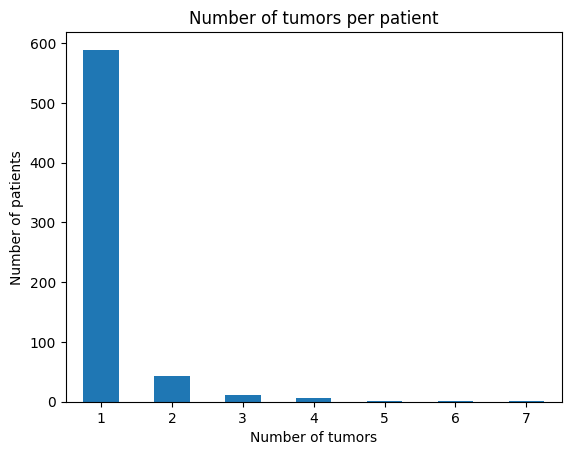

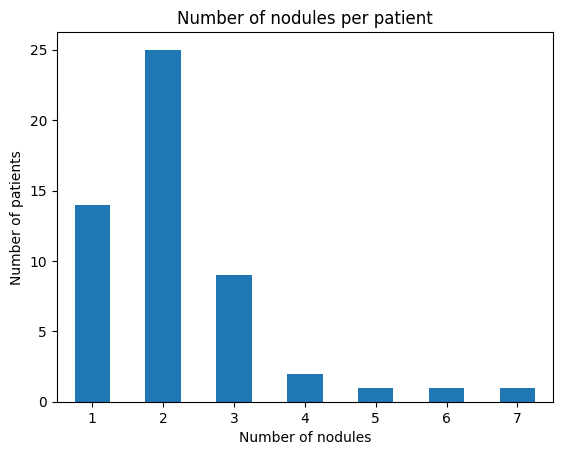

In [ ]:
# See how often we have multiple lesions for the patients
# plot - x axis - number of lesions, y axis - number of patients

df_label_plot = df_label.copy(deep=True)
df_label_plot = df_label_plot[['ID', 'Mark_labels', 'labels_type']]
df_label_plot_1 = df_label_plot[df_label_plot['labels_type']==1] # tumor
df_label_plot_2 = df_label_plot[df_label_plot['labels_type']==2] # nodule

counts = df_label_plot_1['Mark_labels'].value_counts()
counts = counts.sort_index()
counts.plot(kind='bar', rot=0)
plt.xlabel('Number of tumors')
plt.ylabel('Number of patients')
plt.title('Number of tumors per patient')
plt.show()

counts = df_label_plot_2['Mark_labels'].value_counts()
counts = counts.sort_index()
counts.plot(kind='bar', rot=0)
plt.xlabel('Number of nodules')
plt.ylabel('Number of patients')
plt.title('Number of nodules per patient')
plt.show()

# Organize metadata

In [ ]:
# Replace the nan with Neoplasm, for now

df_patient = df_patient.fillna("Neoplasm")

In [ ]:
# Create one df that is joined with the SNOMED codes
# de_type should be for where labels_type = 1 = tumor, where as labels_type = 2 is a nodule

### First separate the labels according to the labels_type ###

df_label_1 = df_label[df_label['labels_type']==1]
df_label_2 = df_label[df_label['labels_type']==2]

df_label_1 = df_label_1[['Mainfolder', 'ID', 'Mark_labels', 'labels_type', 'Lung_loc']]
df_label_2 = df_label_2[['Mainfolder', 'ID', 'Mark_labels', 'labels_type', 'Lung_loc']]

df_patient_label_1 = df_label_1.copy(deep=True)
df_patient_label_1['de_type'] = "Tumor"

### Assign the Nodule to label 2 ###

df_patient_label_2 = df_label_2.copy(deep=True)
df_patient_label_2['de_type'] = "Nodule"

### Now join the dataframes again ###

df_patient_label = pd.concat([df_patient_label_1, df_patient_label_2])
df_patient_label = df_patient_label.sort_values(by=['ID', 'Mark_labels'])

print(len(df_patient_label))
print(len(list(set(df_patient_label['ID'].values))))

### Add the SNOMED codes for the tumor/nodule ###

df_patient_label = df_patient_label.merge(right=segments_code_mapping_df, left_on='de_type', right_on="Description")
# remove the Description column
df_patient_label = df_patient_label.drop(columns=['Description'])

### Add the SNOMED codes for the lung location ###
df_patient_label = df_patient_label.copy(deep=True)
df_patient_label = df_patient_label.merge(right=anatomic_code_mapping_df, left_on="Lung_loc", right_on="Description")
df_patient_label = df_patient_label.drop(columns=["Description"])



707
602


In [ ]:
# # Create one df that is joined with the SNOMED codes
# # de_type should be for where labels_type = 1 = tumor, where as labels_type = 2 is a nodule

# ### First separate the labels according to the labels_type ###

# df_label_1 = df_label[df_label['labels_type']==1]
# df_label_2 = df_label[df_label['labels_type']==2]

# df_label_1 = df_label_1[['Mainfolder', 'ID', 'Mark_labels', 'labels_type']]
# df_label_2 = df_label_2[['Mainfolder', 'ID', 'Mark_labels', 'labels_type']]

# df_patient = df_patient[['Mainfolder', 'ID', 'de_type']]

# df_patient_label_1 = df_label_1.merge(right=df_patient, how='left', on='ID')
# df_patient_label_1 = df_patient_label_1[['Mainfolder_x', 'ID', 'Mark_labels', 'labels_type', 'de_type']]
# df_patient_label_1 = df_patient_label_1.rename(columns={"Mainfolder_x": "Mainfolder"})

# ### Assign the Nodule to label 2 ###

# df_patient_label_2 = df_label_2.copy(deep=True)
# df_patient_label_2['de_type'] = "Nodule"

# ### Now add the codes for df_patient_label_1 ###
# df_patient_label_1 = df_patient_label_1.merge(right=segments_code_mapping_df, left_on='de_type', right_on='Description')

# # Drop the Description column
# df_patient_label_1 = df_patient_label_1.drop(columns=['Description'])

# ### Now add the codes for df_patient_label_2 ###

# df_patient_label_2 = df_patient_label_2.merge(right=segments_code_mapping_df, left_on='de_type', right_on="Description")

# # Drop the Description column
# df_patient_label_2 = df_patient_label_2.drop(columns=['Description'])

# # # df_patient_label_2['CodingSchemeDesignator'] = ['SCT'] * len(df_patient_label_2)
# # # df_patient_label_2['CodeValue'] = ["27925004"] * len(df_patient_label_2)
# # # df_patient_label_2['CodeMeaning'] = ['Nodule'] * len(df_patient_label_2)

# ### Now join the dataframes again ###

# df_patient_label = pd.concat([df_patient_label_1, df_patient_label_2])
# df_patient_label = df_patient_label.sort_values(by=['ID', 'Mark_labels'])

# print(len(df_patient_label))
# print(len(list(set(df_patient_label['ID'].values))))

In [ ]:
# Join the df_patient_label with the df_table - to get all IDs

df_patient_label = df_patient_label.merge(df_image, left_on='ID', right_on='ID')
print(len(df_patient_label))

df_patient_label = df_patient_label.drop(columns=['Structure_y'])
df_patient_label = df_patient_label.rename(columns={'Structure_x':'Structure'})

707


In [ ]:
# Check these values later

patient_list = df_patient_label['ID'].values
patient_list = list(dict.fromkeys(patient_list))
print(len(patient_list))

series_list = df_patient_label['SeriesInstanceUID'].values
series_list = list(dict.fromkeys(series_list))
print(len(series_list))

602
602


In [ ]:
df_patient_label.head()

,Mainfolder,ID,Mark_labels,labels_type,Lung_loc,de_type,Structure,SegmentedPropertyCategoryCodeSequence.CodingSchemeDesignator,SegmentedPropertyCategoryCodeSequence.CodeValue,SegmentedPropertyCategoryCodeSequence.CodeMeaning,...,AnatomicRegionSequence.CodingSchemeDesignator,AnatomicRegionSequence.CodeValue,AnatomicRegionSequence.CodeMeaning,SeriesInstanceUID,StudyDate,StudyInstanceUID,SeriesDescription,Manufacturer,ConvolutionKernel,kvp
0,01_LungTumor,100012,1,1,Right upper lobe,Tumor,tumor,SCT,49755003,Morphologically Altered Structure,...,SCT,42400003,Upper lobe of right lung,1.2.840.113654.2.55.13508825378604927579146345...,20000102,1.2.840.113654.2.55.38321092839390108338558865...,"1,OPA,SE,VZOOM,B30f,280,2,120,70,40,na",SIEMENS,B30f,120
1,01_LungTumor,100147,1,1,Right upper lobe,Tumor,tumor,SCT,49755003,Morphologically Altered Structure,...,SCT,42400003,Upper lobe of right lung,1.2.840.113654.2.55.15708941008648745210499888...,20000102,1.2.840.113654.2.55.31958452963320032523273261...,"1,OPA,GE,LSPLUS,STANDARD,330,2.5,140,40,0,na",GE MEDICAL SYSTEMS,STANDARD,140
2,01_LungTumor,100158,1,1,Right upper lobe,Tumor,tumor,SCT,49755003,Morphologically Altered Structure,...,SCT,42400003,Upper lobe of right lung,1.2.840.113654.2.55.31060976780967844152296392...,20010102,1.2.840.113654.2.55.81185422866512279860334872...,"2,OPA,GE,LS16,STANDARD,350,2.5,120,650,na,na",GE MEDICAL SYSTEMS,STANDARD,120
3,01_LungTumor,100242,1,1,Left upper lobe,Tumor,tumor,SCT,49755003,Morphologically Altered Structure,...,SCT,44714003,Upper lobe of left lung,1.2.840.113654.2.55.38995485391900019876570761...,19990102,1.2.840.113654.2.55.22835224307907880875083018...,"0,OPA,GE,HSQX,STANDARD,290,2.5,120,56,0.1,1.5",GE MEDICAL SYSTEMS,STANDARD,120
4,01_LungTumor,100280,1,1,Left lower lobe,Tumor,tumor,SCT,49755003,Morphologically Altered Structure,...,SCT,41224006,Lower lobe of left lung,1.2.840.113654.2.55.11168439182281552750699540...,20000102,1.2.840.113654.2.55.30207427775351702734806349...,"1,OPA,SE,SEN16,B30f,282,2,120,45,30,na",SIEMENS,B30f,120


In [ ]:
df_patient_label.columns

Index(['Mainfolder', 'ID', 'Mark_labels', 'labels_type', 'Lung_loc', 'de_type',
       'Structure',
       'SegmentedPropertyCategoryCodeSequence.CodingSchemeDesignator',
       'SegmentedPropertyCategoryCodeSequence.CodeValue',
       'SegmentedPropertyCategoryCodeSequence.CodeMeaning',
       'SegmentedPropertyTypeCodeSequence.CodingSchemeDesignator',
       'SegmentedPropertyTypeCodeSequence.CodeValue',
       'SegmentedPropertyTypeCodeSequence.CodeMeaning',
       'SegmentedPropertyTypeModifierCodeSequence.CodingSchemeDesignator',
       'SegmentedPropertyTypeModifierCodeSequence.CodeValue',
       'SegmentedPropertyTypeModifierCodeSequence.CodeMeaning',
       'recommendedDisplayRGBValue',
       'AnatomicRegionSequence.CodingSchemeDesignator',
       'AnatomicRegionSequence.CodeValue',
       'AnatomicRegionSequence.CodeMeaning', 'SeriesInstanceUID', 'StudyDate',
       'StudyInstanceUID', 'SeriesDescription', 'Manufacturer',
       'ConvolutionKernel', 'kvp'],
      dtype='objec

In [ ]:
# Need to convert from string to original list
df_patient_label['recommendedDisplayRGBValue'] = df_patient_label['recommendedDisplayRGBValue'].apply(ast.literal_eval)

# Functions


In [ ]:
json_template = {
    "BodyPartExamined": "CHEST",
    "ClinicalTrialCoordinatingCenterName": "dcmqi",
    "ClinicalTrialSeriesID": "0",
    "ClinicalTrialTimePointID": "1",
    "ContentCreatorName": "IDC",
    "ContentDescription": "Image segmentation",
    "ContentLabel": "SEGMENTATION",
    "InstanceNumber": "1",
    "SeriesDescription": "NLST Segmentation",
    "SeriesNumber": "42",
    "segmentAttributes": [
        [
            {
                "labelID": 1,
                "recommendedDisplayRGBValue": [
                    157,
                    108,
                    162
                ],
                "SegmentLabel": "Lesion", # will be the CodeMeaning
                "SegmentDescription": "Lesion", # will be CodeMeaning
                "SegmentAlgorithmType": "MANUAL",
                # "SegmentAlgorithmName": "NLSTSeg",
                "SegmentedPropertyCategoryCodeSequence": {
                    "CodingSchemeDesignator": "SCT",
                    "CodeValue": "49755003",
                    "CodeMeaning": "Morphologically Altered Structure"
                },
                "SegmentedPropertyTypeCodeSequence": {
                    "CodingSchemeDesignator": "SCT",
                    "CodeValue": "108369006",
                    "CodeMeaning": "Neoplasm"
                },
                "AnatomicRegionSequence": {
                  "CodeValue": "44714003",
                  "CodingSchemeDesignator": "SCT",
                  "CodeMeaning": "Left upper lobe of lung"
                },
            }
        ]
    ]
}

In [ ]:
def create_json_file(input_segmentation_filename,
                     df_series,
                     json_template,
                     output_json_filename):
  """
  Inputs:
    input_segmentation_filename - name of nii.gz file holding the lesion segmentation labels
    df_series                   - dataframe holding the labels to use
    json_template               - template to use for json file
    output_json_filename        - the output json filename
  """

  # First the number of labels in the segmentation_filename should equal the number of rows in the dataframe

  nii = nib.load(input_segmentation_filename)
  img = nii.get_fdata()
  seg_labels = sorted(list(np.unique(img)))
  print('seg_labels: ' + str(seg_labels))
  # ignore 0 if in list
  seg_labels.remove(0)
  num_seg_labels = len(seg_labels)
  # number of rows in dataframe
  num_rows = len(df_series)

  print('num_seg_labels: ' + str(num_seg_labels))
  print('num_rows: ' + str(num_rows))

  if (num_rows != num_seg_labels):
    print('ERROR: the number of rows in the segmentation nii file should be equal to the number of rows in the dataframe')
    return 0

  # Get the metadata
  SeriesNumber = df_series['SeriesNumber'].values[0]

  # Modify the SeriesNumber and SeriesDescription
  SeriesNumber_new = int(SeriesNumber*100)
  SeriesDescription_new = "NLSTSeg Segmentation of Series: " + str(SeriesNumber)

  # Modify the json file with updated SeriesNumber and SeriesDescription
  # data = json_template
  data = copy.deepcopy(json_template)
  data['SeriesNumber'] = SeriesNumber_new
  data['SeriesDescription'] = SeriesDescription_new

  # Modify the json file with the lesion metadata
  segmentAttributes_new_list = []
  anatomyAttributes_new_list = []

  for n in range(0,num_seg_labels):

    segmentAttribute_new = copy.deepcopy(json_template["segmentAttributes"][0][0])

    SegmentedPropertyCategoryCodeSequence_CodingSchemeDesignator = str(df_series['SegmentedPropertyCategoryCodeSequence.CodingSchemeDesignator'].values[n])
    SegmentedPropertyCategoryCodeSequence_CodeValue = str(df_series['SegmentedPropertyCategoryCodeSequence.CodeValue'].values[n])
    SegmentedPropertyCategoryCodeSequence_CodeMeaning = str(df_series['SegmentedPropertyCategoryCodeSequence.CodeMeaning'].values[n])

    SegmentedPropertyTypeCodeSequence_CodingSchemeDesignator = str(df_series['SegmentedPropertyTypeCodeSequence.CodingSchemeDesignator'].values[n])
    SegmentedPropertyTypeCodeSequence_CodeValue = str(df_series['SegmentedPropertyTypeCodeSequence.CodeValue'].values[n])
    SegmentedPropertyTypeCodeSequence_CodeMeaning = str(df_series['SegmentedPropertyTypeCodeSequence.CodeMeaning'].values[n])

    AnatomicRegionSequence_CodingSchemeDesignator = str(df_series['AnatomicRegionSequence.CodingSchemeDesignator'].values[n])
    AnatomicRegionSequence_CodeValue = str(df_series['AnatomicRegionSequence.CodeValue'].values[n])
    AnatomicRegionSequence_CodeMeaning = str(df_series['AnatomicRegionSequence.CodeMeaning'].values[n])

    labelID = int(df_series['Mark_labels'].values[n]) # use this value instead of the seg_labels.

    segmentAttribute_new["labelID"] = labelID
    segmentAttribute_new["SegmentLabel"] = df_series['SegmentDescription'].values[n]
    segmentAttribute_new["SegmentDescription"] = SegmentedPropertyTypeCodeSequence_CodeMeaning

    segmentAttribute_new["SegmentedPropertyCategoryCodeSequence"]["CodeValue"] = SegmentedPropertyCategoryCodeSequence_CodeValue
    segmentAttribute_new["SegmentedPropertyCategoryCodeSequence"]["CodingSchemeDesignator"] = SegmentedPropertyCategoryCodeSequence_CodingSchemeDesignator
    segmentAttribute_new["SegmentedPropertyCategoryCodeSequence"]["CodeMeaning"] = SegmentedPropertyCategoryCodeSequence_CodeMeaning

    segmentAttribute_new["SegmentedPropertyTypeCodeSequence"]["CodeValue"] = SegmentedPropertyTypeCodeSequence_CodeValue
    segmentAttribute_new["SegmentedPropertyTypeCodeSequence"]["CodingSchemeDesignator"] = SegmentedPropertyTypeCodeSequence_CodingSchemeDesignator
    segmentAttribute_new["SegmentedPropertyTypeCodeSequence"]["CodeMeaning"] = SegmentedPropertyTypeCodeSequence_CodeMeaning

    segmentAttribute_new["recommendedDisplayRGBValue"] = df_series["recommendedDisplayRGBValue"].values[n]

    segmentAttribute_new["AnatomicRegionSequence"]["CodeValue"] = AnatomicRegionSequence_CodeValue
    segmentAttribute_new["AnatomicRegionSequence"]["CodingSchemeDesignator"] = AnatomicRegionSequence_CodingSchemeDesignator
    segmentAttribute_new["AnatomicRegionSequence"]["CodeMeaning"] = AnatomicRegionSequence_CodeMeaning

    # append
    segmentAttributes_new_list.append(segmentAttribute_new)

  # Re-assign the segmentAttributes - list of lists
  # data['segmentAttributes'] = segmentAttributes_new_list
  data['segmentAttributes'] = []
  data['segmentAttributes'].append(segmentAttributes_new_list)

  # Write out the modified json file
  with open(output_json_filename, "w", encoding="utf-8") as f:
    json.dump(data, f, indent=4)


  return 1

In [ ]:
def download_dicom_data(series_id: str) -> None:
    """
    Downloads raw DICOM data

    Args:
    series_id: The DICOM Tag SeriesInstanceUID of the DICOM series to be converted.
    """
    download_directory = os.path.join("/content/idc_data",series_id)
    # Attempt to remove the directory for the series if it exists
    try:
        shutil.rmtree(download_directory)
    except OSError:
        pass
    print(f'\n Downloading DICOM files from IDC Storage Buckets \n')
    idc_client.download_dicom_series(seriesInstanceUID= series_id, downloadDir=download_directory, dirTemplate='', quiet=False)

In [ ]:
# def convert_dicom_to_nifti(series_id: str) -> None:
#     """
#     Converts a DICOM series to a NIfTI file.

#     Args:
#       series_id: The DICOM Tag SeriesInstanceUID of the DICOM series to be converted.
#     """

#     # Attempt to remove the directory for the series if it exists
#     try:
#         shutil.rmtree(os.path.join("/content/dcm2niix",series_id))
#     except OSError:
#         pass

#     # Create a new directory for the series
#     os.mkdir(os.path.join("/content/dcm2niix",series_id))

#     print("\n Converting DICOM files to NIfTI \n")

#     # Run the appropriate converter command and capture the output

#     # use just SeriesInstanceUID for the output file name to make it more readable
#     result = subprocess.run(
#         f"/usr/local/bin/dcm2niix -z y -f %j -b n -m y -o /content/dcm2niix/{series_id}/ /content/idc_data/{series_id}",
#         shell=True,
#         capture_output=True,
#         text=True,
#     )
#     print(result.stdout)
#     print("\n Conversion successful")

def convert_dicom_to_nifti_sitk(series_id: str) -> None:
    """
    Converts a DICOM series to a NIfTI file using SimpleITK.

    Args:
      series_id: The DICOM Tag SeriesInstanceUID of the DICOM series to be converted.
    """

    # Attempt to remove the directory for the series if it exists
    try:
        shutil.rmtree(os.path.join("/content/dcm2niix",series_id))
    except OSError:
        pass

    # Create a new directory for the series
    os.mkdir(os.path.join("/content/dcm2niix",series_id))

    print("\n Converting DICOM files to NIfTI \n")

    # Run the appropriate converter command and capture the output
    # use just SeriesInstanceUID for the output file name to make it more readable

    dicom_reader = sitk.ImageSeriesReader()
    if series_id is None:
      series_id = ''
    dicom_file_names = dicom_reader.GetGDCMSeriesFileNames(os.path.join("/content/idc_data", series_id),
                                                           seriesID=series_id)
    if not dicom_file_names:
      download_path = os.path.join("/content/idc_data", series_id)
      print('Directory {} is not a dicom'.format(download_path))
    dicom_reader.SetFileNames(dicom_file_names)
    dicom_image = dicom_reader.Execute()

    # Write image as nii using sitk
    output_nifti_filename = os.path.join("/content/dcm2niix", series_id, series_id + ".nii.gz")
    if not os.path.exists(os.path.join("/content/dcm2niix", series_id)):
      os.mkdir(os.path.join("/content/dcm2niix", series_id))
    sitk.WriteImage(dicom_image, output_nifti_filename)


In [ ]:
# set radiomics verbosity
logger = radiomics.logger
logger.setLevel(logging.WARNING)

def extract_radiomics_features_from_one_label(
    segmentation_file, image_file, label_id_body_part_df, label=None
):
    """
    Extract radiomics features from a given ct nifti image and segmentation file.

    Args:
        segmentation_file: The path to the segmentation file.
        image_file: The path to the ct nifti image file.
        label: The label of the region of interest in the segmentation file.

    Returns:
        A dictionary containing the extracted radiomics features.
    """
    body_part = label_id_body_part_df.loc[label_id_body_part_df["label_id"] == label][
        "body_part"
    ].values[0]
    print('In extract_radiomics_features_from_one_label')
    print('label: ' + str(label))
    print('body_part: ' + str(body_part))

    try:
        # Define the settings for the feature extractor

        """the tolerance value is taken from the totalsegmentator repo
        # https://github.com/wasserth/TotalSegmentator/blob/master/totalsegmentator/statistics.py#L31
        """
        settings = {"geometryTolerance": 1e-3}

        # Create the feature extractor
        extractor = featureextractor.RadiomicsFeatureExtractor(**settings)

        # Get the list of shape and firstorder features
        shape_features = radiomics_features_code_mapping_df[
            radiomics_features_code_mapping_df[
                "pyradiomics_feature_class"
            ]
            == "shape"
        ]["feature"].tolist()
        firstorder_features = radiomics_features_code_mapping_df[
            radiomics_features_code_mapping_df[
                "pyradiomics_feature_class"
            ]
            == "firstorder"
        ]["feature"].tolist()

        # Enable the shape and firstorder features
        extractor.disableAllFeatures()
        extractor.enableFeaturesByName(
            # NB: while testing, use the line below to reduce the number of features to be extracted
            # firstorder=firstorder_features[:3]
            firstorder=firstorder_features, shape=shape_features
        )
        # Extract the features
        raw_features = extractor.execute(
            str(image_file), str(segmentation_file), label=label
        )

        # Clean the feature names and round the values
        cleaned_features = {
            name.replace("original_", ""): round(float(value), 4)
            for name, value in raw_features.items()
            if name.startswith("original_")
        }
        mask_stats = {
            k: v.tolist() if isinstance(v, np.ndarray) else v
            for k, v in cleaned_features.items()
        }
    except Exception as e:
        print(
            f"WARNING: radiomics raised an exception (setting all features to 0): {e}"
        )
        cleaned_features = {feature: 0 for feature in shape_features}
        raw_features= {feature: 0 for feature in shape_features}
        mask_stats = {
            k: v.tolist() if isinstance(v, np.ndarray) else v
            for k, v in cleaned_features.items()
        }
    return body_part, mask_stats, raw_features

In [ ]:
def extract_features_for_all_labels(ct_file: Path, seg_file: Path, output_file: Path, output_json_filename: str):
    """
    Extract radiomics features from a given image and segmentation file for all labels, and map the label numbers to names.

    Args:
        ct_file: The path to the CT Nifti image file.
        seg_file: The path to the segmentation file.
        output_file: The path to the output file where the results will be saved.
        output_json_filename: The json filename used from creating the associated DICOM SEG file

    Returns:
        None. The results are saved to the output file.
    """
    # # Map the label IDs to body part names
    # label_id_body_part_data = map_to_binary.class_map["total_v1"].items()
    # label_id_body_part_df = pd.DataFrame(
    #     label_id_body_part_data, columns=["label_id", "body_part"]
    # )
    label_id_body_part_df = pd.DataFrame()
    # label_id_body_part_df["body_part"] = segments_code_mapping_df["Structure"].values

    # Since the label ids in the segmentation file don't map to the names,
    # we need to input the actual json file from the DICOM SEG file
    # And since the lesions are on a patient level, and not a lesion level, will all have the same type
    with open(output_json_filename, 'r') as file:
      seg_json = json.load(file)
    # body_part = SegmentLabel names
    # body_part = [f['SegmentLabel'] for f in seg_json['segmentAttributes'][0]]
    body_part = [f['SegmentDescription'] for f in seg_json['segmentAttributes'][0]]
    # now find corresponding names from segments_code_mapping_df['Structure']
    body_part_mapping_dict = {}
    keys = segments_code_mapping_df['SegmentedPropertyTypeCodeSequence.CodeMeaning'].values
    values = segments_code_mapping_df['Structure'].values
    body_part_mapping_dict = {key: value for key, value in zip(keys, values)}
    # label_id_body_part_df['body_part'] = body_part
    label_id_body_part_df['body_part'] = [body_part_mapping_dict[f] for f in body_part]

    # label_id_body_part_df["label_id"] = [1] * len(label_id_body_part_df)
    label_id_body_part_df["label_id"] = list(np.arange(1,len(label_id_body_part_df)+1)) # get from the label??
    print('label_id_body_part_df: ' + str(label_id_body_part_df))

    # Initialize an empty dictionary to store the results
    stats = {}
    raw_stats = {}

    # Get the list of unique labels in the segmentation file
    labels = [
        int(x) for x in np.unique(nib.load(seg_file).get_fdata()).tolist() if x != 0
    ]
    print('labels: ' + str(labels))

    # Define the function to be applied to each label
    func = partial(
        extract_radiomics_features_from_one_label,
        seg_file,
        ct_file,
        label_id_body_part_df,
    )

    # if not is_series_greater_than_800_slices(series_id):
    #     # Use a multiprocessing pool to apply the function to all labels
    #     with multiprocessing.Pool() as pool:
    #         results = list(tqdm(pool.imap(func, labels), total=len(labels)))
    # else:
    #     # Apply the function to all labels sequentially
    #     results = [func(label) for label in tqdm(labels)]
    results = [func(label) for label in tqdm(labels)]

    print('results: ' + str(results))

    # Process the results
    # This needs to be per label_id not per body_part - since we can have multiple of the same body part!
    label_index = 1
    for body_part, mask_stats, raw_features in results:
      print("label_index: " + str(index))
      print('body_part: ' + str(body_part))
      print('mask_stats: ' + str(mask_stats))
      print('raw_features: ' + str(raw_features))
      if any(v != 0 for v in mask_stats.values()):
          # stats[body_part] = mask_stats
          # raw_stats[body_part] = raw_features
          stats[label_index] = mask_stats
          raw_stats[label_index] = raw_features
          label_index += 1

    # Save the results to the output file
    with open(output_file, "w") as f:
        json.dump(stats, f, indent=4)
    try:
        # Save the raw features to a separate output file
        with open(output_file.rsplit(".", 1)[0] + "_raw.json", "w") as f:
            json.dump(raw_stats, f, indent=4, default=ndarray_to_list)
    except:
        log_failed_to_save_raw_radiomics_features(series_id)

In [ ]:
def ndarray_to_list(obj):

    """Convert a numpy array to a list.
       Helps for saving raw radiomics in a json file

    Args:
      obj: A numpy array.

    Returns:
      A list representation of the numpy array.
    """

    if isinstance(obj, np.ndarray):
        return obj.tolist()
    return obj

In [ ]:
def log_failed_to_save_raw_radiomics_features(series_id: str) -> None:
    """
    Log an error message when the raw radiomics features for a given series fail to save.

    Args:
        series_id: The ID of the series.

    Returns:
        None. The error message is written to a log file.
    """
    # Define the path to the log file
    log_file_path = '/content/radiomics_error_file.txt'

    # Define the error message
    error_message = f"Error: Failed to save raw radiomics features for series {series_id}\n"

    # Append the error message to the log file
    with open(log_file_path, 'a') as f:
        f.write(error_message)

In [ ]:
def setup_and_trigger_extraction_of_radiomics_features_all_labels(series_id: str,
                                                                  output_json_filename: str):
    """
    Compute radiomics features for all labels in a given series.
    This function calls `extract_features_for_all_labels` with
    the expected file paths of ct nifti and segmentation nifti
    files.

    Args:
        series_id: The ID of the series.

    Returns:
        None. The results are saved to a file.
    """
    # Define the paths
    inference_nifti_path = os.path.join(
        "/content/Inference", series_id, f"{series_id}.nii.gz"
    )

    # Get the full path of the CT Nifti file
    ct_series_id_folder_path = os.path.join("/content/dcm2niix", series_id)
    # Get the list of files in series_id_path
    ct_nifti_files = os.listdir(ct_series_id_folder_path)
    # Get the first (and only) file in the list
    ct_nifti_filename = ct_nifti_files[0]
    # Get the full path of the file
    ct_nifti_filename_path = os.path.join(ct_series_id_folder_path, ct_nifti_filename)

    # Define the output filename
    output_filename = os.path.join(
        "/content/radiomics", series_id, f"{series_id}_radiomics.json"
    )
    if not os.path.isdir(os.path.join("/content/radiomics", series_id)):
      os.mkdir(os.path.join("/content/radiomics", series_id))

    # Record the start time
    start_time = time.time()

    # Compute the radiomics features for all labels
    extract_features_for_all_labels(
        ct_nifti_filename_path, inference_nifti_path, output_filename, output_json_filename
    )

    # Calculate the elapsed time
    elapsed_time = time.time() - start_time

    print(f"Radiomics Features Calculation Done in {elapsed_time} seconds.")

In [ ]:
def verify_radiomics_extraction(series_id: str):
    """
    Verify if the radiomics feature extraction was successful for a given series.

    Args:
        series_id: The ID of the series.

    Returns:
        A boolean indicating whether the radiomics feature extraction failed.
    """
    # Define the path to the output file
    output_file_path = os.path.join('/content/radiomics',series_id, f"{series_id}_radiomics.json")

    try:
        # Check if the output file exists
        assert os.path.exists(output_file_path)
    except AssertionError:
        # If the output file does not exist, log an error and return True
        with open('radiomics_error_file.txt', 'a') as f:
            f.write(f"Error: Radiomics Feature extraction failed for series {series_id}\n")
        return True

    # If the output file exists, return False
    return False

In [ ]:
# def post_process_radiomics_features(series_id: str):
#     """
#     Post-process the computed radiomics features for a given series.

#     In dicom seg objects, segment numbers should be continuous,
#     so label numbers cannot be used as we may not always see all
#     labels

#     Args:
#         series_id: The ID of the series.

#     Returns:
#         A DataFrame containing the processed radiomics features.
#     """
#     # Define the path to the JSON file containing the radiomics features
#     json_path = os.path.join('/content/radiomics', series_id, f'{series_id}_radiomics.json')

#     # Load the JSON file into a DataFrame
#     radiomics_df = pd.read_json(json_path, orient='index')

#     # Rename the columns by splitting on underscores and taking the last part
#     radiomics_df = radiomics_df.rename(columns=lambda x: x.split('_')[-1])

#     # Reset the index and rename the index column to 'body_part'
#     radiomics_df = radiomics_df.reset_index().rename(columns={'index': 'body_part'})

#     # Create a DataFrame from the class map
#     class_map_df = pd.DataFrame(map_to_binary.class_map['total_v1'].items(), columns=['label_id', 'body_part'])

#     # Merge the radiomics DataFrame with the class map DataFrame
#     radiomics_df = pd.merge(radiomics_df, class_map_df, on='body_part')

#     # Sort the 'label_id' column and create a 'seg_segment_number' column
#     radiomics_df = radiomics_df.assign(
#         label_id=radiomics_df['label_id'].astype(int).sort_values(),
#         seg_segment_number=range(1, len(radiomics_df) + 1)
#     )

#     # Reorder the columns
#     columns = ['body_part', 'seg_segment_number', 'label_id'] + [col for col in radiomics_df.columns if col not in ['body_part', 'seg_segment_number', 'label_id']]
#     radiomics_df = radiomics_df[columns]
#     '''
#     in IBSI kurtosis is subracted by 3 units
#     https://pubs.rsna.org/doi/suppl/10.1148/radiol.2020191145/suppl_file/IBSI_Reference_Manual.pdf#.3.4%20(Excess)%20intensity%20kurtosis
#     '''
#     if 'Kurtosis' in radiomics_df.columns:
#       radiomics_df['Kurtosis']=radiomics_df['Kurtosis']-3

#     return radiomics_df


def post_process_radiomics_features(series_id: str, df_series):
    """
    Post-process the computed radiomics features for a given series.

    In dicom seg objects, segment numbers should be continuous,
    so label numbers cannot be used as we may not always see all
    labels

    Args:
        series_id: The ID of the series.

    Returns:
        A DataFrame containing the processed radiomics features.
    """
    # Define the path to the JSON file containing the radiomics features
    json_path = os.path.join('/content/radiomics', series_id, f'{series_id}_radiomics.json')

    # Load the JSON file into a DataFrame
    radiomics_df = pd.read_json(json_path, orient='index')

    # Rename the columns by splitting on underscores and taking the last part
    radiomics_df = radiomics_df.rename(columns=lambda x: x.split('_')[-1])

    # Reset the index and rename the index column to 'body_part'
    radiomics_df = radiomics_df.reset_index().rename(columns={'index': 'body_part'})

    # DK - change this. Need to reassign because there could be multiple of the same body parts.
    body_part = df_series['Structure'].values
    radiomics_df['body_part'] = body_part

    # # Create a DataFrame from the class map
    # class_map_df = pd.DataFrame(map_to_binary.class_map['total_v1'].items(), columns=['label_id', 'body_part'])

    # # Merge the radiomics DataFrame with the class map DataFrame
    # radiomics_df = pd.merge(radiomics_df, class_map_df, on='body_part')

    # I add this in because for NLSTSeg the label_id is equal to the number of tumors
    radiomics_df['label_id'] = list(np.arange(1,len(radiomics_df)+1))

    # Sort the 'label_id' column and create a 'seg_segment_number' column
    radiomics_df = radiomics_df.assign(
        label_id=radiomics_df['label_id'].astype(int).sort_values(),
        seg_segment_number=range(1, len(radiomics_df) + 1)
    )

    # Reorder the columns
    columns = ['body_part', 'seg_segment_number', 'label_id'] + [col for col in radiomics_df.columns if col not in ['body_part', 'seg_segment_number', 'label_id']]
    radiomics_df = radiomics_df[columns]
    '''
    in IBSI kurtosis is subracted by 3 units
    https://pubs.rsna.org/doi/suppl/10.1148/radiol.2020191145/suppl_file/IBSI_Reference_Manual.pdf#.3.4%20(Excess)%20intensity%20kurtosis
    '''
    if 'Kurtosis' in radiomics_df.columns:
      radiomics_df['Kurtosis']=radiomics_df['Kurtosis']-3

    return radiomics_df

In [ ]:
# Define the segment code mapping DataFrame and feature code mapping DataFrames
shape_features_code_mapping_df = (
    radiomics_features_code_mapping_df[
        radiomics_features_code_mapping_df[
            "pyradiomics_feature_class"
        ]
        == "shape"
    ]
)
first_order_features_code_mapping_df = (
    radiomics_features_code_mapping_df[
        radiomics_features_code_mapping_df[
            "pyradiomics_feature_class"
        ]
        == "firstorder"
    ]
)

In [ ]:
def create_structured_report_metajson_for_features(
    SeriesInstanceUID,
    series_number,
    SOPInstanceUID_seg,
    seg_file,
    dcm_directory,
    segments_code_mapping_df,
    features_code_mapping_df,
    radiomics_features,
):

    """Function that creates the metajson necessary for the creation of a
    structured report from a pandas dataframe of label names and features for
    each.

    Inputs:
      SeriesInstanceUID               : SeriesInstanceUID of the corresponding CT
                                        file
      series_number                    : SeriesNumber of the corresponding CT file
      SOPInstanceUID_seg              : SOPInstanceUID of the corresponding SEG file
      seg_file                        : filename of SEG DCM file
      dcm_directory                   : ct directory
      segments_code_mapping_df        : dataframe that holds the names of the
                                        segments and the associated code values etc.
      features_code_mapping_df        : dataframe that holds the names of the
                                        features and the associated code values etc.
      df_features                     : a pandas dataframe holding the segments and a
                                        set of 3D shape features for each

    Outputs:
      Returns the metajson for the structured report that will then be used by
      dcmqi tid1500writer to create a structured report
    """

    # --- Get the version number for the pyradiomics package --- #

    pyradiomics_version_number = str(radiomics.__version__)

    image_library= [os.path.basename(f) for f in os.listdir(dcm_directory)]

    # --- Create the header for the json --- #

    inputMetadata = {}
    inputMetadata[
        "@schema"
    ] = "https://raw.githubusercontent.com/qiicr/dcmqi/master/doc/schemas/sr-tid1500-schema.json#"
    inputMetadata["SeriesDescription"] = (
        "NLSTSeg "
        + features_code_mapping_df["pyradiomics_feature_class"].iloc[0]
        + " Measurements of series "
        + str(series_number)
    )
    if series_number:
        inputMetadata["SeriesNumber"] = str(1 + int(series_number) * 100)
    inputMetadata["InstanceNumber"] = "1"

    inputMetadata["compositeContext"] = [seg_file]

    inputMetadata["imageLibrary"] = image_library
    inputMetadata["observerContext"] = {
        "ObserverType": "DEVICE",
        "DeviceObserverName": "pyradiomics",
        "DeviceObserverModelName": pyradiomics_version_number,
    }

    inputMetadata["VerificationFlag"] = "UNVERIFIED"
    inputMetadata["CompletionFlag"] = "COMPLETE"
    inputMetadata["activitySession"] = "1"
    inputMetadata["timePoint"] = "1"

    # ------------------------------------------------------------------------- #
    # --- Create the measurement_dict for each segment - holds all features --- #

    measurement = []

    # --- Now create the dict for all features and all segments --- #

    # --- Loop over the number of segments --- #

    # number of rows in the df_features
    num_segments = radiomics_features.shape[0]
    print('num_segments: ' + str(num_segments))

    # Array of dictionaries - one dictionary for each segment
    measurement_across_segments_combined = []

    for segment_id in range(0, num_segments):

        # ReferencedSegment = int(
        #     radiomics_features["seg_segment_number"].values[segment_id]
        # )  # referencedsegment must be an integer according to the schema.
        # FindingSite = radiomics_features["body_part"].values[segment_id]

        ReferencedSegment = segment_id + 1
        FindingSite = radiomics_features["body_part"].values[segment_id]
        print('segment_id: ' + str(segment_id))
        print('ReferencedSegment: ' + str(ReferencedSegment))
        print('FindingSite: ' + str(FindingSite))

        # --- Create the dict for the Measurements group --- #
        # TrackingIdentifier = "Measurements group " + str(ReferencedSegment)
        TrackingIdentifier = radiomics_features['TrackingIdentifier'].values[segment_id]

        segment_row = segments_code_mapping_df[
            segments_code_mapping_df["Structure"] == FindingSite
        ]
        # print("segment_row: " + str(segment_row))

        # Inside the loop for each segment
        my_dict = {
            "TrackingIdentifier": str(TrackingIdentifier),
            "ReferencedSegment": int(ReferencedSegment),
            "SourceSeriesForImageSegmentation": str(SeriesInstanceUID),
            "segmentationSOPInstanceUID": str(SOPInstanceUID_seg),
            "Finding": {
                "CodeValue": str(
                    segment_row["SegmentedPropertyCategoryCodeSequence.CodeValue"].iloc[
                        0
                    ]
                ),
                "CodingSchemeDesignator": str(
                    segment_row[
                        "SegmentedPropertyCategoryCodeSequence.CodingSchemeDesignator"
                    ].iloc[0]
                ),
                "CodeMeaning": str(
                    segment_row[
                        "SegmentedPropertyCategoryCodeSequence.CodeMeaning"
                    ].iloc[0]
                ),
            },
            "FindingSite": {
                "CodeValue": str(
                    segment_row["SegmentedPropertyTypeCodeSequence.CodeValue"].iloc[0]
                ),
                "CodingSchemeDesignator": str(
                    segment_row[
                        "SegmentedPropertyTypeCodeSequence.CodingSchemeDesignator"
                    ].iloc[0]
                ),
                "CodeMeaning": str(
                    segment_row["SegmentedPropertyTypeCodeSequence.CodeMeaning"].iloc[0]
                ),
            },
            "measurementAlgorithmIdentification": {
                "AlgorithmName": "pyradiomics",
                "AlgorithmVersion": str(pyradiomics_version_number)
            }
        }

        laterality_dict = {
            "CodeValue": str(
                segment_row["SegmentedPropertyTypeModifierCodeSequence.CodeValue"].iloc[
                    0
                ]
            ),
            "CodingSchemeDesignator": str(
                segment_row[
                    "SegmentedPropertyTypeModifierCodeSequence.CodingSchemeDesignator"
                ].iloc[0]
            ),
            "CodeMeaning": str(
                segment_row[
                    "SegmentedPropertyTypeModifierCodeSequence.CodeMeaning"
                ].iloc[0]
            ),
        }

        # Append the remaining code after creating the measurement_across_segments_combined array
        # Check if the laterality dictionary is empty or contains NaN values
        if laterality_dict and not any(
            value == "nan" or pd.isna(value) for value in laterality_dict.values()
        ):
            my_dict["Laterality"] = laterality_dict

        measurement = []
        # number of features - number of columns in df_features - 2 (label_name and ReferencedSegment)
        # num_values = len(radiomics_features.columns) - 2
        num_values = len(radiomics_features.columns) - 3
        print('num_values: ' + str(num_values))

        # feature_list = radiomics_features.columns[2:] # remove first two
        feature_list = features_code_mapping_df.feature.to_list()
        print('feature_list: ' + str(feature_list))

        # For each measurement per region segment
        for n in range(0, len(feature_list)):
            if not feature_list[n] in radiomics_features.columns:
                print("failed to find feature "+features_code_mapping_df["feature"]+" - skipping")
                continue
            measurement_dict = {}
            # row = radiomics_features.loc[radiomics_features["body_part"] == FindingSite]
            row = radiomics_features.loc[radiomics_features["label_id"] == segment_id+1] # need to use segment_id and not FindingSite, as there could be multiple of the same FindingSite!
            feature_row = features_code_mapping_df.loc[
                features_code_mapping_df["feature"] == feature_list[n]
            ]
            # continue if feature_row is empty
            if row.empty:
                print("failed to find feature "+features_code_mapping_df["feature"])
                continue

            value = str(np.round(row[feature_list[n]].values[0], 3))
            measurement_dict["value"] = value
            measurement_dict["quantity"] = {}
            measurement_dict["quantity"]["CodeValue"] = str(
                feature_row["quantity_CodeValue"].values[0]
            )
            measurement_dict["quantity"]["CodingSchemeDesignator"] = str(
                feature_row["quantity_CodingSchemeDesignator"].values[0]
            )
            measurement_dict["quantity"]["CodeMeaning"] = str(
                feature_row["quantity_CodeMeaning"].values[0]
            )
            measurement_dict["units"] = {}
            measurement_dict["units"]["CodeValue"] = str(
                feature_row["units_CodeValue"].values[0]
            )
            measurement_dict["units"]["CodingSchemeDesignator"] = str(
                feature_row["units_CodingSchemeDesignator"].values[0]
            )
            measurement_dict["units"]["CodeMeaning"] = str(
                feature_row["units_CodeMeaning"].values[0]
            )
            measurement.append(measurement_dict)

        measurement_combined_dict = {}
        measurement_combined_dict[
            "measurementItems"
        ] = measurement  # measurement is an array of dictionaries

        output_dict_one_segment = {**my_dict, **measurement_combined_dict}

        # append to array for all segments

        measurement_across_segments_combined.append(output_dict_one_segment)

    # --- Add the measurement data --- #

    inputMetadata["Measurements"] = {}
    inputMetadata["Measurements"] = measurement_across_segments_combined
    feature_type = features_code_mapping_df["pyradiomics_feature_class"].iloc[0]
    if not os.path.isdir(os.path.join("/content/structuredReportsJSON", series_id)):
      os.makedirs(os.path.join("/content/structuredReportsJSON", series_id), exist_ok=True)
    sr_json_path = os.path.join("/content/structuredReportsJSON", series_id, series_id + '_' + feature_type + "_sr.json")
    if not os.path.isdir(os.path.join("/content/structuredReportsDICOM", series_id)):
      os.makedirs(os.path.join("/content/structuredReportsDICOM", series_id), exist_ok=True)
    sr_path = os.path.join("/content/structuredReportsDICOM", series_id, series_id + '_' + feature_type + "_sr.dcm")
    pred_dicomseg_path = os.path.join("/content/itkimage2segimage", series_id)

    with open(sr_json_path, "w") as f:
        json.dump(inputMetadata, f, indent=2)
        print(f"wrote out json for {feature_type} features")

    inputImageLibraryDirectory = dcm_directory
    # outputDICOM = sr_json_path
    outputDICOM = sr_path
    # the name of the folder where the seg files are located
    inputCompositeContextDirectory = pred_dicomseg_path
    inputMetadata_json = sr_json_path

    print("inputImageLibraryDirectory: " + str(inputImageLibraryDirectory))
    print("outputDICOM: " + str(outputDICOM))
    print("inputCompositeContextDirectory: " + str(inputCompositeContextDirectory))
    print("inputMetadata_json: " + str(inputMetadata_json))
    try:
      !tid1500writer --inputImageLibraryDirectory $inputImageLibraryDirectory \
                    --outputDICOM $outputDICOM  \
                    --inputCompositeContextDirectory $inputCompositeContextDirectory \
                    --inputMetadata $sr_json_path
      print(f"wrote out SR for {feature_type} radiomics features\n")
    except:
      print("ERROR: failed to save the SR ")

In [ ]:
def check_blob_exists(bucket_name: str, file_name: str) -> bool:
  """Checks if a blob (file) exists in a GCS bucket."""
  client = storage.Client()
  bucket = client.bucket(bucket_name)
  blob = bucket.blob(file_name)
  return blob.exists(client)

In [ ]:
# https://cloud.google.com/storage/docs/listing-objects#storage-list-objects-python
def list_blobs(bucket_name):
  """Lists all the blobs in the bucket."""
  storage_client = storage.Client()
  # Note: Client.list_blobs requires at least package version 1.17.0.
  blobs = storage_client.list_blobs(bucket_name)
  # Note: The call returns a response only when the iterator is consumed.
  blob_names = []
  for blob in blobs:
    blob_names.append(blob.name)

  return blob_names

# Create DICOM SEG and SRs

In [ ]:
dicom_directory = "/content/idc_data"
if not os.path.isdir(dicom_directory):
  os.mkdir(dicom_directory)

# Directory for DICOM SEG
seg_directory = "/content/itkimage2segimage/"
if not os.path.isdir(seg_directory):
  os.mkdir(seg_directory)

if not os.path.isdir("/content/dcm2niix/"):
  os.mkdir("/content/dcm2niix/")

if not os.path.isdir("/content/radiomics/"):
  os.mkdir("/content/radiomics/")

if not os.path.isdir("/content/Inference/"):
  os.mkdir("/content/Inference/")

# Get list of SeriesInstanceUIDs
SeriesInstanceUID_list = df_patient_label['SeriesInstanceUID'].values
SeriesInstanceUID_list = list(dict.fromkeys(SeriesInstanceUID_list))
print(len(SeriesInstanceUID_list))

602


In [ ]:
# Get the SeriesInstanceUIDs/PatientIDs that are missing
# Only 597 in the bucket, should be 602

# PatientID = 112285 - posted github issue. Has two rows in the Label.xlsx file, but Mark_labels=1 for both. And the tumor nii file only has unique labels 0,1.
#

# filenames_bucket = list_blobs("nlstseg_seg_and_sr")
# seg_filenames_bucket = [f for f in filenames_bucket if f.startswith("seg")]
# seg_filenames_bucket = [os.path.basename(f) for f in seg_filenames_bucket] # get the filename
# seg_filenames_bucket = [f for f in seg_filenames_bucket] # get the filename without the folder
# SeriesInstanceUID_list_processed = [f.split('_')[0] for f in seg_filenames_bucket] # get just the SeriesInstanceUID
# print(len(seg_filenames_bucket))
# print(len(SeriesInstanceUID_list_processed))
# print(SeriesInstanceUID_list_processed[0])

# SeriesInstanceUID_list_missing = list(set(SeriesInstanceUID_list) - set(SeriesInstanceUID_list_processed))
# print(len(SeriesInstanceUID_list_missing))
# print(SeriesInstanceUID_list_missing)

# ## This is the one with two rows in Label.xlsx with Mark_labels=1 for both, which can't be true.
# filenames_bucket = list_blobs("nlstseg_seg_and_sr")
# seg_filenames_bucket = [f for f in filenames_bucket if f.startswith("sr_shape")]
# seg_filenames_bucket = [os.path.basename(f) for f in seg_filenames_bucket] # get the filename
# seg_filenames_bucket = [f for f in seg_filenames_bucket] # get the filename without the folder
# SeriesInstanceUID_list_processed = [f.split('_')[0] for f in seg_filenames_bucket] # get just the SeriesInstanceUID
# print(len(seg_filenames_bucket))
# print(len(SeriesInstanceUID_list_processed))

# SeriesInstanceUID_list_missing = list(set(SeriesInstanceUID_list) - set(SeriesInstanceUID_list_processed))
# print(len(SeriesInstanceUID_list_missing))
# print(SeriesInstanceUID_list_missing)

In [ ]:
# df_patient_label[df_patient_label['SeriesInstanceUID'].isin(SeriesInstanceUID_list_missing)]


In [ ]:
# # Check the patient where the radiomics features were all zero
# PatientID = "112285"
# # SeriesInstanceUID_list_missing = df_patient_label[df_patient_label['ID']==PatientID]['SeriesInstanceUID'].values
# SeriesInstanceUID_list_missing = ["1.2.840.113654.2.55.38331112054215767893080935276683387701"] # from the labels spreadsheet.
# print('SeriesInstanceUID_list_missing: ' + str(SeriesInstanceUID_list_missing))

In [ ]:
# SeriesInstanceUID_temp = ["1.2.840.113654.2.55.264823538108475401141178460625066576318"]
# df_series = df_patient_label[df_patient_label['SeriesInstanceUID']==str(SeriesInstanceUID_temp[0])]


In [ ]:
# # ERROR: the number of rows in the segmentation nii file should be equal to the number of rows in the dataframe'
# on_SeriesInstanceUID = "1.2.840.113654.2.55.339163265688066820196912445516672710004"
# SeriesInstanceUID_list.index(on_SeriesInstanceUID)

In [ ]:
# empty radiomics features for
# 1.3.6.1.4.1.14519.5.2.1.7009.9004.650053797534074365337114411297

In [ ]:
# # SR is incorrect for ones with more than 1 nodule/tumor
# # Taking the volume for the first one of the same time
# SeriesInstanceUID_list_test = []
# SeriesInstanceUID_list_test.append("1.3.6.1.4.1.14519.5.2.1.7009.9004.211693205194678397362913455586")


In [ ]:
# Run for the series where Mark_labels > 1
SeriesInstanceUID_list_test = list(set(df_patient_label[df_patient_label['Mark_labels']>1]['SeriesInstanceUID'].values))
print(len(SeriesInstanceUID_list_test))

68


In [ ]:
# Looks like SR creation failed for 30 -- it created SRs but no measurements
# try for one of them.
SeriesInstanceUID_list_test = ["1.2.840.113654.2.55.213160650774791488888759812440898699881"]


In [ ]:
# first one has 1 tumor
# second one has 1 tumor and 6 nodules
SeriesInstanceUID_list_test = ["1.2.840.113654.2.55.135088253786049275791463451273034430925",
                               "1.3.6.1.4.1.14519.5.2.1.7009.9004.211693205194678397362913455586"]

In [ ]:
# Print checkpoint
checkpoints = {int(len(SeriesInstanceUID_list) * i / 10) for i in range(1, 11)}

# Set the clinical trial information to add to SEG/SR
# The original NLST clinical trial information
ClinicalTrialSponsorName = "National Cancer Institute" # (0012,0010)
ClinicalTrialProtocolID = "NCT00047385" # (0012,0020)
ClinicalTrialProtocolName = "NLST-LSS" # (0012,0021)
ClinicalTrialSiteID = ""
ClinicalTrialSiteName = ""
ClinicalTrialSponsorName_str = "(0012,0010)=" + ClinicalTrialSponsorName
ClinicalTrialProtocolID_str = "(0012,0020)=" + ClinicalTrialProtocolID
ClinicalTrialProtocolName_str = "(0012,0021)=" + ClinicalTrialProtocolName
ClinicalTrialSiteID_str = "(0012,0030)=" + ClinicalTrialSiteID
ClinicalTrialSiteName_str = "(0012,0031)" + ClinicalTrialSiteName
# The new reserved DOI for the NLSTSeg SEG/SR
# OtherClinicalTrialSponsorName = "Imaging Data Commons" # (0012,0010)
OtherClinicalTrialProtocolID = "10.5281/zenodo.17362624" # (0012,0020)
OtherIssuerOfClinicalTrialProtocolID =  "DOI" # (0012,0022)
# OtherClinicalTrialSponsorName_str = "(0012,0023)+[0].(0012,0010)=" + OtherClinicalTrialSponsorName
OtherClinicalTrialProtocolID_str = "(0012,0023)+[0].(0012,0020)=" + OtherClinicalTrialProtocolID
OtherIssuerOfClinicalTrialProtocolID_str = "(0012,0023)+[0].(0012,0022)=" + OtherIssuerOfClinicalTrialProtocolID

### LOOP over the series ###

# for index, SeriesInstanceUID in enumerate(SeriesInstanceUID_list[0:100],1):
# for index, SeriesInstanceUID in enumerate(SeriesInstanceUID_list[100::],1):
# for index, SeriesInstanceUID in enumerate(SeriesInstanceUID_list[136::],1): # 136 - some lesion had zero volume?
# for index, SeriesInstanceUID in enumerate(SeriesInstanceUID_list[136+134::],1): # 136+144 - wrong number of seg? PatientID 124505
# for index, SeriesInstanceUID in enumerate(SeriesInstanceUID_list_missing,1):
# for index, SeriesInstanceUID in enumerate(SeriesInstanceUID_list[268::],1):
# for index, SeriesInstanceUID in enumerate(SeriesInstanceUID_list_test,1):
for index, SeriesInstanceUID in enumerate(SeriesInstanceUID_list,1):

  print('******** On index: ' + str(index) + ' ************')

  # Get the dataframe subset
  df_series = df_patient_label[df_patient_label['SeriesInstanceUID']==str(SeriesInstanceUID)]

  # Add column for the SegmentDescription - based on Mark_labels and labels_type
  SegmentDescription_list = []
  num_rows = len(df_series)
  for n in range(0,len(df_series)):
    # if there is only 1 row, and it's a tumor, then label it with Tumor 1: type
    if (df_series['labels_type'].values[n] == 1):
      # SegmentDescription = "Tumor " + str(df_series['Mark_labels'].values[n]) + " : " + df_series['SegmentedPropertyTypeCodeSequence.CodeMeaning'].values[n]
      # SegmentDescription = "Lesion " + str(df_series['Mark_labels'].values[n]) + " - " + "Tumor : " + df_series['SegmentedPropertyTypeCodeSequence.CodeMeaning'].values[n]
      # SegmentDescription = "Lesion " + str(df_series['Mark_labels'].values[n]) + " - Tumor"
      SegmentDescription = "Lesion " + str(df_series['Mark_labels'].values[n]) + " - Tumor - " + str(df_series['AnatomicRegionSequence.CodeMeaning'].values[n])
      SegmentDescription_list.append(SegmentDescription)
    # if there is only 1 row, and it's a nodule, then label it with Nodule 1
    elif (df_series['labels_type'].values[n] == 2):
      # SegmentDescription = "Nodule " + str(df_series['Mark_labels'].values[n])
      # SegmentDescription = "Lesion " + str(df_series['Mark_labels'].values[n]) + " - Nodule"
      SegmentDescription = "Lesion " + str(df_series['Mark_labels'].values[n]) + " - Nodule - " + str(df_series['AnatomicRegionSequence.CodeMeaning'].values[n])
      SegmentDescription_list.append(SegmentDescription)
  df_series['SegmentDescription'] = SegmentDescription_list

  # Get the PatientID
  PatientID = str(df_series['ID'].values[0])
  StudyInstanceUID = str(df_series['StudyInstanceUID'].values[0])
  series_id = SeriesInstanceUID
  print('PatientID: ' + str(PatientID) + ' StudyInstanceUID: ' + str(StudyInstanceUID) + ' SeriesInstanceUID: ' + str(series_id))

  # First we check if the file actually exists in the bucket
  seg_filename_bucket = os.path.join(input_bucket, 'data', PatientID + '_tumor.nii.gz')
  if not check_blob_exists(os.path.join("nlstseg"), "data/" + str(PatientID) + "_tumor.nii.gz"):
    print("Tumor nii gz for Patient " + str(PatientID) + " does not exist in bucket, skipping")
  # Same for the CT filename
  ct_filename_bucket = os.path.join(input_bucket, "images", PatientID + "_CT.nii.gz")
  if not check_blob_exists(os.path.join("nlstseg"), "images/" + str(PatientID) + "_CT.nii.gz"):
    print("CT nii gz for Patient " + str(PatientID) + " does not exist in bucket, skipping")

  # If the file exists
  else:

    # Download DICOM data
    download_dicom_data(series_id)

    # Convert DICOM to NIfTI
    if not os.path.isdir(os.path.join("/content/dcm2niix", series_id)):
      os.mkdir(os.path.join("/content/dcm2niix", series_id))
    # convert_dicom_to_nifti(series_id)
    # convert_dicom_to_nifti_sitk(series_id)
    ct_filename = os.path.join("/content/dcm2niix", series_id, series_id + ".nii.gz")
    # copy from bucket to local instead
    !gsutil cp $ct_filename_bucket $ct_filename
    print("ct nii filename: " + os.path.join("/content/dcm2niix", series_id, series_id + ".nii.gz"))
    print('ct nii file exists: ' + str(os.path.exists(os.path.join("/content/dcm2niix", series_id, series_id + ".nii.gz"))))

    # Get the SeriesNumber from one of the DICOM files
    sample_dicom_filename = os.path.join("/content/idc_data", series_id,
                                        os.listdir(os.path.join("/content/idc_data", series_id))[0])
    print('sample_dicom_filename: ' + str(sample_dicom_filename))
    dcm = pydicom.dcmread(sample_dicom_filename, stop_before_pixels=True)
    SeriesNumber = dcm.SeriesNumber
    # Add to dataframe
    df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)

    series_number = SeriesNumber

    ### Create the json metadata file automatically ###
    # For now we assume the lesion information is on a patient/series level
    print('Create json metadata file for dcmqi')

    # First copy from bucket to local
    seg_filename = os.path.join("/content/", PatientID + "_tumor.nii.gz")
    !gsutil cp $seg_filename_bucket $seg_filename

    # Then copy from local to renamed
    inference_nifti_filename = os.path.join(
          "/content/Inference", series_id, series_id + ".nii.gz"
      )
    if not os.path.isdir(os.path.join("/content/Inference/", series_id)):
      os.mkdir(os.path.join("/content/Inference", series_id))
    !cp $seg_filename $inference_nifti_filename

    output_json_filename = "/content/seg.json"
    create_json_file_status = create_json_file(inference_nifti_filename,
                                               df_series,
                                               json_template,
                                               output_json_filename)
    if (create_json_file_status==0):
      print('Skipping file as error with creating json file')
      continue

    ### Set output DICOM SEG filename ###
    print ('Create DICOM SEG file')
    dicom_segmentation_filename = os.path.join(seg_directory, SeriesInstanceUID, SeriesInstanceUID + ".dcm")
    if not os.path.isdir(os.path.join(seg_directory, SeriesInstanceUID)):
      os.mkdir(os.path.join(seg_directory, SeriesInstanceUID))

    print('dicom_segmentation_filename: ' + str(dicom_segmentation_filename))
    dicom_directory_series = os.path.join("/content/idc_data", series_id)
    !itkimage2segimage --inputImageList $inference_nifti_filename --inputDICOMDirectory $dicom_directory_series --outputDICOM $dicom_segmentation_filename --inputMetadata $output_json_filename

    # Use dcmodify to add in fields
    # modify the file in place
    # !dcmodify \
    #   -i $ClinicalTrialSponsorName_str \
    #   -i $ClinicalTrialProtocolID_str \
    #   -i $ClinicalTrialProtocolName_str \
    #   -i $OtherClinicalTrialSponsorName_str \
    #   -i $OtherClinicalTrialProtocolID_str \
    #   -i $OtherIssuerOfClinicalTrialProtocolID_str \
    # $dicom_segmentation_filename
    # !dcmodify \
    #   -n -i "(0012,0010)=${ClinicalTrialSponsorName_str}" \
    #   -n -i "(0012,0020)=${ClinicalTrialProtocolID_str}" \
    #   -n -i "(0012,0021)=${ClinicalTrialProtocolName_str}" \
    #   -n -i "(0012,0023)+[0].(0012,0010)=${OtherClinicalTrialSponsorName}" \
    #   -n -i "(0012,0023)+[0].(0012,0020)=${OtherClinicalTrialProtocolID_str}" \
    #   -n -i "(0012,0023)+[0].(0012,0022)=${OtherIssuerOfClinicalTrialProtocolID_str}" \
    # $dicom_segmentation_filename
    # Try with pydicom instead
    ds = pydicom.dcmread(dicom_segmentation_filename)
    ds.ClinicalTrialSponsorName = ClinicalTrialSponsorName    # (0012,0010)
    ds.ClinicalTrialProtocolID = ClinicalTrialProtocolID      # (0012,0020)
    ds.ClinicalTrialProtocolName = ClinicalTrialProtocolName  # (0012,0021)
    ds.ClinicalTrialSiteID = ClinicalTrialSiteID              # (0012,0030)
    ds.ClinicalTrialSiteName = ClinicalTrialSiteName          # (0012,0031)
    ClinicalTrialSubjectID = PatientID
    ds.ClinicalTrialSubjectID = ClinicalTrialSubjectID        # (0012,0040)
    item = pydicom.Dataset()
    # item.ClinicalTrialSponsorName = OtherClinicalTrialSponsorName               # (0012,0010)
    item.ClinicalTrialProtocolID = OtherClinicalTrialProtocolID                   # (0012,0020)
    item.IssuerOfClinicalTrialProtocolID = OtherIssuerOfClinicalTrialProtocolID   # (0012,0022)
    # ds.OtherClinicalTrialProtocolSequence = [item]
    ds[(0x0012, 0x0023)] = pydicom.DataElement((0x0012, 0x0023), 'SQ', Sequence([item]))
    ds.save_as(dicom_segmentation_filename)

    ### Copy DICOM SEG to bucket ###
    dicom_segmentation_filename_bucket = os.path.join(output_bucket, "seg", series_id + "_SEG.dcm")
    !gsutil cp $dicom_segmentation_filename $dicom_segmentation_filename_bucket

    ### Create DICOM SR ###

    # Setup and trigger extraction of radiomics features for all labels
    print('Extract all radiomics features')
    setup_and_trigger_extraction_of_radiomics_features_all_labels(series_id,
                                                                  output_json_filename)

    # Verify radiomics feature extraction
    print('Verify radiomics features')
    verify_radiomics_extraction(series_id)

    # Post-process radiomics features
    print('Processing radiomics features')
    if not os.path.isdir(os.path.join("/content/radiomics", series_id)):
      os.mkdir(os.path.join("/content/radiomics", series_id))
    radiomics_features = post_process_radiomics_features(series_id,
                                                         df_series)
    # Add a column for TrackingIdentifier
    # Set to the SegmentDescription above. Is in the same order.
    TrackingIdentifier_list = df_series['SegmentDescription'].values
    radiomics_features['TrackingIdentifier'] = TrackingIdentifier_list

    # Read the DICOM segmentation file
    # seg_dcm = dcmread(f"itkimage2segimage/{series_id}/{series_id}.dcm")
    seg_dcm = dcmread(dicom_segmentation_filename)

    # Get the SOPInstanceUID of the segmentation
    SOPInstanceUID_seg = seg_dcm.SOPInstanceUID

    # Define the segmentation file and DICOM directory
    # seg_file = f"{series_id}.dcm"
    # dicom_directory = f"idc_data/{series_id}"
    dicom_directory = os.path.join("/content/idc_data", series_id)
    seg_file = dicom_segmentation_filename

    # Create structured report meta-JSON for shape features
    print('Creating the SR for shape features')
    create_structured_report_metajson_for_features(
        series_id,
        series_number,
        SOPInstanceUID_seg,
        seg_file,
        dicom_directory,
        segments_code_mapping_df,
        shape_features_code_mapping_df,
        radiomics_features,
    )

    # Create structured report meta-JSON for first order features
    print('Creating the SR for first order features')
    create_structured_report_metajson_for_features(
        series_id,
        series_number,
        SOPInstanceUID_seg,
        seg_file,
        dicom_directory,
        segments_code_mapping_df,
        first_order_features_code_mapping_df,
        radiomics_features,
    )

    ### Copy DICOM SRs to bucket ### - accidentally mixed up first order and shape.
    sr_shape_filename = os.path.join("/content/structuredReportsDICOM/", series_id, series_id + "_shape_sr.dcm")
    sr_first_order_filename = os.path.join("/content/structuredReportsDICOM/", series_id, series_id + "_firstorder_sr.dcm")

    # Use dcmodify to add in fields for the shape features SR
    # modify the file in place
    # !dcmodify \
    #   -i $ClinicalTrialSponsorName_str \
    #   -i $ClinicalTrialProtocolID_str \
    #   -i $ClinicalTrialProtocolName_str \
    #   -i $OtherClinicalTrialSponsorName_str \
    #   -i $OtherClinicalTrialProtocolID_str \
    #   -i $OtherIssuerOfClinicalTrialProtocolID_str \
    # $sr_shape_filename
    # !dcmodify \
    #   -n -i "(0012,0010)=${ClinicalTrialSponsorName_str}" \
    #   -n -i "(0012,0020)=${ClinicalTrialProtocolID_str}" \
    #   -n -i "(0012,0021)=${ClinicalTrialProtocolName_str}" \
    #   -n -i "(0012,0023)+[0].(0012,0010)=${OtherClinicalTrialSponsorName}" \
    #   -n -i "(0012,0023)+[0].(0012,0020)=${OtherClinicalTrialProtocolID_str}" \
    #   -n -i "(0012,0023)+[0].(0012,0022)=${OtherIssuerOfClinicalTrialProtocolID_str}" \
    # $sr_shape_filename
    # Try with pydicom instead
    ds = pydicom.dcmread(sr_shape_filename)
    ds.ClinicalTrialSponsorName = ClinicalTrialSponsorName    # (0012,0010)
    ds.ClinicalTrialProtocolID = ClinicalTrialProtocolID      # (0012,0020)
    ds.ClinicalTrialProtocolName = ClinicalTrialProtocolName  # (0012,0021)
    ds.ClinicalTrialSiteID = ClinicalTrialSiteID              # (0012,0030)
    ds.ClinicalTrialSiteName = ClinicalTrialSiteName          # (0012,0031)
    ds.ClinicalTrialSubjectID = ClinicalTrialSubjectID        # (0012,0040)
    item = pydicom.Dataset()
    # item.ClinicalTrialSponsorName = OtherClinicalTrialSponsorName               # (0012,0010)
    item.ClinicalTrialProtocolID = OtherClinicalTrialProtocolID                   # (0012,0020)
    item.IssuerOfClinicalTrialProtocolID = OtherIssuerOfClinicalTrialProtocolID   # (0012,0022)
    # ds.OtherClinicalTrialProtocolSequence = [item]
    ds[(0x0012, 0x0023)] = pydicom.DataElement((0x0012, 0x0023), 'SQ', Sequence([item]))
    ds.save_as(sr_shape_filename)

    # Use dcmodify to add in fields for the first order features SR
    # The original NLST clinical trial information
    # modify the file in place
    # !dcmodify \
    #   -i $ClinicalTrialSponsorName_str \
    #   -i $ClinicalTrialProtocolID_str \
    #   -i $ClinicalTrialProtocolName_str \
    #   -i $OtherClinicalTrialSponsorName_str \
    #   -i $OtherClinicalTrialProtocolID_str \
    #   -i $OtherIssuerOfClinicalTrialProtocolID_str \
    # $sr_first_order_filename
    # !dcmodify \
    #   -n -i "(0012,0010)=${ClinicalTrialSponsorName_str}" \
    #   -n -i "(0012,0020)=${ClinicalTrialProtocolID_str}" \
    #   -n -i "(0012,0021)=${ClinicalTrialProtocolName_str}" \
    #   -n -i "(0012,0023)+[0].(0012,0010)=${OtherClinicalTrialSponsorName}" \
    #   -n -i "(0012,0023)+[0].(0012,0020)=${OtherClinicalTrialProtocolID_str}" \
    #   -n -i "(0012,0023)+[0].(0012,0022)=${OtherIssuerOfClinicalTrialProtocolID_str}" \
    # $sr_first_order_filename
    # Try with pydicom instead
    ds = pydicom.dcmread(sr_first_order_filename)
    ds.ClinicalTrialSponsorName = ClinicalTrialSponsorName    # (0012,0010)
    ds.ClinicalTrialProtocolID = ClinicalTrialProtocolID      # (0012,0020)
    ds.ClinicalTrialProtocolName = ClinicalTrialProtocolName  # (0012,0021)
    ds.ClinicalTrialSiteID = ClinicalTrialSiteID              # (0012,0030)
    ds.ClinicalTrialSiteName = ClinicalTrialSiteName          # (0012,0031)
    ds.ClinicalTrialSubjectID = ClinicalTrialSubjectID        # (0012,0040)
    item = pydicom.Dataset()
    # item.ClinicalTrialSponsorName = OtherClinicalTrialSponsorName               # (0012,0010)
    item.ClinicalTrialProtocolID = OtherClinicalTrialProtocolID                   # (0012,0020)
    item.IssuerOfClinicalTrialProtocolID = OtherIssuerOfClinicalTrialProtocolID   # (0012,0022)
    # ds.OtherClinicalTrialProtocolSequence = [item]
    ds[(0x0012, 0x0023)] = pydicom.DataElement((0x0012, 0x0023), 'SQ', Sequence([item]))
    ds.save_as(sr_first_order_filename)

    # Copy to bucket
    sr_shape_filename_bucket = os.path.join(output_bucket, 'sr_shape', series_id + "_sr.dcm")
    sr_first_order_filename_bucket = os.path.join(output_bucket, 'sr_first_order', series_id + "_sr.dcm")
    !gsutil cp $sr_shape_filename $sr_shape_filename_bucket
    !gsutil cp $sr_first_order_filename $sr_first_order_filename_bucket

    ### Delete DICOM data, SEG, SRs ###
    temp_inference_directory = os.path.join("/content/Inference", series_id)
    temp_dicom_directory = os.path.join("/content/idc_data", series_id)
    temp_nii_directory = os.path.join("/content/dcm2niix", series_id)
    temp_seg_directory = os.path.join("/content/itkimage2segimage", series_id)
    temp_radiomics_directory = os.path.join("/content/radiomics/", series_id)
    temp_sr_dicom_directory = os.path.join("/content/structuredReportsDICOM", series_id)
    temp_sr_json_directory = os.path.join("/content/structuredReportsJSON", series_id)
    !rm -rf $temp_inference_directory
    !rm -rf $temp_dicom_directory
    !rm -rf $temp_nii_directory
    !rm -rf $temp_seg_directory
    !rm -rf $temp_radiomics_directory
    !rm -rf $temp_sr_dicom_directory
    !rm -rf $temp_sr_json_directory
    !rm $seg_filename

    if index in checkpoints:
      print(f"{(index / len(SeriesInstanceUID_list)) * 100:.0f}% of series processed.")



******** On index: 1 ************
PatientID: 100012 StudyInstanceUID: 1.2.840.113654.2.55.3832109283939010833855886500020760484 SeriesInstanceUID: 1.2.840.113654.2.55.135088253786049275791463451273034430925


/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/100012_CT.nii.gz...
- [1 files][ 53.4 MiB/ 53.4 MiB]                                                
Operation completed over 1 objects/53.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.135088253786049275791463451273034430925/1.2.840.113654.2.55.135088253786049275791463451273034430925.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.135088253786049275791463451273034430925/346402c5-bba1-46f0-838b-944d5b278eea.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/100012_tumor.nii.gz...
/ [1 files][ 79.7 KiB/ 79.7 KiB]                                                
Operation completed over 1 objects/79.7 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.135088253786049275791463451273034430925/1.2.840.113654.2.55.135088253786049275791463451273034430925.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.135088253786049275791463451273034430925/1.2.840.113654.2.55.135088253786049275791463451273034430925.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.135088253786049275791463451273034430925 for DICOM files
157 of 157 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.97s/it]


results: [('tumor', {'shape_Elongation': 0.9648, 'shape_Flatness': 0.5145, 'shape_LeastAxisLength': 14.2908, 'shape_MajorAxisLength': 27.7758, 'shape_Maximum3DDiameter': 35.8756, 'shape_MeshVolume': 5796.3694, 'shape_MinorAxisLength': 26.7973, 'shape_Sphericity': 0.5124, 'shape_SurfaceArea': 3045.2585, 'shape_SurfaceVolumeRatio': 0.5254, 'shape_VoxelVolume': 5840.8813, 'firstorder_10Percentile': -833.0, 'firstorder_90Percentile': 1.0, 'firstorder_Energy': 2960241369.0, 'firstorder_Entropy': 5.5035, 'firstorder_InterquartileRange': 490.0, 'firstorder_Maximum': 265.0, 'firstorder_MeanAbsoluteDeviation': 258.0731, 'firstorder_Mean': -458.7256, 'firstorder_Median': -502.0, 'firstorder_Minimum': -1024.0, 'firstorder_Range': 1289.0, 'firstorder_RobustMeanAbsoluteDeviation': 198.9535, 'firstorder_RootMeanSquared': 550.5889, 'firstorder_Skewness': 0.2748, 'firstorder_Uniformity': 0.0234, 'firstorder_Variance': 92718.987, 'firstorder_Kurtosis': 2.0499}, OrderedDict({'diagnostics_Versions_PyRadi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/100147_CT.nii.gz...
- [1 files][ 35.6 MiB/ 35.6 MiB]                                                
Operation completed over 1 objects/35.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.157089410086487452104998883963678895145/1.2.840.113654.2.55.157089410086487452104998883963678895145.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.157089410086487452104998883963678895145/2615256e-7133-492c-b56e-839d61b022fa.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/100147_tumor.nii.gz...
/ [1 files][ 58.6 KiB/ 58.6 KiB]                                                
Operation completed over 1 objects/58.6 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.157089410086487452104998883963678895145/1.2.840.113654.2.55.157089410086487452104998883963678895145.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.157089410086487452104998883963678895145/1.2.840.113654.2.55.157089410086487452104998883963678895145.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.157089410086487452104998883963678895145 for DICOM files
116 of 116 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.48s/it]


results: [('tumor', {'shape_Elongation': 0.9269, 'shape_Flatness': 0.6864, 'shape_LeastAxisLength': 16.2493, 'shape_MajorAxisLength': 23.6748, 'shape_Maximum3DDiameter': 32.771, 'shape_MeshVolume': 4751.0226, 'shape_MinorAxisLength': 21.9447, 'shape_Sphericity': 0.5901, 'shape_SurfaceArea': 2316.0304, 'shape_SurfaceVolumeRatio': 0.4875, 'shape_VoxelVolume': 4796.0265, 'firstorder_10Percentile': -802.0, 'firstorder_90Percentile': -349.7, 'firstorder_Energy': 1683914269.0, 'firstorder_Entropy': 4.7778, 'firstorder_InterquartileRange': 252.0, 'firstorder_Maximum': -31.0, 'firstorder_MeanAbsoluteDeviation': 139.1142, 'firstorder_Mean': -579.1929, 'firstorder_Median': -582.0, 'firstorder_Minimum': -973.0, 'firstorder_Range': 942.0, 'firstorder_RobustMeanAbsoluteDeviation': 100.9289, 'firstorder_RootMeanSquared': 603.8555, 'firstorder_Skewness': 0.2435, 'firstorder_Uniformity': 0.0407, 'firstorder_Variance': 29176.9989, 'firstorder_Kurtosis': 2.5688}, OrderedDict({'diagnostics_Versions_PyRad

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/100158_CT.nii.gz...
-
Operation completed over 1 objects/44.0 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.310609767809678441522963921292898109470/1.2.840.113654.2.55.310609767809678441522963921292898109470.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.310609767809678441522963921292898109470/446630a6-f8b2-466e-a2fa-ef48360be781.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/100158_tumor.nii.gz...
/ [1 files][ 73.1 KiB/ 73.1 KiB]                                                
Operation completed over 1 objects/73.1 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.310609767809678441522963921292898109470/1.2.840.113654.2.55.310609767809678441522963921292898109470.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.310609767809678441522963921292898109470/1.2.840.113654.2.55.310609767809678441522963921292898109470.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.310609767809678441522963921292898109470 for DICOM files
146 of 146 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.47s/it]


results: [('tumor', {'shape_Elongation': 0.7299, 'shape_Flatness': 0.71, 'shape_LeastAxisLength': 10.0568, 'shape_MajorAxisLength': 14.1651, 'shape_Maximum3DDiameter': 17.6207, 'shape_MeshVolume': 1005.0081, 'shape_MinorAxisLength': 10.3393, 'shape_Sphericity': 0.8098, 'shape_SurfaceArea': 599.1625, 'shape_SurfaceVolumeRatio': 0.5962, 'shape_VoxelVolume': 1022.454, 'firstorder_10Percentile': -659.7, 'firstorder_90Percentile': 15.7, 'firstorder_Energy': 150320142.0, 'firstorder_Entropy': 4.9173, 'firstorder_InterquartileRange': 461.0, 'firstorder_Maximum': 84.0, 'firstorder_MeanAbsoluteDeviation': 230.498, 'firstorder_Mean': -264.7057, 'firstorder_Median': -191.0, 'firstorder_Minimum': -843.0, 'firstorder_Range': 927.0, 'firstorder_RobustMeanAbsoluteDeviation': 189.4028, 'firstorder_RootMeanSquared': 370.6807, 'firstorder_Skewness': -0.4776, 'firstorder_Uniformity': 0.0408, 'firstorder_Variance': 67335.0614, 'firstorder_Kurtosis': 1.8391}, OrderedDict({'diagnostics_Versions_PyRadiomics'

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/100242_CT.nii.gz...
/ [1 files][ 38.1 MiB/ 38.1 MiB]                                                
Operation completed over 1 objects/38.1 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.38995485391900019876570761037952058249/1.2.840.113654.2.55.38995485391900019876570761037952058249.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.38995485391900019876570761037952058249/c2d4b695-dede-4bf8-bd74-e40a1bad5d70.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/100242_tumor.nii.gz...
/ [1 files][ 61.5 KiB/ 61.5 KiB]                                                
Operation completed over 1 objects/61.5 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.38995485391900019876570761037952058249/1.2.840.113654.2.55.38995485391900019876570761037952058249.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.38995485391900019876570761037952058249/1.2.840.113654.2.55.38995485391900019876570761037952058249.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.38995485391900019876570761037952058249 for DICOM files
123 of 123 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.16s/it]

results: [('tumor', {'shape_Elongation': 0.8403, 'shape_Flatness': 0.6401, 'shape_LeastAxisLength': 6.5275, 'shape_MajorAxisLength': 10.1969, 'shape_Maximum3DDiameter': 12.4471, 'shape_MeshVolume': 390.3593, 'shape_MinorAxisLength': 8.5687, 'shape_Sphericity': 0.7777, 'shape_SurfaceArea': 332.1461, 'shape_SurfaceVolumeRatio': 0.8509, 'shape_VoxelVolume': 401.0197, 'firstorder_10Percentile': -414.4, 'firstorder_90Percentile': -0.9, 'firstorder_Energy': 27500771.0, 'firstorder_Entropy': 4.4654, 'firstorder_InterquartileRange': 205.0, 'firstorder_Maximum': 64.0, 'firstorder_MeanAbsoluteDeviation': 126.5774, 'firstorder_Mean': -171.762, 'firstorder_Median': -139.5, 'firstorder_Minimum': -748.0, 'firstorder_Range': 812.0, 'firstorder_RobustMeanAbsoluteDeviation': 87.0169, 'firstorder_RootMeanSquared': 234.5241, 'firstorder_Skewness': -0.9623, 'firstorder_Uniformity': 0.0541, 'firstorder_Variance': 25499.3574, 'firstorder_Kurtosis': 3.4285}, OrderedDict({'diagnostics_Versions_PyRadiomics': '

wrote out SR for shape radiomics features

Creating the SR for first order features
num_segments: 1
segment_id: 0
ReferencedSegment: 1
FindingSite: tumor
num_values: 29
feature_list: ['10Percentile', '90Percentile', 'Energy', 'Entropy', 'InterquartileRange', 'Maximum', 'MeanAbsoluteDeviation', 'Mean', 'Median', 'Minimum', 'Range', 'RobustMeanAbsoluteDeviation', 'RootMeanSquared', 'Skewness', 'Uniformity', 'Variance', 'Kurtosis']
wrote out json for firstorder features
inputImageLibraryDirectory: /content/idc_data/1.2.840.113654.2.55.38995485391900019876570761037952058249
outputDICOM: /content/structuredReportsDICOM/1.2.840.113654.2.55.38995485391900019876570761037952058249/1.2.840.113654.2.55.38995485391900019876570761037952058249_firstorder_sr.dcm
inputCompositeContextDirectory: /content/itkimage2segimage/1.2.840.113654.2.55.38995485391900019876570761037952058249
inputMetadata_json: /content/structuredReportsJSON/1.2.840.113654.2.55.38995485391900019876570761037952058249/1.2.840.113654

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/100280_CT.nii.gz...
- [1 files][ 47.3 MiB/ 47.3 MiB]                                                
Operation completed over 1 objects/47.3 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.111684391822815527506995408307213267492/1.2.840.113654.2.55.111684391822815527506995408307213267492.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.111684391822815527506995408307213267492/a47f8f84-a163-4ab7-a44a-78503680e40b.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/100280_tumor.nii.gz...
/ [1 files][ 77.8 KiB/ 77.8 KiB]                                                
Operation completed over 1 objects/77.8 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.111684391822815527506995408307213267492/1.2.840.113654.2.55.111684391822815527506995408307213267492.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.111684391822815527506995408307213267492/1.2.840.113654.2.55.111684391822815527506995408307213267492.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.111684391822815527506995408307213267492 for DICOM files
155 of 155 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.55s/it]

results: [('tumor', {'shape_Elongation': 0.7732, 'shape_Flatness': 0.5333, 'shape_LeastAxisLength': 9.9892, 'shape_MajorAxisLength': 18.7305, 'shape_Maximum3DDiameter': 26.8924, 'shape_MeshVolume': 1176.1264, 'shape_MinorAxisLength': 14.4824, 'shape_Sphericity': 0.4825, 'shape_SurfaceArea': 1116.8534, 'shape_SurfaceVolumeRatio': 0.9496, 'shape_VoxelVolume': 1211.0128, 'firstorder_10Percentile': -570.0, 'firstorder_90Percentile': -8.0, 'firstorder_Energy': 278075667.0, 'firstorder_Entropy': 4.9795, 'firstorder_InterquartileRange': 365.0, 'firstorder_Maximum': 118.0, 'firstorder_MeanAbsoluteDeviation': 185.178, 'firstorder_Mean': -303.8452, 'firstorder_Median': -307.5, 'firstorder_Minimum': -911.0, 'firstorder_Range': 1029.0, 'firstorder_RobustMeanAbsoluteDeviation': 145.8695, 'firstorder_RootMeanSquared': 373.2512, 'firstorder_Skewness': -0.0667, 'firstorder_Uniformity': 0.0346, 'firstorder_Variance': 46994.5667, 'firstorder_Kurtosis': 2.1296}, OrderedDict({'diagnostics_Versions_PyRadio

wrote out SR for shape radiomics features

Creating the SR for first order features
num_segments: 1
segment_id: 0
ReferencedSegment: 1
FindingSite: tumor
num_values: 29
feature_list: ['10Percentile', '90Percentile', 'Energy', 'Entropy', 'InterquartileRange', 'Maximum', 'MeanAbsoluteDeviation', 'Mean', 'Median', 'Minimum', 'Range', 'RobustMeanAbsoluteDeviation', 'RootMeanSquared', 'Skewness', 'Uniformity', 'Variance', 'Kurtosis']
wrote out json for firstorder features
inputImageLibraryDirectory: /content/idc_data/1.2.840.113654.2.55.111684391822815527506995408307213267492
outputDICOM: /content/structuredReportsDICOM/1.2.840.113654.2.55.111684391822815527506995408307213267492/1.2.840.113654.2.55.111684391822815527506995408307213267492_firstorder_sr.dcm
inputCompositeContextDirectory: /content/itkimage2segimage/1.2.840.113654.2.55.111684391822815527506995408307213267492
inputMetadata_json: /content/structuredReportsJSON/1.2.840.113654.2.55.111684391822815527506995408307213267492/1.2.840.1

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/100518_CT.nii.gz...
/ [1 files][ 47.8 MiB/ 47.8 MiB]                                                
Operation completed over 1 objects/47.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.81136962133262551156371928517766508555/1.2.840.113654.2.55.81136962133262551156371928517766508555.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.81136962133262551156371928517766508555/8d62da48-c6e8-4392-8155-fc89b93ae96a.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/100518_tumor.nii.gz...
/ [1 files][ 78.3 KiB/ 78.3 KiB]                                                
Operation completed over 1 objects/78.3 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.81136962133262551156371928517766508555/1.2.840.113654.2.55.81136962133262551156371928517766508555.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.81136962133262551156371928517766508555/1.2.840.113654.2.55.81136962133262551156371928517766508555.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.81136962133262551156371928517766508555 for DICOM files
154 of 154 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.41s/it]

results: [('tumor', {'shape_Elongation': 0.8009, 'shape_Flatness': 0.63, 'shape_LeastAxisLength': 22.0982, 'shape_MajorAxisLength': 35.0771, 'shape_Maximum3DDiameter': 43.0873, 'shape_MeshVolume': 14727.2389, 'shape_MinorAxisLength': 28.094, 'shape_Sphericity': 0.6902, 'shape_SurfaceArea': 4209.8976, 'shape_SurfaceVolumeRatio': 0.2859, 'shape_VoxelVolume': 14774.9796, 'firstorder_10Percentile': -132.0, 'firstorder_90Percentile': 79.0, 'firstorder_Energy': 342502794.0, 'firstorder_Entropy': 3.305, 'firstorder_InterquartileRange': 54.0, 'firstorder_Maximum': 153.0, 'firstorder_MeanAbsoluteDeviation': 88.9215, 'firstorder_Mean': -6.9813, 'firstorder_Median': 39.0, 'firstorder_Minimum': -1024.0, 'firstorder_Range': 1177.0, 'firstorder_RobustMeanAbsoluteDeviation': 28.0526, 'firstorder_RootMeanSquared': 155.602, 'firstorder_Skewness': -3.3516, 'firstorder_Uniformity': 0.1665, 'firstorder_Variance': 24163.2498, 'firstorder_Kurtosis': 14.9294}, OrderedDict({'diagnostics_Versions_PyRadiomics':

wrote out SR for shape radiomics features

Creating the SR for first order features
num_segments: 1
segment_id: 0
ReferencedSegment: 1
FindingSite: tumor
num_values: 29
feature_list: ['10Percentile', '90Percentile', 'Energy', 'Entropy', 'InterquartileRange', 'Maximum', 'MeanAbsoluteDeviation', 'Mean', 'Median', 'Minimum', 'Range', 'RobustMeanAbsoluteDeviation', 'RootMeanSquared', 'Skewness', 'Uniformity', 'Variance', 'Kurtosis']
wrote out json for firstorder features
inputImageLibraryDirectory: /content/idc_data/1.2.840.113654.2.55.81136962133262551156371928517766508555
outputDICOM: /content/structuredReportsDICOM/1.2.840.113654.2.55.81136962133262551156371928517766508555/1.2.840.113654.2.55.81136962133262551156371928517766508555_firstorder_sr.dcm
inputCompositeContextDirectory: /content/itkimage2segimage/1.2.840.113654.2.55.81136962133262551156371928517766508555
inputMetadata_json: /content/structuredReportsJSON/1.2.840.113654.2.55.81136962133262551156371928517766508555/1.2.840.113654

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/100570_CT.nii.gz...
-
Operation completed over 1 objects/56.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.323804676332963457174235140303454945005/1.2.840.113654.2.55.323804676332963457174235140303454945005.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.323804676332963457174235140303454945005/01d7a416-58b2-4730-a4cf-a14031e48cbc.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/100570_tumor.nii.gz...
/ [1 files][ 82.1 KiB/ 82.1 KiB]                                                
Operation completed over 1 objects/82.1 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.323804676332963457174235140303454945005/1.2.840.113654.2.55.323804676332963457174235140303454945005.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.323804676332963457174235140303454945005/1.2.840.113654.2.55.323804676332963457174235140303454945005.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.323804676332963457174235140303454945005 for DICOM files
163 of 163 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.35s/it]


results: [('tumor', {'shape_Elongation': 0.9021, 'shape_Flatness': 0.5988, 'shape_LeastAxisLength': 14.1261, 'shape_MajorAxisLength': 23.5912, 'shape_Maximum3DDiameter': 29.7408, 'shape_MeshVolume': 4625.0326, 'shape_MinorAxisLength': 21.2821, 'shape_Sphericity': 0.6802, 'shape_SurfaceArea': 1973.7031, 'shape_SurfaceVolumeRatio': 0.4267, 'shape_VoxelVolume': 4657.8125, 'firstorder_10Percentile': -146.9, 'firstorder_90Percentile': 118.0, 'firstorder_Energy': 93753583.0, 'firstorder_Entropy': 3.9739, 'firstorder_InterquartileRange': 103.0, 'firstorder_Maximum': 303.0, 'firstorder_MeanAbsoluteDeviation': 85.7741, 'firstorder_Mean': 4.3048, 'firstorder_Median': 31.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 803.0, 'firstorder_RobustMeanAbsoluteDeviation': 45.9219, 'firstorder_RootMeanSquared': 125.4001, 'firstorder_Skewness': -1.7658, 'firstorder_Uniformity': 0.0863, 'firstorder_Variance': 15706.659, 'firstorder_Kurtosis': 6.6152}, OrderedDict({'diagnostics_Versions_PyRadiomics': 

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/100658_CT.nii.gz...
/ [1 files][ 32.1 MiB/ 32.1 MiB]                                                
Operation completed over 1 objects/32.1 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.264823538108475401141178460625066576318/1.2.840.113654.2.55.264823538108475401141178460625066576318.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.264823538108475401141178460625066576318/7c1f71d5-700e-403f-8f5a-759ce1f5932a.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/100658_tumor.nii.gz...
/ [1 files][ 28.1 KiB/ 28.1 KiB]                                                
Operation completed over 1 objects/28.1 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0), np.float64(3.0)]
num_seg_labels: 3
num_rows: 3
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.264823538108475401141178460625066576318/1.2.840.113654.2.55.264823538108475401141178460625066576318.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.264823538108475401141178460625066576318/1.2.840.113654.2.55.264823538108475401141178460625066576318.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.264823538108475401141178460625066576318 for DICOM files
111 of 111 slices mapped to source DICOM images
Found 4 label(s)
Processing label 1
Total non-empty slice

  0%|          | 0/3 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


 33%|███▎      | 1/3 [00:04<00:09,  4.75s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: nodule


 67%|██████▋   | 2/3 [00:10<00:05,  5.35s/it]

In extract_radiomics_features_from_one_label
label: 3
body_part: nodule


100%|██████████| 3/3 [00:15<00:00,  5.25s/it]

results: [('tumor', {'shape_Elongation': 0.7643, 'shape_Flatness': 0.647, 'shape_LeastAxisLength': 9.3574, 'shape_MajorAxisLength': 14.4631, 'shape_Maximum3DDiameter': 17.2302, 'shape_MeshVolume': 1003.2289, 'shape_MinorAxisLength': 11.0547, 'shape_Sphericity': 0.7753, 'shape_SurfaceArea': 625.0775, 'shape_SurfaceVolumeRatio': 0.6231, 'shape_VoxelVolume': 1023.5742, 'firstorder_10Percentile': -439.4, 'firstorder_90Percentile': 31.0, 'firstorder_Energy': 47668682.0, 'firstorder_Entropy': 4.5749, 'firstorder_InterquartileRange': 283.0, 'firstorder_Maximum': 104.0, 'firstorder_MeanAbsoluteDeviation': 157.2969, 'firstorder_Mean': -162.0561, 'firstorder_Median': -112.0, 'firstorder_Minimum': -668.0, 'firstorder_Range': 772.0, 'firstorder_RobustMeanAbsoluteDeviation': 119.4306, 'firstorder_RootMeanSquared': 246.5804, 'firstorder_Skewness': -0.7666, 'firstorder_Uniformity': 0.0521, 'firstorder_Variance': 34539.7035, 'firstorder_Kurtosis': 2.5789}, OrderedDict({'diagnostics_Versions_PyRadiomic

wrote out SR for shape radiomics features

Creating the SR for first order features
num_segments: 3
segment_id: 0
ReferencedSegment: 1
FindingSite: tumor
num_values: 29
feature_list: ['10Percentile', '90Percentile', 'Energy', 'Entropy', 'InterquartileRange', 'Maximum', 'MeanAbsoluteDeviation', 'Mean', 'Median', 'Minimum', 'Range', 'RobustMeanAbsoluteDeviation', 'RootMeanSquared', 'Skewness', 'Uniformity', 'Variance', 'Kurtosis']
segment_id: 1
ReferencedSegment: 2
FindingSite: nodule
num_values: 29
feature_list: ['10Percentile', '90Percentile', 'Energy', 'Entropy', 'InterquartileRange', 'Maximum', 'MeanAbsoluteDeviation', 'Mean', 'Median', 'Minimum', 'Range', 'RobustMeanAbsoluteDeviation', 'RootMeanSquared', 'Skewness', 'Uniformity', 'Variance', 'Kurtosis']
segment_id: 2
ReferencedSegment: 3
FindingSite: nodule
num_values: 29
feature_list: ['10Percentile', '90Percentile', 'Energy', 'Entropy', 'InterquartileRange', 'Maximum', 'MeanAbsoluteDeviation', 'Mean', 'Median', 'Minimum', 'Range',

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/100681_CT.nii.gz...
/ [1 files][ 47.9 MiB/ 47.9 MiB]                                                
Operation completed over 1 objects/47.9 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.205550281945472033569029939587676807968/1.2.840.113654.2.55.205550281945472033569029939587676807968.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.205550281945472033569029939587676807968/7ad610c3-486f-4018-bf35-779ac3ceb58d.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/100681_tumor.nii.gz...
/ [1 files][ 84.4 KiB/ 84.4 KiB]                                                
Operation completed over 1 objects/84.4 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.205550281945472033569029939587676807968/1.2.840.113654.2.55.205550281945472033569029939587676807968.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.205550281945472033569029939587676807968/1.2.840.113654.2.55.205550281945472033569029939587676807968.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.205550281945472033569029939587676807968 for DICOM files
169 of 169 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.62s/it]


results: [('tumor', {'shape_Elongation': 0.695, 'shape_Flatness': 0.6458, 'shape_LeastAxisLength': 8.0015, 'shape_MajorAxisLength': 12.3898, 'shape_Maximum3DDiameter': 15.8093, 'shape_MeshVolume': 541.154, 'shape_MinorAxisLength': 8.6111, 'shape_Sphericity': 0.7369, 'shape_SurfaceArea': 435.822, 'shape_SurfaceVolumeRatio': 0.8054, 'shape_VoxelVolume': 553.8688, 'firstorder_10Percentile': -652.3, 'firstorder_90Percentile': -20.4, 'firstorder_Energy': 100120152.0, 'firstorder_Entropy': 5.0006, 'firstorder_InterquartileRange': 360.5, 'firstorder_Maximum': 55.0, 'firstorder_MeanAbsoluteDeviation': 186.0763, 'firstorder_Mean': -332.9299, 'firstorder_Median': -318.0, 'firstorder_Minimum': -799.0, 'firstorder_Range': 854.0, 'firstorder_RobustMeanAbsoluteDeviation': 142.4679, 'firstorder_RootMeanSquared': 399.2831, 'firstorder_Skewness': -0.0862, 'firstorder_Uniformity': 0.0331, 'firstorder_Variance': 48584.6511, 'firstorder_Kurtosis': 2.0174}, OrderedDict({'diagnostics_Versions_PyRadiomics': 

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/100697_CT.nii.gz...
/ [1 files][ 36.9 MiB/ 36.9 MiB]                                                
Operation completed over 1 objects/36.9 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.120195540527040042299100218911033592217/1.2.840.113654.2.55.120195540527040042299100218911033592217.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.120195540527040042299100218911033592217/aa7f7878-9e0d-4a88-9074-613ca7ecbc2a.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/100697_tumor.nii.gz...
/ [1 files][ 73.1 KiB/ 73.1 KiB]                                                
Operation completed over 1 objects/73.1 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.120195540527040042299100218911033592217/1.2.840.113654.2.55.120195540527040042299100218911033592217.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.120195540527040042299100218911033592217/1.2.840.113654.2.55.120195540527040042299100218911033592217.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.120195540527040042299100218911033592217 for DICOM files
146 of 146 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.30s/it]


results: [('tumor', {'shape_Elongation': 0.58, 'shape_Flatness': 0.2462, 'shape_LeastAxisLength': 6.2047, 'shape_MajorAxisLength': 25.2023, 'shape_Maximum3DDiameter': 28.4003, 'shape_MeshVolume': 1296.1365, 'shape_MinorAxisLength': 14.6162, 'shape_Sphericity': 0.5451, 'shape_SurfaceArea': 1054.7165, 'shape_SurfaceVolumeRatio': 0.8137, 'shape_VoxelVolume': 1324.3303, 'firstorder_10Percentile': -338.0, 'firstorder_90Percentile': 26.0, 'firstorder_Energy': 45337916.0, 'firstorder_Entropy': 3.9266, 'firstorder_InterquartileRange': 154.0, 'firstorder_Maximum': 74.0, 'firstorder_MeanAbsoluteDeviation': 117.7117, 'firstorder_Mean': -95.355, 'firstorder_Median': -28.0, 'firstorder_Minimum': -688.0, 'firstorder_Range': 762.0, 'firstorder_RobustMeanAbsoluteDeviation': 75.1454, 'firstorder_RootMeanSquared': 178.8734, 'firstorder_Skewness': -1.507, 'firstorder_Uniformity': 0.1025, 'firstorder_Variance': 22903.1351, 'firstorder_Kurtosis': 4.4466}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/100703_CT.nii.gz...
\ [1 files][ 87.9 MiB/ 87.9 MiB]                                                
Operation completed over 1 objects/87.9 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.255298045766679977296292618717619397173/1.2.840.113654.2.55.255298045766679977296292618717619397173.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.255298045766679977296292618717619397173/b9d5ec64-8910-4db1-935f-c3952fc473e5.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/100703_tumor.nii.gz...
/ [1 files][630.5 KiB/630.5 KiB]                                                
Operation completed over 1 objects/630.5 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.255298045766679977296292618717619397173/1.2.840.113654.2.55.255298045766679977296292618717619397173.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.255298045766679977296292618717619397173/1.2.840.113654.2.55.255298045766679977296292618717619397173.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.255298045766679977296292618717619397173 for DICOM files
282 of 282 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:13<00:00, 13.90s/it]


results: [('tumor', {'shape_Elongation': 0.793, 'shape_Flatness': 0.6103, 'shape_LeastAxisLength': 5.532, 'shape_MajorAxisLength': 9.0646, 'shape_Maximum3DDiameter': 11.9731, 'shape_MeshVolume': 208.5698, 'shape_MinorAxisLength': 7.1885, 'shape_Sphericity': 0.7074, 'shape_SurfaceArea': 240.4172, 'shape_SurfaceVolumeRatio': 1.1527, 'shape_VoxelVolume': 216.4374, 'firstorder_10Percentile': -274.2, 'firstorder_90Percentile': -67.8, 'firstorder_Energy': 11684445.0, 'firstorder_Entropy': 3.5228, 'firstorder_InterquartileRange': 121.0, 'firstorder_Maximum': 23.0, 'firstorder_MeanAbsoluteDeviation': 65.5864, 'firstorder_Mean': -169.1246, 'firstorder_Median': -174.0, 'firstorder_Minimum': -300.0, 'firstorder_Range': 323.0, 'firstorder_RobustMeanAbsoluteDeviation': 49.4972, 'firstorder_RootMeanSquared': 186.204, 'firstorder_Skewness': 0.186, 'firstorder_Uniformity': 0.0917, 'firstorder_Variance': 6068.8035, 'firstorder_Kurtosis': 2.1549}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.1.1.

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/100913_CT.nii.gz...
/ [1 files][ 32.8 MiB/ 32.8 MiB]                                                
Operation completed over 1 objects/32.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.49839034697406949726005641395881606917/1.2.840.113654.2.55.49839034697406949726005641395881606917.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.49839034697406949726005641395881606917/154afb11-acb5-4c9f-a2f3-42831ca39127.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/100913_tumor.nii.gz...
/ [1 files][268.6 KiB/268.6 KiB]                                                
Operation completed over 1 objects/268.6 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.49839034697406949726005641395881606917/1.2.840.113654.2.55.49839034697406949726005641395881606917.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.49839034697406949726005641395881606917/1.2.840.113654.2.55.49839034697406949726005641395881606917.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.49839034697406949726005641395881606917 for DICOM files
120 of 120 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]

results: [('tumor', {'shape_Elongation': 0.7082, 'shape_Flatness': 0.6207, 'shape_LeastAxisLength': 8.3827, 'shape_MajorAxisLength': 13.5043, 'shape_Maximum3DDiameter': 20.5449, 'shape_MeshVolume': 670.5608, 'shape_MinorAxisLength': 9.5636, 'shape_Sphericity': 0.7345, 'shape_SurfaceArea': 504.4396, 'shape_SurfaceVolumeRatio': 0.7523, 'shape_VoxelVolume': 692.1387, 'firstorder_10Percentile': -506.0, 'firstorder_90Percentile': 121.0, 'firstorder_Energy': 42665980.0, 'firstorder_Entropy': 4.9832, 'firstorder_InterquartileRange': 390.25, 'firstorder_Maximum': 343.0, 'firstorder_MeanAbsoluteDeviation': 195.2941, 'firstorder_Mean': -157.7393, 'firstorder_Median': -138.0, 'firstorder_Minimum': -598.0, 'firstorder_Range': 941.0, 'firstorder_RobustMeanAbsoluteDeviation': 155.6004, 'firstorder_RootMeanSquared': 276.024, 'firstorder_Skewness': -0.2353, 'firstorder_Uniformity': 0.034, 'firstorder_Variance': 51307.5677, 'firstorder_Kurtosis': 1.9311}, OrderedDict({'diagnostics_Versions_PyRadiomics'

wrote out SR for shape radiomics features

Creating the SR for first order features
num_segments: 1
segment_id: 0
ReferencedSegment: 1
FindingSite: tumor
num_values: 29
feature_list: ['10Percentile', '90Percentile', 'Energy', 'Entropy', 'InterquartileRange', 'Maximum', 'MeanAbsoluteDeviation', 'Mean', 'Median', 'Minimum', 'Range', 'RobustMeanAbsoluteDeviation', 'RootMeanSquared', 'Skewness', 'Uniformity', 'Variance', 'Kurtosis']
wrote out json for firstorder features
inputImageLibraryDirectory: /content/idc_data/1.2.840.113654.2.55.49839034697406949726005641395881606917
outputDICOM: /content/structuredReportsDICOM/1.2.840.113654.2.55.49839034697406949726005641395881606917/1.2.840.113654.2.55.49839034697406949726005641395881606917_firstorder_sr.dcm
inputCompositeContextDirectory: /content/itkimage2segimage/1.2.840.113654.2.55.49839034697406949726005641395881606917
inputMetadata_json: /content/structuredReportsJSON/1.2.840.113654.2.55.49839034697406949726005641395881606917/1.2.840.113654

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/100954_CT.nii.gz...
- [1 files][ 50.6 MiB/ 50.6 MiB]                                                
Operation completed over 1 objects/50.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.248288651901308002587159811437753809297/1.2.840.113654.2.55.248288651901308002587159811437753809297.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.248288651901308002587159811437753809297/dd19b065-e006-4e76-b18c-2bb6225f7b43.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/100954_tumor.nii.gz...
/ [1 files][ 75.8 KiB/ 75.8 KiB]                                                
Operation completed over 1 objects/75.8 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.248288651901308002587159811437753809297/1.2.840.113654.2.55.248288651901308002587159811437753809297.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.248288651901308002587159811437753809297/1.2.840.113654.2.55.248288651901308002587159811437753809297.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.248288651901308002587159811437753809297 for DICOM files
151 of 151 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.78s/it]


results: [('tumor', {'shape_Elongation': 0.6078, 'shape_Flatness': 0.3302, 'shape_LeastAxisLength': 9.0606, 'shape_MajorAxisLength': 27.4421, 'shape_Maximum3DDiameter': 33.5408, 'shape_MeshVolume': 2150.8744, 'shape_MinorAxisLength': 16.6788, 'shape_Sphericity': 0.5549, 'shape_SurfaceArea': 1452.1176, 'shape_SurfaceVolumeRatio': 0.6751, 'shape_VoxelVolume': 2185.112, 'firstorder_10Percentile': -429.0, 'firstorder_90Percentile': 52.1, 'firstorder_Energy': 155333527.0, 'firstorder_Entropy': 4.689, 'firstorder_InterquartileRange': 312.0, 'firstorder_Maximum': 162.0, 'firstorder_MeanAbsoluteDeviation': 158.5262, 'firstorder_Mean': -159.3449, 'firstorder_Median': -131.0, 'firstorder_Minimum': -685.0, 'firstorder_Range': 847.0, 'firstorder_RobustMeanAbsoluteDeviation': 126.2807, 'firstorder_RootMeanSquared': 243.0271, 'firstorder_Skewness': -0.4312, 'firstorder_Uniformity': 0.0438, 'firstorder_Variance': 33671.391, 'firstorder_Kurtosis': 2.0549}, OrderedDict({'diagnostics_Versions_PyRadiomic

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/101066_CT.nii.gz...
- [1 files][ 47.5 MiB/ 47.5 MiB]                                                
Operation completed over 1 objects/47.5 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.252790578163294500394363956440600203102/1.2.840.113654.2.55.252790578163294500394363956440600203102.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.252790578163294500394363956440600203102/39f3f4db-635f-4169-9860-97f9bfe49e10.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/101066_tumor.nii.gz...
/ [1 files][324.5 KiB/324.5 KiB]                                                
Operation completed over 1 objects/324.5 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.252790578163294500394363956440600203102/1.2.840.113654.2.55.252790578163294500394363956440600203102.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.252790578163294500394363956440600203102/1.2.840.113654.2.55.252790578163294500394363956440600203102.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.252790578163294500394363956440600203102 for DICOM files
145 of 145 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.57s/it]


results: [('tumor', {'shape_Elongation': 0.8398, 'shape_Flatness': 0.6132, 'shape_LeastAxisLength': 5.8774, 'shape_MajorAxisLength': 9.5848, 'shape_Maximum3DDiameter': 14.1497, 'shape_MeshVolume': 220.0238, 'shape_MinorAxisLength': 8.0493, 'shape_Sphericity': 0.5209, 'shape_SurfaceArea': 338.3409, 'shape_SurfaceVolumeRatio': 1.5377, 'shape_VoxelVolume': 230.146, 'firstorder_10Percentile': -265.5, 'firstorder_90Percentile': 28.0, 'firstorder_Energy': 9992225.0, 'firstorder_Entropy': 4.0083, 'firstorder_InterquartileRange': 186.5, 'firstorder_Maximum': 181.0, 'firstorder_MeanAbsoluteDeviation': 95.2803, 'firstorder_Mean': -113.7399, 'firstorder_Median': -113.0, 'firstorder_Minimum': -298.0, 'firstorder_Range': 479.0, 'firstorder_RobustMeanAbsoluteDeviation': 74.7259, 'firstorder_RootMeanSquared': 158.8486, 'firstorder_Skewness': 0.1467, 'firstorder_Uniformity': 0.0664, 'firstorder_Variance': 12296.1268, 'firstorder_Kurtosis': 2.0407}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.1

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/101068_CT.nii.gz...
- [1 files][ 40.8 MiB/ 40.8 MiB]                                                
Operation completed over 1 objects/40.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.174815865605540072126627846390000187679/1.2.840.113654.2.55.174815865605540072126627846390000187679.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.174815865605540072126627846390000187679/6eba55e1-3202-41c7-9c31-64b1e8351687.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/101068_tumor.nii.gz...
/ [1 files][351.3 KiB/351.3 KiB]                                                
Operation completed over 1 objects/351.3 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.174815865605540072126627846390000187679/1.2.840.113654.2.55.174815865605540072126627846390000187679.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.174815865605540072126627846390000187679/1.2.840.113654.2.55.174815865605540072126627846390000187679.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.174815865605540072126627846390000187679 for DICOM files
157 of 157 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.25s/it]

results: [('tumor', {'shape_Elongation': 0.5556, 'shape_Flatness': 0.4151, 'shape_LeastAxisLength': 5.8758, 'shape_MajorAxisLength': 14.1546, 'shape_Maximum3DDiameter': 17.6167, 'shape_MeshVolume': 338.3774, 'shape_MinorAxisLength': 7.8642, 'shape_Sphericity': 0.531, 'shape_SurfaceArea': 442.231, 'shape_SurfaceVolumeRatio': 1.3069, 'shape_VoxelVolume': 357.1925, 'firstorder_10Percentile': -571.2, 'firstorder_90Percentile': -33.2, 'firstorder_Energy': 61972808.0, 'firstorder_Entropy': 4.6878, 'firstorder_InterquartileRange': 332.0, 'firstorder_Maximum': 210.0, 'firstorder_MeanAbsoluteDeviation': 171.2993, 'firstorder_Mean': -334.1235, 'firstorder_Median': -380.0, 'firstorder_Minimum': -600.0, 'firstorder_Range': 810.0, 'firstorder_RobustMeanAbsoluteDeviation': 130.0982, 'firstorder_RootMeanSquared': 391.1768, 'firstorder_Skewness': 0.5978, 'firstorder_Uniformity': 0.0453, 'firstorder_Variance': 41380.7946, 'firstorder_Kurtosis': 2.3809}, OrderedDict({'diagnostics_Versions_PyRadiomics': 

wrote out SR for shape radiomics features

Creating the SR for first order features
num_segments: 1
segment_id: 0
ReferencedSegment: 1
FindingSite: tumor
num_values: 29
feature_list: ['10Percentile', '90Percentile', 'Energy', 'Entropy', 'InterquartileRange', 'Maximum', 'MeanAbsoluteDeviation', 'Mean', 'Median', 'Minimum', 'Range', 'RobustMeanAbsoluteDeviation', 'RootMeanSquared', 'Skewness', 'Uniformity', 'Variance', 'Kurtosis']
wrote out json for firstorder features
inputImageLibraryDirectory: /content/idc_data/1.2.840.113654.2.55.174815865605540072126627846390000187679
outputDICOM: /content/structuredReportsDICOM/1.2.840.113654.2.55.174815865605540072126627846390000187679/1.2.840.113654.2.55.174815865605540072126627846390000187679_firstorder_sr.dcm
inputCompositeContextDirectory: /content/itkimage2segimage/1.2.840.113654.2.55.174815865605540072126627846390000187679
inputMetadata_json: /content/structuredReportsJSON/1.2.840.113654.2.55.174815865605540072126627846390000187679/1.2.840.1

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/101192_CT.nii.gz...
/ [1 files][ 39.2 MiB/ 39.2 MiB]                                                
Operation completed over 1 objects/39.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.272450963487547376605393207916814195103/1.2.840.113654.2.55.272450963487547376605393207916814195103.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.272450963487547376605393207916814195103/b61bc73a-6413-4980-8baa-39e6e33661a5.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/101192_tumor.nii.gz...
/ [1 files][ 70.3 KiB/ 70.3 KiB]                                                
Operation completed over 1 objects/70.3 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.272450963487547376605393207916814195103/1.2.840.113654.2.55.272450963487547376605393207916814195103.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.272450963487547376605393207916814195103/1.2.840.113654.2.55.272450963487547376605393207916814195103.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.272450963487547376605393207916814195103 for DICOM files
140 of 140 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.72s/it]

results: [('tumor', {'shape_Elongation': 0.8224, 'shape_Flatness': 0.6524, 'shape_LeastAxisLength': 11.5231, 'shape_MajorAxisLength': 17.6626, 'shape_Maximum3DDiameter': 23.0013, 'shape_MeshVolume': 1895.6197, 'shape_MinorAxisLength': 14.5253, 'shape_Sphericity': 0.7063, 'shape_SurfaceArea': 1048.7972, 'shape_SurfaceVolumeRatio': 0.5533, 'shape_VoxelVolume': 1914.0625, 'firstorder_10Percentile': -478.0, 'firstorder_90Percentile': 48.0, 'firstorder_Energy': 164976691.0, 'firstorder_Entropy': 4.6473, 'firstorder_InterquartileRange': 303.0, 'firstorder_Maximum': 134.0, 'firstorder_MeanAbsoluteDeviation': 170.6899, 'firstorder_Mean': -151.2902, 'firstorder_Median': -78.5, 'firstorder_Minimum': -786.0, 'firstorder_Range': 920.0, 'firstorder_RobustMeanAbsoluteDeviation': 128.125, 'firstorder_RootMeanSquared': 253.8583, 'firstorder_Skewness': -0.9035, 'firstorder_Uniformity': 0.0527, 'firstorder_Variance': 41555.2849, 'firstorder_Kurtosis': 2.7711}, OrderedDict({'diagnostics_Versions_PyRadiom

wrote out SR for shape radiomics features

Creating the SR for first order features
num_segments: 1
segment_id: 0
ReferencedSegment: 1
FindingSite: tumor
num_values: 29
feature_list: ['10Percentile', '90Percentile', 'Energy', 'Entropy', 'InterquartileRange', 'Maximum', 'MeanAbsoluteDeviation', 'Mean', 'Median', 'Minimum', 'Range', 'RobustMeanAbsoluteDeviation', 'RootMeanSquared', 'Skewness', 'Uniformity', 'Variance', 'Kurtosis']
wrote out json for firstorder features
inputImageLibraryDirectory: /content/idc_data/1.2.840.113654.2.55.272450963487547376605393207916814195103
outputDICOM: /content/structuredReportsDICOM/1.2.840.113654.2.55.272450963487547376605393207916814195103/1.2.840.113654.2.55.272450963487547376605393207916814195103_firstorder_sr.dcm
inputCompositeContextDirectory: /content/itkimage2segimage/1.2.840.113654.2.55.272450963487547376605393207916814195103
inputMetadata_json: /content/structuredReportsJSON/1.2.840.113654.2.55.272450963487547376605393207916814195103/1.2.840.1

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/101287_CT.nii.gz...
- [1 files][ 38.8 MiB/ 38.8 MiB]                                                
Operation completed over 1 objects/38.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.214483182570512319377495527619089952642/1.2.840.113654.2.55.214483182570512319377495527619089952642.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.214483182570512319377495527619089952642/7e520f70-59c0-475b-acff-324ba5ca2210.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/101287_tumor.nii.gz...
/ [1 files][321.1 KiB/321.1 KiB]                                                
Operation completed over 1 objects/321.1 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.214483182570512319377495527619089952642/1.2.840.113654.2.55.214483182570512319377495527619089952642.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.214483182570512319377495527619089952642/1.2.840.113654.2.55.214483182570512319377495527619089952642.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.214483182570512319377495527619089952642 for DICOM files
143 of 143 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.77s/it]

results: [('tumor', {'shape_Elongation': 0.7387, 'shape_Flatness': 0.5317, 'shape_LeastAxisLength': 10.313, 'shape_MajorAxisLength': 19.3951, 'shape_Maximum3DDiameter': 23.6912, 'shape_MeshVolume': 1788.6502, 'shape_MinorAxisLength': 14.3262, 'shape_Sphericity': 0.6744, 'shape_SurfaceArea': 1056.5425, 'shape_SurfaceVolumeRatio': 0.5907, 'shape_VoxelVolume': 1804.4209, 'firstorder_10Percentile': -326.7, 'firstorder_90Percentile': 82.0, 'firstorder_Energy': 82945444.0, 'firstorder_Entropy': 4.1277, 'firstorder_InterquartileRange': 154.75, 'firstorder_Maximum': 207.0, 'firstorder_MeanAbsoluteDeviation': 120.8245, 'firstorder_Mean': -52.6044, 'firstorder_Median': 7.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 707.0, 'firstorder_RobustMeanAbsoluteDeviation': 76.2077, 'firstorder_RootMeanSquared': 163.733, 'firstorder_Skewness': -1.3188, 'firstorder_Uniformity': 0.0793, 'firstorder_Variance': 24041.2598, 'firstorder_Kurtosis': 3.7494}, OrderedDict({'diagnostics_Versions_PyRadiomics':

wrote out SR for shape radiomics features

Creating the SR for first order features
num_segments: 1
segment_id: 0
ReferencedSegment: 1
FindingSite: tumor
num_values: 29
feature_list: ['10Percentile', '90Percentile', 'Energy', 'Entropy', 'InterquartileRange', 'Maximum', 'MeanAbsoluteDeviation', 'Mean', 'Median', 'Minimum', 'Range', 'RobustMeanAbsoluteDeviation', 'RootMeanSquared', 'Skewness', 'Uniformity', 'Variance', 'Kurtosis']
wrote out json for firstorder features
inputImageLibraryDirectory: /content/idc_data/1.2.840.113654.2.55.214483182570512319377495527619089952642
outputDICOM: /content/structuredReportsDICOM/1.2.840.113654.2.55.214483182570512319377495527619089952642/1.2.840.113654.2.55.214483182570512319377495527619089952642_firstorder_sr.dcm
inputCompositeContextDirectory: /content/itkimage2segimage/1.2.840.113654.2.55.214483182570512319377495527619089952642
inputMetadata_json: /content/structuredReportsJSON/1.2.840.113654.2.55.214483182570512319377495527619089952642/1.2.840.1

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/101387_CT.nii.gz...
/ [1 files][ 31.1 MiB/ 31.1 MiB]                                                
Operation completed over 1 objects/31.1 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.17879920116288438977407432295523363002/1.2.840.113654.2.55.17879920116288438977407432295523363002.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.17879920116288438977407432295523363002/f5cd2381-b680-4339-abbb-36e7866a9ccd.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/101387_tumor.nii.gz...
/ [1 files][ 60.1 KiB/ 60.1 KiB]                                                
Operation completed over 1 objects/60.1 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.17879920116288438977407432295523363002/1.2.840.113654.2.55.17879920116288438977407432295523363002.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.17879920116288438977407432295523363002/1.2.840.113654.2.55.17879920116288438977407432295523363002.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.17879920116288438977407432295523363002 for DICOM files
116 of 116 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:04<00:00,  4.98s/it]


results: [('tumor', {'shape_Elongation': 0.9278, 'shape_Flatness': 0.6678, 'shape_LeastAxisLength': 26.1599, 'shape_MajorAxisLength': 39.1747, 'shape_Maximum3DDiameter': 47.9339, 'shape_MeshVolume': 23458.6182, 'shape_MinorAxisLength': 36.3448, 'shape_Sphericity': 0.6148, 'shape_SurfaceArea': 6446.0819, 'shape_SurfaceVolumeRatio': 0.2748, 'shape_VoxelVolume': 23520.5078, 'firstorder_10Percentile': -319.0, 'firstorder_90Percentile': 71.0, 'firstorder_Energy': 665691761.0, 'firstorder_Entropy': 3.95, 'firstorder_InterquartileRange': 129.0, 'firstorder_Maximum': 175.0, 'firstorder_MeanAbsoluteDeviation': 119.7748, 'firstorder_Mean': -51.9278, 'firstorder_Median': 13.0, 'firstorder_Minimum': -926.0, 'firstorder_Range': 1101.0, 'firstorder_RobustMeanAbsoluteDeviation': 70.4416, 'firstorder_RootMeanSquared': 166.2506, 'firstorder_Skewness': -1.6647, 'firstorder_Uniformity': 0.1015, 'firstorder_Variance': 24942.7715, 'firstorder_Kurtosis': 5.0783}, OrderedDict({'diagnostics_Versions_PyRadiomi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/101397_CT.nii.gz...
/ [1 files][ 50.2 MiB/ 50.2 MiB]                                                
Operation completed over 1 objects/50.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.200932748333982227270105712503240293455/1.2.840.113654.2.55.200932748333982227270105712503240293455.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.200932748333982227270105712503240293455/11dc2ede-9d4b-493d-ba6c-6a1a0290a028.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/101397_tumor.nii.gz...
/ [1 files][ 88.4 KiB/ 88.4 KiB]                                                
Operation completed over 1 objects/88.4 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.200932748333982227270105712503240293455/1.2.840.113654.2.55.200932748333982227270105712503240293455.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.200932748333982227270105712503240293455/1.2.840.113654.2.55.200932748333982227270105712503240293455.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.200932748333982227270105712503240293455 for DICOM files
176 of 176 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.84s/it]


results: [('tumor', {'shape_Elongation': 0.5251, 'shape_Flatness': 0.3756, 'shape_LeastAxisLength': 10.7161, 'shape_MajorAxisLength': 28.5321, 'shape_Maximum3DDiameter': 30.7431, 'shape_MeshVolume': 2036.7188, 'shape_MinorAxisLength': 14.983, 'shape_Sphericity': 0.5584, 'shape_SurfaceArea': 1391.5669, 'shape_SurfaceVolumeRatio': 0.6832, 'shape_VoxelVolume': 2071.0938, 'firstorder_10Percentile': -458.0, 'firstorder_90Percentile': 30.0, 'firstorder_Energy': 190168897.0, 'firstorder_Entropy': 4.7637, 'firstorder_InterquartileRange': 327.0, 'firstorder_Maximum': 204.0, 'firstorder_MeanAbsoluteDeviation': 162.2255, 'firstorder_Mean': -190.9759, 'firstorder_Median': -159.0, 'firstorder_Minimum': -761.0, 'firstorder_Range': 965.0, 'firstorder_RobustMeanAbsoluteDeviation': 128.794, 'firstorder_RootMeanSquared': 267.8335, 'firstorder_Skewness': -0.3818, 'firstorder_Uniformity': 0.041, 'firstorder_Variance': 35262.9998, 'firstorder_Kurtosis': 2.0623}, OrderedDict({'diagnostics_Versions_PyRadiomi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/101692_CT.nii.gz...
/ [1 files][ 31.5 MiB/ 31.5 MiB]                                                
Operation completed over 1 objects/31.5 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.265811533156606495950473119879580087587/1.2.840.113654.2.55.265811533156606495950473119879580087587.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.265811533156606495950473119879580087587/6a730ab5-6d51-4838-9d5a-e78cc2cd1934.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/101692_tumor.nii.gz...
/ [1 files][ 63.5 KiB/ 63.5 KiB]                                                
Operation completed over 1 objects/63.5 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.265811533156606495950473119879580087587/1.2.840.113654.2.55.265811533156606495950473119879580087587.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.265811533156606495950473119879580087587/1.2.840.113654.2.55.265811533156606495950473119879580087587.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.265811533156606495950473119879580087587 for DICOM files
127 of 127 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.78s/it]


results: [('tumor', {'shape_Elongation': 0.6242, 'shape_Flatness': 0.486, 'shape_LeastAxisLength': 8.3293, 'shape_MajorAxisLength': 17.1383, 'shape_Maximum3DDiameter': 20.5015, 'shape_MeshVolume': 880.0863, 'shape_MinorAxisLength': 10.6975, 'shape_Sphericity': 0.6644, 'shape_SurfaceArea': 668.4889, 'shape_SurfaceVolumeRatio': 0.7596, 'shape_VoxelVolume': 903.3203, 'firstorder_10Percentile': -448.0, 'firstorder_90Percentile': -22.0, 'firstorder_Energy': 65913600.0, 'firstorder_Entropy': 4.5205, 'firstorder_InterquartileRange': 262.0, 'firstorder_Maximum': 34.0, 'firstorder_MeanAbsoluteDeviation': 136.7085, 'firstorder_Mean': -211.04, 'firstorder_Median': -180.0, 'firstorder_Minimum': -708.0, 'firstorder_Range': 742.0, 'firstorder_RobustMeanAbsoluteDeviation': 104.3181, 'firstorder_RootMeanSquared': 266.9418, 'firstorder_Skewness': -0.6582, 'firstorder_Uniformity': 0.0499, 'firstorder_Variance': 26720.0643, 'firstorder_Kurtosis': 2.6284}, OrderedDict({'diagnostics_Versions_PyRadiomics': 

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/101834_CT.nii.gz...
/ [1 files][ 29.5 MiB/ 29.5 MiB]                                                
Operation completed over 1 objects/29.5 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.98360851027786845429916202030579152093/1.2.840.113654.2.55.98360851027786845429916202030579152093.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.98360851027786845429916202030579152093/f44ee3af-ec52-4fa3-9518-5444f8343e96.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/101834_tumor.nii.gz...
/ [1 files][ 57.7 KiB/ 57.7 KiB]                                                
Operation completed over 1 objects/57.7 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.98360851027786845429916202030579152093/1.2.840.113654.2.55.98360851027786845429916202030579152093.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.98360851027786845429916202030579152093/1.2.840.113654.2.55.98360851027786845429916202030579152093.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.98360851027786845429916202030579152093 for DICOM files
113 of 113 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:04<00:00,  4.26s/it]

results: [('tumor', {'shape_Elongation': 0.5134, 'shape_Flatness': 0.3002, 'shape_LeastAxisLength': 14.0289, 'shape_MajorAxisLength': 46.7334, 'shape_Maximum3DDiameter': 59.3783, 'shape_MeshVolume': 8560.9538, 'shape_MinorAxisLength': 23.9914, 'shape_Sphericity': 0.5161, 'shape_SurfaceArea': 3921.2772, 'shape_SurfaceVolumeRatio': 0.458, 'shape_VoxelVolume': 8638.6719, 'firstorder_10Percentile': -432.0, 'firstorder_90Percentile': 35.0, 'firstorder_Energy': 530681810.0, 'firstorder_Entropy': 4.6456, 'firstorder_InterquartileRange': 298.0, 'firstorder_Maximum': 137.0, 'firstorder_MeanAbsoluteDeviation': 152.1038, 'firstorder_Mean': -169.9455, 'firstorder_Median': -136.0, 'firstorder_Minimum': -752.0, 'firstorder_Range': 889.0, 'firstorder_RobustMeanAbsoluteDeviation': 120.4426, 'firstorder_RootMeanSquared': 244.9309, 'firstorder_Skewness': -0.46, 'firstorder_Uniformity': 0.0447, 'firstorder_Variance': 31109.6839, 'firstorder_Kurtosis': 2.0971}, OrderedDict({'diagnostics_Versions_PyRadiomi

wrote out SR for shape radiomics features

Creating the SR for first order features
num_segments: 1
segment_id: 0
ReferencedSegment: 1
FindingSite: tumor
num_values: 29
feature_list: ['10Percentile', '90Percentile', 'Energy', 'Entropy', 'InterquartileRange', 'Maximum', 'MeanAbsoluteDeviation', 'Mean', 'Median', 'Minimum', 'Range', 'RobustMeanAbsoluteDeviation', 'RootMeanSquared', 'Skewness', 'Uniformity', 'Variance', 'Kurtosis']
wrote out json for firstorder features
inputImageLibraryDirectory: /content/idc_data/1.2.840.113654.2.55.98360851027786845429916202030579152093
outputDICOM: /content/structuredReportsDICOM/1.2.840.113654.2.55.98360851027786845429916202030579152093/1.2.840.113654.2.55.98360851027786845429916202030579152093_firstorder_sr.dcm
inputCompositeContextDirectory: /content/itkimage2segimage/1.2.840.113654.2.55.98360851027786845429916202030579152093
inputMetadata_json: /content/structuredReportsJSON/1.2.840.113654.2.55.98360851027786845429916202030579152093/1.2.840.113654

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/102136_CT.nii.gz...
- [1 files][ 62.7 MiB/ 62.7 MiB]                                                
Operation completed over 1 objects/62.7 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.156187021228815051225055591473745716524/1.2.840.113654.2.55.156187021228815051225055591473745716524.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.156187021228815051225055591473745716524/2c83f264-27d8-42ff-8e8a-ac9d8f3e68dd.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/102136_tumor.nii.gz...
/ [1 files][ 44.3 KiB/ 44.3 KiB]                                                
Operation completed over 1 objects/44.3 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.156187021228815051225055591473745716524/1.2.840.113654.2.55.156187021228815051225055591473745716524.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.156187021228815051225055591473745716524/1.2.840.113654.2.55.156187021228815051225055591473745716524.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.156187021228815051225055591473745716524 for DICOM files
175 of 175 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.51s/it]


results: [('tumor', {'shape_Elongation': 0.9025, 'shape_Flatness': 0.7989, 'shape_LeastAxisLength': 12.5764, 'shape_MajorAxisLength': 15.7417, 'shape_Maximum3DDiameter': 24.3517, 'shape_MeshVolume': 1672.796, 'shape_MinorAxisLength': 14.2072, 'shape_Sphericity': 0.5422, 'shape_SurfaceArea': 1256.7646, 'shape_SurfaceVolumeRatio': 0.7513, 'shape_VoxelVolume': 1709.7673, 'firstorder_10Percentile': -225.2, 'firstorder_90Percentile': 127.2, 'firstorder_Energy': 33880868.0, 'firstorder_Entropy': 4.3493, 'firstorder_InterquartileRange': 190.5, 'firstorder_Maximum': 327.0, 'firstorder_MeanAbsoluteDeviation': 106.5684, 'firstorder_Mean': -42.9445, 'firstorder_Median': -37.0, 'firstorder_Minimum': -300.0, 'firstorder_Range': 627.0, 'firstorder_RobustMeanAbsoluteDeviation': 77.8875, 'firstorder_RootMeanSquared': 136.4775, 'firstorder_Skewness': 0.0061, 'firstorder_Uniformity': 0.0532, 'firstorder_Variance': 16781.8677, 'firstorder_Kurtosis': 2.3846}, OrderedDict({'diagnostics_Versions_PyRadiomics

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/102161_CT.nii.gz...
-
Operation completed over 1 objects/39.1 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.27330557752167762437527417985475091283/1.2.840.113654.2.55.27330557752167762437527417985475091283.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.27330557752167762437527417985475091283/9a2be6b8-286f-4751-958c-4a9849e8348e.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/102161_tumor.nii.gz...
/ [1 files][278.1 KiB/278.1 KiB]                                                
Operation completed over 1 objects/278.1 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.27330557752167762437527417985475091283/1.2.840.113654.2.55.27330557752167762437527417985475091283.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.27330557752167762437527417985475091283/1.2.840.113654.2.55.27330557752167762437527417985475091283.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.27330557752167762437527417985475091283 for DICOM files
124 of 124 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.78s/it]


results: [('tumor', {'shape_Elongation': 0.8564, 'shape_Flatness': 0.7295, 'shape_LeastAxisLength': 12.6682, 'shape_MajorAxisLength': 17.3668, 'shape_Maximum3DDiameter': 26.7956, 'shape_MeshVolume': 2031.6768, 'shape_MinorAxisLength': 14.8723, 'shape_Sphericity': 0.6245, 'shape_SurfaceArea': 1242.1511, 'shape_SurfaceVolumeRatio': 0.6114, 'shape_VoxelVolume': 2066.8387, 'firstorder_10Percentile': -433.8, 'firstorder_90Percentile': 47.0, 'firstorder_Energy': 87904053.0, 'firstorder_Entropy': 4.3595, 'firstorder_InterquartileRange': 319.5, 'firstorder_Maximum': 114.0, 'firstorder_MeanAbsoluteDeviation': 159.0991, 'firstorder_Mean': -142.2568, 'firstorder_Median': -77.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 614.0, 'firstorder_RobustMeanAbsoluteDeviation': 129.579, 'firstorder_RootMeanSquared': 229.9102, 'firstorder_Skewness': -0.5761, 'firstorder_Uniformity': 0.0586, 'firstorder_Variance': 32621.7338, 'firstorder_Kurtosis': 1.8922}, OrderedDict({'diagnostics_Versions_PyRadiomi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/102266_CT.nii.gz...
- [1 files][ 35.6 MiB/ 35.6 MiB]                                                
Operation completed over 1 objects/35.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.232897582370228023625896718890064986745/1.2.840.113654.2.55.232897582370228023625896718890064986745.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.232897582370228023625896718890064986745/4823d014-b9d7-4b43-a5a2-92ea12ca4851.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/102266_tumor.nii.gz...
/ [1 files][ 66.9 KiB/ 66.9 KiB]                                                
Operation completed over 1 objects/66.9 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.232897582370228023625896718890064986745/1.2.840.113654.2.55.232897582370228023625896718890064986745.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.232897582370228023625896718890064986745/1.2.840.113654.2.55.232897582370228023625896718890064986745.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.232897582370228023625896718890064986745 for DICOM files
132 of 132 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.35s/it]

results: [('tumor', {'shape_Elongation': 0.7311, 'shape_Flatness': 0.6178, 'shape_LeastAxisLength': 21.2687, 'shape_MajorAxisLength': 34.4262, 'shape_Maximum3DDiameter': 46.6456, 'shape_MeshVolume': 11957.7112, 'shape_MinorAxisLength': 25.1687, 'shape_Sphericity': 0.6588, 'shape_SurfaceArea': 3838.2787, 'shape_SurfaceVolumeRatio': 0.321, 'shape_VoxelVolume': 12019.3941, 'firstorder_10Percentile': -209.0, 'firstorder_90Percentile': 117.0, 'firstorder_Energy': 205794989.0, 'firstorder_Entropy': 4.1895, 'firstorder_InterquartileRange': 116.0, 'firstorder_Maximum': 322.0, 'firstorder_MeanAbsoluteDeviation': 103.6798, 'firstorder_Mean': -12.4923, 'firstorder_Median': 27.0, 'firstorder_Minimum': -998.0, 'firstorder_Range': 1320.0, 'firstorder_RobustMeanAbsoluteDeviation': 54.8166, 'firstorder_RootMeanSquared': 153.5536, 'firstorder_Skewness': -2.1265, 'firstorder_Uniformity': 0.0787, 'firstorder_Variance': 23422.6528, 'firstorder_Kurtosis': 8.9096}, OrderedDict({'diagnostics_Versions_PyRadio

wrote out SR for shape radiomics features

Creating the SR for first order features
num_segments: 1
segment_id: 0
ReferencedSegment: 1
FindingSite: tumor
num_values: 29
feature_list: ['10Percentile', '90Percentile', 'Energy', 'Entropy', 'InterquartileRange', 'Maximum', 'MeanAbsoluteDeviation', 'Mean', 'Median', 'Minimum', 'Range', 'RobustMeanAbsoluteDeviation', 'RootMeanSquared', 'Skewness', 'Uniformity', 'Variance', 'Kurtosis']
wrote out json for firstorder features
inputImageLibraryDirectory: /content/idc_data/1.2.840.113654.2.55.232897582370228023625896718890064986745
outputDICOM: /content/structuredReportsDICOM/1.2.840.113654.2.55.232897582370228023625896718890064986745/1.2.840.113654.2.55.232897582370228023625896718890064986745_firstorder_sr.dcm
inputCompositeContextDirectory: /content/itkimage2segimage/1.2.840.113654.2.55.232897582370228023625896718890064986745
inputMetadata_json: /content/structuredReportsJSON/1.2.840.113654.2.55.232897582370228023625896718890064986745/1.2.840.1

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/102267_CT.nii.gz...
- [1 files][ 38.8 MiB/ 38.8 MiB]                                                
Operation completed over 1 objects/38.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.182315093935481624682845229846809224632/1.2.840.113654.2.55.182315093935481624682845229846809224632.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.182315093935481624682845229846809224632/a678fc2b-4373-4ea5-ad93-fc62607b533b.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/102267_tumor.nii.gz...
/ [1 files][333.2 KiB/333.2 KiB]                                                
Operation completed over 1 objects/333.2 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.182315093935481624682845229846809224632/1.2.840.113654.2.55.182315093935481624682845229846809224632.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.182315093935481624682845229846809224632/1.2.840.113654.2.55.182315093935481624682845229846809224632.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.182315093935481624682845229846809224632 for DICOM files
149 of 149 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.46s/it]

results: [('tumor', {'shape_Elongation': 0.7682, 'shape_Flatness': 0.6308, 'shape_LeastAxisLength': 4.7302, 'shape_MajorAxisLength': 7.4992, 'shape_Maximum3DDiameter': 10.1801, 'shape_MeshVolume': 124.1686, 'shape_MinorAxisLength': 5.7609, 'shape_Sphericity': 0.6971, 'shape_SurfaceArea': 172.6677, 'shape_SurfaceVolumeRatio': 1.3906, 'shape_VoxelVolume': 131.1495, 'firstorder_10Percentile': -550.0, 'firstorder_90Percentile': -124.0, 'firstorder_Energy': 26469096.0, 'firstorder_Entropy': 4.4756, 'firstorder_InterquartileRange': 295.0, 'firstorder_Maximum': -4.0, 'firstorder_MeanAbsoluteDeviation': 143.6783, 'firstorder_Mean': -333.445, 'firstorder_Median': -336.0, 'firstorder_Minimum': -600.0, 'firstorder_Range': 596.0, 'firstorder_RobustMeanAbsoluteDeviation': 115.2815, 'firstorder_RootMeanSquared': 372.2656, 'firstorder_Skewness': 0.08, 'firstorder_Uniformity': 0.0478, 'firstorder_Variance': 27396.069, 'firstorder_Kurtosis': 1.8104}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.

wrote out SR for shape radiomics features

Creating the SR for first order features
num_segments: 1
segment_id: 0
ReferencedSegment: 1
FindingSite: tumor
num_values: 29
feature_list: ['10Percentile', '90Percentile', 'Energy', 'Entropy', 'InterquartileRange', 'Maximum', 'MeanAbsoluteDeviation', 'Mean', 'Median', 'Minimum', 'Range', 'RobustMeanAbsoluteDeviation', 'RootMeanSquared', 'Skewness', 'Uniformity', 'Variance', 'Kurtosis']
wrote out json for firstorder features
inputImageLibraryDirectory: /content/idc_data/1.2.840.113654.2.55.182315093935481624682845229846809224632
outputDICOM: /content/structuredReportsDICOM/1.2.840.113654.2.55.182315093935481624682845229846809224632/1.2.840.113654.2.55.182315093935481624682845229846809224632_firstorder_sr.dcm
inputCompositeContextDirectory: /content/itkimage2segimage/1.2.840.113654.2.55.182315093935481624682845229846809224632
inputMetadata_json: /content/structuredReportsJSON/1.2.840.113654.2.55.182315093935481624682845229846809224632/1.2.840.1

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/102388_CT.nii.gz...
-
Operation completed over 1 objects/49.3 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.115028254815852577487486355210417616410/1.2.840.113654.2.55.115028254815852577487486355210417616410.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.115028254815852577487486355210417616410/9a931176-d0c2-4810-9d54-b1e97e7f92a3.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/102388_tumor.nii.gz...
/ [1 files][ 75.6 KiB/ 75.6 KiB]                                                
Operation completed over 1 objects/75.6 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0)]
num_seg_labels: 2
num_rows: 2
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.115028254815852577487486355210417616410/1.2.840.113654.2.55.115028254815852577487486355210417616410.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.115028254815852577487486355210417616410/1.2.840.113654.2.55.115028254815852577487486355210417616410.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.115028254815852577487486355210417616410 for DICOM files
151 of 151 slices mapped to source DICOM images
Found 3 label(s)
Processing label 1
Total non-empty slices that will be en

  0%|          | 0/2 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


 50%|█████     | 1/2 [00:07<00:07,  7.03s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: tumor


100%|██████████| 2/2 [00:15<00:00,  7.59s/it]


results: [('tumor', {'shape_Elongation': 0.9804, 'shape_Flatness': 0.7609, 'shape_LeastAxisLength': 5.6711, 'shape_MajorAxisLength': 7.4537, 'shape_Maximum3DDiameter': 9.456, 'shape_MeshVolume': 214.7986, 'shape_MinorAxisLength': 7.3078, 'shape_Sphericity': 0.8352, 'shape_SurfaceArea': 207.6836, 'shape_SurfaceVolumeRatio': 0.9669, 'shape_VoxelVolume': 224.5642, 'firstorder_10Percentile': -790.5, 'firstorder_90Percentile': -191.5, 'firstorder_Energy': 63584134.0, 'firstorder_Entropy': 4.9354, 'firstorder_InterquartileRange': 380.75, 'firstorder_Maximum': -62.0, 'firstorder_MeanAbsoluteDeviation': 192.2645, 'firstorder_Mean': -508.8447, 'firstorder_Median': -528.0, 'firstorder_Minimum': -892.0, 'firstorder_Range': 830.0, 'firstorder_RobustMeanAbsoluteDeviation': 152.2704, 'firstorder_RootMeanSquared': 555.5725, 'firstorder_Skewness': 0.1683, 'firstorder_Uniformity': 0.0348, 'firstorder_Variance': 49737.9565, 'firstorder_Kurtosis': 1.8686}, OrderedDict({'diagnostics_Versions_PyRadiomics':

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/102488_CT.nii.gz...
- [1 files][ 51.6 MiB/ 51.6 MiB]                                                
Operation completed over 1 objects/51.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.145515354441660068365921667911937513878/1.2.840.113654.2.55.145515354441660068365921667911937513878.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.145515354441660068365921667911937513878/cfb0c631-f88a-4d8a-93eb-067f4bca2342.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/102488_tumor.nii.gz...
/ [1 files][ 84.5 KiB/ 84.5 KiB]                                                
Operation completed over 1 objects/84.5 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.145515354441660068365921667911937513878/1.2.840.113654.2.55.145515354441660068365921667911937513878.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.145515354441660068365921667911937513878/1.2.840.113654.2.55.145515354441660068365921667911937513878.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.145515354441660068365921667911937513878 for DICOM files
168 of 168 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.02s/it]


results: [('tumor', {'shape_Elongation': 0.7107, 'shape_Flatness': 0.5346, 'shape_LeastAxisLength': 13.4012, 'shape_MajorAxisLength': 25.0666, 'shape_Maximum3DDiameter': 32.1113, 'shape_MeshVolume': 3062.2368, 'shape_MinorAxisLength': 17.8159, 'shape_Sphericity': 0.6227, 'shape_SurfaceArea': 1637.8034, 'shape_SurfaceVolumeRatio': 0.5348, 'shape_VoxelVolume': 3095.6133, 'firstorder_10Percentile': -421.0, 'firstorder_90Percentile': 39.0, 'firstorder_Energy': 200437985.0, 'firstorder_Entropy': 4.6211, 'firstorder_InterquartileRange': 285.0, 'firstorder_Maximum': 137.0, 'firstorder_MeanAbsoluteDeviation': 149.777, 'firstorder_Mean': -158.3108, 'firstorder_Median': -116.0, 'firstorder_Minimum': -723.0, 'firstorder_Range': 860.0, 'firstorder_RobustMeanAbsoluteDeviation': 116.7857, 'firstorder_RootMeanSquared': 236.1571, 'firstorder_Skewness': -0.5644, 'firstorder_Uniformity': 0.0466, 'firstorder_Variance': 30707.8603, 'firstorder_Kurtosis': 2.2578}, OrderedDict({'diagnostics_Versions_PyRadio

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/102537_CT.nii.gz...
/ [1 files][ 45.5 MiB/ 45.5 MiB]                                                
Operation completed over 1 objects/45.5 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.179231852721324981842186473145321629778/1.2.840.113654.2.55.179231852721324981842186473145321629778.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.179231852721324981842186473145321629778/d954b7ec-290e-473c-80e9-9f6b560014d7.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/102537_tumor.nii.gz...
/ [1 files][ 83.5 KiB/ 83.5 KiB]                                                
Operation completed over 1 objects/83.5 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.179231852721324981842186473145321629778/1.2.840.113654.2.55.179231852721324981842186473145321629778.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.179231852721324981842186473145321629778/1.2.840.113654.2.55.179231852721324981842186473145321629778.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.179231852721324981842186473145321629778 for DICOM files
167 of 167 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.45s/it]


results: [('tumor', {'shape_Elongation': 0.5253, 'shape_Flatness': 0.2838, 'shape_LeastAxisLength': 6.2088, 'shape_MajorAxisLength': 21.8806, 'shape_Maximum3DDiameter': 24.0121, 'shape_MeshVolume': 1031.7674, 'shape_MinorAxisLength': 11.4933, 'shape_Sphericity': 0.6836, 'shape_SurfaceArea': 722.3816, 'shape_SurfaceVolumeRatio': 0.7001, 'shape_VoxelVolume': 1052.6294, 'firstorder_10Percentile': -814.6, 'firstorder_90Percentile': 62.0, 'firstorder_Energy': 217057100.0, 'firstorder_Entropy': 5.5525, 'firstorder_InterquartileRange': 489.0, 'firstorder_Maximum': 260.0, 'firstorder_MeanAbsoluteDeviation': 269.1945, 'firstorder_Mean': -314.8071, 'firstorder_Median': -253.0, 'firstorder_Minimum': -1236.0, 'firstorder_Range': 1496.0, 'firstorder_RobustMeanAbsoluteDeviation': 200.9774, 'firstorder_RootMeanSquared': 450.8181, 'firstorder_Skewness': -0.5603, 'firstorder_Uniformity': 0.0236, 'firstorder_Variance': 104133.4647, 'firstorder_Kurtosis': 2.3912}, OrderedDict({'diagnostics_Versions_PyRad

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/102581_CT.nii.gz...
- [1 files][ 46.2 MiB/ 46.2 MiB]                                                
Operation completed over 1 objects/46.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.292417379275620347083895524863594772869/1.2.840.113654.2.55.292417379275620347083895524863594772869.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.292417379275620347083895524863594772869/7e2e8e10-6806-4c17-ad07-588b87d89359.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/102581_tumor.nii.gz...
/ [1 files][ 72.7 KiB/ 72.7 KiB]                                                
Operation completed over 1 objects/72.7 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.292417379275620347083895524863594772869/1.2.840.113654.2.55.292417379275620347083895524863594772869.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.292417379275620347083895524863594772869/1.2.840.113654.2.55.292417379275620347083895524863594772869.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.292417379275620347083895524863594772869 for DICOM files
145 of 145 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.60s/it]

results: [('tumor', {'shape_Elongation': 0.8082, 'shape_Flatness': 0.548, 'shape_LeastAxisLength': 9.2682, 'shape_MajorAxisLength': 16.913, 'shape_Maximum3DDiameter': 21.3326, 'shape_MeshVolume': 1367.2526, 'shape_MinorAxisLength': 13.6696, 'shape_Sphericity': 0.6744, 'shape_SurfaceArea': 883.3976, 'shape_SurfaceVolumeRatio': 0.6461, 'shape_VoxelVolume': 1386.7188, 'firstorder_10Percentile': -421.0, 'firstorder_90Percentile': 84.6, 'firstorder_Energy': 85867870.0, 'firstorder_Entropy': 4.5066, 'firstorder_InterquartileRange': 314.5, 'firstorder_Maximum': 183.0, 'firstorder_MeanAbsoluteDeviation': 165.1289, 'firstorder_Mean': -111.3589, 'firstorder_Median': -44.0, 'firstorder_Minimum': -498.0, 'firstorder_Range': 681.0, 'firstorder_RobustMeanAbsoluteDeviation': 132.4992, 'firstorder_RootMeanSquared': 219.946, 'firstorder_Skewness': -0.6089, 'firstorder_Uniformity': 0.0528, 'firstorder_Variance': 35975.4661, 'firstorder_Kurtosis': 2.0014}, OrderedDict({'diagnostics_Versions_PyRadiomics':

wrote out SR for shape radiomics features

Creating the SR for first order features
num_segments: 1
segment_id: 0
ReferencedSegment: 1
FindingSite: tumor
num_values: 29
feature_list: ['10Percentile', '90Percentile', 'Energy', 'Entropy', 'InterquartileRange', 'Maximum', 'MeanAbsoluteDeviation', 'Mean', 'Median', 'Minimum', 'Range', 'RobustMeanAbsoluteDeviation', 'RootMeanSquared', 'Skewness', 'Uniformity', 'Variance', 'Kurtosis']
wrote out json for firstorder features
inputImageLibraryDirectory: /content/idc_data/1.2.840.113654.2.55.292417379275620347083895524863594772869
outputDICOM: /content/structuredReportsDICOM/1.2.840.113654.2.55.292417379275620347083895524863594772869/1.2.840.113654.2.55.292417379275620347083895524863594772869_firstorder_sr.dcm
inputCompositeContextDirectory: /content/itkimage2segimage/1.2.840.113654.2.55.292417379275620347083895524863594772869
inputMetadata_json: /content/structuredReportsJSON/1.2.840.113654.2.55.292417379275620347083895524863594772869/1.2.840.1

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/102658_CT.nii.gz...
- [1 files][ 50.2 MiB/ 50.2 MiB]                                                
Operation completed over 1 objects/50.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.119278381949136177284416234961643134266/1.2.840.113654.2.55.119278381949136177284416234961643134266.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.119278381949136177284416234961643134266/afc5b0fb-0375-4c57-bf9a-b2c539d51e85.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/102658_tumor.nii.gz...
/ [1 files][ 73.4 KiB/ 73.4 KiB]                                                
Operation completed over 1 objects/73.4 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.119278381949136177284416234961643134266/1.2.840.113654.2.55.119278381949136177284416234961643134266.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.119278381949136177284416234961643134266/1.2.840.113654.2.55.119278381949136177284416234961643134266.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.119278381949136177284416234961643134266 for DICOM files
146 of 146 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.38s/it]


results: [('tumor', {'shape_Elongation': 0.6638, 'shape_Flatness': 0.528, 'shape_LeastAxisLength': 12.1354, 'shape_MajorAxisLength': 22.9821, 'shape_Maximum3DDiameter': 26.6493, 'shape_MeshVolume': 2558.949, 'shape_MinorAxisLength': 15.2546, 'shape_Sphericity': 0.5883, 'shape_SurfaceArea': 1537.8497, 'shape_SurfaceVolumeRatio': 0.601, 'shape_VoxelVolume': 2584.7017, 'firstorder_10Percentile': -785.0, 'firstorder_90Percentile': 7.0, 'firstorder_Energy': 793260643.0, 'firstorder_Entropy': 5.4755, 'firstorder_InterquartileRange': 474.0, 'firstorder_Maximum': 290.0, 'firstorder_MeanAbsoluteDeviation': 247.8679, 'firstorder_Mean': -408.3604, 'firstorder_Median': -438.0, 'firstorder_Minimum': -1024.0, 'firstorder_Range': 1314.0, 'firstorder_RobustMeanAbsoluteDeviation': 191.6704, 'firstorder_RootMeanSquared': 501.9051, 'firstorder_Skewness': 0.1237, 'firstorder_Uniformity': 0.0241, 'firstorder_Variance': 85150.5043, 'firstorder_Kurtosis': 2.0312}, OrderedDict({'diagnostics_Versions_PyRadiomi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/102660_CT.nii.gz...
- [1 files][ 51.0 MiB/ 51.0 MiB]                                                
Operation completed over 1 objects/51.0 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.11540944481901480924019938119296989447/1.2.840.113654.2.55.11540944481901480924019938119296989447.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.11540944481901480924019938119296989447/283fc78f-66b6-41b5-aeef-d239f330c61a.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/102660_tumor.nii.gz...
/ [1 files][335.4 KiB/335.4 KiB]                                                
Operation completed over 1 objects/335.4 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.11540944481901480924019938119296989447/1.2.840.113654.2.55.11540944481901480924019938119296989447.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.11540944481901480924019938119296989447/1.2.840.113654.2.55.11540944481901480924019938119296989447.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.11540944481901480924019938119296989447 for DICOM files
150 of 150 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.68s/it]


results: [('tumor', {'shape_Elongation': 0.737, 'shape_Flatness': 0.5742, 'shape_LeastAxisLength': 3.9483, 'shape_MajorAxisLength': 6.8762, 'shape_Maximum3DDiameter': 9.0156, 'shape_MeshVolume': 87.5596, 'shape_MinorAxisLength': 5.0677, 'shape_Sphericity': 0.7269, 'shape_SurfaceArea': 131.1759, 'shape_SurfaceVolumeRatio': 1.4981, 'shape_VoxelVolume': 92.5225, 'firstorder_10Percentile': -567.7, 'firstorder_90Percentile': -245.9, 'firstorder_Energy': 35548643.0, 'firstorder_Entropy': 3.9999, 'firstorder_InterquartileRange': 176.75, 'firstorder_Maximum': -27.0, 'firstorder_MeanAbsoluteDeviation': 103.0338, 'firstorder_Mean': -434.0402, 'firstorder_Median': -465.5, 'firstorder_Minimum': -600.0, 'firstorder_Range': 573.0, 'firstorder_RobustMeanAbsoluteDeviation': 74.9786, 'firstorder_RootMeanSquared': 451.9984, 'firstorder_Skewness': 0.8664, 'firstorder_Uniformity': 0.0729, 'firstorder_Variance': 15911.6248, 'firstorder_Kurtosis': 2.987}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/102676_CT.nii.gz...
/ [1 files][ 32.9 MiB/ 32.9 MiB]                                                
Operation completed over 1 objects/32.9 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.7854110270110144860568725881529682750/1.2.840.113654.2.55.7854110270110144860568725881529682750.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.7854110270110144860568725881529682750/ffd913bf-ffe2-4819-91c7-56bf51aec3a9.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/102676_tumor.nii.gz...
/ [1 files][ 58.5 KiB/ 58.5 KiB]                                                
Operation completed over 1 objects/58.5 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.7854110270110144860568725881529682750/1.2.840.113654.2.55.7854110270110144860568725881529682750.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.7854110270110144860568725881529682750/1.2.840.113654.2.55.7854110270110144860568725881529682750.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.7854110270110144860568725881529682750 for DICOM files
115 of 115 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label 1 is

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.83s/it]

results: [('tumor', {'shape_Elongation': 0.8715, 'shape_Flatness': 0.6281, 'shape_LeastAxisLength': 17.3193, 'shape_MajorAxisLength': 27.5727, 'shape_Maximum3DDiameter': 35.2945, 'shape_MeshVolume': 5917.4469, 'shape_MinorAxisLength': 24.0305, 'shape_Sphericity': 0.5795, 'shape_SurfaceArea': 2729.9184, 'shape_SurfaceVolumeRatio': 0.4613, 'shape_VoxelVolume': 5955.1427, 'firstorder_10Percentile': -213.0, 'firstorder_90Percentile': 47.0, 'firstorder_Energy': 119593991.0, 'firstorder_Entropy': 3.783, 'firstorder_InterquartileRange': 122.0, 'firstorder_Maximum': 115.0, 'firstorder_MeanAbsoluteDeviation': 86.3827, 'firstorder_Mean': -52.0519, 'firstorder_Median': -11.0, 'firstorder_Minimum': -741.0, 'firstorder_Range': 856.0, 'firstorder_RobustMeanAbsoluteDeviation': 54.7763, 'firstorder_RootMeanSquared': 126.9131, 'firstorder_Skewness': -1.858, 'firstorder_Uniformity': 0.1011, 'firstorder_Variance': 13397.5395, 'firstorder_Kurtosis': 7.5157}, OrderedDict({'diagnostics_Versions_PyRadiomics'

wrote out SR for shape radiomics features

Creating the SR for first order features
num_segments: 1
segment_id: 0
ReferencedSegment: 1
FindingSite: tumor
num_values: 29
feature_list: ['10Percentile', '90Percentile', 'Energy', 'Entropy', 'InterquartileRange', 'Maximum', 'MeanAbsoluteDeviation', 'Mean', 'Median', 'Minimum', 'Range', 'RobustMeanAbsoluteDeviation', 'RootMeanSquared', 'Skewness', 'Uniformity', 'Variance', 'Kurtosis']
wrote out json for firstorder features
inputImageLibraryDirectory: /content/idc_data/1.2.840.113654.2.55.7854110270110144860568725881529682750
outputDICOM: /content/structuredReportsDICOM/1.2.840.113654.2.55.7854110270110144860568725881529682750/1.2.840.113654.2.55.7854110270110144860568725881529682750_firstorder_sr.dcm
inputCompositeContextDirectory: /content/itkimage2segimage/1.2.840.113654.2.55.7854110270110144860568725881529682750
inputMetadata_json: /content/structuredReportsJSON/1.2.840.113654.2.55.7854110270110144860568725881529682750/1.2.840.113654.2.55

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/102736_CT.nii.gz...
/ [1 files][ 35.3 MiB/ 35.3 MiB]                                                
Operation completed over 1 objects/35.3 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.77451854363369829573866150401935945777/1.2.840.113654.2.55.77451854363369829573866150401935945777.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.77451854363369829573866150401935945777/d36ebdb2-6996-4e1c-adb2-cca791048448.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/102736_tumor.nii.gz...
/ [1 files][243.8 KiB/243.8 KiB]                                                
Operation completed over 1 objects/243.8 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.77451854363369829573866150401935945777/1.2.840.113654.2.55.77451854363369829573866150401935945777.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.77451854363369829573866150401935945777/1.2.840.113654.2.55.77451854363369829573866150401935945777.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.77451854363369829573866150401935945777 for DICOM files
109 of 109 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.67s/it]

results: [('tumor', {'shape_Elongation': 0.739, 'shape_Flatness': 0.4765, 'shape_LeastAxisLength': 4.7825, 'shape_MajorAxisLength': 10.037, 'shape_Maximum3DDiameter': 11.5168, 'shape_MeshVolume': 247.1602, 'shape_MinorAxisLength': 7.4169, 'shape_Sphericity': 0.7838, 'shape_SurfaceArea': 243.0096, 'shape_SurfaceVolumeRatio': 0.9832, 'shape_VoxelVolume': 259.9038, 'firstorder_10Percentile': -459.3, 'firstorder_90Percentile': -46.1, 'firstorder_Energy': 16501440.0, 'firstorder_Entropy': 4.3584, 'firstorder_InterquartileRange': 249.25, 'firstorder_Maximum': 29.0, 'firstorder_MeanAbsoluteDeviation': 125.8812, 'firstorder_Mean': -248.0606, 'firstorder_Median': -236.5, 'firstorder_Minimum': -498.0, 'firstorder_Range': 527.0, 'firstorder_RobustMeanAbsoluteDeviation': 98.2386, 'firstorder_RootMeanSquared': 288.6877, 'firstorder_Skewness': -0.0175, 'firstorder_Uniformity': 0.0508, 'firstorder_Variance': 21806.5418, 'firstorder_Kurtosis': 1.9112}, OrderedDict({'diagnostics_Versions_PyRadiomics': 

wrote out SR for shape radiomics features

Creating the SR for first order features
num_segments: 1
segment_id: 0
ReferencedSegment: 1
FindingSite: tumor
num_values: 29
feature_list: ['10Percentile', '90Percentile', 'Energy', 'Entropy', 'InterquartileRange', 'Maximum', 'MeanAbsoluteDeviation', 'Mean', 'Median', 'Minimum', 'Range', 'RobustMeanAbsoluteDeviation', 'RootMeanSquared', 'Skewness', 'Uniformity', 'Variance', 'Kurtosis']
wrote out json for firstorder features
inputImageLibraryDirectory: /content/idc_data/1.2.840.113654.2.55.77451854363369829573866150401935945777
outputDICOM: /content/structuredReportsDICOM/1.2.840.113654.2.55.77451854363369829573866150401935945777/1.2.840.113654.2.55.77451854363369829573866150401935945777_firstorder_sr.dcm
inputCompositeContextDirectory: /content/itkimage2segimage/1.2.840.113654.2.55.77451854363369829573866150401935945777
inputMetadata_json: /content/structuredReportsJSON/1.2.840.113654.2.55.77451854363369829573866150401935945777/1.2.840.113654

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/102746_CT.nii.gz...
- [1 files][ 41.2 MiB/ 41.2 MiB]                                                
Operation completed over 1 objects/41.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.119018409217210401675509551230628494456/1.2.840.113654.2.55.119018409217210401675509551230628494456.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.119018409217210401675509551230628494456/9e589d63-b457-4050-bfda-2b368e958881.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/102746_tumor.nii.gz...
/ [1 files][ 74.8 KiB/ 74.8 KiB]                                                
Operation completed over 1 objects/74.8 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.119018409217210401675509551230628494456/1.2.840.113654.2.55.119018409217210401675509551230628494456.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.119018409217210401675509551230628494456/1.2.840.113654.2.55.119018409217210401675509551230628494456.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.119018409217210401675509551230628494456 for DICOM files
149 of 149 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.17s/it]

results: [('tumor', {'shape_Elongation': 0.646, 'shape_Flatness': 0.2639, 'shape_LeastAxisLength': 7.6013, 'shape_MajorAxisLength': 28.8, 'shape_Maximum3DDiameter': 32.8735, 'shape_MeshVolume': 1524.715, 'shape_MinorAxisLength': 18.6037, 'shape_Sphericity': 0.4825, 'shape_SurfaceArea': 1327.7898, 'shape_SurfaceVolumeRatio': 0.8708, 'shape_VoxelVolume': 1553.4347, 'firstorder_10Percentile': -886.0, 'firstorder_90Percentile': -127.5, 'firstorder_Energy': 877376057.0, 'firstorder_Entropy': 5.454, 'firstorder_InterquartileRange': 458.75, 'firstorder_Maximum': 168.0, 'firstorder_MeanAbsoluteDeviation': 242.988, 'firstorder_Mean': -530.5666, 'firstorder_Median': -542.5, 'firstorder_Minimum': -1280.0, 'firstorder_Range': 1448.0, 'firstorder_RobustMeanAbsoluteDeviation': 187.1514, 'firstorder_RootMeanSquared': 602.6212, 'firstorder_Skewness': 0.2006, 'firstorder_Uniformity': 0.0249, 'firstorder_Variance': 81651.383, 'firstorder_Kurtosis': 2.1427}, OrderedDict({'diagnostics_Versions_PyRadiomics

wrote out SR for shape radiomics features

Creating the SR for first order features
num_segments: 1
segment_id: 0
ReferencedSegment: 1
FindingSite: tumor
num_values: 29
feature_list: ['10Percentile', '90Percentile', 'Energy', 'Entropy', 'InterquartileRange', 'Maximum', 'MeanAbsoluteDeviation', 'Mean', 'Median', 'Minimum', 'Range', 'RobustMeanAbsoluteDeviation', 'RootMeanSquared', 'Skewness', 'Uniformity', 'Variance', 'Kurtosis']
wrote out json for firstorder features
inputImageLibraryDirectory: /content/idc_data/1.2.840.113654.2.55.119018409217210401675509551230628494456
outputDICOM: /content/structuredReportsDICOM/1.2.840.113654.2.55.119018409217210401675509551230628494456/1.2.840.113654.2.55.119018409217210401675509551230628494456_firstorder_sr.dcm
inputCompositeContextDirectory: /content/itkimage2segimage/1.2.840.113654.2.55.119018409217210401675509551230628494456
inputMetadata_json: /content/structuredReportsJSON/1.2.840.113654.2.55.119018409217210401675509551230628494456/1.2.840.1

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/102806_CT.nii.gz...
/ [1 files][ 47.5 MiB/ 47.5 MiB]                                                
Operation completed over 1 objects/47.5 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.241924049353992159785903857377772231263/1.2.840.113654.2.55.241924049353992159785903857377772231263.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.241924049353992159785903857377772231263/50cac341-4dc2-4f8f-b4e5-ec7a3ecfa2d2.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/102806_tumor.nii.gz...
/ [1 files][ 90.5 KiB/ 90.5 KiB]                                                
Operation completed over 1 objects/90.5 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.241924049353992159785903857377772231263/1.2.840.113654.2.55.241924049353992159785903857377772231263.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.241924049353992159785903857377772231263/1.2.840.113654.2.55.241924049353992159785903857377772231263.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.241924049353992159785903857377772231263 for DICOM files
160 of 160 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:11<00:00, 11.59s/it]


results: [('tumor', {'shape_Elongation': 0.8043, 'shape_Flatness': 0.7132, 'shape_LeastAxisLength': 52.9115, 'shape_MajorAxisLength': 74.1879, 'shape_Maximum3DDiameter': 90.3243, 'shape_MeshVolume': 165059.4344, 'shape_MinorAxisLength': 59.6686, 'shape_Sphericity': 0.7643, 'shape_SurfaceArea': 19039.7958, 'shape_SurfaceVolumeRatio': 0.1154, 'shape_VoxelVolume': 165136.7674, 'firstorder_10Percentile': -228.0, 'firstorder_90Percentile': 143.0, 'firstorder_Energy': 6185382530.0, 'firstorder_Entropy': 4.4613, 'firstorder_InterquartileRange': 146.0, 'firstorder_Maximum': 447.0, 'firstorder_MeanAbsoluteDeviation': 118.4319, 'firstorder_Mean': -14.6783, 'firstorder_Median': 23.0, 'firstorder_Minimum': -1252.0, 'firstorder_Range': 1699.0, 'firstorder_RobustMeanAbsoluteDeviation': 64.8159, 'firstorder_RootMeanSquared': 173.2527, 'firstorder_Skewness': -1.8846, 'firstorder_Uniformity': 0.0621, 'firstorder_Variance': 29801.0583, 'firstorder_Kurtosis': 7.681}, OrderedDict({'diagnostics_Versions_Py

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/103232_CT.nii.gz...
-
Operation completed over 1 objects/41.5 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.294983438880810048468659241971163483684/1.2.840.113654.2.55.294983438880810048468659241971163483684.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.294983438880810048468659241971163483684/2e33faf5-e8a0-49d1-92f1-b8d35ea7353d.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/103232_tumor.nii.gz...
/ [1 files][ 64.7 KiB/ 64.7 KiB]                                                
Operation completed over 1 objects/64.7 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.294983438880810048468659241971163483684/1.2.840.113654.2.55.294983438880810048468659241971163483684.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.294983438880810048468659241971163483684/1.2.840.113654.2.55.294983438880810048468659241971163483684.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.294983438880810048468659241971163483684 for DICOM files
129 of 129 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.63s/it]

results: [('tumor', {'shape_Elongation': 0.4993, 'shape_Flatness': 0.4199, 'shape_LeastAxisLength': 10.8358, 'shape_MajorAxisLength': 25.8078, 'shape_Maximum3DDiameter': 30.153, 'shape_MeshVolume': 2203.1991, 'shape_MinorAxisLength': 12.8862, 'shape_Sphericity': 0.6724, 'shape_SurfaceArea': 1217.6639, 'shape_SurfaceVolumeRatio': 0.5527, 'shape_VoxelVolume': 2241.0892, 'firstorder_10Percentile': -378.0, 'firstorder_90Percentile': 66.0, 'firstorder_Energy': 58089587.0, 'firstorder_Entropy': 4.3678, 'firstorder_InterquartileRange': 256.5, 'firstorder_Maximum': 153.0, 'firstorder_MeanAbsoluteDeviation': 140.8704, 'firstorder_Mean': -104.9571, 'firstorder_Median': -51.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 653.0, 'firstorder_RobustMeanAbsoluteDeviation': 106.8935, 'firstorder_RootMeanSquared': 197.3833, 'firstorder_Skewness': -0.7849, 'firstorder_Uniformity': 0.0592, 'firstorder_Variance': 27944.1645, 'firstorder_Kurtosis': 2.4267}, OrderedDict({'diagnostics_Versions_PyRadiomi

wrote out SR for shape radiomics features

Creating the SR for first order features
num_segments: 1
segment_id: 0
ReferencedSegment: 1
FindingSite: tumor
num_values: 29
feature_list: ['10Percentile', '90Percentile', 'Energy', 'Entropy', 'InterquartileRange', 'Maximum', 'MeanAbsoluteDeviation', 'Mean', 'Median', 'Minimum', 'Range', 'RobustMeanAbsoluteDeviation', 'RootMeanSquared', 'Skewness', 'Uniformity', 'Variance', 'Kurtosis']
wrote out json for firstorder features
inputImageLibraryDirectory: /content/idc_data/1.2.840.113654.2.55.294983438880810048468659241971163483684
outputDICOM: /content/structuredReportsDICOM/1.2.840.113654.2.55.294983438880810048468659241971163483684/1.2.840.113654.2.55.294983438880810048468659241971163483684_firstorder_sr.dcm
inputCompositeContextDirectory: /content/itkimage2segimage/1.2.840.113654.2.55.294983438880810048468659241971163483684
inputMetadata_json: /content/structuredReportsJSON/1.2.840.113654.2.55.294983438880810048468659241971163483684/1.2.840.1

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/103344_CT.nii.gz...
/ [1 files][ 44.3 MiB/ 44.3 MiB]                                                
Operation completed over 1 objects/44.3 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.162822187424066537685643792190649946297/1.2.840.113654.2.55.162822187424066537685643792190649946297.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.162822187424066537685643792190649946297/a69d5b25-9c9e-4b82-a04d-5de941c7c261.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/103344_tumor.nii.gz...
/ [1 files][ 39.2 KiB/ 39.2 KiB]                                                
Operation completed over 1 objects/39.2 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.162822187424066537685643792190649946297/1.2.840.113654.2.55.162822187424066537685643792190649946297.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.162822187424066537685643792190649946297/1.2.840.113654.2.55.162822187424066537685643792190649946297.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.162822187424066537685643792190649946297 for DICOM files
156 of 156 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  7.00s/it]


results: [('tumor', {'shape_Elongation': 0.7023, 'shape_Flatness': 0.6256, 'shape_LeastAxisLength': 8.82, 'shape_MajorAxisLength': 14.0991, 'shape_Maximum3DDiameter': 16.3157, 'shape_MeshVolume': 843.2144, 'shape_MinorAxisLength': 9.9024, 'shape_Sphericity': 0.7827, 'shape_SurfaceArea': 551.4341, 'shape_SurfaceVolumeRatio': 0.654, 'shape_VoxelVolume': 858.252, 'firstorder_10Percentile': -228.6, 'firstorder_90Percentile': 69.0, 'firstorder_Energy': 13609203.0, 'firstorder_Entropy': 3.9698, 'firstorder_InterquartileRange': 182.25, 'firstorder_Maximum': 153.0, 'firstorder_MeanAbsoluteDeviation': 96.8291, 'firstorder_Mean': -54.5403, 'firstorder_Median': -25.0, 'firstorder_Minimum': -300.0, 'firstorder_Range': 453.0, 'firstorder_RobustMeanAbsoluteDeviation': 75.1932, 'firstorder_RootMeanSquared': 125.215, 'firstorder_Skewness': -0.4953, 'firstorder_Uniformity': 0.0729, 'firstorder_Variance': 12704.1585, 'firstorder_Kurtosis': 2.1098}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.1.1

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/103359_CT.nii.gz...
- [1 files][ 68.0 MiB/ 68.0 MiB]                                                
Operation completed over 1 objects/68.0 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.213160650774791488888759812440898699881/1.2.840.113654.2.55.213160650774791488888759812440898699881.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.213160650774791488888759812440898699881/112b147d-e74c-42ec-8008-95554001abf4.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/103359_tumor.nii.gz...
/ [1 files][102.7 KiB/102.7 KiB]                                                
Operation completed over 1 objects/102.7 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.213160650774791488888759812440898699881/1.2.840.113654.2.55.213160650774791488888759812440898699881.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.213160650774791488888759812440898699881/1.2.840.113654.2.55.213160650774791488888759812440898699881.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.213160650774791488888759812440898699881 for DICOM files
199 of 205 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:10<00:00, 10.00s/it]


results: [('tumor', {'shape_Elongation': 0.8244, 'shape_Flatness': 0.7602, 'shape_LeastAxisLength': 11.5512, 'shape_MajorAxisLength': 15.1943, 'shape_Maximum3DDiameter': 20.8363, 'shape_MeshVolume': 1361.6214, 'shape_MinorAxisLength': 12.5255, 'shape_Sphericity': 0.5801, 'shape_SurfaceArea': 1024.0943, 'shape_SurfaceVolumeRatio': 0.7521, 'shape_VoxelVolume': 1393.5971, 'firstorder_10Percentile': -400.4, 'firstorder_90Percentile': 102.0, 'firstorder_Energy': 76543757.0, 'firstorder_Entropy': 4.6189, 'firstorder_InterquartileRange': 295.0, 'firstorder_Maximum': 279.0, 'firstorder_MeanAbsoluteDeviation': 160.1038, 'firstorder_Mean': -100.0006, 'firstorder_Median': -37.0, 'firstorder_Minimum': -498.0, 'firstorder_Range': 777.0, 'firstorder_RobustMeanAbsoluteDeviation': 123.7878, 'firstorder_RootMeanSquared': 211.7572, 'firstorder_Skewness': -0.5951, 'firstorder_Uniformity': 0.0468, 'firstorder_Variance': 34840.9824, 'firstorder_Kurtosis': 2.1384}, OrderedDict({'diagnostics_Versions_PyRadio

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/103507_CT.nii.gz...
- [1 files][ 40.9 MiB/ 40.9 MiB]                                                
Operation completed over 1 objects/40.9 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.237560930829175677728490591999091180420/1.2.840.113654.2.55.237560930829175677728490591999091180420.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.237560930829175677728490591999091180420/5484c9f2-ae79-4b3f-917b-93dba3a550bb.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/103507_tumor.nii.gz...
/ [1 files][311.7 KiB/311.7 KiB]                                                
Operation completed over 1 objects/311.7 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.237560930829175677728490591999091180420/1.2.840.113654.2.55.237560930829175677728490591999091180420.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.237560930829175677728490591999091180420/1.2.840.113654.2.55.237560930829175677728490591999091180420.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.237560930829175677728490591999091180420 for DICOM files
139 of 139 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.87s/it]

results: [('tumor', {'shape_Elongation': 0.6779, 'shape_Flatness': 0.5542, 'shape_LeastAxisLength': 12.8245, 'shape_MajorAxisLength': 23.1407, 'shape_Maximum3DDiameter': 30.0708, 'shape_MeshVolume': 2799.9172, 'shape_MinorAxisLength': 15.6871, 'shape_Sphericity': 0.6527, 'shape_SurfaceArea': 1471.8545, 'shape_SurfaceVolumeRatio': 0.5257, 'shape_VoxelVolume': 2839.0045, 'firstorder_10Percentile': -398.4, 'firstorder_90Percentile': 33.0, 'firstorder_Energy': 99399370.0, 'firstorder_Entropy': 4.3062, 'firstorder_InterquartileRange': 259.0, 'firstorder_Maximum': 124.0, 'firstorder_MeanAbsoluteDeviation': 139.9722, 'firstorder_Mean': -128.6365, 'firstorder_Median': -68.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 624.0, 'firstorder_RobustMeanAbsoluteDeviation': 107.775, 'firstorder_RootMeanSquared': 208.023, 'firstorder_Skewness': -0.7476, 'firstorder_Uniformity': 0.0636, 'firstorder_Variance': 26726.2166, 'firstorder_Kurtosis': 2.2807}, OrderedDict({'diagnostics_Versions_PyRadiomic

wrote out SR for shape radiomics features

Creating the SR for first order features
num_segments: 1
segment_id: 0
ReferencedSegment: 1
FindingSite: tumor
num_values: 29
feature_list: ['10Percentile', '90Percentile', 'Energy', 'Entropy', 'InterquartileRange', 'Maximum', 'MeanAbsoluteDeviation', 'Mean', 'Median', 'Minimum', 'Range', 'RobustMeanAbsoluteDeviation', 'RootMeanSquared', 'Skewness', 'Uniformity', 'Variance', 'Kurtosis']
wrote out json for firstorder features
inputImageLibraryDirectory: /content/idc_data/1.2.840.113654.2.55.237560930829175677728490591999091180420
outputDICOM: /content/structuredReportsDICOM/1.2.840.113654.2.55.237560930829175677728490591999091180420/1.2.840.113654.2.55.237560930829175677728490591999091180420_firstorder_sr.dcm
inputCompositeContextDirectory: /content/itkimage2segimage/1.2.840.113654.2.55.237560930829175677728490591999091180420
inputMetadata_json: /content/structuredReportsJSON/1.2.840.113654.2.55.237560930829175677728490591999091180420/1.2.840.1

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/103566_CT.nii.gz...
- [1 files][ 42.3 MiB/ 42.3 MiB]                                                
Operation completed over 1 objects/42.3 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.213984440449637434477777183904956900014/1.2.840.113654.2.55.213984440449637434477777183904956900014.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.213984440449637434477777183904956900014/456fffc5-3158-4b6a-97ff-68fa9816be6b.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/103566_tumor.nii.gz...
/ [1 files][ 73.9 KiB/ 73.9 KiB]                                                
Operation completed over 1 objects/73.9 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.213984440449637434477777183904956900014/1.2.840.113654.2.55.213984440449637434477777183904956900014.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.213984440449637434477777183904956900014/1.2.840.113654.2.55.213984440449637434477777183904956900014.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.213984440449637434477777183904956900014 for DICOM files
148 of 148 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.46s/it]


results: [('tumor', {'shape_Elongation': 0.8216, 'shape_Flatness': 0.6859, 'shape_LeastAxisLength': 6.9758, 'shape_MajorAxisLength': 10.1702, 'shape_Maximum3DDiameter': 12.5746, 'shape_MeshVolume': 416.2871, 'shape_MinorAxisLength': 8.3561, 'shape_Sphericity': 0.8451, 'shape_SurfaceArea': 319.0203, 'shape_SurfaceVolumeRatio': 0.7663, 'shape_VoxelVolume': 428.7484, 'firstorder_10Percentile': -765.4, 'firstorder_90Percentile': -326.2, 'firstorder_Energy': 130665240.0, 'firstorder_Entropy': 4.6181, 'firstorder_InterquartileRange': 206.0, 'firstorder_Maximum': -119.0, 'firstorder_MeanAbsoluteDeviation': 135.9576, 'firstorder_Mean': -571.7166, 'firstorder_Median': -602.0, 'firstorder_Minimum': -878.0, 'firstorder_Range': 759.0, 'firstorder_RobustMeanAbsoluteDeviation': 93.5507, 'firstorder_RootMeanSquared': 596.6876, 'firstorder_Skewness': 0.7351, 'firstorder_Uniformity': 0.0463, 'firstorder_Variance': 29176.1813, 'firstorder_Kurtosis': 3.0039}, OrderedDict({'diagnostics_Versions_PyRadiomic

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/103619_CT.nii.gz...
/ [1 files][ 40.5 MiB/ 40.5 MiB]                                                
Operation completed over 1 objects/40.5 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.175084671221795627451745007235512995128/1.2.840.113654.2.55.175084671221795627451745007235512995128.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.175084671221795627451745007235512995128/df5a1945-02b8-4b72-b804-a9fa83812f2d.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/103619_tumor.nii.gz...
/ [1 files][ 75.1 KiB/ 75.1 KiB]                                                
Operation completed over 1 objects/75.1 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.175084671221795627451745007235512995128/1.2.840.113654.2.55.175084671221795627451745007235512995128.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.175084671221795627451745007235512995128/1.2.840.113654.2.55.175084671221795627451745007235512995128.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.175084671221795627451745007235512995128 for DICOM files
150 of 150 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.77s/it]


results: [('tumor', {'shape_Elongation': 0.4274, 'shape_Flatness': 0.3674, 'shape_LeastAxisLength': 7.5236, 'shape_MajorAxisLength': 20.4766, 'shape_Maximum3DDiameter': 23.0034, 'shape_MeshVolume': 752.0211, 'shape_MinorAxisLength': 8.7514, 'shape_Sphericity': 0.6377, 'shape_SurfaceArea': 627.1097, 'shape_SurfaceVolumeRatio': 0.8339, 'shape_VoxelVolume': 769.7309, 'firstorder_10Percentile': -442.0, 'firstorder_90Percentile': -4.0, 'firstorder_Energy': 72626820.0, 'firstorder_Entropy': 4.3799, 'firstorder_InterquartileRange': 298.0, 'firstorder_Maximum': 58.0, 'firstorder_MeanAbsoluteDeviation': 142.9664, 'firstorder_Mean': -195.6485, 'firstorder_Median': -170.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 558.0, 'firstorder_RobustMeanAbsoluteDeviation': 118.6028, 'firstorder_RootMeanSquared': 254.5339, 'firstorder_Skewness': -0.3136, 'firstorder_Uniformity': 0.0522, 'firstorder_Variance': 26509.1824, 'firstorder_Kurtosis': 1.7471}, OrderedDict({'diagnostics_Versions_PyRadiomics':

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/103621_CT.nii.gz...
\ [1 files][ 59.6 MiB/ 59.6 MiB]                                                
Operation completed over 1 objects/59.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.1541837184580403203301129857398567723/1.2.840.113654.2.55.1541837184580403203301129857398567723.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.1541837184580403203301129857398567723/9ab01b68-00b1-472e-8cbd-cee028f47886.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/103621_tumor.nii.gz...
/ [1 files][ 48.2 KiB/ 48.2 KiB]                                                
Operation completed over 1 objects/48.2 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.1541837184580403203301129857398567723/1.2.840.113654.2.55.1541837184580403203301129857398567723.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.1541837184580403203301129857398567723/1.2.840.113654.2.55.1541837184580403203301129857398567723.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.1541837184580403203301129857398567723 for DICOM files
191 of 191 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label 1 is

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.88s/it]


results: [('tumor', {'shape_Elongation': 0.7571, 'shape_Flatness': 0.5391, 'shape_LeastAxisLength': 10.2987, 'shape_MajorAxisLength': 19.1039, 'shape_Maximum3DDiameter': 27.2549, 'shape_MeshVolume': 1626.7789, 'shape_MinorAxisLength': 14.4639, 'shape_Sphericity': 0.5854, 'shape_SurfaceArea': 1142.7257, 'shape_SurfaceVolumeRatio': 0.7024, 'shape_VoxelVolume': 1657.2512, 'firstorder_10Percentile': -243.0, 'firstorder_90Percentile': 75.0, 'firstorder_Energy': 29784093.0, 'firstorder_Entropy': 3.968, 'firstorder_InterquartileRange': 196.0, 'firstorder_Maximum': 145.0, 'firstorder_MeanAbsoluteDeviation': 101.2312, 'firstorder_Mean': -55.3471, 'firstorder_Median': -27.0, 'firstorder_Minimum': -300.0, 'firstorder_Range': 445.0, 'firstorder_RobustMeanAbsoluteDeviation': 79.5387, 'firstorder_RootMeanSquared': 129.9769, 'firstorder_Skewness': -0.5263, 'firstorder_Uniformity': 0.071, 'firstorder_Variance': 13830.6781, 'firstorder_Kurtosis': 2.0458}, OrderedDict({'diagnostics_Versions_PyRadiomics'

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/103665_CT.nii.gz...
/ [1 files][ 37.7 MiB/ 37.7 MiB]                                                
Operation completed over 1 objects/37.7 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.16111750182367908886746912872049323704/1.2.840.113654.2.55.16111750182367908886746912872049323704.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.16111750182367908886746912872049323704/2023beac-6842-4c5a-9ee3-3552bfbe9071.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/103665_tumor.nii.gz...
/ [1 files][309.7 KiB/309.7 KiB]                                                
Operation completed over 1 objects/309.7 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.16111750182367908886746912872049323704/1.2.840.113654.2.55.16111750182367908886746912872049323704.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.16111750182367908886746912872049323704/1.2.840.113654.2.55.16111750182367908886746912872049323704.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.16111750182367908886746912872049323704 for DICOM files
138 of 138 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.25s/it]


results: [('tumor', {'shape_Elongation': 0.7439, 'shape_Flatness': 0.5344, 'shape_LeastAxisLength': 10.7093, 'shape_MajorAxisLength': 20.0396, 'shape_Maximum3DDiameter': 29.8518, 'shape_MeshVolume': 1217.138, 'shape_MinorAxisLength': 14.9079, 'shape_Sphericity': 0.3593, 'shape_SurfaceArea': 1534.5263, 'shape_SurfaceVolumeRatio': 1.2608, 'shape_VoxelVolume': 1259.7618, 'firstorder_10Percentile': -440.0, 'firstorder_90Percentile': 129.0, 'firstorder_Energy': 90671815.0, 'firstorder_Entropy': 4.9906, 'firstorder_InterquartileRange': 354.0, 'firstorder_Maximum': 542.0, 'firstorder_MeanAbsoluteDeviation': 184.0136, 'firstorder_Mean': -163.3166, 'firstorder_Median': -190.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 1042.0, 'firstorder_RobustMeanAbsoluteDeviation': 140.4466, 'firstorder_RootMeanSquared': 273.4046, 'firstorder_Skewness': 0.443, 'firstorder_Uniformity': 0.0341, 'firstorder_Variance': 48077.7514, 'firstorder_Kurtosis': 2.4976}, OrderedDict({'diagnostics_Versions_PyRadiom

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/103703_CT.nii.gz...
- [1 files][ 71.5 MiB/ 71.5 MiB]                                                
Operation completed over 1 objects/71.5 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.17946222853752357522036394138531044474/1.2.840.113654.2.55.17946222853752357522036394138531044474.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.17946222853752357522036394138531044474/4b154ecb-068b-41ba-9da5-7e95e5483fe1.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/103703_tumor.nii.gz...
/ [1 files][131.4 KiB/131.4 KiB]                                                
Operation completed over 1 objects/131.4 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0)]
num_seg_labels: 2
num_rows: 2
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.17946222853752357522036394138531044474/1.2.840.113654.2.55.17946222853752357522036394138531044474.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.17946222853752357522036394138531044474/1.2.840.113654.2.55.17946222853752357522036394138531044474.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.17946222853752357522036394138531044474 for DICOM files
252 of 252 slices mapped to source DICOM images
Found 3 label(s)
Processing label 1
Total non-empty slices that will be encoded

  0%|          | 0/2 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


 50%|█████     | 1/2 [00:12<00:12, 12.25s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: tumor


100%|██████████| 2/2 [00:24<00:00, 12.23s/it]


results: [('tumor', {'shape_Elongation': 0.9073, 'shape_Flatness': 0.7161, 'shape_LeastAxisLength': 8.5118, 'shape_MajorAxisLength': 11.8872, 'shape_Maximum3DDiameter': 14.4213, 'shape_MeshVolume': 703.934, 'shape_MinorAxisLength': 10.7851, 'shape_Sphericity': 0.719, 'shape_SurfaceArea': 532.2482, 'shape_SurfaceVolumeRatio': 0.7561, 'shape_VoxelVolume': 712.3035, 'firstorder_10Percentile': -464.0, 'firstorder_90Percentile': 38.0, 'firstorder_Energy': 148454844.0, 'firstorder_Entropy': 4.7405, 'firstorder_InterquartileRange': 341.0, 'firstorder_Maximum': 169.0, 'firstorder_MeanAbsoluteDeviation': 168.472, 'firstorder_Mean': -195.4095, 'firstorder_Median': -173.0, 'firstorder_Minimum': -685.0, 'firstorder_Range': 854.0, 'firstorder_RobustMeanAbsoluteDeviation': 136.4269, 'firstorder_RootMeanSquared': 275.143, 'firstorder_Skewness': -0.3323, 'firstorder_Uniformity': 0.0419, 'firstorder_Variance': 37518.7762, 'firstorder_Kurtosis': 1.9836}, OrderedDict({'diagnostics_Versions_PyRadiomics': 

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/103760_CT.nii.gz...
- [1 files][ 73.5 MiB/ 73.5 MiB]                                                
Operation completed over 1 objects/73.5 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.332576596933483367821758555164986814820/1.2.840.113654.2.55.332576596933483367821758555164986814820.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.332576596933483367821758555164986814820/f64a2376-a0d8-4ae2-bbb2-e432215cb2dc.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/103760_tumor.nii.gz...
/ [1 files][123.3 KiB/123.3 KiB]                                                
Operation completed over 1 objects/123.3 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.332576596933483367821758555164986814820/1.2.840.113654.2.55.332576596933483367821758555164986814820.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.332576596933483367821758555164986814820/1.2.840.113654.2.55.332576596933483367821758555164986814820.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.332576596933483367821758555164986814820 for DICOM files
246 of 246 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:11<00:00, 11.32s/it]


results: [('tumor', {'shape_Elongation': 0.8221, 'shape_Flatness': 0.7714, 'shape_LeastAxisLength': 12.602, 'shape_MajorAxisLength': 16.3373, 'shape_Maximum3DDiameter': 20.4734, 'shape_MeshVolume': 1779.95, 'shape_MinorAxisLength': 13.4304, 'shape_Sphericity': 0.7075, 'shape_SurfaceArea': 1003.897, 'shape_SurfaceVolumeRatio': 0.564, 'shape_VoxelVolume': 1794.8145, 'firstorder_10Percentile': -451.0, 'firstorder_90Percentile': 33.0, 'firstorder_Energy': 301551618.0, 'firstorder_Entropy': 4.645, 'firstorder_InterquartileRange': 326.0, 'firstorder_Maximum': 143.0, 'firstorder_MeanAbsoluteDeviation': 164.8321, 'firstorder_Mean': -172.8969, 'firstorder_Median': -125.0, 'firstorder_Minimum': -841.0, 'firstorder_Range': 984.0, 'firstorder_RobustMeanAbsoluteDeviation': 131.3061, 'firstorder_RootMeanSquared': 257.7796, 'firstorder_Skewness': -0.617, 'firstorder_Uniformity': 0.0486, 'firstorder_Variance': 36557.0066, 'firstorder_Kurtosis': 2.4116}, OrderedDict({'diagnostics_Versions_PyRadiomics':

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/104009_CT.nii.gz...
- [1 files][ 56.2 MiB/ 56.2 MiB]                                                
Operation completed over 1 objects/56.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.3057635804747960212121853834117083757/1.2.840.113654.2.55.3057635804747960212121853834117083757.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.3057635804747960212121853834117083757/90dd42e9-5473-47fd-90b3-88b58995d624.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/104009_tumor.nii.gz...
/ [1 files][ 80.0 KiB/ 80.0 KiB]                                                
Operation completed over 1 objects/80.0 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.3057635804747960212121853834117083757/1.2.840.113654.2.55.3057635804747960212121853834117083757.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.3057635804747960212121853834117083757/1.2.840.113654.2.55.3057635804747960212121853834117083757.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.3057635804747960212121853834117083757 for DICOM files
160 of 160 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label 1 is

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.31s/it]


results: [('tumor', {'shape_Elongation': 0.9505, 'shape_Flatness': 0.7945, 'shape_LeastAxisLength': 10.6384, 'shape_MajorAxisLength': 13.3904, 'shape_Maximum3DDiameter': 16.3951, 'shape_MeshVolume': 1249.8512, 'shape_MinorAxisLength': 12.7271, 'shape_Sphericity': 0.8365, 'shape_SurfaceArea': 670.8255, 'shape_SurfaceVolumeRatio': 0.5367, 'shape_VoxelVolume': 1263.1806, 'firstorder_10Percentile': -655.0, 'firstorder_90Percentile': 157.0, 'firstorder_Energy': 227532966.0, 'firstorder_Entropy': 5.4958, 'firstorder_InterquartileRange': 442.25, 'firstorder_Maximum': 544.0, 'firstorder_MeanAbsoluteDeviation': 258.4493, 'firstorder_Mean': -185.1976, 'firstorder_Median': -107.5, 'firstorder_Minimum': -1000.0, 'firstorder_Range': 1544.0, 'firstorder_RobustMeanAbsoluteDeviation': 184.4359, 'firstorder_RootMeanSquared': 366.9263, 'firstorder_Skewness': -0.726, 'firstorder_Uniformity': 0.0258, 'firstorder_Variance': 100336.7278, 'firstorder_Kurtosis': 2.8407}, OrderedDict({'diagnostics_Versions_PyR

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/104063_CT.nii.gz...
/ [1 files][ 52.6 MiB/ 52.6 MiB]                                                
Operation completed over 1 objects/52.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.194100962498581744629324365001643858987/1.2.840.113654.2.55.194100962498581744629324365001643858987.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.194100962498581744629324365001643858987/f1d0dcbe-746a-4f67-8eeb-de7ef884c73e.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/104063_tumor.nii.gz...
/ [1 files][393.9 KiB/393.9 KiB]                                                
Operation completed over 1 objects/393.9 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.194100962498581744629324365001643858987/1.2.840.113654.2.55.194100962498581744629324365001643858987.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.194100962498581744629324365001643858987/1.2.840.113654.2.55.194100962498581744629324365001643858987.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.194100962498581744629324365001643858987 for DICOM files
176 of 176 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:08<00:00,  8.35s/it]


results: [('tumor', {'shape_Elongation': 0.7267, 'shape_Flatness': 0.5756, 'shape_LeastAxisLength': 8.3054, 'shape_MajorAxisLength': 14.4286, 'shape_Maximum3DDiameter': 19.5927, 'shape_MeshVolume': 594.2437, 'shape_MinorAxisLength': 10.4858, 'shape_Sphericity': 0.5328, 'shape_SurfaceArea': 641.608, 'shape_SurfaceVolumeRatio': 1.0797, 'shape_VoxelVolume': 614.0943, 'firstorder_10Percentile': -467.0, 'firstorder_90Percentile': -52.4, 'firstorder_Energy': 90927185.0, 'firstorder_Entropy': 4.3769, 'firstorder_InterquartileRange': 237.0, 'firstorder_Maximum': 102.0, 'firstorder_MeanAbsoluteDeviation': 129.4378, 'firstorder_Mean': -289.93, 'firstorder_Median': -328.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 602.0, 'firstorder_RobustMeanAbsoluteDeviation': 98.0172, 'firstorder_RootMeanSquared': 328.4226, 'firstorder_Skewness': 0.6422, 'firstorder_Uniformity': 0.0538, 'firstorder_Variance': 23802.0176, 'firstorder_Kurtosis': 2.3696}, OrderedDict({'diagnostics_Versions_PyRadiomics': '

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/104168_CT.nii.gz...
/ [1 files][ 33.1 MiB/ 33.1 MiB]                                                
Operation completed over 1 objects/33.1 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.67095101227495808685302586770473894957/1.2.840.113654.2.55.67095101227495808685302586770473894957.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.67095101227495808685302586770473894957/b03a746e-4905-4ba8-b740-bddf56f473b4.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/104168_tumor.nii.gz...
/ [1 files][ 57.9 KiB/ 57.9 KiB]                                                
Operation completed over 1 objects/57.9 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.67095101227495808685302586770473894957/1.2.840.113654.2.55.67095101227495808685302586770473894957.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.67095101227495808685302586770473894957/1.2.840.113654.2.55.67095101227495808685302586770473894957.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.67095101227495808685302586770473894957 for DICOM files
113 of 113 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.55s/it]

results: [('tumor', {'shape_Elongation': 0.8363, 'shape_Flatness': 0.6573, 'shape_LeastAxisLength': 24.7482, 'shape_MajorAxisLength': 37.6491, 'shape_Maximum3DDiameter': 52.1215, 'shape_MeshVolume': 17612.3969, 'shape_MinorAxisLength': 31.4845, 'shape_Sphericity': 0.5608, 'shape_SurfaceArea': 5837.6625, 'shape_SurfaceVolumeRatio': 0.3315, 'shape_VoxelVolume': 17675.1709, 'firstorder_10Percentile': 7.0, 'firstorder_90Percentile': 74.0, 'firstorder_Energy': 122275860.0, 'firstorder_Entropy': 2.3901, 'firstorder_InterquartileRange': 33.0, 'firstorder_Maximum': 160.0, 'firstorder_MeanAbsoluteDeviation': 29.9672, 'firstorder_Mean': 35.0492, 'firstorder_Median': 45.0, 'firstorder_Minimum': -906.0, 'firstorder_Range': 1066.0, 'firstorder_RobustMeanAbsoluteDeviation': 13.9648, 'firstorder_RootMeanSquared': 71.9195, 'firstorder_Skewness': -5.7005, 'firstorder_Uniformity': 0.2634, 'firstorder_Variance': 3943.9705, 'firstorder_Kurtosis': 47.8028}, OrderedDict({'diagnostics_Versions_PyRadiomics': 

wrote out SR for shape radiomics features

Creating the SR for first order features
num_segments: 1
segment_id: 0
ReferencedSegment: 1
FindingSite: tumor
num_values: 29
feature_list: ['10Percentile', '90Percentile', 'Energy', 'Entropy', 'InterquartileRange', 'Maximum', 'MeanAbsoluteDeviation', 'Mean', 'Median', 'Minimum', 'Range', 'RobustMeanAbsoluteDeviation', 'RootMeanSquared', 'Skewness', 'Uniformity', 'Variance', 'Kurtosis']
wrote out json for firstorder features
inputImageLibraryDirectory: /content/idc_data/1.2.840.113654.2.55.67095101227495808685302586770473894957
outputDICOM: /content/structuredReportsDICOM/1.2.840.113654.2.55.67095101227495808685302586770473894957/1.2.840.113654.2.55.67095101227495808685302586770473894957_firstorder_sr.dcm
inputCompositeContextDirectory: /content/itkimage2segimage/1.2.840.113654.2.55.67095101227495808685302586770473894957
inputMetadata_json: /content/structuredReportsJSON/1.2.840.113654.2.55.67095101227495808685302586770473894957/1.2.840.113654

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/104182_CT.nii.gz...
- [1 files][ 54.6 MiB/ 54.6 MiB]                                                
Operation completed over 1 objects/54.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.211850622695004227027857089558221518940/1.2.840.113654.2.55.211850622695004227027857089558221518940.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.211850622695004227027857089558221518940/6ffb1650-110c-4ba8-a785-f877b8aad0fe.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/104182_tumor.nii.gz...
/ [1 files][358.3 KiB/358.3 KiB]                                                
Operation completed over 1 objects/358.3 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.211850622695004227027857089558221518940/1.2.840.113654.2.55.211850622695004227027857089558221518940.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.211850622695004227027857089558221518940/1.2.840.113654.2.55.211850622695004227027857089558221518940.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.211850622695004227027857089558221518940 for DICOM files
160 of 160 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.38s/it]


results: [('tumor', {'shape_Elongation': 0.7763, 'shape_Flatness': 0.488, 'shape_LeastAxisLength': 8.6882, 'shape_MajorAxisLength': 17.8034, 'shape_Maximum3DDiameter': 21.6007, 'shape_MeshVolume': 1214.5613, 'shape_MinorAxisLength': 13.8207, 'shape_Sphericity': 0.555, 'shape_SurfaceArea': 991.8617, 'shape_SurfaceVolumeRatio': 0.8166, 'shape_VoxelVolume': 1250.412, 'firstorder_10Percentile': -421.0, 'firstorder_90Percentile': 84.8, 'firstorder_Energy': 67779004.0, 'firstorder_Entropy': 4.7926, 'firstorder_InterquartileRange': 317.0, 'firstorder_Maximum': 284.0, 'firstorder_MeanAbsoluteDeviation': 163.7096, 'firstorder_Mean': -153.8379, 'firstorder_Median': -141.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 784.0, 'firstorder_RobustMeanAbsoluteDeviation': 128.7337, 'firstorder_RootMeanSquared': 244.371, 'firstorder_Skewness': -0.0782, 'firstorder_Uniformity': 0.0379, 'firstorder_Variance': 36051.0891, 'firstorder_Kurtosis': 1.9345}, OrderedDict({'diagnostics_Versions_PyRadiomics':

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/104208_CT.nii.gz...
/ [1 files][ 37.2 MiB/ 37.2 MiB]                                                
Operation completed over 1 objects/37.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.175141405312830297022101030636287677783/1.2.840.113654.2.55.175141405312830297022101030636287677783.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.175141405312830297022101030636287677783/37269c2e-855b-497f-9c02-469289390bda.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/104208_tumor.nii.gz...
/ [1 files][268.5 KiB/268.5 KiB]                                                
Operation completed over 1 objects/268.5 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.175141405312830297022101030636287677783/1.2.840.113654.2.55.175141405312830297022101030636287677783.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.175141405312830297022101030636287677783/1.2.840.113654.2.55.175141405312830297022101030636287677783.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.175141405312830297022101030636287677783 for DICOM files
120 of 120 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.24s/it]

results: [('tumor', {'shape_Elongation': 0.5525, 'shape_Flatness': 0.4232, 'shape_LeastAxisLength': 5.4449, 'shape_MajorAxisLength': 12.8672, 'shape_Maximum3DDiameter': 15.7164, 'shape_MeshVolume': 296.4437, 'shape_MinorAxisLength': 7.1087, 'shape_Sphericity': 0.6649, 'shape_SurfaceArea': 323.3506, 'shape_SurfaceVolumeRatio': 1.0908, 'shape_VoxelVolume': 308.8543, 'firstorder_10Percentile': -464.4, 'firstorder_90Percentile': -40.6, 'firstorder_Energy': 33942754.0, 'firstorder_Entropy': 4.2698, 'firstorder_InterquartileRange': 227.0, 'firstorder_Maximum': 19.0, 'firstorder_MeanAbsoluteDeviation': 125.4641, 'firstorder_Mean': -279.8457, 'firstorder_Median': -297.0, 'firstorder_Minimum': -499.0, 'firstorder_Range': 518.0, 'firstorder_RobustMeanAbsoluteDeviation': 96.8924, 'firstorder_RootMeanSquared': 317.3647, 'firstorder_Skewness': 0.443, 'firstorder_Uniformity': 0.0553, 'firstorder_Variance': 22406.724, 'firstorder_Kurtosis': 2.0498}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3

wrote out SR for shape radiomics features

Creating the SR for first order features
num_segments: 1
segment_id: 0
ReferencedSegment: 1
FindingSite: tumor
num_values: 29
feature_list: ['10Percentile', '90Percentile', 'Energy', 'Entropy', 'InterquartileRange', 'Maximum', 'MeanAbsoluteDeviation', 'Mean', 'Median', 'Minimum', 'Range', 'RobustMeanAbsoluteDeviation', 'RootMeanSquared', 'Skewness', 'Uniformity', 'Variance', 'Kurtosis']
wrote out json for firstorder features
inputImageLibraryDirectory: /content/idc_data/1.2.840.113654.2.55.175141405312830297022101030636287677783
outputDICOM: /content/structuredReportsDICOM/1.2.840.113654.2.55.175141405312830297022101030636287677783/1.2.840.113654.2.55.175141405312830297022101030636287677783_firstorder_sr.dcm
inputCompositeContextDirectory: /content/itkimage2segimage/1.2.840.113654.2.55.175141405312830297022101030636287677783
inputMetadata_json: /content/structuredReportsJSON/1.2.840.113654.2.55.175141405312830297022101030636287677783/1.2.840.1

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/104248_CT.nii.gz...
/ [1 files][ 47.1 MiB/ 47.1 MiB]                                                
Operation completed over 1 objects/47.1 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.65659509888424322769427058438403064906/1.2.840.113654.2.55.65659509888424322769427058438403064906.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.65659509888424322769427058438403064906/4d6e51c9-2f4b-4f1e-828a-1934eadaf530.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/104248_tumor.nii.gz...
/ [1 files][ 75.5 KiB/ 75.5 KiB]                                                
Operation completed over 1 objects/75.5 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0)]
num_seg_labels: 2
num_rows: 2
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.65659509888424322769427058438403064906/1.2.840.113654.2.55.65659509888424322769427058438403064906.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.65659509888424322769427058438403064906/1.2.840.113654.2.55.65659509888424322769427058438403064906.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.65659509888424322769427058438403064906 for DICOM files
149 of 149 slices mapped to source DICOM images
Found 3 label(s)
Processing label 1
Total non-empty slices that will be encoded

  0%|          | 0/2 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


 50%|█████     | 1/2 [00:07<00:07,  7.06s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: tumor


100%|██████████| 2/2 [00:12<00:00,  6.44s/it]


results: [('tumor', {'shape_Elongation': 0.7373, 'shape_Flatness': 0.6731, 'shape_LeastAxisLength': 7.1514, 'shape_MajorAxisLength': 10.6241, 'shape_Maximum3DDiameter': 14.123, 'shape_MeshVolume': 373.6135, 'shape_MinorAxisLength': 7.8332, 'shape_Sphericity': 0.7587, 'shape_SurfaceArea': 330.6339, 'shape_SurfaceVolumeRatio': 0.885, 'shape_VoxelVolume': 387.4962, 'firstorder_10Percentile': -436.0, 'firstorder_90Percentile': 79.0, 'firstorder_Energy': 20592616.0, 'firstorder_Entropy': 4.4128, 'firstorder_InterquartileRange': 356.0, 'firstorder_Maximum': 116.0, 'firstorder_MeanAbsoluteDeviation': 171.6242, 'firstorder_Mean': -133.7466, 'firstorder_Median': -85.0, 'firstorder_Minimum': -498.0, 'firstorder_Range': 614.0, 'firstorder_RobustMeanAbsoluteDeviation': 142.032, 'firstorder_RootMeanSquared': 235.5965, 'firstorder_Skewness': -0.4541, 'firstorder_Uniformity': 0.0559, 'firstorder_Variance': 37617.5423, 'firstorder_Kurtosis': 1.7677}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/104363_CT.nii.gz...
/ [1 files][ 42.0 MiB/ 42.0 MiB]                                                
Operation completed over 1 objects/42.0 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.312892052066020486212291113477170324390/1.2.840.113654.2.55.312892052066020486212291113477170324390.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.312892052066020486212291113477170324390/bae76aa8-0cd1-4792-a834-fe13b91944e3.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/104363_tumor.nii.gz...
/ [1 files][ 68.3 KiB/ 68.3 KiB]                                                
Operation completed over 1 objects/68.3 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.312892052066020486212291113477170324390/1.2.840.113654.2.55.312892052066020486212291113477170324390.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.312892052066020486212291113477170324390/1.2.840.113654.2.55.312892052066020486212291113477170324390.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.312892052066020486212291113477170324390 for DICOM files
135 of 135 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.98s/it]

results: [('tumor', {'shape_Elongation': 0.7945, 'shape_Flatness': 0.6706, 'shape_LeastAxisLength': 18.6574, 'shape_MajorAxisLength': 27.8226, 'shape_Maximum3DDiameter': 33.6759, 'shape_MeshVolume': 7369.6852, 'shape_MinorAxisLength': 22.1058, 'shape_Sphericity': 0.7112, 'shape_SurfaceArea': 2575.2186, 'shape_SurfaceVolumeRatio': 0.3494, 'shape_VoxelVolume': 7402.9089, 'firstorder_10Percentile': -333.0, 'firstorder_90Percentile': 54.0, 'firstorder_Energy': 256778694.0, 'firstorder_Entropy': 4.1547, 'firstorder_InterquartileRange': 186.0, 'firstorder_Maximum': 145.0, 'firstorder_MeanAbsoluteDeviation': 122.093, 'firstorder_Mean': -82.4158, 'firstorder_Median': -19.0, 'firstorder_Minimum': -645.0, 'firstorder_Range': 790.0, 'firstorder_RobustMeanAbsoluteDeviation': 84.0338, 'firstorder_RootMeanSquared': 172.544, 'firstorder_Skewness': -1.2127, 'firstorder_Uniformity': 0.0781, 'firstorder_Variance': 22979.0839, 'firstorder_Kurtosis': 3.5669}, OrderedDict({'diagnostics_Versions_PyRadiomics

wrote out SR for shape radiomics features

Creating the SR for first order features
num_segments: 1
segment_id: 0
ReferencedSegment: 1
FindingSite: tumor
num_values: 29
feature_list: ['10Percentile', '90Percentile', 'Energy', 'Entropy', 'InterquartileRange', 'Maximum', 'MeanAbsoluteDeviation', 'Mean', 'Median', 'Minimum', 'Range', 'RobustMeanAbsoluteDeviation', 'RootMeanSquared', 'Skewness', 'Uniformity', 'Variance', 'Kurtosis']
wrote out json for firstorder features
inputImageLibraryDirectory: /content/idc_data/1.2.840.113654.2.55.312892052066020486212291113477170324390
outputDICOM: /content/structuredReportsDICOM/1.2.840.113654.2.55.312892052066020486212291113477170324390/1.2.840.113654.2.55.312892052066020486212291113477170324390_firstorder_sr.dcm
inputCompositeContextDirectory: /content/itkimage2segimage/1.2.840.113654.2.55.312892052066020486212291113477170324390
inputMetadata_json: /content/structuredReportsJSON/1.2.840.113654.2.55.312892052066020486212291113477170324390/1.2.840.1

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/104386_CT.nii.gz...
- [1 files][ 48.1 MiB/ 48.1 MiB]                                                
Operation completed over 1 objects/48.1 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.326892583088925837340856932683548022550/1.2.840.113654.2.55.326892583088925837340856932683548022550.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.326892583088925837340856932683548022550/9940090e-c9e3-4253-a045-5e0c45d8097e.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/104386_tumor.nii.gz...
/ [1 files][ 76.6 KiB/ 76.6 KiB]                                                
Operation completed over 1 objects/76.6 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.326892583088925837340856932683548022550/1.2.840.113654.2.55.326892583088925837340856932683548022550.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.326892583088925837340856932683548022550/1.2.840.113654.2.55.326892583088925837340856932683548022550.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.326892583088925837340856932683548022550 for DICOM files
152 of 152 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:10<00:00, 10.39s/it]


results: [('tumor', {'shape_Elongation': 0.8539, 'shape_Flatness': 0.7391, 'shape_LeastAxisLength': 14.054, 'shape_MajorAxisLength': 19.0145, 'shape_Maximum3DDiameter': 25.5945, 'shape_MeshVolume': 1980.8055, 'shape_MinorAxisLength': 16.2366, 'shape_Sphericity': 0.5094, 'shape_SurfaceArea': 1497.3589, 'shape_SurfaceVolumeRatio': 0.7559, 'shape_VoxelVolume': 2004.9805, 'firstorder_10Percentile': -470.0, 'firstorder_90Percentile': 84.0, 'firstorder_Energy': 296614754.0, 'firstorder_Entropy': 4.9661, 'firstorder_InterquartileRange': 395.0, 'firstorder_Maximum': 333.0, 'firstorder_MeanAbsoluteDeviation': 196.1343, 'firstorder_Mean': -187.8174, 'firstorder_Median': -161.0, 'firstorder_Minimum': -862.0, 'firstorder_Range': 1195.0, 'firstorder_RobustMeanAbsoluteDeviation': 153.908, 'firstorder_RootMeanSquared': 297.4708, 'firstorder_Skewness': -0.5049, 'firstorder_Uniformity': 0.0369, 'firstorder_Variance': 53213.5043, 'firstorder_Kurtosis': 2.5812}, OrderedDict({'diagnostics_Versions_PyRadio

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/104564_CT.nii.gz...
- [1 files][ 43.4 MiB/ 43.4 MiB]                                                
Operation completed over 1 objects/43.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.116178619022139425999957920748644970996/1.2.840.113654.2.55.116178619022139425999957920748644970996.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.116178619022139425999957920748644970996/89abf46b-c007-493c-b431-41df4875660c.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/104564_tumor.nii.gz...
/ [1 files][ 75.1 KiB/ 75.1 KiB]                                                
Operation completed over 1 objects/75.1 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.116178619022139425999957920748644970996/1.2.840.113654.2.55.116178619022139425999957920748644970996.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.116178619022139425999957920748644970996/1.2.840.113654.2.55.116178619022139425999957920748644970996.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.116178619022139425999957920748644970996 for DICOM files
149 of 149 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.66s/it]


results: [('tumor', {'shape_Elongation': 0.7693, 'shape_Flatness': 0.5633, 'shape_LeastAxisLength': 16.0687, 'shape_MajorAxisLength': 28.527, 'shape_Maximum3DDiameter': 32.6891, 'shape_MeshVolume': 6991.5499, 'shape_MinorAxisLength': 21.9449, 'shape_Sphericity': 0.7561, 'shape_SurfaceArea': 2338.5494, 'shape_SurfaceVolumeRatio': 0.3345, 'shape_VoxelVolume': 7034.0501, 'firstorder_10Percentile': -319.0, 'firstorder_90Percentile': 82.0, 'firstorder_Energy': 240255014.0, 'firstorder_Entropy': 4.1535, 'firstorder_InterquartileRange': 116.0, 'firstorder_Maximum': 253.0, 'firstorder_MeanAbsoluteDeviation': 122.4802, 'firstorder_Mean': -52.8872, 'firstorder_Median': 7.0, 'firstorder_Minimum': -1000.0, 'firstorder_Range': 1253.0, 'firstorder_RobustMeanAbsoluteDeviation': 63.0121, 'firstorder_RootMeanSquared': 182.2414, 'firstorder_Skewness': -2.0181, 'firstorder_Uniformity': 0.0859, 'firstorder_Variance': 30414.862, 'firstorder_Kurtosis': 7.0235}, OrderedDict({'diagnostics_Versions_PyRadiomics

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/104683_CT.nii.gz...
/ [1 files][ 34.6 MiB/ 34.6 MiB]                                                
Operation completed over 1 objects/34.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.129862789291463473130925568643344102761/1.2.840.113654.2.55.129862789291463473130925568643344102761.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.129862789291463473130925568643344102761/ce92114c-e4f4-4251-a57b-01031e44adf4.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/104683_tumor.nii.gz...
/ [1 files][ 57.0 KiB/ 57.0 KiB]                                                
Operation completed over 1 objects/57.0 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0), np.float64(3.0)]
num_seg_labels: 3
num_rows: 3
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.129862789291463473130925568643344102761/1.2.840.113654.2.55.129862789291463473130925568643344102761.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.129862789291463473130925568643344102761/1.2.840.113654.2.55.129862789291463473130925568643344102761.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.129862789291463473130925568643344102761 for DICOM files
113 of 113 slices mapped to source DICOM images
Found 4 label(s)
Processing label 1
Total non-empty slice

  0%|          | 0/3 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: nodule


 33%|███▎      | 1/3 [00:05<00:11,  5.54s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: nodule


 67%|██████▋   | 2/3 [00:10<00:05,  5.21s/it]

In extract_radiomics_features_from_one_label
label: 3
body_part: tumor


100%|██████████| 3/3 [00:16<00:00,  5.55s/it]

results: [('nodule', {'shape_Elongation': 0.92, 'shape_Flatness': 0.6372, 'shape_LeastAxisLength': 11.2691, 'shape_MajorAxisLength': 17.6847, 'shape_Maximum3DDiameter': 23.5073, 'shape_MeshVolume': 2218.3873, 'shape_MinorAxisLength': 16.2694, 'shape_Sphericity': 0.7352, 'shape_SurfaceArea': 1118.8404, 'shape_SurfaceVolumeRatio': 0.5043, 'shape_VoxelVolume': 2241.1921, 'firstorder_10Percentile': -415.0, 'firstorder_90Percentile': -93.7, 'firstorder_Energy': 128068269.0, 'firstorder_Entropy': 4.0242, 'firstorder_InterquartileRange': 157.75, 'firstorder_Maximum': 167.0, 'firstorder_MeanAbsoluteDeviation': 100.777, 'firstorder_Mean': -209.9773, 'firstorder_Median': -165.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 667.0, 'firstorder_RobustMeanAbsoluteDeviation': 71.1397, 'firstorder_RootMeanSquared': 243.61, 'firstorder_Skewness': -0.6737, 'firstorder_Uniformity': 0.0818, 'firstorder_Variance': 15255.3512, 'firstorder_Kurtosis': 2.7888}, OrderedDict({'diagnostics_Versions_PyRadiomi

wrote out SR for shape radiomics features

Creating the SR for first order features
num_segments: 3
segment_id: 0
ReferencedSegment: 1
FindingSite: nodule
num_values: 29
feature_list: ['10Percentile', '90Percentile', 'Energy', 'Entropy', 'InterquartileRange', 'Maximum', 'MeanAbsoluteDeviation', 'Mean', 'Median', 'Minimum', 'Range', 'RobustMeanAbsoluteDeviation', 'RootMeanSquared', 'Skewness', 'Uniformity', 'Variance', 'Kurtosis']
segment_id: 1
ReferencedSegment: 2
FindingSite: nodule
num_values: 29
feature_list: ['10Percentile', '90Percentile', 'Energy', 'Entropy', 'InterquartileRange', 'Maximum', 'MeanAbsoluteDeviation', 'Mean', 'Median', 'Minimum', 'Range', 'RobustMeanAbsoluteDeviation', 'RootMeanSquared', 'Skewness', 'Uniformity', 'Variance', 'Kurtosis']
segment_id: 2
ReferencedSegment: 3
FindingSite: tumor
num_values: 29
feature_list: ['10Percentile', '90Percentile', 'Energy', 'Entropy', 'InterquartileRange', 'Maximum', 'MeanAbsoluteDeviation', 'Mean', 'Median', 'Minimum', 'Range',

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/104778_CT.nii.gz...
- [1 files][ 46.1 MiB/ 46.1 MiB]                                                
Operation completed over 1 objects/46.1 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.330420120433623992136851296394350684412/1.2.840.113654.2.55.330420120433623992136851296394350684412.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.330420120433623992136851296394350684412/ba9d0ab7-e60e-49f3-ad4c-ec6a15d2ed03.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/104778_tumor.nii.gz...
/ [1 files][413.5 KiB/413.5 KiB]                                                
Operation completed over 1 objects/413.5 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.330420120433623992136851296394350684412/1.2.840.113654.2.55.330420120433623992136851296394350684412.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.330420120433623992136851296394350684412/1.2.840.113654.2.55.330420120433623992136851296394350684412.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.330420120433623992136851296394350684412 for DICOM files
184 of 184 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.71s/it]


results: [('tumor', {'shape_Elongation': 0.7333, 'shape_Flatness': 0.6166, 'shape_LeastAxisLength': 15.9017, 'shape_MajorAxisLength': 25.7898, 'shape_Maximum3DDiameter': 30.1198, 'shape_MeshVolume': 4001.34, 'shape_MinorAxisLength': 18.9126, 'shape_Sphericity': 0.5248, 'shape_SurfaceArea': 2322.5947, 'shape_SurfaceVolumeRatio': 0.5805, 'shape_VoxelVolume': 4060.7969, 'firstorder_10Percentile': -413.0, 'firstorder_90Percentile': 70.0, 'firstorder_Energy': 209227906.0, 'firstorder_Entropy': 4.5386, 'firstorder_InterquartileRange': 296.0, 'firstorder_Maximum': 223.0, 'firstorder_MeanAbsoluteDeviation': 155.2436, 'firstorder_Mean': -123.7978, 'firstorder_Median': -74.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 723.0, 'firstorder_RobustMeanAbsoluteDeviation': 122.64, 'firstorder_RootMeanSquared': 218.2871, 'firstorder_Skewness': -0.5588, 'firstorder_Uniformity': 0.0497, 'firstorder_Variance': 32323.3738, 'firstorder_Kurtosis': 2.0516}, OrderedDict({'diagnostics_Versions_PyRadiomics

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/104815_CT.nii.gz...
- [1 files][ 55.4 MiB/ 55.4 MiB]                                                
Operation completed over 1 objects/55.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.314395911906052434902081644014516651984/1.2.840.113654.2.55.314395911906052434902081644014516651984.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.314395911906052434902081644014516651984/5825a4b6-d522-4230-9a61-0d0dd5b8ee55.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/104815_tumor.nii.gz...
/ [1 files][ 85.1 KiB/ 85.1 KiB]                                                
Operation completed over 1 objects/85.1 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.314395911906052434902081644014516651984/1.2.840.113654.2.55.314395911906052434902081644014516651984.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.314395911906052434902081644014516651984/1.2.840.113654.2.55.314395911906052434902081644014516651984.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.314395911906052434902081644014516651984 for DICOM files
169 of 169 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.53s/it]


results: [('tumor', {'shape_Elongation': 0.6539, 'shape_Flatness': 0.5345, 'shape_LeastAxisLength': 15.6379, 'shape_MajorAxisLength': 29.257, 'shape_Maximum3DDiameter': 33.9692, 'shape_MeshVolume': 5046.9727, 'shape_MinorAxisLength': 19.1324, 'shape_Sphericity': 0.5886, 'shape_SurfaceArea': 2417.5037, 'shape_SurfaceVolumeRatio': 0.479, 'shape_VoxelVolume': 5082.8125, 'firstorder_10Percentile': -816.0, 'firstorder_90Percentile': -383.0, 'firstorder_Energy': 2785096396.0, 'firstorder_Entropy': 4.6782, 'firstorder_InterquartileRange': 205.0, 'firstorder_Maximum': 40.0, 'firstorder_MeanAbsoluteDeviation': 133.2844, 'firstorder_Mean': -631.1113, 'firstorder_Median': -664.0, 'firstorder_Minimum': -966.0, 'firstorder_Range': 1006.0, 'firstorder_RobustMeanAbsoluteDeviation': 88.2259, 'firstorder_RootMeanSquared': 654.2792, 'firstorder_Skewness': 1.0126, 'firstorder_Uniformity': 0.0478, 'firstorder_Variance': 29779.7666, 'firstorder_Kurtosis': 3.9437}, OrderedDict({'diagnostics_Versions_PyRadio

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/104960_CT.nii.gz...
/ [1 files][ 38.7 MiB/ 38.7 MiB]                                                
Operation completed over 1 objects/38.7 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.155710404909462783322432689193284600173/1.2.840.113654.2.55.155710404909462783322432689193284600173.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.155710404909462783322432689193284600173/01df49a8-c635-419e-81ba-d1bcbeb08421.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/104960_tumor.nii.gz...
/ [1 files][ 65.2 KiB/ 65.2 KiB]                                                
Operation completed over 1 objects/65.2 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.155710404909462783322432689193284600173/1.2.840.113654.2.55.155710404909462783322432689193284600173.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.155710404909462783322432689193284600173/1.2.840.113654.2.55.155710404909462783322432689193284600173.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.155710404909462783322432689193284600173 for DICOM files
130 of 130 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.49s/it]


results: [('tumor', {'shape_Elongation': 0.8371, 'shape_Flatness': 0.66, 'shape_LeastAxisLength': 12.0613, 'shape_MajorAxisLength': 18.2751, 'shape_Maximum3DDiameter': 22.5327, 'shape_MeshVolume': 1999.1167, 'shape_MinorAxisLength': 15.2984, 'shape_Sphericity': 0.69, 'shape_SurfaceArea': 1112.2988, 'shape_SurfaceVolumeRatio': 0.5564, 'shape_VoxelVolume': 2021.1394, 'firstorder_10Percentile': -381.1, 'firstorder_90Percentile': 1.0, 'firstorder_Energy': 126380299.0, 'firstorder_Entropy': 4.5026, 'firstorder_InterquartileRange': 187.0, 'firstorder_Maximum': 268.0, 'firstorder_MeanAbsoluteDeviation': 122.4199, 'firstorder_Mean': -156.2234, 'firstorder_Median': -117.5, 'firstorder_Minimum': -848.0, 'firstorder_Range': 1116.0, 'firstorder_RobustMeanAbsoluteDeviation': 79.1891, 'firstorder_RootMeanSquared': 223.944, 'firstorder_Skewness': -1.1881, 'firstorder_Uniformity': 0.0564, 'firstorder_Variance': 25745.1576, 'firstorder_Kurtosis': 4.4931}, OrderedDict({'diagnostics_Versions_PyRadiomics'

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/104999_CT.nii.gz...
/ [1 files][ 32.1 MiB/ 32.1 MiB]                                                
Operation completed over 1 objects/32.1 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.171251717048735953113234672113612055668/1.2.840.113654.2.55.171251717048735953113234672113612055668.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.171251717048735953113234672113612055668/43dbea2e-9feb-4ff8-8b67-c9308263e20e.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/104999_tumor.nii.gz...
/ [1 files][268.5 KiB/268.5 KiB]                                                
Operation completed over 1 objects/268.5 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.171251717048735953113234672113612055668/1.2.840.113654.2.55.171251717048735953113234672113612055668.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.171251717048735953113234672113612055668/1.2.840.113654.2.55.171251717048735953113234672113612055668.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.171251717048735953113234672113612055668 for DICOM files
120 of 120 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.16s/it]


results: [('tumor', {'shape_Elongation': 0.7857, 'shape_Flatness': 0.6384, 'shape_LeastAxisLength': 7.0437, 'shape_MajorAxisLength': 11.033, 'shape_Maximum3DDiameter': 13.8369, 'shape_MeshVolume': 430.3207, 'shape_MinorAxisLength': 8.6689, 'shape_Sphericity': 0.7062, 'shape_SurfaceArea': 390.2922, 'shape_SurfaceVolumeRatio': 0.907, 'shape_VoxelVolume': 443.7103, 'firstorder_10Percentile': -275.8, 'firstorder_90Percentile': 167.2, 'firstorder_Energy': 17495029.0, 'firstorder_Entropy': 4.7704, 'firstorder_InterquartileRange': 253.5, 'firstorder_Maximum': 327.0, 'firstorder_MeanAbsoluteDeviation': 160.3521, 'firstorder_Mean': -54.3705, 'firstorder_Median': -14.0, 'firstorder_Minimum': -1024.0, 'firstorder_Range': 1351.0, 'firstorder_RobustMeanAbsoluteDeviation': 108.0987, 'firstorder_RootMeanSquared': 220.7548, 'firstorder_Skewness': -1.4989, 'firstorder_Uniformity': 0.043, 'firstorder_Variance': 45776.5229, 'firstorder_Kurtosis': 6.8645}, OrderedDict({'diagnostics_Versions_PyRadiomics': 

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/105012_CT.nii.gz...
- [1 files][ 31.5 MiB/ 31.5 MiB]                                                
Operation completed over 1 objects/31.5 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.232991909979178037566082101940837619916/1.2.840.113654.2.55.232991909979178037566082101940837619916.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.232991909979178037566082101940837619916/dc649be7-cd87-4233-9dc3-bb5cd823de9a.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/105012_tumor.nii.gz...
/ [1 files][ 61.8 KiB/ 61.8 KiB]                                                
Operation completed over 1 objects/61.8 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.232991909979178037566082101940837619916/1.2.840.113654.2.55.232991909979178037566082101940837619916.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.232991909979178037566082101940837619916/1.2.840.113654.2.55.232991909979178037566082101940837619916.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.232991909979178037566082101940837619916 for DICOM files
119 of 119 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.13s/it]

results: [('tumor', {'shape_Elongation': 0.4357, 'shape_Flatness': 0.3133, 'shape_LeastAxisLength': 23.8954, 'shape_MajorAxisLength': 76.2821, 'shape_Maximum3DDiameter': 75.4984, 'shape_MeshVolume': 21726.741, 'shape_MinorAxisLength': 33.2356, 'shape_Sphericity': 0.4605, 'shape_SurfaceArea': 8176.9649, 'shape_SurfaceVolumeRatio': 0.3764, 'shape_VoxelVolume': 21819.8321, 'firstorder_10Percentile': -478.0, 'firstorder_90Percentile': 56.0, 'firstorder_Energy': 1621487936.0, 'firstorder_Entropy': 4.2074, 'firstorder_InterquartileRange': 216.0, 'firstorder_Maximum': 574.0, 'firstorder_MeanAbsoluteDeviation': 174.7526, 'firstorder_Mean': -105.3369, 'firstorder_Median': 6.0, 'firstorder_Minimum': -1018.0, 'firstorder_Range': 1592.0, 'firstorder_RobustMeanAbsoluteDeviation': 108.0833, 'firstorder_RootMeanSquared': 248.3438, 'firstorder_Skewness': -1.6162, 'firstorder_Uniformity': 0.1009, 'firstorder_Variance': 50578.7801, 'firstorder_Kurtosis': 4.8066}, OrderedDict({'diagnostics_Versions_PyRad

wrote out SR for shape radiomics features

Creating the SR for first order features
num_segments: 1
segment_id: 0
ReferencedSegment: 1
FindingSite: tumor
num_values: 29
feature_list: ['10Percentile', '90Percentile', 'Energy', 'Entropy', 'InterquartileRange', 'Maximum', 'MeanAbsoluteDeviation', 'Mean', 'Median', 'Minimum', 'Range', 'RobustMeanAbsoluteDeviation', 'RootMeanSquared', 'Skewness', 'Uniformity', 'Variance', 'Kurtosis']
wrote out json for firstorder features
inputImageLibraryDirectory: /content/idc_data/1.2.840.113654.2.55.232991909979178037566082101940837619916
outputDICOM: /content/structuredReportsDICOM/1.2.840.113654.2.55.232991909979178037566082101940837619916/1.2.840.113654.2.55.232991909979178037566082101940837619916_firstorder_sr.dcm
inputCompositeContextDirectory: /content/itkimage2segimage/1.2.840.113654.2.55.232991909979178037566082101940837619916
inputMetadata_json: /content/structuredReportsJSON/1.2.840.113654.2.55.232991909979178037566082101940837619916/1.2.840.1

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/105142_CT.nii.gz...
- [1 files][ 38.2 MiB/ 38.2 MiB]                                                
Operation completed over 1 objects/38.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.14382674871619950799472325766084940706/1.2.840.113654.2.55.14382674871619950799472325766084940706.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.14382674871619950799472325766084940706/abc0cb93-b941-4a04-a024-c480ebbfa006.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/105142_tumor.nii.gz...
/ [1 files][ 61.1 KiB/ 61.1 KiB]                                                
Operation completed over 1 objects/61.1 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.14382674871619950799472325766084940706/1.2.840.113654.2.55.14382674871619950799472325766084940706.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.14382674871619950799472325766084940706/1.2.840.113654.2.55.14382674871619950799472325766084940706.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.14382674871619950799472325766084940706 for DICOM files
122 of 122 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.18s/it]

results: [('tumor', {'shape_Elongation': 0.8109, 'shape_Flatness': 0.5212, 'shape_LeastAxisLength': 9.699, 'shape_MajorAxisLength': 18.6106, 'shape_Maximum3DDiameter': 22.2981, 'shape_MeshVolume': 1928.9298, 'shape_MinorAxisLength': 15.0917, 'shape_Sphericity': 0.7996, 'shape_SurfaceArea': 937.1432, 'shape_SurfaceVolumeRatio': 0.4858, 'shape_VoxelVolume': 1952.1488, 'firstorder_10Percentile': -423.0, 'firstorder_90Percentile': 5.0, 'firstorder_Energy': 114327721.0, 'firstorder_Entropy': 4.7089, 'firstorder_InterquartileRange': 238.5, 'firstorder_Maximum': 172.0, 'firstorder_MeanAbsoluteDeviation': 134.1601, 'firstorder_Mean': -203.3459, 'firstorder_Median': -187.0, 'firstorder_Minimum': -762.0, 'firstorder_Range': 934.0, 'firstorder_RobustMeanAbsoluteDeviation': 97.8686, 'firstorder_RootMeanSquared': 261.5698, 'firstorder_Skewness': -0.3931, 'firstorder_Uniformity': 0.0432, 'firstorder_Variance': 27069.1886, 'firstorder_Kurtosis': 2.7171}, OrderedDict({'diagnostics_Versions_PyRadiomics

wrote out SR for shape radiomics features

Creating the SR for first order features
num_segments: 1
segment_id: 0
ReferencedSegment: 1
FindingSite: tumor
num_values: 29
feature_list: ['10Percentile', '90Percentile', 'Energy', 'Entropy', 'InterquartileRange', 'Maximum', 'MeanAbsoluteDeviation', 'Mean', 'Median', 'Minimum', 'Range', 'RobustMeanAbsoluteDeviation', 'RootMeanSquared', 'Skewness', 'Uniformity', 'Variance', 'Kurtosis']
wrote out json for firstorder features
inputImageLibraryDirectory: /content/idc_data/1.2.840.113654.2.55.14382674871619950799472325766084940706
outputDICOM: /content/structuredReportsDICOM/1.2.840.113654.2.55.14382674871619950799472325766084940706/1.2.840.113654.2.55.14382674871619950799472325766084940706_firstorder_sr.dcm
inputCompositeContextDirectory: /content/itkimage2segimage/1.2.840.113654.2.55.14382674871619950799472325766084940706
inputMetadata_json: /content/structuredReportsJSON/1.2.840.113654.2.55.14382674871619950799472325766084940706/1.2.840.113654

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/105144_CT.nii.gz...
-
Operation completed over 1 objects/53.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.12729885723546956625927051163385841242/1.2.840.113654.2.55.12729885723546956625927051163385841242.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.12729885723546956625927051163385841242/33338260-8e82-4e4f-8c85-0c7d0adb8e6f.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/105144_tumor.nii.gz...
/ [1 files][ 87.7 KiB/ 87.7 KiB]                                                
Operation completed over 1 objects/87.7 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.12729885723546956625927051163385841242/1.2.840.113654.2.55.12729885723546956625927051163385841242.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.12729885723546956625927051163385841242/1.2.840.113654.2.55.12729885723546956625927051163385841242.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.12729885723546956625927051163385841242 for DICOM files
175 of 175 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.64s/it]


results: [('tumor', {'shape_Elongation': 0.9405, 'shape_Flatness': 0.3288, 'shape_LeastAxisLength': 8.8568, 'shape_MajorAxisLength': 26.9406, 'shape_Maximum3DDiameter': 34.4934, 'shape_MeshVolume': 3922.0305, 'shape_MinorAxisLength': 25.3369, 'shape_Sphericity': 0.6125, 'shape_SurfaceArea': 1963.5083, 'shape_SurfaceVolumeRatio': 0.5006, 'shape_VoxelVolume': 3962.6373, 'firstorder_10Percentile': -521.0, 'firstorder_90Percentile': 72.0, 'firstorder_Energy': 326541476.0, 'firstorder_Entropy': 4.6714, 'firstorder_InterquartileRange': 276.0, 'firstorder_Maximum': 297.0, 'firstorder_MeanAbsoluteDeviation': 189.4951, 'firstorder_Mean': -128.1006, 'firstorder_Median': -26.0, 'firstorder_Minimum': -920.0, 'firstorder_Range': 1217.0, 'firstorder_RobustMeanAbsoluteDeviation': 125.313, 'firstorder_RootMeanSquared': 269.5883, 'firstorder_Skewness': -1.3313, 'firstorder_Uniformity': 0.0582, 'firstorder_Variance': 56268.0629, 'firstorder_Kurtosis': 3.8279}, OrderedDict({'diagnostics_Versions_PyRadiom

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/105165_CT.nii.gz...
- [1 files][ 49.1 MiB/ 49.1 MiB]                                                
Operation completed over 1 objects/49.1 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.150365163303726241824809784729841437151/1.2.840.113654.2.55.150365163303726241824809784729841437151.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.150365163303726241824809784729841437151/3aebf7d7-6fe5-4e86-844d-926afd9fa598.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/105165_tumor.nii.gz...
/ [1 files][ 40.1 KiB/ 40.1 KiB]                                                
Operation completed over 1 objects/40.1 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.150365163303726241824809784729841437151/1.2.840.113654.2.55.150365163303726241824809784729841437151.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.150365163303726241824809784729841437151/1.2.840.113654.2.55.150365163303726241824809784729841437151.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.150365163303726241824809784729841437151 for DICOM files
160 of 160 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.49s/it]


results: [('tumor', {'shape_Elongation': 0.7079, 'shape_Flatness': 0.504, 'shape_LeastAxisLength': 4.6378, 'shape_MajorAxisLength': 9.2028, 'shape_Maximum3DDiameter': 10.6422, 'shape_MeshVolume': 163.3471, 'shape_MinorAxisLength': 6.5145, 'shape_Sphericity': 0.682, 'shape_SurfaceArea': 211.8821, 'shape_SurfaceVolumeRatio': 1.2971, 'shape_VoxelVolume': 172.5751, 'firstorder_10Percentile': -265.3, 'firstorder_90Percentile': 77.0, 'firstorder_Energy': 5810280.0, 'firstorder_Entropy': 3.9948, 'firstorder_InterquartileRange': 230.5, 'firstorder_Maximum': 120.0, 'firstorder_MeanAbsoluteDeviation': 108.9777, 'firstorder_Mean': -93.4417, 'firstorder_Median': -87.0, 'firstorder_Minimum': -297.0, 'firstorder_Range': 417.0, 'firstorder_RobustMeanAbsoluteDeviation': 91.1011, 'firstorder_RootMeanSquared': 155.594, 'firstorder_Skewness': -0.0342, 'firstorder_Uniformity': 0.0659, 'firstorder_Variance': 15478.1549, 'firstorder_Kurtosis': 1.6877}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.1.1

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/105340_CT.nii.gz...
- [1 files][ 53.4 MiB/ 53.4 MiB]                                                
Operation completed over 1 objects/53.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.331946355905898862508372677989078330393/1.2.840.113654.2.55.331946355905898862508372677989078330393.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.331946355905898862508372677989078330393/a4704ea0-e480-49f0-8f2f-98b8928b5802.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/105340_tumor.nii.gz...
/ [1 files][389.3 KiB/389.3 KiB]                                                
Operation completed over 1 objects/389.3 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.331946355905898862508372677989078330393/1.2.840.113654.2.55.331946355905898862508372677989078330393.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.331946355905898862508372677989078330393/1.2.840.113654.2.55.331946355905898862508372677989078330393.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.331946355905898862508372677989078330393 for DICOM files
174 of 174 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.27s/it]


results: [('tumor', {'shape_Elongation': 0.643, 'shape_Flatness': 0.4884, 'shape_LeastAxisLength': 6.5797, 'shape_MajorAxisLength': 13.4729, 'shape_Maximum3DDiameter': 18.132, 'shape_MeshVolume': 450.271, 'shape_MinorAxisLength': 8.6632, 'shape_Sphericity': 0.7037, 'shape_SurfaceArea': 403.6981, 'shape_SurfaceVolumeRatio': 0.8966, 'shape_VoxelVolume': 463.3723, 'firstorder_10Percentile': -438.5, 'firstorder_90Percentile': 76.0, 'firstorder_Energy': 37318006.0, 'firstorder_Entropy': 4.4501, 'firstorder_InterquartileRange': 379.0, 'firstorder_Maximum': 119.0, 'firstorder_MeanAbsoluteDeviation': 173.038, 'firstorder_Mean': -151.0552, 'firstorder_Median': -127.5, 'firstorder_Minimum': -499.0, 'firstorder_Range': 618.0, 'firstorder_RobustMeanAbsoluteDeviation': 146.0542, 'firstorder_RootMeanSquared': 246.1324, 'firstorder_Skewness': -0.2775, 'firstorder_Uniformity': 0.0539, 'firstorder_Variance': 37763.5067, 'firstorder_Kurtosis': 1.6483}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/105352_CT.nii.gz...
- [1 files][ 69.5 MiB/ 69.5 MiB]                                                
Operation completed over 1 objects/69.5 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.85571577504442452992028641567857501834/1.2.840.113654.2.55.85571577504442452992028641567857501834.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.85571577504442452992028641567857501834/0eeebd52-6b36-4ba5-8a3e-a6af098be7c2.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/105352_tumor.nii.gz...
/ [1 files][ 62.2 KiB/ 62.2 KiB]                                                
Operation completed over 1 objects/62.2 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.85571577504442452992028641567857501834/1.2.840.113654.2.55.85571577504442452992028641567857501834.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.85571577504442452992028641567857501834/1.2.840.113654.2.55.85571577504442452992028641567857501834.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.85571577504442452992028641567857501834 for DICOM files
248 of 248 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:12<00:00, 12.65s/it]


results: [('tumor', {'shape_Elongation': 0.8959, 'shape_Flatness': 0.7988, 'shape_LeastAxisLength': 8.1606, 'shape_MajorAxisLength': 10.2159, 'shape_Maximum3DDiameter': 13.4444, 'shape_MeshVolume': 497.2256, 'shape_MinorAxisLength': 9.1526, 'shape_Sphericity': 0.7706, 'shape_SurfaceArea': 393.8722, 'shape_SurfaceVolumeRatio': 0.7921, 'shape_VoxelVolume': 504.3118, 'firstorder_10Percentile': -416.0, 'firstorder_90Percentile': 31.0, 'firstorder_Energy': 67418013.0, 'firstorder_Entropy': 4.4357, 'firstorder_InterquartileRange': 264.25, 'firstorder_Maximum': 90.0, 'firstorder_MeanAbsoluteDeviation': 138.8149, 'firstorder_Mean': -162.3528, 'firstorder_Median': -144.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 590.0, 'firstorder_RobustMeanAbsoluteDeviation': 109.3973, 'firstorder_RootMeanSquared': 229.1424, 'firstorder_Skewness': -0.4178, 'firstorder_Uniformity': 0.0502, 'firstorder_Variance': 26147.8078, 'firstorder_Kurtosis': 2.0505}, OrderedDict({'diagnostics_Versions_PyRadiomics'

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/105540_CT.nii.gz...
/ [1 files][ 42.5 MiB/ 42.5 MiB]                                                
Operation completed over 1 objects/42.5 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.288726058103780350347376743042404078910/1.2.840.113654.2.55.288726058103780350347376743042404078910.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.288726058103780350347376743042404078910/78f73d60-b890-4ae8-a95c-2b9482aed1c4.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/105540_tumor.nii.gz...
/ [1 files][ 82.1 KiB/ 82.1 KiB]                                                
Operation completed over 1 objects/82.1 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0), np.float64(3.0)]
num_seg_labels: 3
num_rows: 3
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.288726058103780350347376743042404078910/1.2.840.113654.2.55.288726058103780350347376743042404078910.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.288726058103780350347376743042404078910/1.2.840.113654.2.55.288726058103780350347376743042404078910.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.288726058103780350347376743042404078910 for DICOM files
160 of 160 slices mapped to source DICOM images
Found 4 label(s)
Processing label 1
Total non-empty slice

  0%|          | 0/3 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


 33%|███▎      | 1/3 [00:06<00:12,  6.34s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: nodule


 67%|██████▋   | 2/3 [00:13<00:06,  6.59s/it]

In extract_radiomics_features_from_one_label
label: 3
body_part: nodule


100%|██████████| 3/3 [00:19<00:00,  6.52s/it]


results: [('tumor', {'shape_Elongation': 0.799, 'shape_Flatness': 0.7148, 'shape_LeastAxisLength': 22.315, 'shape_MajorAxisLength': 31.2183, 'shape_Maximum3DDiameter': 40.021, 'shape_MeshVolume': 11814.7727, 'shape_MinorAxisLength': 24.9425, 'shape_Sphericity': 0.7547, 'shape_SurfaceArea': 3323.8585, 'shape_SurfaceVolumeRatio': 0.2813, 'shape_VoxelVolume': 11847.4049, 'firstorder_10Percentile': -359.0, 'firstorder_90Percentile': 65.0, 'firstorder_Energy': 564478212.0, 'firstorder_Entropy': 4.2479, 'firstorder_InterquartileRange': 216.5, 'firstorder_Maximum': 178.0, 'firstorder_MeanAbsoluteDeviation': 138.5006, 'firstorder_Mean': -84.2833, 'firstorder_Median': -9.0, 'firstorder_Minimum': -782.0, 'firstorder_Range': 960.0, 'firstorder_RobustMeanAbsoluteDeviation': 96.8566, 'firstorder_RootMeanSquared': 190.5217, 'firstorder_Skewness': -1.2451, 'firstorder_Uniformity': 0.0782, 'firstorder_Variance': 29194.8363, 'firstorder_Kurtosis': 3.7262}, OrderedDict({'diagnostics_Versions_PyRadiomics

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/105562_CT.nii.gz...
-
Operation completed over 1 objects/40.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.236423142679897697811855204133432442977/1.2.840.113654.2.55.236423142679897697811855204133432442977.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.236423142679897697811855204133432442977/104dba03-f103-4e01-b8c8-7cb1e48085f0.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/105562_tumor.nii.gz...
/ [1 files][ 67.6 KiB/ 67.6 KiB]                                                
Operation completed over 1 objects/67.6 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.236423142679897697811855204133432442977/1.2.840.113654.2.55.236423142679897697811855204133432442977.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.236423142679897697811855204133432442977/1.2.840.113654.2.55.236423142679897697811855204133432442977.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.236423142679897697811855204133432442977 for DICOM files
134 of 134 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.83s/it]


results: [('tumor', {'shape_Elongation': 0.7438, 'shape_Flatness': 0.6518, 'shape_LeastAxisLength': 14.6818, 'shape_MajorAxisLength': 22.5258, 'shape_Maximum3DDiameter': 29.0691, 'shape_MeshVolume': 3400.0504, 'shape_MinorAxisLength': 16.7536, 'shape_Sphericity': 0.6462, 'shape_SurfaceArea': 1692.0848, 'shape_SurfaceVolumeRatio': 0.4977, 'shape_VoxelVolume': 3423.5096, 'firstorder_10Percentile': -577.0, 'firstorder_90Percentile': 27.0, 'firstorder_Energy': 563618553.0, 'firstorder_Entropy': 5.0066, 'firstorder_InterquartileRange': 366.0, 'firstorder_Maximum': 130.0, 'firstorder_MeanAbsoluteDeviation': 190.5073, 'firstorder_Mean': -247.1077, 'firstorder_Median': -223.0, 'firstorder_Minimum': -867.0, 'firstorder_Range': 997.0, 'firstorder_RobustMeanAbsoluteDeviation': 147.0806, 'firstorder_RootMeanSquared': 333.9781, 'firstorder_Skewness': -0.4517, 'firstorder_Uniformity': 0.0347, 'firstorder_Variance': 50479.177, 'firstorder_Kurtosis': 2.2503}, OrderedDict({'diagnostics_Versions_PyRadio

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/105713_CT.nii.gz...
-
Operation completed over 1 objects/55.0 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.209641296962741339877154156642589731585/1.2.840.113654.2.55.209641296962741339877154156642589731585.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.209641296962741339877154156642589731585/d3eb7b81-4275-433b-ae82-ba802346ff3a.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/105713_tumor.nii.gz...
/ [1 files][ 42.6 KiB/ 42.6 KiB]                                                
Operation completed over 1 objects/42.6 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.209641296962741339877154156642589731585/1.2.840.113654.2.55.209641296962741339877154156642589731585.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.209641296962741339877154156642589731585/1.2.840.113654.2.55.209641296962741339877154156642589731585.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.209641296962741339877154156642589731585 for DICOM files
170 of 170 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.74s/it]


results: [('tumor', {'shape_Elongation': 0.8641, 'shape_Flatness': 0.7464, 'shape_LeastAxisLength': 8.1963, 'shape_MajorAxisLength': 10.9811, 'shape_Maximum3DDiameter': 14.3205, 'shape_MeshVolume': 546.9401, 'shape_MinorAxisLength': 9.4893, 'shape_Sphericity': 0.7278, 'shape_SurfaceArea': 444.393, 'shape_SurfaceVolumeRatio': 0.8125, 'shape_VoxelVolume': 559.375, 'firstorder_10Percentile': -214.0, 'firstorder_90Percentile': 59.0, 'firstorder_Energy': 10023233.0, 'firstorder_Entropy': 3.914, 'firstorder_InterquartileRange': 143.25, 'firstorder_Maximum': 137.0, 'firstorder_MeanAbsoluteDeviation': 82.0059, 'firstorder_Mean': -63.6439, 'firstorder_Median': -48.5, 'firstorder_Minimum': -300.0, 'firstorder_Range': 437.0, 'firstorder_RobustMeanAbsoluteDeviation': 59.7542, 'firstorder_RootMeanSquared': 118.3171, 'firstorder_Skewness': -0.4679, 'firstorder_Uniformity': 0.0725, 'firstorder_Variance': 9948.3885, 'firstorder_Kurtosis': 2.4159}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.1.

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/105767_CT.nii.gz...
/ [1 files][ 45.2 MiB/ 45.2 MiB]                                                
Operation completed over 1 objects/45.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.13169415855918630435499771326513776057/1.2.840.113654.2.55.13169415855918630435499771326513776057.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.13169415855918630435499771326513776057/b8e37760-c2fd-4619-8828-f778ba249e75.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/105767_tumor.nii.gz...
/ [1 files][313.3 KiB/313.3 KiB]                                                
Operation completed over 1 objects/313.3 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.13169415855918630435499771326513776057/1.2.840.113654.2.55.13169415855918630435499771326513776057.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.13169415855918630435499771326513776057/1.2.840.113654.2.55.13169415855918630435499771326513776057.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.13169415855918630435499771326513776057 for DICOM files
140 of 140 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.91s/it]


results: [('tumor', {'shape_Elongation': 0.7998, 'shape_Flatness': 0.5382, 'shape_LeastAxisLength': 6.2265, 'shape_MajorAxisLength': 11.5693, 'shape_Maximum3DDiameter': 14.5744, 'shape_MeshVolume': 370.3656, 'shape_MinorAxisLength': 9.2533, 'shape_Sphericity': 0.6656, 'shape_SurfaceArea': 374.6844, 'shape_SurfaceVolumeRatio': 1.0117, 'shape_VoxelVolume': 382.8516, 'firstorder_10Percentile': -448.6, 'firstorder_90Percentile': -4.8, 'firstorder_Energy': 33304721.0, 'firstorder_Entropy': 4.5194, 'firstorder_InterquartileRange': 270.0, 'firstorder_Maximum': 97.0, 'firstorder_MeanAbsoluteDeviation': 137.9047, 'firstorder_Mean': -237.1531, 'firstorder_Median': -254.0, 'firstorder_Minimum': -499.0, 'firstorder_Range': 596.0, 'firstorder_RobustMeanAbsoluteDeviation': 107.16, 'firstorder_RootMeanSquared': 286.7645, 'firstorder_Skewness': 0.2266, 'firstorder_Uniformity': 0.0453, 'firstorder_Variance': 25992.2926, 'firstorder_Kurtosis': 1.979}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/105771_CT.nii.gz...
- [1 files][ 64.6 MiB/ 64.6 MiB]                                                
Operation completed over 1 objects/64.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.315815227684601141210995143893765985256/1.2.840.113654.2.55.315815227684601141210995143893765985256.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.315815227684601141210995143893765985256/16da92c9-9a9b-4dc6-9bc2-15eb2dafff55.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/105771_tumor.nii.gz...
/ [1 files][ 56.5 KiB/ 56.5 KiB]                                                
Operation completed over 1 objects/56.5 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.315815227684601141210995143893765985256/1.2.840.113654.2.55.315815227684601141210995143893765985256.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.315815227684601141210995143893765985256/1.2.840.113654.2.55.315815227684601141210995143893765985256.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.315815227684601141210995143893765985256 for DICOM files
221 of 221 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:10<00:00, 10.16s/it]


results: [('tumor', {'shape_Elongation': 0.9346, 'shape_Flatness': 0.4763, 'shape_LeastAxisLength': 12.6478, 'shape_MajorAxisLength': 26.5541, 'shape_Maximum3DDiameter': 39.5042, 'shape_MeshVolume': 4860.7065, 'shape_MinorAxisLength': 24.817, 'shape_Sphericity': 0.5297, 'shape_SurfaceArea': 2619.7522, 'shape_SurfaceVolumeRatio': 0.539, 'shape_VoxelVolume': 4907.2419, 'firstorder_10Percentile': -215.0, 'firstorder_90Percentile': 70.0, 'firstorder_Energy': 105463158.0, 'firstorder_Entropy': 3.8321, 'firstorder_InterquartileRange': 136.0, 'firstorder_Maximum': 454.0, 'firstorder_MeanAbsoluteDeviation': 85.3949, 'firstorder_Mean': -37.3441, 'firstorder_Median': -5.0, 'firstorder_Minimum': -300.0, 'firstorder_Range': 754.0, 'firstorder_RobustMeanAbsoluteDeviation': 59.8671, 'firstorder_RootMeanSquared': 112.043, 'firstorder_Skewness': -0.8194, 'firstorder_Uniformity': 0.0863, 'firstorder_Variance': 11159.0597, 'firstorder_Kurtosis': 2.9201}, OrderedDict({'diagnostics_Versions_PyRadiomics': 

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/105974_CT.nii.gz...
/ [1 files][ 37.8 MiB/ 37.8 MiB]                                                
Operation completed over 1 objects/37.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.14162314108578666423704822512735867871/1.2.840.113654.2.55.14162314108578666423704822512735867871.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.14162314108578666423704822512735867871/2aec5c3b-694a-4ad5-93b4-4104a44ad184.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/105974_tumor.nii.gz...
/ [1 files][ 62.1 KiB/ 62.1 KiB]                                                
Operation completed over 1 objects/62.1 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.14162314108578666423704822512735867871/1.2.840.113654.2.55.14162314108578666423704822512735867871.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.14162314108578666423704822512735867871/1.2.840.113654.2.55.14162314108578666423704822512735867871.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.14162314108578666423704822512735867871 for DICOM files
124 of 124 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.29s/it]

results: [('tumor', {'shape_Elongation': 0.8083, 'shape_Flatness': 0.504, 'shape_LeastAxisLength': 8.3842, 'shape_MajorAxisLength': 16.6369, 'shape_Maximum3DDiameter': 18.9935, 'shape_MeshVolume': 1116.372, 'shape_MinorAxisLength': 13.4482, 'shape_Sphericity': 0.6784, 'shape_SurfaceArea': 767.1459, 'shape_SurfaceVolumeRatio': 0.6872, 'shape_VoxelVolume': 1133.2817, 'firstorder_10Percentile': -463.8, 'firstorder_90Percentile': 25.0, 'firstorder_Energy': 106628495.0, 'firstorder_Entropy': 4.6955, 'firstorder_InterquartileRange': 306.0, 'firstorder_Maximum': 75.0, 'firstorder_MeanAbsoluteDeviation': 164.3718, 'firstorder_Mean': -188.9561, 'firstorder_Median': -144.0, 'firstorder_Minimum': -931.0, 'firstorder_Range': 1006.0, 'firstorder_RobustMeanAbsoluteDeviation': 123.405, 'firstorder_RootMeanSquared': 274.7044, 'firstorder_Skewness': -0.8977, 'firstorder_Uniformity': 0.0477, 'firstorder_Variance': 39758.0717, 'firstorder_Kurtosis': 3.3321}, OrderedDict({'diagnostics_Versions_PyRadiomics

wrote out SR for shape radiomics features

Creating the SR for first order features
num_segments: 1
segment_id: 0
ReferencedSegment: 1
FindingSite: tumor
num_values: 29
feature_list: ['10Percentile', '90Percentile', 'Energy', 'Entropy', 'InterquartileRange', 'Maximum', 'MeanAbsoluteDeviation', 'Mean', 'Median', 'Minimum', 'Range', 'RobustMeanAbsoluteDeviation', 'RootMeanSquared', 'Skewness', 'Uniformity', 'Variance', 'Kurtosis']
wrote out json for firstorder features
inputImageLibraryDirectory: /content/idc_data/1.2.840.113654.2.55.14162314108578666423704822512735867871
outputDICOM: /content/structuredReportsDICOM/1.2.840.113654.2.55.14162314108578666423704822512735867871/1.2.840.113654.2.55.14162314108578666423704822512735867871_firstorder_sr.dcm
inputCompositeContextDirectory: /content/itkimage2segimage/1.2.840.113654.2.55.14162314108578666423704822512735867871
inputMetadata_json: /content/structuredReportsJSON/1.2.840.113654.2.55.14162314108578666423704822512735867871/1.2.840.113654

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/106000_CT.nii.gz...
- [1 files][ 55.2 MiB/ 55.2 MiB]                                                
Operation completed over 1 objects/55.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.337246498180183225505847852854636608611/1.2.840.113654.2.55.337246498180183225505847852854636608611.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.337246498180183225505847852854636608611/a3538c38-2e1a-4e1c-9e90-6664c6831b8b.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/106000_tumor.nii.gz...
/ [1 files][ 79.9 KiB/ 79.9 KiB]                                                
Operation completed over 1 objects/79.9 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.337246498180183225505847852854636608611/1.2.840.113654.2.55.337246498180183225505847852854636608611.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.337246498180183225505847852854636608611/1.2.840.113654.2.55.337246498180183225505847852854636608611.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.337246498180183225505847852854636608611 for DICOM files
160 of 160 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.43s/it]


results: [('tumor', {'shape_Elongation': 0.7717, 'shape_Flatness': 0.4066, 'shape_LeastAxisLength': 6.6961, 'shape_MajorAxisLength': 16.4666, 'shape_Maximum3DDiameter': 18.436, 'shape_MeshVolume': 881.8496, 'shape_MinorAxisLength': 12.7073, 'shape_Sphericity': 0.6592, 'shape_SurfaceArea': 674.6708, 'shape_SurfaceVolumeRatio': 0.7651, 'shape_VoxelVolume': 903.9103, 'firstorder_10Percentile': -903.0, 'firstorder_90Percentile': -628.0, 'firstorder_Energy': 667345752.0, 'firstorder_Entropy': 4.1727, 'firstorder_InterquartileRange': 139.5, 'firstorder_Maximum': 30.0, 'firstorder_MeanAbsoluteDeviation': 89.2829, 'firstorder_Mean': -766.5614, 'firstorder_Median': -776.5, 'firstorder_Minimum': -1024.0, 'firstorder_Range': 1054.0, 'firstorder_RobustMeanAbsoluteDeviation': 58.68, 'firstorder_RootMeanSquared': 776.0784, 'firstorder_Skewness': 1.2733, 'firstorder_Uniformity': 0.0671, 'firstorder_Variance': 14681.2733, 'firstorder_Kurtosis': 7.4932}, OrderedDict({'diagnostics_Versions_PyRadiomics':

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/106194_CT.nii.gz...
/ [1 files][ 34.8 MiB/ 34.8 MiB]                                                
Operation completed over 1 objects/34.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.99981418632728007269752227847647500242/1.2.840.113654.2.55.99981418632728007269752227847647500242.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.99981418632728007269752227847647500242/6e427ec5-1005-45a1-8739-999fb808394f.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/106194_tumor.nii.gz...
/ [1 files][ 63.5 KiB/ 63.5 KiB]                                                
Operation completed over 1 objects/63.5 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0)]
num_seg_labels: 2
num_rows: 2
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.99981418632728007269752227847647500242/1.2.840.113654.2.55.99981418632728007269752227847647500242.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.99981418632728007269752227847647500242/1.2.840.113654.2.55.99981418632728007269752227847647500242.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.99981418632728007269752227847647500242 for DICOM files
126 of 126 slices mapped to source DICOM images
Found 3 label(s)
Processing label 1
Total non-empty slices that will be encoded

  0%|          | 0/2 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


 50%|█████     | 1/2 [00:05<00:05,  5.51s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: tumor


100%|██████████| 2/2 [00:11<00:00,  5.64s/it]


results: [('tumor', {'shape_Elongation': 0.7044, 'shape_Flatness': 0.5496, 'shape_LeastAxisLength': 13.2383, 'shape_MajorAxisLength': 24.0858, 'shape_Maximum3DDiameter': 92.2383, 'shape_MeshVolume': 1892.5152, 'shape_MinorAxisLength': 16.9672, 'shape_Sphericity': 0.6502, 'shape_SurfaceArea': 1138.0236, 'shape_SurfaceVolumeRatio': 0.6013, 'shape_VoxelVolume': 1919.4489, 'firstorder_10Percentile': -735.0, 'firstorder_90Percentile': -222.0, 'firstorder_Energy': 430312519.0, 'firstorder_Entropy': 4.957, 'firstorder_InterquartileRange': 291.0, 'firstorder_Maximum': 43.0, 'firstorder_MeanAbsoluteDeviation': 161.8617, 'firstorder_Mean': -489.2125, 'firstorder_Median': -507.0, 'firstorder_Minimum': -1001.0, 'firstorder_Range': 1044.0, 'firstorder_RobustMeanAbsoluteDeviation': 119.7214, 'firstorder_RootMeanSquared': 526.3883, 'firstorder_Skewness': 0.1616, 'firstorder_Uniformity': 0.0359, 'firstorder_Variance': 37755.8248, 'firstorder_Kurtosis': 2.4024}, OrderedDict({'diagnostics_Versions_PyRad

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/106204_CT.nii.gz...
- [1 files][ 41.9 MiB/ 41.9 MiB]                                                
Operation completed over 1 objects/41.9 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.173358788996277876607007025414753328199/1.2.840.113654.2.55.173358788996277876607007025414753328199.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.173358788996277876607007025414753328199/e4cf0b68-84ef-47ed-b587-3097e525d7c0.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/106204_tumor.nii.gz...
/ [1 files][ 70.5 KiB/ 70.5 KiB]                                                
Operation completed over 1 objects/70.5 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.173358788996277876607007025414753328199/1.2.840.113654.2.55.173358788996277876607007025414753328199.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.173358788996277876607007025414753328199/1.2.840.113654.2.55.173358788996277876607007025414753328199.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.173358788996277876607007025414753328199 for DICOM files
141 of 141 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.79s/it]


results: [('tumor', {'shape_Elongation': 0.9123, 'shape_Flatness': 0.7937, 'shape_LeastAxisLength': 8.1036, 'shape_MajorAxisLength': 10.2098, 'shape_Maximum3DDiameter': 13.2068, 'shape_MeshVolume': 501.7487, 'shape_MinorAxisLength': 9.3149, 'shape_Sphericity': 0.7617, 'shape_SurfaceArea': 400.8868, 'shape_SurfaceVolumeRatio': 0.799, 'shape_VoxelVolume': 513.8213, 'firstorder_10Percentile': -458.0, 'firstorder_90Percentile': 74.0, 'firstorder_Energy': 41206495.0, 'firstorder_Entropy': 4.6454, 'firstorder_InterquartileRange': 349.75, 'firstorder_Maximum': 122.0, 'firstorder_MeanAbsoluteDeviation': 180.8129, 'firstorder_Mean': -145.7716, 'firstorder_Median': -82.5, 'firstorder_Minimum': -785.0, 'firstorder_Range': 907.0, 'firstorder_RobustMeanAbsoluteDeviation': 142.0371, 'firstorder_RootMeanSquared': 256.564, 'firstorder_Skewness': -0.734, 'firstorder_Uniformity': 0.0517, 'firstorder_Variance': 44575.7226, 'firstorder_Kurtosis': 2.5024}, OrderedDict({'diagnostics_Versions_PyRadiomics': '

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/106286_CT.nii.gz...
- [1 files][ 49.3 MiB/ 49.3 MiB]                                                
Operation completed over 1 objects/49.3 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.105192150029362983958967822439550300465/1.2.840.113654.2.55.105192150029362983958967822439550300465.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.105192150029362983958967822439550300465/6a9ea662-ac13-441d-8ebf-6f569860bddc.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/106286_tumor.nii.gz...
/ [1 files][ 83.9 KiB/ 83.9 KiB]                                                
Operation completed over 1 objects/83.9 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.105192150029362983958967822439550300465/1.2.840.113654.2.55.105192150029362983958967822439550300465.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.105192150029362983958967822439550300465/1.2.840.113654.2.55.105192150029362983958967822439550300465.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.105192150029362983958967822439550300465 for DICOM files
157 of 157 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.63s/it]


results: [('tumor', {'shape_Elongation': 0.8647, 'shape_Flatness': 0.7886, 'shape_LeastAxisLength': 43.6524, 'shape_MajorAxisLength': 55.3515, 'shape_Maximum3DDiameter': 99.8977, 'shape_MeshVolume': 79666.5295, 'shape_MinorAxisLength': 47.8651, 'shape_Sphericity': 0.7231, 'shape_SurfaceArea': 12382.1553, 'shape_SurfaceVolumeRatio': 0.1554, 'shape_VoxelVolume': 79786.2, 'firstorder_10Percentile': -220.0, 'firstorder_90Percentile': 67.0, 'firstorder_Energy': 1346801427.0, 'firstorder_Entropy': 3.3061, 'firstorder_InterquartileRange': 52.0, 'firstorder_Maximum': 178.0, 'firstorder_MeanAbsoluteDeviation': 89.2629, 'firstorder_Mean': -18.627, 'firstorder_Median': 28.0, 'firstorder_Minimum': -955.0, 'firstorder_Range': 1133.0, 'firstorder_RobustMeanAbsoluteDeviation': 34.5427, 'firstorder_RootMeanSquared': 136.3693, 'firstorder_Skewness': -2.4035, 'firstorder_Uniformity': 0.1688, 'firstorder_Variance': 18249.6134, 'firstorder_Kurtosis': 8.3389}, OrderedDict({'diagnostics_Versions_PyRadiomics

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/106364_CT.nii.gz...
/ [1 files][ 46.8 MiB/ 46.8 MiB]                                                
Operation completed over 1 objects/46.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.169309936075332267797085665689677792004/1.2.840.113654.2.55.169309936075332267797085665689677792004.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.169309936075332267797085665689677792004/79aed131-903e-4065-8972-89c460b8ef93.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/106364_tumor.nii.gz...
/ [1 files][351.7 KiB/351.7 KiB]                                                
Operation completed over 1 objects/351.7 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.169309936075332267797085665689677792004/1.2.840.113654.2.55.169309936075332267797085665689677792004.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.169309936075332267797085665689677792004/1.2.840.113654.2.55.169309936075332267797085665689677792004.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.169309936075332267797085665689677792004 for DICOM files
157 of 157 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.27s/it]


results: [('tumor', {'shape_Elongation': 0.5945, 'shape_Flatness': 0.4816, 'shape_LeastAxisLength': 7.7938, 'shape_MajorAxisLength': 16.182, 'shape_Maximum3DDiameter': 20.9442, 'shape_MeshVolume': 733.3708, 'shape_MinorAxisLength': 9.6201, 'shape_Sphericity': 0.659, 'shape_SurfaceArea': 596.7842, 'shape_SurfaceVolumeRatio': 0.8138, 'shape_VoxelVolume': 746.8018, 'firstorder_10Percentile': -420.3, 'firstorder_90Percentile': 89.0, 'firstorder_Energy': 73892195.0, 'firstorder_Entropy': 4.3699, 'firstorder_InterquartileRange': 353.25, 'firstorder_Maximum': 129.0, 'firstorder_MeanAbsoluteDeviation': 173.0141, 'firstorder_Mean': -114.2645, 'firstorder_Median': -52.5, 'firstorder_Minimum': -500.0, 'firstorder_Range': 629.0, 'firstorder_RobustMeanAbsoluteDeviation': 143.842, 'firstorder_RootMeanSquared': 225.8994, 'firstorder_Skewness': -0.5158, 'firstorder_Uniformity': 0.0633, 'firstorder_Variance': 37974.1448, 'firstorder_Kurtosis': 1.8113}, OrderedDict({'diagnostics_Versions_PyRadiomics': '

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/106432_CT.nii.gz...
/ [1 files][ 40.7 MiB/ 40.7 MiB]                                                
Operation completed over 1 objects/40.7 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.204642191063326653170110007925732322027/1.2.840.113654.2.55.204642191063326653170110007925732322027.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.204642191063326653170110007925732322027/084ced55-a4b5-42e9-9b0f-2c5b82f5a6fa.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/106432_tumor.nii.gz...
/ [1 files][ 67.4 KiB/ 67.4 KiB]                                                
Operation completed over 1 objects/67.4 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.204642191063326653170110007925732322027/1.2.840.113654.2.55.204642191063326653170110007925732322027.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.204642191063326653170110007925732322027/1.2.840.113654.2.55.204642191063326653170110007925732322027.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.204642191063326653170110007925732322027 for DICOM files
135 of 135 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.88s/it]

results: [('tumor', {'shape_Elongation': 0.6969, 'shape_Flatness': 0.5251, 'shape_LeastAxisLength': 4.3983, 'shape_MajorAxisLength': 8.3768, 'shape_Maximum3DDiameter': 9.4469, 'shape_MeshVolume': 138.2742, 'shape_MinorAxisLength': 5.8374, 'shape_Sphericity': 0.7829, 'shape_SurfaceArea': 165.1758, 'shape_SurfaceVolumeRatio': 1.1946, 'shape_VoxelVolume': 145.7206, 'firstorder_10Percentile': -725.2, 'firstorder_90Percentile': -160.0, 'firstorder_Energy': 39357383.0, 'firstorder_Entropy': 4.6978, 'firstorder_InterquartileRange': 342.0, 'firstorder_Maximum': -9.0, 'firstorder_MeanAbsoluteDeviation': 177.3828, 'firstorder_Mean': -450.8742, 'firstorder_Median': -427.0, 'firstorder_Minimum': -797.0, 'firstorder_Range': 788.0, 'firstorder_RobustMeanAbsoluteDeviation': 137.3283, 'firstorder_RootMeanSquared': 497.5246, 'firstorder_Skewness': 0.0986, 'firstorder_Uniformity': 0.0425, 'firstorder_Variance': 44243.154, 'firstorder_Kurtosis': 2.0374}, OrderedDict({'diagnostics_Versions_PyRadiomics': '

wrote out SR for shape radiomics features

Creating the SR for first order features
num_segments: 1
segment_id: 0
ReferencedSegment: 1
FindingSite: tumor
num_values: 29
feature_list: ['10Percentile', '90Percentile', 'Energy', 'Entropy', 'InterquartileRange', 'Maximum', 'MeanAbsoluteDeviation', 'Mean', 'Median', 'Minimum', 'Range', 'RobustMeanAbsoluteDeviation', 'RootMeanSquared', 'Skewness', 'Uniformity', 'Variance', 'Kurtosis']
wrote out json for firstorder features
inputImageLibraryDirectory: /content/idc_data/1.2.840.113654.2.55.204642191063326653170110007925732322027
outputDICOM: /content/structuredReportsDICOM/1.2.840.113654.2.55.204642191063326653170110007925732322027/1.2.840.113654.2.55.204642191063326653170110007925732322027_firstorder_sr.dcm
inputCompositeContextDirectory: /content/itkimage2segimage/1.2.840.113654.2.55.204642191063326653170110007925732322027
inputMetadata_json: /content/structuredReportsJSON/1.2.840.113654.2.55.204642191063326653170110007925732322027/1.2.840.1

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/106498_CT.nii.gz...
/ [1 files][ 44.3 MiB/ 44.3 MiB]                                                
Operation completed over 1 objects/44.3 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.261920674960844087932144874292577892490/1.2.840.113654.2.55.261920674960844087932144874292577892490.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.261920674960844087932144874292577892490/69f7cf8e-b09b-46fc-a04a-1933dc4dabf9.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/106498_tumor.nii.gz...
/ [1 files][ 73.1 KiB/ 73.1 KiB]                                                
Operation completed over 1 objects/73.1 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.261920674960844087932144874292577892490/1.2.840.113654.2.55.261920674960844087932144874292577892490.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.261920674960844087932144874292577892490/1.2.840.113654.2.55.261920674960844087932144874292577892490.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.261920674960844087932144874292577892490 for DICOM files
146 of 146 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.52s/it]


results: [('tumor', {'shape_Elongation': 0.617, 'shape_Flatness': 0.327, 'shape_LeastAxisLength': 6.9258, 'shape_MajorAxisLength': 21.1797, 'shape_Maximum3DDiameter': 21.5415, 'shape_MeshVolume': 825.7799, 'shape_MinorAxisLength': 13.0673, 'shape_Sphericity': 0.5573, 'shape_SurfaceArea': 763.8526, 'shape_SurfaceVolumeRatio': 0.925, 'shape_VoxelVolume': 846.8285, 'firstorder_10Percentile': -472.6, 'firstorder_90Percentile': -123.8, 'firstorder_Energy': 129501632.0, 'firstorder_Entropy': 4.4052, 'firstorder_InterquartileRange': 184.0, 'firstorder_Maximum': 53.0, 'firstorder_MeanAbsoluteDeviation': 106.0185, 'firstorder_Mean': -308.0104, 'firstorder_Median': -316.0, 'firstorder_Minimum': -671.0, 'firstorder_Range': 724.0, 'firstorder_RobustMeanAbsoluteDeviation': 75.3105, 'firstorder_RootMeanSquared': 334.8472, 'firstorder_Skewness': 0.1999, 'firstorder_Uniformity': 0.0537, 'firstorder_Variance': 17252.225, 'firstorder_Kurtosis': 2.6842}, OrderedDict({'diagnostics_Versions_PyRadiomics': '

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/106553_CT.nii.gz...
/ [1 files][ 39.4 MiB/ 39.4 MiB]                                                
Operation completed over 1 objects/39.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.18887628356060209734659781975646207647/1.2.840.113654.2.55.18887628356060209734659781975646207647.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.18887628356060209734659781975646207647/6d77652c-d85a-4603-bbb4-0b53340441bb.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/106553_tumor.nii.gz...
/ [1 files][ 73.3 KiB/ 73.3 KiB]                                                
Operation completed over 1 objects/73.3 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.18887628356060209734659781975646207647/1.2.840.113654.2.55.18887628356060209734659781975646207647.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.18887628356060209734659781975646207647/1.2.840.113654.2.55.18887628356060209734659781975646207647.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.18887628356060209734659781975646207647 for DICOM files
145 of 145 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.28s/it]


results: [('tumor', {'shape_Elongation': 0.6365, 'shape_Flatness': 0.4358, 'shape_LeastAxisLength': 15.8315, 'shape_MajorAxisLength': 36.3314, 'shape_Maximum3DDiameter': 37.8834, 'shape_MeshVolume': 5909.487, 'shape_MinorAxisLength': 23.1261, 'shape_Sphericity': 0.543, 'shape_SurfaceArea': 2911.0544, 'shape_SurfaceVolumeRatio': 0.4926, 'shape_VoxelVolume': 5961.275, 'firstorder_10Percentile': -358.5, 'firstorder_90Percentile': 29.0, 'firstorder_Energy': 214631932.0, 'firstorder_Entropy': 4.4941, 'firstorder_InterquartileRange': 221.0, 'firstorder_Maximum': 119.0, 'firstorder_MeanAbsoluteDeviation': 131.1369, 'firstorder_Mean': -138.5598, 'firstorder_Median': -98.0, 'firstorder_Minimum': -902.0, 'firstorder_Range': 1021.0, 'firstorder_RobustMeanAbsoluteDeviation': 91.299, 'firstorder_RootMeanSquared': 216.81, 'firstorder_Skewness': -1.2494, 'firstorder_Uniformity': 0.0549, 'firstorder_Variance': 27807.7401, 'firstorder_Kurtosis': 4.6894}, OrderedDict({'diagnostics_Versions_PyRadiomics':

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/106591_CT.nii.gz...
- [1 files][ 45.4 MiB/ 45.4 MiB]                                                
Operation completed over 1 objects/45.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.63621237136724691963349850896317513699/1.2.840.113654.2.55.63621237136724691963349850896317513699.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.63621237136724691963349850896317513699/69bc1772-6dd3-48e1-8816-0bd4207fa87c.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/106591_tumor.nii.gz...
/ [1 files][ 87.4 KiB/ 87.4 KiB]                                                
Operation completed over 1 objects/87.4 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.63621237136724691963349850896317513699/1.2.840.113654.2.55.63621237136724691963349850896317513699.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.63621237136724691963349850896317513699/1.2.840.113654.2.55.63621237136724691963349850896317513699.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.63621237136724691963349850896317513699 for DICOM files
173 of 173 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.32s/it]


results: [('tumor', {'shape_Elongation': 0.8263, 'shape_Flatness': 0.62, 'shape_LeastAxisLength': 17.7281, 'shape_MajorAxisLength': 28.5918, 'shape_Maximum3DDiameter': 36.9157, 'shape_MeshVolume': 7416.1874, 'shape_MinorAxisLength': 23.6256, 'shape_Sphericity': 0.6846, 'shape_SurfaceArea': 2686.5684, 'shape_SurfaceVolumeRatio': 0.3623, 'shape_VoxelVolume': 7450.6073, 'firstorder_10Percentile': -315.0, 'firstorder_90Percentile': 74.0, 'firstorder_Energy': 245118337.0, 'firstorder_Entropy': 3.9371, 'firstorder_InterquartileRange': 146.25, 'firstorder_Maximum': 136.0, 'firstorder_MeanAbsoluteDeviation': 124.4875, 'firstorder_Mean': -50.1039, 'firstorder_Median': 22.0, 'firstorder_Minimum': -918.0, 'firstorder_Range': 1054.0, 'firstorder_RobustMeanAbsoluteDeviation': 74.8531, 'firstorder_RootMeanSquared': 170.5802, 'firstorder_Skewness': -1.684, 'firstorder_Uniformity': 0.1063, 'firstorder_Variance': 26587.2206, 'firstorder_Kurtosis': 5.1781}, OrderedDict({'diagnostics_Versions_PyRadiomics

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/106753_CT.nii.gz...
/ [1 files][ 52.2 MiB/ 52.2 MiB]                                                
Operation completed over 1 objects/52.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.291361586149710617044794254619653059093/1.2.840.113654.2.55.291361586149710617044794254619653059093.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.291361586149710617044794254619653059093/8cbbc86f-3261-4bfa-b1c8-7990d6352085.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/106753_tumor.nii.gz...
/ [1 files][ 85.2 KiB/ 85.2 KiB]                                                
Operation completed over 1 objects/85.2 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.291361586149710617044794254619653059093/1.2.840.113654.2.55.291361586149710617044794254619653059093.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.291361586149710617044794254619653059093/1.2.840.113654.2.55.291361586149710617044794254619653059093.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.291361586149710617044794254619653059093 for DICOM files
170 of 170 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.57s/it]


results: [('tumor', {'shape_Elongation': 0.9103, 'shape_Flatness': 0.791, 'shape_LeastAxisLength': 11.91, 'shape_MajorAxisLength': 15.0566, 'shape_Maximum3DDiameter': 18.5876, 'shape_MeshVolume': 1672.7067, 'shape_MinorAxisLength': 13.7065, 'shape_Sphericity': 0.7899, 'shape_SurfaceArea': 862.6472, 'shape_SurfaceVolumeRatio': 0.5157, 'shape_VoxelVolume': 1687.4909, 'firstorder_10Percentile': -256.0, 'firstorder_90Percentile': 60.0, 'firstorder_Energy': 57904319.0, 'firstorder_Entropy': 4.111, 'firstorder_InterquartileRange': 163.0, 'firstorder_Maximum': 131.0, 'firstorder_MeanAbsoluteDeviation': 103.2301, 'firstorder_Mean': -65.9806, 'firstorder_Median': -26.5, 'firstorder_Minimum': -689.0, 'firstorder_Range': 820.0, 'firstorder_RobustMeanAbsoluteDeviation': 69.1996, 'firstorder_RootMeanSquared': 148.3808, 'firstorder_Skewness': -1.3539, 'firstorder_Uniformity': 0.075, 'firstorder_Variance': 17663.4107, 'firstorder_Kurtosis': 4.7234}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/106926_CT.nii.gz...
- [1 files][ 34.4 MiB/ 34.4 MiB]                                                
Operation completed over 1 objects/34.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.280652015329571311885707163360976739271/1.2.840.113654.2.55.280652015329571311885707163360976739271.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.280652015329571311885707163360976739271/fbe3ed3b-ba8e-444a-880a-fd382f59ca83.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/106926_tumor.nii.gz...
/ [1 files][ 66.0 KiB/ 66.0 KiB]                                                
Operation completed over 1 objects/66.0 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.280652015329571311885707163360976739271/1.2.840.113654.2.55.280652015329571311885707163360976739271.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.280652015329571311885707163360976739271/1.2.840.113654.2.55.280652015329571311885707163360976739271.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.280652015329571311885707163360976739271 for DICOM files
132 of 132 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:04<00:00,  4.97s/it]


results: [('tumor', {'shape_Elongation': 0.7242, 'shape_Flatness': 0.6356, 'shape_LeastAxisLength': 9.4123, 'shape_MajorAxisLength': 14.809, 'shape_Maximum3DDiameter': 17.4709, 'shape_MeshVolume': 988.9052, 'shape_MinorAxisLength': 10.7254, 'shape_Sphericity': 0.777, 'shape_SurfaceArea': 617.8028, 'shape_SurfaceVolumeRatio': 0.6247, 'shape_VoxelVolume': 1006.9209, 'firstorder_10Percentile': -483.2, 'firstorder_90Percentile': 17.0, 'firstorder_Energy': 63363464.0, 'firstorder_Entropy': 4.7312, 'firstorder_InterquartileRange': 277.0, 'firstorder_Maximum': 93.0, 'firstorder_MeanAbsoluteDeviation': 158.9708, 'firstorder_Mean': -190.0397, 'firstorder_Median': -141.0, 'firstorder_Minimum': -859.0, 'firstorder_Range': 952.0, 'firstorder_RobustMeanAbsoluteDeviation': 114.9836, 'firstorder_RootMeanSquared': 271.9124, 'firstorder_Skewness': -0.8626, 'firstorder_Uniformity': 0.0447, 'firstorder_Variance': 37821.2866, 'firstorder_Kurtosis': 3.0128}, OrderedDict({'diagnostics_Versions_PyRadiomics':

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/106971_CT.nii.gz...
- [1 files][ 38.6 MiB/ 38.6 MiB]                                                
Operation completed over 1 objects/38.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.215926225076041414333338084890561111589/1.2.840.113654.2.55.215926225076041414333338084890561111589.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.215926225076041414333338084890561111589/3c121d1f-8abc-4180-9a14-1cde29a89751.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/106971_tumor.nii.gz...
/ [1 files][ 63.8 KiB/ 63.8 KiB]                                                
Operation completed over 1 objects/63.8 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.215926225076041414333338084890561111589/1.2.840.113654.2.55.215926225076041414333338084890561111589.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.215926225076041414333338084890561111589/1.2.840.113654.2.55.215926225076041414333338084890561111589.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.215926225076041414333338084890561111589 for DICOM files
127 of 127 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.62s/it]


results: [('tumor', {'shape_Elongation': 0.6732, 'shape_Flatness': 0.4445, 'shape_LeastAxisLength': 10.136, 'shape_MajorAxisLength': 22.8024, 'shape_Maximum3DDiameter': 26.1561, 'shape_MeshVolume': 1814.2902, 'shape_MinorAxisLength': 15.3514, 'shape_Sphericity': 0.5959, 'shape_SurfaceArea': 1207.2432, 'shape_SurfaceVolumeRatio': 0.6654, 'shape_VoxelVolume': 1845.7942, 'firstorder_10Percentile': -713.7, 'firstorder_90Percentile': -36.0, 'firstorder_Energy': 440589847.0, 'firstorder_Entropy': 5.2555, 'firstorder_InterquartileRange': 393.0, 'firstorder_Maximum': 134.0, 'firstorder_MeanAbsoluteDeviation': 208.5414, 'firstorder_Mean': -395.361, 'firstorder_Median': -423.0, 'firstorder_Minimum': -979.0, 'firstorder_Range': 1113.0, 'firstorder_RobustMeanAbsoluteDeviation': 158.0006, 'firstorder_RootMeanSquared': 467.7217, 'firstorder_Skewness': 0.1091, 'firstorder_Uniformity': 0.0283, 'firstorder_Variance': 62453.2793, 'firstorder_Kurtosis': 2.121}, OrderedDict({'diagnostics_Versions_PyRadiom

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/107002_CT.nii.gz...
/ [1 files][ 37.8 MiB/ 37.8 MiB]                                                
Operation completed over 1 objects/37.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.46585009632538178829747577506479558322/1.2.840.113654.2.55.46585009632538178829747577506479558322.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.46585009632538178829747577506479558322/79c70f00-43d9-414e-8b6b-c3a061fa32f9.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/107002_tumor.nii.gz...
/ [1 files][275.4 KiB/275.4 KiB]                                                
Operation completed over 1 objects/275.4 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.46585009632538178829747577506479558322/1.2.840.113654.2.55.46585009632538178829747577506479558322.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.46585009632538178829747577506479558322/1.2.840.113654.2.55.46585009632538178829747577506479558322.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.46585009632538178829747577506479558322 for DICOM files
122 of 122 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.65s/it]


results: [('tumor', {'shape_Elongation': 0.5018, 'shape_Flatness': 0.3087, 'shape_LeastAxisLength': 13.5869, 'shape_MajorAxisLength': 44.0191, 'shape_Maximum3DDiameter': 46.843, 'shape_MeshVolume': 6132.8661, 'shape_MinorAxisLength': 22.0873, 'shape_Sphericity': 0.4597, 'shape_SurfaceArea': 3524.5812, 'shape_SurfaceVolumeRatio': 0.5747, 'shape_VoxelVolume': 6210.9962, 'firstorder_10Percentile': -407.0, 'firstorder_90Percentile': 48.0, 'firstorder_Energy': 311723586.0, 'firstorder_Entropy': 4.3454, 'firstorder_InterquartileRange': 288.0, 'firstorder_Maximum': 162.0, 'firstorder_MeanAbsoluteDeviation': 150.009, 'firstorder_Mean': -127.5072, 'firstorder_Median': -63.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 662.0, 'firstorder_RobustMeanAbsoluteDeviation': 119.2084, 'firstorder_RootMeanSquared': 214.4698, 'firstorder_Skewness': -0.6681, 'firstorder_Uniformity': 0.0609, 'firstorder_Variance': 29739.2079, 'firstorder_Kurtosis': 2.0878}, OrderedDict({'diagnostics_Versions_PyRadiomi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/107030_CT.nii.gz...
/ [1 files][ 41.0 MiB/ 41.0 MiB]                                                
Operation completed over 1 objects/41.0 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.322861777944986297549227585914529686199/1.2.840.113654.2.55.322861777944986297549227585914529686199.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.322861777944986297549227585914529686199/a9993d71-8225-4e20-b84a-bb784e9c0802.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/107030_tumor.nii.gz...
/ [1 files][ 70.7 KiB/ 70.7 KiB]                                                
Operation completed over 1 objects/70.7 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0)]
num_seg_labels: 2
num_rows: 2
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.322861777944986297549227585914529686199/1.2.840.113654.2.55.322861777944986297549227585914529686199.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.322861777944986297549227585914529686199/1.2.840.113654.2.55.322861777944986297549227585914529686199.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.322861777944986297549227585914529686199 for DICOM files
133 of 133 slices mapped to source DICOM images
Found 3 label(s)
Processing label 1
Total non-empty slices that will be en

  0%|          | 0/2 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


 50%|█████     | 1/2 [00:07<00:07,  7.35s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: tumor


100%|██████████| 2/2 [00:13<00:00,  6.63s/it]


results: [('tumor', {'shape_Elongation': 0.869, 'shape_Flatness': 0.5371, 'shape_LeastAxisLength': 31.5433, 'shape_MajorAxisLength': 58.7323, 'shape_Maximum3DDiameter': 79.2428, 'shape_MeshVolume': 54770.6223, 'shape_MinorAxisLength': 51.0402, 'shape_Sphericity': 0.5505, 'shape_SurfaceArea': 12670.0849, 'shape_SurfaceVolumeRatio': 0.2313, 'shape_VoxelVolume': 54903.9001, 'firstorder_10Percentile': -436.0, 'firstorder_90Percentile': 49.0, 'firstorder_Energy': 2175952173.0, 'firstorder_Entropy': 3.6129, 'firstorder_InterquartileRange': 108.0, 'firstorder_Maximum': 127.0, 'firstorder_MeanAbsoluteDeviation': 151.7077, 'firstorder_Mean': -78.4579, 'firstorder_Median': 16.0, 'firstorder_Minimum': -939.0, 'firstorder_Range': 1066.0, 'firstorder_RobustMeanAbsoluteDeviation': 77.5676, 'firstorder_RootMeanSquared': 221.3225, 'firstorder_Skewness': -1.9649, 'firstorder_Uniformity': 0.1625, 'firstorder_Variance': 42828.018, 'firstorder_Kurtosis': 5.8224}, OrderedDict({'diagnostics_Versions_PyRadio

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/107052_CT.nii.gz...
/ [1 files][ 41.5 MiB/ 41.5 MiB]                                                
Operation completed over 1 objects/41.5 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.133386609493277240203927332124127709601/1.2.840.113654.2.55.133386609493277240203927332124127709601.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.133386609493277240203927332124127709601/5d563128-5373-4cf3-ad0a-a5b13c84f56c.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/107052_tumor.nii.gz...
/ [1 files][ 71.9 KiB/ 71.9 KiB]                                                
Operation completed over 1 objects/71.9 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.133386609493277240203927332124127709601/1.2.840.113654.2.55.133386609493277240203927332124127709601.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.133386609493277240203927332124127709601/1.2.840.113654.2.55.133386609493277240203927332124127709601.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.133386609493277240203927332124127709601 for DICOM files
135 of 135 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:08<00:00,  8.03s/it]


results: [('tumor', {'shape_Elongation': 0.6397, 'shape_Flatness': 0.6074, 'shape_LeastAxisLength': 36.2213, 'shape_MajorAxisLength': 59.6323, 'shape_Maximum3DDiameter': 83.6136, 'shape_MeshVolume': 49891.7416, 'shape_MinorAxisLength': 38.1492, 'shape_Sphericity': 0.5221, 'shape_SurfaceArea': 12553.3473, 'shape_SurfaceVolumeRatio': 0.2516, 'shape_VoxelVolume': 50024.5864, 'firstorder_10Percentile': -421.0, 'firstorder_90Percentile': 67.0, 'firstorder_Energy': 2360607997.0, 'firstorder_Entropy': 4.5146, 'firstorder_InterquartileRange': 268.0, 'firstorder_Maximum': 206.0, 'firstorder_MeanAbsoluteDeviation': 162.64, 'firstorder_Mean': -111.4685, 'firstorder_Median': -25.0, 'firstorder_Minimum': -983.0, 'firstorder_Range': 1189.0, 'firstorder_RobustMeanAbsoluteDeviation': 116.4622, 'firstorder_RootMeanSquared': 228.0861, 'firstorder_Skewness': -1.2169, 'firstorder_Uniformity': 0.063, 'firstorder_Variance': 39598.0538, 'firstorder_Kurtosis': 3.8538}, OrderedDict({'diagnostics_Versions_PyRad

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/107058_CT.nii.gz...
- [1 files][ 41.7 MiB/ 41.7 MiB]                                                
Operation completed over 1 objects/41.7 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.9891152751121069541185696923049096885/1.2.840.113654.2.55.9891152751121069541185696923049096885.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.9891152751121069541185696923049096885/8ef31c3b-ee07-47f6-8470-0ba20b51a5ea.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/107058_tumor.nii.gz...
/ [1 files][293.6 KiB/293.6 KiB]                                                
Operation completed over 1 objects/293.6 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.9891152751121069541185696923049096885/1.2.840.113654.2.55.9891152751121069541185696923049096885.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.9891152751121069541185696923049096885/1.2.840.113654.2.55.9891152751121069541185696923049096885.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.9891152751121069541185696923049096885 for DICOM files
131 of 131 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label 1 is

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.62s/it]


results: [('tumor', {'shape_Elongation': 0.7572, 'shape_Flatness': 0.7086, 'shape_LeastAxisLength': 11.1372, 'shape_MajorAxisLength': 15.718, 'shape_Maximum3DDiameter': 24.2465, 'shape_MeshVolume': 1326.9043, 'shape_MinorAxisLength': 11.9013, 'shape_Sphericity': 0.6552, 'shape_SurfaceArea': 891.2344, 'shape_SurfaceVolumeRatio': 0.6717, 'shape_VoxelVolume': 1359.375, 'firstorder_10Percentile': -365.9, 'firstorder_90Percentile': 58.0, 'firstorder_Energy': 56272731.0, 'firstorder_Entropy': 4.4281, 'firstorder_InterquartileRange': 270.25, 'firstorder_Maximum': 157.0, 'firstorder_MeanAbsoluteDeviation': 141.3502, 'firstorder_Mean': -118.0022, 'firstorder_Median': -67.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 657.0, 'firstorder_RobustMeanAbsoluteDeviation': 111.1057, 'firstorder_RootMeanSquared': 201.0617, 'firstorder_Skewness': -0.5816, 'firstorder_Uniformity': 0.0548, 'firstorder_Variance': 26501.3039, 'firstorder_Kurtosis': 2.1153}, OrderedDict({'diagnostics_Versions_PyRadiomic

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/107133_CT.nii.gz...
- [1 files][ 51.7 MiB/ 51.7 MiB]                                                
Operation completed over 1 objects/51.7 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.65288672934924396656060784644935830286/1.2.840.113654.2.55.65288672934924396656060784644935830286.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.65288672934924396656060784644935830286/6d664bea-9e37-48b6-8c7d-22b399bd4175.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/107133_tumor.nii.gz...
/ [1 files][373.7 KiB/373.7 KiB]                                                
Operation completed over 1 objects/373.7 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.65288672934924396656060784644935830286/1.2.840.113654.2.55.65288672934924396656060784644935830286.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.65288672934924396656060784644935830286/1.2.840.113654.2.55.65288672934924396656060784644935830286.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.65288672934924396656060784644935830286 for DICOM files
167 of 167 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.79s/it]


results: [('tumor', {'shape_Elongation': 0.6331, 'shape_Flatness': 0.5618, 'shape_LeastAxisLength': 7.5509, 'shape_MajorAxisLength': 13.4414, 'shape_Maximum3DDiameter': 18.2041, 'shape_MeshVolume': 467.9883, 'shape_MinorAxisLength': 8.51, 'shape_Sphericity': 0.6873, 'shape_SurfaceArea': 424.1231, 'shape_SurfaceVolumeRatio': 0.9063, 'shape_VoxelVolume': 481.6406, 'firstorder_10Percentile': -443.6, 'firstorder_90Percentile': 76.0, 'firstorder_Energy': 46476558.0, 'firstorder_Entropy': 4.6255, 'firstorder_InterquartileRange': 331.0, 'firstorder_Maximum': 137.0, 'firstorder_MeanAbsoluteDeviation': 163.934, 'firstorder_Mean': -179.8277, 'firstorder_Median': -178.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 637.0, 'firstorder_RobustMeanAbsoluteDeviation': 133.9986, 'firstorder_RootMeanSquared': 260.4784, 'firstorder_Skewness': -0.0337, 'firstorder_Uniformity': 0.0418, 'firstorder_Variance': 35510.9747, 'firstorder_Kurtosis': 1.7355}, OrderedDict({'diagnostics_Versions_PyRadiomics': '

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/107151_CT.nii.gz...
- [1 files][ 53.1 MiB/ 53.1 MiB]                                                
Operation completed over 1 objects/53.1 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.153809938501803691882470179510604553143/1.2.840.113654.2.55.153809938501803691882470179510604553143.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.153809938501803691882470179510604553143/36807eae-57c7-4c3e-83a1-caa6a2244901.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/107151_tumor.nii.gz...
/ [1 files][ 86.7 KiB/ 86.7 KiB]                                                
Operation completed over 1 objects/86.7 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.153809938501803691882470179510604553143/1.2.840.113654.2.55.153809938501803691882470179510604553143.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.153809938501803691882470179510604553143/1.2.840.113654.2.55.153809938501803691882470179510604553143.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.153809938501803691882470179510604553143 for DICOM files
172 of 172 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.58s/it]


results: [('tumor', {'shape_Elongation': 0.8605, 'shape_Flatness': 0.5479, 'shape_LeastAxisLength': 14.9634, 'shape_MajorAxisLength': 27.311, 'shape_Maximum3DDiameter': 43.1273, 'shape_MeshVolume': 3977.7001, 'shape_MinorAxisLength': 23.5015, 'shape_Sphericity': 0.4441, 'shape_SurfaceArea': 2733.8532, 'shape_SurfaceVolumeRatio': 0.6873, 'shape_VoxelVolume': 4054.2984, 'firstorder_10Percentile': -413.0, 'firstorder_90Percentile': 72.3, 'firstorder_Energy': 212672544.0, 'firstorder_Entropy': 4.393, 'firstorder_InterquartileRange': 326.0, 'firstorder_Maximum': 171.0, 'firstorder_MeanAbsoluteDeviation': 165.5564, 'firstorder_Mean': -117.9447, 'firstorder_Median': -54.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 671.0, 'firstorder_RobustMeanAbsoluteDeviation': 135.4391, 'firstorder_RootMeanSquared': 221.417, 'firstorder_Skewness': -0.5668, 'firstorder_Uniformity': 0.0623, 'firstorder_Variance': 35114.5364, 'firstorder_Kurtosis': 1.9099}, OrderedDict({'diagnostics_Versions_PyRadiomic

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/107211_CT.nii.gz...
- [1 files][ 53.6 MiB/ 53.6 MiB]                                                
Operation completed over 1 objects/53.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.147385269539320561220958459265113153599/1.2.840.113654.2.55.147385269539320561220958459265113153599.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.147385269539320561220958459265113153599/b807f1f8-b438-467b-9eaf-189c79be6486.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/107211_tumor.nii.gz...
/ [1 files][ 80.8 KiB/ 80.8 KiB]                                                
Operation completed over 1 objects/80.8 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.147385269539320561220958459265113153599/1.2.840.113654.2.55.147385269539320561220958459265113153599.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.147385269539320561220958459265113153599/1.2.840.113654.2.55.147385269539320561220958459265113153599.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.147385269539320561220958459265113153599 for DICOM files
162 of 162 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.42s/it]


results: [('tumor', {'shape_Elongation': 0.9758, 'shape_Flatness': 0.5311, 'shape_LeastAxisLength': 3.9033, 'shape_MajorAxisLength': 7.3488, 'shape_Maximum3DDiameter': 8.5297, 'shape_MeshVolume': 154.0724, 'shape_MinorAxisLength': 7.1711, 'shape_Sphericity': 0.8423, 'shape_SurfaceArea': 165.0086, 'shape_SurfaceVolumeRatio': 1.071, 'shape_VoxelVolume': 161.6398, 'firstorder_10Percentile': -875.6, 'firstorder_90Percentile': -290.4, 'firstorder_Energy': 72353870.0, 'firstorder_Entropy': 4.8533, 'firstorder_InterquartileRange': 404.0, 'firstorder_Maximum': -166.0, 'firstorder_MeanAbsoluteDeviation': 196.7983, 'firstorder_Mean': -596.9888, 'firstorder_Median': -620.5, 'firstorder_Minimum': -999.0, 'firstorder_Range': 833.0, 'firstorder_RobustMeanAbsoluteDeviation': 159.5147, 'firstorder_RootMeanSquared': 637.5597, 'firstorder_Skewness': 0.1155, 'firstorder_Uniformity': 0.0388, 'firstorder_Variance': 50086.8313, 'firstorder_Kurtosis': 1.7651}, OrderedDict({'diagnostics_Versions_PyRadiomics':

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/107328_CT.nii.gz...
/ [1 files][ 31.5 MiB/ 31.5 MiB]                                                
Operation completed over 1 objects/31.5 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.232459064054253624772250053551839110752/1.2.840.113654.2.55.232459064054253624772250053551839110752.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.232459064054253624772250053551839110752/1c274ad7-03b2-4ae5-a667-fc2ce989fb5b.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/107328_tumor.nii.gz...
/ [1 files][261.9 KiB/261.9 KiB]                                                
Operation completed over 1 objects/261.9 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.232459064054253624772250053551839110752/1.2.840.113654.2.55.232459064054253624772250053551839110752.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.232459064054253624772250053551839110752/1.2.840.113654.2.55.232459064054253624772250053551839110752.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.232459064054253624772250053551839110752 for DICOM files
117 of 117 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:08<00:00,  8.07s/it]


results: [('tumor', {'shape_Elongation': 0.779, 'shape_Flatness': 0.6349, 'shape_LeastAxisLength': 9.0428, 'shape_MajorAxisLength': 14.2421, 'shape_Maximum3DDiameter': 18.6585, 'shape_MeshVolume': 818.3604, 'shape_MinorAxisLength': 11.0939, 'shape_Sphericity': 0.6921, 'shape_SurfaceArea': 611.3389, 'shape_SurfaceVolumeRatio': 0.747, 'shape_VoxelVolume': 841.1413, 'firstorder_10Percentile': -425.0, 'firstorder_90Percentile': 5.1, 'firstorder_Energy': 41545693.0, 'firstorder_Entropy': 4.4391, 'firstorder_InterquartileRange': 260.0, 'firstorder_Maximum': 101.0, 'firstorder_MeanAbsoluteDeviation': 135.0175, 'firstorder_Mean': -181.0375, 'firstorder_Median': -152.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 601.0, 'firstorder_RobustMeanAbsoluteDeviation': 106.1931, 'firstorder_RootMeanSquared': 240.2131, 'firstorder_Skewness': -0.4171, 'firstorder_Uniformity': 0.0496, 'firstorder_Variance': 24927.775, 'firstorder_Kurtosis': 1.9854}, OrderedDict({'diagnostics_Versions_PyRadiomics': '

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/107434_CT.nii.gz...
- [1 files][ 43.4 MiB/ 43.4 MiB]                                                
Operation completed over 1 objects/43.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.80716887202718212912842134755481869828/1.2.840.113654.2.55.80716887202718212912842134755481869828.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.80716887202718212912842134755481869828/420af4df-8a35-40b3-8f98-ceebeab2a27a.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/107434_tumor.nii.gz...
/ [1 files][306.4 KiB/306.4 KiB]                                                
Operation completed over 1 objects/306.4 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.80716887202718212912842134755481869828/1.2.840.113654.2.55.80716887202718212912842134755481869828.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.80716887202718212912842134755481869828/1.2.840.113654.2.55.80716887202718212912842134755481869828.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.80716887202718212912842134755481869828 for DICOM files
137 of 137 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.80s/it]


results: [('tumor', {'shape_Elongation': 0.8282, 'shape_Flatness': 0.7699, 'shape_LeastAxisLength': 6.1032, 'shape_MajorAxisLength': 7.9272, 'shape_Maximum3DDiameter': 9.7414, 'shape_MeshVolume': 224.2332, 'shape_MinorAxisLength': 6.5652, 'shape_Sphericity': 0.8535, 'shape_SurfaceArea': 209.1231, 'shape_SurfaceVolumeRatio': 0.9326, 'shape_VoxelVolume': 235.0043, 'firstorder_10Percentile': -427.5, 'firstorder_90Percentile': 19.2, 'firstorder_Energy': 12452476.0, 'firstorder_Entropy': 4.3854, 'firstorder_InterquartileRange': 205.25, 'firstorder_Maximum': 54.0, 'firstorder_MeanAbsoluteDeviation': 126.9353, 'firstorder_Mean': -212.8222, 'firstorder_Median': -216.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 554.0, 'firstorder_RobustMeanAbsoluteDeviation': 95.1281, 'firstorder_RootMeanSquared': 263.0217, 'firstorder_Skewness': -0.0269, 'firstorder_Uniformity': 0.0519, 'firstorder_Variance': 23887.124, 'firstorder_Kurtosis': 2.0982}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/107521_CT.nii.gz...
-
Operation completed over 1 objects/46.1 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.60284554997549760208978021192752401714/1.2.840.113654.2.55.60284554997549760208978021192752401714.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.60284554997549760208978021192752401714/41a707fb-208d-42cf-b439-fbe175436658.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/107521_tumor.nii.gz...
/ [1 files][ 71.5 KiB/ 71.5 KiB]                                                
Operation completed over 1 objects/71.5 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.60284554997549760208978021192752401714/1.2.840.113654.2.55.60284554997549760208978021192752401714.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.60284554997549760208978021192752401714/1.2.840.113654.2.55.60284554997549760208978021192752401714.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.60284554997549760208978021192752401714 for DICOM files
142 of 142 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.86s/it]


results: [('tumor', {'shape_Elongation': 0.7426, 'shape_Flatness': 0.4953, 'shape_LeastAxisLength': 13.5789, 'shape_MajorAxisLength': 27.4172, 'shape_Maximum3DDiameter': 36.7078, 'shape_MeshVolume': 4250.3504, 'shape_MinorAxisLength': 20.3603, 'shape_Sphericity': 0.6231, 'shape_SurfaceArea': 2036.4619, 'shape_SurfaceVolumeRatio': 0.4791, 'shape_VoxelVolume': 4305.3888, 'firstorder_10Percentile': -566.0, 'firstorder_90Percentile': 29.3, 'firstorder_Energy': 477703036.0, 'firstorder_Entropy': 5.1375, 'firstorder_InterquartileRange': 348.25, 'firstorder_Maximum': 160.0, 'firstorder_MeanAbsoluteDeviation': 191.4781, 'firstorder_Mean': -259.8731, 'firstorder_Median': -243.0, 'firstorder_Minimum': -1020.0, 'firstorder_Range': 1180.0, 'firstorder_RobustMeanAbsoluteDeviation': 140.4002, 'firstorder_RootMeanSquared': 349.6244, 'firstorder_Skewness': -0.5466, 'firstorder_Uniformity': 0.0317, 'firstorder_Variance': 54703.1968, 'firstorder_Kurtosis': 2.8042}, OrderedDict({'diagnostics_Versions_PyR

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/107561_CT.nii.gz...
- [1 files][ 47.8 MiB/ 47.8 MiB]                                                
Operation completed over 1 objects/47.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.206445619027777579146291436718278090156/1.2.840.113654.2.55.206445619027777579146291436718278090156.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.206445619027777579146291436718278090156/20802ce4-c7ca-4b7e-8a45-277a599e19c9.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/107561_tumor.nii.gz...
/ [1 files][ 79.3 KiB/ 79.3 KiB]                                                
Operation completed over 1 objects/79.3 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.206445619027777579146291436718278090156/1.2.840.113654.2.55.206445619027777579146291436718278090156.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.206445619027777579146291436718278090156/1.2.840.113654.2.55.206445619027777579146291436718278090156.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.206445619027777579146291436718278090156 for DICOM files
158 of 158 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.76s/it]


results: [('tumor', {'shape_Elongation': 0.7187, 'shape_Flatness': 0.4891, 'shape_LeastAxisLength': 11.9259, 'shape_MajorAxisLength': 24.3815, 'shape_Maximum3DDiameter': 30.7025, 'shape_MeshVolume': 2276.7131, 'shape_MinorAxisLength': 17.524, 'shape_Sphericity': 0.5232, 'shape_SurfaceArea': 1599.5662, 'shape_SurfaceVolumeRatio': 0.7026, 'shape_VoxelVolume': 2314.4531, 'firstorder_10Percentile': -672.0, 'firstorder_90Percentile': 31.5, 'firstorder_Energy': 268238692.0, 'firstorder_Entropy': 5.2203, 'firstorder_InterquartileRange': 411.0, 'firstorder_Maximum': 271.0, 'firstorder_MeanAbsoluteDeviation': 219.5904, 'firstorder_Mean': -272.7553, 'firstorder_Median': -237.0, 'firstorder_Minimum': -962.0, 'firstorder_Range': 1233.0, 'firstorder_RobustMeanAbsoluteDeviation': 168.6532, 'firstorder_RootMeanSquared': 376.1331, 'firstorder_Skewness': -0.4659, 'firstorder_Uniformity': 0.0299, 'firstorder_Variance': 67080.6637, 'firstorder_Kurtosis': 2.2247}, OrderedDict({'diagnostics_Versions_PyRadi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/107610_CT.nii.gz...
- [1 files][ 49.4 MiB/ 49.4 MiB]                                                
Operation completed over 1 objects/49.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.262564043997006039201662725545109911310/1.2.840.113654.2.55.262564043997006039201662725545109911310.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.262564043997006039201662725545109911310/33623fd6-10b6-4d06-9f78-e4dd8b15310b.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/107610_tumor.nii.gz...
/ [1 files][ 80.9 KiB/ 80.9 KiB]                                                
Operation completed over 1 objects/80.9 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.262564043997006039201662725545109911310/1.2.840.113654.2.55.262564043997006039201662725545109911310.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.262564043997006039201662725545109911310/1.2.840.113654.2.55.262564043997006039201662725545109911310.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.262564043997006039201662725545109911310 for DICOM files
162 of 162 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.06s/it]


results: [('tumor', {'shape_Elongation': 0.8151, 'shape_Flatness': 0.6913, 'shape_LeastAxisLength': 7.9743, 'shape_MajorAxisLength': 11.5355, 'shape_Maximum3DDiameter': 14.2636, 'shape_MeshVolume': 555.5081, 'shape_MinorAxisLength': 9.4031, 'shape_Sphericity': 0.7447, 'shape_SurfaceArea': 438.8465, 'shape_SurfaceVolumeRatio': 0.79, 'shape_VoxelVolume': 566.0662, 'firstorder_10Percentile': -544.8, 'firstorder_90Percentile': -5.0, 'firstorder_Energy': 103706631.0, 'firstorder_Entropy': 4.9239, 'firstorder_InterquartileRange': 276.75, 'firstorder_Maximum': 91.0, 'firstorder_MeanAbsoluteDeviation': 168.5787, 'firstorder_Mean': -244.5739, 'firstorder_Median': -209.0, 'firstorder_Minimum': -991.0, 'firstorder_Range': 1082.0, 'firstorder_RobustMeanAbsoluteDeviation': 115.0354, 'firstorder_RootMeanSquared': 326.305, 'firstorder_Skewness': -1.0115, 'firstorder_Uniformity': 0.0386, 'firstorder_Variance': 46658.5772, 'firstorder_Kurtosis': 3.8969}, OrderedDict({'diagnostics_Versions_PyRadiomics':

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/107682_CT.nii.gz...
- [1 files][ 50.8 MiB/ 50.8 MiB]                                                
Operation completed over 1 objects/50.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.231220162980458064663806103389419026678/1.2.840.113654.2.55.231220162980458064663806103389419026678.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.231220162980458064663806103389419026678/9a9a19d6-60f3-4d8b-885f-559a8830680b.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/107682_tumor.nii.gz...
/ [1 files][368.3 KiB/368.3 KiB]                                                
Operation completed over 1 objects/368.3 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.231220162980458064663806103389419026678/1.2.840.113654.2.55.231220162980458064663806103389419026678.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.231220162980458064663806103389419026678/1.2.840.113654.2.55.231220162980458064663806103389419026678.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.231220162980458064663806103389419026678 for DICOM files
164 of 164 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.23s/it]


results: [('tumor', {'shape_Elongation': 0.8202, 'shape_Flatness': 0.5676, 'shape_LeastAxisLength': 12.6692, 'shape_MajorAxisLength': 22.321, 'shape_Maximum3DDiameter': 31.2824, 'shape_MeshVolume': 3240.9725, 'shape_MinorAxisLength': 18.3085, 'shape_Sphericity': 0.6283, 'shape_SurfaceArea': 1685.5446, 'shape_SurfaceVolumeRatio': 0.5201, 'shape_VoxelVolume': 3276.8372, 'firstorder_10Percentile': -399.0, 'firstorder_90Percentile': 73.0, 'firstorder_Energy': 169258768.0, 'firstorder_Entropy': 4.1786, 'firstorder_InterquartileRange': 303.0, 'firstorder_Maximum': 133.0, 'firstorder_MeanAbsoluteDeviation': 160.151, 'firstorder_Mean': -96.5593, 'firstorder_Median': -1.5, 'firstorder_Minimum': -500.0, 'firstorder_Range': 633.0, 'firstorder_RobustMeanAbsoluteDeviation': 127.5129, 'firstorder_RootMeanSquared': 207.1606, 'firstorder_Skewness': -0.786, 'firstorder_Uniformity': 0.08, 'firstorder_Variance': 33591.8048, 'firstorder_Kurtosis': 2.167}, OrderedDict({'diagnostics_Versions_PyRadiomics': '

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/107791_CT.nii.gz...
\ [1 files][ 92.6 MiB/ 92.6 MiB]                                                
Operation completed over 1 objects/92.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.124449392974478871131429591436196671404/1.2.840.113654.2.55.124449392974478871131429591436196671404.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.124449392974478871131429591436196671404/a80a07dd-54cb-4913-bad7-a25e207a4a40.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/107791_tumor.nii.gz...
/ [1 files][398.7 KiB/398.7 KiB]                                                
Operation completed over 1 objects/398.7 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.124449392974478871131429591436196671404/1.2.840.113654.2.55.124449392974478871131429591436196671404.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.124449392974478871131429591436196671404/1.2.840.113654.2.55.124449392974478871131429591436196671404.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.124449392974478871131429591436196671404 for DICOM files
178 of 178 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:12<00:00, 12.32s/it]


results: [('tumor', {'shape_Elongation': 0.529, 'shape_Flatness': 0.3394, 'shape_LeastAxisLength': 7.4642, 'shape_MajorAxisLength': 21.9946, 'shape_Maximum3DDiameter': 24.877, 'shape_MeshVolume': 1039.3652, 'shape_MinorAxisLength': 11.6343, 'shape_Sphericity': 0.6088, 'shape_SurfaceArea': 814.9962, 'shape_SurfaceVolumeRatio': 0.7841, 'shape_VoxelVolume': 1061.0156, 'firstorder_10Percentile': -397.8473, 'firstorder_90Percentile': 64.2655, 'firstorder_Energy': 64003412.9601, 'firstorder_Entropy': 4.3531, 'firstorder_InterquartileRange': 277.0676, 'firstorder_Maximum': 127.2808, 'firstorder_MeanAbsoluteDeviation': 149.3132, 'firstorder_Mean': -111.4348, 'firstorder_Median': -46.7616, 'firstorder_Minimum': -499.8721, 'firstorder_Range': 627.153, 'firstorder_RobustMeanAbsoluteDeviation': 116.7714, 'firstorder_RootMeanSquared': 205.9477, 'firstorder_Skewness': -0.7234, 'firstorder_Uniformity': 0.061, 'firstorder_Variance': 29996.7456, 'firstorder_Kurtosis': 2.2233}, OrderedDict({'diagnostics

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/107910_CT.nii.gz...
- [1 files][ 82.3 MiB/ 82.3 MiB]                                                
Operation completed over 1 objects/82.3 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.320599077732884708766859677959825659933/1.2.840.113654.2.55.320599077732884708766859677959825659933.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.320599077732884708766859677959825659933/82e624fd-0e00-4cf9-9f50-9110496e136c.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/107910_tumor.nii.gz...
/ [1 files][129.8 KiB/129.8 KiB]                                                
Operation completed over 1 objects/129.8 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0)]
num_seg_labels: 2
num_rows: 2
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.320599077732884708766859677959825659933/1.2.840.113654.2.55.320599077732884708766859677959825659933.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.320599077732884708766859677959825659933/1.2.840.113654.2.55.320599077732884708766859677959825659933.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.320599077732884708766859677959825659933 for DICOM files
259 of 259 slices mapped to source DICOM images
Found 3 label(s)
Processing label 1
Total non-empty slices that will be en

  0%|          | 0/2 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: nodule


 50%|█████     | 1/2 [00:12<00:12, 12.29s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: tumor


100%|██████████| 2/2 [00:24<00:00, 12.31s/it]


results: [('nodule', {'shape_Elongation': 0.749, 'shape_Flatness': 0.616, 'shape_LeastAxisLength': 4.89, 'shape_MajorAxisLength': 7.9378, 'shape_Maximum3DDiameter': 9.0736, 'shape_MeshVolume': 153.213, 'shape_MinorAxisLength': 5.9456, 'shape_Sphericity': 0.8102, 'shape_SurfaceArea': 170.908, 'shape_SurfaceVolumeRatio': 1.1155, 'shape_VoxelVolume': 158.6464, 'firstorder_10Percentile': -771.4, 'firstorder_90Percentile': -156.3, 'firstorder_Energy': 76973944.0, 'firstorder_Entropy': 5.0473, 'firstorder_InterquartileRange': 365.25, 'firstorder_Maximum': 55.0, 'firstorder_MeanAbsoluteDeviation': 193.6983, 'firstorder_Mean': -488.1515, 'firstorder_Median': -517.5, 'firstorder_Minimum': -884.0, 'firstorder_Range': 939.0, 'firstorder_RobustMeanAbsoluteDeviation': 146.3551, 'firstorder_RootMeanSquared': 539.9703, 'firstorder_Skewness': 0.3875, 'firstorder_Uniformity': 0.0335, 'firstorder_Variance': 53276.068, 'firstorder_Kurtosis': 2.1944}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.1.

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/108061_CT.nii.gz...
/ [1 files][ 53.9 MiB/ 53.9 MiB]                                                
Operation completed over 1 objects/53.9 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.335201579075804051146391158370583414677/1.2.840.113654.2.55.335201579075804051146391158370583414677.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.335201579075804051146391158370583414677/fdbea74d-3381-4a75-983a-3fe125af8906.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/108061_tumor.nii.gz...
/ [1 files][ 84.6 KiB/ 84.6 KiB]                                                
Operation completed over 1 objects/84.6 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.335201579075804051146391158370583414677/1.2.840.113654.2.55.335201579075804051146391158370583414677.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.335201579075804051146391158370583414677/1.2.840.113654.2.55.335201579075804051146391158370583414677.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.335201579075804051146391158370583414677 for DICOM files
168 of 168 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.88s/it]


results: [('tumor', {'shape_Elongation': 0.8656, 'shape_Flatness': 0.6755, 'shape_LeastAxisLength': 13.2465, 'shape_MajorAxisLength': 19.6106, 'shape_Maximum3DDiameter': 28.0962, 'shape_MeshVolume': 2466.4493, 'shape_MinorAxisLength': 16.9741, 'shape_Sphericity': 0.5268, 'shape_SurfaceArea': 1675.9476, 'shape_SurfaceVolumeRatio': 0.6795, 'shape_VoxelVolume': 2512.5037, 'firstorder_10Percentile': -508.0, 'firstorder_90Percentile': 81.4, 'firstorder_Energy': 266399872.0, 'firstorder_Entropy': 4.691, 'firstorder_InterquartileRange': 265.0, 'firstorder_Maximum': 205.0, 'firstorder_MeanAbsoluteDeviation': 184.0246, 'firstorder_Mean': -122.712, 'firstorder_Median': -28.0, 'firstorder_Minimum': -1016.0, 'firstorder_Range': 1221.0, 'firstorder_RobustMeanAbsoluteDeviation': 114.6136, 'firstorder_RootMeanSquared': 272.5218, 'firstorder_Skewness': -1.5887, 'firstorder_Uniformity': 0.0551, 'firstorder_Variance': 59209.9162, 'firstorder_Kurtosis': 5.0067}, OrderedDict({'diagnostics_Versions_PyRadio

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/108245_CT.nii.gz...
- [1 files][ 47.1 MiB/ 47.1 MiB]                                                
Operation completed over 1 objects/47.1 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.294795888751210912516507666864500510900/1.2.840.113654.2.55.294795888751210912516507666864500510900.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.294795888751210912516507666864500510900/496fb3f4-c8e2-483b-ac46-1bab29fb9f61.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/108245_tumor.nii.gz...
/ [1 files][ 81.0 KiB/ 81.0 KiB]                                                
Operation completed over 1 objects/81.0 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.294795888751210912516507666864500510900/1.2.840.113654.2.55.294795888751210912516507666864500510900.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.294795888751210912516507666864500510900/1.2.840.113654.2.55.294795888751210912516507666864500510900.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.294795888751210912516507666864500510900 for DICOM files
160 of 160 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.73s/it]


results: [('tumor', {'shape_Elongation': 0.9467, 'shape_Flatness': 0.7009, 'shape_LeastAxisLength': 21.0644, 'shape_MajorAxisLength': 30.0554, 'shape_Maximum3DDiameter': 36.9908, 'shape_MeshVolume': 12545.7255, 'shape_MinorAxisLength': 28.4541, 'shape_Sphericity': 0.7206, 'shape_SurfaceArea': 3623.2736, 'shape_SurfaceVolumeRatio': 0.2888, 'shape_VoxelVolume': 12603.7598, 'firstorder_10Percentile': -327.0, 'firstorder_90Percentile': 170.0, 'firstorder_Energy': 457708783.0, 'firstorder_Entropy': 4.8301, 'firstorder_InterquartileRange': 200.0, 'firstorder_Maximum': 493.0, 'firstorder_MeanAbsoluteDeviation': 151.8292, 'firstorder_Mean': -32.3538, 'firstorder_Median': 16.0, 'firstorder_Minimum': -1000.0, 'firstorder_Range': 1493.0, 'firstorder_RobustMeanAbsoluteDeviation': 90.2975, 'firstorder_RootMeanSquared': 210.5473, 'firstorder_Skewness': -1.4147, 'firstorder_Uniformity': 0.0466, 'firstorder_Variance': 43283.38, 'firstorder_Kurtosis': 5.241}, OrderedDict({'diagnostics_Versions_PyRadiom

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/108352_CT.nii.gz...
/ [1 files][ 34.8 MiB/ 34.8 MiB]                                                
Operation completed over 1 objects/34.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.131554014629074879725055125050225541536/1.2.840.113654.2.55.131554014629074879725055125050225541536.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.131554014629074879725055125050225541536/d9aaab4d-f29c-4914-9d71-9a7de5939682.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/108352_tumor.nii.gz...
/ [1 files][257.3 KiB/257.3 KiB]                                                
Operation completed over 1 objects/257.3 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.131554014629074879725055125050225541536/1.2.840.113654.2.55.131554014629074879725055125050225541536.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.131554014629074879725055125050225541536/1.2.840.113654.2.55.131554014629074879725055125050225541536.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.131554014629074879725055125050225541536 for DICOM files
115 of 115 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.09s/it]


results: [('tumor', {'shape_Elongation': 0.5606, 'shape_Flatness': 0.5272, 'shape_LeastAxisLength': 5.9008, 'shape_MajorAxisLength': 11.192, 'shape_Maximum3DDiameter': 12.9033, 'shape_MeshVolume': 269.6399, 'shape_MinorAxisLength': 6.2745, 'shape_Sphericity': 0.7212, 'shape_SurfaceArea': 279.8682, 'shape_SurfaceVolumeRatio': 1.0379, 'shape_VoxelVolume': 282.2262, 'firstorder_10Percentile': -475.0, 'firstorder_90Percentile': -119.0, 'firstorder_Energy': 31598261.0, 'firstorder_Entropy': 4.0602, 'firstorder_InterquartileRange': 180.25, 'firstorder_Maximum': -5.0, 'firstorder_MeanAbsoluteDeviation': 106.6545, 'firstorder_Mean': -326.7383, 'firstorder_Median': -352.5, 'firstorder_Minimum': -500.0, 'firstorder_Range': 495.0, 'firstorder_RobustMeanAbsoluteDeviation': 77.0131, 'firstorder_RootMeanSquared': 351.3271, 'firstorder_Skewness': 0.7293, 'firstorder_Uniformity': 0.0699, 'firstorder_Variance': 16672.8026, 'firstorder_Kurtosis': 2.6002}, OrderedDict({'diagnostics_Versions_PyRadiomics':

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/108420_CT.nii.gz...
/ [1 files][ 32.2 MiB/ 32.2 MiB]                                                
Operation completed over 1 objects/32.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.135866753215952130296517539132465992261/1.2.840.113654.2.55.135866753215952130296517539132465992261.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.135866753215952130296517539132465992261/1880614a-2e13-4fa3-9da5-f51f3764fe47.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/108420_tumor.nii.gz...
/ [1 files][256.6 KiB/256.6 KiB]                                                
Operation completed over 1 objects/256.6 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.135866753215952130296517539132465992261/1.2.840.113654.2.55.135866753215952130296517539132465992261.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.135866753215952130296517539132465992261/1.2.840.113654.2.55.135866753215952130296517539132465992261.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.135866753215952130296517539132465992261 for DICOM files
114 of 114 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:04<00:00,  4.35s/it]


results: [('tumor', {'shape_Elongation': 0.7674, 'shape_Flatness': 0.6455, 'shape_LeastAxisLength': 15.806, 'shape_MajorAxisLength': 24.4867, 'shape_Maximum3DDiameter': 33.249, 'shape_MeshVolume': 4995.8096, 'shape_MinorAxisLength': 18.7916, 'shape_Sphericity': 0.6683, 'shape_SurfaceArea': 2114.5843, 'shape_SurfaceVolumeRatio': 0.4233, 'shape_VoxelVolume': 5055.0842, 'firstorder_10Percentile': -330.0, 'firstorder_90Percentile': 160.0, 'firstorder_Energy': 135387097.0, 'firstorder_Entropy': 4.6564, 'firstorder_InterquartileRange': 195.0, 'firstorder_Maximum': 542.0, 'firstorder_MeanAbsoluteDeviation': 138.9388, 'firstorder_Mean': -26.3421, 'firstorder_Median': 15.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 1042.0, 'firstorder_RobustMeanAbsoluteDeviation': 89.9297, 'firstorder_RootMeanSquared': 181.9395, 'firstorder_Skewness': -0.849, 'firstorder_Uniformity': 0.0498, 'firstorder_Variance': 32408.0759, 'firstorder_Kurtosis': 3.2269}, OrderedDict({'diagnostics_Versions_PyRadiomics

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/108543_CT.nii.gz...
- [1 files][ 56.0 MiB/ 56.0 MiB]                                                
Operation completed over 1 objects/56.0 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.231164885435494609343364648624058240444/1.2.840.113654.2.55.231164885435494609343364648624058240444.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.231164885435494609343364648624058240444/aaa6835b-555d-4181-b7b1-07f5a8ac2a31.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/108543_tumor.nii.gz...
/ [1 files][ 91.2 KiB/ 91.2 KiB]                                                
Operation completed over 1 objects/91.2 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.231164885435494609343364648624058240444/1.2.840.113654.2.55.231164885435494609343364648624058240444.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.231164885435494609343364648624058240444/1.2.840.113654.2.55.231164885435494609343364648624058240444.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.231164885435494609343364648624058240444 for DICOM files
180 of 180 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:08<00:00,  8.25s/it]


results: [('tumor', {'shape_Elongation': 0.7532, 'shape_Flatness': 0.5683, 'shape_LeastAxisLength': 17.6963, 'shape_MajorAxisLength': 31.139, 'shape_Maximum3DDiameter': 43.8274, 'shape_MeshVolume': 6529.3924, 'shape_MinorAxisLength': 23.4552, 'shape_Sphericity': 0.4329, 'shape_SurfaceArea': 3902.2192, 'shape_SurfaceVolumeRatio': 0.5976, 'shape_VoxelVolume': 6646.1876, 'firstorder_10Percentile': -521.0, 'firstorder_90Percentile': 138.0, 'firstorder_Energy': 586657551.0, 'firstorder_Entropy': 5.3908, 'firstorder_InterquartileRange': 372.0, 'firstorder_Maximum': 655.0, 'firstorder_MeanAbsoluteDeviation': 212.4945, 'firstorder_Mean': -178.0307, 'firstorder_Median': -153.0, 'firstorder_Minimum': -1178.0, 'firstorder_Range': 1833.0, 'firstorder_RobustMeanAbsoluteDeviation': 153.6885, 'firstorder_RootMeanSquared': 315.5448, 'firstorder_Skewness': -0.3597, 'firstorder_Uniformity': 0.0274, 'firstorder_Variance': 67873.5542, 'firstorder_Kurtosis': 2.8944}, OrderedDict({'diagnostics_Versions_PyRa

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/108611_CT.nii.gz...
- [1 files][ 42.0 MiB/ 42.0 MiB]                                                
Operation completed over 1 objects/42.0 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.321015447560879747152307811899265404393/1.2.840.113654.2.55.321015447560879747152307811899265404393.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.321015447560879747152307811899265404393/c17a399c-302c-4838-9f6e-399c61ac7bda.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/108611_tumor.nii.gz...
/ [1 files][304.1 KiB/304.1 KiB]                                                
Operation completed over 1 objects/304.1 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0)]
num_seg_labels: 2
num_rows: 2
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.321015447560879747152307811899265404393/1.2.840.113654.2.55.321015447560879747152307811899265404393.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.321015447560879747152307811899265404393/1.2.840.113654.2.55.321015447560879747152307811899265404393.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.321015447560879747152307811899265404393 for DICOM files
135 of 135 slices mapped to source DICOM images
Found 3 label(s)
Processing label 1
Total non-empty slices that will be en

  0%|          | 0/2 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


 50%|█████     | 1/2 [00:06<00:06,  6.84s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: nodule


100%|██████████| 2/2 [00:12<00:00,  6.42s/it]


results: [('tumor', {'shape_Elongation': 0.9786, 'shape_Flatness': 0.8954, 'shape_LeastAxisLength': 11.0443, 'shape_MajorAxisLength': 12.3349, 'shape_Maximum3DDiameter': 17.4532, 'shape_MeshVolume': 1102.9971, 'shape_MinorAxisLength': 12.0706, 'shape_Sphericity': 0.7654, 'shape_SurfaceArea': 674.527, 'shape_SurfaceVolumeRatio': 0.6115, 'shape_VoxelVolume': 1120.0851, 'firstorder_10Percentile': -397.1, 'firstorder_90Percentile': 73.0, 'firstorder_Energy': 57994093.0, 'firstorder_Entropy': 4.5211, 'firstorder_InterquartileRange': 303.75, 'firstorder_Maximum': 184.0, 'firstorder_MeanAbsoluteDeviation': 154.0948, 'firstorder_Mean': -117.0323, 'firstorder_Median': -59.5, 'firstorder_Minimum': -500.0, 'firstorder_Range': 684.0, 'firstorder_RobustMeanAbsoluteDeviation': 120.9153, 'firstorder_RootMeanSquared': 213.6929, 'firstorder_Skewness': -0.5909, 'firstorder_Uniformity': 0.0505, 'firstorder_Variance': 31968.0848, 'firstorder_Kurtosis': 2.0647}, OrderedDict({'diagnostics_Versions_PyRadiomi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/108670_CT.nii.gz...
- [1 files][ 45.4 MiB/ 45.4 MiB]                                                
Operation completed over 1 objects/45.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.169697003742573435409614923241347675640/1.2.840.113654.2.55.169697003742573435409614923241347675640.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.169697003742573435409614923241347675640/6f050a32-5a73-4458-98c3-891e7a063401.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/108670_tumor.nii.gz...
/ [1 files][ 75.4 KiB/ 75.4 KiB]                                                
Operation completed over 1 objects/75.4 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.169697003742573435409614923241347675640/1.2.840.113654.2.55.169697003742573435409614923241347675640.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.169697003742573435409614923241347675640/1.2.840.113654.2.55.169697003742573435409614923241347675640.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.169697003742573435409614923241347675640 for DICOM files
148 of 148 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.87s/it]


results: [('tumor', {'shape_Elongation': 0.8545, 'shape_Flatness': 0.7288, 'shape_LeastAxisLength': 20.2246, 'shape_MajorAxisLength': 27.7487, 'shape_Maximum3DDiameter': 37.046, 'shape_MeshVolume': 9087.9731, 'shape_MinorAxisLength': 23.71, 'shape_Sphericity': 0.7178, 'shape_SurfaceArea': 2933.789, 'shape_SurfaceVolumeRatio': 0.3228, 'shape_VoxelVolume': 9117.6927, 'firstorder_10Percentile': -360.0, 'firstorder_90Percentile': 80.0, 'firstorder_Energy': 520775392.0, 'firstorder_Entropy': 4.1814, 'firstorder_InterquartileRange': 207.0, 'firstorder_Maximum': 177.0, 'firstorder_MeanAbsoluteDeviation': 140.5305, 'firstorder_Mean': -66.5611, 'firstorder_Median': 14.0, 'firstorder_Minimum': -854.0, 'firstorder_Range': 1031.0, 'firstorder_RobustMeanAbsoluteDeviation': 96.3149, 'firstorder_RootMeanSquared': 185.4958, 'firstorder_Skewness': -1.2729, 'firstorder_Uniformity': 0.0837, 'firstorder_Variance': 29978.3035, 'firstorder_Kurtosis': 3.6195}, OrderedDict({'diagnostics_Versions_PyRadiomics':

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/108766_CT.nii.gz...
- [1 files][ 50.2 MiB/ 50.2 MiB]                                                
Operation completed over 1 objects/50.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.196622501102736074294090844425373743728/1.2.840.113654.2.55.196622501102736074294090844425373743728.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.196622501102736074294090844425373743728/02926ce5-f2dd-4fe8-8308-49f570a560fc.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/108766_tumor.nii.gz...
/ [1 files][ 79.2 KiB/ 79.2 KiB]                                                
Operation completed over 1 objects/79.2 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.196622501102736074294090844425373743728/1.2.840.113654.2.55.196622501102736074294090844425373743728.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.196622501102736074294090844425373743728/1.2.840.113654.2.55.196622501102736074294090844425373743728.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.196622501102736074294090844425373743728 for DICOM files
158 of 158 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.73s/it]


results: [('tumor', {'shape_Elongation': 0.8551, 'shape_Flatness': 0.6392, 'shape_LeastAxisLength': 10.1348, 'shape_MajorAxisLength': 15.856, 'shape_Maximum3DDiameter': 19.7843, 'shape_MeshVolume': 1448.932, 'shape_MinorAxisLength': 13.5586, 'shape_Sphericity': 0.8043, 'shape_SurfaceArea': 769.9161, 'shape_SurfaceVolumeRatio': 0.5314, 'shape_VoxelVolume': 1464.0491, 'firstorder_10Percentile': -347.0, 'firstorder_90Percentile': 59.0, 'firstorder_Energy': 60798579.0, 'firstorder_Entropy': 4.2378, 'firstorder_InterquartileRange': 220.0, 'firstorder_Maximum': 121.0, 'firstorder_MeanAbsoluteDeviation': 131.4317, 'firstorder_Mean': -90.8233, 'firstorder_Median': -27.5, 'firstorder_Minimum': -632.0, 'firstorder_Range': 753.0, 'firstorder_RobustMeanAbsoluteDeviation': 96.3969, 'firstorder_RootMeanSquared': 182.3722, 'firstorder_Skewness': -1.0018, 'firstorder_Uniformity': 0.0709, 'firstorder_Variance': 25010.7439, 'firstorder_Kurtosis': 2.9295}, OrderedDict({'diagnostics_Versions_PyRadiomics':

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/108806_CT.nii.gz...
- [1 files][ 49.5 MiB/ 49.5 MiB]                                                
Operation completed over 1 objects/49.5 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.205638473868925559379764086905303105805/1.2.840.113654.2.55.205638473868925559379764086905303105805.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.205638473868925559379764086905303105805/943e7e4c-59a2-47e6-afb7-66b88d78c6a4.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/108806_tumor.nii.gz...
/ [1 files][339.4 KiB/339.4 KiB]                                                
Operation completed over 1 objects/339.4 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.205638473868925559379764086905303105805/1.2.840.113654.2.55.205638473868925559379764086905303105805.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.205638473868925559379764086905303105805/1.2.840.113654.2.55.205638473868925559379764086905303105805.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.205638473868925559379764086905303105805 for DICOM files
151 of 151 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.74s/it]


results: [('tumor', {'shape_Elongation': 0.5841, 'shape_Flatness': 0.5029, 'shape_LeastAxisLength': 13.7672, 'shape_MajorAxisLength': 27.3761, 'shape_Maximum3DDiameter': 33.9742, 'shape_MeshVolume': 3415.4508, 'shape_MinorAxisLength': 15.9915, 'shape_Sphericity': 0.544, 'shape_SurfaceArea': 2016.2976, 'shape_SurfaceVolumeRatio': 0.5903, 'shape_VoxelVolume': 3457.2702, 'firstorder_10Percentile': -436.0, 'firstorder_90Percentile': -12.0, 'firstorder_Energy': 263716392.0, 'firstorder_Entropy': 4.4861, 'firstorder_InterquartileRange': 278.0, 'firstorder_Maximum': 150.0, 'firstorder_MeanAbsoluteDeviation': 137.9615, 'firstorder_Mean': -205.4872, 'firstorder_Median': -183.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 650.0, 'firstorder_RobustMeanAbsoluteDeviation': 111.2552, 'firstorder_RootMeanSquared': 259.3735, 'firstorder_Skewness': -0.2176, 'firstorder_Uniformity': 0.0472, 'firstorder_Variance': 25049.582, 'firstorder_Kurtosis': 1.8339}, OrderedDict({'diagnostics_Versions_PyRadio

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/108814_CT.nii.gz...
- [1 files][ 43.6 MiB/ 43.6 MiB]                                                
Operation completed over 1 objects/43.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.14801996318193794153830174226692683180/1.2.840.113654.2.55.14801996318193794153830174226692683180.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.14801996318193794153830174226692683180/35cacd87-8995-43b4-8b6f-e48ea3ff1a9d.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/108814_tumor.nii.gz...
/ [1 files][ 68.0 KiB/ 68.0 KiB]                                                
Operation completed over 1 objects/68.0 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.14801996318193794153830174226692683180/1.2.840.113654.2.55.14801996318193794153830174226692683180.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.14801996318193794153830174226692683180/1.2.840.113654.2.55.14801996318193794153830174226692683180.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.14801996318193794153830174226692683180 for DICOM files
136 of 136 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.42s/it]


results: [('tumor', {'shape_Elongation': 0.5385, 'shape_Flatness': 0.4597, 'shape_LeastAxisLength': 8.3691, 'shape_MajorAxisLength': 18.2048, 'shape_Maximum3DDiameter': 20.2258, 'shape_MeshVolume': 921.2036, 'shape_MinorAxisLength': 9.803, 'shape_Sphericity': 0.7304, 'shape_SurfaceArea': 626.8499, 'shape_SurfaceVolumeRatio': 0.6805, 'shape_VoxelVolume': 940.567, 'firstorder_10Percentile': -599.0, 'firstorder_90Percentile': 15.0, 'firstorder_Energy': 86730471.0, 'firstorder_Entropy': 4.9202, 'firstorder_InterquartileRange': 391.0, 'firstorder_Maximum': 122.0, 'firstorder_MeanAbsoluteDeviation': 203.5976, 'firstorder_Mean': -239.615, 'firstorder_Median': -185.0, 'firstorder_Minimum': -935.0, 'firstorder_Range': 1057.0, 'firstorder_RobustMeanAbsoluteDeviation': 159.9866, 'firstorder_RootMeanSquared': 337.5931, 'firstorder_Skewness': -0.6257, 'firstorder_Uniformity': 0.0404, 'firstorder_Variance': 56553.7427, 'firstorder_Kurtosis': 2.2608}, OrderedDict({'diagnostics_Versions_PyRadiomics': 

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/109189_CT.nii.gz...
- [1 files][ 52.7 MiB/ 52.7 MiB]                                                
Operation completed over 1 objects/52.7 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.130711389735203660002446393754174369152/1.2.840.113654.2.55.130711389735203660002446393754174369152.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.130711389735203660002446393754174369152/dba8e3d7-7771-428c-824a-1d59549e951c.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/109189_tumor.nii.gz...
/ [1 files][ 89.4 KiB/ 89.4 KiB]                                                
Operation completed over 1 objects/89.4 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.130711389735203660002446393754174369152/1.2.840.113654.2.55.130711389735203660002446393754174369152.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.130711389735203660002446393754174369152/1.2.840.113654.2.55.130711389735203660002446393754174369152.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.130711389735203660002446393754174369152 for DICOM files
168 of 168 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:11<00:00, 11.75s/it]


results: [('tumor', {'shape_Elongation': 0.4967, 'shape_Flatness': 0.3894, 'shape_LeastAxisLength': 36.7539, 'shape_MajorAxisLength': 94.3791, 'shape_Maximum3DDiameter': 111.3252, 'shape_MeshVolume': 97062.9565, 'shape_MinorAxisLength': 46.8741, 'shape_Sphericity': 0.5252, 'shape_SurfaceArea': 19447.721, 'shape_SurfaceVolumeRatio': 0.2004, 'shape_VoxelVolume': 97368.4863, 'firstorder_10Percentile': -146.0, 'firstorder_90Percentile': 148.0, 'firstorder_Energy': 1259543895.0, 'firstorder_Entropy': 4.308, 'firstorder_InterquartileRange': 141.0, 'firstorder_Maximum': 472.0, 'firstorder_MeanAbsoluteDeviation': 97.4804, 'firstorder_Mean': 5.282, 'firstorder_Median': 24.0, 'firstorder_Minimum': -1016.0, 'firstorder_Range': 1488.0, 'firstorder_RobustMeanAbsoluteDeviation': 59.9101, 'firstorder_RootMeanSquared': 135.7145, 'firstorder_Skewness': -1.3726, 'firstorder_Uniformity': 0.0646, 'firstorder_Variance': 18390.5241, 'firstorder_Kurtosis': 6.4761}, OrderedDict({'diagnostics_Versions_PyRadiom

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/109345_CT.nii.gz...
- [1 files][ 56.9 MiB/ 56.9 MiB]                                                
Operation completed over 1 objects/56.9 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.10833386426630411862343500018633576155/1.2.840.113654.2.55.10833386426630411862343500018633576155.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.10833386426630411862343500018633576155/e1ad4508-60e7-4b58-8de6-55faf654d756.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/109345_tumor.nii.gz...
/ [1 files][391.7 KiB/391.7 KiB]                                                
Operation completed over 1 objects/391.7 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.10833386426630411862343500018633576155/1.2.840.113654.2.55.10833386426630411862343500018633576155.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.10833386426630411862343500018633576155/1.2.840.113654.2.55.10833386426630411862343500018633576155.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.10833386426630411862343500018633576155 for DICOM files
175 of 175 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.96s/it]


results: [('tumor', {'shape_Elongation': 0.581, 'shape_Flatness': 0.4022, 'shape_LeastAxisLength': 7.2603, 'shape_MajorAxisLength': 18.0508, 'shape_Maximum3DDiameter': 20.967, 'shape_MeshVolume': 648.8523, 'shape_MinorAxisLength': 10.4872, 'shape_Sphericity': 0.5638, 'shape_SurfaceArea': 642.9114, 'shape_SurfaceVolumeRatio': 0.9908, 'shape_VoxelVolume': 670.4887, 'firstorder_10Percentile': -418.4, 'firstorder_90Percentile': 58.4, 'firstorder_Energy': 42888700.0, 'firstorder_Entropy': 4.6226, 'firstorder_InterquartileRange': 286.0, 'firstorder_Maximum': 195.0, 'firstorder_MeanAbsoluteDeviation': 150.053, 'firstorder_Mean': -150.4833, 'firstorder_Median': -109.0, 'firstorder_Minimum': -499.0, 'firstorder_Range': 694.0, 'firstorder_RobustMeanAbsoluteDeviation': 117.5437, 'firstorder_RootMeanSquared': 230.5338, 'firstorder_Skewness': -0.3392, 'firstorder_Uniformity': 0.0438, 'firstorder_Variance': 30500.6339, 'firstorder_Kurtosis': 1.976}, OrderedDict({'diagnostics_Versions_PyRadiomics': '

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/109462_CT.nii.gz...
/ [1 files][ 47.6 MiB/ 47.6 MiB]                                                
Operation completed over 1 objects/47.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.153504768516162228181191990855047848964/1.2.840.113654.2.55.153504768516162228181191990855047848964.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.153504768516162228181191990855047848964/7c746815-232e-4064-9088-c03f2bc43da1.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/109462_tumor.nii.gz...
/ [1 files][ 83.8 KiB/ 83.8 KiB]                                                
Operation completed over 1 objects/83.8 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.153504768516162228181191990855047848964/1.2.840.113654.2.55.153504768516162228181191990855047848964.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.153504768516162228181191990855047848964/1.2.840.113654.2.55.153504768516162228181191990855047848964.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.153504768516162228181191990855047848964 for DICOM files
0 of 168 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for la

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.75s/it]


results: [('tumor', {'shape_Elongation': 0.8321, 'shape_Flatness': 0.5721, 'shape_LeastAxisLength': 4.0689, 'shape_MajorAxisLength': 7.1121, 'shape_Maximum3DDiameter': 9.0397, 'shape_MeshVolume': 92.9479, 'shape_MinorAxisLength': 5.9178, 'shape_Sphericity': 0.7142, 'shape_SurfaceArea': 138.9382, 'shape_SurfaceVolumeRatio': 1.4948, 'shape_VoxelVolume': 100.7616, 'firstorder_10Percentile': -611.9, 'firstorder_90Percentile': -72.0, 'firstorder_Energy': 16908475.0, 'firstorder_Entropy': 4.8253, 'firstorder_InterquartileRange': 305.5, 'firstorder_Maximum': 49.0, 'firstorder_MeanAbsoluteDeviation': 170.5717, 'firstorder_Mean': -337.8426, 'firstorder_Median': -320.5, 'firstorder_Minimum': -854.0, 'firstorder_Range': 903.0, 'firstorder_RobustMeanAbsoluteDeviation': 126.6782, 'firstorder_RootMeanSquared': 395.6766, 'firstorder_Skewness': -0.2658, 'firstorder_Uniformity': 0.0396, 'firstorder_Variance': 42422.3363, 'firstorder_Kurtosis': 2.3869}, OrderedDict({'diagnostics_Versions_PyRadiomics': '

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/109532_CT.nii.gz...
- [1 files][ 38.5 MiB/ 38.5 MiB]                                                
Operation completed over 1 objects/38.5 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.19197457608385641817198995765620969796/1.2.840.113654.2.55.19197457608385641817198995765620969796.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.19197457608385641817198995765620969796/75a417c3-2eb4-4626-8c28-e263153a979d.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/109532_tumor.nii.gz...
/ [1 files][ 61.8 KiB/ 61.8 KiB]                                                
Operation completed over 1 objects/61.8 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.19197457608385641817198995765620969796/1.2.840.113654.2.55.19197457608385641817198995765620969796.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.19197457608385641817198995765620969796/1.2.840.113654.2.55.19197457608385641817198995765620969796.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.19197457608385641817198995765620969796 for DICOM files
123 of 123 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.08s/it]


results: [('tumor', {'shape_Elongation': 0.7874, 'shape_Flatness': 0.7118, 'shape_LeastAxisLength': 15.7128, 'shape_MajorAxisLength': 22.0741, 'shape_Maximum3DDiameter': 27.9244, 'shape_MeshVolume': 3592.1295, 'shape_MinorAxisLength': 17.3817, 'shape_Sphericity': 0.6864, 'shape_SurfaceArea': 1652.4049, 'shape_SurfaceVolumeRatio': 0.46, 'shape_VoxelVolume': 3627.2341, 'firstorder_10Percentile': -450.0, 'firstorder_90Percentile': 43.3, 'firstorder_Energy': 209658839.0, 'firstorder_Entropy': 4.8571, 'firstorder_InterquartileRange': 270.0, 'firstorder_Maximum': 227.0, 'firstorder_MeanAbsoluteDeviation': 160.6376, 'firstorder_Mean': -169.9685, 'firstorder_Median': -122.0, 'firstorder_Minimum': -931.0, 'firstorder_Range': 1158.0, 'firstorder_RobustMeanAbsoluteDeviation': 112.0077, 'firstorder_RootMeanSquared': 263.5706, 'firstorder_Skewness': -0.9924, 'firstorder_Uniformity': 0.0417, 'firstorder_Variance': 40580.1644, 'firstorder_Kurtosis': 3.6915}, OrderedDict({'diagnostics_Versions_PyRadio

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/109573_CT.nii.gz...
- [1 files][ 35.3 MiB/ 35.3 MiB]                                                
Operation completed over 1 objects/35.3 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.324222466647716155625000469242011339484/1.2.840.113654.2.55.324222466647716155625000469242011339484.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.324222466647716155625000469242011339484/26945926-ccc4-4a81-904f-24f18f016057.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/109573_tumor.nii.gz...
/ [1 files][257.4 KiB/257.4 KiB]                                                
Operation completed over 1 objects/257.4 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.324222466647716155625000469242011339484/1.2.840.113654.2.55.324222466647716155625000469242011339484.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.324222466647716155625000469242011339484/1.2.840.113654.2.55.324222466647716155625000469242011339484.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.324222466647716155625000469242011339484 for DICOM files
115 of 115 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.70s/it]


results: [('tumor', {'shape_Elongation': 0.8027, 'shape_Flatness': 0.6993, 'shape_LeastAxisLength': 8.2915, 'shape_MajorAxisLength': 11.8576, 'shape_Maximum3DDiameter': 15.3762, 'shape_MeshVolume': 551.0376, 'shape_MinorAxisLength': 9.5185, 'shape_Sphericity': 0.6276, 'shape_SurfaceArea': 517.9222, 'shape_SurfaceVolumeRatio': 0.9399, 'shape_VoxelVolume': 569.1257, 'firstorder_10Percentile': -584.0, 'firstorder_90Percentile': -388.5, 'firstorder_Energy': 141015677.0, 'firstorder_Entropy': 3.3388, 'firstorder_InterquartileRange': 109.0, 'firstorder_Maximum': -259.0, 'firstorder_MeanAbsoluteDeviation': 61.094, 'firstorder_Mean': -501.615, 'firstorder_Median': -517.0, 'firstorder_Minimum': -600.0, 'firstorder_Range': 341.0, 'firstorder_RobustMeanAbsoluteDeviation': 44.0091, 'firstorder_RootMeanSquared': 507.275, 'firstorder_Skewness': 0.8771, 'firstorder_Uniformity': 0.1146, 'firstorder_Variance': 5710.3061, 'firstorder_Kurtosis': 3.0216}, OrderedDict({'diagnostics_Versions_PyRadiomics': '

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/109616_CT.nii.gz...
/ [1 files][ 31.0 MiB/ 31.0 MiB]                                                
Operation completed over 1 objects/31.0 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.64243829174890265599006202544885558888/1.2.840.113654.2.55.64243829174890265599006202544885558888.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.64243829174890265599006202544885558888/a374bcd3-e63a-45fa-9819-6386dcd45b24.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/109616_tumor.nii.gz...
/ [1 files][ 61.3 KiB/ 61.3 KiB]                                                
Operation completed over 1 objects/61.3 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.64243829174890265599006202544885558888/1.2.840.113654.2.55.64243829174890265599006202544885558888.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.64243829174890265599006202544885558888/1.2.840.113654.2.55.64243829174890265599006202544885558888.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.64243829174890265599006202544885558888 for DICOM files
121 of 121 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:04<00:00,  4.90s/it]


results: [('tumor', {'shape_Elongation': 0.8711, 'shape_Flatness': 0.6435, 'shape_LeastAxisLength': 17.228, 'shape_MajorAxisLength': 26.7737, 'shape_Maximum3DDiameter': 34.0066, 'shape_MeshVolume': 7052.5218, 'shape_MinorAxisLength': 23.322, 'shape_Sphericity': 0.6954, 'shape_SurfaceArea': 2557.5104, 'shape_SurfaceVolumeRatio': 0.3626, 'shape_VoxelVolume': 7086.9205, 'firstorder_10Percentile': -353.0, 'firstorder_90Percentile': 43.0, 'firstorder_Energy': 240784695.0, 'firstorder_Entropy': 4.0604, 'firstorder_InterquartileRange': 196.0, 'firstorder_Maximum': 132.0, 'firstorder_MeanAbsoluteDeviation': 126.6226, 'firstorder_Mean': -90.0885, 'firstorder_Median': -19.0, 'firstorder_Minimum': -618.0, 'firstorder_Range': 750.0, 'firstorder_RobustMeanAbsoluteDeviation': 88.2934, 'firstorder_RootMeanSquared': 178.7373, 'firstorder_Skewness': -1.1851, 'firstorder_Uniformity': 0.0885, 'firstorder_Variance': 23831.0835, 'firstorder_Kurtosis': 3.297}, OrderedDict({'diagnostics_Versions_PyRadiomics'

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/109852_CT.nii.gz...
- [1 files][ 38.6 MiB/ 38.6 MiB]                                                
Operation completed over 1 objects/38.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.248871178457179134133268428984990824357/1.2.840.113654.2.55.248871178457179134133268428984990824357.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.248871178457179134133268428984990824357/8b896034-19fa-4008-8416-6c3be2faeaf7.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/109852_tumor.nii.gz...
/ [1 files][ 77.3 KiB/ 77.3 KiB]                                                
Operation completed over 1 objects/77.3 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.248871178457179134133268428984990824357/1.2.840.113654.2.55.248871178457179134133268428984990824357.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.248871178457179134133268428984990824357/1.2.840.113654.2.55.248871178457179134133268428984990824357.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.248871178457179134133268428984990824357 for DICOM files
151 of 151 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.92s/it]


results: [('tumor', {'shape_Elongation': 0.9426, 'shape_Flatness': 0.749, 'shape_LeastAxisLength': 23.8356, 'shape_MajorAxisLength': 31.8253, 'shape_Maximum3DDiameter': 39.4393, 'shape_MeshVolume': 15876.2436, 'shape_MinorAxisLength': 29.9999, 'shape_Sphericity': 0.709, 'shape_SurfaceArea': 4308.4699, 'shape_SurfaceVolumeRatio': 0.2714, 'shape_VoxelVolume': 15914.7317, 'firstorder_10Percentile': -250.0, 'firstorder_90Percentile': 87.0, 'firstorder_Energy': 463537900.0, 'firstorder_Entropy': 3.938, 'firstorder_InterquartileRange': 102.0, 'firstorder_Maximum': 251.0, 'firstorder_MeanAbsoluteDeviation': 102.7277, 'firstorder_Mean': -27.2517, 'firstorder_Median': 22.0, 'firstorder_Minimum': -870.0, 'firstorder_Range': 1121.0, 'firstorder_RobustMeanAbsoluteDeviation': 54.6512, 'firstorder_RootMeanSquared': 145.779, 'firstorder_Skewness': -1.8323, 'firstorder_Uniformity': 0.0986, 'firstorder_Variance': 20508.8534, 'firstorder_Kurtosis': 6.0756}, OrderedDict({'diagnostics_Versions_PyRadiomics

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/109889_CT.nii.gz...
/ [1 files][ 33.4 MiB/ 33.4 MiB]                                                
Operation completed over 1 objects/33.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.131549331597316383428589036258390764948/1.2.840.113654.2.55.131549331597316383428589036258390764948.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.131549331597316383428589036258390764948/a95fd750-c1bf-47f1-a755-b6cd742c2add.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/109889_tumor.nii.gz...
/ [1 files][ 63.0 KiB/ 63.0 KiB]                                                
Operation completed over 1 objects/63.0 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0)]
num_seg_labels: 2
num_rows: 2
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.131549331597316383428589036258390764948/1.2.840.113654.2.55.131549331597316383428589036258390764948.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.131549331597316383428589036258390764948/1.2.840.113654.2.55.131549331597316383428589036258390764948.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.131549331597316383428589036258390764948 for DICOM files
122 of 122 slices mapped to source DICOM images
Found 3 label(s)
Processing label 1
Total non-empty slices that will be en

  0%|          | 0/2 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


 50%|█████     | 1/2 [00:04<00:04,  4.60s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: tumor


100%|██████████| 2/2 [00:10<00:00,  5.24s/it]


results: [('tumor', {'shape_Elongation': 0.7056, 'shape_Flatness': 0.641, 'shape_LeastAxisLength': 20.4015, 'shape_MajorAxisLength': 31.8269, 'shape_Maximum3DDiameter': 40.9506, 'shape_MeshVolume': 8005.2223, 'shape_MinorAxisLength': 22.4563, 'shape_Sphericity': 0.536, 'shape_SurfaceArea': 3610.6862, 'shape_SurfaceVolumeRatio': 0.451, 'shape_VoxelVolume': 8041.1682, 'firstorder_10Percentile': -641.5, 'firstorder_90Percentile': 56.5, 'firstorder_Energy': 1059799221.0, 'firstorder_Entropy': 5.4288, 'firstorder_InterquartileRange': 375.75, 'firstorder_Maximum': 538.0, 'firstorder_MeanAbsoluteDeviation': 215.0584, 'firstorder_Mean': -304.5627, 'firstorder_Median': -314.0, 'firstorder_Minimum': -1024.0, 'firstorder_Range': 1562.0, 'firstorder_RobustMeanAbsoluteDeviation': 154.5184, 'firstorder_RootMeanSquared': 403.6034, 'firstorder_Skewness': 0.0263, 'firstorder_Uniformity': 0.0263, 'firstorder_Variance': 70137.2236, 'firstorder_Kurtosis': 2.6321}, OrderedDict({'diagnostics_Versions_PyRadi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/109965_CT.nii.gz...
- [1 files][ 49.1 MiB/ 49.1 MiB]                                                
Operation completed over 1 objects/49.1 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.70254381803418681935934856553657623781/1.2.840.113654.2.55.70254381803418681935934856553657623781.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.70254381803418681935934856553657623781/9ccc874e-9a68-4222-aaa3-3d5e4d6ea7e8.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/109965_tumor.nii.gz...
/ [1 files][ 39.1 KiB/ 39.1 KiB]                                                
Operation completed over 1 objects/39.1 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.70254381803418681935934856553657623781/1.2.840.113654.2.55.70254381803418681935934856553657623781.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.70254381803418681935934856553657623781/1.2.840.113654.2.55.70254381803418681935934856553657623781.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.70254381803418681935934856553657623781 for DICOM files
156 of 156 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.87s/it]


results: [('tumor', {'shape_Elongation': 0.4879, 'shape_Flatness': 0.4783, 'shape_LeastAxisLength': 6.9736, 'shape_MajorAxisLength': 14.5801, 'shape_Maximum3DDiameter': 18.1391, 'shape_MeshVolume': 434.2343, 'shape_MinorAxisLength': 7.114, 'shape_Sphericity': 0.6667, 'shape_SurfaceArea': 415.9344, 'shape_SurfaceVolumeRatio': 0.9579, 'shape_VoxelVolume': 449.1963, 'firstorder_10Percentile': -247.8, 'firstorder_90Percentile': 69.0, 'firstorder_Energy': 12604745.0, 'firstorder_Entropy': 3.9943, 'firstorder_InterquartileRange': 212.0, 'firstorder_Maximum': 132.0, 'firstorder_MeanAbsoluteDeviation': 103.019, 'firstorder_Mean': -71.2564, 'firstorder_Median': -57.0, 'firstorder_Minimum': -299.0, 'firstorder_Range': 431.0, 'firstorder_RobustMeanAbsoluteDeviation': 83.2037, 'firstorder_RootMeanSquared': 137.8829, 'firstorder_Skewness': -0.2976, 'firstorder_Uniformity': 0.0687, 'firstorder_Variance': 13934.2057, 'firstorder_Kurtosis': 1.8119}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/110021_CT.nii.gz...
/ [1 files][ 35.0 MiB/ 35.0 MiB]                                                
Operation completed over 1 objects/35.0 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.55249935124047036645194998679497712331/1.2.840.113654.2.55.55249935124047036645194998679497712331.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.55249935124047036645194998679497712331/83f12862-88b4-43e0-9dc6-11549399c665.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/110021_tumor.nii.gz...
/ [1 files][ 70.1 KiB/ 70.1 KiB]                                                
Operation completed over 1 objects/70.1 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.55249935124047036645194998679497712331/1.2.840.113654.2.55.55249935124047036645194998679497712331.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.55249935124047036645194998679497712331/1.2.840.113654.2.55.55249935124047036645194998679497712331.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.55249935124047036645194998679497712331 for DICOM files
136 of 136 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.67s/it]


results: [('tumor', {'shape_Elongation': 0.6601, 'shape_Flatness': 0.4122, 'shape_LeastAxisLength': 22.3637, 'shape_MajorAxisLength': 54.2571, 'shape_Maximum3DDiameter': 67.9578, 'shape_MeshVolume': 28317.5354, 'shape_MinorAxisLength': 35.8166, 'shape_Sphericity': 0.6255, 'shape_SurfaceArea': 7182.9352, 'shape_SurfaceVolumeRatio': 0.2537, 'shape_VoxelVolume': 28402.4048, 'firstorder_10Percentile': -205.0, 'firstorder_90Percentile': 65.0, 'firstorder_Energy': 372535275.0, 'firstorder_Entropy': 3.4724, 'firstorder_InterquartileRange': 67.0, 'firstorder_Maximum': 193.0, 'firstorder_MeanAbsoluteDeviation': 85.5144, 'firstorder_Mean': -21.3965, 'firstorder_Median': 23.0, 'firstorder_Minimum': -761.0, 'firstorder_Range': 954.0, 'firstorder_RobustMeanAbsoluteDeviation': 39.2379, 'firstorder_RootMeanSquared': 127.3235, 'firstorder_Skewness': -2.236, 'firstorder_Uniformity': 0.1469, 'firstorder_Variance': 15753.4735, 'firstorder_Kurtosis': 7.7971}, OrderedDict({'diagnostics_Versions_PyRadiomics

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/110061_CT.nii.gz...
/ [1 files][ 32.7 MiB/ 32.7 MiB]                                                
Operation completed over 1 objects/32.7 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.103164989352592098929741164632137395127/1.2.840.113654.2.55.103164989352592098929741164632137395127.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.103164989352592098929741164632137395127/2429fe31-270a-4912-9618-0f3b75adb118.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/110061_tumor.nii.gz...
/ [1 files][279.8 KiB/279.8 KiB]                                                
Operation completed over 1 objects/279.8 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.103164989352592098929741164632137395127/1.2.840.113654.2.55.103164989352592098929741164632137395127.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.103164989352592098929741164632137395127/1.2.840.113654.2.55.103164989352592098929741164632137395127.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.103164989352592098929741164632137395127 for DICOM files
125 of 125 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.43s/it]


results: [('tumor', {'shape_Elongation': 0.9205, 'shape_Flatness': 0.753, 'shape_LeastAxisLength': 8.354, 'shape_MajorAxisLength': 11.0944, 'shape_Maximum3DDiameter': 16.7983, 'shape_MeshVolume': 381.9122, 'shape_MinorAxisLength': 10.2127, 'shape_Sphericity': 0.5134, 'shape_SurfaceArea': 495.8037, 'shape_SurfaceVolumeRatio': 1.2982, 'shape_VoxelVolume': 410.3394, 'firstorder_10Percentile': -472.8, 'firstorder_90Percentile': 55.9, 'firstorder_Energy': 29624036.0, 'firstorder_Entropy': 4.6449, 'firstorder_InterquartileRange': 335.25, 'firstorder_Maximum': 216.0, 'firstorder_MeanAbsoluteDeviation': 167.8049, 'firstorder_Mean': -226.8193, 'firstorder_Median': -258.5, 'firstorder_Minimum': -500.0, 'firstorder_Range': 716.0, 'firstorder_RobustMeanAbsoluteDeviation': 132.9653, 'firstorder_RootMeanSquared': 298.7123, 'firstorder_Skewness': 0.345, 'firstorder_Uniformity': 0.0443, 'firstorder_Variance': 37782.0396, 'firstorder_Kurtosis': 1.9213}, OrderedDict({'diagnostics_Versions_PyRadiomics': 

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/110071_CT.nii.gz...
/ [1 files][ 38.7 MiB/ 38.7 MiB]                                                
Operation completed over 1 objects/38.7 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.187488516158751447197073642392431374839/1.2.840.113654.2.55.187488516158751447197073642392431374839.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.187488516158751447197073642392431374839/551f1172-2cd8-4132-b908-9770ac326d87.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/110071_tumor.nii.gz...
/ [1 files][358.4 KiB/358.4 KiB]                                                
Operation completed over 1 objects/358.4 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.187488516158751447197073642392431374839/1.2.840.113654.2.55.187488516158751447197073642392431374839.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.187488516158751447197073642392431374839/1.2.840.113654.2.55.187488516158751447197073642392431374839.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.187488516158751447197073642392431374839 for DICOM files
160 of 160 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.06s/it]


results: [('tumor', {'shape_Elongation': 0.6995, 'shape_Flatness': 0.6702, 'shape_LeastAxisLength': 10.2804, 'shape_MajorAxisLength': 15.34, 'shape_Maximum3DDiameter': 18.9151, 'shape_MeshVolume': 1026.9873, 'shape_MinorAxisLength': 10.7301, 'shape_Sphericity': 0.5733, 'shape_SurfaceArea': 858.6613, 'shape_SurfaceVolumeRatio': 0.8361, 'shape_VoxelVolume': 1041.1848, 'firstorder_10Percentile': -445.0, 'firstorder_90Percentile': 16.4, 'firstorder_Energy': 98403343.0, 'firstorder_Entropy': 4.5832, 'firstorder_InterquartileRange': 297.0, 'firstorder_Maximum': 175.0, 'firstorder_MeanAbsoluteDeviation': 146.9093, 'firstorder_Mean': -200.6048, 'firstorder_Median': -185.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 675.0, 'firstorder_RobustMeanAbsoluteDeviation': 117.7868, 'firstorder_RootMeanSquared': 262.5989, 'firstorder_Skewness': -0.1199, 'firstorder_Uniformity': 0.0432, 'firstorder_Variance': 28715.9223, 'firstorder_Kurtosis': 1.8313}, OrderedDict({'diagnostics_Versions_PyRadiomic

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/110196_CT.nii.gz...
- [1 files][ 78.4 MiB/ 78.4 MiB]                                                
Operation completed over 1 objects/78.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.281122741744238701551394451058782960222/1.2.840.113654.2.55.281122741744238701551394451058782960222.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.281122741744238701551394451058782960222/abe13f76-5520-466e-8378-15f3755b7cb9.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/110196_tumor.nii.gz...
/ [1 files][565.0 KiB/565.0 KiB]                                                
Operation completed over 1 objects/565.0 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.281122741744238701551394451058782960222/1.2.840.113654.2.55.281122741744238701551394451058782960222.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.281122741744238701551394451058782960222/1.2.840.113654.2.55.281122741744238701551394451058782960222.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.281122741744238701551394451058782960222 for DICOM files
252 of 252 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:12<00:00, 12.43s/it]


results: [('tumor', {'shape_Elongation': 0.7959, 'shape_Flatness': 0.5645, 'shape_LeastAxisLength': 10.5996, 'shape_MajorAxisLength': 18.7782, 'shape_Maximum3DDiameter': 28.319, 'shape_MeshVolume': 1805.038, 'shape_MinorAxisLength': 14.9464, 'shape_Sphericity': 0.6244, 'shape_SurfaceArea': 1148.1298, 'shape_SurfaceVolumeRatio': 0.6361, 'shape_VoxelVolume': 1822.3616, 'firstorder_10Percentile': -444.0, 'firstorder_90Percentile': 44.0, 'firstorder_Energy': 256709270.0, 'firstorder_Entropy': 4.5956, 'firstorder_InterquartileRange': 327.0, 'firstorder_Maximum': 173.0, 'firstorder_MeanAbsoluteDeviation': 158.7037, 'firstorder_Mean': -182.3435, 'firstorder_Median': -161.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 673.0, 'firstorder_RobustMeanAbsoluteDeviation': 129.7714, 'firstorder_RootMeanSquared': 256.5268, 'firstorder_Skewness': -0.1944, 'firstorder_Uniformity': 0.0432, 'firstorder_Variance': 32556.8638, 'firstorder_Kurtosis': 1.7305}, OrderedDict({'diagnostics_Versions_PyRadiom

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/110253_CT.nii.gz...
- [1 files][ 28.9 MiB/ 28.9 MiB]                                                
Operation completed over 1 objects/28.9 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.225893401562023672707560220661212937130/1.2.840.113654.2.55.225893401562023672707560220661212937130.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.225893401562023672707560220661212937130/63841d5c-bee2-4fb2-aa63-1176d0da556c.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/110253_tumor.nii.gz...
/ [1 files][242.0 KiB/242.0 KiB]                                                
Operation completed over 1 objects/242.0 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.225893401562023672707560220661212937130/1.2.840.113654.2.55.225893401562023672707560220661212937130.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.225893401562023672707560220661212937130/1.2.840.113654.2.55.225893401562023672707560220661212937130.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.225893401562023672707560220661212937130 for DICOM files
108 of 108 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:04<00:00,  4.02s/it]


results: [('tumor', {'shape_Elongation': 0.6758, 'shape_Flatness': 0.6246, 'shape_LeastAxisLength': 9.6983, 'shape_MajorAxisLength': 15.5284, 'shape_Maximum3DDiameter': 22.1876, 'shape_MeshVolume': 858.7948, 'shape_MinorAxisLength': 10.494, 'shape_Sphericity': 0.587, 'shape_SurfaceArea': 744.3021, 'shape_SurfaceVolumeRatio': 0.8667, 'shape_VoxelVolume': 887.9607, 'firstorder_10Percentile': -488.8, 'firstorder_90Percentile': 134.0, 'firstorder_Energy': 62731555.0, 'firstorder_Entropy': 5.0475, 'firstorder_InterquartileRange': 392.0, 'firstorder_Maximum': 385.0, 'firstorder_MeanAbsoluteDeviation': 202.9478, 'firstorder_Mean': -135.2737, 'firstorder_Median': -90.0, 'firstorder_Minimum': -599.0, 'firstorder_Range': 984.0, 'firstorder_RobustMeanAbsoluteDeviation': 160.2276, 'firstorder_RootMeanSquared': 270.8694, 'firstorder_Skewness': -0.3148, 'firstorder_Uniformity': 0.033, 'firstorder_Variance': 55071.2701, 'firstorder_Kurtosis': 1.9571}, OrderedDict({'diagnostics_Versions_PyRadiomics': 

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/110356_CT.nii.gz...
- [1 files][ 54.2 MiB/ 54.2 MiB]                                                
Operation completed over 1 objects/54.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.315901155485141710568107208522744119403/1.2.840.113654.2.55.315901155485141710568107208522744119403.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.315901155485141710568107208522744119403/fe150e25-77c0-4f60-8838-23a32f2eef4c.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/110356_tumor.nii.gz...
/ [1 files][ 85.5 KiB/ 85.5 KiB]                                                
Operation completed over 1 objects/85.5 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.315901155485141710568107208522744119403/1.2.840.113654.2.55.315901155485141710568107208522744119403.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.315901155485141710568107208522744119403/1.2.840.113654.2.55.315901155485141710568107208522744119403.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.315901155485141710568107208522744119403 for DICOM files
171 of 171 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.60s/it]


results: [('tumor', {'shape_Elongation': 0.6774, 'shape_Flatness': 0.4738, 'shape_LeastAxisLength': 8.1058, 'shape_MajorAxisLength': 17.1079, 'shape_Maximum3DDiameter': 19.9324, 'shape_MeshVolume': 913.4082, 'shape_MinorAxisLength': 11.5886, 'shape_Sphericity': 0.6487, 'shape_SurfaceArea': 701.8065, 'shape_SurfaceVolumeRatio': 0.7683, 'shape_VoxelVolume': 934.9141, 'firstorder_10Percentile': -732.0, 'firstorder_90Percentile': 60.0, 'firstorder_Energy': 156717911.0, 'firstorder_Entropy': 5.243, 'firstorder_InterquartileRange': 457.0, 'firstorder_Maximum': 154.0, 'firstorder_MeanAbsoluteDeviation': 244.1618, 'firstorder_Mean': -272.8665, 'firstorder_Median': -232.0, 'firstorder_Minimum': -968.0, 'firstorder_Range': 1122.0, 'firstorder_RobustMeanAbsoluteDeviation': 188.6951, 'firstorder_RootMeanSquared': 398.0716, 'firstorder_Skewness': -0.5551, 'firstorder_Uniformity': 0.0307, 'firstorder_Variance': 84004.8376, 'firstorder_Kurtosis': 2.2793}, OrderedDict({'diagnostics_Versions_PyRadiomic

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/110716_CT.nii.gz...
/ [1 files][ 51.1 MiB/ 51.1 MiB]                                                
Operation completed over 1 objects/51.1 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.32005491511751878907785232875733365323/1.2.840.113654.2.55.32005491511751878907785232875733365323.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.32005491511751878907785232875733365323/5781617e-ac71-4e51-8e6e-521ff7d349c4.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/110716_tumor.nii.gz...
/ [1 files][ 82.8 KiB/ 82.8 KiB]                                                
Operation completed over 1 objects/82.8 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.32005491511751878907785232875733365323/1.2.840.113654.2.55.32005491511751878907785232875733365323.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.32005491511751878907785232875733365323/1.2.840.113654.2.55.32005491511751878907785232875733365323.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.32005491511751878907785232875733365323 for DICOM files
166 of 166 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.93s/it]


results: [('tumor', {'shape_Elongation': 0.9709, 'shape_Flatness': 0.7045, 'shape_LeastAxisLength': 6.3083, 'shape_MajorAxisLength': 8.9543, 'shape_Maximum3DDiameter': 11.0713, 'shape_MeshVolume': 324.3463, 'shape_MinorAxisLength': 8.6937, 'shape_Sphericity': 0.7913, 'shape_SurfaceArea': 288.493, 'shape_SurfaceVolumeRatio': 0.8895, 'shape_VoxelVolume': 335.74, 'firstorder_10Percentile': -858.3, 'firstorder_90Percentile': -256.1, 'firstorder_Energy': 121821420.0, 'firstorder_Entropy': 4.9387, 'firstorder_InterquartileRange': 337.25, 'firstorder_Maximum': -4.0, 'firstorder_MeanAbsoluteDeviation': 179.8374, 'firstorder_Mean': -579.5849, 'firstorder_Median': -604.5, 'firstorder_Minimum': -945.0, 'firstorder_Range': 941.0, 'firstorder_RobustMeanAbsoluteDeviation': 133.3431, 'firstorder_RootMeanSquared': 618.9396, 'firstorder_Skewness': 0.4264, 'firstorder_Uniformity': 0.0363, 'firstorder_Variance': 47167.5635, 'firstorder_Kurtosis': 2.3909}, OrderedDict({'diagnostics_Versions_PyRadiomics': 

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/110817_CT.nii.gz...
- [1 files][ 57.1 MiB/ 57.1 MiB]                                                
Operation completed over 1 objects/57.1 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.170115213539867939035437973056423075675/1.2.840.113654.2.55.170115213539867939035437973056423075675.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.170115213539867939035437973056423075675/5810939f-5ecc-4604-92b6-6ef4cf9ef506.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/110817_tumor.nii.gz...
/ [1 files][ 92.2 KiB/ 92.2 KiB]                                                
Operation completed over 1 objects/92.2 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.170115213539867939035437973056423075675/1.2.840.113654.2.55.170115213539867939035437973056423075675.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.170115213539867939035437973056423075675/1.2.840.113654.2.55.170115213539867939035437973056423075675.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.170115213539867939035437973056423075675 for DICOM files
182 of 182 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.89s/it]


results: [('tumor', {'shape_Elongation': 0.5675, 'shape_Flatness': 0.5101, 'shape_LeastAxisLength': 20.9428, 'shape_MajorAxisLength': 41.0563, 'shape_Maximum3DDiameter': 57.5677, 'shape_MeshVolume': 10704.7665, 'shape_MinorAxisLength': 23.3005, 'shape_Sphericity': 0.4632, 'shape_SurfaceArea': 5070.7181, 'shape_SurfaceVolumeRatio': 0.4737, 'shape_VoxelVolume': 10740.9927, 'firstorder_10Percentile': -792.0, 'firstorder_90Percentile': -143.0, 'firstorder_Energy': 3620688236.0, 'firstorder_Entropy': 5.2487, 'firstorder_InterquartileRange': 345.0, 'firstorder_Maximum': 127.0, 'firstorder_MeanAbsoluteDeviation': 197.9902, 'firstorder_Mean': -495.3034, 'firstorder_Median': -514.0, 'firstorder_Minimum': -1024.0, 'firstorder_Range': 1151.0, 'firstorder_RobustMeanAbsoluteDeviation': 142.6154, 'firstorder_RootMeanSquared': 551.6668, 'firstorder_Skewness': 0.3736, 'firstorder_Uniformity': 0.0292, 'firstorder_Variance': 59010.8268, 'firstorder_Kurtosis': 2.5101}, OrderedDict({'diagnostics_Versions_

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/110866_CT.nii.gz...
- [1 files][ 47.3 MiB/ 47.3 MiB]                                                
Operation completed over 1 objects/47.3 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.17220587240744170390288046904619698262/1.2.840.113654.2.55.17220587240744170390288046904619698262.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.17220587240744170390288046904619698262/e4b346df-2474-4eb9-84f0-4f555cb3745b.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/110866_tumor.nii.gz...
/ [1 files][ 70.9 KiB/ 70.9 KiB]                                                
Operation completed over 1 objects/70.9 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.17220587240744170390288046904619698262/1.2.840.113654.2.55.17220587240744170390288046904619698262.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.17220587240744170390288046904619698262/1.2.840.113654.2.55.17220587240744170390288046904619698262.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.17220587240744170390288046904619698262 for DICOM files
140 of 140 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.56s/it]


results: [('tumor', {'shape_Elongation': 0.9547, 'shape_Flatness': 0.842, 'shape_LeastAxisLength': 19.5056, 'shape_MajorAxisLength': 23.1656, 'shape_Maximum3DDiameter': 33.61, 'shape_MeshVolume': 6705.44, 'shape_MinorAxisLength': 22.1171, 'shape_Sphericity': 0.7422, 'shape_SurfaceArea': 2316.9506, 'shape_SurfaceVolumeRatio': 0.3455, 'shape_VoxelVolume': 6738.9506, 'firstorder_10Percentile': -287.0, 'firstorder_90Percentile': 94.0, 'firstorder_Energy': 253821066.0, 'firstorder_Entropy': 4.2087, 'firstorder_InterquartileRange': 119.0, 'firstorder_Maximum': 250.0, 'firstorder_MeanAbsoluteDeviation': 119.6326, 'firstorder_Mean': -42.2523, 'firstorder_Median': 13.0, 'firstorder_Minimum': -986.0, 'firstorder_Range': 1236.0, 'firstorder_RobustMeanAbsoluteDeviation': 62.3088, 'firstorder_RootMeanSquared': 176.8995, 'firstorder_Skewness': -2.0437, 'firstorder_Uniformity': 0.0809, 'firstorder_Variance': 29508.1842, 'firstorder_Kurtosis': 7.4739}, OrderedDict({'diagnostics_Versions_PyRadiomics': 

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/110987_CT.nii.gz...
- [1 files][ 46.1 MiB/ 46.1 MiB]                                                
Operation completed over 1 objects/46.1 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.293220236748963564392494738388603148466/1.2.840.113654.2.55.293220236748963564392494738388603148466.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.293220236748963564392494738388603148466/34e4c0e2-6bc3-4465-8300-96d638bda041.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/110987_tumor.nii.gz...
/ [1 files][331.0 KiB/331.0 KiB]                                                
Operation completed over 1 objects/331.0 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.293220236748963564392494738388603148466/1.2.840.113654.2.55.293220236748963564392494738388603148466.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.293220236748963564392494738388603148466/1.2.840.113654.2.55.293220236748963564392494738388603148466.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.293220236748963564392494738388603148466 for DICOM files
148 of 148 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.66s/it]


results: [('tumor', {'shape_Elongation': 0.7858, 'shape_Flatness': 0.7161, 'shape_LeastAxisLength': 6.3073, 'shape_MajorAxisLength': 8.8079, 'shape_Maximum3DDiameter': 10.1887, 'shape_MeshVolume': 251.5412, 'shape_MinorAxisLength': 6.9216, 'shape_Sphericity': 0.7661, 'shape_SurfaceArea': 251.527, 'shape_SurfaceVolumeRatio': 0.9999, 'shape_VoxelVolume': 261.0146, 'firstorder_10Percentile': -430.3, 'firstorder_90Percentile': 76.0, 'firstorder_Energy': 19630768.0, 'firstorder_Entropy': 4.5634, 'firstorder_InterquartileRange': 364.5, 'firstorder_Maximum': 148.0, 'firstorder_MeanAbsoluteDeviation': 173.7191, 'firstorder_Mean': -155.6667, 'firstorder_Median': -113.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 648.0, 'firstorder_RobustMeanAbsoluteDeviation': 144.4917, 'firstorder_RootMeanSquared': 248.4592, 'firstorder_Skewness': -0.2507, 'firstorder_Uniformity': 0.0462, 'firstorder_Variance': 37499.8637, 'firstorder_Kurtosis': 1.6562}, OrderedDict({'diagnostics_Versions_PyRadiomics': 

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/111221_CT.nii.gz...
- [1 files][100.6 MiB/100.6 MiB]                                                
Operation completed over 1 objects/100.6 MiB.                                    
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.38380760938863740334622103795226994737/1.2.840.113654.2.55.38380760938863740334622103795226994737.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.38380760938863740334622103795226994737/d4fa2624-ada7-4038-b056-e7d8843c50e2.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/111221_tumor.nii.gz...
/ [1 files][101.2 KiB/101.2 KiB]                                                
Operation completed over 1 objects/101.2 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0), np.float64(3.0)]
num_seg_labels: 3
num_rows: 3
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.38380760938863740334622103795226994737/1.2.840.113654.2.55.38380760938863740334622103795226994737.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.38380760938863740334622103795226994737/1.2.840.113654.2.55.38380760938863740334622103795226994737.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.38380760938863740334622103795226994737 for DICOM files
196 of 196 slices mapped to source DICOM images
Found 4 label(s)
Processing label 1
Total non-empty slices tha

  0%|          | 0/3 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


 33%|███▎      | 1/3 [00:12<00:25, 12.89s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: tumor


 67%|██████▋   | 2/3 [00:28<00:14, 14.24s/it]

In extract_radiomics_features_from_one_label
label: 3
body_part: tumor


100%|██████████| 3/3 [00:42<00:00, 14.12s/it]


results: [('tumor', {'shape_Elongation': 0.9223, 'shape_Flatness': 0.7944, 'shape_LeastAxisLength': 20.0036, 'shape_MajorAxisLength': 25.1805, 'shape_Maximum3DDiameter': 32.0468, 'shape_MeshVolume': 7940.3983, 'shape_MinorAxisLength': 23.2245, 'shape_Sphericity': 0.7585, 'shape_SurfaceArea': 2537.5611, 'shape_SurfaceVolumeRatio': 0.3196, 'shape_VoxelVolume': 7967.3487, 'firstorder_10Percentile': -349.8355, 'firstorder_90Percentile': 75.2682, 'firstorder_Energy': 403687025.7692, 'firstorder_Entropy': 3.9034, 'firstorder_InterquartileRange': 144.0351, 'firstorder_Maximum': 210.3011, 'firstorder_MeanAbsoluteDeviation': 139.3415, 'firstorder_Mean': -54.5394, 'firstorder_Median': 29.2569, 'firstorder_Minimum': -1024.0, 'firstorder_Range': 1234.3011, 'firstorder_RobustMeanAbsoluteDeviation': 77.7255, 'firstorder_RootMeanSquared': 194.6461, 'firstorder_Skewness': -1.9043, 'firstorder_Uniformity': 0.1205, 'firstorder_Variance': 34912.5527, 'firstorder_Kurtosis': 6.0926}, OrderedDict({'diagnost

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/111243_CT.nii.gz...
/ [1 files][ 43.2 MiB/ 43.2 MiB]                                                
Operation completed over 1 objects/43.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.323067664901890164304171820617478007365/1.2.840.113654.2.55.323067664901890164304171820617478007365.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.323067664901890164304171820617478007365/3adfd5d8-3b6e-4046-b16c-4a40e8a1961f.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/111243_tumor.nii.gz...
/ [1 files][ 42.8 KiB/ 42.8 KiB]                                                
Operation completed over 1 objects/42.8 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.323067664901890164304171820617478007365/1.2.840.113654.2.55.323067664901890164304171820617478007365.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.323067664901890164304171820617478007365/1.2.840.113654.2.55.323067664901890164304171820617478007365.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.323067664901890164304171820617478007365 for DICOM files
170 of 170 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.39s/it]


results: [('tumor', {'shape_Elongation': 0.5636, 'shape_Flatness': 0.3988, 'shape_LeastAxisLength': 8.8463, 'shape_MajorAxisLength': 22.1836, 'shape_Maximum3DDiameter': 25.6636, 'shape_MeshVolume': 1283.4617, 'shape_MinorAxisLength': 12.5031, 'shape_Sphericity': 0.6166, 'shape_SurfaceArea': 926.3053, 'shape_SurfaceVolumeRatio': 0.7217, 'shape_VoxelVolume': 1305.5897, 'firstorder_10Percentile': -207.0, 'firstorder_90Percentile': 28.0, 'firstorder_Energy': 18171940.0, 'firstorder_Entropy': 3.7221, 'firstorder_InterquartileRange': 118.0, 'firstorder_Maximum': 108.0, 'firstorder_MeanAbsoluteDeviation': 70.9128, 'firstorder_Mean': -73.2383, 'firstorder_Median': -62.0, 'firstorder_Minimum': -300.0, 'firstorder_Range': 408.0, 'firstorder_RobustMeanAbsoluteDeviation': 50.3957, 'firstorder_RootMeanSquared': 114.3799, 'firstorder_Skewness': -0.6283, 'firstorder_Uniformity': 0.0862, 'firstorder_Variance': 7718.9015, 'firstorder_Kurtosis': 2.7791}, OrderedDict({'diagnostics_Versions_PyRadiomics': 

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/111355_CT.nii.gz...
/ [1 files][ 43.4 MiB/ 43.4 MiB]                                                
Operation completed over 1 objects/43.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.138166888591278777644190888301898501250/1.2.840.113654.2.55.138166888591278777644190888301898501250.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.138166888591278777644190888301898501250/c528de6e-cc3c-4c32-a82e-f0efd4909e3b.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/111355_tumor.nii.gz...
/ [1 files][325.5 KiB/325.5 KiB]                                                
Operation completed over 1 objects/325.5 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.138166888591278777644190888301898501250/1.2.840.113654.2.55.138166888591278777644190888301898501250.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.138166888591278777644190888301898501250/1.2.840.113654.2.55.138166888591278777644190888301898501250.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.138166888591278777644190888301898501250 for DICOM files
145 of 145 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.04s/it]


results: [('tumor', {'shape_Elongation': 0.7403, 'shape_Flatness': 0.6889, 'shape_LeastAxisLength': 15.2339, 'shape_MajorAxisLength': 22.1141, 'shape_Maximum3DDiameter': 34.135, 'shape_MeshVolume': 3398.6252, 'shape_MinorAxisLength': 16.3719, 'shape_Sphericity': 0.6263, 'shape_SurfaceArea': 1745.3882, 'shape_SurfaceVolumeRatio': 0.5136, 'shape_VoxelVolume': 3458.3932, 'firstorder_10Percentile': -432.9, 'firstorder_90Percentile': 45.0, 'firstorder_Energy': 152276885.0, 'firstorder_Entropy': 4.3864, 'firstorder_InterquartileRange': 332.0, 'firstorder_Maximum': 119.0, 'firstorder_MeanAbsoluteDeviation': 163.1625, 'firstorder_Mean': -149.6109, 'firstorder_Median': -92.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 619.0, 'firstorder_RobustMeanAbsoluteDeviation': 135.6235, 'firstorder_RootMeanSquared': 236.5228, 'firstorder_Skewness': -0.4744, 'firstorder_Uniformity': 0.058, 'firstorder_Variance': 33559.5786, 'firstorder_Kurtosis': 1.7707}, OrderedDict({'diagnostics_Versions_PyRadiomi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/111454_CT.nii.gz...
- [1 files][ 53.2 MiB/ 53.2 MiB]                                                
Operation completed over 1 objects/53.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.240210190823923620084664786958280422251/1.2.840.113654.2.55.240210190823923620084664786958280422251.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.240210190823923620084664786958280422251/ebe527c6-728d-4309-90ba-b27ade49c272.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/111454_tumor.nii.gz...
/ [1 files][ 42.6 KiB/ 42.6 KiB]                                                
Operation completed over 1 objects/42.6 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.240210190823923620084664786958280422251/1.2.840.113654.2.55.240210190823923620084664786958280422251.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.240210190823923620084664786958280422251/1.2.840.113654.2.55.240210190823923620084664786958280422251.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.240210190823923620084664786958280422251 for DICOM files
169 of 169 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.31s/it]


results: [('tumor', {'shape_Elongation': 0.8604, 'shape_Flatness': 0.7062, 'shape_LeastAxisLength': 10.0248, 'shape_MajorAxisLength': 14.1947, 'shape_Maximum3DDiameter': 22.6513, 'shape_MeshVolume': 917.4957, 'shape_MinorAxisLength': 12.2132, 'shape_Sphericity': 0.5802, 'shape_SurfaceArea': 786.9561, 'shape_SurfaceVolumeRatio': 0.8577, 'shape_VoxelVolume': 943.2861, 'firstorder_10Percentile': -241.0, 'firstorder_90Percentile': 87.0, 'firstorder_Energy': 16883006.0, 'firstorder_Entropy': 4.0345, 'firstorder_InterquartileRange': 205.75, 'firstorder_Maximum': 173.0, 'firstorder_MeanAbsoluteDeviation': 107.235, 'firstorder_Mean': -51.5702, 'firstorder_Median': -25.5, 'firstorder_Minimum': -299.0, 'firstorder_Range': 472.0, 'firstorder_RobustMeanAbsoluteDeviation': 86.2565, 'firstorder_RootMeanSquared': 133.0303, 'firstorder_Skewness': -0.4146, 'firstorder_Uniformity': 0.0682, 'firstorder_Variance': 15037.5826, 'firstorder_Kurtosis': 1.9056}, OrderedDict({'diagnostics_Versions_PyRadiomics':

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/111487_CT.nii.gz...
- [1 files][ 58.2 MiB/ 58.2 MiB]                                                
Operation completed over 1 objects/58.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.300496294376345950127114445834693790599/1.2.840.113654.2.55.300496294376345950127114445834693790599.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.300496294376345950127114445834693790599/99dbde13-a1e1-4c47-a19f-007e3d6f1a5b.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/111487_tumor.nii.gz...
/ [1 files][ 86.5 KiB/ 86.5 KiB]                                                
Operation completed over 1 objects/86.5 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.300496294376345950127114445834693790599/1.2.840.113654.2.55.300496294376345950127114445834693790599.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.300496294376345950127114445834693790599/1.2.840.113654.2.55.300496294376345950127114445834693790599.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.300496294376345950127114445834693790599 for DICOM files
170 of 170 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.52s/it]


results: [('tumor', {'shape_Elongation': 0.9273, 'shape_Flatness': 0.745, 'shape_LeastAxisLength': 22.2032, 'shape_MajorAxisLength': 29.8048, 'shape_Maximum3DDiameter': 41.9862, 'shape_MeshVolume': 11340.2896, 'shape_MinorAxisLength': 27.6383, 'shape_Sphericity': 0.5643, 'shape_SurfaceArea': 4326.048, 'shape_SurfaceVolumeRatio': 0.3815, 'shape_VoxelVolume': 11389.6057, 'firstorder_10Percentile': -521.0, 'firstorder_90Percentile': 98.0, 'firstorder_Energy': 1101963189.0, 'firstorder_Entropy': 4.985, 'firstorder_InterquartileRange': 352.0, 'firstorder_Maximum': 291.0, 'firstorder_MeanAbsoluteDeviation': 208.9027, 'firstorder_Mean': -144.9234, 'firstorder_Median': -43.0, 'firstorder_Minimum': -1024.0, 'firstorder_Range': 1315.0, 'firstorder_RobustMeanAbsoluteDeviation': 149.4233, 'firstorder_RootMeanSquared': 292.1145, 'firstorder_Skewness': -1.0778, 'firstorder_Uniformity': 0.0423, 'firstorder_Variance': 64328.0992, 'firstorder_Kurtosis': 3.391}, OrderedDict({'diagnostics_Versions_PyRadi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/111859_CT.nii.gz...
/ [1 files][ 40.5 MiB/ 40.5 MiB]                                                
Operation completed over 1 objects/40.5 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.22084245517968704647300402362399724489/1.2.840.113654.2.55.22084245517968704647300402362399724489.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.22084245517968704647300402362399724489/575fc490-7658-4519-a4d5-60f20848cd9b.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/111859_tumor.nii.gz...
/ [1 files][ 79.9 KiB/ 79.9 KiB]                                                
Operation completed over 1 objects/79.9 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.22084245517968704647300402362399724489/1.2.840.113654.2.55.22084245517968704647300402362399724489.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.22084245517968704647300402362399724489/1.2.840.113654.2.55.22084245517968704647300402362399724489.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.22084245517968704647300402362399724489 for DICOM files
156 of 156 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.11s/it]


results: [('tumor', {'shape_Elongation': 0.8299, 'shape_Flatness': 0.7192, 'shape_LeastAxisLength': 24.106, 'shape_MajorAxisLength': 33.52, 'shape_Maximum3DDiameter': 39.4876, 'shape_MeshVolume': 15243.8656, 'shape_MinorAxisLength': 27.8197, 'shape_Sphericity': 0.76, 'shape_SurfaceArea': 3911.9873, 'shape_SurfaceVolumeRatio': 0.2566, 'shape_VoxelVolume': 15278.4927, 'firstorder_10Percentile': -225.0, 'firstorder_90Percentile': 105.0, 'firstorder_Energy': 525234577.0, 'firstorder_Entropy': 4.0256, 'firstorder_InterquartileRange': 102.0, 'firstorder_Maximum': 267.0, 'firstorder_MeanAbsoluteDeviation': 105.3063, 'firstorder_Mean': -16.024, 'firstorder_Median': 31.5, 'firstorder_Minimum': -959.0, 'firstorder_Range': 1226.0, 'firstorder_RobustMeanAbsoluteDeviation': 51.167, 'firstorder_RootMeanSquared': 158.3756, 'firstorder_Skewness': -2.2837, 'firstorder_Uniformity': 0.0914, 'firstorder_Variance': 24826.0663, 'firstorder_Kurtosis': 8.7402}, OrderedDict({'diagnostics_Versions_PyRadiomics':

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/111891_CT.nii.gz...
/ [1 files][ 43.1 MiB/ 43.1 MiB]                                                
Operation completed over 1 objects/43.1 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.197093225871344000628519077101608363850/1.2.840.113654.2.55.197093225871344000628519077101608363850.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.197093225871344000628519077101608363850/f8552e53-b4cc-4aae-a07d-359b9fbb29a3.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/111891_tumor.nii.gz...
/ [1 files][ 81.8 KiB/ 81.8 KiB]                                                
Operation completed over 1 objects/81.8 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.197093225871344000628519077101608363850/1.2.840.113654.2.55.197093225871344000628519077101608363850.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.197093225871344000628519077101608363850/1.2.840.113654.2.55.197093225871344000628519077101608363850.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.197093225871344000628519077101608363850 for DICOM files
164 of 164 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.65s/it]


results: [('tumor', {'shape_Elongation': 0.6999, 'shape_Flatness': 0.6725, 'shape_LeastAxisLength': 4.919, 'shape_MajorAxisLength': 7.3145, 'shape_Maximum3DDiameter': 8.6999, 'shape_MeshVolume': 122.7022, 'shape_MinorAxisLength': 5.1192, 'shape_Sphericity': 0.8148, 'shape_SurfaceArea': 146.558, 'shape_SurfaceVolumeRatio': 1.1944, 'shape_VoxelVolume': 129.6476, 'firstorder_10Percentile': -837.0, 'firstorder_90Percentile': -631.8, 'firstorder_Energy': 79745092.0, 'firstorder_Entropy': 3.6757, 'firstorder_InterquartileRange': 114.5, 'firstorder_Maximum': -513.0, 'firstorder_MeanAbsoluteDeviation': 66.2299, 'firstorder_Mean': -732.0408, 'firstorder_Median': -736.0, 'firstorder_Minimum': -939.0, 'firstorder_Range': 426.0, 'firstorder_RobustMeanAbsoluteDeviation': 47.609, 'firstorder_RootMeanSquared': 736.5349, 'firstorder_Skewness': 0.1186, 'firstorder_Uniformity': 0.0901, 'firstorder_Variance': 6599.8623, 'firstorder_Kurtosis': 2.7019}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.1

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/112041_CT.nii.gz...
- [1 files][ 51.0 MiB/ 51.0 MiB]                                                
Operation completed over 1 objects/51.0 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.279100853054623203238704107156162119159/1.2.840.113654.2.55.279100853054623203238704107156162119159.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.279100853054623203238704107156162119159/87aeed62-7d47-457f-97ca-dfa23a068ac8.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/112041_tumor.nii.gz...
/ [1 files][347.1 KiB/347.1 KiB]                                                
Operation completed over 1 objects/347.1 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.279100853054623203238704107156162119159/1.2.840.113654.2.55.279100853054623203238704107156162119159.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.279100853054623203238704107156162119159/1.2.840.113654.2.55.279100853054623203238704107156162119159.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.279100853054623203238704107156162119159 for DICOM files
155 of 155 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.97s/it]


results: [('tumor', {'shape_Elongation': 0.3126, 'shape_Flatness': 0.2703, 'shape_LeastAxisLength': 10.727, 'shape_MajorAxisLength': 39.6791, 'shape_Maximum3DDiameter': 170.7627, 'shape_MeshVolume': 1242.5643, 'shape_MinorAxisLength': 12.4051, 'shape_Sphericity': 0.6636, 'shape_SurfaceArea': 842.2296, 'shape_SurfaceVolumeRatio': 0.6778, 'shape_VoxelVolume': 1309.3492, 'firstorder_10Percentile': -424.4, 'firstorder_90Percentile': 57.0, 'firstorder_Energy': 87141853.0, 'firstorder_Entropy': 4.5018, 'firstorder_InterquartileRange': 334.0, 'firstorder_Maximum': 134.0, 'firstorder_MeanAbsoluteDeviation': 161.4073, 'firstorder_Mean': -151.0283, 'firstorder_Median': -112.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 634.0, 'firstorder_RobustMeanAbsoluteDeviation': 132.818, 'firstorder_RootMeanSquared': 236.5751, 'firstorder_Skewness': -0.3794, 'firstorder_Uniformity': 0.0495, 'firstorder_Variance': 33158.2574, 'firstorder_Kurtosis': 1.7619}, OrderedDict({'diagnostics_Versions_PyRadiomi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/112073_CT.nii.gz...
- [1 files][ 38.1 MiB/ 38.1 MiB]                                                
Operation completed over 1 objects/38.1 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.40305727010684967538867737864782266115/1.2.840.113654.2.55.40305727010684967538867737864782266115.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.40305727010684967538867737864782266115/c0fb2ea5-36bb-488a-8dcd-37d2faed8b06.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/112073_tumor.nii.gz...
/ [1 files][270.7 KiB/270.7 KiB]                                                
Operation completed over 1 objects/270.7 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.40305727010684967538867737864782266115/1.2.840.113654.2.55.40305727010684967538867737864782266115.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.40305727010684967538867737864782266115/1.2.840.113654.2.55.40305727010684967538867737864782266115.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.40305727010684967538867737864782266115 for DICOM files
121 of 121 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.35s/it]


results: [('tumor', {'shape_Elongation': 0.7093, 'shape_Flatness': 0.6596, 'shape_LeastAxisLength': 6.3122, 'shape_MajorAxisLength': 9.5695, 'shape_Maximum3DDiameter': 13.4543, 'shape_MeshVolume': 242.607, 'shape_MinorAxisLength': 6.7876, 'shape_Sphericity': 0.6759, 'shape_SurfaceArea': 278.3145, 'shape_SurfaceVolumeRatio': 1.1472, 'shape_VoxelVolume': 258.1837, 'firstorder_10Percentile': -465.0, 'firstorder_90Percentile': -55.0, 'firstorder_Energy': 21211364.0, 'firstorder_Entropy': 4.3601, 'firstorder_InterquartileRange': 241.0, 'firstorder_Maximum': 61.0, 'firstorder_MeanAbsoluteDeviation': 123.5987, 'firstorder_Mean': -272.7421, 'firstorder_Median': -283.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 561.0, 'firstorder_RobustMeanAbsoluteDeviation': 95.4075, 'firstorder_RootMeanSquared': 309.8048, 'firstorder_Skewness': 0.3025, 'firstorder_Uniformity': 0.0521, 'firstorder_Variance': 21590.7796, 'firstorder_Kurtosis': 2.107}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/112235_CT.nii.gz...
-
Operation completed over 1 objects/35.7 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.62102832281866128335133952467331151018/1.2.840.113654.2.55.62102832281866128335133952467331151018.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.62102832281866128335133952467331151018/b3a8f216-0f40-4261-a970-2bfb86b8bd5b.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/112235_tumor.nii.gz...
/ [1 files][ 62.9 KiB/ 62.9 KiB]                                                
Operation completed over 1 objects/62.9 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.62102832281866128335133952467331151018/1.2.840.113654.2.55.62102832281866128335133952467331151018.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.62102832281866128335133952467331151018/1.2.840.113654.2.55.62102832281866128335133952467331151018.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.62102832281866128335133952467331151018 for DICOM files
125 of 125 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.78s/it]


results: [('tumor', {'shape_Elongation': 0.5109, 'shape_Flatness': 0.4296, 'shape_LeastAxisLength': 12.4743, 'shape_MajorAxisLength': 29.0386, 'shape_Maximum3DDiameter': 31.8686, 'shape_MeshVolume': 3527.9749, 'shape_MinorAxisLength': 14.8357, 'shape_Sphericity': 0.6909, 'shape_SurfaceArea': 1622.1876, 'shape_SurfaceVolumeRatio': 0.4598, 'shape_VoxelVolume': 3557.3272, 'firstorder_10Percentile': -295.0, 'firstorder_90Percentile': 41.0, 'firstorder_Energy': 101971818.0, 'firstorder_Entropy': 4.0211, 'firstorder_InterquartileRange': 189.0, 'firstorder_Maximum': 105.0, 'firstorder_MeanAbsoluteDeviation': 125.1294, 'firstorder_Mean': -87.9087, 'firstorder_Median': -13.0, 'firstorder_Minimum': -752.0, 'firstorder_Range': 857.0, 'firstorder_RobustMeanAbsoluteDeviation': 82.3378, 'firstorder_RootMeanSquared': 182.998, 'firstorder_Skewness': -1.5947, 'firstorder_Uniformity': 0.0969, 'firstorder_Variance': 25760.3417, 'firstorder_Kurtosis': 5.1937}, OrderedDict({'diagnostics_Versions_PyRadiomic

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/112258_CT.nii.gz...
/ [1 files][ 37.5 MiB/ 37.5 MiB]                                                
Operation completed over 1 objects/37.5 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.273747268704781042450389888241893976150/1.2.840.113654.2.55.273747268704781042450389888241893976150.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.273747268704781042450389888241893976150/f8a0a16d-bbf6-4e53-8dc6-763d53e27cf4.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/112258_tumor.nii.gz...
/ [1 files][277.7 KiB/277.7 KiB]                                                
Operation completed over 1 objects/277.7 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.273747268704781042450389888241893976150/1.2.840.113654.2.55.273747268704781042450389888241893976150.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.273747268704781042450389888241893976150/1.2.840.113654.2.55.273747268704781042450389888241893976150.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.273747268704781042450389888241893976150 for DICOM files
124 of 124 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.46s/it]


results: [('tumor', {'shape_Elongation': 0.7642, 'shape_Flatness': 0.6438, 'shape_LeastAxisLength': 9.097, 'shape_MajorAxisLength': 14.1292, 'shape_Maximum3DDiameter': 16.9616, 'shape_MeshVolume': 739.1807, 'shape_MinorAxisLength': 10.7977, 'shape_Sphericity': 0.5646, 'shape_SurfaceArea': 700.2414, 'shape_SurfaceVolumeRatio': 0.9473, 'shape_VoxelVolume': 765.2623, 'firstorder_10Percentile': -455.0, 'firstorder_90Percentile': -56.0, 'firstorder_Energy': 73036227.0, 'firstorder_Entropy': 4.4083, 'firstorder_InterquartileRange': 241.0, 'firstorder_Maximum': 84.0, 'firstorder_MeanAbsoluteDeviation': 123.8797, 'firstorder_Mean': -257.697, 'firstorder_Median': -263.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 584.0, 'firstorder_RobustMeanAbsoluteDeviation': 96.9755, 'firstorder_RootMeanSquared': 295.7508, 'firstorder_Skewness': 0.1515, 'firstorder_Uniformity': 0.049, 'firstorder_Variance': 21060.7884, 'firstorder_Kurtosis': 1.9756}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/112285_CT.nii.gz...
/ [1 files][ 38.9 MiB/ 38.9 MiB]                                                
Operation completed over 1 objects/38.9 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.38331112054215767893080935276683387701/1.2.840.113654.2.55.38331112054215767893080935276683387701.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.38331112054215767893080935276683387701/a17ca3b0-45d6-4639-83ad-71db9c00ab4f.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/112285_tumor.nii.gz...
/ [1 files][ 88.4 KiB/ 88.4 KiB]                                                
Operation completed over 1 objects/88.4 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.38331112054215767893080935276683387701/1.2.840.113654.2.55.38331112054215767893080935276683387701.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.38331112054215767893080935276683387701/1.2.840.113654.2.55.38331112054215767893080935276683387701.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.38331112054215767893080935276683387701 for DICOM files
170 of 171 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.53s/it]


results: [('tumor', {'shape_Elongation': 0.6816, 'shape_Flatness': 0.5586, 'shape_LeastAxisLength': 29.2225, 'shape_MajorAxisLength': 52.314, 'shape_Maximum3DDiameter': 68.0314, 'shape_MeshVolume': 29705.1222, 'shape_MinorAxisLength': 35.6582, 'shape_Sphericity': 0.4796, 'shape_SurfaceArea': 9671.3346, 'shape_SurfaceVolumeRatio': 0.3256, 'shape_VoxelVolume': 29830.1126, 'firstorder_10Percentile': -338.0, 'firstorder_90Percentile': 49.4, 'firstorder_Energy': 809850201.0, 'firstorder_Entropy': 3.7333, 'firstorder_InterquartileRange': 126.0, 'firstorder_Maximum': 166.0, 'firstorder_MeanAbsoluteDeviation': 121.7116, 'firstorder_Mean': -65.0273, 'firstorder_Median': 8.0, 'firstorder_Minimum': -854.0, 'firstorder_Range': 1020.0, 'firstorder_RobustMeanAbsoluteDeviation': 71.8746, 'firstorder_RootMeanSquared': 172.4339, 'firstorder_Skewness': -1.7162, 'firstorder_Uniformity': 0.131, 'firstorder_Variance': 25504.9064, 'firstorder_Kurtosis': 5.0848}, OrderedDict({'diagnostics_Versions_PyRadiomic

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/112289_CT.nii.gz...
- [1 files][ 53.5 MiB/ 53.5 MiB]                                                
Operation completed over 1 objects/53.5 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.252746870598745190555002158435555893859/1.2.840.113654.2.55.252746870598745190555002158435555893859.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.252746870598745190555002158435555893859/bf199e94-4194-4b74-989d-f0f5cf3f6290.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/112289_tumor.nii.gz...
/ [1 files][378.9 KiB/378.9 KiB]                                                
Operation completed over 1 objects/378.9 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0)]
num_seg_labels: 2
num_rows: 2
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.252746870598745190555002158435555893859/1.2.840.113654.2.55.252746870598745190555002158435555893859.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.252746870598745190555002158435555893859/1.2.840.113654.2.55.252746870598745190555002158435555893859.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.252746870598745190555002158435555893859 for DICOM files
169 of 169 slices mapped to source DICOM images
Found 3 label(s)
Processing label 1
Total non-empty slices that will be en

  0%|          | 0/2 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


 50%|█████     | 1/2 [00:06<00:06,  6.55s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: nodule


100%|██████████| 2/2 [00:14<00:00,  7.25s/it]


results: [('tumor', {'shape_Elongation': 0.7895, 'shape_Flatness': 0.6816, 'shape_LeastAxisLength': 13.0259, 'shape_MajorAxisLength': 19.1098, 'shape_Maximum3DDiameter': 22.8608, 'shape_MeshVolume': 2535.813, 'shape_MinorAxisLength': 15.0876, 'shape_Sphericity': 0.7043, 'shape_SurfaceArea': 1276.7762, 'shape_SurfaceVolumeRatio': 0.5035, 'shape_VoxelVolume': 2555.9143, 'firstorder_10Percentile': -403.0, 'firstorder_90Percentile': 66.0, 'firstorder_Energy': 132113854.0, 'firstorder_Entropy': 4.4757, 'firstorder_InterquartileRange': 290.0, 'firstorder_Maximum': 152.0, 'firstorder_MeanAbsoluteDeviation': 150.8829, 'firstorder_Mean': -122.8758, 'firstorder_Median': -70.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 652.0, 'firstorder_RobustMeanAbsoluteDeviation': 119.6827, 'firstorder_RootMeanSquared': 213.5133, 'firstorder_Skewness': -0.5868, 'firstorder_Uniformity': 0.0518, 'firstorder_Variance': 30489.4849, 'firstorder_Kurtosis': 2.0606}, OrderedDict({'diagnostics_Versions_PyRadiom

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/112506_CT.nii.gz...
/ [1 files][ 51.8 MiB/ 51.8 MiB]                                                
Operation completed over 1 objects/51.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.187857917939828293012159647405356583161/1.2.840.113654.2.55.187857917939828293012159647405356583161.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.187857917939828293012159647405356583161/c84f0b72-c8d9-430a-9c8e-0799af361a74.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/112506_tumor.nii.gz...
/ [1 files][ 80.4 KiB/ 80.4 KiB]                                                
Operation completed over 1 objects/80.4 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0), np.float64(3.0)]
num_seg_labels: 3
num_rows: 3
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.187857917939828293012159647405356583161/1.2.840.113654.2.55.187857917939828293012159647405356583161.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.187857917939828293012159647405356583161/1.2.840.113654.2.55.187857917939828293012159647405356583161.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.187857917939828293012159647405356583161 for DICOM files
160 of 160 slices mapped to source DICOM images
Found 4 label(s)
Processing label 1
Total non-empty slice

  0%|          | 0/3 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


 33%|███▎      | 1/3 [00:06<00:13,  6.51s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: tumor


 67%|██████▋   | 2/3 [00:13<00:06,  6.94s/it]

In extract_radiomics_features_from_one_label
label: 3
body_part: nodule


100%|██████████| 3/3 [00:20<00:00,  6.78s/it]


results: [('tumor', {'shape_Elongation': 0.7989, 'shape_Flatness': 0.4162, 'shape_LeastAxisLength': 2.981, 'shape_MajorAxisLength': 7.1621, 'shape_Maximum3DDiameter': 9.2477, 'shape_MeshVolume': 69.1053, 'shape_MinorAxisLength': 5.7218, 'shape_Sphericity': 0.6914, 'shape_SurfaceArea': 117.7849, 'shape_SurfaceVolumeRatio': 1.7044, 'shape_VoxelVolume': 76.1841, 'firstorder_10Percentile': -224.9, 'firstorder_90Percentile': 60.1, 'firstorder_Energy': 1807405.0, 'firstorder_Entropy': 3.8608, 'firstorder_InterquartileRange': 189.25, 'firstorder_Maximum': 111.0, 'firstorder_MeanAbsoluteDeviation': 94.291, 'firstorder_Mean': -77.61, 'firstorder_Median': -67.0, 'firstorder_Minimum': -297.0, 'firstorder_Range': 408.0, 'firstorder_RobustMeanAbsoluteDeviation': 73.8187, 'firstorder_RootMeanSquared': 134.4398, 'firstorder_Skewness': -0.2696, 'firstorder_Uniformity': 0.076, 'firstorder_Variance': 12050.7379, 'firstorder_Kurtosis': 1.9521}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.1.1.dev1

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/112575_CT.nii.gz...
- [1 files][ 56.8 MiB/ 56.8 MiB]                                                
Operation completed over 1 objects/56.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.42574499720909141840763948360015606325/1.2.840.113654.2.55.42574499720909141840763948360015606325.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.42574499720909141840763948360015606325/2abcec57-87f9-4181-b5f5-8178ba71d6f8.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/112575_tumor.nii.gz...
/ [1 files][ 88.7 KiB/ 88.7 KiB]                                                
Operation completed over 1 objects/88.7 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.42574499720909141840763948360015606325/1.2.840.113654.2.55.42574499720909141840763948360015606325.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.42574499720909141840763948360015606325/1.2.840.113654.2.55.42574499720909141840763948360015606325.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.42574499720909141840763948360015606325 for DICOM files
177 of 177 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.68s/it]


results: [('tumor', {'shape_Elongation': 0.7392, 'shape_Flatness': 0.5589, 'shape_LeastAxisLength': 11.5654, 'shape_MajorAxisLength': 20.692, 'shape_Maximum3DDiameter': 26.5093, 'shape_MeshVolume': 2235.4431, 'shape_MinorAxisLength': 15.2957, 'shape_Sphericity': 0.6752, 'shape_SurfaceArea': 1224.5728, 'shape_SurfaceVolumeRatio': 0.5478, 'shape_VoxelVolume': 2260.3271, 'firstorder_10Percentile': -447.5, 'firstorder_90Percentile': 36.0, 'firstorder_Energy': 150776867.0, 'firstorder_Entropy': 4.7164, 'firstorder_InterquartileRange': 311.0, 'firstorder_Maximum': 207.0, 'firstorder_MeanAbsoluteDeviation': 157.7655, 'firstorder_Mean': -180.8902, 'firstorder_Median': -148.0, 'firstorder_Minimum': -697.0, 'firstorder_Range': 904.0, 'firstorder_RobustMeanAbsoluteDeviation': 125.1096, 'firstorder_RootMeanSquared': 256.8202, 'firstorder_Skewness': -0.3838, 'firstorder_Uniformity': 0.0421, 'firstorder_Variance': 33235.3698, 'firstorder_Kurtosis': 2.0302}, OrderedDict({'diagnostics_Versions_PyRadio

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/112851_CT.nii.gz...
/ [1 files][ 38.7 MiB/ 38.7 MiB]                                                
Operation completed over 1 objects/38.7 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.30276220214859282848718508697843613549/1.2.840.113654.2.55.30276220214859282848718508697843613549.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.30276220214859282848718508697843613549/741b554b-b4f2-4893-94cb-ebba3d98fa50.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/112851_tumor.nii.gz...
/ [1 files][ 65.3 KiB/ 65.3 KiB]                                                
Operation completed over 1 objects/65.3 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.30276220214859282848718508697843613549/1.2.840.113654.2.55.30276220214859282848718508697843613549.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.30276220214859282848718508697843613549/1.2.840.113654.2.55.30276220214859282848718508697843613549.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.30276220214859282848718508697843613549 for DICOM files
128 of 128 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.54s/it]


results: [('tumor', {'shape_Elongation': 0.7318, 'shape_Flatness': 0.5544, 'shape_LeastAxisLength': 19.2167, 'shape_MajorAxisLength': 34.6623, 'shape_Maximum3DDiameter': 46.057, 'shape_MeshVolume': 9353.6845, 'shape_MinorAxisLength': 25.3651, 'shape_Sphericity': 0.5876, 'shape_SurfaceArea': 3653.8915, 'shape_SurfaceVolumeRatio': 0.3906, 'shape_VoxelVolume': 9400.7041, 'firstorder_10Percentile': -439.0, 'firstorder_90Percentile': 55.0, 'firstorder_Energy': 663007800.0, 'firstorder_Entropy': 4.4797, 'firstorder_InterquartileRange': 299.0, 'firstorder_Maximum': 138.0, 'firstorder_MeanAbsoluteDeviation': 168.0769, 'firstorder_Mean': -129.1844, 'firstorder_Median': -41.0, 'firstorder_Minimum': -927.0, 'firstorder_Range': 1065.0, 'firstorder_RobustMeanAbsoluteDeviation': 126.706, 'firstorder_RootMeanSquared': 237.8357, 'firstorder_Skewness': -1.0221, 'firstorder_Uniformity': 0.0652, 'firstorder_Variance': 39877.2035, 'firstorder_Kurtosis': 3.1307}, OrderedDict({'diagnostics_Versions_PyRadiom

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/112893_CT.nii.gz...
- [1 files][ 44.2 MiB/ 44.2 MiB]                                                
Operation completed over 1 objects/44.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.219933463752955637040480130954321726544/1.2.840.113654.2.55.219933463752955637040480130954321726544.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.219933463752955637040480130954321726544/dd73cccb-1f30-4dc7-bcec-69c760a25385.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/112893_tumor.nii.gz...
/ [1 files][ 73.6 KiB/ 73.6 KiB]                                                
Operation completed over 1 objects/73.6 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.219933463752955637040480130954321726544/1.2.840.113654.2.55.219933463752955637040480130954321726544.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.219933463752955637040480130954321726544/1.2.840.113654.2.55.219933463752955637040480130954321726544.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.219933463752955637040480130954321726544 for DICOM files
147 of 147 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.61s/it]


results: [('tumor', {'shape_Elongation': 0.856, 'shape_Flatness': 0.6949, 'shape_LeastAxisLength': 8.895, 'shape_MajorAxisLength': 12.8007, 'shape_Maximum3DDiameter': 15.8296, 'shape_MeshVolume': 811.7867, 'shape_MinorAxisLength': 10.9572, 'shape_Sphericity': 0.7181, 'shape_SurfaceArea': 586.0537, 'shape_SurfaceVolumeRatio': 0.7219, 'shape_VoxelVolume': 825.3479, 'firstorder_10Percentile': -746.9, 'firstorder_90Percentile': -382.1, 'firstorder_Energy': 427812723.0, 'firstorder_Entropy': 4.4636, 'firstorder_InterquartileRange': 173.0, 'firstorder_Maximum': -104.0, 'firstorder_MeanAbsoluteDeviation': 108.8559, 'firstorder_Mean': -580.282, 'firstorder_Median': -593.0, 'firstorder_Minimum': -911.0, 'firstorder_Range': 807.0, 'firstorder_RobustMeanAbsoluteDeviation': 74.0311, 'firstorder_RootMeanSquared': 596.5881, 'firstorder_Skewness': 0.4253, 'firstorder_Uniformity': 0.0537, 'firstorder_Variance': 19190.1725, 'firstorder_Kurtosis': 3.0267}, OrderedDict({'diagnostics_Versions_PyRadiomics'

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/112901_CT.nii.gz...
- [1 files][ 34.7 MiB/ 34.7 MiB]                                                
Operation completed over 1 objects/34.7 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.202590990749233587270867529690119914374/1.2.840.113654.2.55.202590990749233587270867529690119914374.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.202590990749233587270867529690119914374/6d1880c9-87db-4daf-adc5-2dcf526aea4f.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/112901_tumor.nii.gz...
/ [1 files][ 58.7 KiB/ 58.7 KiB]                                                
Operation completed over 1 objects/58.7 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.202590990749233587270867529690119914374/1.2.840.113654.2.55.202590990749233587270867529690119914374.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.202590990749233587270867529690119914374/1.2.840.113654.2.55.202590990749233587270867529690119914374.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.202590990749233587270867529690119914374 for DICOM files
115 of 115 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.84s/it]


results: [('tumor', {'shape_Elongation': 0.7592, 'shape_Flatness': 0.6788, 'shape_LeastAxisLength': 19.8133, 'shape_MajorAxisLength': 29.1887, 'shape_Maximum3DDiameter': 37.399, 'shape_MeshVolume': 8651.1326, 'shape_MinorAxisLength': 22.1601, 'shape_Sphericity': 0.7019, 'shape_SurfaceArea': 2903.3126, 'shape_SurfaceVolumeRatio': 0.3356, 'shape_VoxelVolume': 8685.0586, 'firstorder_10Percentile': -363.5, 'firstorder_90Percentile': 52.0, 'firstorder_Energy': 381701072.0, 'firstorder_Entropy': 3.9417, 'firstorder_InterquartileRange': 186.0, 'firstorder_Maximum': 126.0, 'firstorder_MeanAbsoluteDeviation': 132.6181, 'firstorder_Mean': -78.3502, 'firstorder_Median': 2.0, 'firstorder_Minimum': -661.0, 'firstorder_Range': 787.0, 'firstorder_RobustMeanAbsoluteDeviation': 90.3337, 'firstorder_RootMeanSquared': 181.2731, 'firstorder_Skewness': -1.3138, 'firstorder_Uniformity': 0.1056, 'firstorder_Variance': 26721.1859, 'firstorder_Kurtosis': 3.5529}, OrderedDict({'diagnostics_Versions_PyRadiomics'

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/112956_CT.nii.gz...
- [1 files][ 97.8 MiB/ 97.8 MiB]                                                
Operation completed over 1 objects/97.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.173349179055463822656450300116617792878/1.2.840.113654.2.55.173349179055463822656450300116617792878.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.173349179055463822656450300116617792878/9e2277f4-6ffc-4706-9612-1068b26d67d8.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/112956_tumor.nii.gz...
/ [1 files][ 85.8 KiB/ 85.8 KiB]                                                
Operation completed over 1 objects/85.8 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.173349179055463822656450300116617792878/1.2.840.113654.2.55.173349179055463822656450300116617792878.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.173349179055463822656450300116617792878/1.2.840.113654.2.55.173349179055463822656450300116617792878.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.173349179055463822656450300116617792878 for DICOM files
168 of 170 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:10<00:00, 10.95s/it]


results: [('tumor', {'shape_Elongation': 0.8555, 'shape_Flatness': 0.7602, 'shape_LeastAxisLength': 18.4235, 'shape_MajorAxisLength': 24.2353, 'shape_Maximum3DDiameter': 37.7177, 'shape_MeshVolume': 4520.5766, 'shape_MinorAxisLength': 20.7326, 'shape_Sphericity': 0.479, 'shape_SurfaceArea': 2759.9586, 'shape_SurfaceVolumeRatio': 0.6105, 'shape_VoxelVolume': 4570.0407, 'firstorder_10Percentile': -592.8948, 'firstorder_90Percentile': 93.2725, 'firstorder_Energy': 577289590.2017, 'firstorder_Entropy': 5.2037, 'firstorder_InterquartileRange': 380.0927, 'firstorder_Maximum': 376.3416, 'firstorder_MeanAbsoluteDeviation': 226.3179, 'firstorder_Mean': -182.0157, 'firstorder_Median': -91.7726, 'firstorder_Minimum': -1024.0, 'firstorder_Range': 1400.3416, 'firstorder_RobustMeanAbsoluteDeviation': 159.5756, 'firstorder_RootMeanSquared': 333.2886, 'firstorder_Skewness': -1.0329, 'firstorder_Uniformity': 0.0343, 'firstorder_Variance': 77951.601, 'firstorder_Kurtosis': 3.4489}, OrderedDict({'diagnos

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/113103_CT.nii.gz...
- [1 files][ 43.1 MiB/ 43.1 MiB]                                                
Operation completed over 1 objects/43.1 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.336437731531699459717386870092214770986/1.2.840.113654.2.55.336437731531699459717386870092214770986.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.336437731531699459717386870092214770986/8f9a2f8c-0fa0-4f22-80bb-f19a01e48a7e.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/113103_tumor.nii.gz...
/ [1 files][ 39.8 KiB/ 39.8 KiB]                                                
Operation completed over 1 objects/39.8 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.336437731531699459717386870092214770986/1.2.840.113654.2.55.336437731531699459717386870092214770986.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.336437731531699459717386870092214770986/1.2.840.113654.2.55.336437731531699459717386870092214770986.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.336437731531699459717386870092214770986 for DICOM files
159 of 159 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.84s/it]


results: [('tumor', {'shape_Elongation': 0.7389, 'shape_Flatness': 0.5486, 'shape_LeastAxisLength': 5.8444, 'shape_MajorAxisLength': 10.6541, 'shape_Maximum3DDiameter': 16.9302, 'shape_MeshVolume': 232.1033, 'shape_MinorAxisLength': 7.8725, 'shape_Sphericity': 0.6132, 'shape_SurfaceArea': 297.8647, 'shape_SurfaceVolumeRatio': 1.2833, 'shape_VoxelVolume': 244.7205, 'firstorder_10Percentile': -254.5, 'firstorder_90Percentile': 120.6, 'firstorder_Energy': 4696490.0, 'firstorder_Entropy': 4.3191, 'firstorder_InterquartileRange': 238.25, 'firstorder_Maximum': 298.0, 'firstorder_MeanAbsoluteDeviation': 121.1311, 'firstorder_Mean': -62.0202, 'firstorder_Median': -65.0, 'firstorder_Minimum': -293.0, 'firstorder_Range': 591.0, 'firstorder_RobustMeanAbsoluteDeviation': 95.333, 'firstorder_RootMeanSquared': 154.0118, 'firstorder_Skewness': 0.1053, 'firstorder_Uniformity': 0.0538, 'firstorder_Variance': 19873.141, 'firstorder_Kurtosis': 1.9745}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/113176_CT.nii.gz...
/ [1 files][ 34.8 MiB/ 34.8 MiB]                                                
Operation completed over 1 objects/34.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.223908149059930082550276878780455910207/1.2.840.113654.2.55.223908149059930082550276878780455910207.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.223908149059930082550276878780455910207/501562ce-f496-4ba4-8c9a-4865f068f8b7.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/113176_tumor.nii.gz...
/ [1 files][ 59.1 KiB/ 59.1 KiB]                                                
Operation completed over 1 objects/59.1 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.223908149059930082550276878780455910207/1.2.840.113654.2.55.223908149059930082550276878780455910207.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.223908149059930082550276878780455910207/1.2.840.113654.2.55.223908149059930082550276878780455910207.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.223908149059930082550276878780455910207 for DICOM files
116 of 116 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.16s/it]


results: [('tumor', {'shape_Elongation': 0.7041, 'shape_Flatness': 0.4687, 'shape_LeastAxisLength': 14.7358, 'shape_MajorAxisLength': 31.4372, 'shape_Maximum3DDiameter': 44.6104, 'shape_MeshVolume': 5437.3472, 'shape_MinorAxisLength': 22.134, 'shape_Sphericity': 0.5085, 'shape_SurfaceArea': 2940.4449, 'shape_SurfaceVolumeRatio': 0.5408, 'shape_VoxelVolume': 5475.1485, 'firstorder_10Percentile': -474.0, 'firstorder_90Percentile': 51.0, 'firstorder_Energy': 467071705.0, 'firstorder_Entropy': 4.711, 'firstorder_InterquartileRange': 357.0, 'firstorder_Maximum': 229.0, 'firstorder_MeanAbsoluteDeviation': 183.4326, 'firstorder_Mean': -167.5916, 'firstorder_Median': -101.0, 'firstorder_Minimum': -980.0, 'firstorder_Range': 1209.0, 'firstorder_RobustMeanAbsoluteDeviation': 145.7081, 'firstorder_RootMeanSquared': 270.5923, 'firstorder_Skewness': -0.7268, 'firstorder_Uniformity': 0.0505, 'firstorder_Variance': 45133.2537, 'firstorder_Kurtosis': 2.6025}, OrderedDict({'diagnostics_Versions_PyRadio

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/113502_CT.nii.gz...
/ [1 files][ 41.3 MiB/ 41.3 MiB]                                                
Operation completed over 1 objects/41.3 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.23109445306382826774708212922032252151/1.2.840.113654.2.55.23109445306382826774708212922032252151.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.23109445306382826774708212922032252151/961ad471-9e53-4384-a110-904d2eb1e47e.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/113502_tumor.nii.gz...
/ [1 files][409.3 KiB/409.3 KiB]                                                
Operation completed over 1 objects/409.3 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.23109445306382826774708212922032252151/1.2.840.113654.2.55.23109445306382826774708212922032252151.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.23109445306382826774708212922032252151/1.2.840.113654.2.55.23109445306382826774708212922032252151.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.23109445306382826774708212922032252151 for DICOM files
183 of 183 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.66s/it]


results: [('tumor', {'shape_Elongation': 0.5783, 'shape_Flatness': 0.5092, 'shape_LeastAxisLength': 6.0211, 'shape_MajorAxisLength': 11.8246, 'shape_Maximum3DDiameter': 13.2952, 'shape_MeshVolume': 285.3017, 'shape_MinorAxisLength': 6.8386, 'shape_Sphericity': 0.7104, 'shape_SurfaceArea': 295.007, 'shape_SurfaceVolumeRatio': 1.034, 'shape_VoxelVolume': 294.5714, 'firstorder_10Percentile': -454.0, 'firstorder_90Percentile': -40.0, 'firstorder_Energy': 35734600.0, 'firstorder_Entropy': 4.3167, 'firstorder_InterquartileRange': 242.0, 'firstorder_Maximum': 14.0, 'firstorder_MeanAbsoluteDeviation': 125.9057, 'firstorder_Mean': -248.2051, 'firstorder_Median': -236.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 514.0, 'firstorder_RobustMeanAbsoluteDeviation': 99.808, 'firstorder_RootMeanSquared': 288.613, 'firstorder_Skewness': -0.0476, 'firstorder_Uniformity': 0.0523, 'firstorder_Variance': 21691.6502, 'firstorder_Kurtosis': 1.889}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.1

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/113623_CT.nii.gz...
- [1 files][ 41.8 MiB/ 41.8 MiB]                                                
Operation completed over 1 objects/41.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.174124356248996430508683867152648202173/1.2.840.113654.2.55.174124356248996430508683867152648202173.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.174124356248996430508683867152648202173/230adc9e-300e-4613-a014-623bd9e23fa6.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/113623_tumor.nii.gz...
/ [1 files][ 88.3 KiB/ 88.3 KiB]                                                
Operation completed over 1 objects/88.3 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.174124356248996430508683867152648202173/1.2.840.113654.2.55.174124356248996430508683867152648202173.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.174124356248996430508683867152648202173/1.2.840.113654.2.55.174124356248996430508683867152648202173.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.174124356248996430508683867152648202173 for DICOM files
177 of 177 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.27s/it]


results: [('tumor', {'shape_Elongation': 0.7294, 'shape_Flatness': 0.547, 'shape_LeastAxisLength': 5.9095, 'shape_MajorAxisLength': 10.8029, 'shape_Maximum3DDiameter': 12.2183, 'shape_MeshVolume': 329.5973, 'shape_MinorAxisLength': 7.8801, 'shape_Sphericity': 0.78, 'shape_SurfaceArea': 295.8146, 'shape_SurfaceVolumeRatio': 0.8975, 'shape_VoxelVolume': 339.156, 'firstorder_10Percentile': -822.4, 'firstorder_90Percentile': -246.4, 'firstorder_Energy': 182382734.0, 'firstorder_Entropy': 4.9264, 'firstorder_InterquartileRange': 289.5, 'firstorder_Maximum': 39.0, 'firstorder_MeanAbsoluteDeviation': 171.8904, 'firstorder_Mean': -578.9061, 'firstorder_Median': -613.0, 'firstorder_Minimum': -927.0, 'firstorder_Range': 966.0, 'firstorder_RobustMeanAbsoluteDeviation': 121.0887, 'firstorder_RootMeanSquared': 617.0553, 'firstorder_Skewness': 0.7349, 'firstorder_Uniformity': 0.0385, 'firstorder_Variance': 45625.0538, 'firstorder_Kurtosis': 2.9016}, OrderedDict({'diagnostics_Versions_PyRadiomics': '

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/113814_CT.nii.gz...
- [1 files][ 56.2 MiB/ 56.2 MiB]                                                
Operation completed over 1 objects/56.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.135083646840972124662519033272893593787/1.2.840.113654.2.55.135083646840972124662519033272893593787.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.135083646840972124662519033272893593787/956ad9e4-feb1-4bfc-b1ef-a4cc1c20dba4.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/113814_tumor.nii.gz...
/ [1 files][ 89.7 KiB/ 89.7 KiB]                                                
Operation completed over 1 objects/89.7 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.135083646840972124662519033272893593787/1.2.840.113654.2.55.135083646840972124662519033272893593787.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.135083646840972124662519033272893593787/1.2.840.113654.2.55.135083646840972124662519033272893593787.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.135083646840972124662519033272893593787 for DICOM files
178 of 178 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.90s/it]


results: [('tumor', {'shape_Elongation': 0.4188, 'shape_Flatness': 0.3959, 'shape_LeastAxisLength': 14.968, 'shape_MajorAxisLength': 37.8115, 'shape_Maximum3DDiameter': 44.8022, 'shape_MeshVolume': 5369.1399, 'shape_MinorAxisLength': 15.8373, 'shape_Sphericity': 0.5796, 'shape_SurfaceArea': 2558.3454, 'shape_SurfaceVolumeRatio': 0.4765, 'shape_VoxelVolume': 5402.8748, 'firstorder_10Percentile': -456.0, 'firstorder_90Percentile': -19.5, 'firstorder_Energy': 548390798.0, 'firstorder_Entropy': 4.6417, 'firstorder_InterquartileRange': 250.75, 'firstorder_Maximum': 111.0, 'firstorder_MeanAbsoluteDeviation': 134.6417, 'firstorder_Mean': -252.7088, 'firstorder_Median': -266.0, 'firstorder_Minimum': -723.0, 'firstorder_Range': 834.0, 'firstorder_RobustMeanAbsoluteDeviation': 102.2506, 'firstorder_RootMeanSquared': 299.1966, 'firstorder_Skewness': 0.1566, 'firstorder_Uniformity': 0.0431, 'firstorder_Variance': 25656.8476, 'firstorder_Kurtosis': 2.1494}, OrderedDict({'diagnostics_Versions_PyRadi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/113820_CT.nii.gz...
-
Operation completed over 1 objects/34.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.266158926632060517218817271746785777206/1.2.840.113654.2.55.266158926632060517218817271746785777206.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.266158926632060517218817271746785777206/2eaa5846-53b8-4c85-9c2b-c04f03e43ddb.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/113820_tumor.nii.gz...
/ [1 files][ 60.0 KiB/ 60.0 KiB]                                                
Operation completed over 1 objects/60.0 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.266158926632060517218817271746785777206/1.2.840.113654.2.55.266158926632060517218817271746785777206.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.266158926632060517218817271746785777206/1.2.840.113654.2.55.266158926632060517218817271746785777206.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.266158926632060517218817271746785777206 for DICOM files
120 of 120 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.27s/it]


results: [('tumor', {'shape_Elongation': 0.7953, 'shape_Flatness': 0.6865, 'shape_LeastAxisLength': 7.8107, 'shape_MajorAxisLength': 11.3775, 'shape_Maximum3DDiameter': 13.9748, 'shape_MeshVolume': 520.3852, 'shape_MinorAxisLength': 9.048, 'shape_Sphericity': 0.7623, 'shape_SurfaceArea': 410.4097, 'shape_SurfaceVolumeRatio': 0.7887, 'shape_VoxelVolume': 538.1593, 'firstorder_10Percentile': -744.4, 'firstorder_90Percentile': -203.0, 'firstorder_Energy': 177440051.0, 'firstorder_Entropy': 4.9442, 'firstorder_InterquartileRange': 303.5, 'firstorder_Maximum': -12.0, 'firstorder_MeanAbsoluteDeviation': 165.2218, 'firstorder_Mean': -493.3541, 'firstorder_Median': -507.0, 'firstorder_Minimum': -924.0, 'firstorder_Range': 912.0, 'firstorder_RobustMeanAbsoluteDeviation': 122.6626, 'firstorder_RootMeanSquared': 531.976, 'firstorder_Skewness': 0.2604, 'firstorder_Uniformity': 0.0356, 'firstorder_Variance': 39600.251, 'firstorder_Kurtosis': 2.2758}, OrderedDict({'diagnostics_Versions_PyRadiomics':

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/113918_CT.nii.gz...
- [1 files][ 53.9 MiB/ 53.9 MiB]                                                
Operation completed over 1 objects/53.9 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.289613708626719952213368966039473341125/1.2.840.113654.2.55.289613708626719952213368966039473341125.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.289613708626719952213368966039473341125/b98ca7e4-bf2d-4c6f-be0b-805852d37e4e.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/113918_tumor.nii.gz...
/ [1 files][ 93.0 KiB/ 93.0 KiB]                                                
Operation completed over 1 objects/93.0 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0)]
num_seg_labels: 2
num_rows: 2
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.289613708626719952213368966039473341125/1.2.840.113654.2.55.289613708626719952213368966039473341125.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.289613708626719952213368966039473341125/1.2.840.113654.2.55.289613708626719952213368966039473341125.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.289613708626719952213368966039473341125 for DICOM files
185 of 185 slices mapped to source DICOM images
Found 3 label(s)
Processing label 1
Total non-empty slices that will be en

  0%|          | 0/2 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: nodule


 50%|█████     | 1/2 [00:07<00:07,  7.80s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: nodule


100%|██████████| 2/2 [00:14<00:00,  7.40s/it]


results: [('nodule', {'shape_Elongation': 0.7034, 'shape_Flatness': 0.4136, 'shape_LeastAxisLength': 9.1943, 'shape_MajorAxisLength': 22.2323, 'shape_Maximum3DDiameter': 27.8532, 'shape_MeshVolume': 1940.9818, 'shape_MinorAxisLength': 15.6376, 'shape_Sphericity': 0.6674, 'shape_SurfaceArea': 1127.4876, 'shape_SurfaceVolumeRatio': 0.5809, 'shape_VoxelVolume': 1963.962, 'firstorder_10Percentile': -255.8, 'firstorder_90Percentile': 182.9, 'firstorder_Energy': 106482631.0, 'firstorder_Entropy': 4.7809, 'firstorder_InterquartileRange': 196.75, 'firstorder_Maximum': 532.0, 'firstorder_MeanAbsoluteDeviation': 143.8848, 'firstorder_Mean': -14.9569, 'firstorder_Median': 27.0, 'firstorder_Minimum': -1198.0, 'firstorder_Range': 1730.0, 'firstorder_RobustMeanAbsoluteDeviation': 83.6586, 'firstorder_RootMeanSquared': 207.1279, 'firstorder_Skewness': -1.8273, 'firstorder_Uniformity': 0.0479, 'firstorder_Variance': 42678.2379, 'firstorder_Kurtosis': 8.114}, OrderedDict({'diagnostics_Versions_PyRadiom

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/113952_CT.nii.gz...
/ [1 files][ 39.9 MiB/ 39.9 MiB]                                                
Operation completed over 1 objects/39.9 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.333884524290327041910062800676697116570/1.2.840.113654.2.55.333884524290327041910062800676697116570.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.333884524290327041910062800676697116570/9f0564a5-46c5-483f-b43c-7d61ed248d84.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/113952_tumor.nii.gz...
/ [1 files][ 44.3 KiB/ 44.3 KiB]                                                
Operation completed over 1 objects/44.3 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.333884524290327041910062800676697116570/1.2.840.113654.2.55.333884524290327041910062800676697116570.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.333884524290327041910062800676697116570/1.2.840.113654.2.55.333884524290327041910062800676697116570.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.333884524290327041910062800676697116570 for DICOM files
176 of 176 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.81s/it]


results: [('tumor', {'shape_Elongation': 0.8561, 'shape_Flatness': 0.7067, 'shape_LeastAxisLength': 10.3706, 'shape_MajorAxisLength': 14.6742, 'shape_Maximum3DDiameter': 18.5535, 'shape_MeshVolume': 1304.743, 'shape_MinorAxisLength': 12.562, 'shape_Sphericity': 0.7551, 'shape_SurfaceArea': 764.683, 'shape_SurfaceVolumeRatio': 0.5861, 'shape_VoxelVolume': 1319.7348, 'firstorder_10Percentile': -219.0, 'firstorder_90Percentile': 46.0, 'firstorder_Energy': 24120446.0, 'firstorder_Entropy': 3.5892, 'firstorder_InterquartileRange': 142.0, 'firstorder_Maximum': 94.0, 'firstorder_MeanAbsoluteDeviation': 84.3664, 'firstorder_Mean': -49.2331, 'firstorder_Median': -7.0, 'firstorder_Minimum': -300.0, 'firstorder_Range': 394.0, 'firstorder_RobustMeanAbsoluteDeviation': 62.1967, 'firstorder_RootMeanSquared': 112.0253, 'firstorder_Skewness': -0.9339, 'firstorder_Uniformity': 0.108, 'firstorder_Variance': 10125.7625, 'firstorder_Kurtosis': 2.6683}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.1

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/114122_CT.nii.gz...
/ [1 files][ 40.5 MiB/ 40.5 MiB]                                                
Operation completed over 1 objects/40.5 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.274095880606342862580083739420627901741/1.2.840.113654.2.55.274095880606342862580083739420627901741.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.274095880606342862580083739420627901741/1031de4f-4e82-4431-b23e-ad9cdd5a2417.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/114122_tumor.nii.gz...
/ [1 files][ 88.2 KiB/ 88.2 KiB]                                                
Operation completed over 1 objects/88.2 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.274095880606342862580083739420627901741/1.2.840.113654.2.55.274095880606342862580083739420627901741.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.274095880606342862580083739420627901741/1.2.840.113654.2.55.274095880606342862580083739420627901741.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.274095880606342862580083739420627901741 for DICOM files
150 of 150 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:11<00:00, 11.80s/it]


results: [('tumor', {'shape_Elongation': 0.7918, 'shape_Flatness': 0.5399, 'shape_LeastAxisLength': 50.1893, 'shape_MajorAxisLength': 92.9639, 'shape_Maximum3DDiameter': 119.614, 'shape_MeshVolume': 190944.5406, 'shape_MinorAxisLength': 73.6067, 'shape_Sphericity': 0.5402, 'shape_SurfaceArea': 29686.0646, 'shape_SurfaceVolumeRatio': 0.1555, 'shape_VoxelVolume': 191076.0799, 'firstorder_10Percentile': -14.0, 'firstorder_90Percentile': 105.0, 'firstorder_Energy': 1744038296.0, 'firstorder_Entropy': 3.1326, 'firstorder_InterquartileRange': 58.0, 'firstorder_Maximum': 846.0, 'firstorder_MeanAbsoluteDeviation': 43.5099, 'firstorder_Mean': 42.4059, 'firstorder_Median': 50.0, 'firstorder_Minimum': -1086.0, 'firstorder_Range': 1932.0, 'firstorder_RobustMeanAbsoluteDeviation': 24.5241, 'firstorder_RootMeanSquared': 88.6326, 'firstorder_Skewness': -4.8067, 'firstorder_Uniformity': 0.1534, 'firstorder_Variance': 6057.4853, 'firstorder_Kurtosis': 47.9946}, OrderedDict({'diagnostics_Versions_PyRadi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/114182_CT.nii.gz...
- [1 files][ 55.8 MiB/ 55.8 MiB]                                                
Operation completed over 1 objects/55.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.216419520616220970553194986094193028074/1.2.840.113654.2.55.216419520616220970553194986094193028074.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.216419520616220970553194986094193028074/0556e89c-8c24-44e9-9376-aa049f43727b.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/114182_tumor.nii.gz...
/ [1 files][ 97.2 KiB/ 97.2 KiB]                                                
Operation completed over 1 objects/97.2 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.216419520616220970553194986094193028074/1.2.840.113654.2.55.216419520616220970553194986094193028074.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.216419520616220970553194986094193028074/1.2.840.113654.2.55.216419520616220970553194986094193028074.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.216419520616220970553194986094193028074 for DICOM files
182 of 182 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:09<00:00,  9.40s/it]


results: [('tumor', {'shape_Elongation': 0.9015, 'shape_Flatness': 0.8402, 'shape_LeastAxisLength': 43.0392, 'shape_MajorAxisLength': 51.2278, 'shape_Maximum3DDiameter': 67.1238, 'shape_MeshVolume': 69364.9838, 'shape_MinorAxisLength': 46.1825, 'shape_Sphericity': 0.7103, 'shape_SurfaceArea': 11493.8731, 'shape_SurfaceVolumeRatio': 0.1657, 'shape_VoxelVolume': 69438.8507, 'firstorder_10Percentile': -225.0, 'firstorder_90Percentile': 65.0, 'firstorder_Energy': 2608125528.0, 'firstorder_Entropy': 3.3138, 'firstorder_InterquartileRange': 49.0, 'firstorder_Maximum': 202.0, 'firstorder_MeanAbsoluteDeviation': 102.956, 'firstorder_Mean': -27.5444, 'firstorder_Median': 28.0, 'firstorder_Minimum': -1024.0, 'firstorder_Range': 1226.0, 'firstorder_RobustMeanAbsoluteDeviation': 32.1911, 'firstorder_RootMeanSquared': 169.1591, 'firstorder_Skewness': -2.9074, 'firstorder_Uniformity': 0.1779, 'firstorder_Variance': 27856.1166, 'firstorder_Kurtosis': 11.5351}, OrderedDict({'diagnostics_Versions_PyRad

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/114248_CT.nii.gz...
- [1 files][ 38.5 MiB/ 38.5 MiB]                                                
Operation completed over 1 objects/38.5 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.123633234107849591190515522342469572867/1.2.840.113654.2.55.123633234107849591190515522342469572867.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.123633234107849591190515522342469572867/b54b9178-07e5-4b56-881c-ea586dc71109.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/114248_tumor.nii.gz...
/ [1 files][ 34.8 KiB/ 34.8 KiB]                                                
Operation completed over 1 objects/34.8 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.123633234107849591190515522342469572867/1.2.840.113654.2.55.123633234107849591190515522342469572867.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.123633234107849591190515522342469572867/1.2.840.113654.2.55.123633234107849591190515522342469572867.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.123633234107849591190515522342469572867 for DICOM files
139 of 139 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.68s/it]


results: [('tumor', {'shape_Elongation': 0.8805, 'shape_Flatness': 0.6814, 'shape_LeastAxisLength': 2.9228, 'shape_MajorAxisLength': 4.2895, 'shape_Maximum3DDiameter': 6.0273, 'shape_MeshVolume': 27.1403, 'shape_MinorAxisLength': 3.7768, 'shape_Sphericity': 0.7606, 'shape_SurfaceArea': 57.4234, 'shape_SurfaceVolumeRatio': 2.1158, 'shape_VoxelVolume': 32.2266, 'firstorder_10Percentile': -290.0, 'firstorder_90Percentile': -66.4, 'firstorder_Energy': 1306084.0, 'firstorder_Entropy': 3.2796, 'firstorder_InterquartileRange': 144.0, 'firstorder_Maximum': -36.0, 'firstorder_MeanAbsoluteDeviation': 76.7916, 'firstorder_Mean': -179.8788, 'firstorder_Median': -183.0, 'firstorder_Minimum': -299.0, 'firstorder_Range': 263.0, 'firstorder_RobustMeanAbsoluteDeviation': 61.7824, 'firstorder_RootMeanSquared': 198.943, 'firstorder_Skewness': 0.1376, 'firstorder_Uniformity': 0.1148, 'firstorder_Variance': 7221.9247, 'firstorder_Kurtosis': 1.6039}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.1.1.d

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/114311_CT.nii.gz...
/ [1 files][ 31.1 MiB/ 31.1 MiB]                                                
Operation completed over 1 objects/31.1 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.203089102823995295943633338597998288409/1.2.840.113654.2.55.203089102823995295943633338597998288409.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.203089102823995295943633338597998288409/0dcc39cd-05cd-4ec2-b449-70a4cc2ada4c.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/114311_tumor.nii.gz...
/ [1 files][275.5 KiB/275.5 KiB]                                                
Operation completed over 1 objects/275.5 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.203089102823995295943633338597998288409/1.2.840.113654.2.55.203089102823995295943633338597998288409.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.203089102823995295943633338597998288409/1.2.840.113654.2.55.203089102823995295943633338597998288409.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.203089102823995295943633338597998288409 for DICOM files
123 of 123 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:04<00:00,  4.85s/it]


results: [('tumor', {'shape_Elongation': 0.9085, 'shape_Flatness': 0.632, 'shape_LeastAxisLength': 9.3141, 'shape_MajorAxisLength': 14.7377, 'shape_Maximum3DDiameter': 20.2612, 'shape_MeshVolume': 884.2819, 'shape_MinorAxisLength': 13.3885, 'shape_Sphericity': 0.5964, 'shape_SurfaceArea': 747.0679, 'shape_SurfaceVolumeRatio': 0.8448, 'shape_VoxelVolume': 907.1066, 'firstorder_10Percentile': -455.0, 'firstorder_90Percentile': 10.0, 'firstorder_Energy': 91735884.0, 'firstorder_Entropy': 4.5118, 'firstorder_InterquartileRange': 308.0, 'firstorder_Maximum': 117.0, 'firstorder_MeanAbsoluteDeviation': 148.5365, 'firstorder_Mean': -228.1609, 'firstorder_Median': -244.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 617.0, 'firstorder_RobustMeanAbsoluteDeviation': 121.6137, 'firstorder_RootMeanSquared': 284.7989, 'firstorder_Skewness': 0.1273, 'firstorder_Uniformity': 0.0459, 'firstorder_Variance': 29053.0139, 'firstorder_Kurtosis': 1.7463}, OrderedDict({'diagnostics_Versions_PyRadiomics':

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/114378_CT.nii.gz...
/ [1 files][ 40.8 MiB/ 40.8 MiB]                                                
Operation completed over 1 objects/40.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.158466220092524136496371772149930312991/1.2.840.113654.2.55.158466220092524136496371772149930312991.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.158466220092524136496371772149930312991/ef417276-6ba5-4581-acd0-11d96a492e80.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/114378_tumor.nii.gz...
/ [1 files][ 65.0 KiB/ 65.0 KiB]                                                
Operation completed over 1 objects/65.0 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.158466220092524136496371772149930312991/1.2.840.113654.2.55.158466220092524136496371772149930312991.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.158466220092524136496371772149930312991/1.2.840.113654.2.55.158466220092524136496371772149930312991.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.158466220092524136496371772149930312991 for DICOM files
130 of 130 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.19s/it]


results: [('tumor', {'shape_Elongation': 0.8531, 'shape_Flatness': 0.6165, 'shape_LeastAxisLength': 10.3764, 'shape_MajorAxisLength': 16.8314, 'shape_Maximum3DDiameter': 20.6865, 'shape_MeshVolume': 1651.6252, 'shape_MinorAxisLength': 14.3597, 'shape_Sphericity': 0.7285, 'shape_SurfaceArea': 927.5001, 'shape_SurfaceVolumeRatio': 0.5616, 'shape_VoxelVolume': 1678.3902, 'firstorder_10Percentile': -894.0, 'firstorder_90Percentile': -212.4, 'firstorder_Energy': 607124011.0, 'firstorder_Entropy': 5.1235, 'firstorder_InterquartileRange': 345.5, 'firstorder_Maximum': 162.0, 'firstorder_MeanAbsoluteDeviation': 214.5441, 'firstorder_Mean': -617.8757, 'firstorder_Median': -698.0, 'firstorder_Minimum': -1010.0, 'firstorder_Range': 1172.0, 'firstorder_RobustMeanAbsoluteDeviation': 149.7672, 'firstorder_RootMeanSquared': 672.3582, 'firstorder_Skewness': 0.9794, 'firstorder_Uniformity': 0.0345, 'firstorder_Variance': 70295.2124, 'firstorder_Kurtosis': 3.1498}, OrderedDict({'diagnostics_Versions_PyRa

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/114541_CT.nii.gz...
/ [1 files][ 42.0 MiB/ 42.0 MiB]                                                
Operation completed over 1 objects/42.0 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.89477011945581920116417298062890129546/1.2.840.113654.2.55.89477011945581920116417298062890129546.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.89477011945581920116417298062890129546/9abd3cee-c0d8-4d6e-a298-a9e2557d83b1.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/114541_tumor.nii.gz...
/ [1 files][ 67.8 KiB/ 67.8 KiB]                                                
Operation completed over 1 objects/67.8 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.89477011945581920116417298062890129546/1.2.840.113654.2.55.89477011945581920116417298062890129546.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.89477011945581920116417298062890129546/1.2.840.113654.2.55.89477011945581920116417298062890129546.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.89477011945581920116417298062890129546 for DICOM files
133 of 133 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.02s/it]


results: [('tumor', {'shape_Elongation': 0.6122, 'shape_Flatness': 0.5798, 'shape_LeastAxisLength': 23.9652, 'shape_MajorAxisLength': 41.3343, 'shape_Maximum3DDiameter': 49.6336, 'shape_MeshVolume': 15052.6661, 'shape_MinorAxisLength': 25.3031, 'shape_Sphericity': 0.6342, 'shape_SurfaceArea': 4649.0749, 'shape_SurfaceVolumeRatio': 0.3089, 'shape_VoxelVolume': 15123.3582, 'firstorder_10Percentile': -143.0, 'firstorder_90Percentile': 67.0, 'firstorder_Energy': 342607861.0, 'firstorder_Entropy': 3.3587, 'firstorder_InterquartileRange': 52.0, 'firstorder_Maximum': 244.0, 'firstorder_MeanAbsoluteDeviation': 88.6582, 'firstorder_Mean': -19.216, 'firstorder_Median': 26.0, 'firstorder_Minimum': -1024.0, 'firstorder_Range': 1268.0, 'firstorder_RobustMeanAbsoluteDeviation': 27.6693, 'firstorder_RootMeanSquared': 158.9648, 'firstorder_Skewness': -3.5713, 'firstorder_Uniformity': 0.165, 'firstorder_Variance': 24900.5376, 'firstorder_Kurtosis': 17.32}, OrderedDict({'diagnostics_Versions_PyRadiomics

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/114683_CT.nii.gz...
- [1 files][ 68.5 MiB/ 68.5 MiB]                                                
Operation completed over 1 objects/68.5 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.301590880080289054137939075625070561082/1.2.840.113654.2.55.301590880080289054137939075625070561082.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.301590880080289054137939075625070561082/e2166bc8-dc68-45bb-b089-8837271391d4.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/114683_tumor.nii.gz...
/ [1 files][116.9 KiB/116.9 KiB]                                                
Operation completed over 1 objects/116.9 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.301590880080289054137939075625070561082/1.2.840.113654.2.55.301590880080289054137939075625070561082.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.301590880080289054137939075625070561082/1.2.840.113654.2.55.301590880080289054137939075625070561082.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.301590880080289054137939075625070561082 for DICOM files
234 of 234 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:11<00:00, 11.36s/it]


results: [('tumor', {'shape_Elongation': 0.8615, 'shape_Flatness': 0.7768, 'shape_LeastAxisLength': 10.0186, 'shape_MajorAxisLength': 12.8981, 'shape_Maximum3DDiameter': 16.09, 'shape_MeshVolume': 947.3364, 'shape_MinorAxisLength': 11.1113, 'shape_Sphericity': 0.7899, 'shape_SurfaceArea': 590.5092, 'shape_SurfaceVolumeRatio': 0.6233, 'shape_VoxelVolume': 959.8231, 'firstorder_10Percentile': -739.0, 'firstorder_90Percentile': -350.0, 'firstorder_Energy': 436784831.0, 'firstorder_Entropy': 4.6544, 'firstorder_InterquartileRange': 202.0, 'firstorder_Maximum': 30.0, 'firstorder_MeanAbsoluteDeviation': 125.0103, 'firstorder_Mean': -543.9065, 'firstorder_Median': -559.0, 'firstorder_Minimum': -937.0, 'firstorder_Range': 967.0, 'firstorder_RobustMeanAbsoluteDeviation': 84.7905, 'firstorder_RootMeanSquared': 567.1317, 'firstorder_Skewness': 0.6483, 'firstorder_Uniformity': 0.047, 'firstorder_Variance': 25804.0553, 'firstorder_Kurtosis': 3.7469}, OrderedDict({'diagnostics_Versions_PyRadiomics':

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/114746_CT.nii.gz...
/ [1 files][ 36.3 MiB/ 36.3 MiB]                                                
Operation completed over 1 objects/36.3 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.336730487527427251909409858213101119123/1.2.840.113654.2.55.336730487527427251909409858213101119123.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.336730487527427251909409858213101119123/95e7bc6c-3617-4f0b-b478-eec3340590e9.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/114746_tumor.nii.gz...
/ [1 files][ 73.1 KiB/ 73.1 KiB]                                                
Operation completed over 1 objects/73.1 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.336730487527427251909409858213101119123/1.2.840.113654.2.55.336730487527427251909409858213101119123.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.336730487527427251909409858213101119123/1.2.840.113654.2.55.336730487527427251909409858213101119123.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.336730487527427251909409858213101119123 for DICOM files
146 of 146 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.29s/it]


results: [('tumor', {'shape_Elongation': 0.6632, 'shape_Flatness': 0.5964, 'shape_LeastAxisLength': 10.0512, 'shape_MajorAxisLength': 16.8541, 'shape_Maximum3DDiameter': 18.9955, 'shape_MeshVolume': 951.3987, 'shape_MinorAxisLength': 11.1771, 'shape_Sphericity': 0.6208, 'shape_SurfaceArea': 753.5598, 'shape_SurfaceVolumeRatio': 0.7921, 'shape_VoxelVolume': 967.1997, 'firstorder_10Percentile': -752.4, 'firstorder_90Percentile': -244.0, 'firstorder_Energy': 482048498.0, 'firstorder_Entropy': 4.8895, 'firstorder_InterquartileRange': 308.0, 'firstorder_Maximum': -18.0, 'firstorder_MeanAbsoluteDeviation': 160.9714, 'firstorder_Mean': -511.0031, 'firstorder_Median': -524.0, 'firstorder_Minimum': -886.0, 'firstorder_Range': 868.0, 'firstorder_RobustMeanAbsoluteDeviation': 121.7321, 'firstorder_RootMeanSquared': 545.9971, 'firstorder_Skewness': 0.2825, 'firstorder_Uniformity': 0.0366, 'firstorder_Variance': 36988.7019, 'firstorder_Kurtosis': 2.2514}, OrderedDict({'diagnostics_Versions_PyRadiom

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/114798_CT.nii.gz...
- [1 files][ 29.9 MiB/ 29.9 MiB]                                                
Operation completed over 1 objects/29.9 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.234870527508599761640999671632707483702/1.2.840.113654.2.55.234870527508599761640999671632707483702.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.234870527508599761640999671632707483702/801f8358-5860-42dd-a119-04adebc21884.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/114798_tumor.nii.gz...
/ [1 files][ 57.6 KiB/ 57.6 KiB]                                                
Operation completed over 1 objects/57.6 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.234870527508599761640999671632707483702/1.2.840.113654.2.55.234870527508599761640999671632707483702.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.234870527508599761640999671632707483702/1.2.840.113654.2.55.234870527508599761640999671632707483702.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.234870527508599761640999671632707483702 for DICOM files
108 of 108 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.60s/it]


results: [('tumor', {'shape_Elongation': 0.8199, 'shape_Flatness': 0.6642, 'shape_LeastAxisLength': 31.9668, 'shape_MajorAxisLength': 48.1263, 'shape_Maximum3DDiameter': 60.8727, 'shape_MeshVolume': 36352.0414, 'shape_MinorAxisLength': 39.4611, 'shape_Sphericity': 0.5863, 'shape_SurfaceArea': 9051.2735, 'shape_SurfaceVolumeRatio': 0.249, 'shape_VoxelVolume': 36504.713, 'firstorder_10Percentile': -63.0, 'firstorder_90Percentile': 63.0, 'firstorder_Energy': 282718019.0, 'firstorder_Entropy': 2.846, 'firstorder_InterquartileRange': 40.0, 'firstorder_Maximum': 149.0, 'firstorder_MeanAbsoluteDeviation': 47.0532, 'firstorder_Mean': 10.0256, 'firstorder_Median': 31.0, 'firstorder_Minimum': -856.0, 'firstorder_Range': 1005.0, 'firstorder_RobustMeanAbsoluteDeviation': 19.239, 'firstorder_RootMeanSquared': 81.5312, 'firstorder_Skewness': -3.7973, 'firstorder_Uniformity': 0.2117, 'firstorder_Variance': 6546.8282, 'firstorder_Kurtosis': 24.9785}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/115020_CT.nii.gz...
/ [1 files][ 35.6 MiB/ 35.6 MiB]                                                
Operation completed over 1 objects/35.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.309904176655356962629410418055013019078/1.2.840.113654.2.55.309904176655356962629410418055013019078.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.309904176655356962629410418055013019078/1d09c1d0-a37c-4254-9721-18452e9e45ae.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/115020_tumor.nii.gz...
/ [1 files][ 62.5 KiB/ 62.5 KiB]                                                
Operation completed over 1 objects/62.5 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.309904176655356962629410418055013019078/1.2.840.113654.2.55.309904176655356962629410418055013019078.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.309904176655356962629410418055013019078/1.2.840.113654.2.55.309904176655356962629410418055013019078.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.309904176655356962629410418055013019078 for DICOM files
125 of 125 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.87s/it]


results: [('tumor', {'shape_Elongation': 0.8095, 'shape_Flatness': 0.6088, 'shape_LeastAxisLength': 7.5329, 'shape_MajorAxisLength': 12.3724, 'shape_Maximum3DDiameter': 15.101, 'shape_MeshVolume': 608.6105, 'shape_MinorAxisLength': 10.0156, 'shape_Sphericity': 0.7622, 'shape_SurfaceArea': 455.6635, 'shape_SurfaceVolumeRatio': 0.7487, 'shape_VoxelVolume': 625.0147, 'firstorder_10Percentile': -660.6, 'firstorder_90Percentile': -9.8, 'firstorder_Energy': 96656375.0, 'firstorder_Entropy': 5.1485, 'firstorder_InterquartileRange': 384.5, 'firstorder_Maximum': 92.0, 'firstorder_MeanAbsoluteDeviation': 199.6581, 'firstorder_Mean': -349.9346, 'firstorder_Median': -351.0, 'firstorder_Minimum': -996.0, 'firstorder_Range': 1088.0, 'firstorder_RobustMeanAbsoluteDeviation': 148.8527, 'firstorder_RootMeanSquared': 425.0484, 'firstorder_Skewness': -0.1271, 'firstorder_Uniformity': 0.0312, 'firstorder_Variance': 58211.9116, 'firstorder_Kurtosis': 2.3426}, OrderedDict({'diagnostics_Versions_PyRadiomics'

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/115174_CT.nii.gz...
/ [1 files][ 56.8 MiB/ 56.8 MiB]                                                
Operation completed over 1 objects/56.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.289486494235276816895224969025845996397/1.2.840.113654.2.55.289486494235276816895224969025845996397.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.289486494235276816895224969025845996397/76b4f08f-1341-416f-9398-bdaaff23804c.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/115174_tumor.nii.gz...
/ [1 files][403.0 KiB/403.0 KiB]                                                
Operation completed over 1 objects/403.0 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.289486494235276816895224969025845996397/1.2.840.113654.2.55.289486494235276816895224969025845996397.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.289486494235276816895224969025845996397/1.2.840.113654.2.55.289486494235276816895224969025845996397.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.289486494235276816895224969025845996397 for DICOM files
180 of 180 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.73s/it]


results: [('tumor', {'shape_Elongation': 0.7895, 'shape_Flatness': 0.5502, 'shape_LeastAxisLength': 7.8313, 'shape_MajorAxisLength': 14.2324, 'shape_Maximum3DDiameter': 17.9472, 'shape_MeshVolume': 692.7498, 'shape_MinorAxisLength': 11.2367, 'shape_Sphericity': 0.6471, 'shape_SurfaceArea': 585.0564, 'shape_SurfaceVolumeRatio': 0.8445, 'shape_VoxelVolume': 710.6762, 'firstorder_10Percentile': -429.0, 'firstorder_90Percentile': 76.4, 'firstorder_Energy': 66457670.0, 'firstorder_Entropy': 4.6348, 'firstorder_InterquartileRange': 354.0, 'firstorder_Maximum': 188.0, 'firstorder_MeanAbsoluteDeviation': 168.0803, 'firstorder_Mean': -159.7177, 'firstorder_Median': -142.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 688.0, 'firstorder_RobustMeanAbsoluteDeviation': 139.1056, 'firstorder_RootMeanSquared': 248.4075, 'firstorder_Skewness': -0.1755, 'firstorder_Uniformity': 0.0432, 'firstorder_Variance': 36196.5313, 'firstorder_Kurtosis': 1.6813}, OrderedDict({'diagnostics_Versions_PyRadiomics

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/115345_CT.nii.gz...
- [1 files][ 34.5 MiB/ 34.5 MiB]                                                
Operation completed over 1 objects/34.5 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.65946872111613972566864877543802617313/1.2.840.113654.2.55.65946872111613972566864877543802617313.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.65946872111613972566864877543802617313/12b0b195-e84d-4e08-8512-1f85ad67b329.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/115345_tumor.nii.gz...
/ [1 files][279.7 KiB/279.7 KiB]                                                
Operation completed over 1 objects/279.7 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.65946872111613972566864877543802617313/1.2.840.113654.2.55.65946872111613972566864877543802617313.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.65946872111613972566864877543802617313/1.2.840.113654.2.55.65946872111613972566864877543802617313.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.65946872111613972566864877543802617313 for DICOM files
125 of 125 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.46s/it]


results: [('tumor', {'shape_Elongation': 0.4406, 'shape_Flatness': 0.3865, 'shape_LeastAxisLength': 6.0994, 'shape_MajorAxisLength': 15.782, 'shape_Maximum3DDiameter': 18.8481, 'shape_MeshVolume': 351.8981, 'shape_MinorAxisLength': 6.9535, 'shape_Sphericity': 0.6478, 'shape_SurfaceArea': 372.096, 'shape_SurfaceVolumeRatio': 1.0574, 'shape_VoxelVolume': 370.9232, 'firstorder_10Percentile': -459.2, 'firstorder_90Percentile': -36.8, 'firstorder_Energy': 30726564.0, 'firstorder_Entropy': 4.3387, 'firstorder_InterquartileRange': 303.0, 'firstorder_Maximum': 32.0, 'firstorder_MeanAbsoluteDeviation': 139.87, 'firstorder_Mean': -247.8366, 'firstorder_Median': -246.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 532.0, 'firstorder_RobustMeanAbsoluteDeviation': 116.2897, 'firstorder_RootMeanSquared': 294.2001, 'firstorder_Skewness': 0.0294, 'firstorder_Uniformity': 0.0519, 'firstorder_Variance': 25130.7113, 'firstorder_Kurtosis': 1.6215}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/115520_CT.nii.gz...
- [1 files][ 54.6 MiB/ 54.6 MiB]                                                
Operation completed over 1 objects/54.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.117581031570406901579348525235557025335/1.2.840.113654.2.55.117581031570406901579348525235557025335.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.117581031570406901579348525235557025335/e97a04b5-f3dc-4b9f-a02b-0311b8d2398e.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/115520_tumor.nii.gz...
/ [1 files][ 87.2 KiB/ 87.2 KiB]                                                
Operation completed over 1 objects/87.2 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.117581031570406901579348525235557025335/1.2.840.113654.2.55.117581031570406901579348525235557025335.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.117581031570406901579348525235557025335/1.2.840.113654.2.55.117581031570406901579348525235557025335.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.117581031570406901579348525235557025335 for DICOM files
170 of 170 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.97s/it]


results: [('tumor', {'shape_Elongation': 0.8295, 'shape_Flatness': 0.7028, 'shape_LeastAxisLength': 27.5755, 'shape_MajorAxisLength': 39.2384, 'shape_Maximum3DDiameter': 48.8943, 'shape_MeshVolume': 23284.065, 'shape_MinorAxisLength': 32.5496, 'shape_Sphericity': 0.6812, 'shape_SurfaceArea': 5789.1343, 'shape_SurfaceVolumeRatio': 0.2486, 'shape_VoxelVolume': 23340.7252, 'firstorder_10Percentile': -100.0, 'firstorder_90Percentile': 81.0, 'firstorder_Energy': 304221103.0, 'firstorder_Entropy': 3.3165, 'firstorder_InterquartileRange': 58.0, 'firstorder_Maximum': 522.0, 'firstorder_MeanAbsoluteDeviation': 66.0244, 'firstorder_Mean': 4.819, 'firstorder_Median': 34.0, 'firstorder_Minimum': -834.0, 'firstorder_Range': 1356.0, 'firstorder_RobustMeanAbsoluteDeviation': 26.7484, 'firstorder_RootMeanSquared': 110.3699, 'firstorder_Skewness': -2.9035, 'firstorder_Uniformity': 0.1523, 'firstorder_Variance': 12158.2904, 'firstorder_Kurtosis': 12.8892}, OrderedDict({'diagnostics_Versions_PyRadiomics'

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/115524_CT.nii.gz...
/ [1 files][ 33.9 MiB/ 33.9 MiB]                                                
Operation completed over 1 objects/33.9 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.171025045496816499829908809908233964832/1.2.840.113654.2.55.171025045496816499829908809908233964832.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.171025045496816499829908809908233964832/927990c4-e5d5-4d2e-8e75-0e02890caf06.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/115524_tumor.nii.gz...
/ [1 files][ 58.5 KiB/ 58.5 KiB]                                                
Operation completed over 1 objects/58.5 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.171025045496816499829908809908233964832/1.2.840.113654.2.55.171025045496816499829908809908233964832.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.171025045496816499829908809908233964832/1.2.840.113654.2.55.171025045496816499829908809908233964832.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.171025045496816499829908809908233964832 for DICOM files
116 of 116 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.43s/it]


results: [('tumor', {'shape_Elongation': 0.4807, 'shape_Flatness': 0.2656, 'shape_LeastAxisLength': 10.7994, 'shape_MajorAxisLength': 40.6667, 'shape_Maximum3DDiameter': 40.9899, 'shape_MeshVolume': 4516.0736, 'shape_MinorAxisLength': 19.5482, 'shape_Sphericity': 0.551, 'shape_SurfaceArea': 2398.103, 'shape_SurfaceVolumeRatio': 0.531, 'shape_VoxelVolume': 4560.4963, 'firstorder_10Percentile': -414.0, 'firstorder_90Percentile': 63.4, 'firstorder_Energy': 169680360.0, 'firstorder_Entropy': 4.7327, 'firstorder_InterquartileRange': 284.0, 'firstorder_Maximum': 250.0, 'firstorder_MeanAbsoluteDeviation': 150.0326, 'firstorder_Mean': -150.7812, 'firstorder_Median': -124.0, 'firstorder_Minimum': -618.0, 'firstorder_Range': 868.0, 'firstorder_RobustMeanAbsoluteDeviation': 115.7661, 'firstorder_RootMeanSquared': 232.3135, 'firstorder_Skewness': -0.3299, 'firstorder_Uniformity': 0.0411, 'firstorder_Variance': 31234.6188, 'firstorder_Kurtosis': 2.094}, OrderedDict({'diagnostics_Versions_PyRadiomic

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/115571_CT.nii.gz...
/ [1 files][ 36.6 MiB/ 36.6 MiB]                                                
Operation completed over 1 objects/36.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.257416692801824567109770633434577562863/1.2.840.113654.2.55.257416692801824567109770633434577562863.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.257416692801824567109770633434577562863/067c5ebc-2162-466a-87ef-39a2f14116fc.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/115571_tumor.nii.gz...
/ [1 files][ 66.0 KiB/ 66.0 KiB]                                                
Operation completed over 1 objects/66.0 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.257416692801824567109770633434577562863/1.2.840.113654.2.55.257416692801824567109770633434577562863.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.257416692801824567109770633434577562863/1.2.840.113654.2.55.257416692801824567109770633434577562863.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.257416692801824567109770633434577562863 for DICOM files
131 of 131 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.01s/it]


results: [('tumor', {'shape_Elongation': 0.4868, 'shape_Flatness': 0.4059, 'shape_LeastAxisLength': 12.1612, 'shape_MajorAxisLength': 29.9608, 'shape_Maximum3DDiameter': 31.6047, 'shape_MeshVolume': 2797.8119, 'shape_MinorAxisLength': 14.5834, 'shape_Sphericity': 0.5753, 'shape_SurfaceArea': 1669.0271, 'shape_SurfaceVolumeRatio': 0.5965, 'shape_VoxelVolume': 2830.0503, 'firstorder_10Percentile': -555.8, 'firstorder_90Percentile': -7.0, 'firstorder_Energy': 322241132.0, 'firstorder_Entropy': 5.003, 'firstorder_InterquartileRange': 325.0, 'firstorder_Maximum': 115.0, 'firstorder_MeanAbsoluteDeviation': 178.4165, 'firstorder_Mean': -267.0217, 'firstorder_Median': -243.0, 'firstorder_Minimum': -995.0, 'firstorder_Range': 1110.0, 'firstorder_RobustMeanAbsoluteDeviation': 130.9796, 'firstorder_RootMeanSquared': 343.8803, 'firstorder_Skewness': -0.6021, 'firstorder_Uniformity': 0.035, 'firstorder_Variance': 46953.0641, 'firstorder_Kurtosis': 2.8318}, OrderedDict({'diagnostics_Versions_PyRadio

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/115954_CT.nii.gz...
- [1 files][ 46.6 MiB/ 46.6 MiB]                                                
Operation completed over 1 objects/46.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.178610016791794005782737427701208142463/1.2.840.113654.2.55.178610016791794005782737427701208142463.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.178610016791794005782737427701208142463/d75ac85f-6498-4dad-aece-5fe1aeb43241.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/115954_tumor.nii.gz...
/ [1 files][ 68.6 KiB/ 68.6 KiB]                                                
Operation completed over 1 objects/68.6 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0), np.float64(3.0), np.float64(4.0)]
num_seg_labels: 4
num_rows: 4
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.178610016791794005782737427701208142463/1.2.840.113654.2.55.178610016791794005782737427701208142463.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.178610016791794005782737427701208142463/1.2.840.113654.2.55.178610016791794005782737427701208142463.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.178610016791794005782737427701208142463 for DICOM files
137 of 137 slices mapped to source DICOM images
Found 5 label(s)
Processing label 1
Tota

  0%|          | 0/4 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


 25%|██▌       | 1/4 [00:06<00:20,  6.94s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: tumor


 50%|█████     | 2/4 [00:13<00:12,  6.50s/it]

In extract_radiomics_features_from_one_label
label: 3
body_part: tumor


 75%|███████▌  | 3/4 [00:20<00:06,  6.68s/it]

In extract_radiomics_features_from_one_label
label: 4
body_part: tumor


100%|██████████| 4/4 [00:26<00:00,  6.55s/it]


results: [('tumor', {'shape_Elongation': 0.9294, 'shape_Flatness': 0.9072, 'shape_LeastAxisLength': 4.3676, 'shape_MajorAxisLength': 4.8142, 'shape_Maximum3DDiameter': 6.6955, 'shape_MeshVolume': 63.3469, 'shape_MinorAxisLength': 4.4744, 'shape_Sphericity': 0.8482, 'shape_SurfaceArea': 90.5995, 'shape_SurfaceVolumeRatio': 1.4302, 'shape_VoxelVolume': 70.2325, 'firstorder_10Percentile': -370.0, 'firstorder_90Percentile': -165.0, 'firstorder_Energy': 4140554.0, 'firstorder_Entropy': 3.6085, 'firstorder_InterquartileRange': 121.0, 'firstorder_Maximum': -55.0, 'firstorder_MeanAbsoluteDeviation': 65.8493, 'firstorder_Mean': -273.1373, 'firstorder_Median': -276.0, 'firstorder_Minimum': -447.0, 'firstorder_Range': 392.0, 'firstorder_RobustMeanAbsoluteDeviation': 48.5033, 'firstorder_RootMeanSquared': 284.9339, 'firstorder_Skewness': 0.2776, 'firstorder_Uniformity': 0.0888, 'firstorder_Variance': 6583.3733, 'firstorder_Kurtosis': 2.6869}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.1.1

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/115962_CT.nii.gz...
- [1 files][ 55.0 MiB/ 55.0 MiB]                                                
Operation completed over 1 objects/55.0 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.39516155940744949926070642539192360812/1.2.840.113654.2.55.39516155940744949926070642539192360812.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.39516155940744949926070642539192360812/a38ca760-68b5-4158-812f-77529035eb8e.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/115962_tumor.nii.gz...
/ [1 files][103.4 KiB/103.4 KiB]                                                
Operation completed over 1 objects/103.4 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.39516155940744949926070642539192360812/1.2.840.113654.2.55.39516155940744949926070642539192360812.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.39516155940744949926070642539192360812/1.2.840.113654.2.55.39516155940744949926070642539192360812.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.39516155940744949926070642539192360812 for DICOM files
182 of 182 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:15<00:00, 15.24s/it]


results: [('tumor', {'shape_Elongation': 0.681, 'shape_Flatness': 0.6119, 'shape_LeastAxisLength': 57.8742, 'shape_MajorAxisLength': 94.5828, 'shape_Maximum3DDiameter': 120.1241, 'shape_MeshVolume': 192823.9137, 'shape_MinorAxisLength': 64.4076, 'shape_Sphericity': 0.4891, 'shape_SurfaceArea': 32998.576, 'shape_SurfaceVolumeRatio': 0.1711, 'shape_VoxelVolume': 193003.5484, 'firstorder_10Percentile': -108.0, 'firstorder_90Percentile': 69.0, 'firstorder_Energy': 4137488588.0, 'firstorder_Entropy': 3.1955, 'firstorder_InterquartileRange': 49.0, 'firstorder_Maximum': 1092.0, 'firstorder_MeanAbsoluteDeviation': 74.1584, 'firstorder_Mean': -5.8466, 'firstorder_Median': 31.0, 'firstorder_Minimum': -1024.0, 'firstorder_Range': 2116.0, 'firstorder_RobustMeanAbsoluteDeviation': 23.9498, 'firstorder_RootMeanSquared': 133.458, 'firstorder_Skewness': -3.4768, 'firstorder_Uniformity': 0.1783, 'firstorder_Variance': 17776.8652, 'firstorder_Kurtosis': 18.0683}, OrderedDict({'diagnostics_Versions_PyRad

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/116137_CT.nii.gz...
/ [1 files][ 42.4 MiB/ 42.4 MiB]                                                
Operation completed over 1 objects/42.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.289109210467811685626758090334149277572/1.2.840.113654.2.55.289109210467811685626758090334149277572.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.289109210467811685626758090334149277572/c3833b8b-13ab-4c79-a649-1f5f43da0a40.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/116137_tumor.nii.gz...
/ [1 files][ 76.8 KiB/ 76.8 KiB]                                                
Operation completed over 1 objects/76.8 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.289109210467811685626758090334149277572/1.2.840.113654.2.55.289109210467811685626758090334149277572.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.289109210467811685626758090334149277572/1.2.840.113654.2.55.289109210467811685626758090334149277572.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.289109210467811685626758090334149277572 for DICOM files
153 of 153 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.20s/it]


results: [('tumor', {'shape_Elongation': 0.6547, 'shape_Flatness': 0.4672, 'shape_LeastAxisLength': 9.3789, 'shape_MajorAxisLength': 20.0727, 'shape_Maximum3DDiameter': 27.0386, 'shape_MeshVolume': 1233.2041, 'shape_MinorAxisLength': 13.1409, 'shape_Sphericity': 0.5353, 'shape_SurfaceArea': 1038.8721, 'shape_SurfaceVolumeRatio': 0.8424, 'shape_VoxelVolume': 1270.1335, 'firstorder_10Percentile': -242.6, 'firstorder_90Percentile': 70.6, 'firstorder_Energy': 34833651.0, 'firstorder_Entropy': 4.1921, 'firstorder_InterquartileRange': 179.0, 'firstorder_Maximum': 266.0, 'firstorder_MeanAbsoluteDeviation': 104.0324, 'firstorder_Mean': -63.4828, 'firstorder_Median': -31.0, 'firstorder_Minimum': -820.0, 'firstorder_Range': 1086.0, 'firstorder_RobustMeanAbsoluteDeviation': 73.975, 'firstorder_RootMeanSquared': 147.7812, 'firstorder_Skewness': -1.3404, 'firstorder_Uniformity': 0.0666, 'firstorder_Variance': 17809.219, 'firstorder_Kurtosis': 6.7129}, OrderedDict({'diagnostics_Versions_PyRadiomics'

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/116176_CT.nii.gz...
- [1 files][ 38.4 MiB/ 38.4 MiB]                                                
Operation completed over 1 objects/38.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.300682306291647133772224108746572191640/1.2.840.113654.2.55.300682306291647133772224108746572191640.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.300682306291647133772224108746572191640/3b385b68-ae71-4846-a956-4b11685ac29b.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/116176_tumor.nii.gz...
/ [1 files][ 67.9 KiB/ 67.9 KiB]                                                
Operation completed over 1 objects/67.9 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.300682306291647133772224108746572191640/1.2.840.113654.2.55.300682306291647133772224108746572191640.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.300682306291647133772224108746572191640/1.2.840.113654.2.55.300682306291647133772224108746572191640.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.300682306291647133772224108746572191640 for DICOM files
134 of 134 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.73s/it]


results: [('tumor', {'shape_Elongation': 0.4402, 'shape_Flatness': 0.4067, 'shape_LeastAxisLength': 16.8646, 'shape_MajorAxisLength': 41.4646, 'shape_Maximum3DDiameter': 46.4715, 'shape_MeshVolume': 7069.2867, 'shape_MinorAxisLength': 18.2528, 'shape_Sphericity': 0.5622, 'shape_SurfaceArea': 3168.6745, 'shape_SurfaceVolumeRatio': 0.4482, 'shape_VoxelVolume': 7120.495, 'firstorder_10Percentile': -382.0, 'firstorder_90Percentile': 24.0, 'firstorder_Energy': 263689320.0, 'firstorder_Entropy': 4.2192, 'firstorder_InterquartileRange': 232.0, 'firstorder_Maximum': 97.0, 'firstorder_MeanAbsoluteDeviation': 137.6276, 'firstorder_Mean': -125.0848, 'firstorder_Median': -47.0, 'firstorder_Minimum': -801.0, 'firstorder_Range': 898.0, 'firstorder_RobustMeanAbsoluteDeviation': 100.1623, 'firstorder_RootMeanSquared': 207.9981, 'firstorder_Skewness': -1.158, 'firstorder_Uniformity': 0.0791, 'firstorder_Variance': 27617.0059, 'firstorder_Kurtosis': 3.5797}, OrderedDict({'diagnostics_Versions_PyRadiomic

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/116289_CT.nii.gz...
/ [1 files][ 52.9 MiB/ 52.9 MiB]                                                
Operation completed over 1 objects/52.9 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.83049458161444568535575942046508951670/1.2.840.113654.2.55.83049458161444568535575942046508951670.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.83049458161444568535575942046508951670/ea903a18-c00d-4c1f-b825-f8d921bb9cdd.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/116289_tumor.nii.gz...
/ [1 files][380.6 KiB/380.6 KiB]                                                
Operation completed over 1 objects/380.6 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.83049458161444568535575942046508951670/1.2.840.113654.2.55.83049458161444568535575942046508951670.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.83049458161444568535575942046508951670/1.2.840.113654.2.55.83049458161444568535575942046508951670.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.83049458161444568535575942046508951670 for DICOM files
170 of 170 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.62s/it]


results: [('tumor', {'shape_Elongation': 0.9121, 'shape_Flatness': 0.6168, 'shape_LeastAxisLength': 8.1759, 'shape_MajorAxisLength': 13.2561, 'shape_Maximum3DDiameter': 17.4784, 'shape_MeshVolume': 817.5004, 'shape_MinorAxisLength': 12.0915, 'shape_Sphericity': 0.6704, 'shape_SurfaceArea': 630.679, 'shape_SurfaceVolumeRatio': 0.7715, 'shape_VoxelVolume': 835.213, 'firstorder_10Percentile': -454.0, 'firstorder_90Percentile': 5.0, 'firstorder_Energy': 75166183.0, 'firstorder_Entropy': 4.4907, 'firstorder_InterquartileRange': 298.5, 'firstorder_Maximum': 85.0, 'firstorder_MeanAbsoluteDeviation': 146.0355, 'firstorder_Mean': -227.2196, 'firstorder_Median': -231.0, 'firstorder_Minimum': -499.0, 'firstorder_Range': 584.0, 'firstorder_RobustMeanAbsoluteDeviation': 119.4462, 'firstorder_RootMeanSquared': 281.7321, 'firstorder_Skewness': 0.0274, 'firstorder_Uniformity': 0.0454, 'firstorder_Variance': 27744.1841, 'firstorder_Kurtosis': 1.7208}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/116747_CT.nii.gz...
- [1 files][ 71.1 MiB/ 71.1 MiB]                                                
Operation completed over 1 objects/71.1 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.115175509770416319783772085325746597427/1.2.840.113654.2.55.115175509770416319783772085325746597427.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.115175509770416319783772085325746597427/7d04dcf8-83b7-4d11-a157-71d8fe09ef8e.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/116747_tumor.nii.gz...
/ [1 files][503.2 KiB/503.2 KiB]                                                
Operation completed over 1 objects/503.2 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.115175509770416319783772085325746597427/1.2.840.113654.2.55.115175509770416319783772085325746597427.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.115175509770416319783772085325746597427/1.2.840.113654.2.55.115175509770416319783772085325746597427.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.115175509770416319783772085325746597427 for DICOM files
225 of 225 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:10<00:00, 10.96s/it]


results: [('tumor', {'shape_Elongation': 0.7571, 'shape_Flatness': 0.6211, 'shape_LeastAxisLength': 5.5364, 'shape_MajorAxisLength': 8.9136, 'shape_Maximum3DDiameter': 11.0574, 'shape_MeshVolume': 225.6266, 'shape_MinorAxisLength': 6.7489, 'shape_Sphericity': 0.8223, 'shape_SurfaceArea': 217.9732, 'shape_SurfaceVolumeRatio': 0.9661, 'shape_VoxelVolume': 230.957, 'firstorder_10Percentile': -453.6, 'firstorder_90Percentile': -2.0, 'firstorder_Energy': 37616318.0, 'firstorder_Entropy': 4.4523, 'firstorder_InterquartileRange': 296.0, 'firstorder_Maximum': 56.0, 'firstorder_MeanAbsoluteDeviation': 145.5641, 'firstorder_Mean': -228.6047, 'firstorder_Median': -226.0, 'firstorder_Minimum': -499.0, 'firstorder_Range': 555.0, 'firstorder_RobustMeanAbsoluteDeviation': 119.349, 'firstorder_RootMeanSquared': 282.0055, 'firstorder_Skewness': 0.0141, 'firstorder_Uniformity': 0.0468, 'firstorder_Variance': 27267.0128, 'firstorder_Kurtosis': 1.6882}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/116798_CT.nii.gz...
/ [1 files][ 40.7 MiB/ 40.7 MiB]                                                
Operation completed over 1 objects/40.7 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.334561430487539693988609745570841610261/1.2.840.113654.2.55.334561430487539693988609745570841610261.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.334561430487539693988609745570841610261/e68fe5ea-4300-42a5-ba9a-98ae7f5cb286.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/116798_tumor.nii.gz...
/ [1 files][ 67.2 KiB/ 67.2 KiB]                                                
Operation completed over 1 objects/67.2 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.334561430487539693988609745570841610261/1.2.840.113654.2.55.334561430487539693988609745570841610261.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.334561430487539693988609745570841610261/1.2.840.113654.2.55.334561430487539693988609745570841610261.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.334561430487539693988609745570841610261 for DICOM files
133 of 133 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.83s/it]


results: [('tumor', {'shape_Elongation': 0.9116, 'shape_Flatness': 0.4086, 'shape_LeastAxisLength': 12.8323, 'shape_MajorAxisLength': 31.4067, 'shape_Maximum3DDiameter': 38.3173, 'shape_MeshVolume': 5609.1494, 'shape_MinorAxisLength': 28.6315, 'shape_Sphericity': 0.5343, 'shape_SurfaceArea': 2857.336, 'shape_SurfaceVolumeRatio': 0.5094, 'shape_VoxelVolume': 5670.1308, 'firstorder_10Percentile': -613.0, 'firstorder_90Percentile': 43.0, 'firstorder_Energy': 558958408.0, 'firstorder_Entropy': 5.184, 'firstorder_InterquartileRange': 383.5, 'firstorder_Maximum': 322.0, 'firstorder_MeanAbsoluteDeviation': 207.029, 'firstorder_Mean': -259.0279, 'firstorder_Median': -233.0, 'firstorder_Minimum': -901.0, 'firstorder_Range': 1223.0, 'firstorder_RobustMeanAbsoluteDeviation': 156.1322, 'firstorder_RootMeanSquared': 358.7524, 'firstorder_Skewness': -0.4681, 'firstorder_Uniformity': 0.0302, 'firstorder_Variance': 61607.8618, 'firstorder_Kurtosis': 2.3873}, OrderedDict({'diagnostics_Versions_PyRadiom

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/116810_CT.nii.gz...
/ [1 files][ 35.0 MiB/ 35.0 MiB]                                                
Operation completed over 1 objects/35.0 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.78299330143623946343061044933747516/1.2.840.113654.2.55.78299330143623946343061044933747516.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.78299330143623946343061044933747516/10c2a01a-77b1-4d26-8ff5-bc2ee6fdad5a.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/116810_tumor.nii.gz...
/ [1 files][ 66.0 KiB/ 66.0 KiB]                                                
Operation completed over 1 objects/66.0 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0)]
num_seg_labels: 2
num_rows: 2
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.78299330143623946343061044933747516/1.2.840.113654.2.55.78299330143623946343061044933747516.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.78299330143623946343061044933747516/1.2.840.113654.2.55.78299330143623946343061044933747516.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.78299330143623946343061044933747516 for DICOM files
128 of 128 slices mapped to source DICOM images
Found 3 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for lab

  0%|          | 0/2 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


 50%|█████     | 1/2 [00:05<00:05,  5.44s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: tumor


100%|██████████| 2/2 [00:11<00:00,  5.64s/it]


results: [('tumor', {'shape_Elongation': 0.7824, 'shape_Flatness': 0.5989, 'shape_LeastAxisLength': 14.995, 'shape_MajorAxisLength': 25.0356, 'shape_Maximum3DDiameter': 29.4743, 'shape_MeshVolume': 5015.379, 'shape_MinorAxisLength': 19.5883, 'shape_Sphericity': 0.7617, 'shape_SurfaceArea': 1860.1899, 'shape_SurfaceVolumeRatio': 0.3709, 'shape_VoxelVolume': 5047.6685, 'firstorder_10Percentile': -253.7, 'firstorder_90Percentile': 151.0, 'firstorder_Energy': 125968595.0, 'firstorder_Entropy': 4.3593, 'firstorder_InterquartileRange': 120.0, 'firstorder_Maximum': 351.0, 'firstorder_MeanAbsoluteDeviation': 118.7285, 'firstorder_Mean': -1.5473, 'firstorder_Median': 42.0, 'firstorder_Minimum': -1018.0, 'firstorder_Range': 1369.0, 'firstorder_RobustMeanAbsoluteDeviation': 59.6614, 'firstorder_RootMeanSquared': 175.6258, 'firstorder_Skewness': -1.91, 'firstorder_Uniformity': 0.0716, 'firstorder_Variance': 30842.022, 'firstorder_Kurtosis': 7.4164}, OrderedDict({'diagnostics_Versions_PyRadiomics':

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/116837_CT.nii.gz...
- [1 files][ 52.4 MiB/ 52.4 MiB]                                                
Operation completed over 1 objects/52.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.31447866684139055937480790193604083172/1.2.840.113654.2.55.31447866684139055937480790193604083172.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.31447866684139055937480790193604083172/52e2f670-672b-4a20-998c-c52f6a0ee241.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/116837_tumor.nii.gz...
/ [1 files][ 81.3 KiB/ 81.3 KiB]                                                
Operation completed over 1 objects/81.3 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.31447866684139055937480790193604083172/1.2.840.113654.2.55.31447866684139055937480790193604083172.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.31447866684139055937480790193604083172/1.2.840.113654.2.55.31447866684139055937480790193604083172.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.31447866684139055937480790193604083172 for DICOM files
163 of 163 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.66s/it]


results: [('tumor', {'shape_Elongation': 0.8227, 'shape_Flatness': 0.6914, 'shape_LeastAxisLength': 3.78, 'shape_MajorAxisLength': 5.4671, 'shape_Maximum3DDiameter': 6.7191, 'shape_MeshVolume': 66.6711, 'shape_MinorAxisLength': 4.4977, 'shape_Sphericity': 0.8451, 'shape_SurfaceArea': 94.0825, 'shape_SurfaceVolumeRatio': 1.4111, 'shape_VoxelVolume': 71.3924, 'firstorder_10Percentile': -460.0, 'firstorder_90Percentile': -9.4, 'firstorder_Energy': 8286998.0, 'firstorder_Entropy': 4.4379, 'firstorder_InterquartileRange': 256.0, 'firstorder_Maximum': 103.0, 'firstorder_MeanAbsoluteDeviation': 140.2641, 'firstorder_Mean': -220.789, 'firstorder_Median': -213.0, 'firstorder_Minimum': -499.0, 'firstorder_Range': 602.0, 'firstorder_RobustMeanAbsoluteDeviation': 111.1364, 'firstorder_RootMeanSquared': 275.7309, 'firstorder_Skewness': -0.0087, 'firstorder_Uniformity': 0.0513, 'firstorder_Variance': 27279.7261, 'firstorder_Kurtosis': 1.9312}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.1.1.

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/117025_CT.nii.gz...
- [1 files][ 52.4 MiB/ 52.4 MiB]                                                
Operation completed over 1 objects/52.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.93820338912113018338664663955464423031/1.2.840.113654.2.55.93820338912113018338664663955464423031.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.93820338912113018338664663955464423031/914bee21-945e-4eef-a906-8730bf5b095e.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/117025_tumor.nii.gz...
/ [1 files][ 82.8 KiB/ 82.8 KiB]                                                
Operation completed over 1 objects/82.8 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0)]
num_seg_labels: 2
num_rows: 2
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.93820338912113018338664663955464423031/1.2.840.113654.2.55.93820338912113018338664663955464423031.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.93820338912113018338664663955464423031/1.2.840.113654.2.55.93820338912113018338664663955464423031.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.93820338912113018338664663955464423031 for DICOM files
165 of 165 slices mapped to source DICOM images
Found 3 label(s)
Processing label 1
Total non-empty slices that will be encoded

  0%|          | 0/2 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


 50%|█████     | 1/2 [00:06<00:06,  6.38s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: tumor


100%|██████████| 2/2 [00:13<00:00,  6.87s/it]


results: [('tumor', {'shape_Elongation': 0.7135, 'shape_Flatness': 0.5765, 'shape_LeastAxisLength': 8.3909, 'shape_MajorAxisLength': 14.555, 'shape_Maximum3DDiameter': 17.7785, 'shape_MeshVolume': 880.7513, 'shape_MinorAxisLength': 10.3854, 'shape_Sphericity': 0.8091, 'shape_SurfaceArea': 549.1581, 'shape_SurfaceVolumeRatio': 0.6235, 'shape_VoxelVolume': 896.5068, 'firstorder_10Percentile': -376.0, 'firstorder_90Percentile': 79.0, 'firstorder_Energy': 36219546.0, 'firstorder_Entropy': 4.3728, 'firstorder_InterquartileRange': 273.0, 'firstorder_Maximum': 173.0, 'firstorder_MeanAbsoluteDeviation': 153.5064, 'firstorder_Mean': -92.2735, 'firstorder_Median': -18.0, 'firstorder_Minimum': -883.0, 'firstorder_Range': 1056.0, 'firstorder_RobustMeanAbsoluteDeviation': 116.5556, 'firstorder_RootMeanSquared': 204.8642, 'firstorder_Skewness': -0.9941, 'firstorder_Uniformity': 0.0697, 'firstorder_Variance': 33454.9542, 'firstorder_Kurtosis': 3.1841}, OrderedDict({'diagnostics_Versions_PyRadiomics':

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/117502_CT.nii.gz...
- [1 files][ 41.9 MiB/ 41.9 MiB]                                                
Operation completed over 1 objects/41.9 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.68648218892121690706317410635829132003/1.2.840.113654.2.55.68648218892121690706317410635829132003.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.68648218892121690706317410635829132003/b222f372-8b8a-4508-987d-12a3a83f4f0b.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/117502_tumor.nii.gz...
/ [1 files][ 39.1 KiB/ 39.1 KiB]                                                
Operation completed over 1 objects/39.1 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.68648218892121690706317410635829132003/1.2.840.113654.2.55.68648218892121690706317410635829132003.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.68648218892121690706317410635829132003/1.2.840.113654.2.55.68648218892121690706317410635829132003.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.68648218892121690706317410635829132003 for DICOM files
154 of 154 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.05s/it]


results: [('tumor', {'shape_Elongation': 0.6361, 'shape_Flatness': 0.4158, 'shape_LeastAxisLength': 12.3252, 'shape_MajorAxisLength': 29.64, 'shape_Maximum3DDiameter': 145.6594, 'shape_MeshVolume': 2252.2929, 'shape_MinorAxisLength': 18.8553, 'shape_Sphericity': 0.6751, 'shape_SurfaceArea': 1230.8934, 'shape_SurfaceVolumeRatio': 0.5465, 'shape_VoxelVolume': 2276.9006, 'firstorder_10Percentile': -202.0, 'firstorder_90Percentile': 76.0, 'firstorder_Energy': 31548763.0, 'firstorder_Entropy': 3.7792, 'firstorder_InterquartileRange': 128.0, 'firstorder_Maximum': 181.0, 'firstorder_MeanAbsoluteDeviation': 83.2885, 'firstorder_Mean': -26.2627, 'firstorder_Median': 7.0, 'firstorder_Minimum': -300.0, 'firstorder_Range': 481.0, 'firstorder_RobustMeanAbsoluteDeviation': 56.9789, 'firstorder_RootMeanSquared': 107.2062, 'firstorder_Skewness': -0.9825, 'firstorder_Uniformity': 0.0911, 'firstorder_Variance': 10803.4469, 'firstorder_Kurtosis': 3.0661}, OrderedDict({'diagnostics_Versions_PyRadiomics': 

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/117534_CT.nii.gz...
- [1 files][ 42.4 MiB/ 42.4 MiB]                                                
Operation completed over 1 objects/42.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.13335422647841201767208337101314418669/1.2.840.113654.2.55.13335422647841201767208337101314418669.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.13335422647841201767208337101314418669/b234d825-f176-4482-a575-4974519f72c1.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/117534_tumor.nii.gz...
/ [1 files][ 71.2 KiB/ 71.2 KiB]                                                
Operation completed over 1 objects/71.2 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0)]
num_seg_labels: 2
num_rows: 2
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.13335422647841201767208337101314418669/1.2.840.113654.2.55.13335422647841201767208337101314418669.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.13335422647841201767208337101314418669/1.2.840.113654.2.55.13335422647841201767208337101314418669.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.13335422647841201767208337101314418669 for DICOM files
141 of 141 slices mapped to source DICOM images
Found 3 label(s)
Processing label 1
Total non-empty slices that will be encoded

  0%|          | 0/2 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


 50%|█████     | 1/2 [00:06<00:06,  6.25s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: nodule


100%|██████████| 2/2 [00:13<00:00,  6.72s/it]


results: [('tumor', {'shape_Elongation': 0.5394, 'shape_Flatness': 0.4159, 'shape_LeastAxisLength': 10.3878, 'shape_MajorAxisLength': 24.9754, 'shape_Maximum3DDiameter': 35.4395, 'shape_MeshVolume': 1436.7027, 'shape_MinorAxisLength': 13.4705, 'shape_Sphericity': 0.5292, 'shape_SurfaceArea': 1163.5056, 'shape_SurfaceVolumeRatio': 0.8098, 'shape_VoxelVolume': 1475.7385, 'firstorder_10Percentile': -419.0, 'firstorder_90Percentile': 37.7, 'firstorder_Energy': 60560515.0, 'firstorder_Entropy': 4.4138, 'firstorder_InterquartileRange': 286.0, 'firstorder_Maximum': 128.0, 'firstorder_MeanAbsoluteDeviation': 149.2242, 'firstorder_Mean': -145.8417, 'firstorder_Median': -92.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 628.0, 'firstorder_RobustMeanAbsoluteDeviation': 119.8483, 'firstorder_RootMeanSquared': 225.2126, 'firstorder_Skewness': -0.568, 'firstorder_Uniformity': 0.0545, 'firstorder_Variance': 29450.8954, 'firstorder_Kurtosis': 1.9768}, OrderedDict({'diagnostics_Versions_PyRadiomi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/117601_CT.nii.gz...
/ [1 files][ 30.4 MiB/ 30.4 MiB]                                                
Operation completed over 1 objects/30.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.311135448859317568772411569963288214388/1.2.840.113654.2.55.311135448859317568772411569963288214388.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.311135448859317568772411569963288214388/0e9a4c0f-d7fc-4304-90d1-afaf01bfe497.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/117601_tumor.nii.gz...
/ [1 files][ 60.9 KiB/ 60.9 KiB]                                                
Operation completed over 1 objects/60.9 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.311135448859317568772411569963288214388/1.2.840.113654.2.55.311135448859317568772411569963288214388.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.311135448859317568772411569963288214388/1.2.840.113654.2.55.311135448859317568772411569963288214388.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.311135448859317568772411569963288214388 for DICOM files
120 of 120 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.03s/it]


results: [('tumor', {'shape_Elongation': 0.9262, 'shape_Flatness': 0.6097, 'shape_LeastAxisLength': 16.9796, 'shape_MajorAxisLength': 27.8508, 'shape_Maximum3DDiameter': 38.4005, 'shape_MeshVolume': 7298.6245, 'shape_MinorAxisLength': 25.7942, 'shape_Sphericity': 0.6348, 'shape_SurfaceArea': 2866.3252, 'shape_SurfaceVolumeRatio': 0.3927, 'shape_VoxelVolume': 7347.1189, 'firstorder_10Percentile': -363.0, 'firstorder_90Percentile': 73.0, 'firstorder_Energy': 297330395.0, 'firstorder_Entropy': 4.4056, 'firstorder_InterquartileRange': 197.0, 'firstorder_Maximum': 226.0, 'firstorder_MeanAbsoluteDeviation': 132.2348, 'firstorder_Mean': -84.7286, 'firstorder_Median': -26.0, 'firstorder_Minimum': -740.0, 'firstorder_Range': 966.0, 'firstorder_RobustMeanAbsoluteDeviation': 88.7514, 'firstorder_RootMeanSquared': 186.3729, 'firstorder_Skewness': -1.1387, 'firstorder_Uniformity': 0.0625, 'firstorder_Variance': 27555.9199, 'firstorder_Kurtosis': 3.4604}, OrderedDict({'diagnostics_Versions_PyRadiomi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/117612_CT.nii.gz...
- [1 files][ 51.4 MiB/ 51.4 MiB]                                                
Operation completed over 1 objects/51.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.198981735234109140872055852899557001028/1.2.840.113654.2.55.198981735234109140872055852899557001028.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.198981735234109140872055852899557001028/b729ed16-7003-47f2-9d07-d837c90e82cd.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/117612_tumor.nii.gz...
/ [1 files][ 83.5 KiB/ 83.5 KiB]                                                
Operation completed over 1 objects/83.5 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.198981735234109140872055852899557001028/1.2.840.113654.2.55.198981735234109140872055852899557001028.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.198981735234109140872055852899557001028/1.2.840.113654.2.55.198981735234109140872055852899557001028.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.198981735234109140872055852899557001028 for DICOM files
167 of 167 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.50s/it]


results: [('tumor', {'shape_Elongation': 0.5078, 'shape_Flatness': 0.2985, 'shape_LeastAxisLength': 6.4057, 'shape_MajorAxisLength': 21.4595, 'shape_Maximum3DDiameter': 36.6218, 'shape_MeshVolume': 792.4219, 'shape_MinorAxisLength': 10.897, 'shape_Sphericity': 0.5907, 'shape_SurfaceArea': 701.0188, 'shape_SurfaceVolumeRatio': 0.8847, 'shape_VoxelVolume': 822.5684, 'firstorder_10Percentile': -289.0, 'firstorder_90Percentile': 38.0, 'firstorder_Energy': 32548354.0, 'firstorder_Entropy': 4.2851, 'firstorder_InterquartileRange': 206.5, 'firstorder_Maximum': 103.0, 'firstorder_MeanAbsoluteDeviation': 110.2308, 'firstorder_Mean': -124.7602, 'firstorder_Median': -114.0, 'firstorder_Minimum': -631.0, 'firstorder_Range': 734.0, 'firstorder_RobustMeanAbsoluteDeviation': 81.9675, 'firstorder_RootMeanSquared': 184.6132, 'firstorder_Skewness': -0.7408, 'firstorder_Uniformity': 0.0584, 'firstorder_Variance': 18516.9362, 'firstorder_Kurtosis': 3.4865}, OrderedDict({'diagnostics_Versions_PyRadiomics':

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/117618_CT.nii.gz...
/ [1 files][ 45.8 MiB/ 45.8 MiB]                                                
Operation completed over 1 objects/45.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.63312991006890998023648000066170286462/1.2.840.113654.2.55.63312991006890998023648000066170286462.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.63312991006890998023648000066170286462/3282ff16-1730-4fc1-8034-e85c25c64712.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/117618_tumor.nii.gz...
/ [1 files][ 77.1 KiB/ 77.1 KiB]                                                
Operation completed over 1 objects/77.1 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0)]
num_seg_labels: 2
num_rows: 2
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.63312991006890998023648000066170286462/1.2.840.113654.2.55.63312991006890998023648000066170286462.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.63312991006890998023648000066170286462/1.2.840.113654.2.55.63312991006890998023648000066170286462.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.63312991006890998023648000066170286462 for DICOM files
154 of 154 slices mapped to source DICOM images
Found 3 label(s)
Processing label 1
Total non-empty slices that will be encoded

  0%|          | 0/2 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: nodule


 50%|█████     | 1/2 [00:07<00:07,  7.57s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: nodule


100%|██████████| 2/2 [00:13<00:00,  6.69s/it]


results: [('nodule', {'shape_Elongation': 0.7226, 'shape_Flatness': 0.6502, 'shape_LeastAxisLength': 5.7907, 'shape_MajorAxisLength': 8.9062, 'shape_Maximum3DDiameter': 11.1942, 'shape_MeshVolume': 216.4037, 'shape_MinorAxisLength': 6.4353, 'shape_Sphericity': 0.7672, 'shape_SurfaceArea': 227.203, 'shape_SurfaceVolumeRatio': 1.0499, 'shape_VoxelVolume': 223.7061, 'firstorder_10Percentile': -783.0, 'firstorder_90Percentile': -582.0, 'firstorder_Energy': 183031563.0, 'firstorder_Entropy': 3.3812, 'firstorder_InterquartileRange': 108.0, 'firstorder_Maximum': -498.0, 'firstorder_MeanAbsoluteDeviation': 60.8341, 'firstorder_Mean': -695.639, 'firstorder_Median': -711.5, 'firstorder_Minimum': -799.0, 'firstorder_Range': 301.0, 'firstorder_RobustMeanAbsoluteDeviation': 44.6564, 'firstorder_RootMeanSquared': 699.5636, 'firstorder_Skewness': 0.6851, 'firstorder_Uniformity': 0.1069, 'firstorder_Variance': 5475.5355, 'firstorder_Kurtosis': 2.6217}, OrderedDict({'diagnostics_Versions_PyRadiomics': 

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/117627_CT.nii.gz...
- [1 files][ 47.1 MiB/ 47.1 MiB]                                                
Operation completed over 1 objects/47.1 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.252004613462795240052172419229149405365/1.2.840.113654.2.55.252004613462795240052172419229149405365.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.252004613462795240052172419229149405365/8e225999-d4b1-400a-ab5a-dba4bb3ec083.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/117627_tumor.nii.gz...
/ [1 files][ 73.8 KiB/ 73.8 KiB]                                                
Operation completed over 1 objects/73.8 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.252004613462795240052172419229149405365/1.2.840.113654.2.55.252004613462795240052172419229149405365.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.252004613462795240052172419229149405365/1.2.840.113654.2.55.252004613462795240052172419229149405365.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.252004613462795240052172419229149405365 for DICOM files
146 of 146 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.76s/it]


results: [('tumor', {'shape_Elongation': 0.6665, 'shape_Flatness': 0.5714, 'shape_LeastAxisLength': 14.3562, 'shape_MajorAxisLength': 25.1265, 'shape_Maximum3DDiameter': 29.2357, 'shape_MeshVolume': 4141.5471, 'shape_MinorAxisLength': 16.7464, 'shape_Sphericity': 0.7127, 'shape_SurfaceArea': 1750.0255, 'shape_SurfaceVolumeRatio': 0.4226, 'shape_VoxelVolume': 4166.3668, 'firstorder_10Percentile': -388.0, 'firstorder_90Percentile': 79.0, 'firstorder_Energy': 290775290.0, 'firstorder_Entropy': 4.1582, 'firstorder_InterquartileRange': 265.0, 'firstorder_Maximum': 156.0, 'firstorder_MeanAbsoluteDeviation': 154.1512, 'firstorder_Mean': -77.874, 'firstorder_Median': 17.0, 'firstorder_Minimum': -605.0, 'firstorder_Range': 761.0, 'firstorder_RobustMeanAbsoluteDeviation': 116.974, 'firstorder_RootMeanSquared': 197.0193, 'firstorder_Skewness': -0.9932, 'firstorder_Uniformity': 0.0858, 'firstorder_Variance': 32752.2615, 'firstorder_Kurtosis': 2.6144}, OrderedDict({'diagnostics_Versions_PyRadiomics

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/117632_CT.nii.gz...
- [1 files][ 41.6 MiB/ 41.6 MiB]                                                
Operation completed over 1 objects/41.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.296323418154626325005705789388657306231/1.2.840.113654.2.55.296323418154626325005705789388657306231.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.296323418154626325005705789388657306231/21d16103-9446-451a-931b-49960c6227d7.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/117632_tumor.nii.gz...
/ [1 files][ 35.6 KiB/ 35.6 KiB]                                                
Operation completed over 1 objects/35.6 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.296323418154626325005705789388657306231/1.2.840.113654.2.55.296323418154626325005705789388657306231.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.296323418154626325005705789388657306231/1.2.840.113654.2.55.296323418154626325005705789388657306231.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.296323418154626325005705789388657306231 for DICOM files
142 of 142 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.51s/it]


results: [('tumor', {'shape_Elongation': 0.6271, 'shape_Flatness': 0.439, 'shape_LeastAxisLength': 4.6701, 'shape_MajorAxisLength': 10.6382, 'shape_Maximum3DDiameter': 16.1797, 'shape_MeshVolume': 197.3307, 'shape_MinorAxisLength': 6.6714, 'shape_Sphericity': 0.6765, 'shape_SurfaceArea': 242.2782, 'shape_SurfaceVolumeRatio': 1.2278, 'shape_VoxelVolume': 207.8125, 'firstorder_10Percentile': -277.0, 'firstorder_90Percentile': -2.0, 'firstorder_Energy': 8899699.0, 'firstorder_Entropy': 3.7639, 'firstorder_InterquartileRange': 148.75, 'firstorder_Maximum': 77.0, 'firstorder_MeanAbsoluteDeviation': 83.0701, 'firstorder_Mean': -154.3797, 'firstorder_Median': -172.0, 'firstorder_Minimum': -300.0, 'firstorder_Range': 377.0, 'firstorder_RobustMeanAbsoluteDeviation': 63.6886, 'firstorder_RootMeanSquared': 182.914, 'firstorder_Skewness': 0.433, 'firstorder_Uniformity': 0.079, 'firstorder_Variance': 9624.4235, 'firstorder_Kurtosis': 2.1359}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.1.1.

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/117799_CT.nii.gz...
- [1 files][ 42.6 MiB/ 42.6 MiB]                                                
Operation completed over 1 objects/42.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.89807759908895591032049335991091731003/1.2.840.113654.2.55.89807759908895591032049335991091731003.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.89807759908895591032049335991091731003/8dadfd2f-9de2-4319-a079-c608c913e3e3.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/117799_tumor.nii.gz...
/ [1 files][350.0 KiB/350.0 KiB]                                                
Operation completed over 1 objects/350.0 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.89807759908895591032049335991091731003/1.2.840.113654.2.55.89807759908895591032049335991091731003.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.89807759908895591032049335991091731003/1.2.840.113654.2.55.89807759908895591032049335991091731003.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.89807759908895591032049335991091731003 for DICOM files
156 of 156 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.62s/it]


results: [('tumor', {'shape_Elongation': 0.586, 'shape_Flatness': 0.3298, 'shape_LeastAxisLength': 8.3835, 'shape_MajorAxisLength': 25.417, 'shape_Maximum3DDiameter': 28.4121, 'shape_MeshVolume': 1673.5352, 'shape_MinorAxisLength': 14.8942, 'shape_Sphericity': 0.5217, 'shape_SurfaceArea': 1306.7079, 'shape_SurfaceVolumeRatio': 0.7808, 'shape_VoxelVolume': 1706.25, 'firstorder_10Percentile': -426.7, 'firstorder_90Percentile': 51.0, 'firstorder_Energy': 113638840.0, 'firstorder_Entropy': 4.3585, 'firstorder_InterquartileRange': 316.0, 'firstorder_Maximum': 130.0, 'firstorder_MeanAbsoluteDeviation': 160.3062, 'firstorder_Mean': -138.5614, 'firstorder_Median': -67.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 630.0, 'firstorder_RobustMeanAbsoluteDeviation': 131.251, 'firstorder_RootMeanSquared': 228.1062, 'firstorder_Skewness': -0.5731, 'firstorder_Uniformity': 0.0592, 'firstorder_Variance': 32833.1867, 'firstorder_Kurtosis': 1.8846}, OrderedDict({'diagnostics_Versions_PyRadiomics':

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/117820_CT.nii.gz...
- [1 files][ 49.5 MiB/ 49.5 MiB]                                                
Operation completed over 1 objects/49.5 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.73154804189607782205657648688778767637/1.2.840.113654.2.55.73154804189607782205657648688778767637.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.73154804189607782205657648688778767637/5b5b3b0c-ed2b-4d95-9691-3d8d3ef7fb04.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/117820_tumor.nii.gz...
/ [1 files][364.8 KiB/364.8 KiB]                                                
Operation completed over 1 objects/364.8 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.73154804189607782205657648688778767637/1.2.840.113654.2.55.73154804189607782205657648688778767637.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.73154804189607782205657648688778767637/1.2.840.113654.2.55.73154804189607782205657648688778767637.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.73154804189607782205657648688778767637 for DICOM files
163 of 163 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.40s/it]


results: [('tumor', {'shape_Elongation': 0.5745, 'shape_Flatness': 0.4341, 'shape_LeastAxisLength': 5.6317, 'shape_MajorAxisLength': 12.9729, 'shape_Maximum3DDiameter': 15.4073, 'shape_MeshVolume': 290.1363, 'shape_MinorAxisLength': 7.4526, 'shape_Sphericity': 0.618, 'shape_SurfaceArea': 342.9645, 'shape_SurfaceVolumeRatio': 1.1821, 'shape_VoxelVolume': 302.124, 'firstorder_10Percentile': -468.3, 'firstorder_90Percentile': -12.8, 'firstorder_Energy': 47464022.0, 'firstorder_Entropy': 4.3964, 'firstorder_InterquartileRange': 237.75, 'firstorder_Maximum': 118.0, 'firstorder_MeanAbsoluteDeviation': 135.8406, 'firstorder_Mean': -284.8591, 'firstorder_Median': -322.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 618.0, 'firstorder_RobustMeanAbsoluteDeviation': 101.6493, 'firstorder_RootMeanSquared': 328.4399, 'firstorder_Skewness': 0.6969, 'firstorder_Uniformity': 0.0539, 'firstorder_Variance': 26728.0756, 'firstorder_Kurtosis': 2.424}, OrderedDict({'diagnostics_Versions_PyRadiomics': 

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/117950_CT.nii.gz...
/ [1 files][ 36.8 MiB/ 36.8 MiB]                                                
Operation completed over 1 objects/36.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.51665518396305101913830236524955536619/1.2.840.113654.2.55.51665518396305101913830236524955536619.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.51665518396305101913830236524955536619/c408d07f-6c88-4fb5-9fb2-94868362d3ee.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/117950_tumor.nii.gz...
/ [1 files][ 31.9 KiB/ 31.9 KiB]                                                
Operation completed over 1 objects/31.9 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.51665518396305101913830236524955536619/1.2.840.113654.2.55.51665518396305101913830236524955536619.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.51665518396305101913830236524955536619/1.2.840.113654.2.55.51665518396305101913830236524955536619.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.51665518396305101913830236524955536619 for DICOM files
127 of 127 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.57s/it]


results: [('tumor', {'shape_Elongation': 0.9171, 'shape_Flatness': 0.6435, 'shape_LeastAxisLength': 7.7841, 'shape_MajorAxisLength': 12.0968, 'shape_Maximum3DDiameter': 16.8563, 'shape_MeshVolume': 593.8509, 'shape_MinorAxisLength': 11.0943, 'shape_Sphericity': 0.6961, 'shape_SurfaceArea': 490.8364, 'shape_SurfaceVolumeRatio': 0.8265, 'shape_VoxelVolume': 612.9599, 'firstorder_10Percentile': -244.5, 'firstorder_90Percentile': 3.5, 'firstorder_Energy': 11207361.0, 'firstorder_Entropy': 3.7543, 'firstorder_InterquartileRange': 140.0, 'firstorder_Maximum': 66.0, 'firstorder_MeanAbsoluteDeviation': 76.0366, 'firstorder_Mean': -109.4335, 'firstorder_Median': -100.5, 'firstorder_Minimum': -298.0, 'firstorder_Range': 364.0, 'firstorder_RobustMeanAbsoluteDeviation': 57.316, 'firstorder_RootMeanSquared': 141.9758, 'firstorder_Skewness': -0.3411, 'firstorder_Uniformity': 0.0798, 'firstorder_Variance': 8181.4434, 'firstorder_Kurtosis': 2.1663}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/117966_CT.nii.gz...
- [1 files][ 49.1 MiB/ 49.1 MiB]                                                
Operation completed over 1 objects/49.1 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.924610187583068678469196796176333598/1.2.840.113654.2.55.924610187583068678469196796176333598.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.924610187583068678469196796176333598/2cee987b-3b40-4483-ab13-2d8e7639e458.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/117966_tumor.nii.gz...
/ [1 files][364.6 KiB/364.6 KiB]                                                
Operation completed over 1 objects/364.6 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.924610187583068678469196796176333598/1.2.840.113654.2.55.924610187583068678469196796176333598.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.924610187583068678469196796176333598/1.2.840.113654.2.55.924610187583068678469196796176333598.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.924610187583068678469196796176333598 for DICOM files
163 of 163 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label 1 is 4
 (

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.97s/it]


results: [('tumor', {'shape_Elongation': 0.9177, 'shape_Flatness': 0.7048, 'shape_LeastAxisLength': 6.0739, 'shape_MajorAxisLength': 8.6175, 'shape_Maximum3DDiameter': 15.6697, 'shape_MeshVolume': 222.5845, 'shape_MinorAxisLength': 7.9085, 'shape_Sphericity': 0.6712, 'shape_SurfaceArea': 264.6189, 'shape_SurfaceVolumeRatio': 1.1888, 'shape_VoxelVolume': 234.4727, 'firstorder_10Percentile': -441.0, 'firstorder_90Percentile': 70.0, 'firstorder_Energy': 28616645.0, 'firstorder_Entropy': 4.5979, 'firstorder_InterquartileRange': 345.0, 'firstorder_Maximum': 118.0, 'firstorder_MeanAbsoluteDeviation': 165.8432, 'firstorder_Mean': -193.3087, 'firstorder_Median': -198.0, 'firstorder_Minimum': -499.0, 'firstorder_Range': 617.0, 'firstorder_RobustMeanAbsoluteDeviation': 137.4322, 'firstorder_RootMeanSquared': 270.1882, 'firstorder_Skewness': 0.0537, 'firstorder_Uniformity': 0.0425, 'firstorder_Variance': 35633.4022, 'firstorder_Kurtosis': 1.6683}, OrderedDict({'diagnostics_Versions_PyRadiomics': 

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/118248_CT.nii.gz...
/ [1 files][ 41.2 MiB/ 41.2 MiB]                                                
Operation completed over 1 objects/41.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.274162140146233248111505261965574389069/1.2.840.113654.2.55.274162140146233248111505261965574389069.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.274162140146233248111505261965574389069/cacec9e6-9ca5-4f5d-8a59-020ddf019835.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/118248_tumor.nii.gz...
/ [1 files][ 88.1 KiB/ 88.1 KiB]                                                
Operation completed over 1 objects/88.1 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.274162140146233248111505261965574389069/1.2.840.113654.2.55.274162140146233248111505261965574389069.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.274162140146233248111505261965574389069/1.2.840.113654.2.55.274162140146233248111505261965574389069.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.274162140146233248111505261965574389069 for DICOM files
174 of 174 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.55s/it]


results: [('tumor', {'shape_Elongation': 0.8982, 'shape_Flatness': 0.7736, 'shape_LeastAxisLength': 21.2686, 'shape_MajorAxisLength': 27.4922, 'shape_Maximum3DDiameter': 34.3356, 'shape_MeshVolume': 8599.1414, 'shape_MinorAxisLength': 24.6923, 'shape_Sphericity': 0.5935, 'shape_SurfaceArea': 3419.9745, 'shape_SurfaceVolumeRatio': 0.3977, 'shape_VoxelVolume': 8638.916, 'firstorder_10Percentile': -436.4, 'firstorder_90Percentile': 62.0, 'firstorder_Energy': 382601943.0, 'firstorder_Entropy': 4.4793, 'firstorder_InterquartileRange': 228.0, 'firstorder_Maximum': 246.0, 'firstorder_MeanAbsoluteDeviation': 160.2723, 'firstorder_Mean': -106.8101, 'firstorder_Median': -19.0, 'firstorder_Minimum': -899.0, 'firstorder_Range': 1145.0, 'firstorder_RobustMeanAbsoluteDeviation': 102.3341, 'firstorder_RootMeanSquared': 232.5139, 'firstorder_Skewness': -1.4844, 'firstorder_Uniformity': 0.068, 'firstorder_Variance': 42654.3353, 'firstorder_Kurtosis': 4.5338}, OrderedDict({'diagnostics_Versions_PyRadiom

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/118297_CT.nii.gz...
- [1 files][ 38.6 MiB/ 38.6 MiB]                                                
Operation completed over 1 objects/38.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.139877954807849690394145592793122974359/1.2.840.113654.2.55.139877954807849690394145592793122974359.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.139877954807849690394145592793122974359/7699219a-a181-46bb-923a-5de78db2d246.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/118297_tumor.nii.gz...
/ [1 files][ 41.9 KiB/ 41.9 KiB]                                                
Operation completed over 1 objects/41.9 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.139877954807849690394145592793122974359/1.2.840.113654.2.55.139877954807849690394145592793122974359.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.139877954807849690394145592793122974359/1.2.840.113654.2.55.139877954807849690394145592793122974359.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.139877954807849690394145592793122974359 for DICOM files
167 of 167 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.58s/it]


results: [('tumor', {'shape_Elongation': 0.8704, 'shape_Flatness': 0.7331, 'shape_LeastAxisLength': 7.9968, 'shape_MajorAxisLength': 10.9088, 'shape_Maximum3DDiameter': 14.8744, 'shape_MeshVolume': 530.7492, 'shape_MinorAxisLength': 9.4955, 'shape_Sphericity': 0.7491, 'shape_SurfaceArea': 423.1641, 'shape_SurfaceVolumeRatio': 0.7973, 'shape_VoxelVolume': 543.8241, 'firstorder_10Percentile': -237.8, 'firstorder_90Percentile': 22.0, 'firstorder_Energy': 12872984.0, 'firstorder_Entropy': 3.6767, 'firstorder_InterquartileRange': 158.0, 'firstorder_Maximum': 90.0, 'firstorder_MeanAbsoluteDeviation': 84.5962, 'firstorder_Mean': -80.0505, 'firstorder_Median': -46.0, 'firstorder_Minimum': -300.0, 'firstorder_Range': 390.0, 'firstorder_RobustMeanAbsoluteDeviation': 64.6776, 'firstorder_RootMeanSquared': 127.4903, 'firstorder_Skewness': -0.6867, 'firstorder_Uniformity': 0.0924, 'firstorder_Variance': 9845.6843, 'firstorder_Kurtosis': 2.2494}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.1

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/118323_CT.nii.gz...
/ [1 files][ 50.4 MiB/ 50.4 MiB]                                                
Operation completed over 1 objects/50.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.72429733128858640522374348303342889232/1.2.840.113654.2.55.72429733128858640522374348303342889232.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.72429733128858640522374348303342889232/d763b7b0-8fef-4aff-be47-3278c6fb467d.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/118323_tumor.nii.gz...
/ [1 files][360.9 KiB/360.9 KiB]                                                
Operation completed over 1 objects/360.9 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.72429733128858640522374348303342889232/1.2.840.113654.2.55.72429733128858640522374348303342889232.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.72429733128858640522374348303342889232/1.2.840.113654.2.55.72429733128858640522374348303342889232.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.72429733128858640522374348303342889232 for DICOM files
161 of 161 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.98s/it]


results: [('tumor', {'shape_Elongation': 0.8873, 'shape_Flatness': 0.6975, 'shape_LeastAxisLength': 11.1128, 'shape_MajorAxisLength': 15.9331, 'shape_Maximum3DDiameter': 20.8821, 'shape_MeshVolume': 1668.8234, 'shape_MinorAxisLength': 14.1371, 'shape_Sphericity': 0.6926, 'shape_SurfaceArea': 982.3887, 'shape_SurfaceVolumeRatio': 0.5887, 'shape_VoxelVolume': 1687.3594, 'firstorder_10Percentile': -404.0, 'firstorder_90Percentile': 58.0, 'firstorder_Energy': 99096170.0, 'firstorder_Entropy': 4.4066, 'firstorder_InterquartileRange': 274.0, 'firstorder_Maximum': 175.0, 'firstorder_MeanAbsoluteDeviation': 149.1879, 'firstorder_Mean': -115.5317, 'firstorder_Median': -46.0, 'firstorder_Minimum': -499.0, 'firstorder_Range': 674.0, 'firstorder_RobustMeanAbsoluteDeviation': 115.1011, 'firstorder_RootMeanSquared': 208.8451, 'firstorder_Skewness': -0.7314, 'firstorder_Uniformity': 0.0584, 'firstorder_Variance': 30268.7006, 'firstorder_Kurtosis': 2.2396}, OrderedDict({'diagnostics_Versions_PyRadiomi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/118553_CT.nii.gz...
/ [1 files][ 33.7 MiB/ 33.7 MiB]                                                
Operation completed over 1 objects/33.7 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.45151121745699107989582039628064168858/1.2.840.113654.2.55.45151121745699107989582039628064168858.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.45151121745699107989582039628064168858/1b9d98e7-ffb5-4828-a508-bc40d65d6a95.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/118553_tumor.nii.gz...
/ [1 files][ 56.4 KiB/ 56.4 KiB]                                                
Operation completed over 1 objects/56.4 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.45151121745699107989582039628064168858/1.2.840.113654.2.55.45151121745699107989582039628064168858.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.45151121745699107989582039628064168858/1.2.840.113654.2.55.45151121745699107989582039628064168858.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.45151121745699107989582039628064168858 for DICOM files
113 of 113 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:04<00:00,  4.91s/it]


results: [('tumor', {'shape_Elongation': 0.6243, 'shape_Flatness': 0.2673, 'shape_LeastAxisLength': 2.9942, 'shape_MajorAxisLength': 11.2009, 'shape_Maximum3DDiameter': 12.8622, 'shape_MeshVolume': 159.4392, 'shape_MinorAxisLength': 6.9923, 'shape_Sphericity': 0.6707, 'shape_SurfaceArea': 212.0231, 'shape_SurfaceVolumeRatio': 1.3298, 'shape_VoxelVolume': 170.3312, 'firstorder_10Percentile': -619.4, 'firstorder_90Percentile': -11.0, 'firstorder_Energy': 30148149.0, 'firstorder_Entropy': 4.9795, 'firstorder_InterquartileRange': 344.0, 'firstorder_Maximum': 258.0, 'firstorder_MeanAbsoluteDeviation': 199.0139, 'firstorder_Mean': -260.2, 'firstorder_Median': -213.0, 'firstorder_Minimum': -781.0, 'firstorder_Range': 1039.0, 'firstorder_RobustMeanAbsoluteDeviation': 150.2828, 'firstorder_RootMeanSquared': 350.7901, 'firstorder_Skewness': -0.4356, 'firstorder_Uniformity': 0.0376, 'firstorder_Variance': 55349.6294, 'firstorder_Kurtosis': 2.262}, OrderedDict({'diagnostics_Versions_PyRadiomics': 

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/118560_CT.nii.gz...
/ [1 files][ 47.9 MiB/ 47.9 MiB]                                                
Operation completed over 1 objects/47.9 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.265538721267645811445152681366443319503/1.2.840.113654.2.55.265538721267645811445152681366443319503.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.265538721267645811445152681366443319503/95530345-0777-4a6b-ae88-b45240694914.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/118560_tumor.nii.gz...
/ [1 files][ 83.2 KiB/ 83.2 KiB]                                                
Operation completed over 1 objects/83.2 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.265538721267645811445152681366443319503/1.2.840.113654.2.55.265538721267645811445152681366443319503.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.265538721267645811445152681366443319503/1.2.840.113654.2.55.265538721267645811445152681366443319503.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.265538721267645811445152681366443319503 for DICOM files
166 of 166 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:08<00:00,  8.33s/it]


results: [('tumor', {'shape_Elongation': 0.9349, 'shape_Flatness': 0.7438, 'shape_LeastAxisLength': 12.4098, 'shape_MajorAxisLength': 16.6833, 'shape_Maximum3DDiameter': 22.2236, 'shape_MeshVolume': 2112.2273, 'shape_MinorAxisLength': 15.5972, 'shape_Sphericity': 0.7613, 'shape_SurfaceArea': 1045.7195, 'shape_SurfaceVolumeRatio': 0.4951, 'shape_VoxelVolume': 2137.5151, 'firstorder_10Percentile': -215.0, 'firstorder_90Percentile': 50.0, 'firstorder_Energy': 27962399.0, 'firstorder_Entropy': 3.5257, 'firstorder_InterquartileRange': 122.0, 'firstorder_Maximum': 89.0, 'firstorder_MeanAbsoluteDeviation': 89.3637, 'firstorder_Mean': -40.3056, 'firstorder_Median': 13.0, 'firstorder_Minimum': -712.0, 'firstorder_Range': 801.0, 'firstorder_RobustMeanAbsoluteDeviation': 57.1373, 'firstorder_RootMeanSquared': 123.209, 'firstorder_Skewness': -1.7656, 'firstorder_Uniformity': 0.1399, 'firstorder_Variance': 13555.9104, 'firstorder_Kurtosis': 6.2936}, OrderedDict({'diagnostics_Versions_PyRadiomics': 

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/118602_CT.nii.gz...
/ [1 files][ 49.7 MiB/ 49.7 MiB]                                                
Operation completed over 1 objects/49.7 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.239084578056889528765003946121232278285/1.2.840.113654.2.55.239084578056889528765003946121232278285.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.239084578056889528765003946121232278285/61e279f6-11d1-4044-87f8-06197f263207.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/118602_tumor.nii.gz...
/ [1 files][ 77.4 KiB/ 77.4 KiB]                                                
Operation completed over 1 objects/77.4 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.239084578056889528765003946121232278285/1.2.840.113654.2.55.239084578056889528765003946121232278285.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.239084578056889528765003946121232278285/1.2.840.113654.2.55.239084578056889528765003946121232278285.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.239084578056889528765003946121232278285 for DICOM files
155 of 155 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.46s/it]


results: [('tumor', {'shape_Elongation': 0.9072, 'shape_Flatness': 0.8061, 'shape_LeastAxisLength': 6.9502, 'shape_MajorAxisLength': 8.6221, 'shape_Maximum3DDiameter': 11.125, 'shape_MeshVolume': 322.3633, 'shape_MinorAxisLength': 7.8223, 'shape_Sphericity': 0.8282, 'shape_SurfaceArea': 274.5366, 'shape_SurfaceVolumeRatio': 0.8516, 'shape_VoxelVolume': 332.8125, 'firstorder_10Percentile': -574.5, 'firstorder_90Percentile': 38.0, 'firstorder_Energy': 55088282.0, 'firstorder_Entropy': 4.8568, 'firstorder_InterquartileRange': 385.5, 'firstorder_Maximum': 99.0, 'firstorder_MeanAbsoluteDeviation': 197.7748, 'firstorder_Mean': -279.8169, 'firstorder_Median': -342.5, 'firstorder_Minimum': -714.0, 'firstorder_Range': 813.0, 'firstorder_RobustMeanAbsoluteDeviation': 161.4634, 'firstorder_RootMeanSquared': 359.6042, 'firstorder_Skewness': 0.1039, 'firstorder_Uniformity': 0.0386, 'firstorder_Variance': 51017.7176, 'firstorder_Kurtosis': 1.7869}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/118664_CT.nii.gz...
/ [1 files][ 34.5 MiB/ 34.5 MiB]                                                
Operation completed over 1 objects/34.5 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.125403043383466225171814830534052775879/1.2.840.113654.2.55.125403043383466225171814830534052775879.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.125403043383466225171814830534052775879/b9cc4061-9693-41e8-a18b-6fd300c30251.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/118664_tumor.nii.gz...
/ [1 files][253.4 KiB/253.4 KiB]                                                
Operation completed over 1 objects/253.4 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.125403043383466225171814830534052775879/1.2.840.113654.2.55.125403043383466225171814830534052775879.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.125403043383466225171814830534052775879/1.2.840.113654.2.55.125403043383466225171814830534052775879.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.125403043383466225171814830534052775879 for DICOM files
113 of 113 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.01s/it]


results: [('tumor', {'shape_Elongation': 0.4176, 'shape_Flatness': 0.3296, 'shape_LeastAxisLength': 8.1843, 'shape_MajorAxisLength': 24.8326, 'shape_Maximum3DDiameter': 25.4415, 'shape_MeshVolume': 898.9361, 'shape_MinorAxisLength': 10.3711, 'shape_Sphericity': 0.4871, 'shape_SurfaceArea': 924.7225, 'shape_SurfaceVolumeRatio': 1.0287, 'shape_VoxelVolume': 931.6049, 'firstorder_10Percentile': -456.0, 'firstorder_90Percentile': -13.0, 'firstorder_Energy': 79367124.0, 'firstorder_Entropy': 4.4553, 'firstorder_InterquartileRange': 273.75, 'firstorder_Maximum': 84.0, 'firstorder_MeanAbsoluteDeviation': 135.8052, 'firstorder_Mean': -239.6294, 'firstorder_Median': -251.5, 'firstorder_Minimum': -500.0, 'firstorder_Range': 584.0, 'firstorder_RobustMeanAbsoluteDeviation': 108.7519, 'firstorder_RootMeanSquared': 286.6367, 'firstorder_Skewness': 0.093, 'firstorder_Uniformity': 0.047, 'firstorder_Variance': 24738.3347, 'firstorder_Kurtosis': 1.8233}, OrderedDict({'diagnostics_Versions_PyRadiomics':

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/118672_CT.nii.gz...
/ [1 files][ 29.8 MiB/ 29.8 MiB]                                                
Operation completed over 1 objects/29.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.187916168052143707748361859868934457191/1.2.840.113654.2.55.187916168052143707748361859868934457191.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.187916168052143707748361859868934457191/1c4365ca-1061-4e5e-85eb-d740e1ef3a3f.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/118672_tumor.nii.gz...
/ [1 files][ 53.0 KiB/ 53.0 KiB]                                                
Operation completed over 1 objects/53.0 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.187916168052143707748361859868934457191/1.2.840.113654.2.55.187916168052143707748361859868934457191.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.187916168052143707748361859868934457191/1.2.840.113654.2.55.187916168052143707748361859868934457191.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.187916168052143707748361859868934457191 for DICOM files
106 of 106 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:04<00:00,  4.70s/it]


results: [('tumor', {'shape_Elongation': 0.5514, 'shape_Flatness': 0.3386, 'shape_LeastAxisLength': 4.6028, 'shape_MajorAxisLength': 13.5938, 'shape_Maximum3DDiameter': 13.9704, 'shape_MeshVolume': 285.2402, 'shape_MinorAxisLength': 7.4958, 'shape_Sphericity': 0.6555, 'shape_SurfaceArea': 319.6799, 'shape_SurfaceVolumeRatio': 1.1207, 'shape_VoxelVolume': 296.0815, 'firstorder_10Percentile': -240.0, 'firstorder_90Percentile': 2.0, 'firstorder_Energy': 7847215.0, 'firstorder_Entropy': 3.7221, 'firstorder_InterquartileRange': 139.25, 'firstorder_Maximum': 29.0, 'firstorder_MeanAbsoluteDeviation': 77.9618, 'firstorder_Mean': -103.8106, 'firstorder_Median': -83.0, 'firstorder_Minimum': -423.0, 'firstorder_Range': 452.0, 'firstorder_RobustMeanAbsoluteDeviation': 57.0243, 'firstorder_RootMeanSquared': 140.77, 'firstorder_Skewness': -0.8463, 'firstorder_Uniformity': 0.0882, 'firstorder_Variance': 9039.5576, 'firstorder_Kurtosis': 3.1041}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.1.1

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/118681_CT.nii.gz...
- [1 files][ 55.9 MiB/ 55.9 MiB]                                                
Operation completed over 1 objects/55.9 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.8669249495923405544368234260335066203/1.2.840.113654.2.55.8669249495923405544368234260335066203.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.8669249495923405544368234260335066203/fff87397-138a-4831-9c43-8b8b6d66a371.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/118681_tumor.nii.gz...
/ [1 files][ 87.6 KiB/ 87.6 KiB]                                                
Operation completed over 1 objects/87.6 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.8669249495923405544368234260335066203/1.2.840.113654.2.55.8669249495923405544368234260335066203.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.8669249495923405544368234260335066203/1.2.840.113654.2.55.8669249495923405544368234260335066203.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.8669249495923405544368234260335066203 for DICOM files
175 of 175 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label 1 is

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.86s/it]


results: [('tumor', {'shape_Elongation': 0.5849, 'shape_Flatness': 0.2545, 'shape_LeastAxisLength': 7.8711, 'shape_MajorAxisLength': 30.9236, 'shape_Maximum3DDiameter': 30.8194, 'shape_MeshVolume': 1531.4229, 'shape_MinorAxisLength': 18.0878, 'shape_Sphericity': 0.4934, 'shape_SurfaceArea': 1302.2056, 'shape_SurfaceVolumeRatio': 0.8503, 'shape_VoxelVolume': 1571.0449, 'firstorder_10Percentile': -769.4, 'firstorder_90Percentile': -12.0, 'firstorder_Energy': 337375257.0, 'firstorder_Entropy': 5.2891, 'firstorder_InterquartileRange': 472.0, 'firstorder_Maximum': 116.0, 'firstorder_MeanAbsoluteDeviation': 239.1008, 'firstorder_Mean': -430.2292, 'firstorder_Median': -457.0, 'firstorder_Minimum': -991.0, 'firstorder_Range': 1107.0, 'firstorder_RobustMeanAbsoluteDeviation': 190.8925, 'firstorder_RootMeanSquared': 511.9969, 'firstorder_Skewness': 0.2687, 'firstorder_Uniformity': 0.0272, 'firstorder_Variance': 77043.6592, 'firstorder_Kurtosis': 1.8737}, OrderedDict({'diagnostics_Versions_PyRadi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/118713_CT.nii.gz...
- [1 files][ 44.2 MiB/ 44.2 MiB]                                                
Operation completed over 1 objects/44.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.96030936677299998289459301371355143208/1.2.840.113654.2.55.96030936677299998289459301371355143208.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.96030936677299998289459301371355143208/72483062-6d03-40c6-a17c-60905532c6a7.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/118713_tumor.nii.gz...
/ [1 files][ 72.9 KiB/ 72.9 KiB]                                                
Operation completed over 1 objects/72.9 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0)]
num_seg_labels: 2
num_rows: 2
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.96030936677299998289459301371355143208/1.2.840.113654.2.55.96030936677299998289459301371355143208.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.96030936677299998289459301371355143208/1.2.840.113654.2.55.96030936677299998289459301371355143208.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.96030936677299998289459301371355143208 for DICOM files
145 of 145 slices mapped to source DICOM images
Found 3 label(s)
Processing label 1
Total non-empty slices that will be encoded

  0%|          | 0/2 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


 50%|█████     | 1/2 [00:08<00:08,  8.26s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: nodule


100%|██████████| 2/2 [00:15<00:00,  7.58s/it]


results: [('tumor', {'shape_Elongation': 0.8989, 'shape_Flatness': 0.7352, 'shape_LeastAxisLength': 13.2651, 'shape_MajorAxisLength': 18.0417, 'shape_Maximum3DDiameter': 22.3956, 'shape_MeshVolume': 2646.8506, 'shape_MinorAxisLength': 16.218, 'shape_Sphericity': 0.7619, 'shape_SurfaceArea': 1214.593, 'shape_SurfaceVolumeRatio': 0.4589, 'shape_VoxelVolume': 2680.6641, 'firstorder_10Percentile': -417.0, 'firstorder_90Percentile': 34.0, 'firstorder_Energy': 133942041.0, 'firstorder_Entropy': 4.3221, 'firstorder_InterquartileRange': 278.0, 'firstorder_Maximum': 99.0, 'firstorder_MeanAbsoluteDeviation': 149.5196, 'firstorder_Mean': -137.5829, 'firstorder_Median': -64.0, 'firstorder_Minimum': -727.0, 'firstorder_Range': 826.0, 'firstorder_RobustMeanAbsoluteDeviation': 117.6571, 'firstorder_RootMeanSquared': 220.8957, 'firstorder_Skewness': -0.7691, 'firstorder_Uniformity': 0.0661, 'firstorder_Variance': 29865.8664, 'firstorder_Kurtosis': 2.3367}, OrderedDict({'diagnostics_Versions_PyRadiomic

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/118719_CT.nii.gz...
- [1 files][ 50.3 MiB/ 50.3 MiB]                                                
Operation completed over 1 objects/50.3 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.315854193190693013332124700246511606436/1.2.840.113654.2.55.315854193190693013332124700246511606436.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.315854193190693013332124700246511606436/3f4c687f-bd9f-4947-80a6-99b75c28a6ea.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/118719_tumor.nii.gz...
/ [1 files][ 80.5 KiB/ 80.5 KiB]                                                
Operation completed over 1 objects/80.5 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.315854193190693013332124700246511606436/1.2.840.113654.2.55.315854193190693013332124700246511606436.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.315854193190693013332124700246511606436/1.2.840.113654.2.55.315854193190693013332124700246511606436.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.315854193190693013332124700246511606436 for DICOM files
156 of 156 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.99s/it]


results: [('tumor', {'shape_Elongation': 0.6161, 'shape_Flatness': 0.407, 'shape_LeastAxisLength': 21.9515, 'shape_MajorAxisLength': 53.9312, 'shape_Maximum3DDiameter': 70.0644, 'shape_MeshVolume': 24424.2101, 'shape_MinorAxisLength': 33.226, 'shape_Sphericity': 0.5509, 'shape_SurfaceArea': 7389.0593, 'shape_SurfaceVolumeRatio': 0.3025, 'shape_VoxelVolume': 24499.9115, 'firstorder_10Percentile': -243.0, 'firstorder_90Percentile': 72.0, 'firstorder_Energy': 768410065.0, 'firstorder_Entropy': 3.552, 'firstorder_InterquartileRange': 65.0, 'firstorder_Maximum': 180.0, 'firstorder_MeanAbsoluteDeviation': 105.9926, 'firstorder_Mean': -29.4896, 'firstorder_Median': 28.0, 'firstorder_Minimum': -989.0, 'firstorder_Range': 1169.0, 'firstorder_RobustMeanAbsoluteDeviation': 40.5845, 'firstorder_RootMeanSquared': 166.3176, 'firstorder_Skewness': -2.5822, 'firstorder_Uniformity': 0.1449, 'firstorder_Variance': 26791.91, 'firstorder_Kurtosis': 9.4484}, OrderedDict({'diagnostics_Versions_PyRadiomics':

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/119029_CT.nii.gz...
- [1 files][ 46.0 MiB/ 46.0 MiB]                                                
Operation completed over 1 objects/46.0 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.102595981262437924743384555490348997068/1.2.840.113654.2.55.102595981262437924743384555490348997068.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.102595981262437924743384555490348997068/860e7537-deb5-40bb-8876-7311f456a62e.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/119029_tumor.nii.gz...
/ [1 files][ 79.5 KiB/ 79.5 KiB]                                                
Operation completed over 1 objects/79.5 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0)]
num_seg_labels: 2
num_rows: 2
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.102595981262437924743384555490348997068/1.2.840.113654.2.55.102595981262437924743384555490348997068.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.102595981262437924743384555490348997068/1.2.840.113654.2.55.102595981262437924743384555490348997068.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.102595981262437924743384555490348997068 for DICOM files
153 of 153 slices mapped to source DICOM images
Found 3 label(s)
Processing label 1
Total non-empty slices that will be en

  0%|          | 0/2 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


 50%|█████     | 1/2 [00:08<00:08,  8.49s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: tumor


100%|██████████| 2/2 [00:15<00:00,  7.97s/it]


results: [('tumor', {'shape_Elongation': 0.707, 'shape_Flatness': 0.6863, 'shape_LeastAxisLength': 32.358, 'shape_MajorAxisLength': 47.1486, 'shape_Maximum3DDiameter': 60.3433, 'shape_MeshVolume': 29938.8702, 'shape_MinorAxisLength': 33.3321, 'shape_Sphericity': 0.6056, 'shape_SurfaceArea': 7698.8833, 'shape_SurfaceVolumeRatio': 0.2572, 'shape_VoxelVolume': 30033.8745, 'firstorder_10Percentile': -373.0, 'firstorder_90Percentile': 59.0, 'firstorder_Energy': 1095771347.0, 'firstorder_Entropy': 4.0667, 'firstorder_InterquartileRange': 219.0, 'firstorder_Maximum': 150.0, 'firstorder_MeanAbsoluteDeviation': 141.0364, 'firstorder_Mean': -82.4106, 'firstorder_Median': 5.0, 'firstorder_Minimum': -767.0, 'firstorder_Range': 917.0, 'firstorder_RobustMeanAbsoluteDeviation': 100.1656, 'firstorder_RootMeanSquared': 189.9336, 'firstorder_Skewness': -1.2057, 'firstorder_Uniformity': 0.097, 'firstorder_Variance': 29283.2752, 'firstorder_Kurtosis': 3.3075}, OrderedDict({'diagnostics_Versions_PyRadiomic

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/119129_CT.nii.gz...
- [1 files][ 40.8 MiB/ 40.8 MiB]                                                
Operation completed over 1 objects/40.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.226116093997956031035119810449921697133/1.2.840.113654.2.55.226116093997956031035119810449921697133.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.226116093997956031035119810449921697133/2cf6068c-21b0-47bf-add1-91d75b479456.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/119129_tumor.nii.gz...
/ [1 files][ 64.6 KiB/ 64.6 KiB]                                                
Operation completed over 1 objects/64.6 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.226116093997956031035119810449921697133/1.2.840.113654.2.55.226116093997956031035119810449921697133.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.226116093997956031035119810449921697133/1.2.840.113654.2.55.226116093997956031035119810449921697133.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.226116093997956031035119810449921697133 for DICOM files
128 of 128 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.81s/it]


results: [('tumor', {'shape_Elongation': 0.6596, 'shape_Flatness': 0.4647, 'shape_LeastAxisLength': 15.4705, 'shape_MajorAxisLength': 33.2927, 'shape_Maximum3DDiameter': 40.4477, 'shape_MeshVolume': 7043.5925, 'shape_MinorAxisLength': 21.9583, 'shape_Sphericity': 0.626, 'shape_SurfaceArea': 2838.5506, 'shape_SurfaceVolumeRatio': 0.403, 'shape_VoxelVolume': 7085.7697, 'firstorder_10Percentile': -639.0, 'firstorder_90Percentile': 54.0, 'firstorder_Energy': 679400222.0, 'firstorder_Entropy': 5.1388, 'firstorder_InterquartileRange': 371.0, 'firstorder_Maximum': 243.0, 'firstorder_MeanAbsoluteDeviation': 220.1341, 'firstorder_Mean': -216.1483, 'firstorder_Median': -129.0, 'firstorder_Minimum': -1007.0, 'firstorder_Range': 1250.0, 'firstorder_RobustMeanAbsoluteDeviation': 158.7086, 'firstorder_RootMeanSquared': 344.2484, 'firstorder_Skewness': -0.9492, 'firstorder_Uniformity': 0.0353, 'firstorder_Variance': 71786.8564, 'firstorder_Kurtosis': 3.0041}, OrderedDict({'diagnostics_Versions_PyRadi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/119326_CT.nii.gz...
- [1 files][ 54.2 MiB/ 54.2 MiB]                                                
Operation completed over 1 objects/54.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.55024213553689027610844746016919431304/1.2.840.113654.2.55.55024213553689027610844746016919431304.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.55024213553689027610844746016919431304/9b92a824-b97c-487d-aa12-0384f7dd5207.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/119326_tumor.nii.gz...
/ [1 files][ 94.5 KiB/ 94.5 KiB]                                                
Operation completed over 1 objects/94.5 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.55024213553689027610844746016919431304/1.2.840.113654.2.55.55024213553689027610844746016919431304.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.55024213553689027610844746016919431304/1.2.840.113654.2.55.55024213553689027610844746016919431304.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.55024213553689027610844746016919431304 for DICOM files
185 of 185 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:08<00:00,  8.13s/it]


results: [('tumor', {'shape_Elongation': 0.3532, 'shape_Flatness': 0.2975, 'shape_LeastAxisLength': 19.7351, 'shape_MajorAxisLength': 66.3307, 'shape_Maximum3DDiameter': 69.8037, 'shape_MeshVolume': 13916.6667, 'shape_MinorAxisLength': 23.4273, 'shape_Sphericity': 0.4876, 'shape_SurfaceArea': 5737.8048, 'shape_SurfaceVolumeRatio': 0.4123, 'shape_VoxelVolume': 13987.5, 'firstorder_10Percentile': -512.0, 'firstorder_90Percentile': 122.0, 'firstorder_Energy': 1433049327.0, 'firstorder_Entropy': 5.0358, 'firstorder_InterquartileRange': 275.25, 'firstorder_Maximum': 395.0, 'firstorder_MeanAbsoluteDeviation': 198.5405, 'firstorder_Mean': -113.3016, 'firstorder_Median': -26.0, 'firstorder_Minimum': -1277.0, 'firstorder_Range': 1672.0, 'firstorder_RobustMeanAbsoluteDeviation': 125.2009, 'firstorder_RootMeanSquared': 282.9147, 'firstorder_Skewness': -1.4097, 'firstorder_Uniformity': 0.0418, 'firstorder_Variance': 67203.4936, 'firstorder_Kurtosis': 4.6588}, OrderedDict({'diagnostics_Versions_PyR

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/119358_CT.nii.gz...
- [1 files][ 51.8 MiB/ 51.8 MiB]                                                
Operation completed over 1 objects/51.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.122971168483213702501252817806311025669/1.2.840.113654.2.55.122971168483213702501252817806311025669.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.122971168483213702501252817806311025669/b27f7739-3030-483b-ba6f-e9b95a014ebd.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/119358_tumor.nii.gz...
/ [1 files][367.0 KiB/367.0 KiB]                                                
Operation completed over 1 objects/367.0 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.122971168483213702501252817806311025669/1.2.840.113654.2.55.122971168483213702501252817806311025669.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.122971168483213702501252817806311025669/1.2.840.113654.2.55.122971168483213702501252817806311025669.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.122971168483213702501252817806311025669 for DICOM files
164 of 164 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.32s/it]


results: [('tumor', {'shape_Elongation': 0.768, 'shape_Flatness': 0.5334, 'shape_LeastAxisLength': 7.6015, 'shape_MajorAxisLength': 14.251, 'shape_Maximum3DDiameter': 18.095, 'shape_MeshVolume': 756.7206, 'shape_MinorAxisLength': 10.9447, 'shape_Sphericity': 0.6845, 'shape_SurfaceArea': 586.6985, 'shape_SurfaceVolumeRatio': 0.7753, 'shape_VoxelVolume': 775.5869, 'firstorder_10Percentile': -442.7, 'firstorder_90Percentile': -8.3, 'firstorder_Energy': 50273156.0, 'firstorder_Entropy': 4.5097, 'firstorder_InterquartileRange': 266.25, 'firstorder_Maximum': 115.0, 'firstorder_MeanAbsoluteDeviation': 137.7917, 'firstorder_Mean': -214.7045, 'firstorder_Median': -202.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 615.0, 'firstorder_RobustMeanAbsoluteDeviation': 109.5049, 'firstorder_RootMeanSquared': 267.2279, 'firstorder_Skewness': -0.1189, 'firstorder_Uniformity': 0.0456, 'firstorder_Variance': 25312.6911, 'firstorder_Kurtosis': 1.8572}, OrderedDict({'diagnostics_Versions_PyRadiomics':

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/119474_CT.nii.gz...
- [1 files][ 34.7 MiB/ 34.7 MiB]                                                
Operation completed over 1 objects/34.7 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.89033549933870375562545956359273139713/1.2.840.113654.2.55.89033549933870375562545956359273139713.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.89033549933870375562545956359273139713/bf13e27d-1368-42cb-aa69-57edcc414e15.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/119474_tumor.nii.gz...
/ [1 files][248.5 KiB/248.5 KiB]                                                
Operation completed over 1 objects/248.5 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0)]
num_seg_labels: 2
num_rows: 2
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.89033549933870375562545956359273139713/1.2.840.113654.2.55.89033549933870375562545956359273139713.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.89033549933870375562545956359273139713/1.2.840.113654.2.55.89033549933870375562545956359273139713.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.89033549933870375562545956359273139713 for DICOM files
111 of 111 slices mapped to source DICOM images
Found 3 label(s)
Processing label 1
Total non-empty slices that will be encoded

  0%|          | 0/2 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


 50%|█████     | 1/2 [00:04<00:04,  4.94s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: nodule


100%|██████████| 2/2 [00:10<00:00,  5.36s/it]


results: [('tumor', {'shape_Elongation': 0.7209, 'shape_Flatness': 0.668, 'shape_LeastAxisLength': 6.6388, 'shape_MajorAxisLength': 9.9382, 'shape_Maximum3DDiameter': 14.0161, 'shape_MeshVolume': 289.8641, 'shape_MinorAxisLength': 7.164, 'shape_Sphericity': 0.7108, 'shape_SurfaceArea': 297.9878, 'shape_SurfaceVolumeRatio': 1.028, 'shape_VoxelVolume': 305.4971, 'firstorder_10Percentile': -455.6, 'firstorder_90Percentile': -16.2, 'firstorder_Energy': 23087754.0, 'firstorder_Entropy': 4.4001, 'firstorder_InterquartileRange': 310.5, 'firstorder_Maximum': 95.0, 'firstorder_MeanAbsoluteDeviation': 143.4474, 'firstorder_Mean': -246.2814, 'firstorder_Median': -264.0, 'firstorder_Minimum': -499.0, 'firstorder_Range': 594.0, 'firstorder_RobustMeanAbsoluteDeviation': 116.5607, 'firstorder_RootMeanSquared': 296.2873, 'firstorder_Skewness': 0.1767, 'firstorder_Uniformity': 0.0504, 'firstorder_Variance': 27131.6243, 'firstorder_Kurtosis': 1.7359}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/119496_CT.nii.gz...
\ [1 files][ 39.9 MiB/ 39.9 MiB]                                                
Operation completed over 1 objects/39.9 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.211327659440826290111901768213020906899/1.2.840.113654.2.55.211327659440826290111901768213020906899.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.211327659440826290111901768213020906899/85b2679a-3e67-483d-8764-5a7a0cf46c11.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/119496_tumor.nii.gz...
/ [1 files][ 63.5 KiB/ 63.5 KiB]                                                
Operation completed over 1 objects/63.5 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.211327659440826290111901768213020906899/1.2.840.113654.2.55.211327659440826290111901768213020906899.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.211327659440826290111901768213020906899/1.2.840.113654.2.55.211327659440826290111901768213020906899.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.211327659440826290111901768213020906899 for DICOM files
124 of 124 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.12s/it]


results: [('tumor', {'shape_Elongation': 0.8317, 'shape_Flatness': 0.7588, 'shape_LeastAxisLength': 25.6025, 'shape_MajorAxisLength': 33.739, 'shape_Maximum3DDiameter': 50.0247, 'shape_MeshVolume': 14646.0972, 'shape_MinorAxisLength': 28.0591, 'shape_Sphericity': 0.5773, 'shape_SurfaceArea': 5014.1549, 'shape_SurfaceVolumeRatio': 0.3424, 'shape_VoxelVolume': 14730.1941, 'firstorder_10Percentile': -389.0, 'firstorder_90Percentile': 67.0, 'firstorder_Energy': 484554696.0, 'firstorder_Entropy': 4.3813, 'firstorder_InterquartileRange': 266.0, 'firstorder_Maximum': 181.0, 'firstorder_MeanAbsoluteDeviation': 149.0784, 'firstorder_Mean': -100.993, 'firstorder_Median': -25.0, 'firstorder_Minimum': -636.0, 'firstorder_Range': 817.0, 'firstorder_RobustMeanAbsoluteDeviation': 113.704, 'firstorder_RootMeanSquared': 201.6368, 'firstorder_Skewness': -0.8387, 'firstorder_Uniformity': 0.0636, 'firstorder_Variance': 30457.8071, 'firstorder_Kurtosis': 2.4395}, OrderedDict({'diagnostics_Versions_PyRadiom

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/119597_CT.nii.gz...
/ [1 files][ 42.4 MiB/ 42.4 MiB]                                                
Operation completed over 1 objects/42.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.135968128742262057179054957067531073282/1.2.840.113654.2.55.135968128742262057179054957067531073282.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.135968128742262057179054957067531073282/f57ec43f-d119-4392-a43d-517c343b563e.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/119597_tumor.nii.gz...
/ [1 files][349.7 KiB/349.7 KiB]                                                
Operation completed over 1 objects/349.7 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.135968128742262057179054957067531073282/1.2.840.113654.2.55.135968128742262057179054957067531073282.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.135968128742262057179054957067531073282/1.2.840.113654.2.55.135968128742262057179054957067531073282.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.135968128742262057179054957067531073282 for DICOM files
156 of 156 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.94s/it]


results: [('tumor', {'shape_Elongation': 0.7843, 'shape_Flatness': 0.653, 'shape_LeastAxisLength': 10.5769, 'shape_MajorAxisLength': 16.198, 'shape_Maximum3DDiameter': 22.163, 'shape_MeshVolume': 1300.382, 'shape_MinorAxisLength': 12.7044, 'shape_Sphericity': 0.6651, 'shape_SurfaceArea': 866.3084, 'shape_SurfaceVolumeRatio': 0.6662, 'shape_VoxelVolume': 1317.0765, 'firstorder_10Percentile': -414.2, 'firstorder_90Percentile': 63.0, 'firstorder_Energy': 109553767.0, 'firstorder_Entropy': 4.5288, 'firstorder_InterquartileRange': 305.0, 'firstorder_Maximum': 149.0, 'firstorder_MeanAbsoluteDeviation': 155.2553, 'firstorder_Mean': -133.7469, 'firstorder_Median': -92.0, 'firstorder_Minimum': -499.0, 'firstorder_Range': 648.0, 'firstorder_RobustMeanAbsoluteDeviation': 124.6486, 'firstorder_RootMeanSquared': 222.6977, 'firstorder_Skewness': -0.4683, 'firstorder_Uniformity': 0.0489, 'firstorder_Variance': 31706.036, 'firstorder_Kurtosis': 1.9354}, OrderedDict({'diagnostics_Versions_PyRadiomics':

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/119743_CT.nii.gz...
- [1 files][ 50.3 MiB/ 50.3 MiB]                                                
Operation completed over 1 objects/50.3 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.31306055723842879353398896455509133269/1.2.840.113654.2.55.31306055723842879353398896455509133269.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.31306055723842879353398896455509133269/78462d33-865a-4ab7-93d4-e0161004cdd8.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/119743_tumor.nii.gz...
/ [1 files][ 76.5 KiB/ 76.5 KiB]                                                
Operation completed over 1 objects/76.5 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.31306055723842879353398896455509133269/1.2.840.113654.2.55.31306055723842879353398896455509133269.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.31306055723842879353398896455509133269/1.2.840.113654.2.55.31306055723842879353398896455509133269.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.31306055723842879353398896455509133269 for DICOM files
152 of 152 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.17s/it]


results: [('tumor', {'shape_Elongation': 0.6044, 'shape_Flatness': 0.5908, 'shape_LeastAxisLength': 13.9047, 'shape_MajorAxisLength': 23.5356, 'shape_Maximum3DDiameter': 26.8354, 'shape_MeshVolume': 2565.5924, 'shape_MinorAxisLength': 14.2256, 'shape_Sphericity': 0.5815, 'shape_SurfaceArea': 1558.5958, 'shape_SurfaceVolumeRatio': 0.6075, 'shape_VoxelVolume': 2592.9688, 'firstorder_10Percentile': -451.0, 'firstorder_90Percentile': -1.0, 'firstorder_Energy': 266410764.0, 'firstorder_Entropy': 4.7163, 'firstorder_InterquartileRange': 267.5, 'firstorder_Maximum': 147.0, 'firstorder_MeanAbsoluteDeviation': 142.1099, 'firstorder_Mean': -226.3471, 'firstorder_Median': -221.0, 'firstorder_Minimum': -883.0, 'firstorder_Range': 1030.0, 'firstorder_RobustMeanAbsoluteDeviation': 108.0913, 'firstorder_RootMeanSquared': 283.3168, 'firstorder_Skewness': -0.2283, 'firstorder_Uniformity': 0.0413, 'firstorder_Variance': 29035.377, 'firstorder_Kurtosis': 2.6424}, OrderedDict({'diagnostics_Versions_PyRadi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/119818_CT.nii.gz...
/ [1 files][ 51.0 MiB/ 51.0 MiB]                                                
Operation completed over 1 objects/51.0 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.175674334851122081937703890069307803316/1.2.840.113654.2.55.175674334851122081937703890069307803316.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.175674334851122081937703890069307803316/08a3f91b-74f1-4cfe-a8c8-18181ce0e2bb.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/119818_tumor.nii.gz...
/ [1 files][365.6 KiB/365.6 KiB]                                                
Operation completed over 1 objects/365.6 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.175674334851122081937703890069307803316/1.2.840.113654.2.55.175674334851122081937703890069307803316.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.175674334851122081937703890069307803316/1.2.840.113654.2.55.175674334851122081937703890069307803316.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.175674334851122081937703890069307803316 for DICOM files
162 of 162 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.41s/it]


results: [('tumor', {'shape_Elongation': 0.8634, 'shape_Flatness': 0.3007, 'shape_LeastAxisLength': 12.6692, 'shape_MajorAxisLength': 42.1274, 'shape_Maximum3DDiameter': 50.2467, 'shape_MeshVolume': 4663.0957, 'shape_MinorAxisLength': 36.3742, 'shape_Sphericity': 0.3995, 'shape_SurfaceArea': 3378.8825, 'shape_SurfaceVolumeRatio': 0.7246, 'shape_VoxelVolume': 4740.5243, 'firstorder_10Percentile': -424.0, 'firstorder_90Percentile': 72.0, 'firstorder_Energy': 285140591.0, 'firstorder_Entropy': 4.5418, 'firstorder_InterquartileRange': 323.5, 'firstorder_Maximum': 166.0, 'firstorder_MeanAbsoluteDeviation': 162.009, 'firstorder_Mean': -137.4387, 'firstorder_Median': -93.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 666.0, 'firstorder_RobustMeanAbsoluteDeviation': 131.7967, 'firstorder_RootMeanSquared': 230.3246, 'firstorder_Skewness': -0.438, 'firstorder_Uniformity': 0.048, 'firstorder_Variance': 34160.0167, 'firstorder_Kurtosis': 1.8568}, OrderedDict({'diagnostics_Versions_PyRadiomic

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/119839_CT.nii.gz...
/ [1 files][ 29.6 MiB/ 29.6 MiB]                                                
Operation completed over 1 objects/29.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.201655506612925010288892835508800465315/1.2.840.113654.2.55.201655506612925010288892835508800465315.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.201655506612925010288892835508800465315/08b65262-5b71-4fd5-9765-472a4f75c676.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/119839_tumor.nii.gz...
/ [1 files][ 51.8 KiB/ 51.8 KiB]                                                
Operation completed over 1 objects/51.8 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.201655506612925010288892835508800465315/1.2.840.113654.2.55.201655506612925010288892835508800465315.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.201655506612925010288892835508800465315/1.2.840.113654.2.55.201655506612925010288892835508800465315.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.201655506612925010288892835508800465315 for DICOM files
102 of 102 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:04<00:00,  5.00s/it]


results: [('tumor', {'shape_Elongation': 0.8714, 'shape_Flatness': 0.5843, 'shape_LeastAxisLength': 14.7156, 'shape_MajorAxisLength': 25.1856, 'shape_Maximum3DDiameter': 32.1533, 'shape_MeshVolume': 4221.7215, 'shape_MinorAxisLength': 21.9456, 'shape_Sphericity': 0.4853, 'shape_SurfaceArea': 2602.7214, 'shape_SurfaceVolumeRatio': 0.6165, 'shape_VoxelVolume': 4299.1668, 'firstorder_10Percentile': -413.0, 'firstorder_90Percentile': 129.0, 'firstorder_Energy': 214108751.0, 'firstorder_Entropy': 4.9365, 'firstorder_InterquartileRange': 317.25, 'firstorder_Maximum': 437.0, 'firstorder_MeanAbsoluteDeviation': 169.3015, 'firstorder_Mean': -133.9182, 'firstorder_Median': -134.5, 'firstorder_Minimum': -500.0, 'firstorder_Range': 937.0, 'firstorder_RobustMeanAbsoluteDeviation': 129.831, 'firstorder_RootMeanSquared': 241.2089, 'firstorder_Skewness': 0.06, 'firstorder_Uniformity': 0.0345, 'firstorder_Variance': 40247.6398, 'firstorder_Kurtosis': 2.1156}, OrderedDict({'diagnostics_Versions_PyRadiom

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/119843_CT.nii.gz...
- [1 files][ 44.8 MiB/ 44.8 MiB]                                                
Operation completed over 1 objects/44.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.197537342578509830000233537889459327883/1.2.840.113654.2.55.197537342578509830000233537889459327883.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.197537342578509830000233537889459327883/c9007acc-6341-4bfd-8aa2-017008e00aa7.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/119843_tumor.nii.gz...
/ [1 files][ 99.8 KiB/ 99.8 KiB]                                                
Operation completed over 1 objects/99.8 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0)]
num_seg_labels: 2
num_rows: 2
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.197537342578509830000233537889459327883/1.2.840.113654.2.55.197537342578509830000233537889459327883.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.197537342578509830000233537889459327883/1.2.840.113654.2.55.197537342578509830000233537889459327883.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.197537342578509830000233537889459327883 for DICOM files
160 of 160 slices mapped to source DICOM images
Found 3 label(s)
Processing label 1
Total non-empty slices that will be en

  0%|          | 0/2 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


 50%|█████     | 1/2 [00:18<00:18, 18.01s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: tumor


100%|██████████| 2/2 [00:24<00:00, 12.09s/it]


results: [('tumor', {'shape_Elongation': 0.8386, 'shape_Flatness': 0.5746, 'shape_LeastAxisLength': 55.5548, 'shape_MajorAxisLength': 96.6862, 'shape_Maximum3DDiameter': 125.0659, 'shape_MeshVolume': 273718.0656, 'shape_MinorAxisLength': 81.0834, 'shape_Sphericity': 0.5394, 'shape_SurfaceArea': 37796.2757, 'shape_SurfaceVolumeRatio': 0.1381, 'shape_VoxelVolume': 273869.3031, 'firstorder_10Percentile': -37.0, 'firstorder_90Percentile': 85.0, 'firstorder_Energy': 10232550018.0, 'firstorder_Entropy': 3.1654, 'firstorder_InterquartileRange': 53.0, 'firstorder_Maximum': 232.0, 'firstorder_MeanAbsoluteDeviation': 79.6998, 'firstorder_Mean': 0.7986, 'firstorder_Median': 39.0, 'firstorder_Minimum': -1000.0, 'firstorder_Range': 1232.0, 'firstorder_RobustMeanAbsoluteDeviation': 23.0691, 'firstorder_RootMeanSquared': 172.9859, 'firstorder_Skewness': -4.4288, 'firstorder_Uniformity': 0.165, 'firstorder_Variance': 29923.474, 'firstorder_Kurtosis': 23.3139}, OrderedDict({'diagnostics_Versions_PyRadi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/119911_CT.nii.gz...
/ [1 files][ 42.5 MiB/ 42.5 MiB]                                                
Operation completed over 1 objects/42.5 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.220652772807004632505306791764459886093/1.2.840.113654.2.55.220652772807004632505306791764459886093.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.220652772807004632505306791764459886093/3ad51cb2-c938-4c9c-ba41-1db30d5be8d8.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/119911_tumor.nii.gz...
/ [1 files][ 76.0 KiB/ 76.0 KiB]                                                
Operation completed over 1 objects/76.0 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.220652772807004632505306791764459886093/1.2.840.113654.2.55.220652772807004632505306791764459886093.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.220652772807004632505306791764459886093/1.2.840.113654.2.55.220652772807004632505306791764459886093.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.220652772807004632505306791764459886093 for DICOM files
152 of 152 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.36s/it]


results: [('tumor', {'shape_Elongation': 0.5152, 'shape_Flatness': 0.2062, 'shape_LeastAxisLength': 4.9167, 'shape_MajorAxisLength': 23.8434, 'shape_Maximum3DDiameter': 25.4928, 'shape_MeshVolume': 782.4478, 'shape_MinorAxisLength': 12.2853, 'shape_Sphericity': 0.554, 'shape_SurfaceArea': 741.1896, 'shape_SurfaceVolumeRatio': 0.9473, 'shape_VoxelVolume': 799.7192, 'firstorder_10Percentile': -810.4, 'firstorder_90Percentile': -319.6, 'firstorder_Energy': 492366984.0, 'firstorder_Entropy': 4.7872, 'firstorder_InterquartileRange': 264.0, 'firstorder_Maximum': -75.0, 'firstorder_MeanAbsoluteDeviation': 149.0938, 'firstorder_Mean': -578.6103, 'firstorder_Median': -592.0, 'firstorder_Minimum': -912.0, 'firstorder_Range': 837.0, 'firstorder_RobustMeanAbsoluteDeviation': 108.8662, 'firstorder_RootMeanSquared': 606.8464, 'firstorder_Skewness': 0.4617, 'firstorder_Uniformity': 0.0402, 'firstorder_Variance': 33472.6118, 'firstorder_Kurtosis': 2.53}, OrderedDict({'diagnostics_Versions_PyRadiomics'

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/119924_CT.nii.gz...
- [1 files][ 45.0 MiB/ 45.0 MiB]                                                
Operation completed over 1 objects/45.0 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.17658683864590510336787393836845418990/1.2.840.113654.2.55.17658683864590510336787393836845418990.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.17658683864590510336787393836845418990/e52023d3-d67d-45fb-adc2-dc0f265cfa6d.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/119924_tumor.nii.gz...
/ [1 files][ 69.8 KiB/ 69.8 KiB]                                                
Operation completed over 1 objects/69.8 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.17658683864590510336787393836845418990/1.2.840.113654.2.55.17658683864590510336787393836845418990.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.17658683864590510336787393836845418990/1.2.840.113654.2.55.17658683864590510336787393836845418990.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.17658683864590510336787393836845418990 for DICOM files
139 of 139 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.08s/it]


results: [('tumor', {'shape_Elongation': 0.9167, 'shape_Flatness': 0.4251, 'shape_LeastAxisLength': 13.2061, 'shape_MajorAxisLength': 31.0655, 'shape_Maximum3DDiameter': 36.3598, 'shape_MeshVolume': 7619.9534, 'shape_MinorAxisLength': 28.4793, 'shape_Sphericity': 0.6725, 'shape_SurfaceArea': 2784.6566, 'shape_SurfaceVolumeRatio': 0.3654, 'shape_VoxelVolume': 7667.5922, 'firstorder_10Percentile': -114.4, 'firstorder_90Percentile': 69.0, 'firstorder_Energy': 100549311.0, 'firstorder_Entropy': 3.378, 'firstorder_InterquartileRange': 59.0, 'firstorder_Maximum': 255.0, 'firstorder_MeanAbsoluteDeviation': 76.4728, 'firstorder_Mean': -12.7932, 'firstorder_Median': 24.0, 'firstorder_Minimum': -990.0, 'firstorder_Range': 1245.0, 'firstorder_RobustMeanAbsoluteDeviation': 29.019, 'firstorder_RootMeanSquared': 132.9682, 'firstorder_Skewness': -3.4638, 'firstorder_Uniformity': 0.1526, 'firstorder_Variance': 17516.8878, 'firstorder_Kurtosis': 17.3414}, OrderedDict({'diagnostics_Versions_PyRadiomics'

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/120070_CT.nii.gz...
- [1 files][ 49.2 MiB/ 49.2 MiB]                                                
Operation completed over 1 objects/49.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.102679371468953163285569140890061441420/1.2.840.113654.2.55.102679371468953163285569140890061441420.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.102679371468953163285569140890061441420/91a07aea-0e90-4051-8d7a-f4c4dff4787d.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/120070_tumor.nii.gz...
/ [1 files][ 39.2 KiB/ 39.2 KiB]                                                
Operation completed over 1 objects/39.2 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.102679371468953163285569140890061441420/1.2.840.113654.2.55.102679371468953163285569140890061441420.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.102679371468953163285569140890061441420/1.2.840.113654.2.55.102679371468953163285569140890061441420.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.102679371468953163285569140890061441420 for DICOM files
153 of 153 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.23s/it]


results: [('tumor', {'shape_Elongation': 0.7759, 'shape_Flatness': 0.7558, 'shape_LeastAxisLength': 17.3323, 'shape_MajorAxisLength': 22.9312, 'shape_Maximum3DDiameter': 34.7712, 'shape_MeshVolume': 3651.9122, 'shape_MinorAxisLength': 17.7923, 'shape_Sphericity': 0.4719, 'shape_SurfaceArea': 2430.4704, 'shape_SurfaceVolumeRatio': 0.6655, 'shape_VoxelVolume': 3759.1458, 'firstorder_10Percentile': -231.0, 'firstorder_90Percentile': 69.7, 'firstorder_Energy': 47951069.0, 'firstorder_Entropy': 3.9571, 'firstorder_InterquartileRange': 165.0, 'firstorder_Maximum': 183.0, 'firstorder_MeanAbsoluteDeviation': 92.8765, 'firstorder_Mean': -52.7766, 'firstorder_Median': -22.0, 'firstorder_Minimum': -300.0, 'firstorder_Range': 483.0, 'firstorder_RobustMeanAbsoluteDeviation': 69.4779, 'firstorder_RootMeanSquared': 122.9124, 'firstorder_Skewness': -0.6137, 'firstorder_Uniformity': 0.0725, 'firstorder_Variance': 12322.0853, 'firstorder_Kurtosis': 2.3251}, OrderedDict({'diagnostics_Versions_PyRadiomics

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/120252_CT.nii.gz...
/ [1 files][ 44.0 MiB/ 44.0 MiB]                                                
Operation completed over 1 objects/44.0 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.22344679170571138374800461391427168752/1.2.840.113654.2.55.22344679170571138374800461391427168752.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.22344679170571138374800461391427168752/ac1213a5-630a-47ea-a33f-0ab564672ecc.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/120252_tumor.nii.gz...
/ [1 files][ 87.0 KiB/ 87.0 KiB]                                                
Operation completed over 1 objects/87.0 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.22344679170571138374800461391427168752/1.2.840.113654.2.55.22344679170571138374800461391427168752.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.22344679170571138374800461391427168752/1.2.840.113654.2.55.22344679170571138374800461391427168752.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.22344679170571138374800461391427168752 for DICOM files
174 of 174 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:08<00:00,  8.86s/it]


results: [('tumor', {'shape_Elongation': 0.7777, 'shape_Flatness': 0.7465, 'shape_LeastAxisLength': 10.8348, 'shape_MajorAxisLength': 14.5132, 'shape_Maximum3DDiameter': 18.2299, 'shape_MeshVolume': 1239.2904, 'shape_MinorAxisLength': 11.2866, 'shape_Sphericity': 0.8335, 'shape_SurfaceArea': 669.411, 'shape_SurfaceVolumeRatio': 0.5402, 'shape_VoxelVolume': 1252.3438, 'firstorder_10Percentile': -214.0, 'firstorder_90Percentile': 42.0, 'firstorder_Energy': 32768700.0, 'firstorder_Entropy': 3.6055, 'firstorder_InterquartileRange': 100.0, 'firstorder_Maximum': 92.0, 'firstorder_MeanAbsoluteDeviation': 90.6053, 'firstorder_Mean': -51.083, 'firstorder_Median': -2.0, 'firstorder_Minimum': -766.0, 'firstorder_Range': 858.0, 'firstorder_RobustMeanAbsoluteDeviation': 46.81, 'firstorder_RootMeanSquared': 142.9759, 'firstorder_Skewness': -2.5122, 'firstorder_Uniformity': 0.1279, 'firstorder_Variance': 17832.6388, 'firstorder_Kurtosis': 10.2015}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/120289_CT.nii.gz...
- [1 files][ 51.0 MiB/ 51.0 MiB]                                                
Operation completed over 1 objects/51.0 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.280086413802330798565327256027119301168/1.2.840.113654.2.55.280086413802330798565327256027119301168.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.280086413802330798565327256027119301168/ed5614bd-6692-4409-939e-15a044602fac.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/120289_tumor.nii.gz...
/ [1 files][ 87.4 KiB/ 87.4 KiB]                                                
Operation completed over 1 objects/87.4 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.280086413802330798565327256027119301168/1.2.840.113654.2.55.280086413802330798565327256027119301168.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.280086413802330798565327256027119301168/1.2.840.113654.2.55.280086413802330798565327256027119301168.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.280086413802330798565327256027119301168 for DICOM files
173 of 173 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.81s/it]


results: [('tumor', {'shape_Elongation': 0.8534, 'shape_Flatness': 0.3511, 'shape_LeastAxisLength': 10.2065, 'shape_MajorAxisLength': 29.0698, 'shape_Maximum3DDiameter': 37.2643, 'shape_MeshVolume': 3795.6815, 'shape_MinorAxisLength': 24.8094, 'shape_Sphericity': 0.548, 'shape_SurfaceArea': 2147.4862, 'shape_SurfaceVolumeRatio': 0.5658, 'shape_VoxelVolume': 3826.0521, 'firstorder_10Percentile': -278.8, 'firstorder_90Percentile': 59.0, 'firstorder_Energy': 157101887.0, 'firstorder_Entropy': 4.1259, 'firstorder_InterquartileRange': 191.5, 'firstorder_Maximum': 112.0, 'firstorder_MeanAbsoluteDeviation': 114.6654, 'firstorder_Mean': -74.894, 'firstorder_Median': -26.0, 'firstorder_Minimum': -882.0, 'firstorder_Range': 994.0, 'firstorder_RobustMeanAbsoluteDeviation': 80.7225, 'firstorder_RootMeanSquared': 162.3149, 'firstorder_Skewness': -1.337, 'firstorder_Uniformity': 0.0779, 'firstorder_Variance': 20737.0024, 'firstorder_Kurtosis': 4.7717}, OrderedDict({'diagnostics_Versions_PyRadiomics'

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/120316_CT.nii.gz...
/ [1 files][ 48.7 MiB/ 48.7 MiB]                                                
Operation completed over 1 objects/48.7 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.183436110005047031265328856542559622927/1.2.840.113654.2.55.183436110005047031265328856542559622927.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.183436110005047031265328856542559622927/44243856-c26d-4801-9032-21212b36bbdb.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/120316_tumor.nii.gz...
/ [1 files][ 39.9 KiB/ 39.9 KiB]                                                
Operation completed over 1 objects/39.9 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.183436110005047031265328856542559622927/1.2.840.113654.2.55.183436110005047031265328856542559622927.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.183436110005047031265328856542559622927/1.2.840.113654.2.55.183436110005047031265328856542559622927.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.183436110005047031265328856542559622927 for DICOM files
159 of 159 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.66s/it]


results: [('tumor', {'shape_Elongation': 0.7479, 'shape_Flatness': 0.5053, 'shape_LeastAxisLength': 7.2825, 'shape_MajorAxisLength': 14.413, 'shape_Maximum3DDiameter': 17.7097, 'shape_MeshVolume': 692.1895, 'shape_MinorAxisLength': 10.7788, 'shape_Sphericity': 0.6847, 'shape_SurfaceArea': 552.6612, 'shape_SurfaceVolumeRatio': 0.7984, 'shape_VoxelVolume': 717.7734, 'firstorder_10Percentile': -249.3, 'firstorder_90Percentile': 93.3, 'firstorder_Energy': 10607247.0, 'firstorder_Entropy': 4.0701, 'firstorder_InterquartileRange': 203.25, 'firstorder_Maximum': 224.0, 'firstorder_MeanAbsoluteDeviation': 105.6994, 'firstorder_Mean': -52.3724, 'firstorder_Median': -21.0, 'firstorder_Minimum': -300.0, 'firstorder_Range': 524.0, 'firstorder_RobustMeanAbsoluteDeviation': 82.2689, 'firstorder_RootMeanSquared': 134.3113, 'firstorder_Skewness': -0.4678, 'firstorder_Uniformity': 0.0647, 'firstorder_Variance': 15296.6623, 'firstorder_Kurtosis': 2.0358}, OrderedDict({'diagnostics_Versions_PyRadiomics': 

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/120393_CT.nii.gz...
- [1 files][ 63.5 MiB/ 63.5 MiB]                                                
Operation completed over 1 objects/63.5 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.150345352584411811934869572879532473575/1.2.840.113654.2.55.150345352584411811934869572879532473575.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.150345352584411811934869572879532473575/4727f3b3-9ebd-49d7-a647-f9fe96330240.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/120393_tumor.nii.gz...
/ [1 files][ 91.4 KiB/ 91.4 KiB]                                                
Operation completed over 1 objects/91.4 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.150345352584411811934869572879532473575/1.2.840.113654.2.55.150345352584411811934869572879532473575.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.150345352584411811934869572879532473575/1.2.840.113654.2.55.150345352584411811934869572879532473575.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.150345352584411811934869572879532473575 for DICOM files
182 of 182 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.30s/it]


results: [('tumor', {'shape_Elongation': 0.5985, 'shape_Flatness': 0.489, 'shape_LeastAxisLength': 13.4969, 'shape_MajorAxisLength': 27.5984, 'shape_Maximum3DDiameter': 31.4325, 'shape_MeshVolume': 3842.2978, 'shape_MinorAxisLength': 16.5168, 'shape_Sphericity': 0.6834, 'shape_SurfaceArea': 1735.8617, 'shape_SurfaceVolumeRatio': 0.4518, 'shape_VoxelVolume': 3870.264, 'firstorder_10Percentile': -814.0, 'firstorder_90Percentile': 759.0, 'firstorder_Energy': 1396831043.0, 'firstorder_Entropy': 6.3468, 'firstorder_InterquartileRange': 678.5, 'firstorder_Maximum': 2267.0, 'firstorder_MeanAbsoluteDeviation': 444.8974, 'firstorder_Mean': -37.8199, 'firstorder_Median': -21.0, 'firstorder_Minimum': -1024.0, 'firstorder_Range': 3291.0, 'firstorder_RobustMeanAbsoluteDeviation': 300.4514, 'firstorder_RootMeanSquared': 585.7623, 'firstorder_Skewness': 0.565, 'firstorder_Uniformity': 0.0154, 'firstorder_Variance': 341687.0781, 'firstorder_Kurtosis': 3.319}, OrderedDict({'diagnostics_Versions_PyRadio

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/120410_CT.nii.gz...
- [1 files][ 50.6 MiB/ 50.6 MiB]                                                
Operation completed over 1 objects/50.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.302533635268177260202698156939540188162/1.2.840.113654.2.55.302533635268177260202698156939540188162.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.302533635268177260202698156939540188162/517ba4fa-f124-4664-8bec-7c64ca4d5220.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/120410_tumor.nii.gz...
/ [1 files][ 84.5 KiB/ 84.5 KiB]                                                
Operation completed over 1 objects/84.5 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.302533635268177260202698156939540188162/1.2.840.113654.2.55.302533635268177260202698156939540188162.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.302533635268177260202698156939540188162/1.2.840.113654.2.55.302533635268177260202698156939540188162.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.302533635268177260202698156939540188162 for DICOM files
162 of 162 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:08<00:00,  8.81s/it]


results: [('tumor', {'shape_Elongation': 0.7573, 'shape_Flatness': 0.6679, 'shape_LeastAxisLength': 29.2979, 'shape_MajorAxisLength': 43.863, 'shape_Maximum3DDiameter': 64.2153, 'shape_MeshVolume': 23059.4084, 'shape_MinorAxisLength': 33.2176, 'shape_Sphericity': 0.4681, 'shape_SurfaceArea': 8370.0195, 'shape_SurfaceVolumeRatio': 0.363, 'shape_VoxelVolume': 23239.5894, 'firstorder_10Percentile': -415.0, 'firstorder_90Percentile': 70.0, 'firstorder_Energy': 1563040273.0, 'firstorder_Entropy': 4.4478, 'firstorder_InterquartileRange': 273.0, 'firstorder_Maximum': 172.0, 'firstorder_MeanAbsoluteDeviation': 165.52, 'firstorder_Mean': -104.708, 'firstorder_Median': -8.0, 'firstorder_Minimum': -1024.0, 'firstorder_Range': 1196.0, 'firstorder_RobustMeanAbsoluteDeviation': 118.6255, 'firstorder_RootMeanSquared': 227.7945, 'firstorder_Skewness': -1.2911, 'firstorder_Uniformity': 0.0699, 'firstorder_Variance': 40926.5522, 'firstorder_Kurtosis': 4.1654}, OrderedDict({'diagnostics_Versions_PyRadiom

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/120570_CT.nii.gz...
- [1 files][ 42.6 MiB/ 42.6 MiB]                                                
Operation completed over 1 objects/42.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.17008868569894927008450364376626360407/1.2.840.113654.2.55.17008868569894927008450364376626360407.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.17008868569894927008450364376626360407/173d867f-669a-4b09-9f61-0d34c7dd79f7.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/120570_tumor.nii.gz...
/ [1 files][ 68.9 KiB/ 68.9 KiB]                                                
Operation completed over 1 objects/68.9 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0)]
num_seg_labels: 2
num_rows: 2
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.17008868569894927008450364376626360407/1.2.840.113654.2.55.17008868569894927008450364376626360407.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.17008868569894927008450364376626360407/1.2.840.113654.2.55.17008868569894927008450364376626360407.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.17008868569894927008450364376626360407 for DICOM files
137 of 137 slices mapped to source DICOM images
Found 3 label(s)
Processing label 1
Total non-empty slices that will be encoded

  0%|          | 0/2 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


 50%|█████     | 1/2 [00:06<00:06,  6.17s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: nodule


100%|██████████| 2/2 [00:13<00:00,  6.55s/it]


results: [('tumor', {'shape_Elongation': 0.7967, 'shape_Flatness': 0.6544, 'shape_LeastAxisLength': 7.8989, 'shape_MajorAxisLength': 12.0703, 'shape_Maximum3DDiameter': 16.4885, 'shape_MeshVolume': 618.9311, 'shape_MinorAxisLength': 9.6163, 'shape_Sphericity': 0.7454, 'shape_SurfaceArea': 471.1545, 'shape_SurfaceVolumeRatio': 0.7612, 'shape_VoxelVolume': 637.0602, 'firstorder_10Percentile': -447.0, 'firstorder_90Percentile': 4.1, 'firstorder_Energy': 32022998.0, 'firstorder_Entropy': 4.4622, 'firstorder_InterquartileRange': 290.5, 'firstorder_Maximum': 74.0, 'firstorder_MeanAbsoluteDeviation': 142.5591, 'firstorder_Mean': -202.8128, 'firstorder_Median': -186.5, 'firstorder_Minimum': -500.0, 'firstorder_Range': 574.0, 'firstorder_RobustMeanAbsoluteDeviation': 115.4947, 'firstorder_RootMeanSquared': 261.025, 'firstorder_Skewness': -0.2103, 'firstorder_Uniformity': 0.0471, 'firstorder_Variance': 27001.0203, 'firstorder_Kurtosis': 1.803}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/120573_CT.nii.gz...
/ [1 files][ 35.8 MiB/ 35.8 MiB]                                                
Operation completed over 1 objects/35.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.3256870898485380531884455642265281171/1.2.840.113654.2.55.3256870898485380531884455642265281171.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.3256870898485380531884455642265281171/7a92c9cb-1032-4cab-962f-59ec0911baaa.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/120573_tumor.nii.gz...
/ [1 files][ 60.9 KiB/ 60.9 KiB]                                                
Operation completed over 1 objects/60.9 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.3256870898485380531884455642265281171/1.2.840.113654.2.55.3256870898485380531884455642265281171.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.3256870898485380531884455642265281171/1.2.840.113654.2.55.3256870898485380531884455642265281171.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.3256870898485380531884455642265281171 for DICOM files
122 of 122 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label 1 is

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.87s/it]


results: [('tumor', {'shape_Elongation': 0.7972, 'shape_Flatness': 0.4324, 'shape_LeastAxisLength': 4.1771, 'shape_MajorAxisLength': 9.6596, 'shape_Maximum3DDiameter': 11.2132, 'shape_MeshVolume': 232.4912, 'shape_MinorAxisLength': 7.7009, 'shape_Sphericity': 0.7673, 'shape_SurfaceArea': 238.2899, 'shape_SurfaceVolumeRatio': 1.0249, 'shape_VoxelVolume': 242.2159, 'firstorder_10Percentile': -726.0, 'firstorder_90Percentile': -412.1, 'firstorder_Energy': 105462430.0, 'firstorder_Entropy': 4.2429, 'firstorder_InterquartileRange': 178.25, 'firstorder_Maximum': -218.0, 'firstorder_MeanAbsoluteDeviation': 99.7051, 'firstorder_Mean': -578.1325, 'firstorder_Median': -583.0, 'firstorder_Minimum': -832.0, 'firstorder_Range': 614.0, 'firstorder_RobustMeanAbsoluteDeviation': 73.348, 'firstorder_RootMeanSquared': 590.9428, 'firstorder_Skewness': 0.4436, 'firstorder_Uniformity': 0.0596, 'firstorder_Variance': 14976.2142, 'firstorder_Kurtosis': 2.7802}, OrderedDict({'diagnostics_Versions_PyRadiomics'

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/120701_CT.nii.gz...
/ [1 files][ 52.4 MiB/ 52.4 MiB]                                                
Operation completed over 1 objects/52.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.63873242866827151558814889186531561452/1.2.840.113654.2.55.63873242866827151558814889186531561452.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.63873242866827151558814889186531561452/f82c46af-fbfc-4c3c-9bb3-e17ac66693ab.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/120701_tumor.nii.gz...
/ [1 files][ 77.7 KiB/ 77.7 KiB]                                                
Operation completed over 1 objects/77.7 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.63873242866827151558814889186531561452/1.2.840.113654.2.55.63873242866827151558814889186531561452.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.63873242866827151558814889186531561452/1.2.840.113654.2.55.63873242866827151558814889186531561452.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.63873242866827151558814889186531561452 for DICOM files
154 of 154 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.21s/it]


results: [('tumor', {'shape_Elongation': 0.6106, 'shape_Flatness': 0.4814, 'shape_LeastAxisLength': 12.8256, 'shape_MajorAxisLength': 26.6404, 'shape_Maximum3DDiameter': 30.4437, 'shape_MeshVolume': 2649.7969, 'shape_MinorAxisLength': 16.2676, 'shape_Sphericity': 0.5118, 'shape_SurfaceArea': 1809.187, 'shape_SurfaceVolumeRatio': 0.6828, 'shape_VoxelVolume': 2696.4141, 'firstorder_10Percentile': -347.0, 'firstorder_90Percentile': 113.0, 'firstorder_Energy': 164478050.0, 'firstorder_Entropy': 4.7455, 'firstorder_InterquartileRange': 242.0, 'firstorder_Maximum': 315.0, 'firstorder_MeanAbsoluteDeviation': 143.7366, 'firstorder_Mean': -81.1401, 'firstorder_Median': -39.0, 'firstorder_Minimum': -886.0, 'firstorder_Range': 1201.0, 'firstorder_RobustMeanAbsoluteDeviation': 101.7641, 'firstorder_RootMeanSquared': 196.4709, 'firstorder_Skewness': -0.8298, 'firstorder_Uniformity': 0.0447, 'firstorder_Variance': 32017.0926, 'firstorder_Kurtosis': 3.5318}, OrderedDict({'diagnostics_Versions_PyRadio

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/120708_CT.nii.gz...
/ [1 files][ 40.8 MiB/ 40.8 MiB]                                                
Operation completed over 1 objects/40.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.128362675825191379264782186218670385164/1.2.840.113654.2.55.128362675825191379264782186218670385164.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.128362675825191379264782186218670385164/4c4717e5-ee9d-4bc1-b025-7987227c0dc5.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/120708_tumor.nii.gz...
/ [1 files][ 66.2 KiB/ 66.2 KiB]                                                
Operation completed over 1 objects/66.2 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.128362675825191379264782186218670385164/1.2.840.113654.2.55.128362675825191379264782186218670385164.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.128362675825191379264782186218670385164/1.2.840.113654.2.55.128362675825191379264782186218670385164.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.128362675825191379264782186218670385164 for DICOM files
130 of 130 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.10s/it]


results: [('tumor', {'shape_Elongation': 0.444, 'shape_Flatness': 0.351, 'shape_LeastAxisLength': 18.9821, 'shape_MajorAxisLength': 54.0723, 'shape_Maximum3DDiameter': 55.2379, 'shape_MeshVolume': 12051.5714, 'shape_MinorAxisLength': 24.01, 'shape_Sphericity': 0.4841, 'shape_SurfaceArea': 5251.067, 'shape_SurfaceVolumeRatio': 0.4357, 'shape_VoxelVolume': 12153.3639, 'firstorder_10Percentile': -662.0, 'firstorder_90Percentile': 29.0, 'firstorder_Energy': 1523263468.0, 'firstorder_Entropy': 5.1446, 'firstorder_InterquartileRange': 430.0, 'firstorder_Maximum': 210.0, 'firstorder_MeanAbsoluteDeviation': 221.171, 'firstorder_Mean': -266.6841, 'firstorder_Median': -226.0, 'firstorder_Minimum': -961.0, 'firstorder_Range': 1171.0, 'firstorder_RobustMeanAbsoluteDeviation': 173.5411, 'firstorder_RootMeanSquared': 371.7217, 'firstorder_Skewness': -0.506, 'firstorder_Uniformity': 0.0327, 'firstorder_Variance': 67056.5875, 'firstorder_Kurtosis': 2.1528}, OrderedDict({'diagnostics_Versions_PyRadiomi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/120790_CT.nii.gz...
- [1 files][ 34.0 MiB/ 34.0 MiB]                                                
Operation completed over 1 objects/34.0 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.202077892913636234775804464372114618767/1.2.840.113654.2.55.202077892913636234775804464372114618767.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.202077892913636234775804464372114618767/b5849498-105a-47ad-a8fc-5ce9e2614242.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/120790_tumor.nii.gz...
/ [1 files][242.0 KiB/242.0 KiB]                                                
Operation completed over 1 objects/242.0 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.202077892913636234775804464372114618767/1.2.840.113654.2.55.202077892913636234775804464372114618767.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.202077892913636234775804464372114618767/1.2.840.113654.2.55.202077892913636234775804464372114618767.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.202077892913636234775804464372114618767 for DICOM files
108 of 108 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:04<00:00,  4.84s/it]


results: [('tumor', {'shape_Elongation': 0.5387, 'shape_Flatness': 0.4319, 'shape_LeastAxisLength': 8.654, 'shape_MajorAxisLength': 20.0371, 'shape_Maximum3DDiameter': 25.8744, 'shape_MeshVolume': 891.9066, 'shape_MinorAxisLength': 10.7945, 'shape_Sphericity': 0.5247, 'shape_SurfaceArea': 853.9251, 'shape_SurfaceVolumeRatio': 0.9574, 'shape_VoxelVolume': 924.0391, 'firstorder_10Percentile': -460.0, 'firstorder_90Percentile': -89.0, 'firstorder_Energy': 69346637.0, 'firstorder_Entropy': 4.2915, 'firstorder_InterquartileRange': 224.5, 'firstorder_Maximum': 39.0, 'firstorder_MeanAbsoluteDeviation': 118.3557, 'firstorder_Mean': -290.082, 'firstorder_Median': -312.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 539.0, 'firstorder_RobustMeanAbsoluteDeviation': 91.9883, 'firstorder_RootMeanSquared': 321.4781, 'firstorder_Skewness': 0.42, 'firstorder_Uniformity': 0.055, 'firstorder_Variance': 19200.6445, 'firstorder_Kurtosis': 2.1206}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.1

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/120849_CT.nii.gz...
/ [1 files][ 30.9 MiB/ 30.9 MiB]                                                
Operation completed over 1 objects/30.9 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.11971761425970484016435056647930540143/1.2.840.113654.2.55.11971761425970484016435056647930540143.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.11971761425970484016435056647930540143/7fe6aefd-e62a-4f29-af62-f5018bf14665.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/120849_tumor.nii.gz...
/ [1 files][ 51.0 KiB/ 51.0 KiB]                                                
Operation completed over 1 objects/51.0 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.11971761425970484016435056647930540143/1.2.840.113654.2.55.11971761425970484016435056647930540143.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.11971761425970484016435056647930540143/1.2.840.113654.2.55.11971761425970484016435056647930540143.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.11971761425970484016435056647930540143 for DICOM files
99 of 99 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label 1

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:04<00:00,  4.59s/it]


results: [('tumor', {'shape_Elongation': 0.5704, 'shape_Flatness': 0.4193, 'shape_LeastAxisLength': 20.8187, 'shape_MajorAxisLength': 49.6533, 'shape_Maximum3DDiameter': 57.3866, 'shape_MeshVolume': 18622.4231, 'shape_MinorAxisLength': 28.3208, 'shape_Sphericity': 0.6076, 'shape_SurfaceArea': 5592.0432, 'shape_SurfaceVolumeRatio': 0.3003, 'shape_VoxelVolume': 18692.0314, 'firstorder_10Percentile': -212.0, 'firstorder_90Percentile': 87.0, 'firstorder_Energy': 398240451.0, 'firstorder_Entropy': 3.9498, 'firstorder_InterquartileRange': 101.0, 'firstorder_Maximum': 231.0, 'firstorder_MeanAbsoluteDeviation': 101.9474, 'firstorder_Mean': -27.7022, 'firstorder_Median': 20.0, 'firstorder_Minimum': -1024.0, 'firstorder_Range': 1255.0, 'firstorder_RobustMeanAbsoluteDeviation': 48.8538, 'firstorder_RootMeanSquared': 157.7657, 'firstorder_Skewness': -2.5184, 'firstorder_Uniformity': 0.0976, 'firstorder_Variance': 24122.617, 'firstorder_Kurtosis': 10.4506}, OrderedDict({'diagnostics_Versions_PyRadi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/120954_CT.nii.gz...
- [1 files][ 32.4 MiB/ 32.4 MiB]                                                
Operation completed over 1 objects/32.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.207640369878214224021885933204737576317/1.2.840.113654.2.55.207640369878214224021885933204737576317.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.207640369878214224021885933204737576317/6b86b0cf-89d2-44b1-a1f5-c76c8c6ef725.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/120954_tumor.nii.gz...
/ [1 files][ 58.4 KiB/ 58.4 KiB]                                                
Operation completed over 1 objects/58.4 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.207640369878214224021885933204737576317/1.2.840.113654.2.55.207640369878214224021885933204737576317.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.207640369878214224021885933204737576317/1.2.840.113654.2.55.207640369878214224021885933204737576317.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.207640369878214224021885933204737576317 for DICOM files
116 of 116 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:04<00:00,  4.46s/it]


results: [('tumor', {'shape_Elongation': 0.4652, 'shape_Flatness': 0.3908, 'shape_LeastAxisLength': 10.338, 'shape_MajorAxisLength': 26.451, 'shape_Maximum3DDiameter': 30.4381, 'shape_MeshVolume': 1762.3787, 'shape_MinorAxisLength': 12.3057, 'shape_Sphericity': 0.5547, 'shape_SurfaceArea': 1272.123, 'shape_SurfaceVolumeRatio': 0.7218, 'shape_VoxelVolume': 1802.0325, 'firstorder_10Percentile': -451.9, 'firstorder_90Percentile': 109.0, 'firstorder_Energy': 105323445.0, 'firstorder_Entropy': 5.1001, 'firstorder_InterquartileRange': 338.5, 'firstorder_Maximum': 507.0, 'firstorder_MeanAbsoluteDeviation': 181.2638, 'firstorder_Mean': -158.8306, 'firstorder_Median': -148.5, 'firstorder_Minimum': -882.0, 'firstorder_Range': 1389.0, 'firstorder_RobustMeanAbsoluteDeviation': 136.7753, 'firstorder_RootMeanSquared': 268.7718, 'firstorder_Skewness': -0.1504, 'firstorder_Uniformity': 0.0326, 'firstorder_Variance': 47011.1462, 'firstorder_Kurtosis': 2.421}, OrderedDict({'diagnostics_Versions_PyRadiom

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/120969_CT.nii.gz...
- [1 files][ 44.6 MiB/ 44.6 MiB]                                                
Operation completed over 1 objects/44.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.339956946238032705972603308685416663482/1.2.840.113654.2.55.339956946238032705972603308685416663482.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.339956946238032705972603308685416663482/2112a720-3169-422b-a860-ab9ebd5a780b.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/120969_tumor.nii.gz...
/ [1 files][326.6 KiB/326.6 KiB]                                                
Operation completed over 1 objects/326.6 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.339956946238032705972603308685416663482/1.2.840.113654.2.55.339956946238032705972603308685416663482.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.339956946238032705972603308685416663482/1.2.840.113654.2.55.339956946238032705972603308685416663482.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.339956946238032705972603308685416663482 for DICOM files
146 of 146 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.92s/it]


results: [('tumor', {'shape_Elongation': 0.825, 'shape_Flatness': 0.6691, 'shape_LeastAxisLength': 6.3447, 'shape_MajorAxisLength': 9.4822, 'shape_Maximum3DDiameter': 11.5735, 'shape_MeshVolume': 321.6512, 'shape_MinorAxisLength': 7.8232, 'shape_Sphericity': 0.8244, 'shape_SurfaceArea': 275.3946, 'shape_SurfaceVolumeRatio': 0.8562, 'shape_VoxelVolume': 332.1394, 'firstorder_10Percentile': -331.5, 'firstorder_90Percentile': 42.3, 'firstorder_Energy': 11559859.0, 'firstorder_Entropy': 4.1549, 'firstorder_InterquartileRange': 248.75, 'firstorder_Maximum': 85.0, 'firstorder_MeanAbsoluteDeviation': 124.4445, 'firstorder_Mean': -127.2925, 'firstorder_Median': -109.5, 'firstorder_Minimum': -400.0, 'firstorder_Range': 485.0, 'firstorder_RobustMeanAbsoluteDeviation': 101.0493, 'firstorder_RootMeanSquared': 190.6614, 'firstorder_Skewness': -0.3496, 'firstorder_Uniformity': 0.0614, 'firstorder_Variance': 20148.3893, 'firstorder_Kurtosis': 1.8299}, OrderedDict({'diagnostics_Versions_PyRadiomics': 

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/120981_CT.nii.gz...
- [1 files][ 57.9 MiB/ 57.9 MiB]                                                
Operation completed over 1 objects/57.9 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.67851195947766274164353383578546290143/1.2.840.113654.2.55.67851195947766274164353383578546290143.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.67851195947766274164353383578546290143/559c9b67-2125-4215-8bc6-68cdabe3dfd6.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/120981_tumor.nii.gz...
/ [1 files][ 91.7 KiB/ 91.7 KiB]                                                
Operation completed over 1 objects/91.7 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0)]
num_seg_labels: 2
num_rows: 2
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.67851195947766274164353383578546290143/1.2.840.113654.2.55.67851195947766274164353383578546290143.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.67851195947766274164353383578546290143/1.2.840.113654.2.55.67851195947766274164353383578546290143.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.67851195947766274164353383578546290143 for DICOM files
177 of 177 slices mapped to source DICOM images
Found 3 label(s)
Processing label 1
Total non-empty slices that will be encoded

  0%|          | 0/2 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


 50%|█████     | 1/2 [00:07<00:07,  7.92s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: nodule


100%|██████████| 2/2 [00:15<00:00,  7.98s/it]


results: [('tumor', {'shape_Elongation': 0.8035, 'shape_Flatness': 0.5483, 'shape_LeastAxisLength': 17.3505, 'shape_MajorAxisLength': 31.6439, 'shape_Maximum3DDiameter': 41.576, 'shape_MeshVolume': 5564.5619, 'shape_MinorAxisLength': 25.4246, 'shape_Sphericity': 0.4941, 'shape_SurfaceArea': 3073.6088, 'shape_SurfaceVolumeRatio': 0.5524, 'shape_VoxelVolume': 5619.2193, 'firstorder_10Percentile': -473.0, 'firstorder_90Percentile': 92.4, 'firstorder_Energy': 440241986.0, 'firstorder_Entropy': 4.973, 'firstorder_InterquartileRange': 338.0, 'firstorder_Maximum': 281.0, 'firstorder_MeanAbsoluteDeviation': 185.4093, 'firstorder_Mean': -146.6562, 'firstorder_Median': -83.0, 'firstorder_Minimum': -1019.0, 'firstorder_Range': 1300.0, 'firstorder_RobustMeanAbsoluteDeviation': 139.6319, 'firstorder_RootMeanSquared': 264.4106, 'firstorder_Skewness': -0.705, 'firstorder_Uniformity': 0.0378, 'firstorder_Variance': 48404.9355, 'firstorder_Kurtosis': 2.6542}, OrderedDict({'diagnostics_Versions_PyRadiom

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/121004_CT.nii.gz...
- [1 files][ 43.2 MiB/ 43.2 MiB]                                                
Operation completed over 1 objects/43.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.297475359465669712309938774091708798816/1.2.840.113654.2.55.297475359465669712309938774091708798816.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.297475359465669712309938774091708798816/ffd381a5-5277-444d-8eb6-d0f58de40bb3.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/121004_tumor.nii.gz...
/ [1 files][314.7 KiB/314.7 KiB]                                                
Operation completed over 1 objects/314.7 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.297475359465669712309938774091708798816/1.2.840.113654.2.55.297475359465669712309938774091708798816.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.297475359465669712309938774091708798816/1.2.840.113654.2.55.297475359465669712309938774091708798816.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.297475359465669712309938774091708798816 for DICOM files
140 of 140 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.85s/it]


results: [('tumor', {'shape_Elongation': 0.9258, 'shape_Flatness': 0.7549, 'shape_LeastAxisLength': 14.1165, 'shape_MajorAxisLength': 18.6989, 'shape_Maximum3DDiameter': 26.7079, 'shape_MeshVolume': 2394.3807, 'shape_MinorAxisLength': 17.3119, 'shape_Sphericity': 0.3975, 'shape_SurfaceArea': 2177.2484, 'shape_SurfaceVolumeRatio': 0.9093, 'shape_VoxelVolume': 2463.2966, 'firstorder_10Percentile': -338.0, 'firstorder_90Percentile': 88.0, 'firstorder_Energy': 104822750.0, 'firstorder_Entropy': 4.5842, 'firstorder_InterquartileRange': 239.0, 'firstorder_Maximum': 364.0, 'firstorder_MeanAbsoluteDeviation': 130.7613, 'firstorder_Mean': -122.6216, 'firstorder_Median': -122.0, 'firstorder_Minimum': -400.0, 'firstorder_Range': 764.0, 'firstorder_RobustMeanAbsoluteDeviation': 98.7084, 'firstorder_RootMeanSquared': 198.9614, 'firstorder_Skewness': 0.1757, 'firstorder_Uniformity': 0.0445, 'firstorder_Variance': 24549.5736, 'firstorder_Kurtosis': 2.2685}, OrderedDict({'diagnostics_Versions_PyRadiom

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/121073_CT.nii.gz...
-
Operation completed over 1 objects/45.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.256434154143086963069982814855450014972/1.2.840.113654.2.55.256434154143086963069982814855450014972.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.256434154143086963069982814855450014972/b7ba412c-bf9b-4fda-804a-2c0221930687.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/121073_tumor.nii.gz...
/ [1 files][ 72.6 KiB/ 72.6 KiB]                                                
Operation completed over 1 objects/72.6 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.256434154143086963069982814855450014972/1.2.840.113654.2.55.256434154143086963069982814855450014972.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.256434154143086963069982814855450014972/1.2.840.113654.2.55.256434154143086963069982814855450014972.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.256434154143086963069982814855450014972 for DICOM files
145 of 145 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.23s/it]


results: [('tumor', {'shape_Elongation': 0.5521, 'shape_Flatness': 0.5436, 'shape_LeastAxisLength': 9.1063, 'shape_MajorAxisLength': 16.7514, 'shape_Maximum3DDiameter': 18.9958, 'shape_MeshVolume': 745.0303, 'shape_MinorAxisLength': 9.2485, 'shape_Sphericity': 0.6441, 'shape_SurfaceArea': 617.0206, 'shape_SurfaceVolumeRatio': 0.8282, 'shape_VoxelVolume': 758.0774, 'firstorder_10Percentile': -482.0, 'firstorder_90Percentile': -51.0, 'firstorder_Energy': 143583802.0, 'firstorder_Entropy': 4.7469, 'firstorder_InterquartileRange': 246.5, 'firstorder_Maximum': 69.0, 'firstorder_MeanAbsoluteDeviation': 141.6188, 'firstorder_Mean': -272.2509, 'firstorder_Median': -250.0, 'firstorder_Minimum': -860.0, 'firstorder_Range': 929.0, 'firstorder_RobustMeanAbsoluteDeviation': 100.0324, 'firstorder_RootMeanSquared': 324.5673, 'firstorder_Skewness': -0.6097, 'firstorder_Uniformity': 0.0426, 'firstorder_Variance': 31223.3868, 'firstorder_Kurtosis': 3.1938}, OrderedDict({'diagnostics_Versions_PyRadiomics

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/121099_CT.nii.gz...
- [1 files][ 57.4 MiB/ 57.4 MiB]                                                
Operation completed over 1 objects/57.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.165884453203631061279010869629665746850/1.2.840.113654.2.55.165884453203631061279010869629665746850.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.165884453203631061279010869629665746850/762c6419-f8d9-4f65-82a8-77e629029ee5.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/121099_tumor.nii.gz...
/ [1 files][ 85.2 KiB/ 85.2 KiB]                                                
Operation completed over 1 objects/85.2 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.165884453203631061279010869629665746850/1.2.840.113654.2.55.165884453203631061279010869629665746850.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.165884453203631061279010869629665746850/1.2.840.113654.2.55.165884453203631061279010869629665746850.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.165884453203631061279010869629665746850 for DICOM files
169 of 169 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:08<00:00,  8.18s/it]


results: [('tumor', {'shape_Elongation': 0.8614, 'shape_Flatness': 0.4786, 'shape_LeastAxisLength': 15.452, 'shape_MajorAxisLength': 32.2832, 'shape_Maximum3DDiameter': 46.499, 'shape_MeshVolume': 6164.017, 'shape_MinorAxisLength': 27.8077, 'shape_Sphericity': 0.4882, 'shape_SurfaceArea': 3330.431, 'shape_SurfaceVolumeRatio': 0.5403, 'shape_VoxelVolume': 6223.4161, 'firstorder_10Percentile': -377.2, 'firstorder_90Percentile': 143.0, 'firstorder_Energy': 275196728.0, 'firstorder_Entropy': 4.9205, 'firstorder_InterquartileRange': 229.0, 'firstorder_Maximum': 442.0, 'firstorder_MeanAbsoluteDeviation': 158.1174, 'firstorder_Mean': -70.193, 'firstorder_Median': -25.0, 'firstorder_Minimum': -1024.0, 'firstorder_Range': 1466.0, 'firstorder_RobustMeanAbsoluteDeviation': 100.459, 'firstorder_RootMeanSquared': 220.717, 'firstorder_Skewness': -1.1552, 'firstorder_Uniformity': 0.0425, 'firstorder_Variance': 43788.9569, 'firstorder_Kurtosis': 4.6064}, OrderedDict({'diagnostics_Versions_PyRadiomics'

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/121169_CT.nii.gz...
/ [1 files][ 39.8 MiB/ 39.8 MiB]                                                
Operation completed over 1 objects/39.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.98213040593693505162579915860735971212/1.2.840.113654.2.55.98213040593693505162579915860735971212.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.98213040593693505162579915860735971212/081e3fce-f7fb-49c3-83c4-c53105aa5f0a.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/121169_tumor.nii.gz...
/ [1 files][288.6 KiB/288.6 KiB]                                                
Operation completed over 1 objects/288.6 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.98213040593693505162579915860735971212/1.2.840.113654.2.55.98213040593693505162579915860735971212.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.98213040593693505162579915860735971212/1.2.840.113654.2.55.98213040593693505162579915860735971212.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.98213040593693505162579915860735971212 for DICOM files
129 of 129 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.07s/it]


results: [('tumor', {'shape_Elongation': 0.7182, 'shape_Flatness': 0.5334, 'shape_LeastAxisLength': 5.4958, 'shape_MajorAxisLength': 10.3033, 'shape_Maximum3DDiameter': 12.3037, 'shape_MeshVolume': 273.1388, 'shape_MinorAxisLength': 7.4001, 'shape_Sphericity': 0.7414, 'shape_SurfaceArea': 274.5888, 'shape_SurfaceVolumeRatio': 1.0053, 'shape_VoxelVolume': 284.5629, 'firstorder_10Percentile': -435.7, 'firstorder_90Percentile': -47.0, 'firstorder_Energy': 21038390.0, 'firstorder_Entropy': 4.382, 'firstorder_InterquartileRange': 245.75, 'firstorder_Maximum': 42.0, 'firstorder_MeanAbsoluteDeviation': 123.9966, 'firstorder_Mean': -236.8832, 'firstorder_Median': -228.5, 'firstorder_Minimum': -500.0, 'firstorder_Range': 542.0, 'firstorder_RobustMeanAbsoluteDeviation': 98.5797, 'firstorder_RootMeanSquared': 277.0965, 'firstorder_Skewness': -0.0315, 'firstorder_Uniformity': 0.0495, 'firstorder_Variance': 20668.7893, 'firstorder_Kurtosis': 1.8451}, OrderedDict({'diagnostics_Versions_PyRadiomics':

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/121181_CT.nii.gz...
- [1 files][ 49.6 MiB/ 49.6 MiB]                                                
Operation completed over 1 objects/49.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.129634002301923006133669792563412736899/1.2.840.113654.2.55.129634002301923006133669792563412736899.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.129634002301923006133669792563412736899/ed6ff7d5-bccb-4072-b140-d5e34358bd02.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/121181_tumor.nii.gz...
/ [1 files][ 80.8 KiB/ 80.8 KiB]                                                
Operation completed over 1 objects/80.8 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.129634002301923006133669792563412736899/1.2.840.113654.2.55.129634002301923006133669792563412736899.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.129634002301923006133669792563412736899/1.2.840.113654.2.55.129634002301923006133669792563412736899.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.129634002301923006133669792563412736899 for DICOM files
159 of 159 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.89s/it]


results: [('tumor', {'shape_Elongation': 0.8152, 'shape_Flatness': 0.7499, 'shape_LeastAxisLength': 23.8446, 'shape_MajorAxisLength': 31.7967, 'shape_Maximum3DDiameter': 41.6767, 'shape_MeshVolume': 13130.4276, 'shape_MinorAxisLength': 25.9203, 'shape_Sphericity': 0.6838, 'shape_SurfaceArea': 3936.2255, 'shape_SurfaceVolumeRatio': 0.2998, 'shape_VoxelVolume': 13199.2828, 'firstorder_10Percentile': -316.0, 'firstorder_90Percentile': 81.0, 'firstorder_Energy': 383437331.0, 'firstorder_Entropy': 4.0351, 'firstorder_InterquartileRange': 131.0, 'firstorder_Maximum': 692.0, 'firstorder_MeanAbsoluteDeviation': 126.1364, 'firstorder_Mean': -45.2643, 'firstorder_Median': 23.0, 'firstorder_Minimum': -960.0, 'firstorder_Range': 1652.0, 'firstorder_RobustMeanAbsoluteDeviation': 68.7121, 'firstorder_RootMeanSquared': 178.896, 'firstorder_Skewness': -1.8679, 'firstorder_Uniformity': 0.101, 'firstorder_Variance': 29954.9311, 'firstorder_Kurtosis': 6.4647}, OrderedDict({'diagnostics_Versions_PyRadiomi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/121333_CT.nii.gz...
- [1 files][ 40.6 MiB/ 40.6 MiB]                                                
Operation completed over 1 objects/40.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.79585603887413976622151425154743589691/1.2.840.113654.2.55.79585603887413976622151425154743589691.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.79585603887413976622151425154743589691/74dbdb40-5eaa-4aee-8a19-3044a9c9b55d.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/121333_tumor.nii.gz...
/ [1 files][ 64.0 KiB/ 64.0 KiB]                                                
Operation completed over 1 objects/64.0 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.79585603887413976622151425154743589691/1.2.840.113654.2.55.79585603887413976622151425154743589691.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.79585603887413976622151425154743589691/1.2.840.113654.2.55.79585603887413976622151425154743589691.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.79585603887413976622151425154743589691 for DICOM files
126 of 126 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.94s/it]


results: [('tumor', {'shape_Elongation': 0.5272, 'shape_Flatness': 0.3004, 'shape_LeastAxisLength': 15.2117, 'shape_MajorAxisLength': 50.6311, 'shape_Maximum3DDiameter': 53.1276, 'shape_MeshVolume': 8321.2183, 'shape_MinorAxisLength': 26.6949, 'shape_Sphericity': 0.4579, 'shape_SurfaceArea': 4337.2935, 'shape_SurfaceVolumeRatio': 0.5212, 'shape_VoxelVolume': 8406.625, 'firstorder_10Percentile': -813.0, 'firstorder_90Percentile': 20.0, 'firstorder_Energy': 1379324585.0, 'firstorder_Entropy': 5.4488, 'firstorder_InterquartileRange': 487.0, 'firstorder_Maximum': 239.0, 'firstorder_MeanAbsoluteDeviation': 255.6839, 'firstorder_Mean': -350.5937, 'firstorder_Median': -311.0, 'firstorder_Minimum': -1024.0, 'firstorder_Range': 1263.0, 'firstorder_RobustMeanAbsoluteDeviation': 197.2405, 'firstorder_RootMeanSquared': 462.8327, 'firstorder_Skewness': -0.3971, 'firstorder_Uniformity': 0.0245, 'firstorder_Variance': 91298.1387, 'firstorder_Kurtosis': 2.1}, OrderedDict({'diagnostics_Versions_PyRadio

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/121337_CT.nii.gz...
- [1 files][ 76.2 MiB/ 76.2 MiB]                                                
Operation completed over 1 objects/76.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.320594890074080794313231338281406181426/1.2.840.113654.2.55.320594890074080794313231338281406181426.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.320594890074080794313231338281406181426/e4ad4acd-0547-482d-846e-eaaaee82b93a.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/121337_tumor.nii.gz...
/ [1 files][126.1 KiB/126.1 KiB]                                                
Operation completed over 1 objects/126.1 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0)]
num_seg_labels: 2
num_rows: 2
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.320594890074080794313231338281406181426/1.2.840.113654.2.55.320594890074080794313231338281406181426.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.320594890074080794313231338281406181426/1.2.840.113654.2.55.320594890074080794313231338281406181426.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.320594890074080794313231338281406181426 for DICOM files
249 of 249 slices mapped to source DICOM images
Found 3 label(s)
Processing label 1
Total non-empty slices that will be en

  0%|          | 0/2 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


 50%|█████     | 1/2 [00:12<00:12, 12.27s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: tumor


100%|██████████| 2/2 [00:23<00:00, 11.92s/it]


results: [('tumor', {'shape_Elongation': 0.8679, 'shape_Flatness': 0.6146, 'shape_LeastAxisLength': 9.3226, 'shape_MajorAxisLength': 15.1673, 'shape_Maximum3DDiameter': 18.2668, 'shape_MeshVolume': 1225.775, 'shape_MinorAxisLength': 13.1632, 'shape_Sphericity': 0.7898, 'shape_SurfaceArea': 701.3266, 'shape_SurfaceVolumeRatio': 0.5721, 'shape_VoxelVolume': 1237.5806, 'firstorder_10Percentile': -416.0, 'firstorder_90Percentile': 39.0, 'firstorder_Energy': 120625596.0, 'firstorder_Entropy': 4.5364, 'firstorder_InterquartileRange': 278.0, 'firstorder_Maximum': 98.0, 'firstorder_MeanAbsoluteDeviation': 150.3501, 'firstorder_Mean': -148.81, 'firstorder_Median': -106.5, 'firstorder_Minimum': -829.0, 'firstorder_Range': 927.0, 'firstorder_RobustMeanAbsoluteDeviation': 115.633, 'firstorder_RootMeanSquared': 232.4731, 'firstorder_Skewness': -0.7996, 'firstorder_Uniformity': 0.0534, 'firstorder_Variance': 31899.299, 'firstorder_Kurtosis': 2.86}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/121469_CT.nii.gz...
- [1 files][ 49.5 MiB/ 49.5 MiB]                                                
Operation completed over 1 objects/49.5 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.48603091694994608738318392223018348755/1.2.840.113654.2.55.48603091694994608738318392223018348755.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.48603091694994608738318392223018348755/47f37526-5a41-4deb-b719-66af32666684.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/121469_tumor.nii.gz...
/ [1 files][322.6 KiB/322.6 KiB]                                                
Operation completed over 1 objects/322.6 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.48603091694994608738318392223018348755/1.2.840.113654.2.55.48603091694994608738318392223018348755.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.48603091694994608738318392223018348755/1.2.840.113654.2.55.48603091694994608738318392223018348755.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.48603091694994608738318392223018348755 for DICOM files
144 of 144 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.77s/it]


results: [('tumor', {'shape_Elongation': 0.7807, 'shape_Flatness': 0.6523, 'shape_LeastAxisLength': 8.8827, 'shape_MajorAxisLength': 13.617, 'shape_Maximum3DDiameter': 19.0887, 'shape_MeshVolume': 838.8502, 'shape_MinorAxisLength': 10.6303, 'shape_Sphericity': 0.7284, 'shape_SurfaceArea': 590.5181, 'shape_SurfaceVolumeRatio': 0.704, 'shape_VoxelVolume': 855.5472, 'firstorder_10Percentile': -358.0, 'firstorder_90Percentile': 120.0, 'firstorder_Energy': 38387054.0, 'firstorder_Entropy': 4.3252, 'firstorder_InterquartileRange': 211.5, 'firstorder_Maximum': 286.0, 'firstorder_MeanAbsoluteDeviation': 145.9207, 'firstorder_Mean': -41.1184, 'firstorder_Median': 32.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 786.0, 'firstorder_RobustMeanAbsoluteDeviation': 98.6474, 'firstorder_RootMeanSquared': 184.8854, 'firstorder_Skewness': -1.1176, 'firstorder_Uniformity': 0.0682, 'firstorder_Variance': 32491.8693, 'firstorder_Kurtosis': 3.0852}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/121786_CT.nii.gz...
/ [1 files][ 37.5 MiB/ 37.5 MiB]                                                
Operation completed over 1 objects/37.5 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.145385352624582326596824382275465435553/1.2.840.113654.2.55.145385352624582326596824382275465435553.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.145385352624582326596824382275465435553/12a96b53-f613-42f0-884b-e5cf25807f56.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/121786_tumor.nii.gz...
/ [1 files][ 79.0 KiB/ 79.0 KiB]                                                
Operation completed over 1 objects/79.0 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.145385352624582326596824382275465435553/1.2.840.113654.2.55.145385352624582326596824382275465435553.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.145385352624582326596824382275465435553/1.2.840.113654.2.55.145385352624582326596824382275465435553.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.145385352624582326596824382275465435553 for DICOM files
136 of 136 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:17<00:00, 17.08s/it]


results: [('tumor', {'shape_Elongation': 0.8537, 'shape_Flatness': 0.3316, 'shape_LeastAxisLength': 35.5073, 'shape_MajorAxisLength': 107.079, 'shape_Maximum3DDiameter': 132.8068, 'shape_MeshVolume': 168530.4108, 'shape_MinorAxisLength': 91.4101, 'shape_Sphericity': 0.3887, 'shape_SurfaceArea': 37961.7319, 'shape_SurfaceVolumeRatio': 0.2253, 'shape_VoxelVolume': 168833.6334, 'firstorder_10Percentile': -110.0, 'firstorder_90Percentile': 54.0, 'firstorder_Energy': 1734371653.0, 'firstorder_Entropy': 3.4112, 'firstorder_InterquartileRange': 72.0, 'firstorder_Maximum': 3022.0, 'firstorder_MeanAbsoluteDeviation': 67.2966, 'firstorder_Mean': -22.4056, 'firstorder_Median': 8.0, 'firstorder_Minimum': -906.0, 'firstorder_Range': 3928.0, 'firstorder_RobustMeanAbsoluteDeviation': 31.9617, 'firstorder_RootMeanSquared': 112.6793, 'firstorder_Skewness': -1.8478, 'firstorder_Uniformity': 0.1377, 'firstorder_Variance': 12194.6141, 'firstorder_Kurtosis': 28.0861}, OrderedDict({'diagnostics_Versions_PyR

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/121794_CT.nii.gz...
- [1 files][ 42.0 MiB/ 42.0 MiB]                                                
Operation completed over 1 objects/42.0 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.123800934642743115448994694971021310180/1.2.840.113654.2.55.123800934642743115448994694971021310180.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.123800934642743115448994694971021310180/2103bafc-149e-4bbb-9374-f2fe2f877b17.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/121794_tumor.nii.gz...
/ [1 files][296.1 KiB/296.1 KiB]                                                
Operation completed over 1 objects/296.1 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.123800934642743115448994694971021310180/1.2.840.113654.2.55.123800934642743115448994694971021310180.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.123800934642743115448994694971021310180/1.2.840.113654.2.55.123800934642743115448994694971021310180.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.123800934642743115448994694971021310180 for DICOM files
132 of 132 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.45s/it]


results: [('tumor', {'shape_Elongation': 0.7178, 'shape_Flatness': 0.4665, 'shape_LeastAxisLength': 10.1895, 'shape_MajorAxisLength': 21.8411, 'shape_Maximum3DDiameter': 26.5815, 'shape_MeshVolume': 2168.9154, 'shape_MinorAxisLength': 15.6782, 'shape_Sphericity': 0.6017, 'shape_SurfaceArea': 1346.7185, 'shape_SurfaceVolumeRatio': 0.6209, 'shape_VoxelVolume': 2198.1388, 'firstorder_10Percentile': -445.0, 'firstorder_90Percentile': 29.0, 'firstorder_Energy': 197033823.0, 'firstorder_Entropy': 4.6008, 'firstorder_InterquartileRange': 325.5, 'firstorder_Maximum': 157.0, 'firstorder_MeanAbsoluteDeviation': 156.4426, 'firstorder_Mean': -203.1424, 'firstorder_Median': -201.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 657.0, 'firstorder_RobustMeanAbsoluteDeviation': 128.5625, 'firstorder_RootMeanSquared': 269.5912, 'firstorder_Skewness': -0.0146, 'firstorder_Uniformity': 0.0425, 'firstorder_Variance': 31412.5611, 'firstorder_Kurtosis': 1.6909}, OrderedDict({'diagnostics_Versions_PyRadi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/121852_CT.nii.gz...
- [1 files][ 50.0 MiB/ 50.0 MiB]                                                
Operation completed over 1 objects/50.0 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.31798634479987506539519128118980324879/1.2.840.113654.2.55.31798634479987506539519128118980324879.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.31798634479987506539519128118980324879/1c971d37-a3e2-4df2-bf4d-d41e70b23542.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/121852_tumor.nii.gz...
/ [1 files][ 40.1 KiB/ 40.1 KiB]                                                
Operation completed over 1 objects/40.1 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.31798634479987506539519128118980324879/1.2.840.113654.2.55.31798634479987506539519128118980324879.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.31798634479987506539519128118980324879/1.2.840.113654.2.55.31798634479987506539519128118980324879.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.31798634479987506539519128118980324879 for DICOM files
160 of 160 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.45s/it]


results: [('tumor', {'shape_Elongation': 0.9069, 'shape_Flatness': 0.7699, 'shape_LeastAxisLength': 6.9256, 'shape_MajorAxisLength': 8.9956, 'shape_Maximum3DDiameter': 11.3768, 'shape_MeshVolume': 330.8201, 'shape_MinorAxisLength': 8.1577, 'shape_Sphericity': 0.7681, 'shape_SurfaceArea': 301.169, 'shape_SurfaceVolumeRatio': 0.9104, 'shape_VoxelVolume': 340.5762, 'firstorder_10Percentile': -244.0, 'firstorder_90Percentile': 90.5, 'firstorder_Energy': 8980423.0, 'firstorder_Entropy': 4.0639, 'firstorder_InterquartileRange': 207.25, 'firstorder_Maximum': 143.0, 'firstorder_MeanAbsoluteDeviation': 107.3748, 'firstorder_Mean': -55.0585, 'firstorder_Median': -25.5, 'firstorder_Minimum': -297.0, 'firstorder_Range': 440.0, 'firstorder_RobustMeanAbsoluteDeviation': 86.7333, 'firstorder_RootMeanSquared': 134.5574, 'firstorder_Skewness': -0.373, 'firstorder_Uniformity': 0.0646, 'firstorder_Variance': 15074.2567, 'firstorder_Kurtosis': 1.8895}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.1

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/121893_CT.nii.gz...
- [1 files][ 61.0 MiB/ 61.0 MiB]                                                
Operation completed over 1 objects/61.0 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.235141650950874282078131410152740797115/1.2.840.113654.2.55.235141650950874282078131410152740797115.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.235141650950874282078131410152740797115/2574e7ef-f8f5-4b63-9249-c54878d358d3.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/121893_tumor.nii.gz...
/ [1 files][ 91.2 KiB/ 91.2 KiB]                                                
Operation completed over 1 objects/91.2 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.235141650950874282078131410152740797115/1.2.840.113654.2.55.235141650950874282078131410152740797115.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.235141650950874282078131410152740797115/1.2.840.113654.2.55.235141650950874282078131410152740797115.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.235141650950874282078131410152740797115 for DICOM files
182 of 182 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.39s/it]


results: [('tumor', {'shape_Elongation': 0.6886, 'shape_Flatness': 0.3525, 'shape_LeastAxisLength': 8.9662, 'shape_MajorAxisLength': 25.4343, 'shape_Maximum3DDiameter': 32.905, 'shape_MeshVolume': 2241.8355, 'shape_MinorAxisLength': 17.5151, 'shape_Sphericity': 0.6129, 'shape_SurfaceArea': 1351.5351, 'shape_SurfaceVolumeRatio': 0.6029, 'shape_VoxelVolume': 2273.0469, 'firstorder_10Percentile': -521.1, 'firstorder_90Percentile': 80.0, 'firstorder_Energy': 185362242.0, 'firstorder_Entropy': 4.9437, 'firstorder_InterquartileRange': 355.5, 'firstorder_Maximum': 258.0, 'firstorder_MeanAbsoluteDeviation': 202.7901, 'firstorder_Mean': -160.6573, 'firstorder_Median': -69.5, 'firstorder_Minimum': -1005.0, 'firstorder_Range': 1263.0, 'firstorder_RobustMeanAbsoluteDeviation': 150.001, 'firstorder_RootMeanSquared': 290.2681, 'firstorder_Skewness': -0.937, 'firstorder_Uniformity': 0.0424, 'firstorder_Variance': 58444.8053, 'firstorder_Kurtosis': 3.0468}, OrderedDict({'diagnostics_Versions_PyRadiomi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/121895_CT.nii.gz...
- [1 files][ 61.6 MiB/ 61.6 MiB]                                                
Operation completed over 1 objects/61.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.139254390904456553526107700853379860132/1.2.840.113654.2.55.139254390904456553526107700853379860132.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.139254390904456553526107700853379860132/07ca68c1-acca-4935-b90c-d1baeaf5486e.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/121895_tumor.nii.gz...
/ [1 files][438.9 KiB/438.9 KiB]                                                
Operation completed over 1 objects/438.9 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.139254390904456553526107700853379860132/1.2.840.113654.2.55.139254390904456553526107700853379860132.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.139254390904456553526107700853379860132/1.2.840.113654.2.55.139254390904456553526107700853379860132.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.139254390904456553526107700853379860132 for DICOM files
172 of 196 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:09<00:00,  9.73s/it]


results: [('tumor', {'shape_Elongation': 0.8155, 'shape_Flatness': 0.5573, 'shape_LeastAxisLength': 7.8875, 'shape_MajorAxisLength': 14.1541, 'shape_Maximum3DDiameter': 17.3277, 'shape_MeshVolume': 801.6744, 'shape_MinorAxisLength': 11.5423, 'shape_Sphericity': 0.6144, 'shape_SurfaceArea': 679.2934, 'shape_SurfaceVolumeRatio': 0.8473, 'shape_VoxelVolume': 814.9366, 'firstorder_10Percentile': -478.3, 'firstorder_90Percentile': -247.7, 'firstorder_Energy': 171850266.0, 'firstorder_Entropy': 3.6739, 'firstorder_InterquartileRange': 132.25, 'firstorder_Maximum': -48.0, 'firstorder_MeanAbsoluteDeviation': 72.4428, 'firstorder_Mean': -369.7963, 'firstorder_Median': -378.5, 'firstorder_Minimum': -500.0, 'firstorder_Range': 452.0, 'firstorder_RobustMeanAbsoluteDeviation': 52.7792, 'firstorder_RootMeanSquared': 380.3355, 'firstorder_Skewness': 0.6473, 'firstorder_Uniformity': 0.0873, 'firstorder_Variance': 7905.8053, 'firstorder_Kurtosis': 2.9352}, OrderedDict({'diagnostics_Versions_PyRadiomics

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/121999_CT.nii.gz...
/ [1 files][ 47.3 MiB/ 47.3 MiB]                                                
Operation completed over 1 objects/47.3 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.96147008559363604071211546979720550847/1.2.840.113654.2.55.96147008559363604071211546979720550847.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.96147008559363604071211546979720550847/05ab2b88-3c39-434e-aa66-a8d6a36d76e6.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/121999_tumor.nii.gz...
/ [1 files][351.5 KiB/351.5 KiB]                                                
Operation completed over 1 objects/351.5 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.96147008559363604071211546979720550847/1.2.840.113654.2.55.96147008559363604071211546979720550847.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.96147008559363604071211546979720550847/1.2.840.113654.2.55.96147008559363604071211546979720550847.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.96147008559363604071211546979720550847 for DICOM files
157 of 157 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.04s/it]


results: [('tumor', {'shape_Elongation': 0.8737, 'shape_Flatness': 0.6445, 'shape_LeastAxisLength': 8.1988, 'shape_MajorAxisLength': 12.721, 'shape_Maximum3DDiameter': 15.9925, 'shape_MeshVolume': 716.3822, 'shape_MinorAxisLength': 11.114, 'shape_Sphericity': 0.6619, 'shape_SurfaceArea': 584.9586, 'shape_SurfaceVolumeRatio': 0.8165, 'shape_VoxelVolume': 729.5357, 'firstorder_10Percentile': -477.4, 'firstorder_90Percentile': 38.0, 'firstorder_Energy': 109664559.0, 'firstorder_Entropy': 4.7207, 'firstorder_InterquartileRange': 349.0, 'firstorder_Maximum': 119.0, 'firstorder_MeanAbsoluteDeviation': 172.0634, 'firstorder_Mean': -237.3975, 'firstorder_Median': -248.0, 'firstorder_Minimum': -699.0, 'firstorder_Range': 818.0, 'firstorder_RobustMeanAbsoluteDeviation': 137.0887, 'firstorder_RootMeanSquared': 310.5653, 'firstorder_Skewness': -0.0897, 'firstorder_Uniformity': 0.0405, 'firstorder_Variance': 40093.2087, 'firstorder_Kurtosis': 2.0282}, OrderedDict({'diagnostics_Versions_PyRadiomics'

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/122025_CT.nii.gz...
- [1 files][ 61.2 MiB/ 61.2 MiB]                                                
Operation completed over 1 objects/61.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.243584105004498617479171114963549864998/1.2.840.113654.2.55.243584105004498617479171114963549864998.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.243584105004498617479171114963549864998/b9e05e45-30d8-48f7-b6d2-d7e8a0092603.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/122025_tumor.nii.gz...
/ [1 files][ 96.2 KiB/ 96.2 KiB]                                                
Operation completed over 1 objects/96.2 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0)]
num_seg_labels: 2
num_rows: 2
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.243584105004498617479171114963549864998/1.2.840.113654.2.55.243584105004498617479171114963549864998.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.243584105004498617479171114963549864998/1.2.840.113654.2.55.243584105004498617479171114963549864998.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.243584105004498617479171114963549864998 for DICOM files
190 of 190 slices mapped to source DICOM images
Found 3 label(s)
Processing label 1
Total non-empty slices that will be en

  0%|          | 0/2 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


 50%|█████     | 1/2 [00:08<00:08,  8.09s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: nodule


100%|██████████| 2/2 [00:15<00:00,  7.85s/it]


results: [('tumor', {'shape_Elongation': 0.7437, 'shape_Flatness': 0.5948, 'shape_LeastAxisLength': 15.5163, 'shape_MajorAxisLength': 26.0869, 'shape_Maximum3DDiameter': 33.3337, 'shape_MeshVolume': 4979.3342, 'shape_MinorAxisLength': 19.4014, 'shape_Sphericity': 0.6796, 'shape_SurfaceArea': 2075.0132, 'shape_SurfaceVolumeRatio': 0.4167, 'shape_VoxelVolume': 5008.0803, 'firstorder_10Percentile': -290.5, 'firstorder_90Percentile': 78.0, 'firstorder_Energy': 147187842.0, 'firstorder_Entropy': 3.6829, 'firstorder_InterquartileRange': 121.0, 'firstorder_Maximum': 144.0, 'firstorder_MeanAbsoluteDeviation': 115.1009, 'firstorder_Mean': -30.5737, 'firstorder_Median': 38.0, 'firstorder_Minimum': -740.0, 'firstorder_Range': 884.0, 'firstorder_RobustMeanAbsoluteDeviation': 64.6065, 'firstorder_RootMeanSquared': 156.677, 'firstorder_Skewness': -1.8246, 'firstorder_Uniformity': 0.1347, 'firstorder_Variance': 23612.92, 'firstorder_Kurtosis': 5.5976}, OrderedDict({'diagnostics_Versions_PyRadiomics':

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/122117_CT.nii.gz...
/ [1 files][ 36.4 MiB/ 36.4 MiB]                                                
Operation completed over 1 objects/36.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.32496072008315898589920724459377473768/1.2.840.113654.2.55.32496072008315898589920724459377473768.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.32496072008315898589920724459377473768/7d875800-469e-46cf-97fb-d8fe435d7378.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/122117_tumor.nii.gz...
/ [1 files][ 64.4 KiB/ 64.4 KiB]                                                
Operation completed over 1 objects/64.4 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.32496072008315898589920724459377473768/1.2.840.113654.2.55.32496072008315898589920724459377473768.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.32496072008315898589920724459377473768/1.2.840.113654.2.55.32496072008315898589920724459377473768.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.32496072008315898589920724459377473768 for DICOM files
128 of 128 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.02s/it]


results: [('tumor', {'shape_Elongation': 0.7785, 'shape_Flatness': 0.5017, 'shape_LeastAxisLength': 14.5116, 'shape_MajorAxisLength': 28.9234, 'shape_Maximum3DDiameter': 37.4696, 'shape_MeshVolume': 5361.9295, 'shape_MinorAxisLength': 22.5154, 'shape_Sphericity': 0.5944, 'shape_SurfaceArea': 2492.2528, 'shape_SurfaceVolumeRatio': 0.4648, 'shape_VoxelVolume': 5407.4973, 'firstorder_10Percentile': -411.0, 'firstorder_90Percentile': 21.0, 'firstorder_Energy': 290216390.0, 'firstorder_Entropy': 4.6369, 'firstorder_InterquartileRange': 256.0, 'firstorder_Maximum': 121.0, 'firstorder_MeanAbsoluteDeviation': 139.2855, 'firstorder_Mean': -173.9596, 'firstorder_Median': -151.0, 'firstorder_Minimum': -854.0, 'firstorder_Range': 975.0, 'firstorder_RobustMeanAbsoluteDeviation': 103.5791, 'firstorder_RootMeanSquared': 243.2436, 'firstorder_Skewness': -0.7297, 'firstorder_Uniformity': 0.0463, 'firstorder_Variance': 28905.5058, 'firstorder_Kurtosis': 3.1282}, OrderedDict({'diagnostics_Versions_PyRadi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/122135_CT.nii.gz...
/ [1 files][ 29.9 MiB/ 29.9 MiB]                                                
Operation completed over 1 objects/29.9 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.278537402659263177052326157620432088005/1.2.840.113654.2.55.278537402659263177052326157620432088005.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.278537402659263177052326157620432088005/8bd34777-0ad1-4e99-9ca9-36d3a6ffc2fc.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/122135_tumor.nii.gz...
/ [1 files][ 57.4 KiB/ 57.4 KiB]                                                
Operation completed over 1 objects/57.4 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.278537402659263177052326157620432088005/1.2.840.113654.2.55.278537402659263177052326157620432088005.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.278537402659263177052326157620432088005/1.2.840.113654.2.55.278537402659263177052326157620432088005.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.278537402659263177052326157620432088005 for DICOM files
112 of 112 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.32s/it]


results: [('tumor', {'shape_Elongation': 0.5705, 'shape_Flatness': 0.4766, 'shape_LeastAxisLength': 24.0937, 'shape_MajorAxisLength': 50.5554, 'shape_Maximum3DDiameter': 62.6355, 'shape_MeshVolume': 13208.2915, 'shape_MinorAxisLength': 28.8428, 'shape_Sphericity': 0.5532, 'shape_SurfaceArea': 4884.2821, 'shape_SurfaceVolumeRatio': 0.3698, 'shape_VoxelVolume': 13290.816, 'firstorder_10Percentile': -353.0, 'firstorder_90Percentile': 63.0, 'firstorder_Energy': 394162583.0, 'firstorder_Entropy': 4.262, 'firstorder_InterquartileRange': 196.0, 'firstorder_Maximum': 181.0, 'firstorder_MeanAbsoluteDeviation': 131.1318, 'firstorder_Mean': -81.7572, 'firstorder_Median': -14.0, 'firstorder_Minimum': -763.0, 'firstorder_Range': 944.0, 'firstorder_RobustMeanAbsoluteDeviation': 88.8731, 'firstorder_RootMeanSquared': 182.9449, 'firstorder_Skewness': -1.2436, 'firstorder_Uniformity': 0.0743, 'firstorder_Variance': 26784.5985, 'firstorder_Kurtosis': 3.6892}, OrderedDict({'diagnostics_Versions_PyRadiomi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/122226_CT.nii.gz...
- [1 files][ 48.2 MiB/ 48.2 MiB]                                                
Operation completed over 1 objects/48.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.195129470296841381925530422059553789327/1.2.840.113654.2.55.195129470296841381925530422059553789327.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.195129470296841381925530422059553789327/bc42963c-3746-4d4e-8c82-f73b625a410b.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/122226_tumor.nii.gz...
/ [1 files][ 84.0 KiB/ 84.0 KiB]                                                
Operation completed over 1 objects/84.0 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0), np.float64(3.0), np.float64(4.0)]
num_seg_labels: 4
num_rows: 4
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.195129470296841381925530422059553789327/1.2.840.113654.2.55.195129470296841381925530422059553789327.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.195129470296841381925530422059553789327/1.2.840.113654.2.55.195129470296841381925530422059553789327.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.195129470296841381925530422059553789327 for DICOM files
166 of 166 slices mapped to source DICOM images
Found 5 label(s)
Processing label 1
Tota

  0%|          | 0/4 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


 25%|██▌       | 1/4 [00:06<00:20,  6.98s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: nodule


 50%|█████     | 2/4 [00:13<00:13,  6.76s/it]

In extract_radiomics_features_from_one_label
label: 3
body_part: nodule


 75%|███████▌  | 3/4 [00:20<00:06,  6.92s/it]

In extract_radiomics_features_from_one_label
label: 4
body_part: nodule


100%|██████████| 4/4 [00:27<00:00,  6.78s/it]


results: [('tumor', {'shape_Elongation': 0.6774, 'shape_Flatness': 0.5729, 'shape_LeastAxisLength': 7.6966, 'shape_MajorAxisLength': 13.4341, 'shape_Maximum3DDiameter': 16.9356, 'shape_MeshVolume': 618.1401, 'shape_MinorAxisLength': 9.0996, 'shape_Sphericity': 0.7827, 'shape_SurfaceArea': 448.3251, 'shape_SurfaceVolumeRatio': 0.7253, 'shape_VoxelVolume': 629.4044, 'firstorder_10Percentile': -410.0, 'firstorder_90Percentile': 90.0, 'firstorder_Energy': 52046280.0, 'firstorder_Entropy': 4.7995, 'firstorder_InterquartileRange': 259.0, 'firstorder_Maximum': 226.0, 'firstorder_MeanAbsoluteDeviation': 166.1429, 'firstorder_Mean': -113.8424, 'firstorder_Median': -44.0, 'firstorder_Minimum': -973.0, 'firstorder_Range': 1199.0, 'firstorder_RobustMeanAbsoluteDeviation': 111.5919, 'firstorder_RootMeanSquared': 240.3435, 'firstorder_Skewness': -1.28, 'firstorder_Uniformity': 0.0464, 'firstorder_Variance': 44804.9252, 'firstorder_Kurtosis': 4.5851}, OrderedDict({'diagnostics_Versions_PyRadiomics': 

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/122262_CT.nii.gz...
- [1 files][ 42.7 MiB/ 42.7 MiB]                                                
Operation completed over 1 objects/42.7 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.237960690110058484772863830688636787055/1.2.840.113654.2.55.237960690110058484772863830688636787055.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.237960690110058484772863830688636787055/0650398e-9379-426e-b0fb-98bf2e624777.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/122262_tumor.nii.gz...
/ [1 files][350.3 KiB/350.3 KiB]                                                
Operation completed over 1 objects/350.3 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.237960690110058484772863830688636787055/1.2.840.113654.2.55.237960690110058484772863830688636787055.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.237960690110058484772863830688636787055/1.2.840.113654.2.55.237960690110058484772863830688636787055.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.237960690110058484772863830688636787055 for DICOM files
156 of 156 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.73s/it]


results: [('tumor', {'shape_Elongation': 0.7397, 'shape_Flatness': 0.6684, 'shape_LeastAxisLength': 16.6834, 'shape_MajorAxisLength': 24.9608, 'shape_Maximum3DDiameter': 36.3975, 'shape_MeshVolume': 4783.8993, 'shape_MinorAxisLength': 18.4625, 'shape_Sphericity': 0.6107, 'shape_SurfaceArea': 2248.1131, 'shape_SurfaceVolumeRatio': 0.4699, 'shape_VoxelVolume': 4847.4183, 'firstorder_10Percentile': -410.0, 'firstorder_90Percentile': 28.0, 'firstorder_Energy': 157236388.0, 'firstorder_Entropy': 3.9764, 'firstorder_InterquartileRange': 278.0, 'firstorder_Maximum': 72.0, 'firstorder_MeanAbsoluteDeviation': 148.1388, 'firstorder_Mean': -126.1813, 'firstorder_Median': -38.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 572.0, 'firstorder_RobustMeanAbsoluteDeviation': 118.4376, 'firstorder_RootMeanSquared': 211.3514, 'firstorder_Skewness': -0.8095, 'firstorder_Uniformity': 0.0968, 'firstorder_Variance': 28747.7206, 'firstorder_Kurtosis': 2.187}, OrderedDict({'diagnostics_Versions_PyRadiomi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/122364_CT.nii.gz...
/ [1 files][ 52.3 MiB/ 52.3 MiB]                                                
Operation completed over 1 objects/52.3 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.302248287903390299854039275975618817746/1.2.840.113654.2.55.302248287903390299854039275975618817746.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.302248287903390299854039275975618817746/18fa24f7-bd42-4a70-9f53-194254e3c3fe.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/122364_tumor.nii.gz...
/ [1 files][ 79.0 KiB/ 79.0 KiB]                                                
Operation completed over 1 objects/79.0 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.302248287903390299854039275975618817746/1.2.840.113654.2.55.302248287903390299854039275975618817746.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.302248287903390299854039275975618817746/1.2.840.113654.2.55.302248287903390299854039275975618817746.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.302248287903390299854039275975618817746 for DICOM files
158 of 158 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.50s/it]


results: [('tumor', {'shape_Elongation': 0.68, 'shape_Flatness': 0.5304, 'shape_LeastAxisLength': 8.9594, 'shape_MajorAxisLength': 16.8909, 'shape_Maximum3DDiameter': 20.1442, 'shape_MeshVolume': 1090.2712, 'shape_MinorAxisLength': 11.4851, 'shape_Sphericity': 0.7483, 'shape_SurfaceArea': 684.6318, 'shape_SurfaceVolumeRatio': 0.6279, 'shape_VoxelVolume': 1109.1728, 'firstorder_10Percentile': -329.0, 'firstorder_90Percentile': 114.0, 'firstorder_Energy': 50889445.0, 'firstorder_Entropy': 4.4475, 'firstorder_InterquartileRange': 166.5, 'firstorder_Maximum': 237.0, 'firstorder_MeanAbsoluteDeviation': 138.1895, 'firstorder_Mean': -46.5311, 'firstorder_Median': 16.0, 'firstorder_Minimum': -938.0, 'firstorder_Range': 1175.0, 'firstorder_RobustMeanAbsoluteDeviation': 79.3881, 'firstorder_RootMeanSquared': 195.242, 'firstorder_Skewness': -1.7636, 'firstorder_Uniformity': 0.0649, 'firstorder_Variance': 35954.2925, 'firstorder_Kurtosis': 6.1466}, OrderedDict({'diagnostics_Versions_PyRadiomics': 

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/122376_CT.nii.gz...
- [1 files][ 38.8 MiB/ 38.8 MiB]                                                
Operation completed over 1 objects/38.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.91414597572788086343819256774070142220/1.2.840.113654.2.55.91414597572788086343819256774070142220.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.91414597572788086343819256774070142220/143cb647-624c-4a41-8d53-43a3e642d74e.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/122376_tumor.nii.gz...
/ [1 files][ 33.5 KiB/ 33.5 KiB]                                                
Operation completed over 1 objects/33.5 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.91414597572788086343819256774070142220/1.2.840.113654.2.55.91414597572788086343819256774070142220.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.91414597572788086343819256774070142220/1.2.840.113654.2.55.91414597572788086343819256774070142220.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.91414597572788086343819256774070142220 for DICOM files
133 of 133 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.79s/it]


results: [('tumor', {'shape_Elongation': 0.5011, 'shape_Flatness': 0.4102, 'shape_LeastAxisLength': 8.374, 'shape_MajorAxisLength': 20.4136, 'shape_Maximum3DDiameter': 23.3169, 'shape_MeshVolume': 696.7564, 'shape_MinorAxisLength': 10.2287, 'shape_Sphericity': 0.5294, 'shape_SurfaceArea': 717.9056, 'shape_SurfaceVolumeRatio': 1.0304, 'shape_VoxelVolume': 731.9416, 'firstorder_10Percentile': -474.0, 'firstorder_90Percentile': -126.0, 'firstorder_Energy': 67539005.0, 'firstorder_Entropy': 4.1144, 'firstorder_InterquartileRange': 186.75, 'firstorder_Maximum': 36.0, 'firstorder_MeanAbsoluteDeviation': 106.824, 'firstorder_Mean': -329.4093, 'firstorder_Median': -360.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 536.0, 'firstorder_RobustMeanAbsoluteDeviation': 79.9461, 'firstorder_RootMeanSquared': 353.6555, 'firstorder_Skewness': 0.7479, 'firstorder_Uniformity': 0.0657, 'firstorder_Variance': 16561.7714, 'firstorder_Kurtosis': 2.674}, OrderedDict({'diagnostics_Versions_PyRadiomics': 

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/122590_CT.nii.gz...
/ [1 files][ 39.0 MiB/ 39.0 MiB]                                                
Operation completed over 1 objects/39.0 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.152351375083351137728883443485571695816/1.2.840.113654.2.55.152351375083351137728883443485571695816.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.152351375083351137728883443485571695816/82c2fc3d-1762-4c25-8d02-4b7492f0bf5e.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/122590_tumor.nii.gz...
/ [1 files][ 67.3 KiB/ 67.3 KiB]                                                
Operation completed over 1 objects/67.3 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.152351375083351137728883443485571695816/1.2.840.113654.2.55.152351375083351137728883443485571695816.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.152351375083351137728883443485571695816/1.2.840.113654.2.55.152351375083351137728883443485571695816.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.152351375083351137728883443485571695816 for DICOM files
133 of 133 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.90s/it]


results: [('tumor', {'shape_Elongation': 0.6524, 'shape_Flatness': 0.5683, 'shape_LeastAxisLength': 17.9921, 'shape_MajorAxisLength': 31.6615, 'shape_Maximum3DDiameter': 39.8962, 'shape_MeshVolume': 5942.5155, 'shape_MinorAxisLength': 20.6555, 'shape_Sphericity': 0.5111, 'shape_SurfaceArea': 3104.1713, 'shape_SurfaceVolumeRatio': 0.5224, 'shape_VoxelVolume': 5983.6357, 'firstorder_10Percentile': -685.0, 'firstorder_90Percentile': -308.7, 'firstorder_Energy': 1259389659.0, 'firstorder_Entropy': 4.6024, 'firstorder_InterquartileRange': 177.25, 'firstorder_Maximum': 65.0, 'firstorder_MeanAbsoluteDeviation': 115.1176, 'firstorder_Mean': -501.0805, 'firstorder_Median': -506.0, 'firstorder_Minimum': -979.0, 'firstorder_Range': 1044.0, 'firstorder_RobustMeanAbsoluteDeviation': 76.3942, 'firstorder_RootMeanSquared': 522.7859, 'firstorder_Skewness': 0.2258, 'firstorder_Uniformity': 0.05, 'firstorder_Variance': 22223.3679, 'firstorder_Kurtosis': 3.3761}, OrderedDict({'diagnostics_Versions_PyRadi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/122866_CT.nii.gz...
- [1 files][ 51.2 MiB/ 51.2 MiB]                                                
Operation completed over 1 objects/51.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.80557134350152339289139946609720557730/1.2.840.113654.2.55.80557134350152339289139946609720557730.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.80557134350152339289139946609720557730/e6655bda-dac4-447f-9ae4-36b2b65b6304.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/122866_tumor.nii.gz...
/ [1 files][ 76.0 KiB/ 76.0 KiB]                                                
Operation completed over 1 objects/76.0 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.80557134350152339289139946609720557730/1.2.840.113654.2.55.80557134350152339289139946609720557730.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.80557134350152339289139946609720557730/1.2.840.113654.2.55.80557134350152339289139946609720557730.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.80557134350152339289139946609720557730 for DICOM files
152 of 152 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.84s/it]


results: [('tumor', {'shape_Elongation': 0.761, 'shape_Flatness': 0.6581, 'shape_LeastAxisLength': 9.0178, 'shape_MajorAxisLength': 13.7034, 'shape_Maximum3DDiameter': 16.9016, 'shape_MeshVolume': 787.8021, 'shape_MinorAxisLength': 10.4282, 'shape_Sphericity': 0.6886, 'shape_SurfaceArea': 599.0313, 'shape_SurfaceVolumeRatio': 0.7604, 'shape_VoxelVolume': 803.8696, 'firstorder_10Percentile': -718.4, 'firstorder_90Percentile': 76.8, 'firstorder_Energy': 128121243.0, 'firstorder_Entropy': 5.3679, 'firstorder_InterquartileRange': 475.0, 'firstorder_Maximum': 286.0, 'firstorder_MeanAbsoluteDeviation': 256.6704, 'firstorder_Mean': -261.679, 'firstorder_Median': -200.0, 'firstorder_Minimum': -1011.0, 'firstorder_Range': 1297.0, 'firstorder_RobustMeanAbsoluteDeviation': 200.2465, 'firstorder_RootMeanSquared': 396.977, 'firstorder_Skewness': -0.4717, 'firstorder_Uniformity': 0.0278, 'firstorder_Variance': 89114.8231, 'firstorder_Kurtosis': 2.1135}, OrderedDict({'diagnostics_Versions_PyRadiomics

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/123066_CT.nii.gz...
- [1 files][ 87.4 MiB/ 87.4 MiB]                                                
Operation completed over 1 objects/87.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.207655924093883599445157375675238622055/1.2.840.113654.2.55.207655924093883599445157375675238622055.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.207655924093883599445157375675238622055/47d897f6-f4e6-4a36-8172-666c33556de2.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/123066_tumor.nii.gz...
/ [1 files][383.1 KiB/383.1 KiB]                                                
Operation completed over 1 objects/383.1 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.207655924093883599445157375675238622055/1.2.840.113654.2.55.207655924093883599445157375675238622055.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.207655924093883599445157375675238622055/1.2.840.113654.2.55.207655924093883599445157375675238622055.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.207655924093883599445157375675238622055 for DICOM files
171 of 171 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:11<00:00, 11.27s/it]


results: [('tumor', {'shape_Elongation': 0.8866, 'shape_Flatness': 0.5853, 'shape_LeastAxisLength': 9.3691, 'shape_MajorAxisLength': 16.0066, 'shape_Maximum3DDiameter': 20.7696, 'shape_MeshVolume': 1007.173, 'shape_MinorAxisLength': 14.1921, 'shape_Sphericity': 0.5266, 'shape_SurfaceArea': 922.7001, 'shape_SurfaceVolumeRatio': 0.9161, 'shape_VoxelVolume': 1034.945, 'firstorder_10Percentile': -461.8629, 'firstorder_90Percentile': -3.151, 'firstorder_Energy': 98863879.1399, 'firstorder_Entropy': 4.5123, 'firstorder_InterquartileRange': 286.0698, 'firstorder_Maximum': 102.2747, 'firstorder_MeanAbsoluteDeviation': 143.1754, 'firstorder_Mean': -240.311, 'firstorder_Median': -250.8114, 'firstorder_Minimum': -499.8721, 'firstorder_Range': 602.1469, 'firstorder_RobustMeanAbsoluteDeviation': 114.5676, 'firstorder_RootMeanSquared': 291.5607, 'firstorder_Skewness': 0.1646, 'firstorder_Uniformity': 0.0454, 'firstorder_Variance': 27258.2694, 'firstorder_Kurtosis': 1.8351}, OrderedDict({'diagnostics

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/123072_CT.nii.gz...
- [1 files][ 46.7 MiB/ 46.7 MiB]                                                
Operation completed over 1 objects/46.7 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.312030893713712616757213977244096850146/1.2.840.113654.2.55.312030893713712616757213977244096850146.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.312030893713712616757213977244096850146/da6187a2-4ac0-4918-ad82-9e64d910edf8.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/123072_tumor.nii.gz...
/ [1 files][ 81.4 KiB/ 81.4 KiB]                                                
Operation completed over 1 objects/81.4 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.312030893713712616757213977244096850146/1.2.840.113654.2.55.312030893713712616757213977244096850146.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.312030893713712616757213977244096850146/1.2.840.113654.2.55.312030893713712616757213977244096850146.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.312030893713712616757213977244096850146 for DICOM files
163 of 163 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:08<00:00,  8.02s/it]


results: [('tumor', {'shape_Elongation': 0.8293, 'shape_Flatness': 0.6405, 'shape_LeastAxisLength': 6.8634, 'shape_MajorAxisLength': 10.7149, 'shape_Maximum3DDiameter': 13.1151, 'shape_MeshVolume': 429.0608, 'shape_MinorAxisLength': 8.8862, 'shape_Sphericity': 0.7851, 'shape_SurfaceArea': 350.4234, 'shape_SurfaceVolumeRatio': 0.8167, 'shape_VoxelVolume': 441.7761, 'firstorder_10Percentile': -724.0, 'firstorder_90Percentile': -55.0, 'firstorder_Energy': 78646777.0, 'firstorder_Entropy': 5.1835, 'firstorder_InterquartileRange': 328.0, 'firstorder_Maximum': 104.0, 'firstorder_MeanAbsoluteDeviation': 195.5096, 'firstorder_Mean': -372.7057, 'firstorder_Median': -359.0, 'firstorder_Minimum': -974.0, 'firstorder_Range': 1078.0, 'firstorder_RobustMeanAbsoluteDeviation': 142.794, 'firstorder_RootMeanSquared': 442.8619, 'firstorder_Skewness': -0.2446, 'firstorder_Uniformity': 0.0311, 'firstorder_Variance': 57217.0605, 'firstorder_Kurtosis': 2.4358}, OrderedDict({'diagnostics_Versions_PyRadiomics

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/123123_CT.nii.gz...
- [1 files][ 46.6 MiB/ 46.6 MiB]                                                
Operation completed over 1 objects/46.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.91434194452308682852496795779379649278/1.2.840.113654.2.55.91434194452308682852496795779379649278.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.91434194452308682852496795779379649278/f2f1dc0b-7f19-45dc-80a8-67e06347bcd0.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/123123_tumor.nii.gz...
/ [1 files][ 71.8 KiB/ 71.8 KiB]                                                
Operation completed over 1 objects/71.8 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.91434194452308682852496795779379649278/1.2.840.113654.2.55.91434194452308682852496795779379649278.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.91434194452308682852496795779379649278/1.2.840.113654.2.55.91434194452308682852496795779379649278.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.91434194452308682852496795779379649278 for DICOM files
141 of 141 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.66s/it]


results: [('tumor', {'shape_Elongation': 0.5295, 'shape_Flatness': 0.5101, 'shape_LeastAxisLength': 19.2415, 'shape_MajorAxisLength': 37.7182, 'shape_Maximum3DDiameter': 43.9232, 'shape_MeshVolume': 8701.8337, 'shape_MinorAxisLength': 19.973, 'shape_Sphericity': 0.6247, 'shape_SurfaceArea': 3275.2044, 'shape_SurfaceVolumeRatio': 0.3764, 'shape_VoxelVolume': 8749.3452, 'firstorder_10Percentile': -384.0, 'firstorder_90Percentile': 84.0, 'firstorder_Energy': 409433602.0, 'firstorder_Entropy': 4.2697, 'firstorder_InterquartileRange': 216.0, 'firstorder_Maximum': 214.0, 'firstorder_MeanAbsoluteDeviation': 151.9664, 'firstorder_Mean': -70.3698, 'firstorder_Median': 18.0, 'firstorder_Minimum': -975.0, 'firstorder_Range': 1189.0, 'firstorder_RobustMeanAbsoluteDeviation': 99.4811, 'firstorder_RootMeanSquared': 205.5452, 'firstorder_Skewness': -1.5466, 'firstorder_Uniformity': 0.0821, 'firstorder_Variance': 37296.937, 'firstorder_Kurtosis': 4.912}, OrderedDict({'diagnostics_Versions_PyRadiomics'

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/123145_CT.nii.gz...
- [1 files][ 35.7 MiB/ 35.7 MiB]                                                
Operation completed over 1 objects/35.7 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.290852717322461623548930364678398506355/1.2.840.113654.2.55.290852717322461623548930364678398506355.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.290852717322461623548930364678398506355/bb5cf1b5-a61f-4a07-9959-e84dbc4cbf1c.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/123145_tumor.nii.gz...
/ [1 files][ 70.4 KiB/ 70.4 KiB]                                                
Operation completed over 1 objects/70.4 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.290852717322461623548930364678398506355/1.2.840.113654.2.55.290852717322461623548930364678398506355.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.290852717322461623548930364678398506355/1.2.840.113654.2.55.290852717322461623548930364678398506355.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.290852717322461623548930364678398506355 for DICOM files
141 of 141 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.54s/it]


results: [('tumor', {'shape_Elongation': 0.9153, 'shape_Flatness': 0.7676, 'shape_LeastAxisLength': 6.0545, 'shape_MajorAxisLength': 7.8871, 'shape_Maximum3DDiameter': 10.0077, 'shape_MeshVolume': 229.8444, 'shape_MinorAxisLength': 7.2187, 'shape_Sphericity': 0.8032, 'shape_SurfaceArea': 225.913, 'shape_SurfaceVolumeRatio': 0.9829, 'shape_VoxelVolume': 236.7181, 'firstorder_10Percentile': -518.0, 'firstorder_90Percentile': 32.8, 'firstorder_Energy': 42003253.0, 'firstorder_Entropy': 4.84, 'firstorder_InterquartileRange': 366.5, 'firstorder_Maximum': 95.0, 'firstorder_MeanAbsoluteDeviation': 185.0694, 'firstorder_Mean': -217.5996, 'firstorder_Median': -183.5, 'firstorder_Minimum': -791.0, 'firstorder_Range': 886.0, 'firstorder_RobustMeanAbsoluteDeviation': 147.1794, 'firstorder_RootMeanSquared': 304.8402, 'firstorder_Skewness': -0.3971, 'firstorder_Uniformity': 0.0389, 'firstorder_Variance': 45577.9835, 'firstorder_Kurtosis': 2.0137}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/123247_CT.nii.gz...
- [1 files][ 27.3 MiB/ 27.3 MiB]                                                
Operation completed over 1 objects/27.3 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.118240946395420474084011752812684423/1.2.840.113654.2.55.118240946395420474084011752812684423.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.118240946395420474084011752812684423/e5284a8e-0060-4bd1-8d91-9bfdfdd3bee4.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/123247_tumor.nii.gz...
/ [1 files][ 50.3 KiB/ 50.3 KiB]                                                
Operation completed over 1 objects/50.3 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0)]
num_seg_labels: 2
num_rows: 2
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.118240946395420474084011752812684423/1.2.840.113654.2.55.118240946395420474084011752812684423.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.118240946395420474084011752812684423/1.2.840.113654.2.55.118240946395420474084011752812684423.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.118240946395420474084011752812684423 for DICOM files
99 of 99 slices mapped to source DICOM images
Found 3 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/2 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


 50%|█████     | 1/2 [00:04<00:04,  4.33s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: tumor


100%|██████████| 2/2 [00:08<00:00,  4.06s/it]


results: [('tumor', {'shape_Elongation': 0.9066, 'shape_Flatness': 0.7032, 'shape_LeastAxisLength': 12.6195, 'shape_MajorAxisLength': 17.9455, 'shape_Maximum3DDiameter': 22.1821, 'shape_MeshVolume': 2492.2657, 'shape_MinorAxisLength': 16.2692, 'shape_Sphericity': 0.7723, 'shape_SurfaceArea': 1151.0008, 'shape_SurfaceVolumeRatio': 0.4618, 'shape_VoxelVolume': 2522.5983, 'firstorder_10Percentile': -334.0, 'firstorder_90Percentile': 134.0, 'firstorder_Energy': 72716972.0, 'firstorder_Entropy': 4.6947, 'firstorder_InterquartileRange': 210.0, 'firstorder_Maximum': 351.0, 'firstorder_MeanAbsoluteDeviation': 141.3256, 'firstorder_Mean': -52.7829, 'firstorder_Median': -4.0, 'firstorder_Minimum': -776.0, 'firstorder_Range': 1127.0, 'firstorder_RobustMeanAbsoluteDeviation': 93.2886, 'firstorder_RootMeanSquared': 188.7541, 'firstorder_Skewness': -1.0193, 'firstorder_Uniformity': 0.049, 'firstorder_Variance': 32842.07, 'firstorder_Kurtosis': 3.7348}, OrderedDict({'diagnostics_Versions_PyRadiomics'

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/123515_CT.nii.gz...
/ [1 files][ 36.3 MiB/ 36.3 MiB]                                                
Operation completed over 1 objects/36.3 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.121327266406529851889045263912980786526/1.2.840.113654.2.55.121327266406529851889045263912980786526.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.121327266406529851889045263912980786526/d99f64de-4ab0-4d50-aa6a-0db1cd14128d.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/123515_tumor.nii.gz...
/ [1 files][300.0 KiB/300.0 KiB]                                                
Operation completed over 1 objects/300.0 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.121327266406529851889045263912980786526/1.2.840.113654.2.55.121327266406529851889045263912980786526.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.121327266406529851889045263912980786526/1.2.840.113654.2.55.121327266406529851889045263912980786526.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.121327266406529851889045263912980786526 for DICOM files
134 of 134 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.11s/it]


results: [('tumor', {'shape_Elongation': 0.407, 'shape_Flatness': 0.3666, 'shape_LeastAxisLength': 7.6592, 'shape_MajorAxisLength': 20.8903, 'shape_Maximum3DDiameter': 29.0196, 'shape_MeshVolume': 699.4655, 'shape_MinorAxisLength': 8.5017, 'shape_Sphericity': 0.5228, 'shape_SurfaceArea': 728.8702, 'shape_SurfaceVolumeRatio': 1.042, 'shape_VoxelVolume': 733.6745, 'firstorder_10Percentile': -472.0, 'firstorder_90Percentile': -66.0, 'firstorder_Energy': 71306644.0, 'firstorder_Entropy': 4.3116, 'firstorder_InterquartileRange': 252.5, 'firstorder_Maximum': 26.0, 'firstorder_MeanAbsoluteDeviation': 125.8842, 'firstorder_Mean': -270.2619, 'firstorder_Median': -273.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 526.0, 'firstorder_RobustMeanAbsoluteDeviation': 102.0439, 'firstorder_RootMeanSquared': 307.1172, 'firstorder_Skewness': 0.0968, 'firstorder_Uniformity': 0.0529, 'firstorder_Variance': 21279.4605, 'firstorder_Kurtosis': 1.8273}, OrderedDict({'diagnostics_Versions_PyRadiomics': '

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/123521_CT.nii.gz...
/ [1 files][ 44.3 MiB/ 44.3 MiB]                                                
Operation completed over 1 objects/44.3 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.285908287366994103953414791693711341798/1.2.840.113654.2.55.285908287366994103953414791693711341798.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.285908287366994103953414791693711341798/4722de11-2f62-4d4f-b1c1-08ce60e905d1.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/123521_tumor.nii.gz...
/ [1 files][ 76.5 KiB/ 76.5 KiB]                                                
Operation completed over 1 objects/76.5 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.285908287366994103953414791693711341798/1.2.840.113654.2.55.285908287366994103953414791693711341798.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.285908287366994103953414791693711341798/1.2.840.113654.2.55.285908287366994103953414791693711341798.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.285908287366994103953414791693711341798 for DICOM files
153 of 153 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.67s/it]


results: [('tumor', {'shape_Elongation': 0.7764, 'shape_Flatness': 0.6499, 'shape_LeastAxisLength': 8.2408, 'shape_MajorAxisLength': 12.6793, 'shape_Maximum3DDiameter': 16.7188, 'shape_MeshVolume': 671.0828, 'shape_MinorAxisLength': 9.844, 'shape_Sphericity': 0.7551, 'shape_SurfaceArea': 490.935, 'shape_SurfaceVolumeRatio': 0.7316, 'shape_VoxelVolume': 685.0629, 'firstorder_10Percentile': -445.8, 'firstorder_90Percentile': -5.0, 'firstorder_Energy': 54081021.0, 'firstorder_Entropy': 4.4746, 'firstorder_InterquartileRange': 290.0, 'firstorder_Maximum': 97.0, 'firstorder_MeanAbsoluteDeviation': 143.6891, 'firstorder_Mean': -216.6999, 'firstorder_Median': -209.0, 'firstorder_Minimum': -498.0, 'firstorder_Range': 595.0, 'firstorder_RobustMeanAbsoluteDeviation': 117.225, 'firstorder_RootMeanSquared': 271.6254, 'firstorder_Skewness': -0.0828, 'firstorder_Uniformity': 0.0465, 'firstorder_Variance': 26821.5525, 'firstorder_Kurtosis': 1.7321}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/123629_CT.nii.gz...
/ [1 files][ 42.2 MiB/ 42.2 MiB]                                                
Operation completed over 1 objects/42.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.114338727515724835765838983231231689123/1.2.840.113654.2.55.114338727515724835765838983231231689123.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.114338727515724835765838983231231689123/8901fa51-d2e9-44a7-b029-a20aa0b20162.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/123629_tumor.nii.gz...
/ [1 files][360.5 KiB/360.5 KiB]                                                
Operation completed over 1 objects/360.5 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.114338727515724835765838983231231689123/1.2.840.113654.2.55.114338727515724835765838983231231689123.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.114338727515724835765838983231231689123/1.2.840.113654.2.55.114338727515724835765838983231231689123.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.114338727515724835765838983231231689123 for DICOM files
161 of 161 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.39s/it]


results: [('tumor', {'shape_Elongation': 0.7706, 'shape_Flatness': 0.5794, 'shape_LeastAxisLength': 8.5283, 'shape_MajorAxisLength': 14.7203, 'shape_Maximum3DDiameter': 17.7916, 'shape_MeshVolume': 900.5219, 'shape_MinorAxisLength': 11.3441, 'shape_Sphericity': 0.6978, 'shape_SurfaceArea': 646.2984, 'shape_SurfaceVolumeRatio': 0.7177, 'shape_VoxelVolume': 914.6118, 'firstorder_10Percentile': -449.0, 'firstorder_90Percentile': -154.0, 'firstorder_Energy': 93990979.0, 'firstorder_Entropy': 4.0559, 'firstorder_InterquartileRange': 176.0, 'firstorder_Maximum': -31.0, 'firstorder_MeanAbsoluteDeviation': 92.7168, 'firstorder_Mean': -299.3351, 'firstorder_Median': -295.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 469.0, 'firstorder_RobustMeanAbsoluteDeviation': 70.8349, 'firstorder_RootMeanSquared': 318.7662, 'firstorder_Skewness': 0.0405, 'firstorder_Uniformity': 0.0634, 'firstorder_Variance': 12010.3461, 'firstorder_Kurtosis': 2.1066}, OrderedDict({'diagnostics_Versions_PyRadiomics'

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/123810_CT.nii.gz...
/ [1 files][ 45.4 MiB/ 45.4 MiB]                                                
Operation completed over 1 objects/45.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.39470224287022418258598911534913715303/1.2.840.113654.2.55.39470224287022418258598911534913715303.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.39470224287022418258598911534913715303/310ec6f6-d76a-42e4-8193-9c7032b3d48d.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/123810_tumor.nii.gz...
/ [1 files][ 85.7 KiB/ 85.7 KiB]                                                
Operation completed over 1 objects/85.7 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.39470224287022418258598911534913715303/1.2.840.113654.2.55.39470224287022418258598911534913715303.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.39470224287022418258598911534913715303/1.2.840.113654.2.55.39470224287022418258598911534913715303.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.39470224287022418258598911534913715303 for DICOM files
171 of 171 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:08<00:00,  8.44s/it]


results: [('tumor', {'shape_Elongation': 0.5992, 'shape_Flatness': 0.5316, 'shape_LeastAxisLength': 10.5944, 'shape_MajorAxisLength': 19.928, 'shape_Maximum3DDiameter': 25.0802, 'shape_MeshVolume': 1658.4938, 'shape_MinorAxisLength': 11.9413, 'shape_Sphericity': 0.7547, 'shape_SurfaceArea': 897.8484, 'shape_SurfaceVolumeRatio': 0.5414, 'shape_VoxelVolume': 1675.637, 'firstorder_10Percentile': -299.0, 'firstorder_90Percentile': 152.0, 'firstorder_Energy': 78514185.0, 'firstorder_Entropy': 4.6089, 'firstorder_InterquartileRange': 170.0, 'firstorder_Maximum': 444.0, 'firstorder_MeanAbsoluteDeviation': 143.0903, 'firstorder_Mean': -24.0624, 'firstorder_Median': 34.0, 'firstorder_Minimum': -1186.0, 'firstorder_Range': 1630.0, 'firstorder_RobustMeanAbsoluteDeviation': 80.5455, 'firstorder_RootMeanSquared': 202.961, 'firstorder_Skewness': -1.871, 'firstorder_Uniformity': 0.0583, 'firstorder_Variance': 40614.1708, 'firstorder_Kurtosis': 7.4086}, OrderedDict({'diagnostics_Versions_PyRadiomics':

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/123891_CT.nii.gz...
/ [1 files][ 33.0 MiB/ 33.0 MiB]                                                
Operation completed over 1 objects/33.0 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.20260464352090956925306653731131974215/1.2.840.113654.2.55.20260464352090956925306653731131974215.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.20260464352090956925306653731131974215/d027f27d-322b-41eb-8d77-a67c0ee9127b.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/123891_tumor.nii.gz...
/ [1 files][ 30.0 KiB/ 30.0 KiB]                                                
Operation completed over 1 objects/30.0 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.20260464352090956925306653731131974215/1.2.840.113654.2.55.20260464352090956925306653731131974215.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.20260464352090956925306653731131974215/1.2.840.113654.2.55.20260464352090956925306653731131974215.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.20260464352090956925306653731131974215 for DICOM files
119 of 119 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.35s/it]


results: [('tumor', {'shape_Elongation': 0.8761, 'shape_Flatness': 0.7508, 'shape_LeastAxisLength': 9.076, 'shape_MajorAxisLength': 12.0889, 'shape_Maximum3DDiameter': 15.6153, 'shape_MeshVolume': 665.7683, 'shape_MinorAxisLength': 10.5912, 'shape_Sphericity': 0.6062, 'shape_SurfaceArea': 608.2725, 'shape_SurfaceVolumeRatio': 0.9136, 'shape_VoxelVolume': 680.8843, 'firstorder_10Percentile': -456.1, 'firstorder_90Percentile': -28.9, 'firstorder_Energy': 56447141.0, 'firstorder_Entropy': 4.4739, 'firstorder_InterquartileRange': 264.25, 'firstorder_Maximum': 112.0, 'firstorder_MeanAbsoluteDeviation': 135.7046, 'firstorder_Mean': -252.0016, 'firstorder_Median': -259.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 612.0, 'firstorder_RobustMeanAbsoluteDeviation': 107.5435, 'firstorder_RootMeanSquared': 296.9826, 'firstorder_Skewness': 0.208, 'firstorder_Uniformity': 0.0472, 'firstorder_Variance': 24693.8703, 'firstorder_Kurtosis': 1.9234}, OrderedDict({'diagnostics_Versions_PyRadiomics'

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/123944_CT.nii.gz...
-
Operation completed over 1 objects/37.1 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.151736094660966670123489964024716942063/1.2.840.113654.2.55.151736094660966670123489964024716942063.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.151736094660966670123489964024716942063/5bc9e414-afc7-43cd-8b68-1aa638eb6e34.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/123944_tumor.nii.gz...
/ [1 files][331.5 KiB/331.5 KiB]                                                
Operation completed over 1 objects/331.5 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.151736094660966670123489964024716942063/1.2.840.113654.2.55.151736094660966670123489964024716942063.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.151736094660966670123489964024716942063/1.2.840.113654.2.55.151736094660966670123489964024716942063.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.151736094660966670123489964024716942063 for DICOM files
148 of 148 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.64s/it]


results: [('tumor', {'shape_Elongation': 0.8186, 'shape_Flatness': 0.5771, 'shape_LeastAxisLength': 8.3626, 'shape_MajorAxisLength': 14.4895, 'shape_Maximum3DDiameter': 16.9722, 'shape_MeshVolume': 983.2236, 'shape_MinorAxisLength': 11.8613, 'shape_Sphericity': 0.7512, 'shape_SurfaceArea': 636.5641, 'shape_SurfaceVolumeRatio': 0.6474, 'shape_VoxelVolume': 1001.2144, 'firstorder_10Percentile': -425.0, 'firstorder_90Percentile': 40.0, 'firstorder_Energy': 67229470.0, 'firstorder_Entropy': 4.4159, 'firstorder_InterquartileRange': 288.0, 'firstorder_Maximum': 120.0, 'firstorder_MeanAbsoluteDeviation': 149.5071, 'firstorder_Mean': -145.5252, 'firstorder_Median': -87.0, 'firstorder_Minimum': -499.0, 'firstorder_Range': 619.0, 'firstorder_RobustMeanAbsoluteDeviation': 119.3916, 'firstorder_RootMeanSquared': 224.7454, 'firstorder_Skewness': -0.5604, 'firstorder_Uniformity': 0.0533, 'firstorder_Variance': 29332.921, 'firstorder_Kurtosis': 1.9937}, OrderedDict({'diagnostics_Versions_PyRadiomics'

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/123993_CT.nii.gz...
- [1 files][ 84.4 MiB/ 84.4 MiB]                                                
Operation completed over 1 objects/84.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.81192991204494217085986885579563426789/1.2.840.113654.2.55.81192991204494217085986885579563426789.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.81192991204494217085986885579563426789/68925cfb-a71f-4e44-be5d-b28a2ff1f865.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/123993_tumor.nii.gz...
/ [1 files][626.5 KiB/626.5 KiB]                                                
Operation completed over 1 objects/626.5 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.81192991204494217085986885579563426789/1.2.840.113654.2.55.81192991204494217085986885579563426789.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.81192991204494217085986885579563426789/1.2.840.113654.2.55.81192991204494217085986885579563426789.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.81192991204494217085986885579563426789 for DICOM files
277 of 277 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:14<00:00, 14.72s/it]


results: [('tumor', {'shape_Elongation': 0.6243, 'shape_Flatness': 0.5192, 'shape_LeastAxisLength': 22.2036, 'shape_MajorAxisLength': 42.7663, 'shape_Maximum3DDiameter': 52.3655, 'shape_MeshVolume': 14848.5707, 'shape_MinorAxisLength': 26.697, 'shape_Sphericity': 0.5282, 'shape_SurfaceArea': 5531.0929, 'shape_SurfaceVolumeRatio': 0.3725, 'shape_VoxelVolume': 14913.5267, 'firstorder_10Percentile': -219.0, 'firstorder_90Percentile': 65.0, 'firstorder_Energy': 384126255.0, 'firstorder_Entropy': 3.3482, 'firstorder_InterquartileRange': 64.0, 'firstorder_Maximum': 170.0, 'firstorder_MeanAbsoluteDeviation': 87.3371, 'firstorder_Mean': -20.4039, 'firstorder_Median': 27.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 670.0, 'firstorder_RobustMeanAbsoluteDeviation': 39.5499, 'firstorder_RootMeanSquared': 127.916, 'firstorder_Skewness': -2.1384, 'firstorder_Uniformity': 0.1607, 'firstorder_Variance': 15946.1913, 'firstorder_Kurtosis': 6.8247}, OrderedDict({'diagnostics_Versions_PyRadiomics'

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/124190_CT.nii.gz...
/ [1 files][ 46.4 MiB/ 46.4 MiB]                                                
Operation completed over 1 objects/46.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.298012365445252708668937282753163582528/1.2.840.113654.2.55.298012365445252708668937282753163582528.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.298012365445252708668937282753163582528/cdf16475-c817-4ec9-b16e-18329ae15f41.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/124190_tumor.nii.gz...
/ [1 files][318.0 KiB/318.0 KiB]                                                
Operation completed over 1 objects/318.0 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.298012365445252708668937282753163582528/1.2.840.113654.2.55.298012365445252708668937282753163582528.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.298012365445252708668937282753163582528/1.2.840.113654.2.55.298012365445252708668937282753163582528.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.298012365445252708668937282753163582528 for DICOM files
142 of 142 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.55s/it]


results: [('tumor', {'shape_Elongation': 0.7087, 'shape_Flatness': 0.5924, 'shape_LeastAxisLength': 8.2022, 'shape_MajorAxisLength': 13.8466, 'shape_Maximum3DDiameter': 17.7948, 'shape_MeshVolume': 662.7179, 'shape_MinorAxisLength': 9.8127, 'shape_Sphericity': 0.6266, 'shape_SurfaceArea': 586.6217, 'shape_SurfaceVolumeRatio': 0.8852, 'shape_VoxelVolume': 681.7535, 'firstorder_10Percentile': -447.8, 'firstorder_90Percentile': 45.8, 'firstorder_Energy': 55696417.0, 'firstorder_Entropy': 4.6012, 'firstorder_InterquartileRange': 325.0, 'firstorder_Maximum': 142.0, 'firstorder_MeanAbsoluteDeviation': 157.5098, 'firstorder_Mean': -199.0828, 'firstorder_Median': -193.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 642.0, 'firstorder_RobustMeanAbsoluteDeviation': 127.9916, 'firstorder_RootMeanSquared': 268.4256, 'firstorder_Skewness': -0.0111, 'firstorder_Uniformity': 0.0424, 'firstorder_Variance': 32418.3269, 'firstorder_Kurtosis': 1.7255}, OrderedDict({'diagnostics_Versions_PyRadiomics'

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/124261_CT.nii.gz...
/ [1 files][ 45.0 MiB/ 45.0 MiB]                                                
Operation completed over 1 objects/45.0 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.174639415508620935145028282277042780072/1.2.840.113654.2.55.174639415508620935145028282277042780072.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.174639415508620935145028282277042780072/80adfc56-42e9-45ff-912d-b72dc59f2c09.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/124261_tumor.nii.gz...
/ [1 files][337.9 KiB/337.9 KiB]                                                
Operation completed over 1 objects/337.9 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.174639415508620935145028282277042780072/1.2.840.113654.2.55.174639415508620935145028282277042780072.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.174639415508620935145028282277042780072/1.2.840.113654.2.55.174639415508620935145028282277042780072.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.174639415508620935145028282277042780072 for DICOM files
151 of 151 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:08<00:00,  8.15s/it]


results: [('tumor', {'shape_Elongation': 0.8582, 'shape_Flatness': 0.8405, 'shape_LeastAxisLength': 8.6753, 'shape_MajorAxisLength': 10.3211, 'shape_Maximum3DDiameter': 12.2612, 'shape_MeshVolume': 552.3925, 'shape_MinorAxisLength': 8.8576, 'shape_Sphericity': 0.8166, 'shape_SurfaceArea': 398.7174, 'shape_SurfaceVolumeRatio': 0.7218, 'shape_VoxelVolume': 564.5874, 'firstorder_10Percentile': -441.0, 'firstorder_90Percentile': 26.0, 'firstorder_Energy': 37231256.0, 'firstorder_Entropy': 4.519, 'firstorder_InterquartileRange': 292.0, 'firstorder_Maximum': 86.0, 'firstorder_MeanAbsoluteDeviation': 148.1721, 'firstorder_Mean': -190.7075, 'firstorder_Median': -178.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 586.0, 'firstorder_RobustMeanAbsoluteDeviation': 119.3243, 'firstorder_RootMeanSquared': 255.35, 'firstorder_Skewness': -0.2063, 'firstorder_Uniformity': 0.0451, 'firstorder_Variance': 28834.2385, 'firstorder_Kurtosis': 1.8071}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/124323_CT.nii.gz...
/ [1 files][ 35.2 MiB/ 35.2 MiB]                                                
Operation completed over 1 objects/35.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.164668867922676012268868871458187968764/1.2.840.113654.2.55.164668867922676012268868871458187968764.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.164668867922676012268868871458187968764/1809b3ff-a38b-4cec-9550-f25e5bb1d141.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/124323_tumor.nii.gz...
/ [1 files][ 61.2 KiB/ 61.2 KiB]                                                
Operation completed over 1 objects/61.2 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0)]
num_seg_labels: 2
num_rows: 2
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.164668867922676012268868871458187968764/1.2.840.113654.2.55.164668867922676012268868871458187968764.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.164668867922676012268868871458187968764/1.2.840.113654.2.55.164668867922676012268868871458187968764.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.164668867922676012268868871458187968764 for DICOM files
122 of 122 slices mapped to source DICOM images
Found 3 label(s)
Processing label 1
Total non-empty slices that will be en

  0%|          | 0/2 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


 50%|█████     | 1/2 [00:06<00:06,  6.01s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: nodule


100%|██████████| 2/2 [00:11<00:00,  5.73s/it]


results: [('tumor', {'shape_Elongation': 0.8557, 'shape_Flatness': 0.7016, 'shape_LeastAxisLength': 10.2893, 'shape_MajorAxisLength': 14.6647, 'shape_Maximum3DDiameter': 17.7401, 'shape_MeshVolume': 1064.2235, 'shape_MinorAxisLength': 12.5491, 'shape_Sphericity': 0.6515, 'shape_SurfaceArea': 773.7126, 'shape_SurfaceVolumeRatio': 0.727, 'shape_VoxelVolume': 1086.9763, 'firstorder_10Percentile': -737.8, 'firstorder_90Percentile': -424.2, 'firstorder_Energy': 380809927.0, 'firstorder_Entropy': 4.251, 'firstorder_InterquartileRange': 157.0, 'firstorder_Maximum': -271.0, 'firstorder_MeanAbsoluteDeviation': 94.9244, 'firstorder_Mean': -589.7236, 'firstorder_Median': -595.0, 'firstorder_Minimum': -926.0, 'firstorder_Range': 655.0, 'firstorder_RobustMeanAbsoluteDeviation': 67.0014, 'firstorder_RootMeanSquared': 601.3675, 'firstorder_Skewness': 0.192, 'firstorder_Uniformity': 0.0599, 'firstorder_Variance': 13868.8761, 'firstorder_Kurtosis': 2.6813}, OrderedDict({'diagnostics_Versions_PyRadiomic

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/124436_CT.nii.gz...
- [1 files][ 53.4 MiB/ 53.4 MiB]                                                
Operation completed over 1 objects/53.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.116589225381628157762602678700955391169/1.2.840.113654.2.55.116589225381628157762602678700955391169.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.116589225381628157762602678700955391169/6243bfdd-2169-44cb-b383-4afa2f34221b.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/124436_tumor.nii.gz...
/ [1 files][ 93.1 KiB/ 93.1 KiB]                                                
Operation completed over 1 objects/93.1 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.116589225381628157762602678700955391169/1.2.840.113654.2.55.116589225381628157762602678700955391169.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.116589225381628157762602678700955391169/1.2.840.113654.2.55.116589225381628157762602678700955391169.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.116589225381628157762602678700955391169 for DICOM files
184 of 184 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:08<00:00,  8.97s/it]


results: [('tumor', {'shape_Elongation': 0.792, 'shape_Flatness': 0.596, 'shape_LeastAxisLength': 17.9244, 'shape_MajorAxisLength': 30.076, 'shape_Maximum3DDiameter': 41.0797, 'shape_MeshVolume': 8746.2574, 'shape_MinorAxisLength': 23.8204, 'shape_Sphericity': 0.762, 'shape_SurfaceArea': 2694.2462, 'shape_SurfaceVolumeRatio': 0.308, 'shape_VoxelVolume': 8778.3953, 'firstorder_10Percentile': -295.0, 'firstorder_90Percentile': 147.0, 'firstorder_Energy': 364134114.0, 'firstorder_Entropy': 4.4486, 'firstorder_InterquartileRange': 152.0, 'firstorder_Maximum': 346.0, 'firstorder_MeanAbsoluteDeviation': 134.5795, 'firstorder_Mean': -10.9915, 'firstorder_Median': 48.0, 'firstorder_Minimum': -1000.0, 'firstorder_Range': 1346.0, 'firstorder_RobustMeanAbsoluteDeviation': 76.4719, 'firstorder_RootMeanSquared': 185.0819, 'firstorder_Skewness': -1.6897, 'firstorder_Uniformity': 0.066, 'firstorder_Variance': 34134.5121, 'firstorder_Kurtosis': 5.8603}, OrderedDict({'diagnostics_Versions_PyRadiomics':

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/124486_CT.nii.gz...
/ [1 files][ 36.7 MiB/ 36.7 MiB]                                                
Operation completed over 1 objects/36.7 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.81809749276986725587053210360651375677/1.2.840.113654.2.55.81809749276986725587053210360651375677.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.81809749276986725587053210360651375677/6f91b94a-d7c7-44ae-bbb1-d96ff138664b.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/124486_tumor.nii.gz...
/ [1 files][ 65.0 KiB/ 65.0 KiB]                                                
Operation completed over 1 objects/65.0 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.81809749276986725587053210360651375677/1.2.840.113654.2.55.81809749276986725587053210360651375677.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.81809749276986725587053210360651375677/1.2.840.113654.2.55.81809749276986725587053210360651375677.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.81809749276986725587053210360651375677 for DICOM files
130 of 130 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.25s/it]


results: [('tumor', {'shape_Elongation': 0.8615, 'shape_Flatness': 0.7894, 'shape_LeastAxisLength': 7.8106, 'shape_MajorAxisLength': 9.8944, 'shape_Maximum3DDiameter': 12.72, 'shape_MeshVolume': 458.0784, 'shape_MinorAxisLength': 8.524, 'shape_Sphericity': 0.8302, 'shape_SurfaceArea': 346.1597, 'shape_SurfaceVolumeRatio': 0.7557, 'shape_VoxelVolume': 470.9015, 'firstorder_10Percentile': -598.0, 'firstorder_90Percentile': 149.0, 'firstorder_Energy': 38239859.0, 'firstorder_Entropy': 5.1841, 'firstorder_InterquartileRange': 394.0, 'firstorder_Maximum': 312.0, 'firstorder_MeanAbsoluteDeviation': 229.8266, 'firstorder_Mean': -154.0656, 'firstorder_Median': -114.0, 'firstorder_Minimum': -917.0, 'firstorder_Range': 1229.0, 'firstorder_RobustMeanAbsoluteDeviation': 172.0477, 'firstorder_RootMeanSquared': 316.8076, 'firstorder_Skewness': -0.7276, 'firstorder_Uniformity': 0.0325, 'firstorder_Variance': 76630.8697, 'firstorder_Kurtosis': 2.6545}, OrderedDict({'diagnostics_Versions_PyRadiomics': 

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/124505_CT.nii.gz...
/ [1 files][ 50.8 MiB/ 50.8 MiB]                                                
Operation completed over 1 objects/50.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.339163265688066820196912445516672710004/1.2.840.113654.2.55.339163265688066820196912445516672710004.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.339163265688066820196912445516672710004/4dc28c61-c493-4690-8165-554a3933394d.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/124505_tumor.nii.gz...
/ [1 files][ 80.4 KiB/ 80.4 KiB]                                                
Operation completed over 1 objects/80.4 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 2
ERROR: the number of rows in the segmentation nii file should be equal to the number of rows in the dataframe
Skipping file as error with creating json file
******** On index: 271 ************
PatientID: 124533 StudyInstanceUID: 1.2.840.113654.2.55.217546635191751781086808234765959422537 SeriesInstanceUID: 1.2.840.113654.2.55.333959368472243697306539144681085718022


/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/124533_CT.nii.gz...
/ [1 files][ 33.4 MiB/ 33.4 MiB]                                                
Operation completed over 1 objects/33.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.333959368472243697306539144681085718022/1.2.840.113654.2.55.333959368472243697306539144681085718022.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.333959368472243697306539144681085718022/6b215e13-9aff-422c-a25e-5f2a5af81e05.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/124533_tumor.nii.gz...
/ [1 files][ 65.5 KiB/ 65.5 KiB]                                                
Operation completed over 1 objects/65.5 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.333959368472243697306539144681085718022/1.2.840.113654.2.55.333959368472243697306539144681085718022.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.333959368472243697306539144681085718022/1.2.840.113654.2.55.333959368472243697306539144681085718022.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.333959368472243697306539144681085718022 for DICOM files
131 of 131 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.29s/it]


results: [('tumor', {'shape_Elongation': 0.6924, 'shape_Flatness': 0.6275, 'shape_LeastAxisLength': 7.4577, 'shape_MajorAxisLength': 11.8856, 'shape_Maximum3DDiameter': 15.3851, 'shape_MeshVolume': 493.2003, 'shape_MinorAxisLength': 8.23, 'shape_Sphericity': 0.7981, 'shape_SurfaceArea': 378.2582, 'shape_SurfaceVolumeRatio': 0.7669, 'shape_VoxelVolume': 509.2163, 'firstorder_10Percentile': -646.3, 'firstorder_90Percentile': 179.0, 'firstorder_Energy': 54932031.0, 'firstorder_Entropy': 5.3957, 'firstorder_InterquartileRange': 444.75, 'firstorder_Maximum': 407.0, 'firstorder_MeanAbsoluteDeviation': 262.9636, 'firstorder_Mean': -167.1578, 'firstorder_Median': -86.5, 'firstorder_Minimum': -1024.0, 'firstorder_Range': 1431.0, 'firstorder_RobustMeanAbsoluteDeviation': 185.6272, 'firstorder_RootMeanSquared': 365.144, 'firstorder_Skewness': -0.8325, 'firstorder_Uniformity': 0.0277, 'firstorder_Variance': 105388.4533, 'firstorder_Kurtosis': 2.9946}, OrderedDict({'diagnostics_Versions_PyRadiomics

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/124696_CT.nii.gz...
- [1 files][ 55.2 MiB/ 55.2 MiB]                                                
Operation completed over 1 objects/55.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.101995309829064050675770434766964356695/1.2.840.113654.2.55.101995309829064050675770434766964356695.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.101995309829064050675770434766964356695/d820069f-ffe6-46c7-b485-965e9d641fe6.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/124696_tumor.nii.gz...
/ [1 files][382.2 KiB/382.2 KiB]                                                
Operation completed over 1 objects/382.2 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.101995309829064050675770434766964356695/1.2.840.113654.2.55.101995309829064050675770434766964356695.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.101995309829064050675770434766964356695/1.2.840.113654.2.55.101995309829064050675770434766964356695.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.101995309829064050675770434766964356695 for DICOM files
170 of 170 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.63s/it]


results: [('tumor', {'shape_Elongation': 0.4653, 'shape_Flatness': 0.4034, 'shape_LeastAxisLength': 13.8031, 'shape_MajorAxisLength': 34.2142, 'shape_Maximum3DDiameter': 38.3245, 'shape_MeshVolume': 4595.931, 'shape_MinorAxisLength': 15.9197, 'shape_Sphericity': 0.6557, 'shape_SurfaceArea': 2038.65, 'shape_SurfaceVolumeRatio': 0.4436, 'shape_VoxelVolume': 4627.3438, 'firstorder_10Percentile': -299.8, 'firstorder_90Percentile': 82.0, 'firstorder_Energy': 142484880.0, 'firstorder_Entropy': 3.8124, 'firstorder_InterquartileRange': 140.5, 'firstorder_Maximum': 149.0, 'firstorder_MeanAbsoluteDeviation': 117.7134, 'firstorder_Mean': -34.8928, 'firstorder_Median': 31.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 649.0, 'firstorder_RobustMeanAbsoluteDeviation': 71.7079, 'firstorder_RootMeanSquared': 155.1006, 'firstorder_Skewness': -1.5129, 'firstorder_Uniformity': 0.1117, 'firstorder_Variance': 22838.6944, 'firstorder_Kurtosis': 4.19}, OrderedDict({'diagnostics_Versions_PyRadiomics': '

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/124864_CT.nii.gz...
/ [1 files][ 48.7 MiB/ 48.7 MiB]                                                
Operation completed over 1 objects/48.7 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.14059028299195631370217959879698398394/1.2.840.113654.2.55.14059028299195631370217959879698398394.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.14059028299195631370217959879698398394/bec9ebf1-75e1-4d2e-bceb-d2d03ce3cf14.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/124864_tumor.nii.gz...
/ [1 files][ 77.5 KiB/ 77.5 KiB]                                                
Operation completed over 1 objects/77.5 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.14059028299195631370217959879698398394/1.2.840.113654.2.55.14059028299195631370217959879698398394.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.14059028299195631370217959879698398394/1.2.840.113654.2.55.14059028299195631370217959879698398394.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.14059028299195631370217959879698398394 for DICOM files
154 of 154 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.34s/it]


results: [('tumor', {'shape_Elongation': 0.8336, 'shape_Flatness': 0.6955, 'shape_LeastAxisLength': 15.0351, 'shape_MajorAxisLength': 21.6184, 'shape_Maximum3DDiameter': 27.7639, 'shape_MeshVolume': 3438.2985, 'shape_MinorAxisLength': 18.0216, 'shape_Sphericity': 0.6059, 'shape_SurfaceArea': 1818.2357, 'shape_SurfaceVolumeRatio': 0.5288, 'shape_VoxelVolume': 3476.8594, 'firstorder_10Percentile': -762.0, 'firstorder_90Percentile': -181.0, 'firstorder_Energy': 1004001742.0, 'firstorder_Entropy': 5.1299, 'firstorder_InterquartileRange': 310.75, 'firstorder_Maximum': 115.0, 'firstorder_MeanAbsoluteDeviation': 176.188, 'firstorder_Mean': -475.4078, 'firstorder_Median': -477.0, 'firstorder_Minimum': -1007.0, 'firstorder_Range': 1122.0, 'firstorder_RobustMeanAbsoluteDeviation': 126.8429, 'firstorder_RootMeanSquared': 522.47, 'firstorder_Skewness': 0.0784, 'firstorder_Uniformity': 0.0318, 'firstorder_Variance': 46962.3111, 'firstorder_Kurtosis': 2.4634}, OrderedDict({'diagnostics_Versions_PyRa

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/124978_CT.nii.gz...
- [1 files][ 55.5 MiB/ 55.5 MiB]                                                
Operation completed over 1 objects/55.5 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.62242574817580399537764233634281111306/1.2.840.113654.2.55.62242574817580399537764233634281111306.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.62242574817580399537764233634281111306/938da9a4-ff61-40c8-a4df-0d82fd9246e5.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/124978_tumor.nii.gz...
/ [1 files][389.4 KiB/389.4 KiB]                                                
Operation completed over 1 objects/389.4 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.62242574817580399537764233634281111306/1.2.840.113654.2.55.62242574817580399537764233634281111306.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.62242574817580399537764233634281111306/1.2.840.113654.2.55.62242574817580399537764233634281111306.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.62242574817580399537764233634281111306 for DICOM files
174 of 174 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.36s/it]


results: [('tumor', {'shape_Elongation': 0.8233, 'shape_Flatness': 0.5837, 'shape_LeastAxisLength': 8.4023, 'shape_MajorAxisLength': 14.3941, 'shape_Maximum3DDiameter': 20.5619, 'shape_MeshVolume': 847.7922, 'shape_MinorAxisLength': 11.8514, 'shape_Sphericity': 0.667, 'shape_SurfaceArea': 649.4697, 'shape_SurfaceVolumeRatio': 0.7661, 'shape_VoxelVolume': 868.1274, 'firstorder_10Percentile': -354.6, 'firstorder_90Percentile': 60.3, 'firstorder_Energy': 34461846.0, 'firstorder_Entropy': 4.3351, 'firstorder_InterquartileRange': 309.25, 'firstorder_Maximum': 106.0, 'firstorder_MeanAbsoluteDeviation': 144.2627, 'firstorder_Mean': -131.2614, 'firstorder_Median': -119.0, 'firstorder_Minimum': -497.0, 'firstorder_Range': 603.0, 'firstorder_RobustMeanAbsoluteDeviation': 120.3701, 'firstorder_RootMeanSquared': 209.1251, 'firstorder_Skewness': -0.2854, 'firstorder_Uniformity': 0.0582, 'firstorder_Variance': 26503.7464, 'firstorder_Kurtosis': 1.7617}, OrderedDict({'diagnostics_Versions_PyRadiomics

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/124998_CT.nii.gz...
- [1 files][ 36.9 MiB/ 36.9 MiB]                                                
Operation completed over 1 objects/36.9 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.205688193328322143786287645000299423375/1.2.840.113654.2.55.205688193328322143786287645000299423375.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.205688193328322143786287645000299423375/6ea95942-e585-4721-a601-604624d99cb1.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/124998_tumor.nii.gz...
/ [1 files][ 61.0 KiB/ 61.0 KiB]                                                
Operation completed over 1 objects/61.0 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.205688193328322143786287645000299423375/1.2.840.113654.2.55.205688193328322143786287645000299423375.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.205688193328322143786287645000299423375/1.2.840.113654.2.55.205688193328322143786287645000299423375.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.205688193328322143786287645000299423375 for DICOM files
122 of 122 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.77s/it]


results: [('tumor', {'shape_Elongation': 0.9567, 'shape_Flatness': 0.671, 'shape_LeastAxisLength': 7.6185, 'shape_MajorAxisLength': 11.3547, 'shape_Maximum3DDiameter': 14.2129, 'shape_MeshVolume': 625.7254, 'shape_MinorAxisLength': 10.8626, 'shape_Sphericity': 0.7815, 'shape_SurfaceArea': 452.6907, 'shape_SurfaceVolumeRatio': 0.7235, 'shape_VoxelVolume': 642.0696, 'firstorder_10Percentile': -843.8, 'firstorder_90Percentile': -430.1, 'firstorder_Energy': 289547751.0, 'firstorder_Entropy': 4.5349, 'firstorder_InterquartileRange': 202.75, 'firstorder_Maximum': -154.0, 'firstorder_MeanAbsoluteDeviation': 124.7418, 'firstorder_Mean': -663.5932, 'firstorder_Median': -693.0, 'firstorder_Minimum': -943.0, 'firstorder_Range': 789.0, 'firstorder_RobustMeanAbsoluteDeviation': 84.9659, 'firstorder_RootMeanSquared': 682.2836, 'firstorder_Skewness': 0.8297, 'firstorder_Uniformity': 0.0506, 'firstorder_Variance': 25154.8555, 'firstorder_Kurtosis': 3.2867}, OrderedDict({'diagnostics_Versions_PyRadiomi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/125353_CT.nii.gz...
- [1 files][ 50.2 MiB/ 50.2 MiB]                                                
Operation completed over 1 objects/50.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.178382576383667361815883194687082966858/1.2.840.113654.2.55.178382576383667361815883194687082966858.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.178382576383667361815883194687082966858/f935d132-9601-453c-bfc8-037e1f2cd00b.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/125353_tumor.nii.gz...
/ [1 files][360.9 KiB/360.9 KiB]                                                
Operation completed over 1 objects/360.9 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.178382576383667361815883194687082966858/1.2.840.113654.2.55.178382576383667361815883194687082966858.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.178382576383667361815883194687082966858/1.2.840.113654.2.55.178382576383667361815883194687082966858.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.178382576383667361815883194687082966858 for DICOM files
161 of 161 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.85s/it]


results: [('tumor', {'shape_Elongation': 0.9252, 'shape_Flatness': 0.589, 'shape_LeastAxisLength': 10.3858, 'shape_MajorAxisLength': 17.6344, 'shape_Maximum3DDiameter': 22.7792, 'shape_MeshVolume': 1783.576, 'shape_MinorAxisLength': 16.3151, 'shape_Sphericity': 0.6888, 'shape_SurfaceArea': 1032.5838, 'shape_SurfaceVolumeRatio': 0.5789, 'shape_VoxelVolume': 1809.1654, 'firstorder_10Percentile': -318.0, 'firstorder_90Percentile': 66.0, 'firstorder_Energy': 48991365.0, 'firstorder_Entropy': 3.8961, 'firstorder_InterquartileRange': 219.5, 'firstorder_Maximum': 108.0, 'firstorder_MeanAbsoluteDeviation': 124.4607, 'firstorder_Mean': -68.2454, 'firstorder_Median': 1.0, 'firstorder_Minimum': -400.0, 'firstorder_Range': 508.0, 'firstorder_RobustMeanAbsoluteDeviation': 95.8307, 'firstorder_RootMeanSquared': 160.4502, 'firstorder_Skewness': -0.8827, 'firstorder_Uniformity': 0.0948, 'firstorder_Variance': 21086.8452, 'firstorder_Kurtosis': 2.4081}, OrderedDict({'diagnostics_Versions_PyRadiomics': 

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/125378_CT.nii.gz...
- [1 files][ 54.7 MiB/ 54.7 MiB]                                                
Operation completed over 1 objects/54.7 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.205713151855764453189672521619250187544/1.2.840.113654.2.55.205713151855764453189672521619250187544.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.205713151855764453189672521619250187544/567300f0-f89a-4da6-a2a3-2854d822fc6c.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/125378_tumor.nii.gz...
/ [1 files][ 87.2 KiB/ 87.2 KiB]                                                
Operation completed over 1 objects/87.2 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.205713151855764453189672521619250187544/1.2.840.113654.2.55.205713151855764453189672521619250187544.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.205713151855764453189672521619250187544/1.2.840.113654.2.55.205713151855764453189672521619250187544.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.205713151855764453189672521619250187544 for DICOM files
173 of 173 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.45s/it]


results: [('tumor', {'shape_Elongation': 0.6548, 'shape_Flatness': 0.2983, 'shape_LeastAxisLength': 12.9535, 'shape_MajorAxisLength': 43.427, 'shape_Maximum3DDiameter': 53.2743, 'shape_MeshVolume': 5651.6814, 'shape_MinorAxisLength': 28.4365, 'shape_Sphericity': 0.4867, 'shape_SurfaceArea': 3152.4616, 'shape_SurfaceVolumeRatio': 0.5578, 'shape_VoxelVolume': 5715.3067, 'firstorder_10Percentile': -508.9, 'firstorder_90Percentile': 83.0, 'firstorder_Energy': 440927104.0, 'firstorder_Entropy': 4.5725, 'firstorder_InterquartileRange': 195.0, 'firstorder_Maximum': 215.0, 'firstorder_MeanAbsoluteDeviation': 188.404, 'firstorder_Mean': -111.9079, 'firstorder_Median': -8.0, 'firstorder_Minimum': -1024.0, 'firstorder_Range': 1239.0, 'firstorder_RobustMeanAbsoluteDeviation': 100.1754, 'firstorder_RootMeanSquared': 283.864, 'firstorder_Skewness': -1.8964, 'firstorder_Uniformity': 0.0646, 'firstorder_Variance': 68055.4067, 'firstorder_Kurtosis': 5.8883}, OrderedDict({'diagnostics_Versions_PyRadiomi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/125408_CT.nii.gz...
- [1 files][ 50.8 MiB/ 50.8 MiB]                                                
Operation completed over 1 objects/50.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.257811054175558075105483193626944940758/1.2.840.113654.2.55.257811054175558075105483193626944940758.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.257811054175558075105483193626944940758/9aad5e74-b277-42fb-8094-7143a1294480.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/125408_tumor.nii.gz...
/ [1 files][341.1 KiB/341.1 KiB]                                                
Operation completed over 1 objects/341.1 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0)]
num_seg_labels: 2
num_rows: 2
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.257811054175558075105483193626944940758/1.2.840.113654.2.55.257811054175558075105483193626944940758.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.257811054175558075105483193626944940758/1.2.840.113654.2.55.257811054175558075105483193626944940758.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.257811054175558075105483193626944940758 for DICOM files
152 of 152 slices mapped to source DICOM images
Found 3 label(s)
Processing label 1
Total non-empty slices that will be en

  0%|          | 0/2 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


 50%|█████     | 1/2 [00:05<00:05,  5.94s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: nodule


100%|██████████| 2/2 [00:12<00:00,  6.39s/it]


results: [('tumor', {'shape_Elongation': 0.8893, 'shape_Flatness': 0.7662, 'shape_LeastAxisLength': 10.2229, 'shape_MajorAxisLength': 13.3416, 'shape_Maximum3DDiameter': 15.6397, 'shape_MeshVolume': 831.016, 'shape_MinorAxisLength': 11.8648, 'shape_Sphericity': 0.5816, 'shape_SurfaceArea': 734.9954, 'shape_SurfaceVolumeRatio': 0.8845, 'shape_VoxelVolume': 843.0101, 'firstorder_10Percentile': -350.0, 'firstorder_90Percentile': 87.0, 'firstorder_Energy': 35413018.0, 'firstorder_Entropy': 4.4288, 'firstorder_InterquartileRange': 289.25, 'firstorder_Maximum': 159.0, 'firstorder_MeanAbsoluteDeviation': 140.1871, 'firstorder_Mean': -116.3614, 'firstorder_Median': -96.5, 'firstorder_Minimum': -400.0, 'firstorder_Range': 559.0, 'firstorder_RobustMeanAbsoluteDeviation': 114.4268, 'firstorder_RootMeanSquared': 198.1428, 'firstorder_Skewness': -0.1866, 'firstorder_Uniformity': 0.0482, 'firstorder_Variance': 25720.5723, 'firstorder_Kurtosis': 1.7495}, OrderedDict({'diagnostics_Versions_PyRadiomics

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/125450_CT.nii.gz...
- [1 files][ 55.4 MiB/ 55.4 MiB]                                                
Operation completed over 1 objects/55.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.53554704079983223498669925615020182690/1.2.840.113654.2.55.53554704079983223498669925615020182690.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.53554704079983223498669925615020182690/82e4de97-c82a-4aef-9303-b19087fa6bc4.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/125450_tumor.nii.gz...
/ [1 files][ 89.9 KiB/ 89.9 KiB]                                                
Operation completed over 1 objects/89.9 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0)]
num_seg_labels: 2
num_rows: 2
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.53554704079983223498669925615020182690/1.2.840.113654.2.55.53554704079983223498669925615020182690.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.53554704079983223498669925615020182690/1.2.840.113654.2.55.53554704079983223498669925615020182690.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.53554704079983223498669925615020182690 for DICOM files
180 of 180 slices mapped to source DICOM images
Found 3 label(s)
Processing label 1
Total non-empty slices that will be encoded

  0%|          | 0/2 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


 50%|█████     | 1/2 [00:07<00:07,  7.00s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: tumor


100%|██████████| 2/2 [00:15<00:00,  7.64s/it]


results: [('tumor', {'shape_Elongation': 0.8362, 'shape_Flatness': 0.4529, 'shape_LeastAxisLength': 5.863, 'shape_MajorAxisLength': 12.9463, 'shape_Maximum3DDiameter': 16.2851, 'shape_MeshVolume': 425.3332, 'shape_MinorAxisLength': 10.8259, 'shape_Sphericity': 0.6372, 'shape_SurfaceArea': 429.2623, 'shape_SurfaceVolumeRatio': 1.0092, 'shape_VoxelVolume': 442.2314, 'firstorder_10Percentile': -366.1, 'firstorder_90Percentile': -14.8, 'firstorder_Energy': 18889563.0, 'firstorder_Entropy': 4.3385, 'firstorder_InterquartileRange': 184.5, 'firstorder_Maximum': 82.0, 'firstorder_MeanAbsoluteDeviation': 109.6067, 'firstorder_Mean': -165.739, 'firstorder_Median': -140.0, 'firstorder_Minimum': -623.0, 'firstorder_Range': 705.0, 'firstorder_RobustMeanAbsoluteDeviation': 76.2092, 'firstorder_RootMeanSquared': 214.6441, 'firstorder_Skewness': -0.7781, 'firstorder_Uniformity': 0.0589, 'firstorder_Variance': 18602.6807, 'firstorder_Kurtosis': 3.1331}, OrderedDict({'diagnostics_Versions_PyRadiomics': 

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/125663_CT.nii.gz...
/ [1 files][ 34.0 MiB/ 34.0 MiB]                                                
Operation completed over 1 objects/34.0 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.246434579828531057425449543998861587365/1.2.840.113654.2.55.246434579828531057425449543998861587365.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.246434579828531057425449543998861587365/4bd22d54-e9e4-4bac-bcdd-eda5432034d2.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/125663_tumor.nii.gz...
/ [1 files][ 68.4 KiB/ 68.4 KiB]                                                
Operation completed over 1 objects/68.4 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0)]
num_seg_labels: 2
num_rows: 2
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.246434579828531057425449543998861587365/1.2.840.113654.2.55.246434579828531057425449543998861587365.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.246434579828531057425449543998861587365/1.2.840.113654.2.55.246434579828531057425449543998861587365.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.246434579828531057425449543998861587365 for DICOM files
131 of 131 slices mapped to source DICOM images
Found 3 label(s)
Processing label 1
Total non-empty slices that will be en

  0%|          | 0/2 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


 50%|█████     | 1/2 [00:05<00:05,  5.64s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: tumor


100%|██████████| 2/2 [00:10<00:00,  5.30s/it]


results: [('tumor', {'shape_Elongation': 0.6557, 'shape_Flatness': 0.5259, 'shape_LeastAxisLength': 25.9217, 'shape_MajorAxisLength': 49.2877, 'shape_Maximum3DDiameter': 63.4633, 'shape_MeshVolume': 25246.2226, 'shape_MinorAxisLength': 32.317, 'shape_Sphericity': 0.5561, 'shape_SurfaceArea': 7483.2957, 'shape_SurfaceVolumeRatio': 0.2964, 'shape_VoxelVolume': 25359.0325, 'firstorder_10Percentile': -291.2, 'firstorder_90Percentile': 71.0, 'firstorder_Energy': 512106259.0, 'firstorder_Entropy': 3.9194, 'firstorder_InterquartileRange': 139.0, 'firstorder_Maximum': 189.0, 'firstorder_MeanAbsoluteDeviation': 116.1969, 'firstorder_Mean': -48.072, 'firstorder_Median': 16.0, 'firstorder_Minimum': -870.0, 'firstorder_Range': 1059.0, 'firstorder_RobustMeanAbsoluteDeviation': 69.6988, 'firstorder_RootMeanSquared': 161.9347, 'firstorder_Skewness': -1.8521, 'firstorder_Uniformity': 0.1045, 'firstorder_Variance': 23911.9397, 'firstorder_Kurtosis': 6.5152}, OrderedDict({'diagnostics_Versions_PyRadiomi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/125727_CT.nii.gz...
- [1 files][ 48.8 MiB/ 48.8 MiB]                                                
Operation completed over 1 objects/48.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.33050419981657925174979113934207159380/1.2.840.113654.2.55.33050419981657925174979113934207159380.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.33050419981657925174979113934207159380/60a92818-827c-49ff-92be-c13d222e43f5.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/125727_tumor.nii.gz...
/ [1 files][ 79.6 KiB/ 79.6 KiB]                                                
Operation completed over 1 objects/79.6 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.33050419981657925174979113934207159380/1.2.840.113654.2.55.33050419981657925174979113934207159380.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.33050419981657925174979113934207159380/1.2.840.113654.2.55.33050419981657925174979113934207159380.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.33050419981657925174979113934207159380 for DICOM files
159 of 159 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.41s/it]


results: [('tumor', {'shape_Elongation': 0.8735, 'shape_Flatness': 0.5746, 'shape_LeastAxisLength': 9.0756, 'shape_MajorAxisLength': 15.7957, 'shape_Maximum3DDiameter': 18.7459, 'shape_MeshVolume': 936.8205, 'shape_MinorAxisLength': 13.7981, 'shape_Sphericity': 0.5454, 'shape_SurfaceArea': 848.857, 'shape_SurfaceVolumeRatio': 0.9061, 'shape_VoxelVolume': 959.8351, 'firstorder_10Percentile': -705.4, 'firstorder_90Percentile': -138.0, 'firstorder_Energy': 222001695.0, 'firstorder_Entropy': 5.0431, 'firstorder_InterquartileRange': 300.5, 'firstorder_Maximum': 42.0, 'firstorder_MeanAbsoluteDeviation': 171.5564, 'firstorder_Mean': -414.704, 'firstorder_Median': -411.0, 'firstorder_Minimum': -922.0, 'firstorder_Range': 964.0, 'firstorder_RobustMeanAbsoluteDeviation': 124.2614, 'firstorder_RootMeanSquared': 464.9357, 'firstorder_Skewness': -0.1003, 'firstorder_Uniformity': 0.0336, 'firstorder_Variance': 44185.8325, 'firstorder_Kurtosis': 2.3716}, OrderedDict({'diagnostics_Versions_PyRadiomics

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/126244_CT.nii.gz...
- [1 files][ 47.5 MiB/ 47.5 MiB]                                                
Operation completed over 1 objects/47.5 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.124509939441674873069985476528064015381/1.2.840.113654.2.55.124509939441674873069985476528064015381.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.124509939441674873069985476528064015381/27693e18-78c1-42c5-82d3-a0459ee07872.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/126244_tumor.nii.gz...
/ [1 files][ 77.1 KiB/ 77.1 KiB]                                                
Operation completed over 1 objects/77.1 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.124509939441674873069985476528064015381/1.2.840.113654.2.55.124509939441674873069985476528064015381.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.124509939441674873069985476528064015381/1.2.840.113654.2.55.124509939441674873069985476528064015381.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.124509939441674873069985476528064015381 for DICOM files
154 of 154 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.35s/it]


results: [('tumor', {'shape_Elongation': 0.8412, 'shape_Flatness': 0.6391, 'shape_LeastAxisLength': 8.4125, 'shape_MajorAxisLength': 13.1636, 'shape_Maximum3DDiameter': 15.844, 'shape_MeshVolume': 582.2439, 'shape_MinorAxisLength': 11.0732, 'shape_Sphericity': 0.557, 'shape_SurfaceArea': 605.4088, 'shape_SurfaceVolumeRatio': 1.0398, 'shape_VoxelVolume': 595.1538, 'firstorder_10Percentile': -667.2, 'firstorder_90Percentile': -80.8, 'firstorder_Energy': 183756753.0, 'firstorder_Entropy': 4.992, 'firstorder_InterquartileRange': 259.0, 'firstorder_Maximum': 75.0, 'firstorder_MeanAbsoluteDeviation': 165.2877, 'firstorder_Mean': -377.1005, 'firstorder_Median': -387.0, 'firstorder_Minimum': -903.0, 'firstorder_Range': 978.0, 'firstorder_RobustMeanAbsoluteDeviation': 116.4024, 'firstorder_RootMeanSquared': 429.7443, 'firstorder_Skewness': -0.0521, 'firstorder_Uniformity': 0.0364, 'firstorder_Variance': 42475.3648, 'firstorder_Kurtosis': 2.523}, OrderedDict({'diagnostics_Versions_PyRadiomics': 

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/126446_CT.nii.gz...
/ [1 files][ 43.8 MiB/ 43.8 MiB]                                                
Operation completed over 1 objects/43.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.102236556545478157092621557341658509914/1.2.840.113654.2.55.102236556545478157092621557341658509914.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.102236556545478157092621557341658509914/a8ee7d28-7ba1-408f-811e-b93851a218e8.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/126446_tumor.nii.gz...
/ [1 files][321.2 KiB/321.2 KiB]                                                
Operation completed over 1 objects/321.2 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0), np.float64(3.0), np.float64(4.0), np.float64(5.0), np.float64(6.0), np.float64(7.0)]
num_seg_labels: 7
num_rows: 7
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.102236556545478157092621557341658509914/1.2.840.113654.2.55.102236556545478157092621557341658509914.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.102236556545478157092621557341658509914/1.2.840.113654.2.55.102236556545478157092621557341658509914.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.102236556545478157092621557341658509914 for DICOM files
143 of 143 slices mapped to source DI

  0%|          | 0/7 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


 14%|█▍        | 1/7 [00:06<00:38,  6.40s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: tumor


 29%|██▊       | 2/7 [00:14<00:35,  7.16s/it]

In extract_radiomics_features_from_one_label
label: 3
body_part: tumor


 43%|████▎     | 3/7 [00:21<00:29,  7.34s/it]

In extract_radiomics_features_from_one_label
label: 4
body_part: tumor


 57%|█████▋    | 4/7 [00:29<00:22,  7.41s/it]

In extract_radiomics_features_from_one_label
label: 5
body_part: tumor


 71%|███████▏  | 5/7 [00:35<00:14,  7.03s/it]

In extract_radiomics_features_from_one_label
label: 6
body_part: tumor


 86%|████████▌ | 6/7 [00:42<00:07,  7.14s/it]

In extract_radiomics_features_from_one_label
label: 7
body_part: tumor


100%|██████████| 7/7 [00:49<00:00,  7.03s/it]


results: [('tumor', {'shape_Elongation': 0.8551, 'shape_Flatness': 0.8188, 'shape_LeastAxisLength': 9.9772, 'shape_MajorAxisLength': 12.1852, 'shape_Maximum3DDiameter': 16.753, 'shape_MeshVolume': 826.1108, 'shape_MinorAxisLength': 10.4196, 'shape_Sphericity': 0.7812, 'shape_SurfaceArea': 545.028, 'shape_SurfaceVolumeRatio': 0.6598, 'shape_VoxelVolume': 843.5059, 'firstorder_10Percentile': -423.0, 'firstorder_90Percentile': 37.0, 'firstorder_Energy': 37604198.0, 'firstorder_Entropy': 4.4595, 'firstorder_InterquartileRange': 279.0, 'firstorder_Maximum': 98.0, 'firstorder_MeanAbsoluteDeviation': 143.8659, 'firstorder_Mean': -163.0043, 'firstorder_Median': -139.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 598.0, 'firstorder_RobustMeanAbsoluteDeviation': 115.408, 'firstorder_RootMeanSquared': 233.2809, 'firstorder_Skewness': -0.4019, 'firstorder_Uniformity': 0.049, 'firstorder_Variance': 27849.5528, 'firstorder_Kurtosis': 1.9236}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/126520_CT.nii.gz...
/ [1 files][ 50.5 MiB/ 50.5 MiB]                                                
Operation completed over 1 objects/50.5 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.94518475546509771370984195173527757543/1.2.840.113654.2.55.94518475546509771370984195173527757543.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.94518475546509771370984195173527757543/e44c2ea0-6910-466b-8e36-756ce625d8e5.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/126520_tumor.nii.gz...
/ [1 files][ 74.7 KiB/ 74.7 KiB]                                                
Operation completed over 1 objects/74.7 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.94518475546509771370984195173527757543/1.2.840.113654.2.55.94518475546509771370984195173527757543.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.94518475546509771370984195173527757543/1.2.840.113654.2.55.94518475546509771370984195173527757543.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.94518475546509771370984195173527757543 for DICOM files
149 of 149 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.50s/it]


results: [('tumor', {'shape_Elongation': 0.7084, 'shape_Flatness': 0.5382, 'shape_LeastAxisLength': 9.4405, 'shape_MajorAxisLength': 17.5397, 'shape_Maximum3DDiameter': 20.4183, 'shape_MeshVolume': 1336.3297, 'shape_MinorAxisLength': 12.4247, 'shape_Sphericity': 0.7369, 'shape_SurfaceArea': 796.1673, 'shape_SurfaceVolumeRatio': 0.5958, 'shape_VoxelVolume': 1350.6104, 'firstorder_10Percentile': -378.3, 'firstorder_90Percentile': 68.3, 'firstorder_Energy': 110634138.0, 'firstorder_Entropy': 4.7263, 'firstorder_InterquartileRange': 270.75, 'firstorder_Maximum': 204.0, 'firstorder_MeanAbsoluteDeviation': 146.9046, 'firstorder_Mean': -133.3596, 'firstorder_Median': -102.0, 'firstorder_Minimum': -775.0, 'firstorder_Range': 979.0, 'firstorder_RobustMeanAbsoluteDeviation': 109.8369, 'firstorder_RootMeanSquared': 221.3516, 'firstorder_Skewness': -0.6469, 'firstorder_Uniformity': 0.0435, 'firstorder_Variance': 31211.7325, 'firstorder_Kurtosis': 2.8603}, OrderedDict({'diagnostics_Versions_PyRadio

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/126576_CT.nii.gz...
/ [1 files][ 26.7 MiB/ 26.7 MiB]                                                
Operation completed over 1 objects/26.7 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.164036799604283367695944426793319034224/1.2.840.113654.2.55.164036799604283367695944426793319034224.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.164036799604283367695944426793319034224/1a9e2856-bb96-4a67-8c45-911577048679.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/126576_tumor.nii.gz...
/ [1 files][ 39.6 KiB/ 39.6 KiB]                                                
Operation completed over 1 objects/39.6 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.164036799604283367695944426793319034224/1.2.840.113654.2.55.164036799604283367695944426793319034224.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.164036799604283367695944426793319034224/1.2.840.113654.2.55.164036799604283367695944426793319034224.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.164036799604283367695944426793319034224 for DICOM files
58 of 79 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for la

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:03<00:00,  3.63s/it]

results: [('tumor', {'shape_Elongation': 0.8671, 'shape_Flatness': 0.387, 'shape_LeastAxisLength': 6.2338, 'shape_MajorAxisLength': 16.1099, 'shape_Maximum3DDiameter': 19.4903, 'shape_MeshVolume': 893.5719, 'shape_MinorAxisLength': 13.9689, 'shape_Sphericity': 0.671, 'shape_SurfaceArea': 668.6665, 'shape_SurfaceVolumeRatio': 0.7483, 'shape_VoxelVolume': 929.067, 'firstorder_10Percentile': -709.3, 'firstorder_90Percentile': 58.4, 'firstorder_Energy': 104466902.0, 'firstorder_Entropy': 5.3916, 'firstorder_InterquartileRange': 410.25, 'firstorder_Maximum': 335.0, 'firstorder_MeanAbsoluteDeviation': 237.368, 'firstorder_Mean': -282.96, 'firstorder_Median': -236.5, 'firstorder_Minimum': -1007.0, 'firstorder_Range': 1342.0, 'firstorder_RobustMeanAbsoluteDeviation': 177.5167, 'firstorder_RootMeanSquared': 400.8969, 'firstorder_Skewness': -0.4236, 'firstorder_Uniformity': 0.0263, 'firstorder_Variance': 80651.9492, 'firstorder_Kurtosis': 2.2897}, OrderedDict({'diagnostics_Versions_PyRadiomics':

wrote out SR for shape radiomics features

Creating the SR for first order features
num_segments: 1
segment_id: 0
ReferencedSegment: 1
FindingSite: tumor
num_values: 29
feature_list: ['10Percentile', '90Percentile', 'Energy', 'Entropy', 'InterquartileRange', 'Maximum', 'MeanAbsoluteDeviation', 'Mean', 'Median', 'Minimum', 'Range', 'RobustMeanAbsoluteDeviation', 'RootMeanSquared', 'Skewness', 'Uniformity', 'Variance', 'Kurtosis']
wrote out json for firstorder features
inputImageLibraryDirectory: /content/idc_data/1.2.840.113654.2.55.164036799604283367695944426793319034224
outputDICOM: /content/structuredReportsDICOM/1.2.840.113654.2.55.164036799604283367695944426793319034224/1.2.840.113654.2.55.164036799604283367695944426793319034224_firstorder_sr.dcm
inputCompositeContextDirectory: /content/itkimage2segimage/1.2.840.113654.2.55.164036799604283367695944426793319034224
inputMetadata_json: /content/structuredReportsJSON/1.2.840.113654.2.55.164036799604283367695944426793319034224/1.2.840.1

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/126698_CT.nii.gz...
- [1 files][ 49.4 MiB/ 49.4 MiB]                                                
Operation completed over 1 objects/49.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.292479773624816414906106118083545163299/1.2.840.113654.2.55.292479773624816414906106118083545163299.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.292479773624816414906106118083545163299/08f7c304-f00b-40c7-9e8e-e0aa37cd0329.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/126698_tumor.nii.gz...
/ [1 files][ 71.8 KiB/ 71.8 KiB]                                                
Operation completed over 1 objects/71.8 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.292479773624816414906106118083545163299/1.2.840.113654.2.55.292479773624816414906106118083545163299.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.292479773624816414906106118083545163299/1.2.840.113654.2.55.292479773624816414906106118083545163299.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.292479773624816414906106118083545163299 for DICOM files
143 of 143 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.41s/it]


results: [('tumor', {'shape_Elongation': 0.9185, 'shape_Flatness': 0.7908, 'shape_LeastAxisLength': 12.4472, 'shape_MajorAxisLength': 15.7402, 'shape_Maximum3DDiameter': 22.516, 'shape_MeshVolume': 1936.1755, 'shape_MinorAxisLength': 14.4581, 'shape_Sphericity': 0.7814, 'shape_SurfaceArea': 961.4341, 'shape_SurfaceVolumeRatio': 0.4966, 'shape_VoxelVolume': 1955.7861, 'firstorder_10Percentile': -419.0, 'firstorder_90Percentile': 108.3, 'firstorder_Energy': 111057883.0, 'firstorder_Entropy': 4.8679, 'firstorder_InterquartileRange': 285.0, 'firstorder_Maximum': 259.0, 'firstorder_MeanAbsoluteDeviation': 170.5203, 'firstorder_Mean': -108.0703, 'firstorder_Median': -41.5, 'firstorder_Minimum': -1017.0, 'firstorder_Range': 1276.0, 'firstorder_RobustMeanAbsoluteDeviation': 120.0842, 'firstorder_RootMeanSquared': 236.9526, 'firstorder_Skewness': -1.0012, 'firstorder_Uniformity': 0.0427, 'firstorder_Variance': 44467.3697, 'firstorder_Kurtosis': 3.5318}, OrderedDict({'diagnostics_Versions_PyRadi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/126792_CT.nii.gz...
- [1 files][ 35.9 MiB/ 35.9 MiB]                                                
Operation completed over 1 objects/35.9 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.309253156651422584290397669325778568792/1.2.840.113654.2.55.309253156651422584290397669325778568792.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.309253156651422584290397669325778568792/bb0f5a16-1029-45fa-9ab5-3d37a68b5709.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/126792_tumor.nii.gz...
/ [1 files][293.4 KiB/293.4 KiB]                                                
Operation completed over 1 objects/293.4 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.309253156651422584290397669325778568792/1.2.840.113654.2.55.309253156651422584290397669325778568792.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.309253156651422584290397669325778568792/1.2.840.113654.2.55.309253156651422584290397669325778568792.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.309253156651422584290397669325778568792 for DICOM files
131 of 131 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.07s/it]


results: [('tumor', {'shape_Elongation': 0.9791, 'shape_Flatness': 0.7153, 'shape_LeastAxisLength': 10.051, 'shape_MajorAxisLength': 14.0513, 'shape_Maximum3DDiameter': 22.4759, 'shape_MeshVolume': 1110.3927, 'shape_MinorAxisLength': 13.7581, 'shape_Sphericity': 0.6317, 'shape_SurfaceArea': 820.8608, 'shape_SurfaceVolumeRatio': 0.7393, 'shape_VoxelVolume': 1141.0315, 'firstorder_10Percentile': -430.0, 'firstorder_90Percentile': -16.8, 'firstorder_Energy': 64274364.0, 'firstorder_Entropy': 4.4414, 'firstorder_InterquartileRange': 251.0, 'firstorder_Maximum': 104.0, 'firstorder_MeanAbsoluteDeviation': 132.0158, 'firstorder_Mean': -196.2068, 'firstorder_Median': -160.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 604.0, 'firstorder_RobustMeanAbsoluteDeviation': 103.245, 'firstorder_RootMeanSquared': 249.2004, 'firstorder_Skewness': -0.3615, 'firstorder_Uniformity': 0.0504, 'firstorder_Variance': 23603.7408, 'firstorder_Kurtosis': 2.0066}, OrderedDict({'diagnostics_Versions_PyRadiomi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/126823_CT.nii.gz...
- [1 files][ 53.9 MiB/ 53.9 MiB]                                                
Operation completed over 1 objects/53.9 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.337835478783680606632580889108631404792/1.2.840.113654.2.55.337835478783680606632580889108631404792.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.337835478783680606632580889108631404792/1a6d7230-dfbc-4520-b87b-9ce7000bab29.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/126823_tumor.nii.gz...
/ [1 files][ 86.6 KiB/ 86.6 KiB]                                                
Operation completed over 1 objects/86.6 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.337835478783680606632580889108631404792/1.2.840.113654.2.55.337835478783680606632580889108631404792.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.337835478783680606632580889108631404792/1.2.840.113654.2.55.337835478783680606632580889108631404792.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.337835478783680606632580889108631404792 for DICOM files
173 of 173 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.32s/it]


results: [('tumor', {'shape_Elongation': 0.6822, 'shape_Flatness': 0.5535, 'shape_LeastAxisLength': 8.3409, 'shape_MajorAxisLength': 15.0706, 'shape_Maximum3DDiameter': 18.4061, 'shape_MeshVolume': 832.3925, 'shape_MinorAxisLength': 10.2816, 'shape_Sphericity': 0.684, 'shape_SurfaceArea': 625.6198, 'shape_SurfaceVolumeRatio': 0.7516, 'shape_VoxelVolume': 846.8838, 'firstorder_10Percentile': -495.0, 'firstorder_90Percentile': 75.0, 'firstorder_Energy': 101573047.0, 'firstorder_Entropy': 4.7502, 'firstorder_InterquartileRange': 366.0, 'firstorder_Maximum': 138.0, 'firstorder_MeanAbsoluteDeviation': 195.6925, 'firstorder_Mean': -156.604, 'firstorder_Median': -88.0, 'firstorder_Minimum': -989.0, 'firstorder_Range': 1127.0, 'firstorder_RobustMeanAbsoluteDeviation': 150.4443, 'firstorder_RootMeanSquared': 280.2786, 'firstorder_Skewness': -0.889, 'firstorder_Uniformity': 0.0518, 'firstorder_Variance': 54031.2879, 'firstorder_Kurtosis': 3.0489}, OrderedDict({'diagnostics_Versions_PyRadiomics':

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/126836_CT.nii.gz...
- [1 files][ 49.2 MiB/ 49.2 MiB]                                                
Operation completed over 1 objects/49.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.263367954198156875547874810827609051599/1.2.840.113654.2.55.263367954198156875547874810827609051599.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.263367954198156875547874810827609051599/aa48c35b-6ba5-4797-bbac-3f6a9bfc34e6.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/126836_tumor.nii.gz...
/ [1 files][ 73.8 KiB/ 73.8 KiB]                                                
Operation completed over 1 objects/73.8 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.263367954198156875547874810827609051599/1.2.840.113654.2.55.263367954198156875547874810827609051599.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.263367954198156875547874810827609051599/1.2.840.113654.2.55.263367954198156875547874810827609051599.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.263367954198156875547874810827609051599 for DICOM files
141 of 141 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.00s/it]


results: [('tumor', {'shape_Elongation': 0.6581, 'shape_Flatness': 0.5599, 'shape_LeastAxisLength': 26.9021, 'shape_MajorAxisLength': 48.0455, 'shape_Maximum3DDiameter': 68.3671, 'shape_MeshVolume': 25292.0237, 'shape_MinorAxisLength': 31.6194, 'shape_Sphericity': 0.5624, 'shape_SurfaceArea': 7409.5463, 'shape_SurfaceVolumeRatio': 0.293, 'shape_VoxelVolume': 25377.9032, 'firstorder_10Percentile': -215.0, 'firstorder_90Percentile': 176.0, 'firstorder_Energy': 828701868.0, 'firstorder_Entropy': 4.6288, 'firstorder_InterquartileRange': 183.0, 'firstorder_Maximum': 1089.0, 'firstorder_MeanAbsoluteDeviation': 121.833, 'firstorder_Mean': -0.184, 'firstorder_Median': 23.0, 'firstorder_Minimum': -1000.0, 'firstorder_Range': 2089.0, 'firstorder_RobustMeanAbsoluteDeviation': 78.3489, 'firstorder_RootMeanSquared': 162.7174, 'firstorder_Skewness': -1.0271, 'firstorder_Uniformity': 0.0506, 'firstorder_Variance': 26476.9101, 'firstorder_Kurtosis': 5.3849}, OrderedDict({'diagnostics_Versions_PyRadiom

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/126955_CT.nii.gz...
/ [1 files][ 52.7 MiB/ 52.7 MiB]                                                
Operation completed over 1 objects/52.7 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.10212803674068251180698456742623207615/1.2.840.113654.2.55.10212803674068251180698456742623207615.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.10212803674068251180698456742623207615/ec3a6dd7-5593-4fe5-b0dc-73a897c2e0f9.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/126955_tumor.nii.gz...
/ [1 files][385.5 KiB/385.5 KiB]                                                
Operation completed over 1 objects/385.5 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.10212803674068251180698456742623207615/1.2.840.113654.2.55.10212803674068251180698456742623207615.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.10212803674068251180698456742623207615/1.2.840.113654.2.55.10212803674068251180698456742623207615.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.10212803674068251180698456742623207615 for DICOM files
172 of 172 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:10<00:00, 10.26s/it]


results: [('tumor', {'shape_Elongation': 0.8813, 'shape_Flatness': 0.6168, 'shape_LeastAxisLength': 11.1621, 'shape_MajorAxisLength': 18.0965, 'shape_Maximum3DDiameter': 26.4408, 'shape_MeshVolume': 1632.4151, 'shape_MinorAxisLength': 15.9484, 'shape_Sphericity': 0.556, 'shape_SurfaceArea': 1205.7587, 'shape_SurfaceVolumeRatio': 0.7386, 'shape_VoxelVolume': 1664.4743, 'firstorder_10Percentile': -455.0, 'firstorder_90Percentile': -29.0, 'firstorder_Energy': 160887830.0, 'firstorder_Entropy': 4.4841, 'firstorder_InterquartileRange': 272.0, 'firstorder_Maximum': 111.0, 'firstorder_MeanAbsoluteDeviation': 134.9974, 'firstorder_Mean': -243.3472, 'firstorder_Median': -251.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 611.0, 'firstorder_RobustMeanAbsoluteDeviation': 107.5724, 'firstorder_RootMeanSquared': 289.3996, 'firstorder_Skewness': 0.1226, 'firstorder_Uniformity': 0.0463, 'firstorder_Variance': 24534.2568, 'firstorder_Kurtosis': 1.8642}, OrderedDict({'diagnostics_Versions_PyRadio

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/126967_CT.nii.gz...
- [1 files][ 68.1 MiB/ 68.1 MiB]                                                
Operation completed over 1 objects/68.1 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.232344784441688952315090668457244162480/1.2.840.113654.2.55.232344784441688952315090668457244162480.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.232344784441688952315090668457244162480/5378d7d5-3a5f-409c-b9ec-0fb166bc67d0.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/126967_tumor.nii.gz...
/ [1 files][ 55.1 KiB/ 55.1 KiB]                                                
Operation completed over 1 objects/55.1 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.232344784441688952315090668457244162480/1.2.840.113654.2.55.232344784441688952315090668457244162480.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.232344784441688952315090668457244162480/1.2.840.113654.2.55.232344784441688952315090668457244162480.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.232344784441688952315090668457244162480 for DICOM files
219 of 219 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:10<00:00, 10.11s/it]


results: [('tumor', {'shape_Elongation': 0.8346, 'shape_Flatness': 0.6148, 'shape_LeastAxisLength': 10.3834, 'shape_MajorAxisLength': 16.8888, 'shape_Maximum3DDiameter': 26.6644, 'shape_MeshVolume': 1291.9757, 'shape_MinorAxisLength': 14.095, 'shape_Sphericity': 0.5746, 'shape_SurfaceArea': 998.3917, 'shape_SurfaceVolumeRatio': 0.7728, 'shape_VoxelVolume': 1320.6006, 'firstorder_10Percentile': -522.7, 'firstorder_90Percentile': 51.0, 'firstorder_Energy': 131120921.0, 'firstorder_Entropy': 4.7681, 'firstorder_InterquartileRange': 396.0, 'firstorder_Maximum': 141.0, 'firstorder_MeanAbsoluteDeviation': 190.2034, 'firstorder_Mean': -204.7001, 'firstorder_Median': -167.0, 'firstorder_Minimum': -600.0, 'firstorder_Range': 741.0, 'firstorder_RobustMeanAbsoluteDeviation': 156.6965, 'firstorder_RootMeanSquared': 297.2481, 'firstorder_Skewness': -0.3082, 'firstorder_Uniformity': 0.04, 'firstorder_Variance': 46454.2706, 'firstorder_Kurtosis': 1.7302}, OrderedDict({'diagnostics_Versions_PyRadiomic

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/126977_CT.nii.gz...
- [1 files][ 48.1 MiB/ 48.1 MiB]                                                
Operation completed over 1 objects/48.1 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.144340766508502271029060627876045251510/1.2.840.113654.2.55.144340766508502271029060627876045251510.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.144340766508502271029060627876045251510/236e7bd5-419a-4dd4-a5d9-817257d260fa.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/126977_tumor.nii.gz...
/ [1 files][ 78.0 KiB/ 78.0 KiB]                                                
Operation completed over 1 objects/78.0 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.144340766508502271029060627876045251510/1.2.840.113654.2.55.144340766508502271029060627876045251510.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.144340766508502271029060627876045251510/1.2.840.113654.2.55.144340766508502271029060627876045251510.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.144340766508502271029060627876045251510 for DICOM files
156 of 156 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:08<00:00,  8.18s/it]


results: [('tumor', {'shape_Elongation': 0.8687, 'shape_Flatness': 0.7746, 'shape_LeastAxisLength': 9.3927, 'shape_MajorAxisLength': 12.1262, 'shape_Maximum3DDiameter': 15.3829, 'shape_MeshVolume': 750.1259, 'shape_MinorAxisLength': 10.5346, 'shape_Sphericity': 0.7506, 'shape_SurfaceArea': 531.9025, 'shape_SurfaceVolumeRatio': 0.7091, 'shape_VoxelVolume': 768.7683, 'firstorder_10Percentile': -710.6, 'firstorder_90Percentile': -11.1, 'firstorder_Energy': 118057591.0, 'firstorder_Entropy': 5.1614, 'firstorder_InterquartileRange': 410.0, 'firstorder_Maximum': 80.0, 'firstorder_MeanAbsoluteDeviation': 218.3478, 'firstorder_Mean': -355.59, 'firstorder_Median': -332.0, 'firstorder_Minimum': -888.0, 'firstorder_Range': 968.0, 'firstorder_RobustMeanAbsoluteDeviation': 172.9706, 'firstorder_RootMeanSquared': 435.6641, 'firstorder_Skewness': -0.1401, 'firstorder_Uniformity': 0.0295, 'firstorder_Variance': 63358.93, 'firstorder_Kurtosis': 1.8725}, OrderedDict({'diagnostics_Versions_PyRadiomics': 

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/126999_CT.nii.gz...
- [1 files][ 40.0 MiB/ 40.0 MiB]                                                
Operation completed over 1 objects/40.0 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.89728807369105801595655166766945676208/1.2.840.113654.2.55.89728807369105801595655166766945676208.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.89728807369105801595655166766945676208/8e6ea8b7-16c8-4125-95b4-7c5648e6b90c.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/126999_tumor.nii.gz...
/ [1 files][346.0 KiB/346.0 KiB]                                                
Operation completed over 1 objects/346.0 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.89728807369105801595655166766945676208/1.2.840.113654.2.55.89728807369105801595655166766945676208.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.89728807369105801595655166766945676208/1.2.840.113654.2.55.89728807369105801595655166766945676208.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.89728807369105801595655166766945676208 for DICOM files
154 of 154 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.98s/it]


results: [('tumor', {'shape_Elongation': 0.9367, 'shape_Flatness': 0.8425, 'shape_LeastAxisLength': 16.1657, 'shape_MajorAxisLength': 19.1873, 'shape_Maximum3DDiameter': 25.1274, 'shape_MeshVolume': 3943.6017, 'shape_MinorAxisLength': 17.9732, 'shape_Sphericity': 0.7813, 'shape_SurfaceArea': 1544.929, 'shape_SurfaceVolumeRatio': 0.3918, 'shape_VoxelVolume': 3965.2481, 'firstorder_10Percentile': -262.0, 'firstorder_90Percentile': 71.0, 'firstorder_Energy': 95019446.0, 'firstorder_Entropy': 3.6932, 'firstorder_InterquartileRange': 135.0, 'firstorder_Maximum': 141.0, 'firstorder_MeanAbsoluteDeviation': 101.963, 'firstorder_Mean': -35.2418, 'firstorder_Median': 22.0, 'firstorder_Minimum': -400.0, 'firstorder_Range': 541.0, 'firstorder_RobustMeanAbsoluteDeviation': 65.6992, 'firstorder_RootMeanSquared': 132.8846, 'firstorder_Skewness': -1.3478, 'firstorder_Uniformity': 0.1145, 'firstorder_Variance': 16416.342, 'firstorder_Kurtosis': 3.6616}, OrderedDict({'diagnostics_Versions_PyRadiomics': 

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/127298_CT.nii.gz...
- [1 files][ 46.5 MiB/ 46.5 MiB]                                                
Operation completed over 1 objects/46.5 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.224817689169801013577098072503701293247/1.2.840.113654.2.55.224817689169801013577098072503701293247.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.224817689169801013577098072503701293247/ae01c6b4-f3a2-464f-bd0c-e01a6abc2676.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/127298_tumor.nii.gz...
/ [1 files][ 76.5 KiB/ 76.5 KiB]                                                
Operation completed over 1 objects/76.5 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.224817689169801013577098072503701293247/1.2.840.113654.2.55.224817689169801013577098072503701293247.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.224817689169801013577098072503701293247/1.2.840.113654.2.55.224817689169801013577098072503701293247.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.224817689169801013577098072503701293247 for DICOM files
149 of 149 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:08<00:00,  8.17s/it]


results: [('tumor', {'shape_Elongation': 0.4818, 'shape_Flatness': 0.3109, 'shape_LeastAxisLength': 21.5777, 'shape_MajorAxisLength': 69.3946, 'shape_Maximum3DDiameter': 77.7529, 'shape_MeshVolume': 16766.9296, 'shape_MinorAxisLength': 33.4371, 'shape_Sphericity': 0.3753, 'shape_SurfaceArea': 8442.3917, 'shape_SurfaceVolumeRatio': 0.5035, 'shape_VoxelVolume': 16983.0322, 'firstorder_10Percentile': -441.0, 'firstorder_90Percentile': 50.0, 'firstorder_Energy': 733948127.0, 'firstorder_Entropy': 4.6903, 'firstorder_InterquartileRange': 298.0, 'firstorder_Maximum': 155.0, 'firstorder_MeanAbsoluteDeviation': 169.8857, 'firstorder_Mean': -150.3528, 'firstorder_Median': -81.0, 'firstorder_Minimum': -1001.0, 'firstorder_Range': 1156.0, 'firstorder_RobustMeanAbsoluteDeviation': 122.2991, 'firstorder_RootMeanSquared': 256.7941, 'firstorder_Skewness': -1.1211, 'firstorder_Uniformity': 0.0515, 'firstorder_Variance': 43337.2544, 'firstorder_Kurtosis': 3.7618}, OrderedDict({'diagnostics_Versions_PyR

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/127302_CT.nii.gz...
- [1 files][ 40.8 MiB/ 40.8 MiB]                                                
Operation completed over 1 objects/40.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.137284376304168395503445289171119065795/1.2.840.113654.2.55.137284376304168395503445289171119065795.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.137284376304168395503445289171119065795/e72a8f99-0a75-4e4b-a09a-26f970e25245.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/127302_tumor.nii.gz...
/ [1 files][302.5 KiB/302.5 KiB]                                                
Operation completed over 1 objects/302.5 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.137284376304168395503445289171119065795/1.2.840.113654.2.55.137284376304168395503445289171119065795.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.137284376304168395503445289171119065795/1.2.840.113654.2.55.137284376304168395503445289171119065795.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.137284376304168395503445289171119065795 for DICOM files
135 of 135 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.71s/it]


results: [('tumor', {'shape_Elongation': 0.8421, 'shape_Flatness': 0.7716, 'shape_LeastAxisLength': 12.5234, 'shape_MajorAxisLength': 16.2301, 'shape_Maximum3DDiameter': 20.488, 'shape_MeshVolume': 1747.9591, 'shape_MinorAxisLength': 13.6674, 'shape_Sphericity': 0.7164, 'shape_SurfaceArea': 979.5367, 'shape_SurfaceVolumeRatio': 0.5604, 'shape_VoxelVolume': 1773.6053, 'firstorder_10Percentile': -404.0, 'firstorder_90Percentile': 52.0, 'firstorder_Energy': 63245093.0, 'firstorder_Entropy': 4.3444, 'firstorder_InterquartileRange': 274.0, 'firstorder_Maximum': 123.0, 'firstorder_MeanAbsoluteDeviation': 147.6599, 'firstorder_Mean': -120.4328, 'firstorder_Median': -55.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 623.0, 'firstorder_RobustMeanAbsoluteDeviation': 115.4019, 'firstorder_RootMeanSquared': 209.9363, 'firstorder_Skewness': -0.7353, 'firstorder_Uniformity': 0.0608, 'firstorder_Variance': 29569.1876, 'firstorder_Kurtosis': 2.2164}, OrderedDict({'diagnostics_Versions_PyRadiomic

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/127399_CT.nii.gz...
/ [1 files][ 50.8 MiB/ 50.8 MiB]                                                
Operation completed over 1 objects/50.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.303640943191823703361709653866526987877/1.2.840.113654.2.55.303640943191823703361709653866526987877.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.303640943191823703361709653866526987877/61545ccb-0672-4a46-ba92-8fdcf6a1322f.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/127399_tumor.nii.gz...
/ [1 files][ 79.1 KiB/ 79.1 KiB]                                                
Operation completed over 1 objects/79.1 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.303640943191823703361709653866526987877/1.2.840.113654.2.55.303640943191823703361709653866526987877.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.303640943191823703361709653866526987877/1.2.840.113654.2.55.303640943191823703361709653866526987877.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.303640943191823703361709653866526987877 for DICOM files
151 of 151 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.48s/it]


results: [('tumor', {'shape_Elongation': 0.9154, 'shape_Flatness': 0.8374, 'shape_LeastAxisLength': 38.9761, 'shape_MajorAxisLength': 46.5454, 'shape_Maximum3DDiameter': 66.1141, 'shape_MeshVolume': 47101.5625, 'shape_MinorAxisLength': 42.6084, 'shape_Sphericity': 0.526, 'shape_SurfaceArea': 11990.2111, 'shape_SurfaceVolumeRatio': 0.2546, 'shape_VoxelVolume': 47189.8438, 'firstorder_10Percentile': -41.0, 'firstorder_90Percentile': 96.0, 'firstorder_Energy': 776776876.0, 'firstorder_Entropy': 3.3467, 'firstorder_InterquartileRange': 68.0, 'firstorder_Maximum': 298.0, 'firstorder_MeanAbsoluteDeviation': 57.6209, 'firstorder_Mean': 17.2085, 'firstorder_Median': 34.0, 'firstorder_Minimum': -1021.0, 'firstorder_Range': 1319.0, 'firstorder_RobustMeanAbsoluteDeviation': 28.6498, 'firstorder_RootMeanSquared': 113.4015, 'firstorder_Skewness': -4.6124, 'firstorder_Uniformity': 0.1331, 'firstorder_Variance': 12563.7725, 'firstorder_Kurtosis': 30.9928}, OrderedDict({'diagnostics_Versions_PyRadiomi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/127400_CT.nii.gz...
- [1 files][ 47.4 MiB/ 47.4 MiB]                                                
Operation completed over 1 objects/47.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.5566498325300761944964534848345283036/1.2.840.113654.2.55.5566498325300761944964534848345283036.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.5566498325300761944964534848345283036/c9d2a332-13a9-477f-ac22-a944ca9c0cde.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/127400_tumor.nii.gz...
/ [1 files][ 79.0 KiB/ 79.0 KiB]                                                
Operation completed over 1 objects/79.0 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0), np.float64(3.0), np.float64(4.0)]
num_seg_labels: 4
num_rows: 4
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.5566498325300761944964534848345283036/1.2.840.113654.2.55.5566498325300761944964534848345283036.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.5566498325300761944964534848345283036/1.2.840.113654.2.55.5566498325300761944964534848345283036.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.5566498325300761944964534848345283036 for DICOM files
146 of 146 slices mapped to source DICOM images
Found 5 label(s)
Processing label 1
Total non-empt

  0%|          | 0/4 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


 25%|██▌       | 1/4 [00:08<00:24,  8.15s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: tumor


 50%|█████     | 2/4 [00:14<00:13,  6.97s/it]

In extract_radiomics_features_from_one_label
label: 3
body_part: tumor


 75%|███████▌  | 3/4 [00:20<00:06,  6.41s/it]

In extract_radiomics_features_from_one_label
label: 4
body_part: tumor


100%|██████████| 4/4 [00:26<00:00,  6.62s/it]


results: [('tumor', {'shape_Elongation': 0.7389, 'shape_Flatness': 0.51, 'shape_LeastAxisLength': 25.5708, 'shape_MajorAxisLength': 50.1379, 'shape_Maximum3DDiameter': 57.6992, 'shape_MeshVolume': 20485.243, 'shape_MinorAxisLength': 37.0492, 'shape_Sphericity': 0.4333, 'shape_SurfaceArea': 8356.681, 'shape_SurfaceVolumeRatio': 0.4079, 'shape_VoxelVolume': 20579.9103, 'firstorder_10Percentile': -470.0, 'firstorder_90Percentile': 74.0, 'firstorder_Energy': 1630542573.0, 'firstorder_Entropy': 4.8781, 'firstorder_InterquartileRange': 372.0, 'firstorder_Maximum': 231.0, 'firstorder_MeanAbsoluteDeviation': 185.9746, 'firstorder_Mean': -168.7391, 'firstorder_Median': -130.0, 'firstorder_Minimum': -888.0, 'firstorder_Range': 1119.0, 'firstorder_RobustMeanAbsoluteDeviation': 149.661, 'firstorder_RootMeanSquared': 272.1181, 'firstorder_Skewness': -0.4616, 'firstorder_Uniformity': 0.0396, 'firstorder_Variance': 45575.3708, 'firstorder_Kurtosis': 2.1237}, OrderedDict({'diagnostics_Versions_PyRadio

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/127619_CT.nii.gz...
/ [1 files][ 35.8 MiB/ 35.8 MiB]                                                
Operation completed over 1 objects/35.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.169973696524294425431494542205797331403/1.2.840.113654.2.55.169973696524294425431494542205797331403.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.169973696524294425431494542205797331403/cf4170e7-1378-4814-b629-5fb541c030db.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/127619_tumor.nii.gz...
/ [1 files][333.3 KiB/333.3 KiB]                                                
Operation completed over 1 objects/333.3 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.169973696524294425431494542205797331403/1.2.840.113654.2.55.169973696524294425431494542205797331403.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.169973696524294425431494542205797331403/1.2.840.113654.2.55.169973696524294425431494542205797331403.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.169973696524294425431494542205797331403 for DICOM files
149 of 149 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.07s/it]


results: [('tumor', {'shape_Elongation': 0.8471, 'shape_Flatness': 0.6832, 'shape_LeastAxisLength': 6.7418, 'shape_MajorAxisLength': 9.868, 'shape_Maximum3DDiameter': 11.704, 'shape_MeshVolume': 377.3305, 'shape_MinorAxisLength': 8.3595, 'shape_Sphericity': 0.8134, 'shape_SurfaceArea': 310.4402, 'shape_SurfaceVolumeRatio': 0.8227, 'shape_VoxelVolume': 388.061, 'firstorder_10Percentile': -442.0, 'firstorder_90Percentile': 26.0, 'firstorder_Energy': 23868872.0, 'firstorder_Entropy': 4.2998, 'firstorder_InterquartileRange': 282.0, 'firstorder_Maximum': 68.0, 'firstorder_MeanAbsoluteDeviation': 148.6463, 'firstorder_Mean': -158.2273, 'firstorder_Median': -100.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 568.0, 'firstorder_RobustMeanAbsoluteDeviation': 119.7497, 'firstorder_RootMeanSquared': 232.9108, 'firstorder_Skewness': -0.5995, 'firstorder_Uniformity': 0.0589, 'firstorder_Variance': 29211.5665, 'firstorder_Kurtosis': 2.0079}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/127890_CT.nii.gz...
- [1 files][ 45.5 MiB/ 45.5 MiB]                                                
Operation completed over 1 objects/45.5 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.261245792492590026839419370097967940966/1.2.840.113654.2.55.261245792492590026839419370097967940966.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.261245792492590026839419370097967940966/c075ad23-d5d5-493e-b15b-d1c2f90a7489.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/127890_tumor.nii.gz...
/ [1 files][338.3 KiB/338.3 KiB]                                                
Operation completed over 1 objects/338.3 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.261245792492590026839419370097967940966/1.2.840.113654.2.55.261245792492590026839419370097967940966.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.261245792492590026839419370097967940966/1.2.840.113654.2.55.261245792492590026839419370097967940966.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.261245792492590026839419370097967940966 for DICOM files
150 of 151 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.78s/it]


results: [('tumor', {'shape_Elongation': 0.7897, 'shape_Flatness': 0.612, 'shape_LeastAxisLength': 9.0971, 'shape_MajorAxisLength': 14.8638, 'shape_Maximum3DDiameter': 19.4696, 'shape_MeshVolume': 939.3693, 'shape_MinorAxisLength': 11.7373, 'shape_Sphericity': 0.5863, 'shape_SurfaceArea': 791.1527, 'shape_SurfaceVolumeRatio': 0.8422, 'shape_VoxelVolume': 948.7139, 'firstorder_10Percentile': -342.0, 'firstorder_90Percentile': 12.5, 'firstorder_Energy': 53355143.0, 'firstorder_Entropy': 4.2819, 'firstorder_InterquartileRange': 202.75, 'firstorder_Maximum': 154.0, 'firstorder_MeanAbsoluteDeviation': 107.6723, 'firstorder_Mean': -157.7208, 'firstorder_Median': -153.0, 'firstorder_Minimum': -400.0, 'firstorder_Range': 554.0, 'firstorder_RobustMeanAbsoluteDeviation': 81.4109, 'firstorder_RootMeanSquared': 203.689, 'firstorder_Skewness': -0.0637, 'firstorder_Uniformity': 0.0541, 'firstorder_Variance': 16613.3614, 'firstorder_Kurtosis': 2.1047}, OrderedDict({'diagnostics_Versions_PyRadiomics':

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/127923_CT.nii.gz...
- [1 files][ 41.2 MiB/ 41.2 MiB]                                                
Operation completed over 1 objects/41.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.85329497298127431588006646990027262565/1.2.840.113654.2.55.85329497298127431588006646990027262565.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.85329497298127431588006646990027262565/5479ab57-e868-4046-aab7-56f5161a46b0.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/127923_tumor.nii.gz...
/ [1 files][292.7 KiB/292.7 KiB]                                                
Operation completed over 1 objects/292.7 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.85329497298127431588006646990027262565/1.2.840.113654.2.55.85329497298127431588006646990027262565.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.85329497298127431588006646990027262565/1.2.840.113654.2.55.85329497298127431588006646990027262565.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.85329497298127431588006646990027262565 for DICOM files
130 of 130 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.71s/it]


results: [('tumor', {'shape_Elongation': 0.8712, 'shape_Flatness': 0.557, 'shape_LeastAxisLength': 15.0835, 'shape_MajorAxisLength': 27.0811, 'shape_Maximum3DDiameter': 35.8934, 'shape_MeshVolume': 6398.126, 'shape_MinorAxisLength': 23.5936, 'shape_Sphericity': 0.6446, 'shape_SurfaceArea': 2585.5907, 'shape_SurfaceVolumeRatio': 0.4041, 'shape_VoxelVolume': 6460.4327, 'firstorder_10Percentile': -282.0, 'firstorder_90Percentile': 70.0, 'firstorder_Energy': 113385853.0, 'firstorder_Entropy': 3.9551, 'firstorder_InterquartileRange': 164.0, 'firstorder_Maximum': 337.0, 'firstorder_MeanAbsoluteDeviation': 108.7283, 'firstorder_Mean': -51.8092, 'firstorder_Median': 2.0, 'firstorder_Minimum': -400.0, 'firstorder_Range': 737.0, 'firstorder_RobustMeanAbsoluteDeviation': 75.2976, 'firstorder_RootMeanSquared': 143.1914, 'firstorder_Skewness': -1.0807, 'firstorder_Uniformity': 0.0863, 'firstorder_Variance': 17819.5754, 'firstorder_Kurtosis': 3.0604}, OrderedDict({'diagnostics_Versions_PyRadiomics':

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/127992_CT.nii.gz...
/ [1 files][ 34.3 MiB/ 34.3 MiB]                                                
Operation completed over 1 objects/34.3 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.105508597935357050120573060055759818144/1.2.840.113654.2.55.105508597935357050120573060055759818144.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.105508597935357050120573060055759818144/fef80371-3a62-4247-9b35-51f45e79aca0.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/127992_tumor.nii.gz...
/ [1 files][ 65.2 KiB/ 65.2 KiB]                                                
Operation completed over 1 objects/65.2 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.105508597935357050120573060055759818144/1.2.840.113654.2.55.105508597935357050120573060055759818144.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.105508597935357050120573060055759818144/1.2.840.113654.2.55.105508597935357050120573060055759818144.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.105508597935357050120573060055759818144 for DICOM files
130 of 130 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.37s/it]


results: [('tumor', {'shape_Elongation': 0.738, 'shape_Flatness': 0.6667, 'shape_LeastAxisLength': 13.4897, 'shape_MajorAxisLength': 20.2332, 'shape_Maximum3DDiameter': 25.1926, 'shape_MeshVolume': 2886.0197, 'shape_MinorAxisLength': 14.9325, 'shape_Sphericity': 0.8136, 'shape_SurfaceArea': 1204.9135, 'shape_SurfaceVolumeRatio': 0.4175, 'shape_VoxelVolume': 2910.4572, 'firstorder_10Percentile': -211.0, 'firstorder_90Percentile': 68.1, 'firstorder_Energy': 39547183.0, 'firstorder_Entropy': 3.6493, 'firstorder_InterquartileRange': 124.0, 'firstorder_Maximum': 131.0, 'firstorder_MeanAbsoluteDeviation': 91.5535, 'firstorder_Mean': -28.0201, 'firstorder_Median': 23.0, 'firstorder_Minimum': -576.0, 'firstorder_Range': 707.0, 'firstorder_RobustMeanAbsoluteDeviation': 57.2026, 'firstorder_RootMeanSquared': 122.3928, 'firstorder_Skewness': -1.6237, 'firstorder_Uniformity': 0.1217, 'firstorder_Variance': 14194.8689, 'firstorder_Kurtosis': 5.2018}, OrderedDict({'diagnostics_Versions_PyRadiomics':

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/128156_CT.nii.gz...
-
Operation completed over 1 objects/56.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.113040386178547843571271236478024341696/1.2.840.113654.2.55.113040386178547843571271236478024341696.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.113040386178547843571271236478024341696/bdc5d7e6-4bd1-4d66-aab9-75d89a55f7fd.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/128156_tumor.nii.gz...
/ [1 files][ 97.1 KiB/ 97.1 KiB]                                                
Operation completed over 1 objects/97.1 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.113040386178547843571271236478024341696/1.2.840.113654.2.55.113040386178547843571271236478024341696.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.113040386178547843571271236478024341696/1.2.840.113654.2.55.113040386178547843571271236478024341696.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.113040386178547843571271236478024341696 for DICOM files
191 of 191 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:08<00:00,  8.81s/it]


results: [('tumor', {'shape_Elongation': 0.6316, 'shape_Flatness': 0.4824, 'shape_LeastAxisLength': 19.8858, 'shape_MajorAxisLength': 41.2204, 'shape_Maximum3DDiameter': 51.9238, 'shape_MeshVolume': 13615.848, 'shape_MinorAxisLength': 26.036, 'shape_Sphericity': 0.6594, 'shape_SurfaceArea': 4181.8157, 'shape_SurfaceVolumeRatio': 0.3071, 'shape_VoxelVolume': 13662.6016, 'firstorder_10Percentile': -294.0, 'firstorder_90Percentile': 69.0, 'firstorder_Energy': 367077237.0, 'firstorder_Entropy': 4.1476, 'firstorder_InterquartileRange': 173.0, 'firstorder_Maximum': 281.0, 'firstorder_MeanAbsoluteDeviation': 116.6395, 'firstorder_Mean': -60.8395, 'firstorder_Median': -2.0, 'firstorder_Minimum': -811.0, 'firstorder_Range': 1092.0, 'firstorder_RobustMeanAbsoluteDeviation': 78.0332, 'firstorder_RootMeanSquared': 159.3675, 'firstorder_Skewness': -1.3182, 'firstorder_Uniformity': 0.0807, 'firstorder_Variance': 21696.5538, 'firstorder_Kurtosis': 4.1871}, OrderedDict({'diagnostics_Versions_PyRadiomi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/128377_CT.nii.gz...
/ [1 files][ 45.1 MiB/ 45.1 MiB]                                                
Operation completed over 1 objects/45.1 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.11345703256734063281609725898693581774/1.2.840.113654.2.55.11345703256734063281609725898693581774.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.11345703256734063281609725898693581774/02f2a516-6103-4f8d-a8f1-6621cf828ed6.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/128377_tumor.nii.gz...
/ [1 files][ 76.7 KiB/ 76.7 KiB]                                                
Operation completed over 1 objects/76.7 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.11345703256734063281609725898693581774/1.2.840.113654.2.55.11345703256734063281609725898693581774.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.11345703256734063281609725898693581774/1.2.840.113654.2.55.11345703256734063281609725898693581774.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.11345703256734063281609725898693581774 for DICOM files
153 of 153 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.77s/it]


results: [('tumor', {'shape_Elongation': 0.8201, 'shape_Flatness': 0.7076, 'shape_LeastAxisLength': 11.7984, 'shape_MajorAxisLength': 16.6736, 'shape_Maximum3DDiameter': 20.9627, 'shape_MeshVolume': 1830.3069, 'shape_MinorAxisLength': 13.6745, 'shape_Sphericity': 0.7693, 'shape_SurfaceArea': 940.6211, 'shape_SurfaceVolumeRatio': 0.5139, 'shape_VoxelVolume': 1848.62, 'firstorder_10Percentile': -283.0, 'firstorder_90Percentile': 28.0, 'firstorder_Energy': 71295957.0, 'firstorder_Entropy': 3.8252, 'firstorder_InterquartileRange': 154.0, 'firstorder_Maximum': 69.0, 'firstorder_MeanAbsoluteDeviation': 114.0501, 'firstorder_Mean': -87.7524, 'firstorder_Median': -22.0, 'firstorder_Minimum': -873.0, 'firstorder_Range': 942.0, 'firstorder_RobustMeanAbsoluteDeviation': 69.7276, 'firstorder_RootMeanSquared': 179.0059, 'firstorder_Skewness': -2.1565, 'firstorder_Uniformity': 0.113, 'firstorder_Variance': 24342.6501, 'firstorder_Kurtosis': 8.3673}, OrderedDict({'diagnostics_Versions_PyRadiomics': '

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/128443_CT.nii.gz...
- [1 files][ 72.9 MiB/ 72.9 MiB]                                                
Operation completed over 1 objects/72.9 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.219328356040179134586098264373358229860/1.2.840.113654.2.55.219328356040179134586098264373358229860.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.219328356040179134586098264373358229860/162ead66-1e94-4e04-8321-57dc83d7594c.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/128443_tumor.nii.gz...
/ [1 files][128.2 KiB/128.2 KiB]                                                
Operation completed over 1 objects/128.2 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.219328356040179134586098264373358229860/1.2.840.113654.2.55.219328356040179134586098264373358229860.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.219328356040179134586098264373358229860/1.2.840.113654.2.55.219328356040179134586098264373358229860.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.219328356040179134586098264373358229860 for DICOM files
256 of 256 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:13<00:00, 13.20s/it]


results: [('tumor', {'shape_Elongation': 0.7181, 'shape_Flatness': 0.6339, 'shape_LeastAxisLength': 11.8367, 'shape_MajorAxisLength': 18.6716, 'shape_Maximum3DDiameter': 21.3624, 'shape_MeshVolume': 1998.8692, 'shape_MinorAxisLength': 13.4074, 'shape_Sphericity': 0.7878, 'shape_SurfaceArea': 974.0151, 'shape_SurfaceVolumeRatio': 0.4873, 'shape_VoxelVolume': 2013.9863, 'firstorder_10Percentile': -167.8, 'firstorder_90Percentile': 69.0, 'firstorder_Energy': 32957735.0, 'firstorder_Entropy': 3.6367, 'firstorder_InterquartileRange': 108.0, 'firstorder_Maximum': 136.0, 'firstorder_MeanAbsoluteDeviation': 76.5681, 'firstorder_Mean': -19.5956, 'firstorder_Median': 16.0, 'firstorder_Minimum': -574.0, 'firstorder_Range': 710.0, 'firstorder_RobustMeanAbsoluteDeviation': 48.4298, 'firstorder_RootMeanSquared': 102.239, 'firstorder_Skewness': -1.5675, 'firstorder_Uniformity': 0.111, 'firstorder_Variance': 10068.8295, 'firstorder_Kurtosis': 5.573}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/128534_CT.nii.gz...
-
Operation completed over 1 objects/46.3 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.58920416584809699905140578786295322821/1.2.840.113654.2.55.58920416584809699905140578786295322821.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.58920416584809699905140578786295322821/7ca028b2-1fae-46b1-8e98-3421cc8cea94.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/128534_tumor.nii.gz...
/ [1 files][108.2 KiB/108.2 KiB]                                                
Operation completed over 1 objects/108.2 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.58920416584809699905140578786295322821/1.2.840.113654.2.55.58920416584809699905140578786295322821.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.58920416584809699905140578786295322821/1.2.840.113654.2.55.58920416584809699905140578786295322821.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.58920416584809699905140578786295322821 for DICOM files
204 of 204 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:09<00:00,  9.08s/it]


results: [('tumor', {'shape_Elongation': 0.8502, 'shape_Flatness': 0.6664, 'shape_LeastAxisLength': 39.4427, 'shape_MajorAxisLength': 59.1869, 'shape_Maximum3DDiameter': 78.3631, 'shape_MeshVolume': 75676.4441, 'shape_MinorAxisLength': 50.3191, 'shape_Sphericity': 0.7032, 'shape_SurfaceArea': 12304.0379, 'shape_SurfaceVolumeRatio': 0.1626, 'shape_VoxelVolume': 75738.9033, 'firstorder_10Percentile': -185.0, 'firstorder_90Percentile': 57.0, 'firstorder_Energy': 2342966744.0, 'firstorder_Entropy': 3.1998, 'firstorder_InterquartileRange': 50.0, 'firstorder_Maximum': 169.0, 'firstorder_MeanAbsoluteDeviation': 89.5349, 'firstorder_Mean': -23.7486, 'firstorder_Median': 27.0, 'firstorder_Minimum': -1000.0, 'firstorder_Range': 1169.0, 'firstorder_RobustMeanAbsoluteDeviation': 31.9361, 'firstorder_RootMeanSquared': 151.2144, 'firstorder_Skewness': -3.4694, 'firstorder_Uniformity': 0.196, 'firstorder_Variance': 22301.8028, 'firstorder_Kurtosis': 17.2279}, OrderedDict({'diagnostics_Versions_PyRadi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/128651_CT.nii.gz...
- [1 files][ 44.7 MiB/ 44.7 MiB]                                                
Operation completed over 1 objects/44.7 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.296339628639169155708773470329671748912/1.2.840.113654.2.55.296339628639169155708773470329671748912.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.296339628639169155708773470329671748912/70d79146-bc28-4ab8-906d-8db34c101504.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/128651_tumor.nii.gz...
/ [1 files][317.3 KiB/317.3 KiB]                                                
Operation completed over 1 objects/317.3 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.296339628639169155708773470329671748912/1.2.840.113654.2.55.296339628639169155708773470329671748912.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.296339628639169155708773470329671748912/1.2.840.113654.2.55.296339628639169155708773470329671748912.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.296339628639169155708773470329671748912 for DICOM files
141 of 141 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.37s/it]


results: [('tumor', {'shape_Elongation': 0.7802, 'shape_Flatness': 0.6827, 'shape_LeastAxisLength': 18.4988, 'shape_MajorAxisLength': 27.0962, 'shape_Maximum3DDiameter': 35.2132, 'shape_MeshVolume': 6643.9133, 'shape_MinorAxisLength': 21.1405, 'shape_Sphericity': 0.6035, 'shape_SurfaceArea': 2832.1884, 'shape_SurfaceVolumeRatio': 0.4263, 'shape_VoxelVolume': 6696.4417, 'firstorder_10Percentile': -314.0, 'firstorder_90Percentile': 64.0, 'firstorder_Energy': 144650527.0, 'firstorder_Entropy': 4.1529, 'firstorder_InterquartileRange': 223.0, 'firstorder_Maximum': 174.0, 'firstorder_MeanAbsoluteDeviation': 121.4592, 'firstorder_Mean': -80.5244, 'firstorder_Median': -27.0, 'firstorder_Minimum': -400.0, 'firstorder_Range': 574.0, 'firstorder_RobustMeanAbsoluteDeviation': 93.6522, 'firstorder_RootMeanSquared': 163.3957, 'firstorder_Skewness': -0.7286, 'firstorder_Uniformity': 0.0682, 'firstorder_Variance': 20213.9678, 'firstorder_Kurtosis': 2.2701}, OrderedDict({'diagnostics_Versions_PyRadiomi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/128669_CT.nii.gz...
- [1 files][ 38.2 MiB/ 38.2 MiB]                                                
Operation completed over 1 objects/38.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.230460050624697813848161095099999738075/1.2.840.113654.2.55.230460050624697813848161095099999738075.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.230460050624697813848161095099999738075/11e830ec-e74c-4d2e-9779-8823505d6028.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/128669_tumor.nii.gz...
/ [1 files][ 33.7 KiB/ 33.7 KiB]                                                
Operation completed over 1 objects/33.7 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.230460050624697813848161095099999738075/1.2.840.113654.2.55.230460050624697813848161095099999738075.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.230460050624697813848161095099999738075/1.2.840.113654.2.55.230460050624697813848161095099999738075.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.230460050624697813848161095099999738075 for DICOM files
134 of 134 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.30s/it]


results: [('tumor', {'shape_Elongation': 0.8065, 'shape_Flatness': 0.5167, 'shape_LeastAxisLength': 5.8074, 'shape_MajorAxisLength': 11.2388, 'shape_Maximum3DDiameter': 13.9144, 'shape_MeshVolume': 359.354, 'shape_MinorAxisLength': 9.0644, 'shape_Sphericity': 0.7054, 'shape_SurfaceArea': 346.5062, 'shape_SurfaceVolumeRatio': 0.9642, 'shape_VoxelVolume': 370.1019, 'firstorder_10Percentile': -248.6, 'firstorder_90Percentile': 31.6, 'firstorder_Energy': 9047425.0, 'firstorder_Entropy': 3.754, 'firstorder_InterquartileRange': 178.0, 'firstorder_Maximum': 59.0, 'firstorder_MeanAbsoluteDeviation': 89.8218, 'firstorder_Mean': -85.8889, 'firstorder_Median': -65.0, 'firstorder_Minimum': -300.0, 'firstorder_Range': 359.0, 'firstorder_RobustMeanAbsoluteDeviation': 71.5442, 'firstorder_RootMeanSquared': 135.1948, 'firstorder_Skewness': -0.4916, 'firstorder_Uniformity': 0.0819, 'firstorder_Variance': 10900.725, 'firstorder_Kurtosis': 1.9539}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.1.1.

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/128880_CT.nii.gz...
/ [1 files][ 42.1 MiB/ 42.1 MiB]                                                
Operation completed over 1 objects/42.1 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.181819541875110437155862860608566067592/1.2.840.113654.2.55.181819541875110437155862860608566067592.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.181819541875110437155862860608566067592/ea194d2b-9b1c-4cbb-9363-7fbfdc73a80b.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/128880_tumor.nii.gz...
/ [1 files][ 68.1 KiB/ 68.1 KiB]                                                
Operation completed over 1 objects/68.1 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.181819541875110437155862860608566067592/1.2.840.113654.2.55.181819541875110437155862860608566067592.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.181819541875110437155862860608566067592/1.2.840.113654.2.55.181819541875110437155862860608566067592.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.181819541875110437155862860608566067592 for DICOM files
136 of 136 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.15s/it]


results: [('tumor', {'shape_Elongation': 0.6014, 'shape_Flatness': 0.2468, 'shape_LeastAxisLength': 6.2582, 'shape_MajorAxisLength': 25.3609, 'shape_Maximum3DDiameter': 26.9075, 'shape_MeshVolume': 1102.64, 'shape_MinorAxisLength': 15.2519, 'shape_Sphericity': 0.5132, 'shape_SurfaceArea': 1005.684, 'shape_SurfaceVolumeRatio': 0.9121, 'shape_VoxelVolume': 1116.6591, 'firstorder_10Percentile': -687.0, 'firstorder_90Percentile': 18.0, 'firstorder_Energy': 198138211.0, 'firstorder_Entropy': 5.1602, 'firstorder_InterquartileRange': 440.0, 'firstorder_Maximum': 161.0, 'firstorder_MeanAbsoluteDeviation': 221.1076, 'firstorder_Mean': -293.2598, 'firstorder_Median': -256.0, 'firstorder_Minimum': -880.0, 'firstorder_Range': 1041.0, 'firstorder_RobustMeanAbsoluteDeviation': 174.665, 'firstorder_RootMeanSquared': 390.2523, 'firstorder_Skewness': -0.3726, 'firstorder_Uniformity': 0.0306, 'firstorder_Variance': 66295.5466, 'firstorder_Kurtosis': 1.9783}, OrderedDict({'diagnostics_Versions_PyRadiomic

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/128940_CT.nii.gz...
- [1 files][ 43.0 MiB/ 43.0 MiB]                                                
Operation completed over 1 objects/43.0 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.46266614602271282854322228698604669142/1.2.840.113654.2.55.46266614602271282854322228698604669142.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.46266614602271282854322228698604669142/0fb8669d-bc8c-4b3c-855d-9efd0ca73ff7.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/128940_tumor.nii.gz...
/ [1 files][315.9 KiB/315.9 KiB]                                                
Operation completed over 1 objects/315.9 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.46266614602271282854322228698604669142/1.2.840.113654.2.55.46266614602271282854322228698604669142.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.46266614602271282854322228698604669142/1.2.840.113654.2.55.46266614602271282854322228698604669142.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.46266614602271282854322228698604669142 for DICOM files
141 of 141 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.05s/it]


results: [('tumor', {'shape_Elongation': 0.8015, 'shape_Flatness': 0.6059, 'shape_LeastAxisLength': 8.1843, 'shape_MajorAxisLength': 13.5072, 'shape_Maximum3DDiameter': 17.2796, 'shape_MeshVolume': 675.8036, 'shape_MinorAxisLength': 10.8266, 'shape_Sphericity': 0.5657, 'shape_SurfaceArea': 658.2755, 'shape_SurfaceVolumeRatio': 0.9741, 'shape_VoxelVolume': 690.8569, 'firstorder_10Percentile': -567.0, 'firstorder_90Percentile': -118.4, 'firstorder_Energy': 183202787.0, 'firstorder_Entropy': 4.5179, 'firstorder_InterquartileRange': 274.5, 'firstorder_Maximum': 49.0, 'firstorder_MeanAbsoluteDeviation': 142.3698, 'firstorder_Mean': -361.5403, 'firstorder_Median': -382.0, 'firstorder_Minimum': -600.0, 'firstorder_Range': 649.0, 'firstorder_RobustMeanAbsoluteDeviation': 110.9546, 'firstorder_RootMeanSquared': 398.2677, 'firstorder_Skewness': 0.4481, 'firstorder_Uniformity': 0.0475, 'firstorder_Variance': 27905.7722, 'firstorder_Kurtosis': 2.1621}, OrderedDict({'diagnostics_Versions_PyRadiomic

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/128944_CT.nii.gz...
- [1 files][ 44.8 MiB/ 44.8 MiB]                                                
Operation completed over 1 objects/44.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.112005050407705221921489268378715630967/1.2.840.113654.2.55.112005050407705221921489268378715630967.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.112005050407705221921489268378715630967/50a87bcb-5b45-4491-9cd5-cc9a73d68e3c.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/128944_tumor.nii.gz...
/ [1 files][ 75.2 KiB/ 75.2 KiB]                                                
Operation completed over 1 objects/75.2 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.112005050407705221921489268378715630967/1.2.840.113654.2.55.112005050407705221921489268378715630967.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.112005050407705221921489268378715630967/1.2.840.113654.2.55.112005050407705221921489268378715630967.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.112005050407705221921489268378715630967 for DICOM files
150 of 150 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.43s/it]


results: [('tumor', {'shape_Elongation': 0.7611, 'shape_Flatness': 0.6722, 'shape_LeastAxisLength': 11.4789, 'shape_MajorAxisLength': 17.0755, 'shape_Maximum3DDiameter': 20.8163, 'shape_MeshVolume': 1113.3544, 'shape_MinorAxisLength': 12.9956, 'shape_Sphericity': 0.4828, 'shape_SurfaceArea': 1076.0195, 'shape_SurfaceVolumeRatio': 0.9665, 'shape_VoxelVolume': 1145.7763, 'firstorder_10Percentile': -587.4, 'firstorder_90Percentile': -14.0, 'firstorder_Energy': 98860423.0, 'firstorder_Entropy': 4.6021, 'firstorder_InterquartileRange': 204.0, 'firstorder_Maximum': 84.0, 'firstorder_MeanAbsoluteDeviation': 154.9491, 'firstorder_Mean': -219.9772, 'firstorder_Median': -173.0, 'firstorder_Minimum': -860.0, 'firstorder_Range': 944.0, 'firstorder_RobustMeanAbsoluteDeviation': 101.0518, 'firstorder_RootMeanSquared': 300.1981, 'firstorder_Skewness': -1.1644, 'firstorder_Uniformity': 0.0502, 'firstorder_Variance': 41728.9174, 'firstorder_Kurtosis': 3.5769}, OrderedDict({'diagnostics_Versions_PyRadio

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/129035_CT.nii.gz...
\ [1 files][102.1 MiB/102.1 MiB]                                                
Operation completed over 1 objects/102.1 MiB.                                    
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.147186695077712163992320888942715365740/1.2.840.113654.2.55.147186695077712163992320888942715365740.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.147186695077712163992320888942715365740/961ad1fc-26e5-404b-a833-ac658801457e.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/129035_tumor.nii.gz...
/ [1 files][ 99.0 KiB/ 99.0 KiB]                                                
Operation completed over 1 objects/99.0 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.147186695077712163992320888942715365740/1.2.840.113654.2.55.147186695077712163992320888942715365740.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.147186695077712163992320888942715365740/1.2.840.113654.2.55.147186695077712163992320888942715365740.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.147186695077712163992320888942715365740 for DICOM files
198 of 198 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:13<00:00, 13.62s/it]


results: [('tumor', {'shape_Elongation': 0.8429, 'shape_Flatness': 0.4384, 'shape_LeastAxisLength': 7.102, 'shape_MajorAxisLength': 16.1997, 'shape_Maximum3DDiameter': 19.2445, 'shape_MeshVolume': 1061.3394, 'shape_MinorAxisLength': 13.6539, 'shape_Sphericity': 0.7005, 'shape_SurfaceArea': 718.3447, 'shape_SurfaceVolumeRatio': 0.6768, 'shape_VoxelVolume': 1075.8243, 'firstorder_10Percentile': -704.9222, 'firstorder_90Percentile': -310.0258, 'firstorder_Energy': 572082812.9144, 'firstorder_Entropy': 4.5282, 'firstorder_InterquartileRange': 211.0515, 'firstorder_Maximum': -89.7721, 'firstorder_MeanAbsoluteDeviation': 122.5976, 'firstorder_Mean': -533.3758, 'firstorder_Median': -561.8873, 'firstorder_Minimum': -835.9541, 'firstorder_Range': 746.182, 'firstorder_RobustMeanAbsoluteDeviation': 87.7928, 'firstorder_RootMeanSquared': 554.1445, 'firstorder_Skewness': 0.6049, 'firstorder_Uniformity': 0.0499, 'firstorder_Variance': 22586.4254, 'firstorder_Kurtosis': 2.7357}, OrderedDict({'diagnos

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/129155_CT.nii.gz...
- [1 files][ 47.3 MiB/ 47.3 MiB]                                                
Operation completed over 1 objects/47.3 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.135314423026715332810549867523376949749/1.2.840.113654.2.55.135314423026715332810549867523376949749.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.135314423026715332810549867523376949749/3fec4f67-4425-4f2b-93b5-9ee5310aa6ee.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/129155_tumor.nii.gz...
/ [1 files][ 78.9 KiB/ 78.9 KiB]                                                
Operation completed over 1 objects/78.9 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.135314423026715332810549867523376949749/1.2.840.113654.2.55.135314423026715332810549867523376949749.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.135314423026715332810549867523376949749/1.2.840.113654.2.55.135314423026715332810549867523376949749.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.135314423026715332810549867523376949749 for DICOM files
158 of 158 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:08<00:00,  8.41s/it]


results: [('tumor', {'shape_Elongation': 0.7256, 'shape_Flatness': 0.6395, 'shape_LeastAxisLength': 5.9526, 'shape_MajorAxisLength': 9.3084, 'shape_Maximum3DDiameter': 11.7791, 'shape_MeshVolume': 239.6717, 'shape_MinorAxisLength': 6.7537, 'shape_Sphericity': 0.7795, 'shape_SurfaceArea': 239.3629, 'shape_SurfaceVolumeRatio': 0.9987, 'shape_VoxelVolume': 249.5938, 'firstorder_10Percentile': -537.4, 'firstorder_90Percentile': -31.2, 'firstorder_Energy': 32669763.0, 'firstorder_Entropy': 4.8046, 'firstorder_InterquartileRange': 297.0, 'firstorder_Maximum': 67.0, 'firstorder_MeanAbsoluteDeviation': 161.4555, 'firstorder_Mean': -280.364, 'firstorder_Median': -254.0, 'firstorder_Minimum': -794.0, 'firstorder_Range': 861.0, 'firstorder_RobustMeanAbsoluteDeviation': 121.6932, 'firstorder_RootMeanSquared': 339.7659, 'firstorder_Skewness': -0.3532, 'firstorder_Uniformity': 0.0393, 'firstorder_Variance': 36836.9099, 'firstorder_Kurtosis': 2.3274}, OrderedDict({'diagnostics_Versions_PyRadiomics': 

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/129285_CT.nii.gz...
- [1 files][ 43.8 MiB/ 43.8 MiB]                                                
Operation completed over 1 objects/43.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.322184916910148879927506802612139491767/1.2.840.113654.2.55.322184916910148879927506802612139491767.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.322184916910148879927506802612139491767/038df70c-278e-473a-aa88-ded9f648c8a9.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/129285_tumor.nii.gz...
/ [1 files][ 71.4 KiB/ 71.4 KiB]                                                
Operation completed over 1 objects/71.4 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.322184916910148879927506802612139491767/1.2.840.113654.2.55.322184916910148879927506802612139491767.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.322184916910148879927506802612139491767/1.2.840.113654.2.55.322184916910148879927506802612139491767.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.322184916910148879927506802612139491767 for DICOM files
142 of 142 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.97s/it]


results: [('tumor', {'shape_Elongation': 0.6869, 'shape_Flatness': 0.5283, 'shape_LeastAxisLength': 13.5706, 'shape_MajorAxisLength': 25.6857, 'shape_Maximum3DDiameter': 30.4712, 'shape_MeshVolume': 4080.0054, 'shape_MinorAxisLength': 17.6443, 'shape_Sphericity': 0.7302, 'shape_SurfaceArea': 1690.9698, 'shape_SurfaceVolumeRatio': 0.4145, 'shape_VoxelVolume': 4106.3906, 'firstorder_10Percentile': -301.0, 'firstorder_90Percentile': 58.0, 'firstorder_Energy': 137380124.0, 'firstorder_Entropy': 4.2813, 'firstorder_InterquartileRange': 180.0, 'firstorder_Maximum': 198.0, 'firstorder_MeanAbsoluteDeviation': 116.7652, 'firstorder_Mean': -83.0524, 'firstorder_Median': -32.5, 'firstorder_Minimum': -854.0, 'firstorder_Range': 1052.0, 'firstorder_RobustMeanAbsoluteDeviation': 77.7117, 'firstorder_RootMeanSquared': 171.7732, 'firstorder_Skewness': -1.4253, 'firstorder_Uniformity': 0.0677, 'firstorder_Variance': 22608.3383, 'firstorder_Kurtosis': 5.1585}, OrderedDict({'diagnostics_Versions_PyRadiom

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/129511_CT.nii.gz...
/ [1 files][ 36.7 MiB/ 36.7 MiB]                                                
Operation completed over 1 objects/36.7 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.111450695377676523221372569079048491205/1.2.840.113654.2.55.111450695377676523221372569079048491205.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.111450695377676523221372569079048491205/caa39638-c921-4f7e-b6da-12a06a90332a.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/129511_tumor.nii.gz...
/ [1 files][ 58.2 KiB/ 58.2 KiB]                                                
Operation completed over 1 objects/58.2 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.111450695377676523221372569079048491205/1.2.840.113654.2.55.111450695377676523221372569079048491205.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.111450695377676523221372569079048491205/1.2.840.113654.2.55.111450695377676523221372569079048491205.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.111450695377676523221372569079048491205 for DICOM files
116 of 116 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.25s/it]


results: [('tumor', {'shape_Elongation': 0.6114, 'shape_Flatness': 0.4815, 'shape_LeastAxisLength': 10.1135, 'shape_MajorAxisLength': 21.0039, 'shape_Maximum3DDiameter': 23.3889, 'shape_MeshVolume': 1319.319, 'shape_MinorAxisLength': 12.8423, 'shape_Sphericity': 0.6149, 'shape_SurfaceArea': 946.0033, 'shape_SurfaceVolumeRatio': 0.717, 'shape_VoxelVolume': 1345.1481, 'firstorder_10Percentile': -491.0, 'firstorder_90Percentile': 35.8, 'firstorder_Energy': 109871638.0, 'firstorder_Entropy': 4.9709, 'firstorder_InterquartileRange': 322.0, 'firstorder_Maximum': 207.0, 'firstorder_MeanAbsoluteDeviation': 171.4972, 'firstorder_Mean': -221.784, 'firstorder_Median': -208.0, 'firstorder_Minimum': -894.0, 'firstorder_Range': 1101.0, 'firstorder_RobustMeanAbsoluteDeviation': 130.4328, 'firstorder_RootMeanSquared': 300.9625, 'firstorder_Skewness': -0.3245, 'firstorder_Uniformity': 0.0351, 'firstorder_Variance': 41390.2864, 'firstorder_Kurtosis': 2.4278}, OrderedDict({'diagnostics_Versions_PyRadiomi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/129534_CT.nii.gz...
- [1 files][ 51.4 MiB/ 51.4 MiB]                                                
Operation completed over 1 objects/51.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.68912727746736433925347287754918166114/1.2.840.113654.2.55.68912727746736433925347287754918166114.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.68912727746736433925347287754918166114/d4227d1e-46a3-485b-872f-0040e55ee2ab.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/129534_tumor.nii.gz...
/ [1 files][ 80.3 KiB/ 80.3 KiB]                                                
Operation completed over 1 objects/80.3 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.68912727746736433925347287754918166114/1.2.840.113654.2.55.68912727746736433925347287754918166114.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.68912727746736433925347287754918166114/1.2.840.113654.2.55.68912727746736433925347287754918166114.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.68912727746736433925347287754918166114 for DICOM files
160 of 160 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.35s/it]


results: [('tumor', {'shape_Elongation': 0.7675, 'shape_Flatness': 0.328, 'shape_LeastAxisLength': 9.3872, 'shape_MajorAxisLength': 28.6232, 'shape_Maximum3DDiameter': 51.3574, 'shape_MeshVolume': 2607.6545, 'shape_MinorAxisLength': 21.967, 'shape_Sphericity': 0.5443, 'shape_SurfaceArea': 1683.172, 'shape_SurfaceVolumeRatio': 0.6455, 'shape_VoxelVolume': 2654.1353, 'firstorder_10Percentile': -275.0, 'firstorder_90Percentile': 80.0, 'firstorder_Energy': 62016096.0, 'firstorder_Entropy': 4.2048, 'firstorder_InterquartileRange': 173.0, 'firstorder_Maximum': 195.0, 'firstorder_MeanAbsoluteDeviation': 116.6037, 'firstorder_Mean': -55.0763, 'firstorder_Median': 0.0, 'firstorder_Minimum': -769.0, 'firstorder_Range': 964.0, 'firstorder_RobustMeanAbsoluteDeviation': 74.7207, 'firstorder_RootMeanSquared': 161.2869, 'firstorder_Skewness': -1.5409, 'firstorder_Uniformity': 0.075, 'firstorder_Variance': 22980.0596, 'firstorder_Kurtosis': 5.3972}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/129553_CT.nii.gz...
- [1 files][ 50.0 MiB/ 50.0 MiB]                                                
Operation completed over 1 objects/50.0 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.65769548478962835586696130973853762477/1.2.840.113654.2.55.65769548478962835586696130973853762477.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.65769548478962835586696130973853762477/fe47141c-369d-4081-a848-c02daf3dacc9.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/129553_tumor.nii.gz...
/ [1 files][ 79.0 KiB/ 79.0 KiB]                                                
Operation completed over 1 objects/79.0 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.65769548478962835586696130973853762477/1.2.840.113654.2.55.65769548478962835586696130973853762477.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.65769548478962835586696130973853762477/1.2.840.113654.2.55.65769548478962835586696130973853762477.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.65769548478962835586696130973853762477 for DICOM files
157 of 157 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.91s/it]


results: [('tumor', {'shape_Elongation': 0.5473, 'shape_Flatness': 0.5242, 'shape_LeastAxisLength': 14.1467, 'shape_MajorAxisLength': 26.987, 'shape_Maximum3DDiameter': 31.6706, 'shape_MeshVolume': 3253.0248, 'shape_MinorAxisLength': 14.77, 'shape_Sphericity': 0.6487, 'shape_SurfaceArea': 1636.567, 'shape_SurfaceVolumeRatio': 0.5031, 'shape_VoxelVolume': 3285.8819, 'firstorder_10Percentile': -533.5, 'firstorder_90Percentile': 7.0, 'firstorder_Energy': 360370480.0, 'firstorder_Entropy': 4.9864, 'firstorder_InterquartileRange': 328.0, 'firstorder_Maximum': 117.0, 'firstorder_MeanAbsoluteDeviation': 175.7694, 'firstorder_Mean': -263.7279, 'firstorder_Median': -257.0, 'firstorder_Minimum': -969.0, 'firstorder_Range': 1086.0, 'firstorder_RobustMeanAbsoluteDeviation': 131.3702, 'firstorder_RootMeanSquared': 338.4506, 'firstorder_Skewness': -0.4361, 'firstorder_Uniformity': 0.035, 'firstorder_Variance': 44996.3761, 'firstorder_Kurtosis': 2.6186}, OrderedDict({'diagnostics_Versions_PyRadiomics

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/129627_CT.nii.gz...
-
Operation completed over 1 objects/46.9 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.219098170002792961663484151881908979793/1.2.840.113654.2.55.219098170002792961663484151881908979793.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.219098170002792961663484151881908979793/070edb1f-268e-4a17-b06d-3684e90a84aa.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/129627_tumor.nii.gz...
/ [1 files][337.9 KiB/337.9 KiB]                                                
Operation completed over 1 objects/337.9 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.219098170002792961663484151881908979793/1.2.840.113654.2.55.219098170002792961663484151881908979793.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.219098170002792961663484151881908979793/1.2.840.113654.2.55.219098170002792961663484151881908979793.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.219098170002792961663484151881908979793 for DICOM files
151 of 151 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.81s/it]


results: [('tumor', {'shape_Elongation': 0.9077, 'shape_Flatness': 0.8591, 'shape_LeastAxisLength': 8.7263, 'shape_MajorAxisLength': 10.1572, 'shape_Maximum3DDiameter': 12.7311, 'shape_MeshVolume': 555.2301, 'shape_MinorAxisLength': 9.2193, 'shape_Sphericity': 0.797, 'shape_SurfaceArea': 409.9113, 'shape_SurfaceVolumeRatio': 0.7383, 'shape_VoxelVolume': 570.6277, 'firstorder_10Percentile': -421.0, 'firstorder_90Percentile': 80.4, 'firstorder_Energy': 32963922.0, 'firstorder_Entropy': 4.4633, 'firstorder_InterquartileRange': 335.5, 'firstorder_Maximum': 140.0, 'firstorder_MeanAbsoluteDeviation': 162.6325, 'firstorder_Mean': -127.085, 'firstorder_Median': -87.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 640.0, 'firstorder_RobustMeanAbsoluteDeviation': 132.9784, 'firstorder_RootMeanSquared': 225.7186, 'firstorder_Skewness': -0.4816, 'firstorder_Uniformity': 0.0536, 'firstorder_Variance': 34798.2756, 'firstorder_Kurtosis': 1.8937}, OrderedDict({'diagnostics_Versions_PyRadiomics': '

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/129695_CT.nii.gz...
- [1 files][ 40.0 MiB/ 40.0 MiB]                                                
Operation completed over 1 objects/40.0 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.340053413417693199840996552201425171016/1.2.840.113654.2.55.340053413417693199840996552201425171016.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.340053413417693199840996552201425171016/3909ab89-9e78-491c-8fbf-cb9521512e4a.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/129695_tumor.nii.gz...
/ [1 files][ 65.8 KiB/ 65.8 KiB]                                                
Operation completed over 1 objects/65.8 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.340053413417693199840996552201425171016/1.2.840.113654.2.55.340053413417693199840996552201425171016.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.340053413417693199840996552201425171016/1.2.840.113654.2.55.340053413417693199840996552201425171016.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.340053413417693199840996552201425171016 for DICOM files
130 of 130 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.90s/it]


results: [('tumor', {'shape_Elongation': 0.6335, 'shape_Flatness': 0.5818, 'shape_LeastAxisLength': 19.1079, 'shape_MajorAxisLength': 32.842, 'shape_Maximum3DDiameter': 41.2933, 'shape_MeshVolume': 7016.0738, 'shape_MinorAxisLength': 20.8043, 'shape_Sphericity': 0.6005, 'shape_SurfaceArea': 2951.6073, 'shape_SurfaceVolumeRatio': 0.4207, 'shape_VoxelVolume': 7071.5816, 'firstorder_10Percentile': -748.0, 'firstorder_90Percentile': 23.0, 'firstorder_Energy': 1476174693.0, 'firstorder_Entropy': 5.059, 'firstorder_InterquartileRange': 523.0, 'firstorder_Maximum': 255.0, 'firstorder_MeanAbsoluteDeviation': 259.8795, 'firstorder_Mean': -283.5993, 'firstorder_Median': -187.0, 'firstorder_Minimum': -1002.0, 'firstorder_Range': 1257.0, 'firstorder_RobustMeanAbsoluteDeviation': 212.6657, 'firstorder_RootMeanSquared': 409.1744, 'firstorder_Skewness': -0.5644, 'firstorder_Uniformity': 0.0399, 'firstorder_Variance': 86995.1309, 'firstorder_Kurtosis': 1.9301}, OrderedDict({'diagnostics_Versions_PyRad

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/130033_CT.nii.gz...
/ [1 files][ 42.3 MiB/ 42.3 MiB]                                                
Operation completed over 1 objects/42.3 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.89534960921624589282242592246163391311/1.2.840.113654.2.55.89534960921624589282242592246163391311.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.89534960921624589282242592246163391311/0035ce89-356a-48f0-b2e1-0e67a916984b.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/130033_tumor.nii.gz...
/ [1 files][ 69.8 KiB/ 69.8 KiB]                                                
Operation completed over 1 objects/69.8 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.89534960921624589282242592246163391311/1.2.840.113654.2.55.89534960921624589282242592246163391311.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.89534960921624589282242592246163391311/1.2.840.113654.2.55.89534960921624589282242592246163391311.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.89534960921624589282242592246163391311 for DICOM files
138 of 138 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.65s/it]


results: [('tumor', {'shape_Elongation': 0.7258, 'shape_Flatness': 0.5788, 'shape_LeastAxisLength': 17.5816, 'shape_MajorAxisLength': 30.3778, 'shape_Maximum3DDiameter': 45.1127, 'shape_MeshVolume': 6867.9199, 'shape_MinorAxisLength': 22.0491, 'shape_Sphericity': 0.5613, 'shape_SurfaceArea': 3112.7154, 'shape_SurfaceVolumeRatio': 0.4532, 'shape_VoxelVolume': 6923.8281, 'firstorder_10Percentile': -473.0, 'firstorder_90Percentile': 35.0, 'firstorder_Energy': 598670346.0, 'firstorder_Entropy': 4.8209, 'firstorder_InterquartileRange': 342.0, 'firstorder_Maximum': 115.0, 'firstorder_MeanAbsoluteDeviation': 181.2216, 'firstorder_Mean': -193.0708, 'firstorder_Median': -138.0, 'firstorder_Minimum': -1024.0, 'firstorder_Range': 1139.0, 'firstorder_RobustMeanAbsoluteDeviation': 138.201, 'firstorder_RootMeanSquared': 290.5834, 'firstorder_Skewness': -0.9002, 'firstorder_Uniformity': 0.0434, 'firstorder_Variance': 47162.3594, 'firstorder_Kurtosis': 3.3923}, OrderedDict({'diagnostics_Versions_PyRad

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/130133_CT.nii.gz...
- [1 files][ 47.6 MiB/ 47.6 MiB]                                                
Operation completed over 1 objects/47.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.213758672215327638179929291394926351146/1.2.840.113654.2.55.213758672215327638179929291394926351146.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.213758672215327638179929291394926351146/970e8571-6fab-40e8-b96c-2b48650fcf67.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/130133_tumor.nii.gz...
/ [1 files][ 83.0 KiB/ 83.0 KiB]                                                
Operation completed over 1 objects/83.0 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.213758672215327638179929291394926351146/1.2.840.113654.2.55.213758672215327638179929291394926351146.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.213758672215327638179929291394926351146/1.2.840.113654.2.55.213758672215327638179929291394926351146.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.213758672215327638179929291394926351146 for DICOM files
166 of 166 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.83s/it]


results: [('tumor', {'shape_Elongation': 0.4965, 'shape_Flatness': 0.2591, 'shape_LeastAxisLength': 7.557, 'shape_MajorAxisLength': 29.1622, 'shape_Maximum3DDiameter': 30.173, 'shape_MeshVolume': 1704.1069, 'shape_MinorAxisLength': 14.4789, 'shape_Sphericity': 0.5704, 'shape_SurfaceArea': 1209.6035, 'shape_SurfaceVolumeRatio': 0.7098, 'shape_VoxelVolume': 1728.8127, 'firstorder_10Percentile': -582.1, 'firstorder_90Percentile': 61.0, 'firstorder_Energy': 265180301.0, 'firstorder_Entropy': 5.1939, 'firstorder_InterquartileRange': 367.0, 'firstorder_Maximum': 280.0, 'firstorder_MeanAbsoluteDeviation': 206.2641, 'firstorder_Mean': -215.0517, 'firstorder_Median': -158.0, 'firstorder_Minimum': -1000.0, 'firstorder_Range': 1280.0, 'firstorder_RobustMeanAbsoluteDeviation': 149.7907, 'firstorder_RootMeanSquared': 331.0266, 'firstorder_Skewness': -0.7723, 'firstorder_Uniformity': 0.0321, 'firstorder_Variance': 63331.4234, 'firstorder_Kurtosis': 2.9674}, OrderedDict({'diagnostics_Versions_PyRadio

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/130162_CT.nii.gz...
/ [1 files][ 33.9 MiB/ 33.9 MiB]                                                
Operation completed over 1 objects/33.9 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.118532383021886390474898414802370763768/1.2.840.113654.2.55.118532383021886390474898414802370763768.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.118532383021886390474898414802370763768/d8036d05-d5b7-44be-adb5-b15a2f899d2c.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/130162_tumor.nii.gz...
/ [1 files][ 67.3 KiB/ 67.3 KiB]                                                
Operation completed over 1 objects/67.3 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.118532383021886390474898414802370763768/1.2.840.113654.2.55.118532383021886390474898414802370763768.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.118532383021886390474898414802370763768/1.2.840.113654.2.55.118532383021886390474898414802370763768.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.118532383021886390474898414802370763768 for DICOM files
126 of 126 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.42s/it]


results: [('tumor', {'shape_Elongation': 0.9382, 'shape_Flatness': 0.7553, 'shape_LeastAxisLength': 41.1483, 'shape_MajorAxisLength': 54.4816, 'shape_Maximum3DDiameter': 67.1957, 'shape_MeshVolume': 80144.7659, 'shape_MinorAxisLength': 51.1164, 'shape_Sphericity': 0.7157, 'shape_SurfaceArea': 12559.82, 'shape_SurfaceVolumeRatio': 0.1567, 'shape_VoxelVolume': 80328.8727, 'firstorder_10Percentile': -220.0, 'firstorder_90Percentile': 107.0, 'firstorder_Energy': 1433348114.0, 'firstorder_Entropy': 4.0321, 'firstorder_InterquartileRange': 99.0, 'firstorder_Maximum': 356.0, 'firstorder_MeanAbsoluteDeviation': 99.1503, 'firstorder_Mean': -13.031, 'firstorder_Median': 27.0, 'firstorder_Minimum': -1016.0, 'firstorder_Range': 1372.0, 'firstorder_RobustMeanAbsoluteDeviation': 48.5597, 'firstorder_RootMeanSquared': 148.5055, 'firstorder_Skewness': -2.0665, 'firstorder_Uniformity': 0.0893, 'firstorder_Variance': 21884.0782, 'firstorder_Kurtosis': 7.6721}, OrderedDict({'diagnostics_Versions_PyRadiom

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/130315_CT.nii.gz...
/ [1 files][ 36.6 MiB/ 36.6 MiB]                                                
Operation completed over 1 objects/36.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.194354562095023448671282511635920859408/1.2.840.113654.2.55.194354562095023448671282511635920859408.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.194354562095023448671282511635920859408/34aedb24-12fa-4ca1-9a8c-43e81e38a408.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/130315_tumor.nii.gz...
/ [1 files][ 61.8 KiB/ 61.8 KiB]                                                
Operation completed over 1 objects/61.8 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.194354562095023448671282511635920859408/1.2.840.113654.2.55.194354562095023448671282511635920859408.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.194354562095023448671282511635920859408/1.2.840.113654.2.55.194354562095023448671282511635920859408.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.194354562095023448671282511635920859408 for DICOM files
123 of 123 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.52s/it]


results: [('tumor', {'shape_Elongation': 0.7758, 'shape_Flatness': 0.6366, 'shape_LeastAxisLength': 11.3843, 'shape_MajorAxisLength': 17.8824, 'shape_Maximum3DDiameter': 21.4113, 'shape_MeshVolume': 1622.4589, 'shape_MinorAxisLength': 13.8734, 'shape_Sphericity': 0.5679, 'shape_SurfaceArea': 1175.7413, 'shape_SurfaceVolumeRatio': 0.7247, 'shape_VoxelVolume': 1637.7645, 'firstorder_10Percentile': -632.9, 'firstorder_90Percentile': -180.1, 'firstorder_Energy': 422339471.0, 'firstorder_Entropy': 4.7732, 'firstorder_InterquartileRange': 229.75, 'firstorder_Maximum': 115.0, 'firstorder_MeanAbsoluteDeviation': 136.4249, 'firstorder_Mean': -421.7076, 'firstorder_Median': -440.5, 'firstorder_Minimum': -844.0, 'firstorder_Range': 959.0, 'firstorder_RobustMeanAbsoluteDeviation': 95.6051, 'firstorder_RootMeanSquared': 454.7817, 'firstorder_Skewness': 0.2837, 'firstorder_Uniformity': 0.0424, 'firstorder_Variance': 28989.0482, 'firstorder_Kurtosis': 2.691}, OrderedDict({'diagnostics_Versions_PyRadi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/130467_CT.nii.gz...
- [1 files][ 52.2 MiB/ 52.2 MiB]                                                
Operation completed over 1 objects/52.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.262292750379305468195976945717214632568/1.2.840.113654.2.55.262292750379305468195976945717214632568.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.262292750379305468195976945717214632568/c002b486-f29b-427f-9d59-ce477e548de7.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/130467_tumor.nii.gz...
/ [1 files][349.0 KiB/349.0 KiB]                                                
Operation completed over 1 objects/349.0 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.262292750379305468195976945717214632568/1.2.840.113654.2.55.262292750379305468195976945717214632568.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.262292750379305468195976945717214632568/1.2.840.113654.2.55.262292750379305468195976945717214632568.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.262292750379305468195976945717214632568 for DICOM files
155 of 155 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:09<00:00,  9.43s/it]


results: [('tumor', {'shape_Elongation': 0.7297, 'shape_Flatness': 0.5601, 'shape_LeastAxisLength': 15.2411, 'shape_MajorAxisLength': 27.2138, 'shape_Maximum3DDiameter': 34.8951, 'shape_MeshVolume': 3696.433, 'shape_MinorAxisLength': 19.8587, 'shape_Sphericity': 0.3615, 'shape_SurfaceArea': 3198.2152, 'shape_SurfaceVolumeRatio': 0.8652, 'shape_VoxelVolume': 3782.7179, 'firstorder_10Percentile': -435.0, 'firstorder_90Percentile': 92.0, 'firstorder_Energy': 249278820.0, 'firstorder_Entropy': 4.7299, 'firstorder_InterquartileRange': 340.0, 'firstorder_Maximum': 337.0, 'firstorder_MeanAbsoluteDeviation': 170.7373, 'firstorder_Mean': -141.3392, 'firstorder_Median': -96.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 837.0, 'firstorder_RobustMeanAbsoluteDeviation': 137.7256, 'firstorder_RootMeanSquared': 241.0819, 'firstorder_Skewness': -0.2975, 'firstorder_Uniformity': 0.0404, 'firstorder_Variance': 38143.7182, 'firstorder_Kurtosis': 1.8288}, OrderedDict({'diagnostics_Versions_PyRadiom

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/130491_CT.nii.gz...
/ [1 files][ 45.2 MiB/ 45.2 MiB]                                                
Operation completed over 1 objects/45.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.307717989175320186382946655398151123616/1.2.840.113654.2.55.307717989175320186382946655398151123616.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.307717989175320186382946655398151123616/8aee5d81-54d4-4431-9666-ed659726414b.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/130491_tumor.nii.gz...
/ [1 files][ 75.5 KiB/ 75.5 KiB]                                                
Operation completed over 1 objects/75.5 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.307717989175320186382946655398151123616/1.2.840.113654.2.55.307717989175320186382946655398151123616.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.307717989175320186382946655398151123616/1.2.840.113654.2.55.307717989175320186382946655398151123616.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.307717989175320186382946655398151123616 for DICOM files
149 of 149 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.12s/it]


results: [('tumor', {'shape_Elongation': 0.5779, 'shape_Flatness': 0.5279, 'shape_LeastAxisLength': 16.5231, 'shape_MajorAxisLength': 31.3025, 'shape_Maximum3DDiameter': 37.5204, 'shape_MeshVolume': 5789.2859, 'shape_MinorAxisLength': 18.0894, 'shape_Sphericity': 0.652, 'shape_SurfaceArea': 2391.5283, 'shape_SurfaceVolumeRatio': 0.4131, 'shape_VoxelVolume': 5825.3777, 'firstorder_10Percentile': -320.0, 'firstorder_90Percentile': 81.0, 'firstorder_Energy': 238226830.0, 'firstorder_Entropy': 3.8358, 'firstorder_InterquartileRange': 151.0, 'firstorder_Maximum': 167.0, 'firstorder_MeanAbsoluteDeviation': 123.7775, 'firstorder_Mean': -41.3594, 'firstorder_Median': 30.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 667.0, 'firstorder_RobustMeanAbsoluteDeviation': 78.3195, 'firstorder_RootMeanSquared': 161.9856, 'firstorder_Skewness': -1.435, 'firstorder_Uniformity': 0.1106, 'firstorder_Variance': 24528.7248, 'firstorder_Kurtosis': 3.8527}, OrderedDict({'diagnostics_Versions_PyRadiomics'

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/130624_CT.nii.gz...
- [1 files][ 31.9 MiB/ 31.9 MiB]                                                
Operation completed over 1 objects/31.9 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.36720472879967990193144980615763182705/1.2.840.113654.2.55.36720472879967990193144980615763182705.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.36720472879967990193144980615763182705/95ff47b8-8161-4a1c-b860-b1a725f6c4cd.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/130624_tumor.nii.gz...
/ [1 files][268.9 KiB/268.9 KiB]                                                
Operation completed over 1 objects/268.9 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.36720472879967990193144980615763182705/1.2.840.113654.2.55.36720472879967990193144980615763182705.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.36720472879967990193144980615763182705/1.2.840.113654.2.55.36720472879967990193144980615763182705.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.36720472879967990193144980615763182705 for DICOM files
120 of 120 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:04<00:00,  4.90s/it]


results: [('tumor', {'shape_Elongation': 0.8961, 'shape_Flatness': 0.8629, 'shape_LeastAxisLength': 10.9781, 'shape_MajorAxisLength': 12.7218, 'shape_Maximum3DDiameter': 17.9082, 'shape_MeshVolume': 1036.2549, 'shape_MinorAxisLength': 11.3996, 'shape_Sphericity': 0.6432, 'shape_SurfaceArea': 769.8847, 'shape_SurfaceVolumeRatio': 0.7429, 'shape_VoxelVolume': 1057.6172, 'firstorder_10Percentile': -381.4, 'firstorder_90Percentile': 125.8, 'firstorder_Energy': 47651141.0, 'firstorder_Entropy': 4.7656, 'firstorder_InterquartileRange': 302.0, 'firstorder_Maximum': 344.0, 'firstorder_MeanAbsoluteDeviation': 161.7134, 'firstorder_Mean': -86.5365, 'firstorder_Median': -35.0, 'firstorder_Minimum': -497.0, 'firstorder_Range': 841.0, 'firstorder_RobustMeanAbsoluteDeviation': 122.4733, 'firstorder_RootMeanSquared': 209.7599, 'firstorder_Skewness': -0.4381, 'firstorder_Uniformity': 0.0421, 'firstorder_Variance': 36510.6457, 'firstorder_Kurtosis': 2.1887}, OrderedDict({'diagnostics_Versions_PyRadiomi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/130655_CT.nii.gz...
- [1 files][ 50.3 MiB/ 50.3 MiB]                                                
Operation completed over 1 objects/50.3 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.318323353513155615753961713305147161871/1.2.840.113654.2.55.318323353513155615753961713305147161871.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.318323353513155615753961713305147161871/3a087b8a-adba-4757-b6d1-58c433801986.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/130655_tumor.nii.gz...
/ [1 files][ 39.6 KiB/ 39.6 KiB]                                                
Operation completed over 1 objects/39.6 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.318323353513155615753961713305147161871/1.2.840.113654.2.55.318323353513155615753961713305147161871.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.318323353513155615753961713305147161871/1.2.840.113654.2.55.318323353513155615753961713305147161871.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.318323353513155615753961713305147161871 for DICOM files
157 of 157 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.04s/it]


results: [('tumor', {'shape_Elongation': 0.8945, 'shape_Flatness': 0.737, 'shape_LeastAxisLength': 10.9718, 'shape_MajorAxisLength': 14.8862, 'shape_Maximum3DDiameter': 22.1034, 'shape_MeshVolume': 1307.3668, 'shape_MinorAxisLength': 13.3153, 'shape_Sphericity': 0.6742, 'shape_SurfaceArea': 857.5946, 'shape_SurfaceVolumeRatio': 0.656, 'shape_VoxelVolume': 1336.6071, 'firstorder_10Percentile': -222.6, 'firstorder_90Percentile': 72.0, 'firstorder_Energy': 19287877.0, 'firstorder_Entropy': 3.8073, 'firstorder_InterquartileRange': 162.0, 'firstorder_Maximum': 173.0, 'firstorder_MeanAbsoluteDeviation': 93.7992, 'firstorder_Mean': -38.314, 'firstorder_Median': 6.0, 'firstorder_Minimum': -300.0, 'firstorder_Range': 473.0, 'firstorder_RobustMeanAbsoluteDeviation': 70.2408, 'firstorder_RootMeanSquared': 117.4596, 'firstorder_Skewness': -0.8011, 'firstorder_Uniformity': 0.0894, 'firstorder_Variance': 12328.8005, 'firstorder_Kurtosis': 2.43}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.1.

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/130706_CT.nii.gz...
/ [1 files][ 38.2 MiB/ 38.2 MiB]                                                
Operation completed over 1 objects/38.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.195687615519561194715245096282403100906/1.2.840.113654.2.55.195687615519561194715245096282403100906.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.195687615519561194715245096282403100906/a0afe7d3-3349-41af-8641-fa05b6d22a4d.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/130706_tumor.nii.gz...
/ [1 files][353.4 KiB/353.4 KiB]                                                
Operation completed over 1 objects/353.4 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.195687615519561194715245096282403100906/1.2.840.113654.2.55.195687615519561194715245096282403100906.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.195687615519561194715245096282403100906/1.2.840.113654.2.55.195687615519561194715245096282403100906.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.195687615519561194715245096282403100906 for DICOM files
158 of 158 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:11<00:00, 11.64s/it]


results: [('tumor', {'shape_Elongation': 0.7404, 'shape_Flatness': 0.633, 'shape_LeastAxisLength': 5.5977, 'shape_MajorAxisLength': 8.843, 'shape_Maximum3DDiameter': 11.1906, 'shape_MeshVolume': 204.2013, 'shape_MinorAxisLength': 6.5476, 'shape_Sphericity': 0.7264, 'shape_SurfaceArea': 230.8651, 'shape_SurfaceVolumeRatio': 1.1306, 'shape_VoxelVolume': 211.5169, 'firstorder_10Percentile': -460.5, 'firstorder_90Percentile': -17.0, 'firstorder_Energy': 24174203.0, 'firstorder_Entropy': 4.4082, 'firstorder_InterquartileRange': 272.25, 'firstorder_Maximum': 66.0, 'firstorder_MeanAbsoluteDeviation': 141.2143, 'firstorder_Mean': -230.7549, 'firstorder_Median': -219.5, 'firstorder_Minimum': -500.0, 'firstorder_Range': 566.0, 'firstorder_RobustMeanAbsoluteDeviation': 114.8508, 'firstorder_RootMeanSquared': 281.0706, 'firstorder_Skewness': -0.0968, 'firstorder_Uniformity': 0.0496, 'firstorder_Variance': 25752.8386, 'firstorder_Kurtosis': 1.733}, OrderedDict({'diagnostics_Versions_PyRadiomics': '

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/130942_CT.nii.gz...
- [1 files][ 71.4 MiB/ 71.4 MiB]                                                
Operation completed over 1 objects/71.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.140683453079065910695641432774813371083/1.2.840.113654.2.55.140683453079065910695641432774813371083.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.140683453079065910695641432774813371083/795eb716-ff80-4a4c-8bb9-61c0e7ad0231.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/130942_tumor.nii.gz...
/ [1 files][116.4 KiB/116.4 KiB]                                                
Operation completed over 1 objects/116.4 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.140683453079065910695641432774813371083/1.2.840.113654.2.55.140683453079065910695641432774813371083.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.140683453079065910695641432774813371083/1.2.840.113654.2.55.140683453079065910695641432774813371083.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.140683453079065910695641432774813371083 for DICOM files
231 of 231 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:11<00:00, 11.81s/it]


results: [('tumor', {'shape_Elongation': 0.7402, 'shape_Flatness': 0.5472, 'shape_LeastAxisLength': 15.5439, 'shape_MajorAxisLength': 28.4087, 'shape_Maximum3DDiameter': 34.767, 'shape_MeshVolume': 6380.8719, 'shape_MinorAxisLength': 21.0295, 'shape_Sphericity': 0.7601, 'shape_SurfaceArea': 2188.8006, 'shape_SurfaceVolumeRatio': 0.343, 'shape_VoxelVolume': 6403.6274, 'firstorder_10Percentile': -327.0, 'firstorder_90Percentile': 57.0, 'firstorder_Energy': 315226179.0, 'firstorder_Entropy': 4.2902, 'firstorder_InterquartileRange': 204.0, 'firstorder_Maximum': 167.0, 'firstorder_MeanAbsoluteDeviation': 124.4924, 'firstorder_Mean': -87.5477, 'firstorder_Median': -31.0, 'firstorder_Minimum': -633.0, 'firstorder_Range': 800.0, 'firstorder_RobustMeanAbsoluteDeviation': 88.9229, 'firstorder_RootMeanSquared': 175.3847, 'firstorder_Skewness': -1.0365, 'firstorder_Uniformity': 0.0674, 'firstorder_Variance': 23095.1728, 'firstorder_Kurtosis': 3.2261}, OrderedDict({'diagnostics_Versions_PyRadiomics

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/130975_CT.nii.gz...
-
Operation completed over 1 objects/37.0 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.128811497746561400357955147775811342417/1.2.840.113654.2.55.128811497746561400357955147775811342417.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.128811497746561400357955147775811342417/56d41e38-912b-4083-a158-ee650853c12e.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/130975_tumor.nii.gz...
/ [1 files][ 60.5 KiB/ 60.5 KiB]                                                
Operation completed over 1 objects/60.5 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.128811497746561400357955147775811342417/1.2.840.113654.2.55.128811497746561400357955147775811342417.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.128811497746561400357955147775811342417/1.2.840.113654.2.55.128811497746561400357955147775811342417.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.128811497746561400357955147775811342417 for DICOM files
120 of 120 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.89s/it]


results: [('tumor', {'shape_Elongation': 0.5715, 'shape_Flatness': 0.4792, 'shape_LeastAxisLength': 12.9312, 'shape_MajorAxisLength': 26.9841, 'shape_Maximum3DDiameter': 32.7333, 'shape_MeshVolume': 2687.85, 'shape_MinorAxisLength': 15.4201, 'shape_Sphericity': 0.5946, 'shape_SurfaceArea': 1572.2875, 'shape_SurfaceVolumeRatio': 0.585, 'shape_VoxelVolume': 2711.8695, 'firstorder_10Percentile': -451.0, 'firstorder_90Percentile': 42.0, 'firstorder_Energy': 166206472.0, 'firstorder_Entropy': 4.5148, 'firstorder_InterquartileRange': 252.5, 'firstorder_Maximum': 111.0, 'firstorder_MeanAbsoluteDeviation': 156.6904, 'firstorder_Mean': -136.8922, 'firstorder_Median': -60.0, 'firstorder_Minimum': -820.0, 'firstorder_Range': 931.0, 'firstorder_RobustMeanAbsoluteDeviation': 109.697, 'firstorder_RootMeanSquared': 237.0017, 'firstorder_Skewness': -1.1839, 'firstorder_Uniformity': 0.0591, 'firstorder_Variance': 37430.3388, 'firstorder_Kurtosis': 3.5496}, OrderedDict({'diagnostics_Versions_PyRadiomics

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/131005_CT.nii.gz...
/ [1 files][ 35.8 MiB/ 35.8 MiB]                                                
Operation completed over 1 objects/35.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.178957713960952890792755631294526148861/1.2.840.113654.2.55.178957713960952890792755631294526148861.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.178957713960952890792755631294526148861/c0e086b2-93e1-4f92-95b5-1f7029529fb3.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/131005_tumor.nii.gz...
/ [1 files][248.5 KiB/248.5 KiB]                                                
Operation completed over 1 objects/248.5 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.178957713960952890792755631294526148861/1.2.840.113654.2.55.178957713960952890792755631294526148861.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.178957713960952890792755631294526148861/1.2.840.113654.2.55.178957713960952890792755631294526148861.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.178957713960952890792755631294526148861 for DICOM files
111 of 111 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.04s/it]


results: [('tumor', {'shape_Elongation': 0.8391, 'shape_Flatness': 0.6705, 'shape_LeastAxisLength': 8.1769, 'shape_MajorAxisLength': 12.195, 'shape_Maximum3DDiameter': 17.6265, 'shape_MeshVolume': 590.4127, 'shape_MinorAxisLength': 10.2331, 'shape_Sphericity': 0.677, 'shape_SurfaceArea': 502.7241, 'shape_SurfaceVolumeRatio': 0.8515, 'shape_VoxelVolume': 613.3221, 'firstorder_10Percentile': -447.0, 'firstorder_90Percentile': 23.2, 'firstorder_Energy': 31253366.0, 'firstorder_Entropy': 4.5522, 'firstorder_InterquartileRange': 319.0, 'firstorder_Maximum': 143.0, 'firstorder_MeanAbsoluteDeviation': 151.5527, 'firstorder_Mean': -207.6235, 'firstorder_Median': -211.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 643.0, 'firstorder_RobustMeanAbsoluteDeviation': 122.6434, 'firstorder_RootMeanSquared': 271.1777, 'firstorder_Skewness': 0.0019, 'firstorder_Uniformity': 0.0447, 'firstorder_Variance': 30429.8018, 'firstorder_Kurtosis': 1.7715}, OrderedDict({'diagnostics_Versions_PyRadiomics': 

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/131156_CT.nii.gz...
- [1 files][ 39.5 MiB/ 39.5 MiB]                                                
Operation completed over 1 objects/39.5 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.84447557825092715693249482357262634235/1.2.840.113654.2.55.84447557825092715693249482357262634235.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.84447557825092715693249482357262634235/677e133c-940d-4bf7-8501-0cb2a59d346a.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/131156_tumor.nii.gz...
/ [1 files][ 36.8 KiB/ 36.8 KiB]                                                
Operation completed over 1 objects/36.8 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.84447557825092715693249482357262634235/1.2.840.113654.2.55.84447557825092715693249482357262634235.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.84447557825092715693249482357262634235/1.2.840.113654.2.55.84447557825092715693249482357262634235.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.84447557825092715693249482357262634235 for DICOM files
146 of 146 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.44s/it]


results: [('tumor', {'shape_Elongation': 0.8956, 'shape_Flatness': 0.8097, 'shape_LeastAxisLength': 8.1846, 'shape_MajorAxisLength': 10.1076, 'shape_Maximum3DDiameter': 13.3786, 'shape_MeshVolume': 435.3144, 'shape_MinorAxisLength': 9.0523, 'shape_Sphericity': 0.5985, 'shape_SurfaceArea': 464.0917, 'shape_SurfaceVolumeRatio': 1.0661, 'shape_VoxelVolume': 446.5543, 'firstorder_10Percentile': -253.0, 'firstorder_90Percentile': 38.0, 'firstorder_Energy': 15956920.0, 'firstorder_Entropy': 3.9812, 'firstorder_InterquartileRange': 169.5, 'firstorder_Maximum': 126.0, 'firstorder_MeanAbsoluteDeviation': 90.0459, 'firstorder_Mean': -95.954, 'firstorder_Median': -82.0, 'firstorder_Minimum': -300.0, 'firstorder_Range': 426.0, 'firstorder_RobustMeanAbsoluteDeviation': 70.1165, 'firstorder_RootMeanSquared': 142.7558, 'firstorder_Skewness': -0.166, 'firstorder_Uniformity': 0.0659, 'firstorder_Variance': 11172.0336, 'firstorder_Kurtosis': 1.9834}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.1

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/131174_CT.nii.gz...
- [1 files][ 42.8 MiB/ 42.8 MiB]                                                
Operation completed over 1 objects/42.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.294423248031318124872302490007395358486/1.2.840.113654.2.55.294423248031318124872302490007395358486.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.294423248031318124872302490007395358486/186cf1a9-b442-4e5a-a80d-79611defd336.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/131174_tumor.nii.gz...
/ [1 files][ 71.5 KiB/ 71.5 KiB]                                                
Operation completed over 1 objects/71.5 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.294423248031318124872302490007395358486/1.2.840.113654.2.55.294423248031318124872302490007395358486.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.294423248031318124872302490007395358486/1.2.840.113654.2.55.294423248031318124872302490007395358486.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.294423248031318124872302490007395358486 for DICOM files
143 of 143 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.40s/it]


results: [('tumor', {'shape_Elongation': 0.7732, 'shape_Flatness': 0.638, 'shape_LeastAxisLength': 7.5141, 'shape_MajorAxisLength': 11.7783, 'shape_Maximum3DDiameter': 13.9394, 'shape_MeshVolume': 538.3029, 'shape_MinorAxisLength': 9.1074, 'shape_Sphericity': 0.7883, 'shape_SurfaceArea': 405.9405, 'shape_SurfaceVolumeRatio': 0.7541, 'shape_VoxelVolume': 548.5539, 'firstorder_10Percentile': -428.0, 'firstorder_90Percentile': 206.0, 'firstorder_Energy': 52442624.0, 'firstorder_Entropy': 5.2367, 'firstorder_InterquartileRange': 336.25, 'firstorder_Maximum': 558.0, 'firstorder_MeanAbsoluteDeviation': 191.9872, 'firstorder_Mean': -91.3166, 'firstorder_Median': -76.0, 'firstorder_Minimum': -979.0, 'firstorder_Range': 1537.0, 'firstorder_RobustMeanAbsoluteDeviation': 134.8951, 'firstorder_RootMeanSquared': 256.6762, 'firstorder_Skewness': -0.3107, 'firstorder_Uniformity': 0.0306, 'firstorder_Variance': 57543.9752, 'firstorder_Kurtosis': 2.9012}, OrderedDict({'diagnostics_Versions_PyRadiomics'

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/131306_CT.nii.gz...
- [1 files][ 49.6 MiB/ 49.6 MiB]                                                
Operation completed over 1 objects/49.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.181630417793454766365488688006739846292/1.2.840.113654.2.55.181630417793454766365488688006739846292.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.181630417793454766365488688006739846292/7daf35e1-0635-43d2-a065-bf46b9c9f0fe.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/131306_tumor.nii.gz...
/ [1 files][324.8 KiB/324.8 KiB]                                                
Operation completed over 1 objects/324.8 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.181630417793454766365488688006739846292/1.2.840.113654.2.55.181630417793454766365488688006739846292.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.181630417793454766365488688006739846292/1.2.840.113654.2.55.181630417793454766365488688006739846292.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.181630417793454766365488688006739846292 for DICOM files
145 of 145 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.93s/it]


results: [('tumor', {'shape_Elongation': 0.9493, 'shape_Flatness': 0.7025, 'shape_LeastAxisLength': 9.9693, 'shape_MajorAxisLength': 14.1919, 'shape_Maximum3DDiameter': 19.7489, 'shape_MeshVolume': 1197.9163, 'shape_MinorAxisLength': 13.4722, 'shape_Sphericity': 0.6207, 'shape_SurfaceArea': 878.8364, 'shape_SurfaceVolumeRatio': 0.7336, 'shape_VoxelVolume': 1226.1783, 'firstorder_10Percentile': -422.8, 'firstorder_90Percentile': 139.0, 'firstorder_Energy': 64299518.0, 'firstorder_Entropy': 4.8616, 'firstorder_InterquartileRange': 335.0, 'firstorder_Maximum': 360.0, 'firstorder_MeanAbsoluteDeviation': 174.3833, 'firstorder_Mean': -106.2704, 'firstorder_Median': -60.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 860.0, 'firstorder_RobustMeanAbsoluteDeviation': 135.1436, 'firstorder_RootMeanSquared': 230.2361, 'firstorder_Skewness': -0.3038, 'firstorder_Uniformity': 0.0371, 'firstorder_Variance': 41715.2723, 'firstorder_Kurtosis': 2.014}, OrderedDict({'diagnostics_Versions_PyRadiomic

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/131423_CT.nii.gz...
- [1 files][ 55.4 MiB/ 55.4 MiB]                                                
Operation completed over 1 objects/55.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.41091495790610194459724135577096464690/1.2.840.113654.2.55.41091495790610194459724135577096464690.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.41091495790610194459724135577096464690/db5db3ab-75cc-48db-9a0c-886a58f3b41c.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/131423_tumor.nii.gz...
/ [1 files][ 87.5 KiB/ 87.5 KiB]                                                
Operation completed over 1 objects/87.5 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.41091495790610194459724135577096464690/1.2.840.113654.2.55.41091495790610194459724135577096464690.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.41091495790610194459724135577096464690/1.2.840.113654.2.55.41091495790610194459724135577096464690.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.41091495790610194459724135577096464690 for DICOM files
175 of 175 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.96s/it]


results: [('tumor', {'shape_Elongation': 0.8558, 'shape_Flatness': 0.6594, 'shape_LeastAxisLength': 9.3397, 'shape_MajorAxisLength': 14.164, 'shape_Maximum3DDiameter': 17.6381, 'shape_MeshVolume': 1096.6278, 'shape_MinorAxisLength': 12.1216, 'shape_Sphericity': 0.7946, 'shape_SurfaceArea': 647.1698, 'shape_SurfaceVolumeRatio': 0.5901, 'shape_VoxelVolume': 1112.3657, 'firstorder_10Percentile': -517.0, 'firstorder_90Percentile': 35.0, 'firstorder_Energy': 100676709.0, 'firstorder_Entropy': 4.8394, 'firstorder_InterquartileRange': 356.0, 'firstorder_Maximum': 113.0, 'firstorder_MeanAbsoluteDeviation': 189.0861, 'firstorder_Mean': -201.8356, 'firstorder_Median': -142.0, 'firstorder_Minimum': -826.0, 'firstorder_Range': 939.0, 'firstorder_RobustMeanAbsoluteDeviation': 147.1328, 'firstorder_RootMeanSquared': 299.1495, 'firstorder_Skewness': -0.6621, 'firstorder_Uniformity': 0.0424, 'firstorder_Variance': 48752.8165, 'firstorder_Kurtosis': 2.4235}, OrderedDict({'diagnostics_Versions_PyRadiomi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/131486_CT.nii.gz...
/ [1 files][ 36.8 MiB/ 36.8 MiB]                                                
Operation completed over 1 objects/36.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.288574468796501890471931832631663421295/1.2.840.113654.2.55.288574468796501890471931832631663421295.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.288574468796501890471931832631663421295/55899285-ad36-49a4-bdab-fb8c0d36f5f2.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/131486_tumor.nii.gz...
/ [1 files][ 66.8 KiB/ 66.8 KiB]                                                
Operation completed over 1 objects/66.8 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.288574468796501890471931832631663421295/1.2.840.113654.2.55.288574468796501890471931832631663421295.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.288574468796501890471931832631663421295/1.2.840.113654.2.55.288574468796501890471931832631663421295.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.288574468796501890471931832631663421295 for DICOM files
133 of 133 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.68s/it]


results: [('tumor', {'shape_Elongation': 0.9805, 'shape_Flatness': 0.8792, 'shape_LeastAxisLength': 14.8293, 'shape_MajorAxisLength': 16.8662, 'shape_Maximum3DDiameter': 24.3188, 'shape_MeshVolume': 2796.7122, 'shape_MinorAxisLength': 16.537, 'shape_Sphericity': 0.7341, 'shape_SurfaceArea': 1307.6543, 'shape_SurfaceVolumeRatio': 0.4676, 'shape_VoxelVolume': 2829.1016, 'firstorder_10Percentile': -416.0, 'firstorder_90Percentile': 30.0, 'firstorder_Energy': 154096536.0, 'firstorder_Entropy': 4.3688, 'firstorder_InterquartileRange': 308.0, 'firstorder_Maximum': 116.0, 'firstorder_MeanAbsoluteDeviation': 150.1354, 'firstorder_Mean': -155.7515, 'firstorder_Median': -112.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 616.0, 'firstorder_RobustMeanAbsoluteDeviation': 124.0874, 'firstorder_RootMeanSquared': 230.6334, 'firstorder_Skewness': -0.4694, 'firstorder_Uniformity': 0.0571, 'firstorder_Variance': 28933.243, 'firstorder_Kurtosis': 1.8415}, OrderedDict({'diagnostics_Versions_PyRadiom

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/131542_CT.nii.gz...
/ [1 files][ 37.4 MiB/ 37.4 MiB]                                                
Operation completed over 1 objects/37.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.320120460469255723293391943100324223254/1.2.840.113654.2.55.320120460469255723293391943100324223254.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.320120460469255723293391943100324223254/74e5c872-330d-4a4b-840f-39e5538c6889.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/131542_tumor.nii.gz...
/ [1 files][ 70.9 KiB/ 70.9 KiB]                                                
Operation completed over 1 objects/70.9 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.320120460469255723293391943100324223254/1.2.840.113654.2.55.320120460469255723293391943100324223254.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.320120460469255723293391943100324223254/1.2.840.113654.2.55.320120460469255723293391943100324223254.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.320120460469255723293391943100324223254 for DICOM files
142 of 142 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.74s/it]


results: [('tumor', {'shape_Elongation': 0.7091, 'shape_Flatness': 0.6534, 'shape_LeastAxisLength': 6.7596, 'shape_MajorAxisLength': 10.3446, 'shape_Maximum3DDiameter': 12.8212, 'shape_MeshVolume': 318.9744, 'shape_MinorAxisLength': 7.3355, 'shape_Sphericity': 0.722, 'shape_SurfaceArea': 312.7081, 'shape_SurfaceVolumeRatio': 0.9804, 'shape_VoxelVolume': 335.1436, 'firstorder_10Percentile': -734.2, 'firstorder_90Percentile': -137.4, 'firstorder_Energy': 74081316.0, 'firstorder_Entropy': 4.9632, 'firstorder_InterquartileRange': 347.5, 'firstorder_Maximum': 28.0, 'firstorder_MeanAbsoluteDeviation': 182.5766, 'firstorder_Mean': -443.3224, 'firstorder_Median': -437.5, 'firstorder_Minimum': -902.0, 'firstorder_Range': 930.0, 'firstorder_RobustMeanAbsoluteDeviation': 138.4929, 'firstorder_RootMeanSquared': 493.6482, 'firstorder_Skewness': 0.0685, 'firstorder_Uniformity': 0.035, 'firstorder_Variance': 47153.8171, 'firstorder_Kurtosis': 2.0705}, OrderedDict({'diagnostics_Versions_PyRadiomics': 

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/131611_CT.nii.gz...
/ [1 files][ 39.3 MiB/ 39.3 MiB]                                                
Operation completed over 1 objects/39.3 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.112918986098180666980407474761214092582/1.2.840.113654.2.55.112918986098180666980407474761214092582.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.112918986098180666980407474761214092582/079fe132-ef10-427b-abb5-c226a9447631.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/131611_tumor.nii.gz...
/ [1 files][ 73.4 KiB/ 73.4 KiB]                                                
Operation completed over 1 objects/73.4 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0), np.float64(3.0)]
num_seg_labels: 3
num_rows: 3
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.112918986098180666980407474761214092582/1.2.840.113654.2.55.112918986098180666980407474761214092582.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.112918986098180666980407474761214092582/1.2.840.113654.2.55.112918986098180666980407474761214092582.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.112918986098180666980407474761214092582 for DICOM files
146 of 146 slices mapped to source DICOM images
Found 4 label(s)
Processing label 1
Total non-empty slice

  0%|          | 0/3 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: nodule


 33%|███▎      | 1/3 [00:06<00:12,  6.03s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: tumor


 67%|██████▋   | 2/3 [00:11<00:05,  5.74s/it]

In extract_radiomics_features_from_one_label
label: 3
body_part: nodule


100%|██████████| 3/3 [00:17<00:00,  5.98s/it]


results: [('nodule', {'shape_Elongation': 0.7382, 'shape_Flatness': 0.6052, 'shape_LeastAxisLength': 5.8794, 'shape_MajorAxisLength': 9.7142, 'shape_Maximum3DDiameter': 13.2969, 'shape_MeshVolume': 232.8743, 'shape_MinorAxisLength': 7.1705, 'shape_Sphericity': 0.6802, 'shape_SurfaceArea': 269.0998, 'shape_SurfaceVolumeRatio': 1.1556, 'shape_VoxelVolume': 243.8648, 'firstorder_10Percentile': -523.2, 'firstorder_90Percentile': -108.3, 'firstorder_Energy': 37076727.0, 'firstorder_Entropy': 4.4081, 'firstorder_InterquartileRange': 221.5, 'firstorder_Maximum': -11.0, 'firstorder_MeanAbsoluteDeviation': 123.3819, 'firstorder_Mean': -322.3639, 'firstorder_Median': -336.0, 'firstorder_Minimum': -609.0, 'firstorder_Range': 598.0, 'firstorder_RobustMeanAbsoluteDeviation': 90.1427, 'firstorder_RootMeanSquared': 355.1216, 'firstorder_Skewness': 0.0736, 'firstorder_Uniformity': 0.053, 'firstorder_Variance': 22192.8029, 'firstorder_Kurtosis': 2.2316}, OrderedDict({'diagnostics_Versions_PyRadiomics':

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/131657_CT.nii.gz...
/ [1 files][ 43.7 MiB/ 43.7 MiB]                                                
Operation completed over 1 objects/43.7 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.261574503797213869314392805762561343844/1.2.840.113654.2.55.261574503797213869314392805762561343844.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.261574503797213869314392805762561343844/0d6f37d2-f6c0-408f-8f25-63c1f5b9eef6.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/131657_tumor.nii.gz...
/ [1 files][316.5 KiB/316.5 KiB]                                                
Operation completed over 1 objects/316.5 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.261574503797213869314392805762561343844/1.2.840.113654.2.55.261574503797213869314392805762561343844.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.261574503797213869314392805762561343844/1.2.840.113654.2.55.261574503797213869314392805762561343844.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.261574503797213869314392805762561343844 for DICOM files
141 of 141 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.84s/it]


results: [('tumor', {'shape_Elongation': 0.6257, 'shape_Flatness': 0.5357, 'shape_LeastAxisLength': 14.069, 'shape_MajorAxisLength': 26.2609, 'shape_Maximum3DDiameter': 33.651, 'shape_MeshVolume': 3000.2212, 'shape_MinorAxisLength': 16.431, 'shape_Sphericity': 0.4956, 'shape_SurfaceArea': 2029.6588, 'shape_SurfaceVolumeRatio': 0.6765, 'shape_VoxelVolume': 3061.5834, 'firstorder_10Percentile': -455.0, 'firstorder_90Percentile': 14.6, 'firstorder_Energy': 187060974.0, 'firstorder_Entropy': 4.536, 'firstorder_InterquartileRange': 321.0, 'firstorder_Maximum': 117.0, 'firstorder_MeanAbsoluteDeviation': 152.9334, 'firstorder_Mean': -222.6525, 'firstorder_Median': -230.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 617.0, 'firstorder_RobustMeanAbsoluteDeviation': 125.8742, 'firstorder_RootMeanSquared': 282.4361, 'firstorder_Skewness': 0.075, 'firstorder_Uniformity': 0.0448, 'firstorder_Variance': 30196.0238, 'firstorder_Kurtosis': 1.6923}, OrderedDict({'diagnostics_Versions_PyRadiomics'

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/131910_CT.nii.gz...
/ [1 files][ 48.8 MiB/ 48.8 MiB]                                                
Operation completed over 1 objects/48.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.114246821382240569611380795975517495817/1.2.840.113654.2.55.114246821382240569611380795975517495817.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.114246821382240569611380795975517495817/9b2cba83-ad7e-4633-8727-d4adc9904aa2.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/131910_tumor.nii.gz...
/ [1 files][ 76.2 KiB/ 76.2 KiB]                                                
Operation completed over 1 objects/76.2 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.114246821382240569611380795975517495817/1.2.840.113654.2.55.114246821382240569611380795975517495817.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.114246821382240569611380795975517495817/1.2.840.113654.2.55.114246821382240569611380795975517495817.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.114246821382240569611380795975517495817 for DICOM files
147 of 147 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.15s/it]


results: [('tumor', {'shape_Elongation': 0.4232, 'shape_Flatness': 0.2914, 'shape_LeastAxisLength': 19.7162, 'shape_MajorAxisLength': 67.6576, 'shape_Maximum3DDiameter': 77.6957, 'shape_MeshVolume': 18613.8997, 'shape_MinorAxisLength': 28.6297, 'shape_Sphericity': 0.5289, 'shape_SurfaceArea': 6421.4819, 'shape_SurfaceVolumeRatio': 0.345, 'shape_VoxelVolume': 18678.125, 'firstorder_10Percentile': -249.0, 'firstorder_90Percentile': 113.0, 'firstorder_Energy': 619046735.0, 'firstorder_Entropy': 4.3966, 'firstorder_InterquartileRange': 152.0, 'firstorder_Maximum': 308.0, 'firstorder_MeanAbsoluteDeviation': 114.4141, 'firstorder_Mean': -35.457, 'firstorder_Median': 5.0, 'firstorder_Minimum': -1024.0, 'firstorder_Range': 1332.0, 'firstorder_RobustMeanAbsoluteDeviation': 68.7138, 'firstorder_RootMeanSquared': 160.9126, 'firstorder_Skewness': -1.5887, 'firstorder_Uniformity': 0.0635, 'firstorder_Variance': 24635.6739, 'firstorder_Kurtosis': 6.1739}, OrderedDict({'diagnostics_Versions_PyRadiomi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/131963_CT.nii.gz...
/ [1 files][ 40.3 MiB/ 40.3 MiB]                                                
Operation completed over 1 objects/40.3 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.99645599364558809491647819616101401307/1.2.840.113654.2.55.99645599364558809491647819616101401307.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.99645599364558809491647819616101401307/6b41418b-ed01-4e27-8e0d-ac8fb615e3e8.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/131963_tumor.nii.gz...
/ [1 files][ 33.4 KiB/ 33.4 KiB]                                                
Operation completed over 1 objects/33.4 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.99645599364558809491647819616101401307/1.2.840.113654.2.55.99645599364558809491647819616101401307.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.99645599364558809491647819616101401307/1.2.840.113654.2.55.99645599364558809491647819616101401307.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.99645599364558809491647819616101401307 for DICOM files
132 of 132 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.70s/it]


results: [('tumor', {'shape_Elongation': 0.6963, 'shape_Flatness': 0.6198, 'shape_LeastAxisLength': 11.3621, 'shape_MajorAxisLength': 18.3326, 'shape_Maximum3DDiameter': 23.9806, 'shape_MeshVolume': 1582.4693, 'shape_MinorAxisLength': 12.7657, 'shape_Sphericity': 0.5998, 'shape_SurfaceArea': 1094.8789, 'shape_SurfaceVolumeRatio': 0.6919, 'shape_VoxelVolume': 1611.7759, 'firstorder_10Percentile': -477.0, 'firstorder_90Percentile': -224.0, 'firstorder_Energy': 202893424.0, 'firstorder_Entropy': 3.7517, 'firstorder_InterquartileRange': 145.0, 'firstorder_Maximum': -57.0, 'firstorder_MeanAbsoluteDeviation': 78.1898, 'firstorder_Mean': -360.539, 'firstorder_Median': -373.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 443.0, 'firstorder_RobustMeanAbsoluteDeviation': 59.6263, 'firstorder_RootMeanSquared': 372.5292, 'firstorder_Skewness': 0.4772, 'firstorder_Uniformity': 0.081, 'firstorder_Variance': 8789.6301, 'firstorder_Kurtosis': 2.4067}, OrderedDict({'diagnostics_Versions_PyRadiomic

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/131979_CT.nii.gz...
/ [1 files][ 25.3 MiB/ 25.3 MiB]                                                
Operation completed over 1 objects/25.3 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.5013646814714911036280317954847110665/1.2.840.113654.2.55.5013646814714911036280317954847110665.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.5013646814714911036280317954847110665/6ca4f26c-f516-4f1d-80da-538276c914a6.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/131979_tumor.nii.gz...
/ [1 files][221.6 KiB/221.6 KiB]                                                
Operation completed over 1 objects/221.6 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.5013646814714911036280317954847110665/1.2.840.113654.2.55.5013646814714911036280317954847110665.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.5013646814714911036280317954847110665/1.2.840.113654.2.55.5013646814714911036280317954847110665.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.5013646814714911036280317954847110665 for DICOM files
99 of 99 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label 1 is 5

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:04<00:00,  4.34s/it]


results: [('tumor', {'shape_Elongation': 0.753, 'shape_Flatness': 0.7416, 'shape_LeastAxisLength': 8.3077, 'shape_MajorAxisLength': 11.2031, 'shape_Maximum3DDiameter': 14.4218, 'shape_MeshVolume': 501.4281, 'shape_MinorAxisLength': 8.4363, 'shape_Sphericity': 0.7268, 'shape_SurfaceArea': 419.9797, 'shape_SurfaceVolumeRatio': 0.8376, 'shape_VoxelVolume': 521.8795, 'firstorder_10Percentile': -444.0, 'firstorder_90Percentile': -4.4, 'firstorder_Energy': 22291524.0, 'firstorder_Entropy': 4.2244, 'firstorder_InterquartileRange': 309.0, 'firstorder_Maximum': 49.0, 'firstorder_MeanAbsoluteDeviation': 149.5907, 'firstorder_Mean': -187.1388, 'firstorder_Median': -134.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 549.0, 'firstorder_RobustMeanAbsoluteDeviation': 124.8918, 'firstorder_RootMeanSquared': 251.2942, 'firstorder_Skewness': -0.4446, 'firstorder_Uniformity': 0.0608, 'firstorder_Variance': 28127.8589, 'firstorder_Kurtosis': 1.7266}, OrderedDict({'diagnostics_Versions_PyRadiomics': 

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/132036_CT.nii.gz...
-
Operation completed over 1 objects/35.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.20522329972429455898321727187899724639/1.2.840.113654.2.55.20522329972429455898321727187899724639.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.20522329972429455898321727187899724639/cbc237f9-410a-43ac-bdcd-e7d4cb5268d4.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/132036_tumor.nii.gz...
/ [1 files][ 62.8 KiB/ 62.8 KiB]                                                
Operation completed over 1 objects/62.8 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.20522329972429455898321727187899724639/1.2.840.113654.2.55.20522329972429455898321727187899724639.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.20522329972429455898321727187899724639/1.2.840.113654.2.55.20522329972429455898321727187899724639.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.20522329972429455898321727187899724639 for DICOM files
124 of 124 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.08s/it]


results: [('tumor', {'shape_Elongation': 0.8346, 'shape_Flatness': 0.6679, 'shape_LeastAxisLength': 18.2087, 'shape_MajorAxisLength': 27.2611, 'shape_Maximum3DDiameter': 35.8546, 'shape_MeshVolume': 7403.3837, 'shape_MinorAxisLength': 22.7518, 'shape_Sphericity': 0.6954, 'shape_SurfaceArea': 2641.73, 'shape_SurfaceVolumeRatio': 0.3568, 'shape_VoxelVolume': 7448.1247, 'firstorder_10Percentile': -273.0, 'firstorder_90Percentile': 53.0, 'firstorder_Energy': 181914599.0, 'firstorder_Entropy': 3.7704, 'firstorder_InterquartileRange': 121.0, 'firstorder_Maximum': 131.0, 'firstorder_MeanAbsoluteDeviation': 110.9229, 'firstorder_Mean': -56.1023, 'firstorder_Median': 8.0, 'firstorder_Minimum': -904.0, 'firstorder_Range': 1035.0, 'firstorder_RobustMeanAbsoluteDeviation': 60.5845, 'firstorder_RootMeanSquared': 164.0926, 'firstorder_Skewness': -2.1408, 'firstorder_Uniformity': 0.1228, 'firstorder_Variance': 23778.9106, 'firstorder_Kurtosis': 7.6906}, OrderedDict({'diagnostics_Versions_PyRadiomics'

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/132047_CT.nii.gz...
- [1 files][ 36.0 MiB/ 36.0 MiB]                                                
Operation completed over 1 objects/36.0 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.55905915368746417680608580988846234578/1.2.840.113654.2.55.55905915368746417680608580988846234578.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.55905915368746417680608580988846234578/51cfca24-218d-4727-982c-228dae71192c.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/132047_tumor.nii.gz...
/ [1 files][ 66.6 KiB/ 66.6 KiB]                                                
Operation completed over 1 objects/66.6 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.55905915368746417680608580988846234578/1.2.840.113654.2.55.55905915368746417680608580988846234578.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.55905915368746417680608580988846234578/1.2.840.113654.2.55.55905915368746417680608580988846234578.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.55905915368746417680608580988846234578 for DICOM files
132 of 132 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.61s/it]


results: [('tumor', {'shape_Elongation': 0.7297, 'shape_Flatness': 0.467, 'shape_LeastAxisLength': 16.3115, 'shape_MajorAxisLength': 34.9297, 'shape_Maximum3DDiameter': 44.2498, 'shape_MeshVolume': 7956.8599, 'shape_MinorAxisLength': 25.4894, 'shape_Sphericity': 0.5837, 'shape_SurfaceArea': 3301.8666, 'shape_SurfaceVolumeRatio': 0.415, 'shape_VoxelVolume': 8006.7737, 'firstorder_10Percentile': -278.0, 'firstorder_90Percentile': 56.0, 'firstorder_Energy': 220078555.0, 'firstorder_Entropy': 3.8046, 'firstorder_InterquartileRange': 104.0, 'firstorder_Maximum': 130.0, 'firstorder_MeanAbsoluteDeviation': 110.4797, 'firstorder_Mean': -55.7769, 'firstorder_Median': 6.0, 'firstorder_Minimum': -942.0, 'firstorder_Range': 1072.0, 'firstorder_RobustMeanAbsoluteDeviation': 54.5873, 'firstorder_RootMeanSquared': 171.0042, 'firstorder_Skewness': -2.3478, 'firstorder_Uniformity': 0.1175, 'firstorder_Variance': 26131.3702, 'firstorder_Kurtosis': 8.6884}, OrderedDict({'diagnostics_Versions_PyRadiomics'

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/132227_CT.nii.gz...
/ [1 files][ 42.9 MiB/ 42.9 MiB]                                                
Operation completed over 1 objects/42.9 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.238814541182280662161737112338918718341/1.2.840.113654.2.55.238814541182280662161737112338918718341.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.238814541182280662161737112338918718341/6cb13ee0-d448-41b1-bf27-05195f8b131a.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/132227_tumor.nii.gz...
/ [1 files][305.0 KiB/305.0 KiB]                                                
Operation completed over 1 objects/305.0 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.238814541182280662161737112338918718341/1.2.840.113654.2.55.238814541182280662161737112338918718341.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.238814541182280662161737112338918718341/1.2.840.113654.2.55.238814541182280662161737112338918718341.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.238814541182280662161737112338918718341 for DICOM files
136 of 136 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.34s/it]


results: [('tumor', {'shape_Elongation': 0.8892, 'shape_Flatness': 0.7671, 'shape_LeastAxisLength': 12.6188, 'shape_MajorAxisLength': 16.4493, 'shape_Maximum3DDiameter': 21.1428, 'shape_MeshVolume': 2046.1523, 'shape_MinorAxisLength': 14.627, 'shape_Sphericity': 0.7549, 'shape_SurfaceArea': 1032.4812, 'shape_SurfaceVolumeRatio': 0.5046, 'shape_VoxelVolume': 2066.3002, 'firstorder_10Percentile': -372.8, 'firstorder_90Percentile': 66.0, 'firstorder_Energy': 90637084.0, 'firstorder_Entropy': 4.3522, 'firstorder_InterquartileRange': 234.0, 'firstorder_Maximum': 172.0, 'firstorder_MeanAbsoluteDeviation': 138.1205, 'firstorder_Mean': -96.9329, 'firstorder_Median': -32.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 672.0, 'firstorder_RobustMeanAbsoluteDeviation': 102.18, 'firstorder_RootMeanSquared': 190.904, 'firstorder_Skewness': -0.8581, 'firstorder_Uniformity': 0.0612, 'firstorder_Variance': 27048.3666, 'firstorder_Kurtosis': 2.5446}, OrderedDict({'diagnostics_Versions_PyRadiomics':

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/132313_CT.nii.gz...
/ [1 files][ 47.5 MiB/ 47.5 MiB]                                                
Operation completed over 1 objects/47.5 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.217802425509966403654479669956553198048/1.2.840.113654.2.55.217802425509966403654479669956553198048.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.217802425509966403654479669956553198048/141735ce-92a6-4cfe-9ba9-ddf9a70b00d7.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/132313_tumor.nii.gz...
/ [1 files][ 75.7 KiB/ 75.7 KiB]                                                
Operation completed over 1 objects/75.7 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.217802425509966403654479669956553198048/1.2.840.113654.2.55.217802425509966403654479669956553198048.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.217802425509966403654479669956553198048/1.2.840.113654.2.55.217802425509966403654479669956553198048.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.217802425509966403654479669956553198048 for DICOM files
151 of 151 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:08<00:00,  8.36s/it]


results: [('tumor', {'shape_Elongation': 0.5765, 'shape_Flatness': 0.2638, 'shape_LeastAxisLength': 8.6579, 'shape_MajorAxisLength': 32.8142, 'shape_Maximum3DDiameter': 37.169, 'shape_MeshVolume': 3154.216, 'shape_MinorAxisLength': 18.9182, 'shape_Sphericity': 0.5664, 'shape_SurfaceArea': 1836.4953, 'shape_SurfaceVolumeRatio': 0.5822, 'shape_VoxelVolume': 3192.7368, 'firstorder_10Percentile': -608.2, 'firstorder_90Percentile': 9.0, 'firstorder_Energy': 363958368.0, 'firstorder_Entropy': 5.0251, 'firstorder_InterquartileRange': 353.0, 'firstorder_Maximum': 162.0, 'firstorder_MeanAbsoluteDeviation': 196.5555, 'firstorder_Mean': -238.4398, 'firstorder_Median': -172.0, 'firstorder_Minimum': -1013.0, 'firstorder_Range': 1175.0, 'firstorder_RobustMeanAbsoluteDeviation': 145.2584, 'firstorder_RootMeanSquared': 335.7313, 'firstorder_Skewness': -0.7897, 'firstorder_Uniformity': 0.0368, 'firstorder_Variance': 55861.9844, 'firstorder_Kurtosis': 2.6918}, OrderedDict({'diagnostics_Versions_PyRadiom

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/132386_CT.nii.gz...
/ [1 files][ 36.1 MiB/ 36.1 MiB]                                                
Operation completed over 1 objects/36.1 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.256819939386902184239905556344723042029/1.2.840.113654.2.55.256819939386902184239905556344723042029.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.256819939386902184239905556344723042029/899dc61b-da83-4a41-a499-7f22bd4f52ae.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/132386_tumor.nii.gz...
/ [1 files][299.3 KiB/299.3 KiB]                                                
Operation completed over 1 objects/299.3 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.256819939386902184239905556344723042029/1.2.840.113654.2.55.256819939386902184239905556344723042029.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.256819939386902184239905556344723042029/1.2.840.113654.2.55.256819939386902184239905556344723042029.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.256819939386902184239905556344723042029 for DICOM files
133 of 133 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.68s/it]


results: [('tumor', {'shape_Elongation': 0.8107, 'shape_Flatness': 0.6195, 'shape_LeastAxisLength': 13.8509, 'shape_MajorAxisLength': 22.3571, 'shape_Maximum3DDiameter': 32.1413, 'shape_MeshVolume': 3383.0404, 'shape_MinorAxisLength': 18.1244, 'shape_Sphericity': 0.5626, 'shape_SurfaceArea': 1936.9572, 'shape_SurfaceVolumeRatio': 0.5725, 'shape_VoxelVolume': 3433.5938, 'firstorder_10Percentile': -392.0, 'firstorder_90Percentile': 73.0, 'firstorder_Energy': 178909848.0, 'firstorder_Entropy': 4.3206, 'firstorder_InterquartileRange': 274.0, 'firstorder_Maximum': 161.0, 'firstorder_MeanAbsoluteDeviation': 152.4579, 'firstorder_Mean': -97.1681, 'firstorder_Median': -16.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 661.0, 'firstorder_RobustMeanAbsoluteDeviation': 118.0498, 'firstorder_RootMeanSquared': 201.7612, 'firstorder_Skewness': -0.8046, 'firstorder_Uniformity': 0.0652, 'firstorder_Variance': 31265.9392, 'firstorder_Kurtosis': 2.2921}, OrderedDict({'diagnostics_Versions_PyRadiom

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/132606_CT.nii.gz...
\ [1 files][ 52.0 MiB/ 52.0 MiB]                                                
Operation completed over 1 objects/52.0 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.92439638084182625264054418445517345978/1.2.840.113654.2.55.92439638084182625264054418445517345978.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.92439638084182625264054418445517345978/cf29a0bc-4844-4ce8-8742-0f58281f5096.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/132606_tumor.nii.gz...
/ [1 files][ 81.3 KiB/ 81.3 KiB]                                                
Operation completed over 1 objects/81.3 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.92439638084182625264054418445517345978/1.2.840.113654.2.55.92439638084182625264054418445517345978.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.92439638084182625264054418445517345978/1.2.840.113654.2.55.92439638084182625264054418445517345978.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.92439638084182625264054418445517345978 for DICOM files
162 of 162 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.61s/it]


results: [('tumor', {'shape_Elongation': 0.8595, 'shape_Flatness': 0.4928, 'shape_LeastAxisLength': 10.9615, 'shape_MajorAxisLength': 22.2438, 'shape_Maximum3DDiameter': 28.6337, 'shape_MeshVolume': 2594.5131, 'shape_MinorAxisLength': 19.1176, 'shape_Sphericity': 0.5649, 'shape_SurfaceArea': 1616.5007, 'shape_SurfaceVolumeRatio': 0.623, 'shape_VoxelVolume': 2640.5236, 'firstorder_10Percentile': -532.0, 'firstorder_90Percentile': 53.0, 'firstorder_Energy': 236834833.0, 'firstorder_Entropy': 4.7731, 'firstorder_InterquartileRange': 270.5, 'firstorder_Maximum': 159.0, 'firstorder_MeanAbsoluteDeviation': 185.6844, 'firstorder_Mean': -160.376, 'firstorder_Median': -72.0, 'firstorder_Minimum': -1008.0, 'firstorder_Range': 1167.0, 'firstorder_RobustMeanAbsoluteDeviation': 124.8057, 'firstorder_RootMeanSquared': 286.2192, 'firstorder_Skewness': -1.3427, 'firstorder_Uniformity': 0.05, 'firstorder_Variance': 56200.9631, 'firstorder_Kurtosis': 4.1564}, OrderedDict({'diagnostics_Versions_PyRadiomi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/132823_CT.nii.gz...
/ [1 files][ 25.1 MiB/ 25.1 MiB]                                                
Operation completed over 1 objects/25.1 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.298642261046402687205272351257260926106/1.2.840.113654.2.55.298642261046402687205272351257260926106.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.298642261046402687205272351257260926106/bc020f16-0e1d-4e09-8810-9c3225970810.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/132823_tumor.nii.gz...
/ [1 files][ 53.6 KiB/ 53.6 KiB]                                                
Operation completed over 1 objects/53.6 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.298642261046402687205272351257260926106/1.2.840.113654.2.55.298642261046402687205272351257260926106.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.298642261046402687205272351257260926106/1.2.840.113654.2.55.298642261046402687205272351257260926106.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.298642261046402687205272351257260926106 for DICOM files
106 of 106 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:03<00:00,  3.97s/it]


results: [('tumor', {'shape_Elongation': 0.6026, 'shape_Flatness': 0.3252, 'shape_LeastAxisLength': 12.329, 'shape_MajorAxisLength': 37.9105, 'shape_Maximum3DDiameter': 48.1322, 'shape_MeshVolume': 6107.6679, 'shape_MinorAxisLength': 22.8463, 'shape_Sphericity': 0.5751, 'shape_SurfaceArea': 2809.7056, 'shape_SurfaceVolumeRatio': 0.46, 'shape_VoxelVolume': 6155.0494, 'firstorder_10Percentile': -313.0, 'firstorder_90Percentile': 40.0, 'firstorder_Energy': 135779388.0, 'firstorder_Entropy': 3.8619, 'firstorder_InterquartileRange': 162.0, 'firstorder_Maximum': 125.0, 'firstorder_MeanAbsoluteDeviation': 109.5893, 'firstorder_Mean': -75.028, 'firstorder_Median': -13.5, 'firstorder_Minimum': -460.0, 'firstorder_Range': 585.0, 'firstorder_RobustMeanAbsoluteDeviation': 75.0233, 'firstorder_RootMeanSquared': 155.1591, 'firstorder_Skewness': -1.2367, 'firstorder_Uniformity': 0.102, 'firstorder_Variance': 18445.1567, 'firstorder_Kurtosis': 3.4252}, OrderedDict({'diagnostics_Versions_PyRadiomics': 

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/133076_CT.nii.gz...
- [1 files][ 62.2 MiB/ 62.2 MiB]                                                
Operation completed over 1 objects/62.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.244483413823778426481268994927175193345/1.2.840.113654.2.55.244483413823778426481268994927175193345.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.244483413823778426481268994927175193345/36a7a3bc-4bb9-4cc8-8437-41529e4043e3.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/133076_tumor.nii.gz...
/ [1 files][ 48.1 KiB/ 48.1 KiB]                                                
Operation completed over 1 objects/48.1 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.244483413823778426481268994927175193345/1.2.840.113654.2.55.244483413823778426481268994927175193345.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.244483413823778426481268994927175193345/1.2.840.113654.2.55.244483413823778426481268994927175193345.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.244483413823778426481268994927175193345 for DICOM files
189 of 192 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:09<00:00,  9.17s/it]


results: [('tumor', {'shape_Elongation': 0.795, 'shape_Flatness': 0.6075, 'shape_LeastAxisLength': 7.0857, 'shape_MajorAxisLength': 11.6635, 'shape_Maximum3DDiameter': 20.5518, 'shape_MeshVolume': 271.6067, 'shape_MinorAxisLength': 9.2723, 'shape_Sphericity': 0.6078, 'shape_SurfaceArea': 333.7133, 'shape_SurfaceVolumeRatio': 1.2287, 'shape_VoxelVolume': 289.052, 'firstorder_10Percentile': -238.2, 'firstorder_90Percentile': 85.0, 'firstorder_Energy': 6246815.0, 'firstorder_Entropy': 4.1542, 'firstorder_InterquartileRange': 200.25, 'firstorder_Maximum': 198.0, 'firstorder_MeanAbsoluteDeviation': 103.4869, 'firstorder_Mean': -64.8333, 'firstorder_Median': -61.5, 'firstorder_Minimum': -291.0, 'firstorder_Range': 489.0, 'firstorder_RobustMeanAbsoluteDeviation': 81.0627, 'firstorder_RootMeanSquared': 137.5854, 'firstorder_Skewness': -0.0848, 'firstorder_Uniformity': 0.0601, 'firstorder_Variance': 14726.3813, 'firstorder_Kurtosis': 1.9842}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/133201_CT.nii.gz...
- [1 files][ 54.6 MiB/ 54.6 MiB]                                                
Operation completed over 1 objects/54.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.202078761136036749161107553563389075803/1.2.840.113654.2.55.202078761136036749161107553563389075803.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.202078761136036749161107553563389075803/4f0f1af3-cb35-44aa-b961-a52fd97654bf.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/133201_tumor.nii.gz...
/ [1 files][404.8 KiB/404.8 KiB]                                                
Operation completed over 1 objects/404.8 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.202078761136036749161107553563389075803/1.2.840.113654.2.55.202078761136036749161107553563389075803.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.202078761136036749161107553563389075803/1.2.840.113654.2.55.202078761136036749161107553563389075803.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.202078761136036749161107553563389075803 for DICOM files
181 of 181 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.27s/it]


results: [('tumor', {'shape_Elongation': 0.6264, 'shape_Flatness': 0.5151, 'shape_LeastAxisLength': 5.6926, 'shape_MajorAxisLength': 11.0514, 'shape_Maximum3DDiameter': 14.4961, 'shape_MeshVolume': 167.6453, 'shape_MinorAxisLength': 6.9227, 'shape_Sphericity': 0.5116, 'shape_SurfaceArea': 287.4189, 'shape_SurfaceVolumeRatio': 1.7144, 'shape_VoxelVolume': 183.7696, 'firstorder_10Percentile': -458.2, 'firstorder_90Percentile': 64.2, 'firstorder_Energy': 23971199.0, 'firstorder_Entropy': 4.6522, 'firstorder_InterquartileRange': 344.0, 'firstorder_Maximum': 254.0, 'firstorder_MeanAbsoluteDeviation': 168.9101, 'firstorder_Mean': -211.8259, 'firstorder_Median': -233.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 754.0, 'firstorder_RobustMeanAbsoluteDeviation': 135.8587, 'firstorder_RootMeanSquared': 286.0297, 'firstorder_Skewness': 0.2089, 'firstorder_Uniformity': 0.0429, 'firstorder_Variance': 36942.7376, 'firstorder_Kurtosis': 1.8252}, OrderedDict({'diagnostics_Versions_PyRadiomics':

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/133279_CT.nii.gz...
| [1 files][ 51.9 MiB/ 51.9 MiB]                                                
Operation completed over 1 objects/51.9 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.145741332869175592333239317825408351493/1.2.840.113654.2.55.145741332869175592333239317825408351493.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.145741332869175592333239317825408351493/d237523a-fdad-4702-b1fc-0fb979d2536c.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/133279_tumor.nii.gz...
/ [1 files][ 43.4 KiB/ 43.4 KiB]                                                
Operation completed over 1 objects/43.4 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.145741332869175592333239317825408351493/1.2.840.113654.2.55.145741332869175592333239317825408351493.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.145741332869175592333239317825408351493/1.2.840.113654.2.55.145741332869175592333239317825408351493.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.145741332869175592333239317825408351493 for DICOM files
173 of 173 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:09<00:00,  9.25s/it]


results: [('tumor', {'shape_Elongation': 0.735, 'shape_Flatness': 0.568, 'shape_LeastAxisLength': 7.1897, 'shape_MajorAxisLength': 12.6587, 'shape_Maximum3DDiameter': 17.398, 'shape_MeshVolume': 447.286, 'shape_MinorAxisLength': 9.3044, 'shape_Sphericity': 0.6351, 'shape_SurfaceArea': 445.3576, 'shape_SurfaceVolumeRatio': 0.9957, 'shape_VoxelVolume': 466.3086, 'firstorder_10Percentile': -237.9, 'firstorder_90Percentile': 40.9, 'firstorder_Energy': 7004519.0, 'firstorder_Entropy': 3.8693, 'firstorder_InterquartileRange': 187.0, 'firstorder_Maximum': 110.0, 'firstorder_MeanAbsoluteDeviation': 91.5382, 'firstorder_Mean': -84.6518, 'firstorder_Median': -64.5, 'firstorder_Minimum': -298.0, 'firstorder_Range': 408.0, 'firstorder_RobustMeanAbsoluteDeviation': 72.3015, 'firstorder_RootMeanSquared': 135.4121, 'firstorder_Skewness': -0.3489, 'firstorder_Uniformity': 0.0756, 'firstorder_Variance': 11170.5044, 'firstorder_Kurtosis': 1.9044}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.1.1.

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/133301_CT.nii.gz...
- [1 files][ 37.0 MiB/ 37.0 MiB]                                                
Operation completed over 1 objects/37.0 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.26817762040259131752234681094617256317/1.2.840.113654.2.55.26817762040259131752234681094617256317.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.26817762040259131752234681094617256317/3aa953bf-e9c5-47cc-8fd3-8cdb2b5c94c1.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/133301_tumor.nii.gz...
/ [1 files][ 62.0 KiB/ 62.0 KiB]                                                
Operation completed over 1 objects/62.0 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.26817762040259131752234681094617256317/1.2.840.113654.2.55.26817762040259131752234681094617256317.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.26817762040259131752234681094617256317/1.2.840.113654.2.55.26817762040259131752234681094617256317.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.26817762040259131752234681094617256317 for DICOM files
124 of 124 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.13s/it]


results: [('tumor', {'shape_Elongation': 0.6887, 'shape_Flatness': 0.5326, 'shape_LeastAxisLength': 6.5777, 'shape_MajorAxisLength': 12.3502, 'shape_Maximum3DDiameter': 14.9622, 'shape_MeshVolume': 452.4866, 'shape_MinorAxisLength': 8.505, 'shape_Sphericity': 0.7447, 'shape_SurfaceArea': 382.7256, 'shape_SurfaceVolumeRatio': 0.8458, 'shape_VoxelVolume': 464.1715, 'firstorder_10Percentile': -341.0, 'firstorder_90Percentile': 35.0, 'firstorder_Energy': 24669384.0, 'firstorder_Entropy': 3.9922, 'firstorder_InterquartileRange': 207.25, 'firstorder_Maximum': 59.0, 'firstorder_MeanAbsoluteDeviation': 125.7572, 'firstorder_Mean': -100.7278, 'firstorder_Median': -33.0, 'firstorder_Minimum': -671.0, 'firstorder_Range': 730.0, 'firstorder_RobustMeanAbsoluteDeviation': 90.2739, 'firstorder_RootMeanSquared': 185.1028, 'firstorder_Skewness': -1.2995, 'firstorder_Uniformity': 0.0955, 'firstorder_Variance': 24116.9481, 'firstorder_Kurtosis': 4.0913}, OrderedDict({'diagnostics_Versions_PyRadiomics': '

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/133317_CT.nii.gz...
/ [1 files][ 38.9 MiB/ 38.9 MiB]                                                
Operation completed over 1 objects/38.9 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.200553417859991757745377872423596306239/1.2.840.113654.2.55.200553417859991757745377872423596306239.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.200553417859991757745377872423596306239/c3b354e4-8f38-400a-ac6d-f8f2fb9a012d.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/133317_tumor.nii.gz...
/ [1 files][ 82.0 KiB/ 82.0 KiB]                                                
Operation completed over 1 objects/82.0 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.200553417859991757745377872423596306239/1.2.840.113654.2.55.200553417859991757745377872423596306239.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.200553417859991757745377872423596306239/1.2.840.113654.2.55.200553417859991757745377872423596306239.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.200553417859991757745377872423596306239 for DICOM files
161 of 164 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.32s/it]


results: [('tumor', {'shape_Elongation': 0.7124, 'shape_Flatness': 0.6998, 'shape_LeastAxisLength': 8.3163, 'shape_MajorAxisLength': 11.8834, 'shape_Maximum3DDiameter': 13.8793, 'shape_MeshVolume': 539.1524, 'shape_MinorAxisLength': 8.4662, 'shape_Sphericity': 0.7677, 'shape_SurfaceArea': 417.2975, 'shape_SurfaceVolumeRatio': 0.774, 'shape_VoxelVolume': 552.2551, 'firstorder_10Percentile': -574.4, 'firstorder_90Percentile': 2.0, 'firstorder_Energy': 64937940.0, 'firstorder_Entropy': 4.839, 'firstorder_InterquartileRange': 368.0, 'firstorder_Maximum': 68.0, 'firstorder_MeanAbsoluteDeviation': 186.488, 'firstorder_Mean': -259.4692, 'firstorder_Median': -242.0, 'firstorder_Minimum': -830.0, 'firstorder_Range': 898.0, 'firstorder_RobustMeanAbsoluteDeviation': 146.8164, 'firstorder_RootMeanSquared': 337.826, 'firstorder_Skewness': -0.4236, 'firstorder_Uniformity': 0.0398, 'firstorder_Variance': 46802.1436, 'firstorder_Kurtosis': 2.1525}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.1

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/133321_CT.nii.gz...
/ [1 files][ 40.0 MiB/ 40.0 MiB]                                                
Operation completed over 1 objects/40.0 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.161305680565057257280628853676270391350/1.2.840.113654.2.55.161305680565057257280628853676270391350.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.161305680565057257280628853676270391350/6bcae95f-a009-4159-ac48-dd8110f05e2a.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/133321_tumor.nii.gz...
/ [1 files][280.0 KiB/280.0 KiB]                                                
Operation completed over 1 objects/280.0 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.161305680565057257280628853676270391350/1.2.840.113654.2.55.161305680565057257280628853676270391350.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.161305680565057257280628853676270391350/1.2.840.113654.2.55.161305680565057257280628853676270391350.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.161305680565057257280628853676270391350 for DICOM files
125 of 125 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.62s/it]


results: [('tumor', {'shape_Elongation': 0.7834, 'shape_Flatness': 0.7277, 'shape_LeastAxisLength': 11.4768, 'shape_MajorAxisLength': 15.772, 'shape_Maximum3DDiameter': 19.1182, 'shape_MeshVolume': 1299.6453, 'shape_MinorAxisLength': 12.3559, 'shape_Sphericity': 0.6784, 'shape_SurfaceArea': 848.9041, 'shape_SurfaceVolumeRatio': 0.6532, 'shape_VoxelVolume': 1323.4004, 'firstorder_10Percentile': -418.0, 'firstorder_90Percentile': 53.0, 'firstorder_Energy': 59144750.0, 'firstorder_Entropy': 4.668, 'firstorder_InterquartileRange': 295.0, 'firstorder_Maximum': 170.0, 'firstorder_MeanAbsoluteDeviation': 150.2105, 'firstorder_Mean': -175.975, 'firstorder_Median': -178.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 670.0, 'firstorder_RobustMeanAbsoluteDeviation': 118.7136, 'firstorder_RootMeanSquared': 248.0827, 'firstorder_Skewness': -0.0586, 'firstorder_Uniformity': 0.0407, 'firstorder_Variance': 30577.7954, 'firstorder_Kurtosis': 1.892}, OrderedDict({'diagnostics_Versions_PyRadiomics'

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/133545_CT.nii.gz...
/ [1 files][ 48.2 MiB/ 48.2 MiB]                                                
Operation completed over 1 objects/48.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.14918363397007222768605826665173279244/1.2.840.113654.2.55.14918363397007222768605826665173279244.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.14918363397007222768605826665173279244/522177e9-4fc2-498a-914e-dd93ef579b86.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/133545_tumor.nii.gz...
/ [1 files][ 42.3 KiB/ 42.3 KiB]                                                
Operation completed over 1 objects/42.3 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.14918363397007222768605826665173279244/1.2.840.113654.2.55.14918363397007222768605826665173279244.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.14918363397007222768605826665173279244/1.2.840.113654.2.55.14918363397007222768605826665173279244.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.14918363397007222768605826665173279244 for DICOM files
169 of 169 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.74s/it]


results: [('tumor', {'shape_Elongation': 0.6608, 'shape_Flatness': 0.3345, 'shape_LeastAxisLength': 4.1244, 'shape_MajorAxisLength': 12.3317, 'shape_Maximum3DDiameter': 13.7756, 'shape_MeshVolume': 162.5106, 'shape_MinorAxisLength': 8.1491, 'shape_Sphericity': 0.5091, 'shape_SurfaceArea': 282.8598, 'shape_SurfaceVolumeRatio': 1.7406, 'shape_VoxelVolume': 188.1835, 'firstorder_10Percentile': -581.0, 'firstorder_90Percentile': -244.5, 'firstorder_Energy': 25809461.0, 'firstorder_Entropy': 3.9676, 'firstorder_InterquartileRange': 219.75, 'firstorder_Maximum': -71.0, 'firstorder_MeanAbsoluteDeviation': 111.3511, 'firstorder_Mean': -435.7823, 'firstorder_Median': -470.0, 'firstorder_Minimum': -600.0, 'firstorder_Range': 529.0, 'firstorder_RobustMeanAbsoluteDeviation': 80.5244, 'firstorder_RootMeanSquared': 456.2245, 'firstorder_Skewness': 0.8309, 'firstorder_Uniformity': 0.0765, 'firstorder_Variance': 18234.6381, 'firstorder_Kurtosis': 2.7421}, OrderedDict({'diagnostics_Versions_PyRadiomics

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/133640_CT.nii.gz...
/ [1 files][ 32.8 MiB/ 32.8 MiB]                                                
Operation completed over 1 objects/32.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.85476813778405257176302736991829811202/1.2.840.113654.2.55.85476813778405257176302736991829811202.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.85476813778405257176302736991829811202/d2972073-e3a4-42bf-9c2c-2721e9e4df27.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/133640_tumor.nii.gz...
/ [1 files][ 60.1 KiB/ 60.1 KiB]                                                
Operation completed over 1 objects/60.1 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.85476813778405257176302736991829811202/1.2.840.113654.2.55.85476813778405257176302736991829811202.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.85476813778405257176302736991829811202/1.2.840.113654.2.55.85476813778405257176302736991829811202.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.85476813778405257176302736991829811202 for DICOM files
120 of 120 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.87s/it]


results: [('tumor', {'shape_Elongation': 0.8619, 'shape_Flatness': 0.6187, 'shape_LeastAxisLength': 8.4504, 'shape_MajorAxisLength': 13.6584, 'shape_Maximum3DDiameter': 17.455, 'shape_MeshVolume': 898.0577, 'shape_MinorAxisLength': 11.7725, 'shape_Sphericity': 0.7337, 'shape_SurfaceArea': 613.5551, 'shape_SurfaceVolumeRatio': 0.6832, 'shape_VoxelVolume': 914.5262, 'firstorder_10Percentile': -492.0, 'firstorder_90Percentile': 16.0, 'firstorder_Energy': 80360924.0, 'firstorder_Entropy': 4.7791, 'firstorder_InterquartileRange': 343.5, 'firstorder_Maximum': 98.0, 'firstorder_MeanAbsoluteDeviation': 177.0684, 'firstorder_Mean': -225.6253, 'firstorder_Median': -200.0, 'firstorder_Minimum': -810.0, 'firstorder_Range': 908.0, 'firstorder_RobustMeanAbsoluteDeviation': 141.8713, 'firstorder_RootMeanSquared': 303.9225, 'firstorder_Skewness': -0.4214, 'firstorder_Uniformity': 0.0426, 'firstorder_Variance': 41462.1079, 'firstorder_Kurtosis': 2.2071}, OrderedDict({'diagnostics_Versions_PyRadiomics':

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/133719_CT.nii.gz...
/ [1 files][ 46.7 MiB/ 46.7 MiB]                                                
Operation completed over 1 objects/46.7 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.257869829971443810506449734666024924395/1.2.840.113654.2.55.257869829971443810506449734666024924395.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.257869829971443810506449734666024924395/d6cfb6dd-cb44-4b65-a936-4cf316a050b2.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/133719_tumor.nii.gz...
/ [1 files][342.3 KiB/342.3 KiB]                                                
Operation completed over 1 objects/342.3 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.257869829971443810506449734666024924395/1.2.840.113654.2.55.257869829971443810506449734666024924395.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.257869829971443810506449734666024924395/1.2.840.113654.2.55.257869829971443810506449734666024924395.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.257869829971443810506449734666024924395 for DICOM files
152 of 152 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.95s/it]


results: [('tumor', {'shape_Elongation': 0.4248, 'shape_Flatness': 0.3543, 'shape_LeastAxisLength': 13.6028, 'shape_MajorAxisLength': 38.3896, 'shape_Maximum3DDiameter': 42.173, 'shape_MeshVolume': 4463.8469, 'shape_MinorAxisLength': 16.3088, 'shape_Sphericity': 0.5232, 'shape_SurfaceArea': 2506.0595, 'shape_SurfaceVolumeRatio': 0.5614, 'shape_VoxelVolume': 4521.0632, 'firstorder_10Percentile': -301.0, 'firstorder_90Percentile': 79.0, 'firstorder_Energy': 109183978.0, 'firstorder_Entropy': 4.0824, 'firstorder_InterquartileRange': 221.25, 'firstorder_Maximum': 159.0, 'firstorder_MeanAbsoluteDeviation': 123.3908, 'firstorder_Mean': -60.3984, 'firstorder_Median': 0.0, 'firstorder_Minimum': -400.0, 'firstorder_Range': 559.0, 'firstorder_RobustMeanAbsoluteDeviation': 94.2999, 'firstorder_RootMeanSquared': 156.674, 'firstorder_Skewness': -0.8256, 'firstorder_Uniformity': 0.0765, 'firstorder_Variance': 20898.7932, 'firstorder_Kurtosis': 2.4087}, OrderedDict({'diagnostics_Versions_PyRadiomics'

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/133786_CT.nii.gz...
- [1 files][ 33.3 MiB/ 33.3 MiB]                                                
Operation completed over 1 objects/33.3 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.190772681372305047985301430611863350467/1.2.840.113654.2.55.190772681372305047985301430611863350467.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.190772681372305047985301430611863350467/00a1745c-7371-43bf-8d6e-c2d3cdbdd0d6.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/133786_tumor.nii.gz...
/ [1 files][ 54.9 KiB/ 54.9 KiB]                                                
Operation completed over 1 objects/54.9 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.190772681372305047985301430611863350467/1.2.840.113654.2.55.190772681372305047985301430611863350467.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.190772681372305047985301430611863350467/1.2.840.113654.2.55.190772681372305047985301430611863350467.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.190772681372305047985301430611863350467 for DICOM files
109 of 109 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:04<00:00,  4.86s/it]


results: [('tumor', {'shape_Elongation': 0.8481, 'shape_Flatness': 0.6436, 'shape_LeastAxisLength': 13.6714, 'shape_MajorAxisLength': 21.242, 'shape_Maximum3DDiameter': 25.3805, 'shape_MeshVolume': 3047.7551, 'shape_MinorAxisLength': 18.0148, 'shape_Sphericity': 0.6683, 'shape_SurfaceArea': 1521.0739, 'shape_SurfaceVolumeRatio': 0.4991, 'shape_VoxelVolume': 3082.0653, 'firstorder_10Percentile': -455.4, 'firstorder_90Percentile': 49.0, 'firstorder_Energy': 181343562.0, 'firstorder_Entropy': 4.654, 'firstorder_InterquartileRange': 315.0, 'firstorder_Maximum': 125.0, 'firstorder_MeanAbsoluteDeviation': 166.8741, 'firstorder_Mean': -155.786, 'firstorder_Median': -96.0, 'firstorder_Minimum': -811.0, 'firstorder_Range': 936.0, 'firstorder_RobustMeanAbsoluteDeviation': 128.9025, 'firstorder_RootMeanSquared': 250.194, 'firstorder_Skewness': -0.7376, 'firstorder_Uniformity': 0.049, 'firstorder_Variance': 38327.745, 'firstorder_Kurtosis': 2.4675}, OrderedDict({'diagnostics_Versions_PyRadiomics':

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/133811_CT.nii.gz...
- [1 files][ 41.8 MiB/ 41.8 MiB]                                                
Operation completed over 1 objects/41.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.118099385827111603176263458990659555444/1.2.840.113654.2.55.118099385827111603176263458990659555444.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.118099385827111603176263458990659555444/98711e57-5019-4bb8-8d66-5f23922a9bb3.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/133811_tumor.nii.gz...
/ [1 files][380.4 KiB/380.4 KiB]                                                
Operation completed over 1 objects/380.4 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.118099385827111603176263458990659555444/1.2.840.113654.2.55.118099385827111603176263458990659555444.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.118099385827111603176263458990659555444/1.2.840.113654.2.55.118099385827111603176263458990659555444.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.118099385827111603176263458990659555444 for DICOM files
170 of 170 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.83s/it]


results: [('tumor', {'shape_Elongation': 0.6362, 'shape_Flatness': 0.5626, 'shape_LeastAxisLength': 7.8165, 'shape_MajorAxisLength': 13.8946, 'shape_Maximum3DDiameter': 18.0382, 'shape_MeshVolume': 554.6364, 'shape_MinorAxisLength': 8.8394, 'shape_Sphericity': 0.6363, 'shape_SurfaceArea': 513.0205, 'shape_SurfaceVolumeRatio': 0.925, 'shape_VoxelVolume': 572.663, 'firstorder_10Percentile': -354.0, 'firstorder_90Percentile': 23.0, 'firstorder_Energy': 29277858.0, 'firstorder_Entropy': 4.2473, 'firstorder_InterquartileRange': 265.75, 'firstorder_Maximum': 121.0, 'firstorder_MeanAbsoluteDeviation': 126.3657, 'firstorder_Mean': -160.2069, 'firstorder_Median': -153.0, 'firstorder_Minimum': -400.0, 'firstorder_Range': 521.0, 'firstorder_RobustMeanAbsoluteDeviation': 105.6153, 'firstorder_RootMeanSquared': 214.2197, 'firstorder_Skewness': -0.0518, 'firstorder_Uniformity': 0.0552, 'firstorder_Variance': 20223.8099, 'firstorder_Kurtosis': 1.653}, OrderedDict({'diagnostics_Versions_PyRadiomics': 

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/133934_CT.nii.gz...
/ [1 files][ 35.6 MiB/ 35.6 MiB]                                                
Operation completed over 1 objects/35.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.146551559695588246560168494294307581149/1.2.840.113654.2.55.146551559695588246560168494294307581149.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.146551559695588246560168494294307581149/f9f202c3-ad7a-4b34-9b13-19fad2bf3fa6.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/133934_tumor.nii.gz...
/ [1 files][ 66.6 KiB/ 66.6 KiB]                                                
Operation completed over 1 objects/66.6 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.146551559695588246560168494294307581149/1.2.840.113654.2.55.146551559695588246560168494294307581149.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.146551559695588246560168494294307581149/1.2.840.113654.2.55.146551559695588246560168494294307581149.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.146551559695588246560168494294307581149 for DICOM files
132 of 132 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.58s/it]


results: [('tumor', {'shape_Elongation': 0.9205, 'shape_Flatness': 0.638, 'shape_LeastAxisLength': 14.9088, 'shape_MajorAxisLength': 23.3685, 'shape_Maximum3DDiameter': 30.7104, 'shape_MeshVolume': 4209.9897, 'shape_MinorAxisLength': 21.5096, 'shape_Sphericity': 0.5482, 'shape_SurfaceArea': 2299.8788, 'shape_SurfaceVolumeRatio': 0.5463, 'shape_VoxelVolume': 4264.9019, 'firstorder_10Percentile': -555.4, 'firstorder_90Percentile': 180.0, 'firstorder_Energy': 320065213.0, 'firstorder_Entropy': 5.321, 'firstorder_InterquartileRange': 370.0, 'firstorder_Maximum': 574.0, 'firstorder_MeanAbsoluteDeviation': 236.1866, 'firstorder_Mean': -116.8747, 'firstorder_Median': -24.0, 'firstorder_Minimum': -1024.0, 'firstorder_Range': 1598.0, 'firstorder_RobustMeanAbsoluteDeviation': 155.727, 'firstorder_RootMeanSquared': 321.4761, 'firstorder_Skewness': -1.0915, 'firstorder_Uniformity': 0.0317, 'firstorder_Variance': 89687.1564, 'firstorder_Kurtosis': 3.7224}, OrderedDict({'diagnostics_Versions_PyRadio

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/134009_CT.nii.gz...
/ [1 files][ 31.8 MiB/ 31.8 MiB]                                                
Operation completed over 1 objects/31.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.158364186499334911697140176182635356136/1.2.840.113654.2.55.158364186499334911697140176182635356136.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.158364186499334911697140176182635356136/2b5cc7e9-67fb-45ba-a69e-0e5cf6784e33.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/134009_tumor.nii.gz...
/ [1 files][ 60.5 KiB/ 60.5 KiB]                                                
Operation completed over 1 objects/60.5 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.158364186499334911697140176182635356136/1.2.840.113654.2.55.158364186499334911697140176182635356136.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.158364186499334911697140176182635356136/1.2.840.113654.2.55.158364186499334911697140176182635356136.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.158364186499334911697140176182635356136 for DICOM files
121 of 121 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.32s/it]


results: [('tumor', {'shape_Elongation': 0.7451, 'shape_Flatness': 0.3711, 'shape_LeastAxisLength': 5.2819, 'shape_MajorAxisLength': 14.2327, 'shape_Maximum3DDiameter': 17.3602, 'shape_MeshVolume': 504.2509, 'shape_MinorAxisLength': 10.6054, 'shape_Sphericity': 0.6864, 'shape_SurfaceArea': 446.3701, 'shape_SurfaceVolumeRatio': 0.8852, 'shape_VoxelVolume': 524.678, 'firstorder_10Percentile': -433.0, 'firstorder_90Percentile': -54.0, 'firstorder_Energy': 30285437.0, 'firstorder_Entropy': 4.4548, 'firstorder_InterquartileRange': 211.0, 'firstorder_Maximum': 28.0, 'firstorder_MeanAbsoluteDeviation': 118.2599, 'firstorder_Mean': -244.0184, 'firstorder_Median': -242.0, 'firstorder_Minimum': -579.0, 'firstorder_Range': 607.0, 'firstorder_RobustMeanAbsoluteDeviation': 88.902, 'firstorder_RootMeanSquared': 281.9385, 'firstorder_Skewness': -0.1669, 'firstorder_Uniformity': 0.0496, 'firstorder_Variance': 19944.3697, 'firstorder_Kurtosis': 2.2431}, OrderedDict({'diagnostics_Versions_PyRadiomics': 

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/134082_CT.nii.gz...
/ [1 files][ 47.4 MiB/ 47.4 MiB]                                                
Operation completed over 1 objects/47.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.112668080739379198880742474500180194050/1.2.840.113654.2.55.112668080739379198880742474500180194050.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.112668080739379198880742474500180194050/2dc0ce0d-7d45-4442-b3bc-6232e307af98.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/134082_tumor.nii.gz...
/ [1 files][ 73.5 KiB/ 73.5 KiB]                                                
Operation completed over 1 objects/73.5 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.112668080739379198880742474500180194050/1.2.840.113654.2.55.112668080739379198880742474500180194050.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.112668080739379198880742474500180194050/1.2.840.113654.2.55.112668080739379198880742474500180194050.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.112668080739379198880742474500180194050 for DICOM files
147 of 147 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.09s/it]


results: [('tumor', {'shape_Elongation': 0.7886, 'shape_Flatness': 0.6981, 'shape_LeastAxisLength': 8.125, 'shape_MajorAxisLength': 11.6381, 'shape_Maximum3DDiameter': 13.8761, 'shape_MeshVolume': 609.8636, 'shape_MinorAxisLength': 9.1774, 'shape_Sphericity': 0.8252, 'shape_SurfaceArea': 421.4302, 'shape_SurfaceVolumeRatio': 0.691, 'shape_VoxelVolume': 621.7623, 'firstorder_10Percentile': -411.0, 'firstorder_90Percentile': 75.5, 'firstorder_Energy': 42813814.0, 'firstorder_Entropy': 4.6757, 'firstorder_InterquartileRange': 316.5, 'firstorder_Maximum': 169.0, 'firstorder_MeanAbsoluteDeviation': 161.395, 'firstorder_Mean': -141.6132, 'firstorder_Median': -112.0, 'firstorder_Minimum': -637.0, 'firstorder_Range': 806.0, 'firstorder_RobustMeanAbsoluteDeviation': 129.8398, 'firstorder_RootMeanSquared': 233.3892, 'firstorder_Skewness': -0.3997, 'firstorder_Uniformity': 0.0436, 'firstorder_Variance': 34416.1939, 'firstorder_Kurtosis': 1.9683}, OrderedDict({'diagnostics_Versions_PyRadiomics': '

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/134088_CT.nii.gz...
- [1 files][ 57.2 MiB/ 57.2 MiB]                                                
Operation completed over 1 objects/57.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.238944838267171045713423118512022976877/1.2.840.113654.2.55.238944838267171045713423118512022976877.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.238944838267171045713423118512022976877/5ce39491-8ad4-4394-bab2-59755920c78a.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/134088_tumor.nii.gz...
/ [1 files][396.4 KiB/396.4 KiB]                                                
Operation completed over 1 objects/396.4 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.238944838267171045713423118512022976877/1.2.840.113654.2.55.238944838267171045713423118512022976877.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.238944838267171045713423118512022976877/1.2.840.113654.2.55.238944838267171045713423118512022976877.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.238944838267171045713423118512022976877 for DICOM files
177 of 177 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.96s/it]


results: [('tumor', {'shape_Elongation': 0.8847, 'shape_Flatness': 0.6185, 'shape_LeastAxisLength': 13.6737, 'shape_MajorAxisLength': 22.1093, 'shape_Maximum3DDiameter': 42.5553, 'shape_MeshVolume': 1765.4495, 'shape_MinorAxisLength': 19.5601, 'shape_Sphericity': 0.5011, 'shape_SurfaceArea': 1409.626, 'shape_SurfaceVolumeRatio': 0.7985, 'shape_VoxelVolume': 1794.6442, 'firstorder_10Percentile': -836.0, 'firstorder_90Percentile': -507.8, 'firstorder_Energy': 777298639.0, 'firstorder_Entropy': 4.3066, 'firstorder_InterquartileRange': 170.0, 'firstorder_Maximum': -24.0, 'firstorder_MeanAbsoluteDeviation': 103.0875, 'firstorder_Mean': -678.1099, 'firstorder_Median': -694.0, 'firstorder_Minimum': -899.0, 'firstorder_Range': 875.0, 'firstorder_RobustMeanAbsoluteDeviation': 72.0003, 'firstorder_RootMeanSquared': 690.7699, 'firstorder_Skewness': 0.9359, 'firstorder_Uniformity': 0.0577, 'firstorder_Variance': 17330.0548, 'firstorder_Kurtosis': 4.6873}, OrderedDict({'diagnostics_Versions_PyRadio

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/134257_CT.nii.gz...
/ [1 files][ 53.1 MiB/ 53.1 MiB]                                                
Operation completed over 1 objects/53.1 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.193476026522509616081747614755908408570/1.2.840.113654.2.55.193476026522509616081747614755908408570.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.193476026522509616081747614755908408570/2cbfef47-835d-424a-afb8-f530ffb70b05.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/134257_tumor.nii.gz...
/ [1 files][ 86.3 KiB/ 86.3 KiB]                                                
Operation completed over 1 objects/86.3 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.193476026522509616081747614755908408570/1.2.840.113654.2.55.193476026522509616081747614755908408570.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.193476026522509616081747614755908408570/1.2.840.113654.2.55.193476026522509616081747614755908408570.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.193476026522509616081747614755908408570 for DICOM files
172 of 172 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.42s/it]


results: [('tumor', {'shape_Elongation': 0.7815, 'shape_Flatness': 0.7013, 'shape_LeastAxisLength': 12.6237, 'shape_MajorAxisLength': 18.0003, 'shape_Maximum3DDiameter': 23.0054, 'shape_MeshVolume': 1857.9658, 'shape_MinorAxisLength': 14.0668, 'shape_Sphericity': 0.6238, 'shape_SurfaceArea': 1171.6659, 'shape_SurfaceVolumeRatio': 0.6306, 'shape_VoxelVolume': 1881.9742, 'firstorder_10Percentile': -763.0, 'firstorder_90Percentile': -180.9, 'firstorder_Energy': 982555342.0, 'firstorder_Entropy': 4.9286, 'firstorder_InterquartileRange': 284.0, 'firstorder_Maximum': 24.0, 'firstorder_MeanAbsoluteDeviation': 172.5307, 'firstorder_Mean': -523.8273, 'firstorder_Median': -577.0, 'firstorder_Minimum': -889.0, 'firstorder_Range': 913.0, 'firstorder_RobustMeanAbsoluteDeviation': 122.8246, 'firstorder_RootMeanSquared': 564.811, 'firstorder_Skewness': 0.6942, 'firstorder_Uniformity': 0.0383, 'firstorder_Variance': 44616.463, 'firstorder_Kurtosis': 2.6691}, OrderedDict({'diagnostics_Versions_PyRadiom

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/134371_CT.nii.gz...
/ [1 files][ 44.3 MiB/ 44.3 MiB]                                                
Operation completed over 1 objects/44.3 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.239065060077110334990368225803561003591/1.2.840.113654.2.55.239065060077110334990368225803561003591.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.239065060077110334990368225803561003591/e642202c-ec2e-4b2b-b8be-ea49d2b2f56c.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/134371_tumor.nii.gz...
/ [1 files][378.4 KiB/378.4 KiB]                                                
Operation completed over 1 objects/378.4 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.239065060077110334990368225803561003591/1.2.840.113654.2.55.239065060077110334990368225803561003591.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.239065060077110334990368225803561003591/1.2.840.113654.2.55.239065060077110334990368225803561003591.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.239065060077110334990368225803561003591 for DICOM files
169 of 169 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.27s/it]


results: [('tumor', {'shape_Elongation': 0.7142, 'shape_Flatness': 0.5944, 'shape_LeastAxisLength': 8.3149, 'shape_MajorAxisLength': 13.989, 'shape_Maximum3DDiameter': 17.0564, 'shape_MeshVolume': 623.7192, 'shape_MinorAxisLength': 9.9907, 'shape_Sphericity': 0.5791, 'shape_SurfaceArea': 609.5766, 'shape_SurfaceVolumeRatio': 0.9773, 'shape_VoxelVolume': 642.6318, 'firstorder_10Percentile': -435.0, 'firstorder_90Percentile': 22.4, 'firstorder_Energy': 52975897.0, 'firstorder_Entropy': 4.6133, 'firstorder_InterquartileRange': 286.0, 'firstorder_Maximum': 199.0, 'firstorder_MeanAbsoluteDeviation': 147.8034, 'firstorder_Mean': -191.5973, 'firstorder_Median': -179.0, 'firstorder_Minimum': -498.0, 'firstorder_Range': 697.0, 'firstorder_RobustMeanAbsoluteDeviation': 117.8, 'firstorder_RootMeanSquared': 256.2137, 'firstorder_Skewness': -0.0973, 'firstorder_Uniformity': 0.0429, 'firstorder_Variance': 28935.958, 'firstorder_Kurtosis': 1.8735}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/134408_CT.nii.gz...
- [1 files][ 51.4 MiB/ 51.4 MiB]                                                
Operation completed over 1 objects/51.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.108736834907802190085065988996748090438/1.2.840.113654.2.55.108736834907802190085065988996748090438.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.108736834907802190085065988996748090438/f5a9d194-604f-45c5-a915-9087ecfbfaa9.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/134408_tumor.nii.gz...
/ [1 files][ 93.2 KiB/ 93.2 KiB]                                                
Operation completed over 1 objects/93.2 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.108736834907802190085065988996748090438/1.2.840.113654.2.55.108736834907802190085065988996748090438.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.108736834907802190085065988996748090438/1.2.840.113654.2.55.108736834907802190085065988996748090438.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.108736834907802190085065988996748090438 for DICOM files
186 of 186 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:08<00:00,  8.07s/it]


results: [('tumor', {'shape_Elongation': 0.8398, 'shape_Flatness': 0.6333, 'shape_LeastAxisLength': 11.8369, 'shape_MajorAxisLength': 18.6906, 'shape_Maximum3DDiameter': 26.5331, 'shape_MeshVolume': 2305.5359, 'shape_MinorAxisLength': 15.6956, 'shape_Sphericity': 0.7367, 'shape_SurfaceArea': 1145.6742, 'shape_SurfaceVolumeRatio': 0.4969, 'shape_VoxelVolume': 2328.1663, 'firstorder_10Percentile': -454.0, 'firstorder_90Percentile': 59.9, 'firstorder_Energy': 174233841.0, 'firstorder_Entropy': 4.5643, 'firstorder_InterquartileRange': 295.75, 'firstorder_Maximum': 161.0, 'firstorder_MeanAbsoluteDeviation': 174.8057, 'firstorder_Mean': -130.728, 'firstorder_Median': -36.0, 'firstorder_Minimum': -899.0, 'firstorder_Range': 1060.0, 'firstorder_RobustMeanAbsoluteDeviation': 127.8588, 'firstorder_RootMeanSquared': 247.602, 'firstorder_Skewness': -1.1055, 'firstorder_Uniformity': 0.0613, 'firstorder_Variance': 44216.958, 'firstorder_Kurtosis': 3.3573}, OrderedDict({'diagnostics_Versions_PyRadiom

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/134457_CT.nii.gz...
/ [1 files][ 55.7 MiB/ 55.7 MiB]                                                
Operation completed over 1 objects/55.7 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.159612069194262379381958650740597409968/1.2.840.113654.2.55.159612069194262379381958650740597409968.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.159612069194262379381958650740597409968/7cc7adb0-8cf1-4a01-8ca3-4e43cfbc16bf.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/134457_tumor.nii.gz...
/ [1 files][ 86.9 KiB/ 86.9 KiB]                                                
Operation completed over 1 objects/86.9 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.159612069194262379381958650740597409968/1.2.840.113654.2.55.159612069194262379381958650740597409968.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.159612069194262379381958650740597409968/1.2.840.113654.2.55.159612069194262379381958650740597409968.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.159612069194262379381958650740597409968 for DICOM files
174 of 174 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.74s/it]


results: [('tumor', {'shape_Elongation': 0.9066, 'shape_Flatness': 0.5332, 'shape_LeastAxisLength': 5.2318, 'shape_MajorAxisLength': 9.8117, 'shape_Maximum3DDiameter': 11.8931, 'shape_MeshVolume': 306.3155, 'shape_MinorAxisLength': 8.895, 'shape_Sphericity': 0.7559, 'shape_SurfaceArea': 290.7093, 'shape_SurfaceVolumeRatio': 0.9491, 'shape_VoxelVolume': 314.7563, 'firstorder_10Percentile': -820.8, 'firstorder_90Percentile': 66.4, 'firstorder_Energy': 89920073.0, 'firstorder_Entropy': 5.1866, 'firstorder_InterquartileRange': 559.0, 'firstorder_Maximum': 170.0, 'firstorder_MeanAbsoluteDeviation': 286.9003, 'firstorder_Mean': -282.74, 'firstorder_Median': -189.0, 'firstorder_Minimum': -929.0, 'firstorder_Range': 1099.0, 'firstorder_RobustMeanAbsoluteDeviation': 232.1996, 'firstorder_RootMeanSquared': 434.1793, 'firstorder_Skewness': -0.5573, 'firstorder_Uniformity': 0.0325, 'firstorder_Variance': 108569.7521, 'firstorder_Kurtosis': 1.8998}, OrderedDict({'diagnostics_Versions_PyRadiomics': 

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/134491_CT.nii.gz...
/ [1 files][ 41.0 MiB/ 41.0 MiB]                                                
Operation completed over 1 objects/41.0 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.87797263584059817420422842408163180099/1.2.840.113654.2.55.87797263584059817420422842408163180099.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.87797263584059817420422842408163180099/b84d8e95-9c94-427c-8ce6-e594f5c0b73c.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/134491_tumor.nii.gz...
/ [1 files][ 76.2 KiB/ 76.2 KiB]                                                
Operation completed over 1 objects/76.2 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.87797263584059817420422842408163180099/1.2.840.113654.2.55.87797263584059817420422842408163180099.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.87797263584059817420422842408163180099/1.2.840.113654.2.55.87797263584059817420422842408163180099.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.87797263584059817420422842408163180099 for DICOM files
152 of 152 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.16s/it]


results: [('tumor', {'shape_Elongation': 0.7198, 'shape_Flatness': 0.6573, 'shape_LeastAxisLength': 11.7678, 'shape_MajorAxisLength': 17.9035, 'shape_Maximum3DDiameter': 22.569, 'shape_MeshVolume': 1780.42, 'shape_MinorAxisLength': 12.8876, 'shape_Sphericity': 0.7368, 'shape_SurfaceArea': 964.1563, 'shape_SurfaceVolumeRatio': 0.5415, 'shape_VoxelVolume': 1798.0586, 'firstorder_10Percentile': -463.0, 'firstorder_90Percentile': 70.0, 'firstorder_Energy': 163987429.0, 'firstorder_Entropy': 4.7307, 'firstorder_InterquartileRange': 269.0, 'firstorder_Maximum': 205.0, 'firstorder_MeanAbsoluteDeviation': 174.5314, 'firstorder_Mean': -130.4464, 'firstorder_Median': -48.0, 'firstorder_Minimum': -1030.0, 'firstorder_Range': 1235.0, 'firstorder_RobustMeanAbsoluteDeviation': 118.1542, 'firstorder_RootMeanSquared': 256.6805, 'firstorder_Skewness': -1.332, 'firstorder_Uniformity': 0.0523, 'firstorder_Variance': 48868.6111, 'firstorder_Kurtosis': 4.2868}, OrderedDict({'diagnostics_Versions_PyRadiomic

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/134493_CT.nii.gz...
- [1 files][ 54.2 MiB/ 54.2 MiB]                                                
Operation completed over 1 objects/54.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.209806477987078981088659965402559013159/1.2.840.113654.2.55.209806477987078981088659965402559013159.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.209806477987078981088659965402559013159/94b960de-67d9-444e-9c8e-ef03dddd9f7e.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/134493_tumor.nii.gz...
/ [1 files][ 83.3 KiB/ 83.3 KiB]                                                
Operation completed over 1 objects/83.3 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.209806477987078981088659965402559013159/1.2.840.113654.2.55.209806477987078981088659965402559013159.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.209806477987078981088659965402559013159/1.2.840.113654.2.55.209806477987078981088659965402559013159.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.209806477987078981088659965402559013159 for DICOM files
163 of 163 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for 

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.85s/it]


results: [('tumor', {'shape_Elongation': 0.6319, 'shape_Flatness': 0.4551, 'shape_LeastAxisLength': 19.5829, 'shape_MajorAxisLength': 43.0271, 'shape_Maximum3DDiameter': 58.9464, 'shape_MeshVolume': 10625.0078, 'shape_MinorAxisLength': 27.1878, 'shape_Sphericity': 0.5956, 'shape_SurfaceArea': 3923.8792, 'shape_SurfaceVolumeRatio': 0.3693, 'shape_VoxelVolume': 10679.9236, 'firstorder_10Percentile': -359.0, 'firstorder_90Percentile': 112.0, 'firstorder_Energy': 512840606.0, 'firstorder_Entropy': 4.5083, 'firstorder_InterquartileRange': 163.0, 'firstorder_Maximum': 396.0, 'firstorder_MeanAbsoluteDeviation': 146.2915, 'firstorder_Mean': -55.2242, 'firstorder_Median': 12.0, 'firstorder_Minimum': -1024.0, 'firstorder_Range': 1420.0, 'firstorder_RobustMeanAbsoluteDeviation': 81.5797, 'firstorder_RootMeanSquared': 209.4249, 'firstorder_Skewness': -1.8024, 'firstorder_Uniformity': 0.0647, 'firstorder_Variance': 40809.0638, 'firstorder_Kurtosis': 6.2329}, OrderedDict({'diagnostics_Versions_PyRad

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/134503_CT.nii.gz...
- [1 files][ 46.4 MiB/ 46.4 MiB]                                                
Operation completed over 1 objects/46.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.2.840.113654.2.55.48229687676636292501867215868097032173/1.2.840.113654.2.55.48229687676636292501867215868097032173.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.2.840.113654.2.55.48229687676636292501867215868097032173/25c7105f-31a8-4d70-87b2-d417038261e3.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/134503_tumor.nii.gz...
/ [1 files][ 76.1 KiB/ 76.1 KiB]                                                
Operation completed over 1 objects/76.1 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.2.840.113654.2.55.48229687676636292501867215868097032173/1.2.840.113654.2.55.48229687676636292501867215868097032173.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.2.840.113654.2.55.48229687676636292501867215868097032173/1.2.840.113654.2.55.48229687676636292501867215868097032173.nii.gz
Searching recursively /content/idc_data/1.2.840.113654.2.55.48229687676636292501867215868097032173 for DICOM files
152 of 152 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will be encoded in SEG for label

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.07s/it]


results: [('tumor', {'shape_Elongation': 0.8626, 'shape_Flatness': 0.6465, 'shape_LeastAxisLength': 9.4364, 'shape_MajorAxisLength': 14.597, 'shape_Maximum3DDiameter': 17.6843, 'shape_MeshVolume': 1181.0752, 'shape_MinorAxisLength': 12.5921, 'shape_Sphericity': 0.7743, 'shape_SurfaceArea': 697.8274, 'shape_SurfaceVolumeRatio': 0.5908, 'shape_VoxelVolume': 1195.5803, 'firstorder_10Percentile': -424.4, 'firstorder_90Percentile': 85.0, 'firstorder_Energy': 75644120.0, 'firstorder_Entropy': 4.4959, 'firstorder_InterquartileRange': 293.0, 'firstorder_Maximum': 150.0, 'firstorder_MeanAbsoluteDeviation': 170.7573, 'firstorder_Mean': -101.8277, 'firstorder_Median': -19.0, 'firstorder_Minimum': -837.0, 'firstorder_Range': 987.0, 'firstorder_RobustMeanAbsoluteDeviation': 126.6268, 'firstorder_RootMeanSquared': 229.2753, 'firstorder_Skewness': -1.0566, 'firstorder_Uniformity': 0.0677, 'firstorder_Variance': 42198.2719, 'firstorder_Kurtosis': 3.2248}, OrderedDict({'diagnostics_Versions_PyRadiomics

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/200017_CT.nii.gz...
- [1 files][ 45.9 MiB/ 45.9 MiB]                                                
Operation completed over 1 objects/45.9 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.318490156839952592665284209970/1.3.6.1.4.1.14519.5.2.1.7009.9004.318490156839952592665284209970.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.318490156839952592665284209970/a0077cc8-2d92-49a2-9a4e-089797304615.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/200017_tumor.nii.gz...
/ [1 files][391.4 KiB/391.4 KiB]                                                
Operation completed over 1 objects/391.4 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.318490156839952592665284209970/1.3.6.1.4.1.14519.5.2.1.7009.9004.318490156839952592665284209970.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.318490156839952592665284209970/1.3.6.1.4.1.14519.5.2.1.7009.9004.318490156839952592665284209970.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.318490156839952592665284209970 for DICOM files
175 of 175 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.30s/it]


results: [('tumor', {'shape_Elongation': 0.6346, 'shape_Flatness': 0.4127, 'shape_LeastAxisLength': 4.6608, 'shape_MajorAxisLength': 11.2939, 'shape_Maximum3DDiameter': 11.9988, 'shape_MeshVolume': 196.4352, 'shape_MinorAxisLength': 7.1666, 'shape_Sphericity': 0.6112, 'shape_SurfaceArea': 267.3572, 'shape_SurfaceVolumeRatio': 1.361, 'shape_VoxelVolume': 205.2373, 'firstorder_10Percentile': -480.8, 'firstorder_90Percentile': -267.2, 'firstorder_Energy': 40248480.0, 'firstorder_Entropy': 3.4999, 'firstorder_InterquartileRange': 124.0, 'firstorder_Maximum': -188.0, 'firstorder_MeanAbsoluteDeviation': 66.1255, 'firstorder_Mean': -375.9707, 'firstorder_Median': -382.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 312.0, 'firstorder_RobustMeanAbsoluteDeviation': 50.3363, 'firstorder_RootMeanSquared': 383.9666, 'firstorder_Skewness': 0.2696, 'firstorder_Uniformity': 0.0936, 'firstorder_Variance': 6076.3654, 'firstorder_Kurtosis': 2.1614}, OrderedDict({'diagnostics_Versions_PyRadiomics': 

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/200056_CT.nii.gz...
-
Operation completed over 1 objects/54.9 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.227972196329718903717660021172/1.3.6.1.4.1.14519.5.2.1.7009.9004.227972196329718903717660021172.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.227972196329718903717660021172/db0bd07d-8ea4-467b-b4cf-5d9a329fe433.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/200056_tumor.nii.gz...
/ [1 files][ 91.4 KiB/ 91.4 KiB]                                                
Operation completed over 1 objects/91.4 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.227972196329718903717660021172/1.3.6.1.4.1.14519.5.2.1.7009.9004.227972196329718903717660021172.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.227972196329718903717660021172/1.3.6.1.4.1.14519.5.2.1.7009.9004.227972196329718903717660021172.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.227972196329718903717660021172 for DICOM files
183 of 183 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.03s/it]


results: [('tumor', {'shape_Elongation': 0.67, 'shape_Flatness': 0.508, 'shape_LeastAxisLength': 7.9434, 'shape_MajorAxisLength': 15.637, 'shape_Maximum3DDiameter': 18.2996, 'shape_MeshVolume': 833.4834, 'shape_MinorAxisLength': 10.4769, 'shape_Sphericity': 0.6933, 'shape_SurfaceArea': 617.7617, 'shape_SurfaceVolumeRatio': 0.7412, 'shape_VoxelVolume': 847.738, 'firstorder_10Percentile': -663.3, 'firstorder_90Percentile': -250.0, 'firstorder_Energy': 273202107.0, 'firstorder_Entropy': 4.4986, 'firstorder_InterquartileRange': 232.5, 'firstorder_Maximum': -12.0, 'firstorder_MeanAbsoluteDeviation': 132.239, 'firstorder_Mean': -479.8062, 'firstorder_Median': -513.0, 'firstorder_Minimum': -775.0, 'firstorder_Range': 763.0, 'firstorder_RobustMeanAbsoluteDeviation': 97.3478, 'firstorder_RootMeanSquared': 505.7739, 'firstorder_Skewness': 0.7036, 'firstorder_Uniformity': 0.0505, 'firstorder_Variance': 25593.2461, 'firstorder_Kurtosis': 2.7319}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/200066_CT.nii.gz...
- [1 files][ 69.6 MiB/ 69.6 MiB]                                                
Operation completed over 1 objects/69.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.192525281608175837322789780307/1.3.6.1.4.1.14519.5.2.1.7009.9004.192525281608175837322789780307.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.192525281608175837322789780307/485357da-4776-4843-841a-9d002d3251c3.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/200066_tumor.nii.gz...
/ [1 files][105.7 KiB/105.7 KiB]                                                
Operation completed over 1 objects/105.7 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.192525281608175837322789780307/1.3.6.1.4.1.14519.5.2.1.7009.9004.192525281608175837322789780307.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.192525281608175837322789780307/1.3.6.1.4.1.14519.5.2.1.7009.9004.192525281608175837322789780307.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.192525281608175837322789780307 for DICOM files
212 of 212 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:09<00:00,  9.12s/it]


results: [('tumor', {'shape_Elongation': 0.8594, 'shape_Flatness': 0.738, 'shape_LeastAxisLength': 5.8551, 'shape_MajorAxisLength': 7.9333, 'shape_Maximum3DDiameter': 9.6581, 'shape_MeshVolume': 214.7596, 'shape_MinorAxisLength': 6.818, 'shape_Sphericity': 0.8489, 'shape_SurfaceArea': 204.2903, 'shape_SurfaceVolumeRatio': 0.9513, 'shape_VoxelVolume': 223.9174, 'firstorder_10Percentile': -437.0, 'firstorder_90Percentile': 56.0, 'firstorder_Energy': 17893064.0, 'firstorder_Entropy': 4.7296, 'firstorder_InterquartileRange': 323.5, 'firstorder_Maximum': 166.0, 'firstorder_MeanAbsoluteDeviation': 164.9752, 'firstorder_Mean': -168.3542, 'firstorder_Median': -139.0, 'firstorder_Minimum': -805.0, 'firstorder_Range': 971.0, 'firstorder_RobustMeanAbsoluteDeviation': 129.101, 'firstorder_RootMeanSquared': 256.9554, 'firstorder_Skewness': -0.4914, 'firstorder_Uniformity': 0.0425, 'firstorder_Variance': 37682.9151, 'firstorder_Kurtosis': 2.3685}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/200129_CT.nii.gz...
\ [1 files][115.9 MiB/115.9 MiB]                                                
Operation completed over 1 objects/115.9 MiB.                                    
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.286959303245994955177283621519/1.3.6.1.4.1.14519.5.2.1.7009.9004.286959303245994955177283621519.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.286959303245994955177283621519/c5b60647-e40e-4c07-ab43-c21eee81f116.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/200129_tumor.nii.gz...
/ [1 files][109.6 KiB/109.6 KiB]                                                
Operation completed over 1 objects/109.6 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.286959303245994955177283621519/1.3.6.1.4.1.14519.5.2.1.7009.9004.286959303245994955177283621519.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.286959303245994955177283621519/1.3.6.1.4.1.14519.5.2.1.7009.9004.286959303245994955177283621519.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.286959303245994955177283621519 for DICOM files
439 of 439 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: nodule


100%|██████████| 1/1 [00:22<00:00, 22.59s/it]


results: [('nodule', {'shape_Elongation': 0.546, 'shape_Flatness': 0.4853, 'shape_LeastAxisLength': 4.4622, 'shape_MajorAxisLength': 9.195, 'shape_Maximum3DDiameter': 10.8417, 'shape_MeshVolume': 111.9915, 'shape_MinorAxisLength': 5.0208, 'shape_Sphericity': 0.681, 'shape_SurfaceArea': 164.9896, 'shape_SurfaceVolumeRatio': 1.4732, 'shape_VoxelVolume': 116.0545, 'firstorder_10Percentile': -462.0, 'firstorder_90Percentile': -24.4, 'firstorder_Energy': 32088384.0, 'firstorder_Entropy': 4.4188, 'firstorder_InterquartileRange': 293.0, 'firstorder_Maximum': 74.0, 'firstorder_MeanAbsoluteDeviation': 141.5886, 'firstorder_Mean': -249.1129, 'firstorder_Median': -252.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 574.0, 'firstorder_RobustMeanAbsoluteDeviation': 115.3482, 'firstorder_RootMeanSquared': 297.3176, 'firstorder_Skewness': 0.0948, 'firstorder_Uniformity': 0.0494, 'firstorder_Variance': 26340.4914, 'firstorder_Kurtosis': 1.7477}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/200209_CT.nii.gz...
- [1 files][ 89.9 MiB/ 89.9 MiB]                                                
Operation completed over 1 objects/89.9 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.297949963800627573392743442354/1.3.6.1.4.1.14519.5.2.1.7009.9004.297949963800627573392743442354.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.297949963800627573392743442354/97ce9a33-74cd-4668-a252-bb135edff65f.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/200209_tumor.nii.gz...
/ [1 files][592.4 KiB/592.4 KiB]                                                
Operation completed over 1 objects/592.4 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.297949963800627573392743442354/1.3.6.1.4.1.14519.5.2.1.7009.9004.297949963800627573392743442354.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.297949963800627573392743442354/1.3.6.1.4.1.14519.5.2.1.7009.9004.297949963800627573392743442354.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.297949963800627573392743442354 for DICOM files
265 of 265 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:13<00:00, 13.47s/it]


results: [('tumor', {'shape_Elongation': 0.7794, 'shape_Flatness': 0.576, 'shape_LeastAxisLength': 4.6742, 'shape_MajorAxisLength': 8.1148, 'shape_Maximum3DDiameter': 11.9774, 'shape_MeshVolume': 121.9749, 'shape_MinorAxisLength': 6.3248, 'shape_Sphericity': 0.6701, 'shape_SurfaceArea': 177.4878, 'shape_SurfaceVolumeRatio': 1.4551, 'shape_VoxelVolume': 135.0403, 'firstorder_10Percentile': -433.0, 'firstorder_90Percentile': 227.6, 'firstorder_Energy': 13574378.0, 'firstorder_Entropy': 5.0909, 'firstorder_InterquartileRange': 453.0, 'firstorder_Maximum': 496.0, 'firstorder_MeanAbsoluteDeviation': 221.7513, 'firstorder_Mean': -99.6045, 'firstorder_Median': -112.0, 'firstorder_Minimum': -498.0, 'firstorder_Range': 994.0, 'firstorder_RobustMeanAbsoluteDeviation': 174.715, 'firstorder_RootMeanSquared': 276.9321, 'firstorder_Skewness': 0.2498, 'firstorder_Uniformity': 0.0321, 'firstorder_Variance': 66770.3408, 'firstorder_Kurtosis': 2.0431}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/200221_CT.nii.gz...
/ [1 files][ 48.7 MiB/ 48.7 MiB]                                                
Operation completed over 1 objects/48.7 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.234055917732710262444789117679/1.3.6.1.4.1.14519.5.2.1.7009.9004.234055917732710262444789117679.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.234055917732710262444789117679/58f6a505-67e5-42ff-92c2-fd0d40adfdae.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/200221_tumor.nii.gz...
/ [1 files][ 77.4 KiB/ 77.4 KiB]                                                
Operation completed over 1 objects/77.4 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.234055917732710262444789117679/1.3.6.1.4.1.14519.5.2.1.7009.9004.234055917732710262444789117679.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.234055917732710262444789117679/1.3.6.1.4.1.14519.5.2.1.7009.9004.234055917732710262444789117679.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.234055917732710262444789117679 for DICOM files
155 of 155 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.22s/it]


results: [('tumor', {'shape_Elongation': 0.0495, 'shape_Flatness': 0.0286, 'shape_LeastAxisLength': 4.3772, 'shape_MajorAxisLength': 153.1948, 'shape_Maximum3DDiameter': 136.8136, 'shape_MeshVolume': 103.159, 'shape_MinorAxisLength': 7.5802, 'shape_Sphericity': 0.7531, 'shape_SurfaceArea': 141.2373, 'shape_SurfaceVolumeRatio': 1.3691, 'shape_VoxelVolume': 114.0244, 'firstorder_10Percentile': -626.0, 'firstorder_90Percentile': 17.8, 'firstorder_Energy': 17517721.0, 'firstorder_Entropy': 4.9528, 'firstorder_InterquartileRange': 319.0, 'firstorder_Maximum': 148.0, 'firstorder_MeanAbsoluteDeviation': 200.2535, 'firstorder_Mean': -308.4609, 'firstorder_Median': -256.0, 'firstorder_Minimum': -829.0, 'firstorder_Range': 977.0, 'firstorder_RobustMeanAbsoluteDeviation': 145.5368, 'firstorder_RootMeanSquared': 390.2922, 'firstorder_Skewness': -0.1419, 'firstorder_Uniformity': 0.0365, 'firstorder_Variance': 57179.9006, 'firstorder_Kurtosis': 2.272}, OrderedDict({'diagnostics_Versions_PyRadiomics'

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/200397_CT.nii.gz...
- [1 files][ 47.6 MiB/ 47.6 MiB]                                                
Operation completed over 1 objects/47.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.186718476017960288836619454001/1.3.6.1.4.1.14519.5.2.1.7009.9004.186718476017960288836619454001.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.186718476017960288836619454001/7d27d2d1-3e6b-4900-97a9-92f2b0baeb62.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/200397_tumor.nii.gz...
/ [1 files][ 75.3 KiB/ 75.3 KiB]                                                
Operation completed over 1 objects/75.3 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.186718476017960288836619454001/1.3.6.1.4.1.14519.5.2.1.7009.9004.186718476017960288836619454001.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.186718476017960288836619454001/1.3.6.1.4.1.14519.5.2.1.7009.9004.186718476017960288836619454001.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.186718476017960288836619454001 for DICOM files
150 of 150 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.39s/it]


results: [('tumor', {'shape_Elongation': 0.7155, 'shape_Flatness': 0.5053, 'shape_LeastAxisLength': 13.5435, 'shape_MajorAxisLength': 26.8053, 'shape_Maximum3DDiameter': 30.0895, 'shape_MeshVolume': 4071.8784, 'shape_MinorAxisLength': 19.18, 'shape_Sphericity': 0.5319, 'shape_SurfaceArea': 2318.4882, 'shape_SurfaceVolumeRatio': 0.5694, 'shape_VoxelVolume': 4117.0159, 'firstorder_10Percentile': -817.0, 'firstorder_90Percentile': -558.0, 'firstorder_Energy': 2561015604.0, 'firstorder_Entropy': 4.0211, 'firstorder_InterquartileRange': 124.0, 'firstorder_Maximum': -281.0, 'firstorder_MeanAbsoluteDeviation': 78.1176, 'firstorder_Mean': -692.0493, 'firstorder_Median': -701.0, 'firstorder_Minimum': -962.0, 'firstorder_Range': 681.0, 'firstorder_RobustMeanAbsoluteDeviation': 52.7926, 'firstorder_RootMeanSquared': 699.3021, 'firstorder_Skewness': 0.4706, 'firstorder_Uniformity': 0.074, 'firstorder_Variance': 10091.2261, 'firstorder_Kurtosis': 3.3876}, OrderedDict({'diagnostics_Versions_PyRadiom

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/200527_CT.nii.gz...
\ [1 files][109.6 MiB/109.6 MiB]                                                
Operation completed over 1 objects/109.6 MiB.                                    
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.155123096499905672082209505175/1.3.6.1.4.1.14519.5.2.1.7009.9004.155123096499905672082209505175.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.155123096499905672082209505175/5757b5d3-73ee-4926-9db5-9274b7f55517.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/200527_tumor.nii.gz...
/ [1 files][183.0 KiB/183.0 KiB]                                                
Operation completed over 1 objects/183.0 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.155123096499905672082209505175/1.3.6.1.4.1.14519.5.2.1.7009.9004.155123096499905672082209505175.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.155123096499905672082209505175/1.3.6.1.4.1.14519.5.2.1.7009.9004.155123096499905672082209505175.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.155123096499905672082209505175 for DICOM files
361 of 361 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:14<00:00, 14.33s/it]


results: [('tumor', {'shape_Elongation': 0.6445, 'shape_Flatness': 0.5676, 'shape_LeastAxisLength': 21.7543, 'shape_MajorAxisLength': 38.3264, 'shape_Maximum3DDiameter': 44.2122, 'shape_MeshVolume': 13567.7275, 'shape_MinorAxisLength': 24.7008, 'shape_Sphericity': 0.7131, 'shape_SurfaceArea': 3857.5909, 'shape_SurfaceVolumeRatio': 0.2843, 'shape_VoxelVolume': 13592.5842, 'firstorder_10Percentile': -393.0, 'firstorder_90Percentile': 73.0, 'firstorder_Energy': 1138291339.0, 'firstorder_Entropy': 4.1936, 'firstorder_InterquartileRange': 213.0, 'firstorder_Maximum': 173.0, 'firstorder_MeanAbsoluteDeviation': 155.6944, 'firstorder_Mean': -80.0207, 'firstorder_Median': 17.0, 'firstorder_Minimum': -1023.0, 'firstorder_Range': 1196.0, 'firstorder_RobustMeanAbsoluteDeviation': 100.5796, 'firstorder_RootMeanSquared': 214.7778, 'firstorder_Skewness': -1.6261, 'firstorder_Uniformity': 0.0938, 'firstorder_Variance': 39726.178, 'firstorder_Kurtosis': 5.1631}, OrderedDict({'diagnostics_Versions_PyRad

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/200628_CT.nii.gz...
-
Operation completed over 1 objects/47.0 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.291884765038938171737345289866/1.3.6.1.4.1.14519.5.2.1.7009.9004.291884765038938171737345289866.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.291884765038938171737345289866/f2f0fdb3-4c0d-421d-bb00-8522f4fe44c5.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/200628_tumor.nii.gz...
/ [1 files][ 80.1 KiB/ 80.1 KiB]                                                
Operation completed over 1 objects/80.1 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.291884765038938171737345289866/1.3.6.1.4.1.14519.5.2.1.7009.9004.291884765038938171737345289866.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.291884765038938171737345289866/1.3.6.1.4.1.14519.5.2.1.7009.9004.291884765038938171737345289866.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.291884765038938171737345289866 for DICOM files
157 of 157 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.78s/it]


results: [('tumor', {'shape_Elongation': 0.5207, 'shape_Flatness': 0.2573, 'shape_LeastAxisLength': 12.588, 'shape_MajorAxisLength': 48.9326, 'shape_Maximum3DDiameter': 55.051, 'shape_MeshVolume': 9710.24, 'shape_MinorAxisLength': 25.4776, 'shape_Sphericity': 0.5692, 'shape_SurfaceArea': 3866.6933, 'shape_SurfaceVolumeRatio': 0.3982, 'shape_VoxelVolume': 9758.2211, 'firstorder_10Percentile': -235.0, 'firstorder_90Percentile': 59.0, 'firstorder_Energy': 284158734.0, 'firstorder_Entropy': 3.5492, 'firstorder_InterquartileRange': 90.0, 'firstorder_Maximum': 141.0, 'firstorder_MeanAbsoluteDeviation': 101.7773, 'firstorder_Mean': -37.2647, 'firstorder_Median': 22.0, 'firstorder_Minimum': -887.0, 'firstorder_Range': 1028.0, 'firstorder_RobustMeanAbsoluteDeviation': 47.3153, 'firstorder_RootMeanSquared': 155.5443, 'firstorder_Skewness': -2.4887, 'firstorder_Uniformity': 0.149, 'firstorder_Variance': 22805.3589, 'firstorder_Kurtosis': 9.3489}, OrderedDict({'diagnostics_Versions_PyRadiomics': '

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/200674_CT.nii.gz...
- [1 files][ 51.8 MiB/ 51.8 MiB]                                                
Operation completed over 1 objects/51.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.115306161827798335724668734142/1.3.6.1.4.1.14519.5.2.1.7009.9004.115306161827798335724668734142.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.115306161827798335724668734142/67b196ad-ecde-4e34-9b12-3ce1e2fa517f.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/200674_tumor.nii.gz...
/ [1 files][437.6 KiB/437.6 KiB]                                                
Operation completed over 1 objects/437.6 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.115306161827798335724668734142/1.3.6.1.4.1.14519.5.2.1.7009.9004.115306161827798335724668734142.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.115306161827798335724668734142/1.3.6.1.4.1.14519.5.2.1.7009.9004.115306161827798335724668734142.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.115306161827798335724668734142 for DICOM files
195 of 195 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:08<00:00,  8.61s/it]


results: [('tumor', {'shape_Elongation': 0.502, 'shape_Flatness': 0.3703, 'shape_LeastAxisLength': 12.0044, 'shape_MajorAxisLength': 32.4149, 'shape_Maximum3DDiameter': 39.4225, 'shape_MeshVolume': 2390.5347, 'shape_MinorAxisLength': 16.2734, 'shape_Sphericity': 0.4535, 'shape_SurfaceArea': 1906.6224, 'shape_SurfaceVolumeRatio': 0.7976, 'shape_VoxelVolume': 2460.2631, 'firstorder_10Percentile': -454.0, 'firstorder_90Percentile': 43.0, 'firstorder_Energy': 220137357.0, 'firstorder_Entropy': 4.5598, 'firstorder_InterquartileRange': 348.75, 'firstorder_Maximum': 129.0, 'firstorder_MeanAbsoluteDeviation': 164.3537, 'firstorder_Mean': -202.2331, 'firstorder_Median': -201.5, 'firstorder_Minimum': -500.0, 'firstorder_Range': 629.0, 'firstorder_RobustMeanAbsoluteDeviation': 137.7179, 'firstorder_RootMeanSquared': 274.1025, 'firstorder_Skewness': -0.0266, 'firstorder_Uniformity': 0.0443, 'firstorder_Variance': 34233.9747, 'firstorder_Kurtosis': 1.6134}, OrderedDict({'diagnostics_Versions_PyRadi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/200683_CT.nii.gz...
- [1 files][ 71.7 MiB/ 71.7 MiB]                                                
Operation completed over 1 objects/71.7 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.175817836062435210980057971444/1.3.6.1.4.1.14519.5.2.1.7009.9004.175817836062435210980057971444.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.175817836062435210980057971444/b950a9f5-a0ac-45a5-b7a5-0c00e5567ebe.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/200683_tumor.nii.gz...
/ [1 files][451.6 KiB/451.6 KiB]                                                
Operation completed over 1 objects/451.6 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.175817836062435210980057971444/1.3.6.1.4.1.14519.5.2.1.7009.9004.175817836062435210980057971444.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.175817836062435210980057971444/1.3.6.1.4.1.14519.5.2.1.7009.9004.175817836062435210980057971444.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.175817836062435210980057971444 for DICOM files
201 of 202 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:08<00:00,  8.79s/it]


results: [('tumor', {'shape_Elongation': 0.6466, 'shape_Flatness': 0.3649, 'shape_LeastAxisLength': 3.0368, 'shape_MajorAxisLength': 8.3215, 'shape_Maximum3DDiameter': 10.2149, 'shape_MeshVolume': 64.7763, 'shape_MinorAxisLength': 5.3806, 'shape_Sphericity': 0.6178, 'shape_SurfaceArea': 126.2494, 'shape_SurfaceVolumeRatio': 1.949, 'shape_VoxelVolume': 71.4964, 'firstorder_10Percentile': -442.8, 'firstorder_90Percentile': 148.4, 'firstorder_Energy': 8701840.0, 'firstorder_Entropy': 4.7478, 'firstorder_InterquartileRange': 361.0, 'firstorder_Maximum': 348.0, 'firstorder_MeanAbsoluteDeviation': 187.3008, 'firstorder_Mean': -140.7597, 'firstorder_Median': -128.0, 'firstorder_Minimum': -499.0, 'firstorder_Range': 847.0, 'firstorder_RobustMeanAbsoluteDeviation': 148.6668, 'firstorder_RootMeanSquared': 259.7232, 'firstorder_Skewness': 0.0225, 'firstorder_Uniformity': 0.0414, 'firstorder_Variance': 47642.8337, 'firstorder_Kurtosis': 1.8914}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/200701_CT.nii.gz...
- [1 files][ 70.4 MiB/ 70.4 MiB]                                                
Operation completed over 1 objects/70.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.236581477720516135789038198297/1.3.6.1.4.1.14519.5.2.1.7009.9004.236581477720516135789038198297.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.236581477720516135789038198297/67bbe4ab-80b5-4ca5-907d-eab2897b5325.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/200701_tumor.nii.gz...
/ [1 files][141.4 KiB/141.4 KiB]                                                
Operation completed over 1 objects/141.4 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0), np.float64(3.0)]
num_seg_labels: 3
num_rows: 3
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.236581477720516135789038198297/1.3.6.1.4.1.14519.5.2.1.7009.9004.236581477720516135789038198297.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.236581477720516135789038198297/1.3.6.1.4.1.14519.5.2.1.7009.9004.236581477720516135789038198297.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.236581477720516135789038198297 for DICOM files
242 of 242 slices mapped to source DICOM images
Found 4 label(s)
Processing labe

  0%|          | 0/3 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


 33%|███▎      | 1/3 [00:10<00:20, 10.33s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: tumor


 67%|██████▋   | 2/3 [00:20<00:10, 10.22s/it]

In extract_radiomics_features_from_one_label
label: 3
body_part: tumor


100%|██████████| 3/3 [00:36<00:00, 12.01s/it]


results: [('tumor', {'shape_Elongation': 0.6253, 'shape_Flatness': 0.5124, 'shape_LeastAxisLength': 10.3088, 'shape_MajorAxisLength': 20.1203, 'shape_Maximum3DDiameter': 24.6191, 'shape_MeshVolume': 1647.7415, 'shape_MinorAxisLength': 12.5806, 'shape_Sphericity': 0.6977, 'shape_SurfaceArea': 967.01, 'shape_SurfaceVolumeRatio': 0.5869, 'shape_VoxelVolume': 1659.5243, 'firstorder_10Percentile': -389.2, 'firstorder_90Percentile': 42.0, 'firstorder_Energy': 178457166.0, 'firstorder_Entropy': 4.2611, 'firstorder_InterquartileRange': 234.0, 'firstorder_Maximum': 100.0, 'firstorder_MeanAbsoluteDeviation': 142.52, 'firstorder_Mean': -113.612, 'firstorder_Median': -41.0, 'firstorder_Minimum': -745.0, 'firstorder_Range': 845.0, 'firstorder_RobustMeanAbsoluteDeviation': 102.9412, 'firstorder_RootMeanSquared': 207.3936, 'firstorder_Skewness': -1.1336, 'firstorder_Uniformity': 0.077, 'firstorder_Variance': 30104.4149, 'firstorder_Kurtosis': 3.3735}, OrderedDict({'diagnostics_Versions_PyRadiomics': 

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/200925_CT.nii.gz...
- [1 files][ 46.1 MiB/ 46.1 MiB]                                                
Operation completed over 1 objects/46.1 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.753224311306101428270711352559/1.3.6.1.4.1.14519.5.2.1.7009.9004.753224311306101428270711352559.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.753224311306101428270711352559/bf260202-7bde-4e9c-afbc-95745356da3c.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/200925_tumor.nii.gz...
/ [1 files][ 39.3 KiB/ 39.3 KiB]                                                
Operation completed over 1 objects/39.3 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.753224311306101428270711352559/1.3.6.1.4.1.14519.5.2.1.7009.9004.753224311306101428270711352559.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.753224311306101428270711352559/1.3.6.1.4.1.14519.5.2.1.7009.9004.753224311306101428270711352559.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.753224311306101428270711352559 for DICOM files
157 of 157 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.84s/it]


results: [('tumor', {'shape_Elongation': 0.8365, 'shape_Flatness': 0.4443, 'shape_LeastAxisLength': 3.7799, 'shape_MajorAxisLength': 8.5077, 'shape_Maximum3DDiameter': 9.7924, 'shape_MeshVolume': 154.3827, 'shape_MinorAxisLength': 7.1166, 'shape_Sphericity': 0.7298, 'shape_SurfaceArea': 190.6922, 'shape_SurfaceVolumeRatio': 1.2352, 'shape_VoxelVolume': 162.168, 'firstorder_10Percentile': -244.1, 'firstorder_90Percentile': 61.1, 'firstorder_Energy': 4384388.0, 'firstorder_Entropy': 3.951, 'firstorder_InterquartileRange': 192.5, 'firstorder_Maximum': 124.0, 'firstorder_MeanAbsoluteDeviation': 96.578, 'firstorder_Mean': -80.0522, 'firstorder_Median': -65.5, 'firstorder_Minimum': -299.0, 'firstorder_Range': 423.0, 'firstorder_RobustMeanAbsoluteDeviation': 76.3035, 'firstorder_RootMeanSquared': 138.0672, 'firstorder_Skewness': -0.3077, 'firstorder_Uniformity': 0.0687, 'firstorder_Variance': 12654.206, 'firstorder_Kurtosis': 1.9205}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.1.1.de

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/200931_CT.nii.gz...
/ [1 files][ 52.0 MiB/ 52.0 MiB]                                                
Operation completed over 1 objects/52.0 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.163513449124025050135426427567/1.3.6.1.4.1.14519.5.2.1.7009.9004.163513449124025050135426427567.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.163513449124025050135426427567/de58b2d2-795e-4eea-be67-4cd5f2d92855.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/200931_tumor.nii.gz...
/ [1 files][112.0 KiB/112.0 KiB]                                                
Operation completed over 1 objects/112.0 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.163513449124025050135426427567/1.3.6.1.4.1.14519.5.2.1.7009.9004.163513449124025050135426427567.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.163513449124025050135426427567/1.3.6.1.4.1.14519.5.2.1.7009.9004.163513449124025050135426427567.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.163513449124025050135426427567 for DICOM files
212 of 212 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:09<00:00,  9.67s/it]


results: [('tumor', {'shape_Elongation': 0.9012, 'shape_Flatness': 0.7009, 'shape_LeastAxisLength': 38.068, 'shape_MajorAxisLength': 54.3141, 'shape_Maximum3DDiameter': 71.5684, 'shape_MeshVolume': 62836.4473, 'shape_MinorAxisLength': 48.9495, 'shape_Sphericity': 0.6366, 'shape_SurfaceArea': 12007.5959, 'shape_SurfaceVolumeRatio': 0.1911, 'shape_VoxelVolume': 62926.4105, 'firstorder_10Percentile': -188.0, 'firstorder_90Percentile': 53.0, 'firstorder_Energy': 1967839794.0, 'firstorder_Entropy': 3.077, 'firstorder_InterquartileRange': 42.0, 'firstorder_Maximum': 134.0, 'firstorder_MeanAbsoluteDeviation': 87.8195, 'firstorder_Mean': -25.0843, 'firstorder_Median': 23.0, 'firstorder_Minimum': -959.0, 'firstorder_Range': 1093.0, 'firstorder_RobustMeanAbsoluteDeviation': 26.9998, 'firstorder_RootMeanSquared': 145.9672, 'firstorder_Skewness': -2.9791, 'firstorder_Uniformity': 0.2085, 'firstorder_Variance': 20677.1978, 'firstorder_Kurtosis': 12.0458}, OrderedDict({'diagnostics_Versions_PyRadiom

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/200969_CT.nii.gz...
- [1 files][ 51.3 MiB/ 51.3 MiB]                                                
Operation completed over 1 objects/51.3 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.129921359485285227905335949620/1.3.6.1.4.1.14519.5.2.1.7009.9004.129921359485285227905335949620.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.129921359485285227905335949620/934c733b-8726-47ca-b7c1-6976cb6603f1.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/200969_tumor.nii.gz...
/ [1 files][364.8 KiB/364.8 KiB]                                                
Operation completed over 1 objects/364.8 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.129921359485285227905335949620/1.3.6.1.4.1.14519.5.2.1.7009.9004.129921359485285227905335949620.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.129921359485285227905335949620/1.3.6.1.4.1.14519.5.2.1.7009.9004.129921359485285227905335949620.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.129921359485285227905335949620 for DICOM files
163 of 163 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.82s/it]


results: [('tumor', {'shape_Elongation': 0.7722, 'shape_Flatness': 0.6482, 'shape_LeastAxisLength': 8.361, 'shape_MajorAxisLength': 12.899, 'shape_Maximum3DDiameter': 16.5564, 'shape_MeshVolume': 637.9623, 'shape_MinorAxisLength': 9.9606, 'shape_Sphericity': 0.6495, 'shape_SurfaceArea': 551.8082, 'shape_SurfaceVolumeRatio': 0.865, 'shape_VoxelVolume': 657.5317, 'firstorder_10Percentile': -445.0, 'firstorder_90Percentile': 30.0, 'firstorder_Energy': 42991041.0, 'firstorder_Entropy': 4.5608, 'firstorder_InterquartileRange': 319.0, 'firstorder_Maximum': 179.0, 'firstorder_MeanAbsoluteDeviation': 153.8393, 'firstorder_Mean': -183.8962, 'firstorder_Median': -160.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 679.0, 'firstorder_RobustMeanAbsoluteDeviation': 125.7083, 'firstorder_RootMeanSquared': 254.2601, 'firstorder_Skewness': -0.2159, 'firstorder_Uniformity': 0.0452, 'firstorder_Variance': 30830.3546, 'firstorder_Kurtosis': 1.7643}, OrderedDict({'diagnostics_Versions_PyRadiomics': '

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/201018_CT.nii.gz...
- [1 files][ 55.6 MiB/ 55.6 MiB]                                                
Operation completed over 1 objects/55.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.112383061194909224406768346100/1.3.6.1.4.1.14519.5.2.1.7009.9004.112383061194909224406768346100.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.112383061194909224406768346100/42a7cc60-0060-4fac-9aa8-61a6448b1259.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/201018_tumor.nii.gz...
/ [1 files][ 91.9 KiB/ 91.9 KiB]                                                
Operation completed over 1 objects/91.9 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0)]
num_seg_labels: 2
num_rows: 2
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.112383061194909224406768346100/1.3.6.1.4.1.14519.5.2.1.7009.9004.112383061194909224406768346100.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.112383061194909224406768346100/1.3.6.1.4.1.14519.5.2.1.7009.9004.112383061194909224406768346100.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.112383061194909224406768346100 for DICOM files
183 of 183 slices mapped to source DICOM images
Found 3 label(s)
Processing label 1
Total non-emp

  0%|          | 0/2 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


 50%|█████     | 1/2 [00:09<00:09,  9.03s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: tumor


100%|██████████| 2/2 [00:18<00:00,  9.35s/it]


results: [('tumor', {'shape_Elongation': 0.5214, 'shape_Flatness': 0.295, 'shape_LeastAxisLength': 9.8997, 'shape_MajorAxisLength': 33.5636, 'shape_Maximum3DDiameter': 36.9448, 'shape_MeshVolume': 3170.2052, 'shape_MinorAxisLength': 17.4986, 'shape_Sphericity': 0.583, 'shape_SurfaceArea': 1789.9598, 'shape_SurfaceVolumeRatio': 0.5646, 'shape_VoxelVolume': 3201.9883, 'firstorder_10Percentile': -753.0, 'firstorder_90Percentile': -12.0, 'firstorder_Energy': 689819888.0, 'firstorder_Entropy': 5.2435, 'firstorder_InterquartileRange': 467.25, 'firstorder_Maximum': 122.0, 'firstorder_MeanAbsoluteDeviation': 237.3463, 'firstorder_Mean': -337.6106, 'firstorder_Median': -287.5, 'firstorder_Minimum': -957.0, 'firstorder_Range': 1079.0, 'firstorder_RobustMeanAbsoluteDeviation': 189.6847, 'firstorder_RootMeanSquared': 434.6128, 'firstorder_Skewness': -0.3853, 'firstorder_Uniformity': 0.0286, 'firstorder_Variance': 74907.3161, 'firstorder_Kurtosis': 1.9244}, OrderedDict({'diagnostics_Versions_PyRadi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/201275_CT.nii.gz...
- [1 files][ 78.8 MiB/ 78.8 MiB]                                                
Operation completed over 1 objects/78.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.131131828321708464413596959557/1.3.6.1.4.1.14519.5.2.1.7009.9004.131131828321708464413596959557.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.131131828321708464413596959557/75e078a0-2bdf-45b7-89ce-510ad00853f0.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/201275_tumor.nii.gz...
/ [1 files][147.8 KiB/147.8 KiB]                                                
Operation completed over 1 objects/147.8 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.131131828321708464413596959557/1.3.6.1.4.1.14519.5.2.1.7009.9004.131131828321708464413596959557.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.131131828321708464413596959557/1.3.6.1.4.1.14519.5.2.1.7009.9004.131131828321708464413596959557.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.131131828321708464413596959557 for DICOM files
283 of 283 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:15<00:00, 15.75s/it]


results: [('tumor', {'shape_Elongation': 0.4017, 'shape_Flatness': 0.3819, 'shape_LeastAxisLength': 28.0662, 'shape_MajorAxisLength': 73.499, 'shape_Maximum3DDiameter': 82.411, 'shape_MeshVolume': 32685.0469, 'shape_MinorAxisLength': 29.5242, 'shape_Sphericity': 0.521, 'shape_SurfaceArea': 9489.4224, 'shape_SurfaceVolumeRatio': 0.2903, 'shape_VoxelVolume': 32740.3065, 'firstorder_10Percentile': -589.0, 'firstorder_90Percentile': 43.0, 'firstorder_Energy': 6024107745.0, 'firstorder_Entropy': 4.694, 'firstorder_InterquartileRange': 369.0, 'firstorder_Maximum': 138.0, 'firstorder_MeanAbsoluteDeviation': 209.5294, 'firstorder_Mean': -183.4511, 'firstorder_Median': -76.0, 'firstorder_Minimum': -1024.0, 'firstorder_Range': 1162.0, 'firstorder_RobustMeanAbsoluteDeviation': 158.4172, 'firstorder_RootMeanSquared': 309.1034, 'firstorder_Skewness': -0.9784, 'firstorder_Uniformity': 0.0604, 'firstorder_Variance': 61890.6158, 'firstorder_Kurtosis': 2.8216}, OrderedDict({'diagnostics_Versions_PyRadi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/201465_CT.nii.gz...
/ [1 files][ 35.8 MiB/ 35.8 MiB]                                                
Operation completed over 1 objects/35.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.118365698813953167004356850681/1.3.6.1.4.1.14519.5.2.1.7009.9004.118365698813953167004356850681.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.118365698813953167004356850681/88557ade-cce1-41bd-a7df-7d843626dbe0.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/201465_tumor.nii.gz...
/ [1 files][ 62.2 KiB/ 62.2 KiB]                                                
Operation completed over 1 objects/62.2 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0), np.float64(3.0)]
num_seg_labels: 3
num_rows: 3
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.118365698813953167004356850681/1.3.6.1.4.1.14519.5.2.1.7009.9004.118365698813953167004356850681.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.118365698813953167004356850681/1.3.6.1.4.1.14519.5.2.1.7009.9004.118365698813953167004356850681.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.118365698813953167004356850681 for DICOM files
121 of 121 slices mapped to source DICOM images
Found 4 label(s)
Processing labe

  0%|          | 0/3 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


 33%|███▎      | 1/3 [00:04<00:09,  4.59s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: tumor


 67%|██████▋   | 2/3 [00:10<00:05,  5.27s/it]

In extract_radiomics_features_from_one_label
label: 3
body_part: tumor


100%|██████████| 3/3 [00:15<00:00,  5.03s/it]


results: [('tumor', {'shape_Elongation': 0.8698, 'shape_Flatness': 0.808, 'shape_LeastAxisLength': 15.2846, 'shape_MajorAxisLength': 18.9161, 'shape_Maximum3DDiameter': 22.7946, 'shape_MeshVolume': 3403.1731, 'shape_MinorAxisLength': 16.4537, 'shape_Sphericity': 0.826, 'shape_SurfaceArea': 1324.5989, 'shape_SurfaceVolumeRatio': 0.3892, 'shape_VoxelVolume': 3419.2651, 'firstorder_10Percentile': -309.0, 'firstorder_90Percentile': 66.0, 'firstorder_Energy': 152992855.0, 'firstorder_Entropy': 4.0793, 'firstorder_InterquartileRange': 192.0, 'firstorder_Maximum': 161.0, 'firstorder_MeanAbsoluteDeviation': 121.5715, 'firstorder_Mean': -64.8941, 'firstorder_Median': 4.0, 'firstorder_Minimum': -619.0, 'firstorder_Range': 780.0, 'firstorder_RobustMeanAbsoluteDeviation': 85.0931, 'firstorder_RootMeanSquared': 162.4273, 'firstorder_Skewness': -1.1925, 'firstorder_Uniformity': 0.0877, 'firstorder_Variance': 22171.3804, 'firstorder_Kurtosis': 3.4854}, OrderedDict({'diagnostics_Versions_PyRadiomics':

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/201519_CT.nii.gz...
- [1 files][ 92.4 MiB/ 92.4 MiB]                                                
Operation completed over 1 objects/92.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.755188887522333687973734623946/1.3.6.1.4.1.14519.5.2.1.7009.9004.755188887522333687973734623946.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.755188887522333687973734623946/aa81fd39-305e-4864-b873-3d62fd0be14c.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/201519_tumor.nii.gz...
/ [1 files][594.8 KiB/594.8 KiB]                                                
Operation completed over 1 objects/594.8 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.755188887522333687973734623946/1.3.6.1.4.1.14519.5.2.1.7009.9004.755188887522333687973734623946.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.755188887522333687973734623946/1.3.6.1.4.1.14519.5.2.1.7009.9004.755188887522333687973734623946.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.755188887522333687973734623946 for DICOM files
265 of 265 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:12<00:00, 12.74s/it]


results: [('tumor', {'shape_Elongation': 0.9153, 'shape_Flatness': 0.8165, 'shape_LeastAxisLength': 14.8314, 'shape_MajorAxisLength': 18.1647, 'shape_Maximum3DDiameter': 22.9821, 'shape_MeshVolume': 3058.8508, 'shape_MinorAxisLength': 16.6259, 'shape_Sphericity': 0.6492, 'shape_SurfaceArea': 1569.7133, 'shape_SurfaceVolumeRatio': 0.5132, 'shape_VoxelVolume': 3086.2971, 'firstorder_10Percentile': -376.0, 'firstorder_90Percentile': 223.2, 'firstorder_Energy': 292930713.0, 'firstorder_Entropy': 5.1356, 'firstorder_InterquartileRange': 313.0, 'firstorder_Maximum': 670.0, 'firstorder_MeanAbsoluteDeviation': 181.1678, 'firstorder_Mean': -54.1295, 'firstorder_Median': -44.0, 'firstorder_Minimum': -822.0, 'firstorder_Range': 1492.0, 'firstorder_RobustMeanAbsoluteDeviation': 131.1453, 'firstorder_RootMeanSquared': 228.7322, 'firstorder_Skewness': -0.0231, 'firstorder_Uniformity': 0.0315, 'firstorder_Variance': 49388.3971, 'firstorder_Kurtosis': 2.5197}, OrderedDict({'diagnostics_Versions_PyRadi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/201528_CT.nii.gz...
- [1 files][ 46.7 MiB/ 46.7 MiB]                                                
Operation completed over 1 objects/46.7 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.333811371558544670788812029369/1.3.6.1.4.1.14519.5.2.1.7009.9004.333811371558544670788812029369.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.333811371558544670788812029369/f9d02eed-f987-4900-b4bd-dcedd2cc9af0.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/201528_tumor.nii.gz...
/ [1 files][ 77.0 KiB/ 77.0 KiB]                                                
Operation completed over 1 objects/77.0 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.333811371558544670788812029369/1.3.6.1.4.1.14519.5.2.1.7009.9004.333811371558544670788812029369.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.333811371558544670788812029369/1.3.6.1.4.1.14519.5.2.1.7009.9004.333811371558544670788812029369.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.333811371558544670788812029369 for DICOM files
151 of 151 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.14s/it]


results: [('tumor', {'shape_Elongation': 0.7876, 'shape_Flatness': 0.4127, 'shape_LeastAxisLength': 16.7909, 'shape_MajorAxisLength': 40.6825, 'shape_Maximum3DDiameter': 46.4401, 'shape_MeshVolume': 14298.8013, 'shape_MinorAxisLength': 32.0396, 'shape_Sphericity': 0.624, 'shape_SurfaceArea': 4565.8499, 'shape_SurfaceVolumeRatio': 0.3193, 'shape_VoxelVolume': 14338.1461, 'firstorder_10Percentile': -700.0, 'firstorder_90Percentile': -31.0, 'firstorder_Energy': 2836215668.0, 'firstorder_Entropy': 5.232, 'firstorder_InterquartileRange': 407.0, 'firstorder_Maximum': 215.0, 'firstorder_MeanAbsoluteDeviation': 210.3242, 'firstorder_Mean': -367.6672, 'firstorder_Median': -376.0, 'firstorder_Minimum': -938.0, 'firstorder_Range': 1153.0, 'firstorder_RobustMeanAbsoluteDeviation': 164.9207, 'firstorder_RootMeanSquared': 442.2529, 'firstorder_Skewness': -0.0116, 'firstorder_Uniformity': 0.0279, 'firstorder_Variance': 60408.4252, 'firstorder_Kurtosis': 1.955}, OrderedDict({'diagnostics_Versions_PyRa

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/201641_CT.nii.gz...
-
Operation completed over 1 objects/45.1 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.758651454056241277004038704552/1.3.6.1.4.1.14519.5.2.1.7009.9004.758651454056241277004038704552.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.758651454056241277004038704552/56fadd00-71fd-4b36-ba4b-912743779548.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/201641_tumor.nii.gz...
/ [1 files][ 44.5 KiB/ 44.5 KiB]                                                
Operation completed over 1 objects/44.5 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.758651454056241277004038704552/1.3.6.1.4.1.14519.5.2.1.7009.9004.758651454056241277004038704552.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.758651454056241277004038704552/1.3.6.1.4.1.14519.5.2.1.7009.9004.758651454056241277004038704552.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.758651454056241277004038704552 for DICOM files
175 of 175 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.41s/it]


results: [('tumor', {'shape_Elongation': 0.8632, 'shape_Flatness': 0.6409, 'shape_LeastAxisLength': 14.3611, 'shape_MajorAxisLength': 22.4073, 'shape_Maximum3DDiameter': 27.7338, 'shape_MeshVolume': 3974.3159, 'shape_MinorAxisLength': 19.3414, 'shape_Sphericity': 0.6092, 'shape_SurfaceArea': 1991.8277, 'shape_SurfaceVolumeRatio': 0.5012, 'shape_VoxelVolume': 4002.5947, 'firstorder_10Percentile': -234.0, 'firstorder_90Percentile': 15.0, 'firstorder_Energy': 73214313.0, 'firstorder_Entropy': 3.7822, 'firstorder_InterquartileRange': 139.75, 'firstorder_Maximum': 93.0, 'firstorder_MeanAbsoluteDeviation': 77.3505, 'firstorder_Mean': -93.0885, 'firstorder_Median': -76.0, 'firstorder_Minimum': -300.0, 'firstorder_Range': 393.0, 'firstorder_RobustMeanAbsoluteDeviation': 58.0942, 'firstorder_RootMeanSquared': 131.1279, 'firstorder_Skewness': -0.4586, 'firstorder_Uniformity': 0.0791, 'firstorder_Variance': 8529.0549, 'firstorder_Kurtosis': 2.2532}, OrderedDict({'diagnostics_Versions_PyRadiomics'

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/201674_CT.nii.gz...
- [1 files][ 56.3 MiB/ 56.3 MiB]                                                
Operation completed over 1 objects/56.3 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.273496443861029715343178669949/1.3.6.1.4.1.14519.5.2.1.7009.9004.273496443861029715343178669949.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.273496443861029715343178669949/c53e9e11-308d-44aa-b85a-299bc04ef8f4.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/201674_tumor.nii.gz...
/ [1 files][395.1 KiB/395.1 KiB]                                                
Operation completed over 1 objects/395.1 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.273496443861029715343178669949/1.3.6.1.4.1.14519.5.2.1.7009.9004.273496443861029715343178669949.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.273496443861029715343178669949/1.3.6.1.4.1.14519.5.2.1.7009.9004.273496443861029715343178669949.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.273496443861029715343178669949 for DICOM files
176 of 176 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:08<00:00,  8.26s/it]


results: [('tumor', {'shape_Elongation': 0.7085, 'shape_Flatness': 0.4993, 'shape_LeastAxisLength': 14.5281, 'shape_MajorAxisLength': 29.0998, 'shape_Maximum3DDiameter': 29.4914, 'shape_MeshVolume': 2937.5113, 'shape_MinorAxisLength': 20.6175, 'shape_Sphericity': 0.4368, 'shape_SurfaceArea': 2270.7836, 'shape_SurfaceVolumeRatio': 0.773, 'shape_VoxelVolume': 2969.5801, 'firstorder_10Percentile': -440.7, 'firstorder_90Percentile': 3.0, 'firstorder_Energy': 229346596.0, 'firstorder_Entropy': 4.511, 'firstorder_InterquartileRange': 272.75, 'firstorder_Maximum': 108.0, 'firstorder_MeanAbsoluteDeviation': 136.508, 'firstorder_Mean': -214.72, 'firstorder_Median': -210.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 608.0, 'firstorder_RobustMeanAbsoluteDeviation': 108.3607, 'firstorder_RootMeanSquared': 267.1303, 'firstorder_Skewness': -0.0558, 'firstorder_Uniformity': 0.0445, 'firstorder_Variance': 25253.9496, 'firstorder_Kurtosis': 1.8511}, OrderedDict({'diagnostics_Versions_PyRadiomics

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/201726_CT.nii.gz...
- [1 files][ 55.4 MiB/ 55.4 MiB]                                                
Operation completed over 1 objects/55.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.138475685444403243712417929667/1.3.6.1.4.1.14519.5.2.1.7009.9004.138475685444403243712417929667.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.138475685444403243712417929667/c3fbc334-50e2-4fe3-8e0c-8937346f8c36.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/201726_tumor.nii.gz...
/ [1 files][409.7 KiB/409.7 KiB]                                                
Operation completed over 1 objects/409.7 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.138475685444403243712417929667/1.3.6.1.4.1.14519.5.2.1.7009.9004.138475685444403243712417929667.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.138475685444403243712417929667/1.3.6.1.4.1.14519.5.2.1.7009.9004.138475685444403243712417929667.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.138475685444403243712417929667 for DICOM files
183 of 183 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:08<00:00,  8.34s/it]


results: [('tumor', {'shape_Elongation': 0.978, 'shape_Flatness': 0.6793, 'shape_LeastAxisLength': 8.7503, 'shape_MajorAxisLength': 12.8809, 'shape_Maximum3DDiameter': 16.1848, 'shape_MeshVolume': 995.4439, 'shape_MinorAxisLength': 12.598, 'shape_Sphericity': 0.8091, 'shape_SurfaceArea': 595.882, 'shape_SurfaceVolumeRatio': 0.5986, 'shape_VoxelVolume': 1008.078, 'firstorder_10Percentile': -353.0, 'firstorder_90Percentile': 84.0, 'firstorder_Energy': 41184940.0, 'firstorder_Entropy': 4.0796, 'firstorder_InterquartileRange': 227.5, 'firstorder_Maximum': 148.0, 'firstorder_MeanAbsoluteDeviation': 141.5536, 'firstorder_Mean': -61.6425, 'firstorder_Median': 26.0, 'firstorder_Minimum': -499.0, 'firstorder_Range': 647.0, 'firstorder_RobustMeanAbsoluteDeviation': 103.2757, 'firstorder_RootMeanSquared': 180.0808, 'firstorder_Skewness': -1.0789, 'firstorder_Uniformity': 0.0884, 'firstorder_Variance': 28629.2864, 'firstorder_Kurtosis': 2.8825}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/201769_CT.nii.gz...
\ [1 files][118.1 MiB/118.1 MiB]                                                
Operation completed over 1 objects/118.1 MiB.                                    
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.335190002670090379962409688406/1.3.6.1.4.1.14519.5.2.1.7009.9004.335190002670090379962409688406.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.335190002670090379962409688406/06be3e3e-13f7-4cd4-ba34-77bf1954d809.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/201769_tumor.nii.gz...
/ [1 files][177.6 KiB/177.6 KiB]                                                
Operation completed over 1 objects/177.6 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.335190002670090379962409688406/1.3.6.1.4.1.14519.5.2.1.7009.9004.335190002670090379962409688406.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.335190002670090379962409688406/1.3.6.1.4.1.14519.5.2.1.7009.9004.335190002670090379962409688406.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.335190002670090379962409688406 for DICOM files
354 of 354 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:19<00:00, 19.09s/it]


results: [('tumor', {'shape_Elongation': 0.8149, 'shape_Flatness': 0.7819, 'shape_LeastAxisLength': 16.0508, 'shape_MajorAxisLength': 20.5287, 'shape_Maximum3DDiameter': 25.3879, 'shape_MeshVolume': 3470.3136, 'shape_MinorAxisLength': 16.729, 'shape_Sphericity': 0.7067, 'shape_SurfaceArea': 1568.5522, 'shape_SurfaceVolumeRatio': 0.452, 'shape_VoxelVolume': 3486.2974, 'firstorder_10Percentile': -212.0, 'firstorder_90Percentile': 278.0, 'firstorder_Energy': 485470100.0, 'firstorder_Entropy': 5.0218, 'firstorder_InterquartileRange': 210.0, 'firstorder_Maximum': 765.0, 'firstorder_MeanAbsoluteDeviation': 166.0633, 'firstorder_Mean': 30.9497, 'firstorder_Median': 61.0, 'firstorder_Minimum': -1024.0, 'firstorder_Range': 1789.0, 'firstorder_RobustMeanAbsoluteDeviation': 89.6391, 'firstorder_RootMeanSquared': 252.1768, 'firstorder_Skewness': -1.6643, 'firstorder_Uniformity': 0.0417, 'firstorder_Variance': 62635.2652, 'firstorder_Kurtosis': 7.6501}, OrderedDict({'diagnostics_Versions_PyRadiomic

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/201938_CT.nii.gz...
\ [1 files][112.6 MiB/112.6 MiB]                                                
Operation completed over 1 objects/112.6 MiB.                                    
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.324728813590765164611764361546/1.3.6.1.4.1.14519.5.2.1.7009.9004.324728813590765164611764361546.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.324728813590765164611764361546/97e0feba-1677-474d-a834-38851a641be0.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/201938_tumor.nii.gz...
/ [1 files][854.0 KiB/854.0 KiB]                                                
Operation completed over 1 objects/854.0 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.324728813590765164611764361546/1.3.6.1.4.1.14519.5.2.1.7009.9004.324728813590765164611764361546.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.324728813590765164611764361546/1.3.6.1.4.1.14519.5.2.1.7009.9004.324728813590765164611764361546.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.324728813590765164611764361546 for DICOM files
382 of 382 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:19<00:00, 19.53s/it]


results: [('tumor', {'shape_Elongation': 0.7627, 'shape_Flatness': 0.7298, 'shape_LeastAxisLength': 6.8773, 'shape_MajorAxisLength': 9.4235, 'shape_Maximum3DDiameter': 13.2934, 'shape_MeshVolume': 273.3774, 'shape_MinorAxisLength': 7.1878, 'shape_Sphericity': 0.7339, 'shape_SurfaceArea': 277.5524, 'shape_SurfaceVolumeRatio': 1.0153, 'shape_VoxelVolume': 284.014, 'firstorder_10Percentile': -462.2, 'firstorder_90Percentile': 17.6, 'firstorder_Energy': 30747368.0, 'firstorder_Entropy': 4.4761, 'firstorder_InterquartileRange': 336.0, 'firstorder_Maximum': 106.0, 'firstorder_MeanAbsoluteDeviation': 157.1784, 'firstorder_Mean': -201.7741, 'firstorder_Median': -181.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 606.0, 'firstorder_RobustMeanAbsoluteDeviation': 129.9877, 'firstorder_RootMeanSquared': 268.9735, 'firstorder_Skewness': -0.189, 'firstorder_Uniformity': 0.0488, 'firstorder_Variance': 31633.9537, 'firstorder_Kurtosis': 1.6672}, OrderedDict({'diagnostics_Versions_PyRadiomics': '

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/201979_CT.nii.gz...
- [1 files][ 48.4 MiB/ 48.4 MiB]                                                
Operation completed over 1 objects/48.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.172726594946631932238874333328/1.3.6.1.4.1.14519.5.2.1.7009.9004.172726594946631932238874333328.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.172726594946631932238874333328/92f9f5de-62df-4c4a-8f81-b59f51b1271a.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/201979_tumor.nii.gz...
/ [1 files][356.9 KiB/356.9 KiB]                                                
Operation completed over 1 objects/356.9 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.172726594946631932238874333328/1.3.6.1.4.1.14519.5.2.1.7009.9004.172726594946631932238874333328.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.172726594946631932238874333328/1.3.6.1.4.1.14519.5.2.1.7009.9004.172726594946631932238874333328.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.172726594946631932238874333328 for DICOM files
159 of 159 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.60s/it]


results: [('tumor', {'shape_Elongation': 0.8544, 'shape_Flatness': 0.7362, 'shape_LeastAxisLength': 14.6598, 'shape_MajorAxisLength': 19.9126, 'shape_Maximum3DDiameter': 26.1323, 'shape_MeshVolume': 3268.2213, 'shape_MinorAxisLength': 17.0134, 'shape_Sphericity': 0.6841, 'shape_SurfaceArea': 1556.8152, 'shape_SurfaceVolumeRatio': 0.4763, 'shape_VoxelVolume': 3304.1002, 'firstorder_10Percentile': -410.0, 'firstorder_90Percentile': 45.0, 'firstorder_Energy': 188455455.0, 'firstorder_Entropy': 4.2075, 'firstorder_InterquartileRange': 294.0, 'firstorder_Maximum': 104.0, 'firstorder_MeanAbsoluteDeviation': 151.5891, 'firstorder_Mean': -126.441, 'firstorder_Median': -59.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 604.0, 'firstorder_RobustMeanAbsoluteDeviation': 122.0296, 'firstorder_RootMeanSquared': 215.0505, 'firstorder_Skewness': -0.6913, 'firstorder_Uniformity': 0.074, 'firstorder_Variance': 30259.4156, 'firstorder_Kurtosis': 2.0867}, OrderedDict({'diagnostics_Versions_PyRadiomi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/202014_CT.nii.gz...
/ [1 files][ 39.4 MiB/ 39.4 MiB]                                                
Operation completed over 1 objects/39.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.552954451305841457246485097814/1.3.6.1.4.1.14519.5.2.1.7009.9004.552954451305841457246485097814.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.552954451305841457246485097814/06571682-fd4a-4298-bfc8-3c4662ac984f.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/202014_tumor.nii.gz...
/ [1 files][ 81.6 KiB/ 81.6 KiB]                                                
Operation completed over 1 objects/81.6 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.552954451305841457246485097814/1.3.6.1.4.1.14519.5.2.1.7009.9004.552954451305841457246485097814.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.552954451305841457246485097814/1.3.6.1.4.1.14519.5.2.1.7009.9004.552954451305841457246485097814.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.552954451305841457246485097814 for DICOM files
156 of 156 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.41s/it]


results: [('tumor', {'shape_Elongation': 0.613, 'shape_Flatness': 0.5216, 'shape_LeastAxisLength': 23.7735, 'shape_MajorAxisLength': 45.5768, 'shape_Maximum3DDiameter': 53.9244, 'shape_MeshVolume': 19493.9631, 'shape_MinorAxisLength': 27.9396, 'shape_Sphericity': 0.5822, 'shape_SurfaceArea': 6016.3086, 'shape_SurfaceVolumeRatio': 0.3086, 'shape_VoxelVolume': 19522.4181, 'firstorder_10Percentile': -346.0, 'firstorder_90Percentile': 55.0, 'firstorder_Energy': 1106945698.0, 'firstorder_Entropy': 3.8984, 'firstorder_InterquartileRange': 188.0, 'firstorder_Maximum': 331.0, 'firstorder_MeanAbsoluteDeviation': 128.0563, 'firstorder_Mean': -71.3815, 'firstorder_Median': 7.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 831.0, 'firstorder_RobustMeanAbsoluteDeviation': 88.454, 'firstorder_RootMeanSquared': 172.3228, 'firstorder_Skewness': -1.2422, 'firstorder_Uniformity': 0.1086, 'firstorder_Variance': 24599.8135, 'firstorder_Kurtosis': 3.3209}, OrderedDict({'diagnostics_Versions_PyRadiomic

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/202128_CT.nii.gz...
- [1 files][ 86.6 MiB/ 86.6 MiB]                                                
Operation completed over 1 objects/86.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.854672229109114626115079843583/1.3.6.1.4.1.14519.5.2.1.7009.9004.854672229109114626115079843583.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.854672229109114626115079843583/23a5e455-5f02-4bdb-9c94-23e9d62dee4c.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/202128_tumor.nii.gz...
/ [1 files][129.1 KiB/129.1 KiB]                                                
Operation completed over 1 objects/129.1 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.854672229109114626115079843583/1.3.6.1.4.1.14519.5.2.1.7009.9004.854672229109114626115079843583.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.854672229109114626115079843583/1.3.6.1.4.1.14519.5.2.1.7009.9004.854672229109114626115079843583.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.854672229109114626115079843583 for DICOM files
257 of 257 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:12<00:00, 12.49s/it]


results: [('tumor', {'shape_Elongation': 0.4797, 'shape_Flatness': 0.4423, 'shape_LeastAxisLength': 14.0918, 'shape_MajorAxisLength': 31.8566, 'shape_Maximum3DDiameter': 38.1427, 'shape_MeshVolume': 3740.5419, 'shape_MinorAxisLength': 15.281, 'shape_Sphericity': 0.7017, 'shape_SurfaceArea': 1660.6523, 'shape_SurfaceVolumeRatio': 0.444, 'shape_VoxelVolume': 3761.6493, 'firstorder_10Percentile': -371.0, 'firstorder_90Percentile': 119.0, 'firstorder_Energy': 245020367.0, 'firstorder_Entropy': 4.7785, 'firstorder_InterquartileRange': 239.0, 'firstorder_Maximum': 291.0, 'firstorder_MeanAbsoluteDeviation': 149.9832, 'firstorder_Mean': -80.7092, 'firstorder_Median': -32.0, 'firstorder_Minimum': -879.0, 'firstorder_Range': 1170.0, 'firstorder_RobustMeanAbsoluteDeviation': 101.4839, 'firstorder_RootMeanSquared': 206.6071, 'firstorder_Skewness': -0.978, 'firstorder_Uniformity': 0.0451, 'firstorder_Variance': 36172.4947, 'firstorder_Kurtosis': 3.5318}, OrderedDict({'diagnostics_Versions_PyRadiomi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/202165_CT.nii.gz...
- [1 files][ 49.2 MiB/ 49.2 MiB]                                                
Operation completed over 1 objects/49.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.621779377940751615087414392379/1.3.6.1.4.1.14519.5.2.1.7009.9004.621779377940751615087414392379.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.621779377940751615087414392379/3aecbf6b-a2c6-42a6-bc87-0d65698c2bd8.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/202165_tumor.nii.gz...
/ [1 files][ 79.5 KiB/ 79.5 KiB]                                                
Operation completed over 1 objects/79.5 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.621779377940751615087414392379/1.3.6.1.4.1.14519.5.2.1.7009.9004.621779377940751615087414392379.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.621779377940751615087414392379/1.3.6.1.4.1.14519.5.2.1.7009.9004.621779377940751615087414392379.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.621779377940751615087414392379 for DICOM files
158 of 159 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.93s/it]


results: [('tumor', {'shape_Elongation': 0.9532, 'shape_Flatness': 0.7231, 'shape_LeastAxisLength': 8.5048, 'shape_MajorAxisLength': 11.7609, 'shape_Maximum3DDiameter': 16.4508, 'shape_MeshVolume': 660.2958, 'shape_MinorAxisLength': 11.2104, 'shape_Sphericity': 0.7087, 'shape_SurfaceArea': 517.4461, 'shape_SurfaceVolumeRatio': 0.7837, 'shape_VoxelVolume': 674.4377, 'firstorder_10Percentile': -480.0, 'firstorder_90Percentile': 72.5, 'firstorder_Energy': 74603727.0, 'firstorder_Entropy': 4.9675, 'firstorder_InterquartileRange': 349.75, 'firstorder_Maximum': 206.0, 'firstorder_MeanAbsoluteDeviation': 179.0677, 'firstorder_Mean': -191.6015, 'firstorder_Median': -170.5, 'firstorder_Minimum': -848.0, 'firstorder_Range': 1054.0, 'firstorder_RobustMeanAbsoluteDeviation': 139.9222, 'firstorder_RootMeanSquared': 283.8408, 'firstorder_Skewness': -0.2843, 'firstorder_Uniformity': 0.0348, 'firstorder_Variance': 43854.4406, 'firstorder_Kurtosis': 2.1245}, OrderedDict({'diagnostics_Versions_PyRadiomi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/202219_CT.nii.gz...
- [1 files][ 80.6 MiB/ 80.6 MiB]                                                
Operation completed over 1 objects/80.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.537844441340162557787779809891/1.3.6.1.4.1.14519.5.2.1.7009.9004.537844441340162557787779809891.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.537844441340162557787779809891/cfbc3dea-82ec-4f5f-a0c9-01a6c0172876.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/202219_tumor.nii.gz...
/ [1 files][126.6 KiB/126.6 KiB]                                                
Operation completed over 1 objects/126.6 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0)]
num_seg_labels: 2
num_rows: 2
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.537844441340162557787779809891/1.3.6.1.4.1.14519.5.2.1.7009.9004.537844441340162557787779809891.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.537844441340162557787779809891/1.3.6.1.4.1.14519.5.2.1.7009.9004.537844441340162557787779809891.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.537844441340162557787779809891 for DICOM files
253 of 253 slices mapped to source DICOM images
Found 3 label(s)
Processing label 1
Total non-emp

  0%|          | 0/2 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


 50%|█████     | 1/2 [00:11<00:11, 11.90s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: nodule


100%|██████████| 2/2 [00:24<00:00, 12.09s/it]


results: [('tumor', {'shape_Elongation': 0.5106, 'shape_Flatness': 0.3924, 'shape_LeastAxisLength': 7.5725, 'shape_MajorAxisLength': 19.2969, 'shape_Maximum3DDiameter': 18.6914, 'shape_MeshVolume': 629.8604, 'shape_MinorAxisLength': 9.8532, 'shape_Sphericity': 0.66, 'shape_SurfaceArea': 538.4296, 'shape_SurfaceVolumeRatio': 0.8548, 'shape_VoxelVolume': 642.9978, 'firstorder_10Percentile': -454.0, 'firstorder_90Percentile': 143.6, 'firstorder_Energy': 78440380.0, 'firstorder_Entropy': 5.2468, 'firstorder_InterquartileRange': 315.0, 'firstorder_Maximum': 589.0, 'firstorder_MeanAbsoluteDeviation': 189.4141, 'firstorder_Mean': -155.0883, 'firstorder_Median': -156.0, 'firstorder_Minimum': -904.0, 'firstorder_Range': 1493.0, 'firstorder_RobustMeanAbsoluteDeviation': 133.7093, 'firstorder_RootMeanSquared': 282.1966, 'firstorder_Skewness': 0.0092, 'firstorder_Uniformity': 0.0303, 'firstorder_Variance': 55582.515, 'firstorder_Kurtosis': 2.8557}, OrderedDict({'diagnostics_Versions_PyRadiomics': 

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/202268_CT.nii.gz...
/ [1 files][ 48.4 MiB/ 48.4 MiB]                                                
Operation completed over 1 objects/48.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.297805958752394287945623151974/1.3.6.1.4.1.14519.5.2.1.7009.9004.297805958752394287945623151974.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.297805958752394287945623151974/7d45431a-ef71-43fd-939d-1563e2249dc0.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/202268_tumor.nii.gz...
/ [1 files][ 45.8 KiB/ 45.8 KiB]                                                
Operation completed over 1 objects/45.8 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.297805958752394287945623151974/1.3.6.1.4.1.14519.5.2.1.7009.9004.297805958752394287945623151974.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.297805958752394287945623151974/1.3.6.1.4.1.14519.5.2.1.7009.9004.297805958752394287945623151974.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.297805958752394287945623151974 for DICOM files
183 of 183 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.87s/it]


results: [('tumor', {'shape_Elongation': 0.8817, 'shape_Flatness': 0.7254, 'shape_LeastAxisLength': 5.9804, 'shape_MajorAxisLength': 8.2447, 'shape_Maximum3DDiameter': 10.1958, 'shape_MeshVolume': 226.1727, 'shape_MinorAxisLength': 7.2689, 'shape_Sphericity': 0.7876, 'shape_SurfaceArea': 227.9359, 'shape_SurfaceVolumeRatio': 1.0078, 'shape_VoxelVolume': 235.7784, 'firstorder_10Percentile': -276.2, 'firstorder_90Percentile': -11.4, 'firstorder_Energy': 8577527.0, 'firstorder_Entropy': 3.9296, 'firstorder_InterquartileRange': 160.0, 'firstorder_Maximum': 42.0, 'firstorder_MeanAbsoluteDeviation': 95.4768, 'firstorder_Mean': -150.7511, 'firstorder_Median': -135.0, 'firstorder_Minimum': -577.0, 'firstorder_Range': 619.0, 'firstorder_RobustMeanAbsoluteDeviation': 66.3707, 'firstorder_RootMeanSquared': 195.2494, 'firstorder_Skewness': -1.2169, 'firstorder_Uniformity': 0.0724, 'firstorder_Variance': 15396.4447, 'firstorder_Kurtosis': 5.0641}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/202610_CT.nii.gz...
- [1 files][ 85.5 MiB/ 85.5 MiB]                                                
Operation completed over 1 objects/85.5 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.242254566356697675813742912925/1.3.6.1.4.1.14519.5.2.1.7009.9004.242254566356697675813742912925.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.242254566356697675813742912925/ab97a506-fd0f-46fd-909d-28ac66de4a68.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/202610_tumor.nii.gz...
/ [1 files][134.4 KiB/134.4 KiB]                                                
Operation completed over 1 objects/134.4 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0)]
num_seg_labels: 2
num_rows: 2
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.242254566356697675813742912925/1.3.6.1.4.1.14519.5.2.1.7009.9004.242254566356697675813742912925.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.242254566356697675813742912925/1.3.6.1.4.1.14519.5.2.1.7009.9004.242254566356697675813742912925.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.242254566356697675813742912925 for DICOM files
265 of 265 slices mapped to source DICOM images
Found 3 label(s)
Processing label 1
Total non-emp

  0%|          | 0/2 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: nodule


 50%|█████     | 1/2 [00:12<00:12, 12.92s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: tumor


100%|██████████| 2/2 [00:25<00:00, 12.90s/it]


results: [('nodule', {'shape_Elongation': 0.5503, 'shape_Flatness': 0.4013, 'shape_LeastAxisLength': 10.0869, 'shape_MajorAxisLength': 25.1363, 'shape_Maximum3DDiameter': 27.7653, 'shape_MeshVolume': 1969.1559, 'shape_MinorAxisLength': 13.8337, 'shape_Sphericity': 0.6493, 'shape_SurfaceArea': 1170.1065, 'shape_SurfaceVolumeRatio': 0.5942, 'shape_VoxelVolume': 1983.1213, 'firstorder_10Percentile': -549.0, 'firstorder_90Percentile': 235.0, 'firstorder_Energy': 467087457.0, 'firstorder_Entropy': 5.4393, 'firstorder_InterquartileRange': 368.0, 'firstorder_Maximum': 589.0, 'firstorder_MeanAbsoluteDeviation': 240.1901, 'firstorder_Mean': -81.8444, 'firstorder_Median': -6.0, 'firstorder_Minimum': -1024.0, 'firstorder_Range': 1613.0, 'firstorder_RobustMeanAbsoluteDeviation': 159.0164, 'firstorder_RootMeanSquared': 317.9297, 'firstorder_Skewness': -0.992, 'firstorder_Uniformity': 0.0286, 'firstorder_Variance': 94380.7957, 'firstorder_Kurtosis': 3.6054}, OrderedDict({'diagnostics_Versions_PyRadi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/202611_CT.nii.gz...
/ [1 files][ 33.9 MiB/ 33.9 MiB]                                                
Operation completed over 1 objects/33.9 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.225506400203554305763827757238/1.3.6.1.4.1.14519.5.2.1.7009.9004.225506400203554305763827757238.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.225506400203554305763827757238/5431b28c-c76b-4e2f-bc40-ed8b4cf83a53.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/202611_tumor.nii.gz...
/ [1 files][ 32.3 KiB/ 32.3 KiB]                                                
Operation completed over 1 objects/32.3 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.225506400203554305763827757238/1.3.6.1.4.1.14519.5.2.1.7009.9004.225506400203554305763827757238.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.225506400203554305763827757238/1.3.6.1.4.1.14519.5.2.1.7009.9004.225506400203554305763827757238.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.225506400203554305763827757238 for DICOM files
128 of 128 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.70s/it]


results: [('tumor', {'shape_Elongation': 0.6097, 'shape_Flatness': 0.5326, 'shape_LeastAxisLength': 9.9067, 'shape_MajorAxisLength': 18.6015, 'shape_Maximum3DDiameter': 22.3192, 'shape_MeshVolume': 1417.8646, 'shape_MinorAxisLength': 11.3412, 'shape_Sphericity': 0.7795, 'shape_SurfaceArea': 782.9875, 'shape_SurfaceVolumeRatio': 0.5522, 'shape_VoxelVolume': 1441.5063, 'firstorder_10Percentile': -296.0, 'firstorder_90Percentile': 36.0, 'firstorder_Energy': 32300992.0, 'firstorder_Entropy': 3.994, 'firstorder_InterquartileRange': 186.0, 'firstorder_Maximum': 84.0, 'firstorder_MeanAbsoluteDeviation': 123.5804, 'firstorder_Mean': -96.9532, 'firstorder_Median': -30.0, 'firstorder_Minimum': -598.0, 'firstorder_Range': 682.0, 'firstorder_RobustMeanAbsoluteDeviation': 81.1768, 'firstorder_RootMeanSquared': 185.3719, 'firstorder_Skewness': -1.4699, 'firstorder_Uniformity': 0.0913, 'firstorder_Variance': 24962.8361, 'firstorder_Kurtosis': 4.466}, OrderedDict({'diagnostics_Versions_PyRadiomics': '

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/202665_CT.nii.gz...
\ [1 files][122.6 MiB/122.6 MiB]                                                
Operation completed over 1 objects/122.6 MiB.                                    
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.325502362296952705753282798469/1.3.6.1.4.1.14519.5.2.1.7009.9004.325502362296952705753282798469.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.325502362296952705753282798469/b92639d8-0320-421f-97fc-23f88a9a0170.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/202665_tumor.nii.gz...
/ [1 files][179.3 KiB/179.3 KiB]                                                
Operation completed over 1 objects/179.3 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.325502362296952705753282798469/1.3.6.1.4.1.14519.5.2.1.7009.9004.325502362296952705753282798469.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.325502362296952705753282798469/1.3.6.1.4.1.14519.5.2.1.7009.9004.325502362296952705753282798469.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.325502362296952705753282798469 for DICOM files
356 of 356 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:15<00:00, 15.08s/it]


results: [('tumor', {'shape_Elongation': 0.6192, 'shape_Flatness': 0.3795, 'shape_LeastAxisLength': 14.9823, 'shape_MajorAxisLength': 39.4776, 'shape_Maximum3DDiameter': 49.0402, 'shape_MeshVolume': 6510.7821, 'shape_MinorAxisLength': 24.4447, 'shape_Sphericity': 0.4826, 'shape_SurfaceArea': 3494.188, 'shape_SurfaceVolumeRatio': 0.5367, 'shape_VoxelVolume': 6537.8883, 'firstorder_10Percentile': -875.3, 'firstorder_90Percentile': 97.0, 'firstorder_Energy': 3610076729.0, 'firstorder_Entropy': 5.5765, 'firstorder_InterquartileRange': 625.0, 'firstorder_Maximum': 582.0, 'firstorder_MeanAbsoluteDeviation': 317.1583, 'firstorder_Mean': -309.7275, 'firstorder_Median': -199.0, 'firstorder_Minimum': -1024.0, 'firstorder_Range': 1606.0, 'firstorder_RobustMeanAbsoluteDeviation': 251.4048, 'firstorder_RootMeanSquared': 478.9426, 'firstorder_Skewness': -0.4733, 'firstorder_Uniformity': 0.0234, 'firstorder_Variance': 133454.8825, 'firstorder_Kurtosis': 1.9486}, OrderedDict({'diagnostics_Versions_PyR

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/202748_CT.nii.gz...
- [1 files][ 73.4 MiB/ 73.4 MiB]                                                
Operation completed over 1 objects/73.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.138970110649833242461752855175/1.3.6.1.4.1.14519.5.2.1.7009.9004.138970110649833242461752855175.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.138970110649833242461752855175/c4616aba-c6da-4fb6-9040-d7e73a8e3c6e.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/202748_tumor.nii.gz...
/ [1 files][ 60.8 KiB/ 60.8 KiB]                                                
Operation completed over 1 objects/60.8 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.138970110649833242461752855175/1.3.6.1.4.1.14519.5.2.1.7009.9004.138970110649833242461752855175.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.138970110649833242461752855175/1.3.6.1.4.1.14519.5.2.1.7009.9004.138970110649833242461752855175.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.138970110649833242461752855175 for DICOM files
243 of 243 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:11<00:00, 11.28s/it]


results: [('tumor', {'shape_Elongation': 0.9492, 'shape_Flatness': 0.8062, 'shape_LeastAxisLength': 5.9099, 'shape_MajorAxisLength': 7.3303, 'shape_Maximum3DDiameter': 9.2436, 'shape_MeshVolume': 197.2993, 'shape_MinorAxisLength': 6.9576, 'shape_Sphericity': 0.8208, 'shape_SurfaceArea': 199.6871, 'shape_SurfaceVolumeRatio': 1.0121, 'shape_VoxelVolume': 203.8119, 'firstorder_10Percentile': -560.0, 'firstorder_90Percentile': -127.0, 'firstorder_Energy': 45592920.0, 'firstorder_Entropy': 4.45, 'firstorder_InterquartileRange': 265.5, 'firstorder_Maximum': 4.0, 'firstorder_MeanAbsoluteDeviation': 135.2206, 'firstorder_Mean': -358.4797, 'firstorder_Median': -368.0, 'firstorder_Minimum': -600.0, 'firstorder_Range': 604.0, 'firstorder_RobustMeanAbsoluteDeviation': 104.9804, 'firstorder_RootMeanSquared': 392.4667, 'firstorder_Skewness': 0.3174, 'firstorder_Uniformity': 0.049, 'firstorder_Variance': 25522.4185, 'firstorder_Kurtosis': 2.0293}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.1

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/202822_CT.nii.gz...
/ [1 files][ 33.1 MiB/ 33.1 MiB]                                                
Operation completed over 1 objects/33.1 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.222261554379030963094799371916/1.3.6.1.4.1.14519.5.2.1.7009.9004.222261554379030963094799371916.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.222261554379030963094799371916/b0ad62f0-090b-4f52-83ff-50d01b60d6e5.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/202822_tumor.nii.gz...
/ [1 files][ 63.1 KiB/ 63.1 KiB]                                                
Operation completed over 1 objects/63.1 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.222261554379030963094799371916/1.3.6.1.4.1.14519.5.2.1.7009.9004.222261554379030963094799371916.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.222261554379030963094799371916/1.3.6.1.4.1.14519.5.2.1.7009.9004.222261554379030963094799371916.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.222261554379030963094799371916 for DICOM files
126 of 126 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.93s/it]


results: [('tumor', {'shape_Elongation': 0.9424, 'shape_Flatness': 0.76, 'shape_LeastAxisLength': 10.4425, 'shape_MajorAxisLength': 13.7406, 'shape_Maximum3DDiameter': 18.4065, 'shape_MeshVolume': 1195.8763, 'shape_MinorAxisLength': 12.9493, 'shape_Sphericity': 0.7629, 'shape_SurfaceArea': 714.2001, 'shape_SurfaceVolumeRatio': 0.5972, 'shape_VoxelVolume': 1214.3091, 'firstorder_10Percentile': -265.0, 'firstorder_90Percentile': 46.0, 'firstorder_Energy': 24589148.0, 'firstorder_Entropy': 4.0974, 'firstorder_InterquartileRange': 180.0, 'firstorder_Maximum': 100.0, 'firstorder_MeanAbsoluteDeviation': 102.9767, 'firstorder_Mean': -84.5149, 'firstorder_Median': -46.0, 'firstorder_Minimum': -590.0, 'firstorder_Range': 690.0, 'firstorder_RobustMeanAbsoluteDeviation': 74.9532, 'firstorder_RootMeanSquared': 151.17, 'firstorder_Skewness': -0.9998, 'firstorder_Uniformity': 0.0716, 'firstorder_Variance': 15709.6048, 'firstorder_Kurtosis': 3.6269}, OrderedDict({'diagnostics_Versions_PyRadiomics': '

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/202976_CT.nii.gz...
- [1 files][ 70.0 MiB/ 70.0 MiB]                                                
Operation completed over 1 objects/70.0 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.335068937133704782371543277892/1.3.6.1.4.1.14519.5.2.1.7009.9004.335068937133704782371543277892.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.335068937133704782371543277892/231504f1-b101-4bc4-9bc3-684c9a8396d5.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/202976_tumor.nii.gz...
/ [1 files][ 54.3 KiB/ 54.3 KiB]                                                
Operation completed over 1 objects/54.3 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.335068937133704782371543277892/1.3.6.1.4.1.14519.5.2.1.7009.9004.335068937133704782371543277892.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.335068937133704782371543277892/1.3.6.1.4.1.14519.5.2.1.7009.9004.335068937133704782371543277892.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.335068937133704782371543277892 for DICOM files
214 of 214 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:08<00:00,  8.74s/it]


results: [('tumor', {'shape_Elongation': 0.8526, 'shape_Flatness': 0.7142, 'shape_LeastAxisLength': 16.0669, 'shape_MajorAxisLength': 22.4974, 'shape_Maximum3DDiameter': 35.007, 'shape_MeshVolume': 4114.9247, 'shape_MinorAxisLength': 19.1815, 'shape_Sphericity': 0.6009, 'shape_SurfaceArea': 2066.4981, 'shape_SurfaceVolumeRatio': 0.5022, 'shape_VoxelVolume': 4166.8386, 'firstorder_10Percentile': -180.0, 'firstorder_90Percentile': 77.0, 'firstorder_Energy': 44627104.0, 'firstorder_Entropy': 3.5872, 'firstorder_InterquartileRange': 97.5, 'firstorder_Maximum': 174.0, 'firstorder_MeanAbsoluteDeviation': 75.6426, 'firstorder_Mean': -12.9761, 'firstorder_Median': 19.0, 'firstorder_Minimum': -300.0, 'firstorder_Range': 474.0, 'firstorder_RobustMeanAbsoluteDeviation': 47.1628, 'firstorder_RootMeanSquared': 98.9818, 'firstorder_Skewness': -1.2667, 'firstorder_Uniformity': 0.111, 'firstorder_Variance': 9629.01, 'firstorder_Kurtosis': 3.7878}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.1.

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/203010_CT.nii.gz...
- [1 files][ 80.9 MiB/ 80.9 MiB]                                                
Operation completed over 1 objects/80.9 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.674424600608887623087401566792/1.3.6.1.4.1.14519.5.2.1.7009.9004.674424600608887623087401566792.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.674424600608887623087401566792/c0a0ecff-ac9d-4333-8a4a-0e85051fec71.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/203010_tumor.nii.gz...
/ [1 files][129.4 KiB/129.4 KiB]                                                
Operation completed over 1 objects/129.4 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.674424600608887623087401566792/1.3.6.1.4.1.14519.5.2.1.7009.9004.674424600608887623087401566792.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.674424600608887623087401566792/1.3.6.1.4.1.14519.5.2.1.7009.9004.674424600608887623087401566792.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.674424600608887623087401566792 for DICOM files
250 of 250 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:18<00:00, 18.84s/it]


results: [('tumor', {'shape_Elongation': 0.862, 'shape_Flatness': 0.7467, 'shape_LeastAxisLength': 34.7079, 'shape_MajorAxisLength': 46.479, 'shape_Maximum3DDiameter': 60.6255, 'shape_MeshVolume': 37238.0648, 'shape_MinorAxisLength': 40.0648, 'shape_Sphericity': 0.5271, 'shape_SurfaceArea': 10230.4695, 'shape_SurfaceVolumeRatio': 0.2747, 'shape_VoxelVolume': 37303.8025, 'firstorder_10Percentile': -196.0, 'firstorder_90Percentile': 80.0, 'firstorder_Energy': 1565923744.0, 'firstorder_Entropy': 3.7179, 'firstorder_InterquartileRange': 75.0, 'firstorder_Maximum': 225.0, 'firstorder_MeanAbsoluteDeviation': 97.9921, 'firstorder_Mean': -24.7266, 'firstorder_Median': 23.0, 'firstorder_Minimum': -976.0, 'firstorder_Range': 1201.0, 'firstorder_RobustMeanAbsoluteDeviation': 38.1995, 'firstorder_RootMeanSquared': 161.0632, 'firstorder_Skewness': -2.7758, 'firstorder_Uniformity': 0.1192, 'firstorder_Variance': 25329.9472, 'firstorder_Kurtosis': 11.1009}, OrderedDict({'diagnostics_Versions_PyRadiom

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/203087_CT.nii.gz...
- [1 files][ 74.2 MiB/ 74.2 MiB]                                                
Operation completed over 1 objects/74.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.232131513785165026353474411362/1.3.6.1.4.1.14519.5.2.1.7009.9004.232131513785165026353474411362.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.232131513785165026353474411362/6caa05b8-4a88-4b9b-8b19-30681aa87604.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/203087_tumor.nii.gz...
/ [1 files][131.4 KiB/131.4 KiB]                                                
Operation completed over 1 objects/131.4 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0)]
num_seg_labels: 2
num_rows: 2
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.232131513785165026353474411362/1.3.6.1.4.1.14519.5.2.1.7009.9004.232131513785165026353474411362.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.232131513785165026353474411362/1.3.6.1.4.1.14519.5.2.1.7009.9004.232131513785165026353474411362.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.232131513785165026353474411362 for DICOM files
262 of 262 slices mapped to source DICOM images
Found 3 label(s)
Processing label 1
Total non-emp

  0%|          | 0/2 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


 50%|█████     | 1/2 [00:12<00:12, 12.87s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: tumor


100%|██████████| 2/2 [00:26<00:00, 13.03s/it]


results: [('tumor', {'shape_Elongation': 0.845, 'shape_Flatness': 0.6997, 'shape_LeastAxisLength': 11.7129, 'shape_MajorAxisLength': 16.739, 'shape_Maximum3DDiameter': 23.6021, 'shape_MeshVolume': 1857.0931, 'shape_MinorAxisLength': 14.1451, 'shape_Sphericity': 0.7581, 'shape_SurfaceArea': 963.7737, 'shape_SurfaceVolumeRatio': 0.519, 'shape_VoxelVolume': 1872.5044, 'firstorder_10Percentile': -191.0, 'firstorder_90Percentile': 312.4, 'firstorder_Energy': 153287991.0, 'firstorder_Entropy': 4.902, 'firstorder_InterquartileRange': 232.0, 'firstorder_Maximum': 928.0, 'firstorder_MeanAbsoluteDeviation': 150.7635, 'firstorder_Mean': 76.5838, 'firstorder_Median': 83.0, 'firstorder_Minimum': -299.0, 'firstorder_Range': 1227.0, 'firstorder_RobustMeanAbsoluteDeviation': 99.9261, 'firstorder_RootMeanSquared': 212.4253, 'firstorder_Skewness': 0.5209, 'firstorder_Uniformity': 0.0403, 'firstorder_Variance': 39259.4482, 'firstorder_Kurtosis': 3.8012}, OrderedDict({'diagnostics_Versions_PyRadiomics': '

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/203125_CT.nii.gz...
- [1 files][ 50.9 MiB/ 50.9 MiB]                                                
Operation completed over 1 objects/50.9 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.240324207329350237274075536816/1.3.6.1.4.1.14519.5.2.1.7009.9004.240324207329350237274075536816.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.240324207329350237274075536816/d644eff1-ca95-421d-b9ac-dfc6380979c1.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/203125_tumor.nii.gz...
/ [1 files][ 90.3 KiB/ 90.3 KiB]                                                
Operation completed over 1 objects/90.3 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.240324207329350237274075536816/1.3.6.1.4.1.14519.5.2.1.7009.9004.240324207329350237274075536816.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.240324207329350237274075536816/1.3.6.1.4.1.14519.5.2.1.7009.9004.240324207329350237274075536816.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.240324207329350237274075536816 for DICOM files
176 of 176 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:08<00:00,  8.20s/it]


results: [('tumor', {'shape_Elongation': 0.8224, 'shape_Flatness': 0.6981, 'shape_LeastAxisLength': 25.4297, 'shape_MajorAxisLength': 36.4283, 'shape_Maximum3DDiameter': 49.8246, 'shape_MeshVolume': 18410.5776, 'shape_MinorAxisLength': 29.9604, 'shape_Sphericity': 0.6816, 'shape_SurfaceArea': 4946.717, 'shape_SurfaceVolumeRatio': 0.2687, 'shape_VoxelVolume': 18461.594, 'firstorder_10Percentile': -353.2, 'firstorder_90Percentile': 41.0, 'firstorder_Energy': 823154065.0, 'firstorder_Entropy': 3.5567, 'firstorder_InterquartileRange': 151.0, 'firstorder_Maximum': 111.0, 'firstorder_MeanAbsoluteDeviation': 131.0492, 'firstorder_Mean': -73.1136, 'firstorder_Median': 15.0, 'firstorder_Minimum': -936.0, 'firstorder_Range': 1047.0, 'firstorder_RobustMeanAbsoluteDeviation': 80.207, 'firstorder_RootMeanSquared': 185.472, 'firstorder_Skewness': -1.7926, 'firstorder_Uniformity': 0.1699, 'firstorder_Variance': 29054.2558, 'firstorder_Kurtosis': 5.6464}, OrderedDict({'diagnostics_Versions_PyRadiomics

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/203166_CT.nii.gz...
\ [1 files][107.8 MiB/107.8 MiB]    9.0 MiB/s                                   
Operation completed over 1 objects/107.8 MiB.                                    
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.785517485814092310381399550467/1.3.6.1.4.1.14519.5.2.1.7009.9004.785517485814092310381399550467.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.785517485814092310381399550467/6f487bd2-4e35-471a-adef-80ea762020cf.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/203166_tumor.nii.gz...
/ [1 files][186.9 KiB/186.9 KiB]                                                
Operation completed over 1 objects/186.9 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.785517485814092310381399550467/1.3.6.1.4.1.14519.5.2.1.7009.9004.785517485814092310381399550467.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.785517485814092310381399550467/1.3.6.1.4.1.14519.5.2.1.7009.9004.785517485814092310381399550467.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.785517485814092310381399550467 for DICOM files
348 of 348 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:19<00:00, 19.84s/it]


results: [('tumor', {'shape_Elongation': 0.9291, 'shape_Flatness': 0.8629, 'shape_LeastAxisLength': 49.482, 'shape_MajorAxisLength': 57.3453, 'shape_Maximum3DDiameter': 82.0851, 'shape_MeshVolume': 106932.7057, 'shape_MinorAxisLength': 53.279, 'shape_Sphericity': 0.794, 'shape_SurfaceArea': 13721.6155, 'shape_SurfaceVolumeRatio': 0.1283, 'shape_VoxelVolume': 106977.9419, 'firstorder_10Percentile': -159.0, 'firstorder_90Percentile': 63.0, 'firstorder_Energy': 4529746973.0, 'firstorder_Entropy': 3.0363, 'firstorder_InterquartileRange': 41.0, 'firstorder_Maximum': 155.0, 'firstorder_MeanAbsoluteDeviation': 84.4184, 'firstorder_Mean': -14.0095, 'firstorder_Median': 30.0, 'firstorder_Minimum': -964.0, 'firstorder_Range': 1119.0, 'firstorder_RobustMeanAbsoluteDeviation': 22.7528, 'firstorder_RootMeanSquared': 144.6846, 'firstorder_Skewness': -3.1132, 'firstorder_Uniformity': 0.2071, 'firstorder_Variance': 20737.3748, 'firstorder_Kurtosis': 12.8277}, OrderedDict({'diagnostics_Versions_PyRadio

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/203288_CT.nii.gz...
==> NOTE: You are downloading one or more large file(s), which would
run significantly faster if you enabled sliced object downloads. This
feature is enabled by default but requires that compiled crcmod be
installed (see "gsutil help crcmod").

\ [1 files][152.7 MiB/152.7 MiB]                                                
Operation completed over 1 objects/152.7 MiB.                                    
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.143578662029406444612978007728/1.3.6.1.4.1.14519.5.2.1.7009.9004.143578662029406444612978007728.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.143578662029406444612978007728/733496b5-d0a3-4e21-ac77-303c553a7885.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/203288_tumor.nii.gz...
/ [1 files][218.7 KiB/218.7 KiB]                                                
Operation completed over 1 objects/218.7 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.143578662029406444612978007728/1.3.6.1.4.1.14519.5.2.1.7009.9004.143578662029406444612978007728.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.143578662029406444612978007728/1.3.6.1.4.1.14519.5.2.1.7009.9004.143578662029406444612978007728.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.143578662029406444612978007728 for DICOM files
438 of 438 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:18<00:00, 18.39s/it]


results: [('tumor', {'shape_Elongation': 0.3896, 'shape_Flatness': 0.2844, 'shape_LeastAxisLength': 6.7676, 'shape_MajorAxisLength': 23.793, 'shape_Maximum3DDiameter': 23.9138, 'shape_MeshVolume': 775.7031, 'shape_MinorAxisLength': 9.2693, 'shape_Sphericity': 0.5735, 'shape_SurfaceArea': 711.8531, 'shape_SurfaceVolumeRatio': 0.9177, 'shape_VoxelVolume': 785.0, 'firstorder_10Percentile': -759.7, 'firstorder_90Percentile': 113.0, 'firstorder_Energy': 397605361.0, 'firstorder_Entropy': 5.3981, 'firstorder_InterquartileRange': 468.75, 'firstorder_Maximum': 372.0, 'firstorder_MeanAbsoluteDeviation': 273.0093, 'firstorder_Mean': -223.8332, 'firstorder_Median': -112.0, 'firstorder_Minimum': -1024.0, 'firstorder_Range': 1396.0, 'firstorder_RobustMeanAbsoluteDeviation': 198.6151, 'firstorder_RootMeanSquared': 397.8472, 'firstorder_Skewness': -0.8442, 'firstorder_Uniformity': 0.0288, 'firstorder_Variance': 108181.0872, 'firstorder_Kurtosis': 2.6644}, OrderedDict({'diagnostics_Versions_PyRadiomic

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/203449_CT.nii.gz...
\ [1 files][119.0 MiB/119.0 MiB]                                                
Operation completed over 1 objects/119.0 MiB.                                    
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.145673967127469564493780914602/1.3.6.1.4.1.14519.5.2.1.7009.9004.145673967127469564493780914602.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.145673967127469564493780914602/19807b3b-139b-49d1-96b2-e1c7a7df5fb4.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/203449_tumor.nii.gz...
/ [1 files][193.8 KiB/193.8 KiB]                                                
Operation completed over 1 objects/193.8 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.145673967127469564493780914602/1.3.6.1.4.1.14519.5.2.1.7009.9004.145673967127469564493780914602.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.145673967127469564493780914602/1.3.6.1.4.1.14519.5.2.1.7009.9004.145673967127469564493780914602.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.145673967127469564493780914602 for DICOM files
383 of 383 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:15<00:00, 15.30s/it]


results: [('tumor', {'shape_Elongation': 0.5421, 'shape_Flatness': 0.4299, 'shape_LeastAxisLength': 17.645, 'shape_MajorAxisLength': 41.0482, 'shape_Maximum3DDiameter': 44.1341, 'shape_MeshVolume': 9412.7031, 'shape_MinorAxisLength': 22.2519, 'shape_Sphericity': 0.6389, 'shape_SurfaceArea': 3374.5385, 'shape_SurfaceVolumeRatio': 0.3585, 'shape_VoxelVolume': 9435.3735, 'firstorder_10Percentile': -241.1, 'firstorder_90Percentile': 78.0, 'firstorder_Energy': 499508314.0, 'firstorder_Entropy': 3.6516, 'firstorder_InterquartileRange': 87.0, 'firstorder_Maximum': 159.0, 'firstorder_MeanAbsoluteDeviation': 103.2548, 'firstorder_Mean': -22.5346, 'firstorder_Median': 34.0, 'firstorder_Minimum': -1013.0, 'firstorder_Range': 1172.0, 'firstorder_RobustMeanAbsoluteDeviation': 50.4981, 'firstorder_RootMeanSquared': 149.1969, 'firstorder_Skewness': -2.2253, 'firstorder_Uniformity': 0.1343, 'firstorder_Variance': 21751.9214, 'firstorder_Kurtosis': 7.942}, OrderedDict({'diagnostics_Versions_PyRadiomics

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/203459_CT.nii.gz...
- [1 files][ 47.4 MiB/ 47.4 MiB]                                                
Operation completed over 1 objects/47.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.217796533955933175792087893633/1.3.6.1.4.1.14519.5.2.1.7009.9004.217796533955933175792087893633.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.217796533955933175792087893633/284180b3-f2e6-4fc6-a6e1-12b26026cba6.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/203459_tumor.nii.gz...
/ [1 files][ 37.6 KiB/ 37.6 KiB]                                                
Operation completed over 1 objects/37.6 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.217796533955933175792087893633/1.3.6.1.4.1.14519.5.2.1.7009.9004.217796533955933175792087893633.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.217796533955933175792087893633/1.3.6.1.4.1.14519.5.2.1.7009.9004.217796533955933175792087893633.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.217796533955933175792087893633 for DICOM files
150 of 150 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.54s/it]


results: [('tumor', {'shape_Elongation': 0.7674, 'shape_Flatness': 0.4952, 'shape_LeastAxisLength': 4.9041, 'shape_MajorAxisLength': 9.9026, 'shape_Maximum3DDiameter': 12.2651, 'shape_MeshVolume': 239.2209, 'shape_MinorAxisLength': 7.5989, 'shape_Sphericity': 0.6908, 'shape_SurfaceArea': 269.7655, 'shape_SurfaceVolumeRatio': 1.1277, 'shape_VoxelVolume': 247.7496, 'firstorder_10Percentile': -525.0, 'firstorder_90Percentile': -156.2, 'firstorder_Energy': 59371557.0, 'firstorder_Entropy': 4.3028, 'firstorder_InterquartileRange': 216.0, 'firstorder_Maximum': -14.0, 'firstorder_MeanAbsoluteDeviation': 116.5242, 'firstorder_Mean': -360.6423, 'firstorder_Median': -383.0, 'firstorder_Minimum': -557.0, 'firstorder_Range': 543.0, 'firstorder_RobustMeanAbsoluteDeviation': 87.8626, 'firstorder_RootMeanSquared': 386.7176, 'firstorder_Skewness': 0.5658, 'firstorder_Uniformity': 0.0559, 'firstorder_Variance': 19487.6403, 'firstorder_Kurtosis': 2.3762}, OrderedDict({'diagnostics_Versions_PyRadiomics':

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/203500_CT.nii.gz...
- [1 files][ 57.8 MiB/ 57.8 MiB]                                                
Operation completed over 1 objects/57.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.168559985013271056832798296931/1.3.6.1.4.1.14519.5.2.1.7009.9004.168559985013271056832798296931.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.168559985013271056832798296931/51cc4291-0cd3-4d10-ad87-01c1b1414420.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/203500_tumor.nii.gz...
/ [1 files][505.5 KiB/505.5 KiB]                                                
Operation completed over 1 objects/505.5 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.168559985013271056832798296931/1.3.6.1.4.1.14519.5.2.1.7009.9004.168559985013271056832798296931.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.168559985013271056832798296931/1.3.6.1.4.1.14519.5.2.1.7009.9004.168559985013271056832798296931.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.168559985013271056832798296931 for DICOM files
225 of 225 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:08<00:00,  8.56s/it]


results: [('tumor', {'shape_Elongation': 0.8365, 'shape_Flatness': 0.6002, 'shape_LeastAxisLength': 12.2411, 'shape_MajorAxisLength': 20.3956, 'shape_Maximum3DDiameter': 23.6204, 'shape_MeshVolume': 2893.1384, 'shape_MinorAxisLength': 17.0611, 'shape_Sphericity': 0.7389, 'shape_SurfaceArea': 1328.8208, 'shape_SurfaceVolumeRatio': 0.4593, 'shape_VoxelVolume': 2905.0152, 'firstorder_10Percentile': -389.0, 'firstorder_90Percentile': 53.0, 'firstorder_Energy': 328959503.0, 'firstorder_Entropy': 4.2504, 'firstorder_InterquartileRange': 251.0, 'firstorder_Maximum': 130.0, 'firstorder_MeanAbsoluteDeviation': 142.1271, 'firstorder_Mean': -107.0723, 'firstorder_Median': -36.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 630.0, 'firstorder_RobustMeanAbsoluteDeviation': 108.6202, 'firstorder_RootMeanSquared': 198.402, 'firstorder_Skewness': -0.8521, 'firstorder_Uniformity': 0.0687, 'firstorder_Variance': 27898.8764, 'firstorder_Kurtosis': 2.4248}, OrderedDict({'diagnostics_Versions_PyRadiom

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/203536_CT.nii.gz...
- [1 files][ 49.7 MiB/ 49.7 MiB]                                                
Operation completed over 1 objects/49.7 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.711080093533188530839761726262/1.3.6.1.4.1.14519.5.2.1.7009.9004.711080093533188530839761726262.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.711080093533188530839761726262/e16054bc-6b51-4775-8658-653a8bf84ee5.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/203536_tumor.nii.gz...
/ [1 files][ 77.3 KiB/ 77.3 KiB]                                                
Operation completed over 1 objects/77.3 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.711080093533188530839761726262/1.3.6.1.4.1.14519.5.2.1.7009.9004.711080093533188530839761726262.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.711080093533188530839761726262/1.3.6.1.4.1.14519.5.2.1.7009.9004.711080093533188530839761726262.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.711080093533188530839761726262 for DICOM files
153 of 153 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.38s/it]


results: [('tumor', {'shape_Elongation': 0.5732, 'shape_Flatness': 0.5065, 'shape_LeastAxisLength': 14.6477, 'shape_MajorAxisLength': 28.9198, 'shape_Maximum3DDiameter': 33.4242, 'shape_MeshVolume': 4712.4953, 'shape_MinorAxisLength': 16.5781, 'shape_Sphericity': 0.6952, 'shape_SurfaceArea': 1955.3602, 'shape_SurfaceVolumeRatio': 0.4149, 'shape_VoxelVolume': 4737.3273, 'firstorder_10Percentile': -167.0, 'firstorder_90Percentile': 76.0, 'firstorder_Energy': 102285248.0, 'firstorder_Entropy': 3.4817, 'firstorder_InterquartileRange': 70.0, 'firstorder_Maximum': 141.0, 'firstorder_MeanAbsoluteDeviation': 85.2624, 'firstorder_Mean': -11.5919, 'firstorder_Median': 33.0, 'firstorder_Minimum': -921.0, 'firstorder_Range': 1062.0, 'firstorder_RobustMeanAbsoluteDeviation': 38.712, 'firstorder_RootMeanSquared': 133.2239, 'firstorder_Skewness': -3.0105, 'firstorder_Uniformity': 0.1438, 'firstorder_Variance': 17614.2398, 'firstorder_Kurtosis': 14.3852}, OrderedDict({'diagnostics_Versions_PyRadiomics

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/203581_CT.nii.gz...
- [1 files][ 54.8 MiB/ 54.8 MiB]                                                
Operation completed over 1 objects/54.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.299569302054927466999467983745/1.3.6.1.4.1.14519.5.2.1.7009.9004.299569302054927466999467983745.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.299569302054927466999467983745/bf537129-f2b9-4277-9e7c-142884815ae7.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/203581_tumor.nii.gz...
/ [1 files][ 88.5 KiB/ 88.5 KiB]                                                
Operation completed over 1 objects/88.5 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0)]
num_seg_labels: 2
num_rows: 2
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.299569302054927466999467983745/1.3.6.1.4.1.14519.5.2.1.7009.9004.299569302054927466999467983745.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.299569302054927466999467983745/1.3.6.1.4.1.14519.5.2.1.7009.9004.299569302054927466999467983745.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.299569302054927466999467983745 for DICOM files
176 of 176 slices mapped to source DICOM images
Found 3 label(s)
Processing label 1
Total non-emp

  0%|          | 0/2 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


 50%|█████     | 1/2 [00:07<00:07,  7.21s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: nodule


100%|██████████| 2/2 [00:15<00:00,  7.72s/it]


results: [('tumor', {'shape_Elongation': 0.5943, 'shape_Flatness': 0.4516, 'shape_LeastAxisLength': 9.3293, 'shape_MajorAxisLength': 20.6592, 'shape_Maximum3DDiameter': 25.2568, 'shape_MeshVolume': 1269.9211, 'shape_MinorAxisLength': 12.2774, 'shape_Sphericity': 0.5423, 'shape_SurfaceArea': 1045.8181, 'shape_SurfaceVolumeRatio': 0.8235, 'shape_VoxelVolume': 1289.2172, 'firstorder_10Percentile': -223.0, 'firstorder_90Percentile': 69.0, 'firstorder_Energy': 33861269.0, 'firstorder_Entropy': 3.6721, 'firstorder_InterquartileRange': 165.0, 'firstorder_Maximum': 126.0, 'firstorder_MeanAbsoluteDeviation': 95.4225, 'firstorder_Mean': -36.4884, 'firstorder_Median': 14.0, 'firstorder_Minimum': -300.0, 'firstorder_Range': 426.0, 'firstorder_RobustMeanAbsoluteDeviation': 72.7048, 'firstorder_RootMeanSquared': 117.6345, 'firstorder_Skewness': -0.8657, 'firstorder_Uniformity': 0.1045, 'firstorder_Variance': 12506.4705, 'firstorder_Kurtosis': 2.4532}, OrderedDict({'diagnostics_Versions_PyRadiomics':

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/203607_CT.nii.gz...
- [1 files][ 69.2 MiB/ 69.2 MiB]                                                
Operation completed over 1 objects/69.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.207780613005490675500630966674/1.3.6.1.4.1.14519.5.2.1.7009.9004.207780613005490675500630966674.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.207780613005490675500630966674/1fa76200-c3e9-491b-b87e-9da4b9ec0d5e.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/203607_tumor.nii.gz...
/ [1 files][117.8 KiB/117.8 KiB]                                                
Operation completed over 1 objects/117.8 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.207780613005490675500630966674/1.3.6.1.4.1.14519.5.2.1.7009.9004.207780613005490675500630966674.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.207780613005490675500630966674/1.3.6.1.4.1.14519.5.2.1.7009.9004.207780613005490675500630966674.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.207780613005490675500630966674 for DICOM files
234 of 235 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:10<00:00, 10.59s/it]


results: [('tumor', {'shape_Elongation': 0.7666, 'shape_Flatness': 0.5626, 'shape_LeastAxisLength': 10.4677, 'shape_MajorAxisLength': 18.6064, 'shape_Maximum3DDiameter': 23.7377, 'shape_MeshVolume': 1676.9204, 'shape_MinorAxisLength': 14.2644, 'shape_Sphericity': 0.676, 'shape_SurfaceArea': 1009.692, 'shape_SurfaceVolumeRatio': 0.6021, 'shape_VoxelVolume': 1694.2978, 'firstorder_10Percentile': -756.0, 'firstorder_90Percentile': 34.0, 'firstorder_Energy': 468709006.0, 'firstorder_Entropy': 4.9789, 'firstorder_InterquartileRange': 515.0, 'firstorder_Maximum': 73.0, 'firstorder_MeanAbsoluteDeviation': 262.8782, 'firstorder_Mean': -282.6476, 'firstorder_Median': -212.0, 'firstorder_Minimum': -981.0, 'firstorder_Range': 1054.0, 'firstorder_RobustMeanAbsoluteDeviation': 213.6054, 'firstorder_RootMeanSquared': 414.3528, 'firstorder_Skewness': -0.6011, 'firstorder_Uniformity': 0.0478, 'firstorder_Variance': 91798.604, 'firstorder_Kurtosis': 2.072}, OrderedDict({'diagnostics_Versions_PyRadiomic

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/203759_CT.nii.gz...
- [1 files][ 77.4 MiB/ 77.4 MiB]                                                
Operation completed over 1 objects/77.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.277152651983810061753947249581/1.3.6.1.4.1.14519.5.2.1.7009.9004.277152651983810061753947249581.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.277152651983810061753947249581/dc058e16-19ab-4b16-b65a-2b2b92a2a5d0.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/203759_tumor.nii.gz...
/ [1 files][134.8 KiB/134.8 KiB]                                                
Operation completed over 1 objects/134.8 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0), np.float64(3.0)]
num_seg_labels: 3
num_rows: 3
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.277152651983810061753947249581/1.3.6.1.4.1.14519.5.2.1.7009.9004.277152651983810061753947249581.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.277152651983810061753947249581/1.3.6.1.4.1.14519.5.2.1.7009.9004.277152651983810061753947249581.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.277152651983810061753947249581 for DICOM files
267 of 267 slices mapped to source DICOM images
Found 4 label(s)
Processing labe

  0%|          | 0/3 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


 33%|███▎      | 1/3 [00:12<00:25, 12.56s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: nodule


 67%|██████▋   | 2/3 [00:24<00:12, 12.41s/it]

In extract_radiomics_features_from_one_label
label: 3
body_part: nodule


100%|██████████| 3/3 [00:37<00:00, 12.47s/it]


results: [('tumor', {'shape_Elongation': 0.3992, 'shape_Flatness': 0.1947, 'shape_LeastAxisLength': 8.4023, 'shape_MajorAxisLength': 43.1579, 'shape_Maximum3DDiameter': 50.9074, 'shape_MeshVolume': 2283.1306, 'shape_MinorAxisLength': 17.2271, 'shape_Sphericity': 0.4506, 'shape_SurfaceArea': 1860.6606, 'shape_SurfaceVolumeRatio': 0.815, 'shape_VoxelVolume': 2323.6084, 'firstorder_10Percentile': -224.0, 'firstorder_90Percentile': 52.0, 'firstorder_Energy': 51489396.0, 'firstorder_Entropy': 3.7219, 'firstorder_InterquartileRange': 156.25, 'firstorder_Maximum': 134.0, 'firstorder_MeanAbsoluteDeviation': 88.9482, 'firstorder_Mean': -51.4761, 'firstorder_Median': -9.0, 'firstorder_Minimum': -300.0, 'firstorder_Range': 434.0, 'firstorder_RobustMeanAbsoluteDeviation': 67.0493, 'firstorder_RootMeanSquared': 117.0213, 'firstorder_Skewness': -0.8099, 'firstorder_Uniformity': 0.0945, 'firstorder_Variance': 11044.2032, 'firstorder_Kurtosis': 2.4529}, OrderedDict({'diagnostics_Versions_PyRadiomics':

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/203769_CT.nii.gz...
- [1 files][ 53.0 MiB/ 53.0 MiB]                                                
Operation completed over 1 objects/53.0 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.293721968191810020604131479466/1.3.6.1.4.1.14519.5.2.1.7009.9004.293721968191810020604131479466.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.293721968191810020604131479466/3d3f7740-ebd3-46c8-b515-abe9d2b25c33.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/203769_tumor.nii.gz...
/ [1 files][347.7 KiB/347.7 KiB]                                                
Operation completed over 1 objects/347.7 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.293721968191810020604131479466/1.3.6.1.4.1.14519.5.2.1.7009.9004.293721968191810020604131479466.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.293721968191810020604131479466/1.3.6.1.4.1.14519.5.2.1.7009.9004.293721968191810020604131479466.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.293721968191810020604131479466 for DICOM files
155 of 155 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:08<00:00,  8.05s/it]


results: [('tumor', {'shape_Elongation': 0.7094, 'shape_Flatness': 0.4109, 'shape_LeastAxisLength': 9.3756, 'shape_MajorAxisLength': 22.8199, 'shape_Maximum3DDiameter': 27.9002, 'shape_MeshVolume': 1490.8393, 'shape_MinorAxisLength': 16.1894, 'shape_Sphericity': 0.4537, 'shape_SurfaceArea': 1391.0039, 'shape_SurfaceVolumeRatio': 0.933, 'shape_VoxelVolume': 1533.7315, 'firstorder_10Percentile': -404.5, 'firstorder_90Percentile': 255.5, 'firstorder_Energy': 108148252.0, 'firstorder_Entropy': 5.1577, 'firstorder_InterquartileRange': 355.75, 'firstorder_Maximum': 647.0, 'firstorder_MeanAbsoluteDeviation': 198.4313, 'firstorder_Mean': -39.3467, 'firstorder_Median': -13.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 1147.0, 'firstorder_RobustMeanAbsoluteDeviation': 148.5237, 'firstorder_RootMeanSquared': 242.0438, 'firstorder_Skewness': -0.1517, 'firstorder_Uniformity': 0.0302, 'firstorder_Variance': 57037.0228, 'firstorder_Kurtosis': 2.2227}, OrderedDict({'diagnostics_Versions_PyRadio

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/203791_CT.nii.gz...
- [1 files][ 57.6 MiB/ 57.6 MiB]                                                
Operation completed over 1 objects/57.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.216648624768018621300629367171/1.3.6.1.4.1.14519.5.2.1.7009.9004.216648624768018621300629367171.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.216648624768018621300629367171/83b42d1c-13fa-4814-afa5-c93da7c22f63.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/203791_tumor.nii.gz...
/ [1 files][403.2 KiB/403.2 KiB]                                                
Operation completed over 1 objects/403.2 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.216648624768018621300629367171/1.3.6.1.4.1.14519.5.2.1.7009.9004.216648624768018621300629367171.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.216648624768018621300629367171/1.3.6.1.4.1.14519.5.2.1.7009.9004.216648624768018621300629367171.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.216648624768018621300629367171 for DICOM files
180 of 180 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:11<00:00, 11.38s/it]


results: [('tumor', {'shape_Elongation': 0.6952, 'shape_Flatness': 0.6334, 'shape_LeastAxisLength': 10.943, 'shape_MajorAxisLength': 17.2779, 'shape_Maximum3DDiameter': 22.7542, 'shape_MeshVolume': 1135.1486, 'shape_MinorAxisLength': 12.0114, 'shape_Sphericity': 0.4538, 'shape_SurfaceArea': 1159.5595, 'shape_SurfaceVolumeRatio': 1.0215, 'shape_VoxelVolume': 1167.7367, 'firstorder_10Percentile': -680.0, 'firstorder_90Percentile': -464.0, 'firstorder_Energy': 412145709.0, 'firstorder_Entropy': 3.591, 'firstorder_InterquartileRange': 120.0, 'firstorder_Maximum': -191.0, 'firstorder_MeanAbsoluteDeviation': 70.5951, 'firstorder_Mean': -583.9805, 'firstorder_Median': -601.0, 'firstorder_Minimum': -700.0, 'firstorder_Range': 509.0, 'firstorder_RobustMeanAbsoluteDeviation': 49.7764, 'firstorder_RootMeanSquared': 590.7455, 'firstorder_Skewness': 1.091, 'firstorder_Uniformity': 0.0979, 'firstorder_Variance': 7947.025, 'firstorder_Kurtosis': 4.1216}, OrderedDict({'diagnostics_Versions_PyRadiomics

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/203861_CT.nii.gz...
- [1 files][ 69.2 MiB/ 69.2 MiB]                                                
Operation completed over 1 objects/69.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.650053797534074365337114411297/1.3.6.1.4.1.14519.5.2.1.7009.9004.650053797534074365337114411297.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.650053797534074365337114411297/8e5a6b56-919b-48ba-8259-2ee8627b36ce.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/203861_tumor.nii.gz...
/ [1 files][536.5 KiB/536.5 KiB]                                                
Operation completed over 1 objects/536.5 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.650053797534074365337114411297/1.3.6.1.4.1.14519.5.2.1.7009.9004.650053797534074365337114411297.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.650053797534074365337114411297/1.3.6.1.4.1.14519.5.2.1.7009.9004.650053797534074365337114411297.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.650053797534074365337114411297 for DICOM files
240 of 240 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:11<00:00, 11.69s/it]


results: [('tumor', {'shape_Elongation': 0.809, 'shape_Flatness': 0.5045, 'shape_LeastAxisLength': 3.2078, 'shape_MajorAxisLength': 6.3589, 'shape_Maximum3DDiameter': 7.9582, 'shape_MeshVolume': 64.3551, 'shape_MinorAxisLength': 5.1445, 'shape_Sphericity': 0.7567, 'shape_SurfaceArea': 102.633, 'shape_SurfaceVolumeRatio': 1.5948, 'shape_VoxelVolume': 68.6454, 'firstorder_10Percentile': -452.2, 'firstorder_90Percentile': -22.9, 'firstorder_Energy': 12020628.0, 'firstorder_Entropy': 4.2906, 'firstorder_InterquartileRange': 295.5, 'firstorder_Maximum': 22.0, 'firstorder_MeanAbsoluteDeviation': 140.5845, 'firstorder_Mean': -245.2714, 'firstorder_Median': -254.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 522.0, 'firstorder_RobustMeanAbsoluteDeviation': 115.0652, 'firstorder_RootMeanSquared': 293.0215, 'firstorder_Skewness': 0.058, 'firstorder_Uniformity': 0.0547, 'firstorder_Variance': 25703.5549, 'firstorder_Kurtosis': 1.6953}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.1.1

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/203908_CT.nii.gz...
- [1 files][ 76.8 MiB/ 76.8 MiB]                                                
Operation completed over 1 objects/76.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.248367220149114779001236080527/1.3.6.1.4.1.14519.5.2.1.7009.9004.248367220149114779001236080527.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.248367220149114779001236080527/57e0ffe3-2864-47b1-945f-6976a7de2a35.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/203908_tumor.nii.gz...
/ [1 files][133.7 KiB/133.7 KiB]                                                
Operation completed over 1 objects/133.7 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.248367220149114779001236080527/1.3.6.1.4.1.14519.5.2.1.7009.9004.248367220149114779001236080527.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.248367220149114779001236080527/1.3.6.1.4.1.14519.5.2.1.7009.9004.248367220149114779001236080527.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.248367220149114779001236080527 for DICOM files
266 of 266 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:12<00:00, 12.60s/it]


results: [('tumor', {'shape_Elongation': 0.6057, 'shape_Flatness': 0.4605, 'shape_LeastAxisLength': 13.9697, 'shape_MajorAxisLength': 30.3375, 'shape_Maximum3DDiameter': 33.0768, 'shape_MeshVolume': 4968.0777, 'shape_MinorAxisLength': 18.3763, 'shape_Sphericity': 0.7439, 'shape_SurfaceArea': 1892.7278, 'shape_SurfaceVolumeRatio': 0.381, 'shape_VoxelVolume': 4987.1063, 'firstorder_10Percentile': -229.0, 'firstorder_90Percentile': 71.0, 'firstorder_Energy': 158071606.0, 'firstorder_Entropy': 3.8699, 'firstorder_InterquartileRange': 125.75, 'firstorder_Maximum': 154.0, 'firstorder_MeanAbsoluteDeviation': 99.2763, 'firstorder_Mean': -37.1346, 'firstorder_Median': 15.0, 'firstorder_Minimum': -875.0, 'firstorder_Range': 1029.0, 'firstorder_RobustMeanAbsoluteDeviation': 59.0951, 'firstorder_RootMeanSquared': 139.9556, 'firstorder_Skewness': -1.9174, 'firstorder_Uniformity': 0.1018, 'firstorder_Variance': 18208.5831, 'firstorder_Kurtosis': 7.0403}, OrderedDict({'diagnostics_Versions_PyRadiomic

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/204067_CT.nii.gz...
- [1 files][ 57.7 MiB/ 57.7 MiB]                                                
Operation completed over 1 objects/57.7 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.153924221910814877136808476968/1.3.6.1.4.1.14519.5.2.1.7009.9004.153924221910814877136808476968.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.153924221910814877136808476968/3ccb98e7-bb80-4df8-9ea0-9ee99fa7efdb.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/204067_tumor.nii.gz...
/ [1 files][411.8 KiB/411.8 KiB]                                                
Operation completed over 1 objects/411.8 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.153924221910814877136808476968/1.3.6.1.4.1.14519.5.2.1.7009.9004.153924221910814877136808476968.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.153924221910814877136808476968/1.3.6.1.4.1.14519.5.2.1.7009.9004.153924221910814877136808476968.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.153924221910814877136808476968 for DICOM files
184 of 184 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.78s/it]


results: [('tumor', {'shape_Elongation': 0.937, 'shape_Flatness': 0.7682, 'shape_LeastAxisLength': 8.4984, 'shape_MajorAxisLength': 11.062, 'shape_Maximum3DDiameter': 14.3323, 'shape_MeshVolume': 607.169, 'shape_MinorAxisLength': 10.3656, 'shape_Sphericity': 0.7578, 'shape_SurfaceArea': 457.6114, 'shape_SurfaceVolumeRatio': 0.7537, 'shape_VoxelVolume': 616.9263, 'firstorder_10Percentile': -413.5, 'firstorder_90Percentile': 83.0, 'firstorder_Energy': 53713235.0, 'firstorder_Entropy': 4.4659, 'firstorder_InterquartileRange': 308.5, 'firstorder_Maximum': 137.0, 'firstorder_MeanAbsoluteDeviation': 159.6392, 'firstorder_Mean': -114.8054, 'firstorder_Median': -58.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 637.0, 'firstorder_RobustMeanAbsoluteDeviation': 127.173, 'firstorder_RootMeanSquared': 216.4952, 'firstorder_Skewness': -0.5992, 'firstorder_Uniformity': 0.0526, 'firstorder_Variance': 33689.9054, 'firstorder_Kurtosis': 2.0259}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/204197_CT.nii.gz...
- [1 files][ 75.6 MiB/ 75.6 MiB]                                                
Operation completed over 1 objects/75.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.251522632416638635859677462723/1.3.6.1.4.1.14519.5.2.1.7009.9004.251522632416638635859677462723.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.251522632416638635859677462723/539f579a-224c-438a-9be6-5d99ae041d05.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/204197_tumor.nii.gz...
/ [1 files][511.2 KiB/511.2 KiB]                                                
Operation completed over 1 objects/511.2 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.251522632416638635859677462723/1.3.6.1.4.1.14519.5.2.1.7009.9004.251522632416638635859677462723.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.251522632416638635859677462723/1.3.6.1.4.1.14519.5.2.1.7009.9004.251522632416638635859677462723.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.251522632416638635859677462723 for DICOM files
225 of 225 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:11<00:00, 11.86s/it]


results: [('tumor', {'shape_Elongation': 0.8859, 'shape_Flatness': 0.773, 'shape_LeastAxisLength': 25.7805, 'shape_MajorAxisLength': 33.3508, 'shape_Maximum3DDiameter': 46.3934, 'shape_MeshVolume': 16706.7261, 'shape_MinorAxisLength': 29.5452, 'shape_Sphericity': 0.6475, 'shape_SurfaceArea': 4881.0434, 'shape_SurfaceVolumeRatio': 0.2922, 'shape_VoxelVolume': 16754.3945, 'firstorder_10Percentile': -266.0, 'firstorder_90Percentile': 119.0, 'firstorder_Energy': 868871899.0, 'firstorder_Entropy': 4.3848, 'firstorder_InterquartileRange': 148.0, 'firstorder_Maximum': 350.0, 'firstorder_MeanAbsoluteDeviation': 114.4141, 'firstorder_Mean': -30.2438, 'firstorder_Median': 8.0, 'firstorder_Minimum': -700.0, 'firstorder_Range': 1050.0, 'firstorder_RobustMeanAbsoluteDeviation': 67.7717, 'firstorder_RootMeanSquared': 159.1287, 'firstorder_Skewness': -1.4018, 'firstorder_Uniformity': 0.0635, 'firstorder_Variance': 24407.2549, 'firstorder_Kurtosis': 4.998}, OrderedDict({'diagnostics_Versions_PyRadiomi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/204421_CT.nii.gz...
- [1 files][ 56.4 MiB/ 56.4 MiB]                                                
Operation completed over 1 objects/56.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.940569451464186902108955404481/1.3.6.1.4.1.14519.5.2.1.7009.9004.940569451464186902108955404481.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.940569451464186902108955404481/65e1355c-4e30-49e5-8c4b-8f8fd90cd28b.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/204421_tumor.nii.gz...
/ [1 files][ 97.3 KiB/ 97.3 KiB]                                                
Operation completed over 1 objects/97.3 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0)]
num_seg_labels: 2
num_rows: 2
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.940569451464186902108955404481/1.3.6.1.4.1.14519.5.2.1.7009.9004.940569451464186902108955404481.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.940569451464186902108955404481/1.3.6.1.4.1.14519.5.2.1.7009.9004.940569451464186902108955404481.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.940569451464186902108955404481 for DICOM files
189 of 189 slices mapped to source DICOM images
Found 3 label(s)
Processing label 1
Total non-emp

  0%|          | 0/2 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


 50%|█████     | 1/2 [00:07<00:07,  7.39s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: tumor


100%|██████████| 2/2 [00:16<00:00,  8.21s/it]


results: [('tumor', {'shape_Elongation': 0.939, 'shape_Flatness': 0.7169, 'shape_LeastAxisLength': 14.4057, 'shape_MajorAxisLength': 20.0931, 'shape_Maximum3DDiameter': 26.7543, 'shape_MeshVolume': 3300.5978, 'shape_MinorAxisLength': 18.867, 'shape_Sphericity': 0.5741, 'shape_SurfaceArea': 1867.2061, 'shape_SurfaceVolumeRatio': 0.5657, 'shape_VoxelVolume': 3328.1018, 'firstorder_10Percentile': -820.0, 'firstorder_90Percentile': -540.0, 'firstorder_Energy': 3401059344.0, 'firstorder_Entropy': 4.0641, 'firstorder_InterquartileRange': 151.0, 'firstorder_Maximum': -60.0, 'firstorder_MeanAbsoluteDeviation': 86.4968, 'firstorder_Mean': -666.1357, 'firstorder_Median': -654.0, 'firstorder_Minimum': -900.0, 'firstorder_Range': 840.0, 'firstorder_RobustMeanAbsoluteDeviation': 62.4204, 'firstorder_RootMeanSquared': 674.6658, 'firstorder_Skewness': -0.0531, 'firstorder_Uniformity': 0.0674, 'firstorder_Variance': 11437.1154, 'firstorder_Kurtosis': 3.1264}, OrderedDict({'diagnostics_Versions_PyRadio

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/204473_CT.nii.gz...
- [1 files][ 81.8 MiB/ 81.8 MiB]                                                
Operation completed over 1 objects/81.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.209285809611899739404379081173/1.3.6.1.4.1.14519.5.2.1.7009.9004.209285809611899739404379081173.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.209285809611899739404379081173/e55a1d17-63a9-42d0-80e2-06b24c3de9a3.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/204473_tumor.nii.gz...
/ [1 files][559.0 KiB/559.0 KiB]                                                
Operation completed over 1 objects/559.0 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.209285809611899739404379081173/1.3.6.1.4.1.14519.5.2.1.7009.9004.209285809611899739404379081173.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.209285809611899739404379081173/1.3.6.1.4.1.14519.5.2.1.7009.9004.209285809611899739404379081173.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.209285809611899739404379081173 for DICOM files
250 of 250 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:12<00:00, 12.84s/it]


results: [('tumor', {'shape_Elongation': 0.6282, 'shape_Flatness': 0.5795, 'shape_LeastAxisLength': 5.1844, 'shape_MajorAxisLength': 8.9469, 'shape_Maximum3DDiameter': 10.4947, 'shape_MeshVolume': 166.8549, 'shape_MinorAxisLength': 5.6202, 'shape_Sphericity': 0.7975, 'shape_SurfaceArea': 183.7766, 'shape_SurfaceVolumeRatio': 1.1014, 'shape_VoxelVolume': 173.0347, 'firstorder_10Percentile': -822.5, 'firstorder_90Percentile': -36.4, 'firstorder_Energy': 87282867.0, 'firstorder_Entropy': 5.1896, 'firstorder_InterquartileRange': 497.75, 'firstorder_Maximum': 101.0, 'firstorder_MeanAbsoluteDeviation': 252.8056, 'firstorder_Mean': -477.2464, 'firstorder_Median': -526.0, 'firstorder_Minimum': -896.0, 'firstorder_Range': 997.0, 'firstorder_RobustMeanAbsoluteDeviation': 203.738, 'firstorder_RootMeanSquared': 558.323, 'firstorder_Skewness': 0.329, 'firstorder_Uniformity': 0.0303, 'firstorder_Variance': 83960.3714, 'firstorder_Kurtosis': 1.8507}, OrderedDict({'diagnostics_Versions_PyRadiomics': '

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/204694_CT.nii.gz...
- [1 files][ 80.6 MiB/ 80.6 MiB]                                                
Operation completed over 1 objects/80.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.302409961332202189020256932391/1.3.6.1.4.1.14519.5.2.1.7009.9004.302409961332202189020256932391.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.302409961332202189020256932391/8c38355f-3cce-4e88-ae76-45ececc7d4b7.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/204694_tumor.nii.gz...
/ [1 files][131.0 KiB/131.0 KiB]                                                
Operation completed over 1 objects/131.0 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.302409961332202189020256932391/1.3.6.1.4.1.14519.5.2.1.7009.9004.302409961332202189020256932391.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.302409961332202189020256932391/1.3.6.1.4.1.14519.5.2.1.7009.9004.302409961332202189020256932391.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.302409961332202189020256932391 for DICOM files
262 of 262 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:12<00:00, 12.81s/it]


results: [('tumor', {'shape_Elongation': 0.5114, 'shape_Flatness': 0.3477, 'shape_LeastAxisLength': 7.6081, 'shape_MajorAxisLength': 21.8799, 'shape_Maximum3DDiameter': 24.3359, 'shape_MeshVolume': 1087.769, 'shape_MinorAxisLength': 11.1883, 'shape_Sphericity': 0.6856, 'shape_SurfaceArea': 746.0652, 'shape_SurfaceVolumeRatio': 0.6859, 'shape_VoxelVolume': 1105.2577, 'firstorder_10Percentile': -438.7, 'firstorder_90Percentile': 9.0, 'firstorder_Energy': 93147262.0, 'firstorder_Entropy': 4.653, 'firstorder_InterquartileRange': 287.75, 'firstorder_Maximum': 120.0, 'firstorder_MeanAbsoluteDeviation': 145.0244, 'firstorder_Mean': -206.8158, 'firstorder_Median': -194.0, 'firstorder_Minimum': -628.0, 'firstorder_Range': 748.0, 'firstorder_RobustMeanAbsoluteDeviation': 114.7891, 'firstorder_RootMeanSquared': 266.2486, 'firstorder_Skewness': -0.1412, 'firstorder_Uniformity': 0.042, 'firstorder_Variance': 28115.5399, 'firstorder_Kurtosis': 1.9189}, OrderedDict({'diagnostics_Versions_PyRadiomics'

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/204711_CT.nii.gz...
- [1 files][ 54.4 MiB/ 54.4 MiB]                                                
Operation completed over 1 objects/54.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.317421001614200749620554087852/1.3.6.1.4.1.14519.5.2.1.7009.9004.317421001614200749620554087852.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.317421001614200749620554087852/5f5bb266-0be8-4cb7-93f4-17515d8b5e2f.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/204711_tumor.nii.gz...
/ [1 files][ 88.8 KiB/ 88.8 KiB]                                                
Operation completed over 1 objects/88.8 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.317421001614200749620554087852/1.3.6.1.4.1.14519.5.2.1.7009.9004.317421001614200749620554087852.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.317421001614200749620554087852/1.3.6.1.4.1.14519.5.2.1.7009.9004.317421001614200749620554087852.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.317421001614200749620554087852 for DICOM files
174 of 174 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.88s/it]


results: [('tumor', {'shape_Elongation': 0.711, 'shape_Flatness': 0.4386, 'shape_LeastAxisLength': 18.2387, 'shape_MajorAxisLength': 41.5813, 'shape_Maximum3DDiameter': 45.8151, 'shape_MeshVolume': 15141.0672, 'shape_MinorAxisLength': 29.5642, 'shape_Sphericity': 0.7576, 'shape_SurfaceArea': 3906.5419, 'shape_SurfaceVolumeRatio': 0.258, 'shape_VoxelVolume': 15176.5534, 'firstorder_10Percentile': -248.0, 'firstorder_90Percentile': 70.0, 'firstorder_Energy': 319151103.0, 'firstorder_Entropy': 3.5758, 'firstorder_InterquartileRange': 80.0, 'firstorder_Maximum': 159.0, 'firstorder_MeanAbsoluteDeviation': 96.5489, 'firstorder_Mean': -27.1952, 'firstorder_Median': 25.0, 'firstorder_Minimum': -655.0, 'firstorder_Range': 814.0, 'firstorder_RobustMeanAbsoluteDeviation': 49.14, 'firstorder_RootMeanSquared': 136.5876, 'firstorder_Skewness': -1.941, 'firstorder_Uniformity': 0.1361, 'firstorder_Variance': 17916.589, 'firstorder_Kurtosis': 6.1329}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/204870_CT.nii.gz...
- [1 files][ 79.0 MiB/ 79.0 MiB]                                                
Operation completed over 1 objects/79.0 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.239054227238294741410265568772/1.3.6.1.4.1.14519.5.2.1.7009.9004.239054227238294741410265568772.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.239054227238294741410265568772/1ee35639-818c-464e-8fb0-3bb3a03f613c.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/204870_tumor.nii.gz...
/ [1 files][561.2 KiB/561.2 KiB]                                                
Operation completed over 1 objects/561.2 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.239054227238294741410265568772/1.3.6.1.4.1.14519.5.2.1.7009.9004.239054227238294741410265568772.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.239054227238294741410265568772/1.3.6.1.4.1.14519.5.2.1.7009.9004.239054227238294741410265568772.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.239054227238294741410265568772 for DICOM files
251 of 251 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:11<00:00, 11.81s/it]


results: [('tumor', {'shape_Elongation': 0.8165, 'shape_Flatness': 0.7542, 'shape_LeastAxisLength': 4.9051, 'shape_MajorAxisLength': 6.5032, 'shape_Maximum3DDiameter': 7.8226, 'shape_MeshVolume': 110.6412, 'shape_MinorAxisLength': 5.3102, 'shape_Sphericity': 0.8039, 'shape_SurfaceArea': 138.6414, 'shape_SurfaceVolumeRatio': 1.2531, 'shape_VoxelVolume': 114.3951, 'firstorder_10Percentile': -463.0, 'firstorder_90Percentile': -62.5, 'firstorder_Energy': 31060869.0, 'firstorder_Entropy': 4.2947, 'firstorder_InterquartileRange': 234.25, 'firstorder_Maximum': 27.0, 'firstorder_MeanAbsoluteDeviation': 120.8937, 'firstorder_Mean': -285.3758, 'firstorder_Median': -308.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 527.0, 'firstorder_RobustMeanAbsoluteDeviation': 93.5967, 'firstorder_RootMeanSquared': 318.6002, 'firstorder_Skewness': 0.3976, 'firstorder_Uniformity': 0.0543, 'firstorder_Variance': 20066.7509, 'firstorder_Kurtosis': 2.021}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/204878_CT.nii.gz...
- [1 files][ 41.5 MiB/ 41.5 MiB]                                                
Operation completed over 1 objects/41.5 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.198219587826015290649042601161/1.3.6.1.4.1.14519.5.2.1.7009.9004.198219587826015290649042601161.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.198219587826015290649042601161/65d0ac8f-9c7f-4b1b-a529-4cc1d315b169.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/204878_tumor.nii.gz...
/ [1 files][388.0 KiB/388.0 KiB]                                                
Operation completed over 1 objects/388.0 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.198219587826015290649042601161/1.3.6.1.4.1.14519.5.2.1.7009.9004.198219587826015290649042601161.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.198219587826015290649042601161/1.3.6.1.4.1.14519.5.2.1.7009.9004.198219587826015290649042601161.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.198219587826015290649042601161 for DICOM files
173 of 173 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.87s/it]


results: [('tumor', {'shape_Elongation': 0.6547, 'shape_Flatness': 0.5828, 'shape_LeastAxisLength': 12.8618, 'shape_MajorAxisLength': 22.07, 'shape_Maximum3DDiameter': 26.3937, 'shape_MeshVolume': 2340.2021, 'shape_MinorAxisLength': 14.4488, 'shape_Sphericity': 0.6276, 'shape_SurfaceArea': 1358.2669, 'shape_SurfaceVolumeRatio': 0.5804, 'shape_VoxelVolume': 2369.8212, 'firstorder_10Percentile': -405.0, 'firstorder_90Percentile': 55.0, 'firstorder_Energy': 126210945.0, 'firstorder_Entropy': 4.4151, 'firstorder_InterquartileRange': 295.0, 'firstorder_Maximum': 137.0, 'firstorder_MeanAbsoluteDeviation': 153.1272, 'firstorder_Mean': -127.07, 'firstorder_Median': -64.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 637.0, 'firstorder_RobustMeanAbsoluteDeviation': 122.1922, 'firstorder_RootMeanSquared': 216.7278, 'firstorder_Skewness': -0.6163, 'firstorder_Uniformity': 0.056, 'firstorder_Variance': 30824.1745, 'firstorder_Kurtosis': 2.0334}, OrderedDict({'diagnostics_Versions_PyRadiomics'

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/204883_CT.nii.gz...
- [1 files][ 51.7 MiB/ 51.7 MiB]                                                
Operation completed over 1 objects/51.7 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.285301787891938972248296894442/1.3.6.1.4.1.14519.5.2.1.7009.9004.285301787891938972248296894442.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.285301787891938972248296894442/c0e7e2a4-bf35-499b-a3ad-8196d7222d7e.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/204883_tumor.nii.gz...
/ [1 files][ 82.6 KiB/ 82.6 KiB]                                                
Operation completed over 1 objects/82.6 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.285301787891938972248296894442/1.3.6.1.4.1.14519.5.2.1.7009.9004.285301787891938972248296894442.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.285301787891938972248296894442/1.3.6.1.4.1.14519.5.2.1.7009.9004.285301787891938972248296894442.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.285301787891938972248296894442 for DICOM files
165 of 165 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.27s/it]


results: [('tumor', {'shape_Elongation': 0.6264, 'shape_Flatness': 0.1465, 'shape_LeastAxisLength': 4.4209, 'shape_MajorAxisLength': 30.1817, 'shape_Maximum3DDiameter': 31.5161, 'shape_MeshVolume': 1231.2687, 'shape_MinorAxisLength': 18.9061, 'shape_Sphericity': 0.4523, 'shape_SurfaceArea': 1228.2189, 'shape_SurfaceVolumeRatio': 0.9975, 'shape_VoxelVolume': 1261.4227, 'firstorder_10Percentile': -788.1, 'firstorder_90Percentile': -56.9, 'firstorder_Energy': 500164660.0, 'firstorder_Entropy': 5.3515, 'firstorder_InterquartileRange': 415.75, 'firstorder_Maximum': 174.0, 'firstorder_MeanAbsoluteDeviation': 225.106, 'firstorder_Mean': -462.4617, 'firstorder_Median': -503.0, 'firstorder_Minimum': -1020.0, 'firstorder_Range': 1194.0, 'firstorder_RobustMeanAbsoluteDeviation': 169.6644, 'firstorder_RootMeanSquared': 534.6105, 'firstorder_Skewness': 0.3072, 'firstorder_Uniformity': 0.0268, 'firstorder_Variance': 71937.54, 'firstorder_Kurtosis': 2.1814}, OrderedDict({'diagnostics_Versions_PyRadio

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/204909_CT.nii.gz...
-
Operation completed over 1 objects/40.3 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.257830882183445545540953609532/1.3.6.1.4.1.14519.5.2.1.7009.9004.257830882183445545540953609532.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.257830882183445545540953609532/4479f742-cd76-4212-bafa-fd47acf94f47.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/204909_tumor.nii.gz...
/ [1 files][104.2 KiB/104.2 KiB]                                                
Operation completed over 1 objects/104.2 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.257830882183445545540953609532/1.3.6.1.4.1.14519.5.2.1.7009.9004.257830882183445545540953609532.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.257830882183445545540953609532/1.3.6.1.4.1.14519.5.2.1.7009.9004.257830882183445545540953609532.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.257830882183445545540953609532 for DICOM files
184 of 184 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:12<00:00, 12.76s/it]


results: [('tumor', {'shape_Elongation': 0.7741, 'shape_Flatness': 0.6552, 'shape_LeastAxisLength': 50.8872, 'shape_MajorAxisLength': 77.6693, 'shape_Maximum3DDiameter': 111.708, 'shape_MeshVolume': 132361.8782, 'shape_MinorAxisLength': 60.1237, 'shape_Sphericity': 0.4554, 'shape_SurfaceArea': 27581.4879, 'shape_SurfaceVolumeRatio': 0.2084, 'shape_VoxelVolume': 132510.7951, 'firstorder_10Percentile': -440.0, 'firstorder_90Percentile': 53.0, 'firstorder_Energy': 8751545671.0, 'firstorder_Entropy': 3.8178, 'firstorder_InterquartileRange': 136.0, 'firstorder_Maximum': 202.0, 'firstorder_MeanAbsoluteDeviation': 161.9082, 'firstorder_Mean': -85.7427, 'firstorder_Median': 16.0, 'firstorder_Minimum': -1000.0, 'firstorder_Range': 1202.0, 'firstorder_RobustMeanAbsoluteDeviation': 86.004, 'firstorder_RootMeanSquared': 235.6954, 'firstorder_Skewness': -1.9729, 'firstorder_Uniformity': 0.1413, 'firstorder_Variance': 48200.5157, 'firstorder_Kurtosis': 6.0704}, OrderedDict({'diagnostics_Versions_PyR

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/205046_CT.nii.gz...
- [1 files][ 67.3 MiB/ 67.3 MiB]                                                
Operation completed over 1 objects/67.3 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.163631608039008231432551652759/1.3.6.1.4.1.14519.5.2.1.7009.9004.163631608039008231432551652759.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.163631608039008231432551652759/50ee60c9-295e-47a5-9dff-4d6e8747ba26.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/205046_tumor.nii.gz...
/ [1 files][ 98.7 KiB/ 98.7 KiB]                                                
Operation completed over 1 objects/98.7 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.163631608039008231432551652759/1.3.6.1.4.1.14519.5.2.1.7009.9004.163631608039008231432551652759.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.163631608039008231432551652759/1.3.6.1.4.1.14519.5.2.1.7009.9004.163631608039008231432551652759.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.163631608039008231432551652759 for DICOM files
197 of 197 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:08<00:00,  8.28s/it]


results: [('tumor', {'shape_Elongation': 0.6259, 'shape_Flatness': 0.5328, 'shape_LeastAxisLength': 10.7532, 'shape_MajorAxisLength': 20.183, 'shape_Maximum3DDiameter': 27.0016, 'shape_MeshVolume': 1574.9185, 'shape_MinorAxisLength': 12.6323, 'shape_Sphericity': 0.592, 'shape_SurfaceArea': 1105.7439, 'shape_SurfaceVolumeRatio': 0.7021, 'shape_VoxelVolume': 1602.7407, 'firstorder_10Percentile': -585.0, 'firstorder_90Percentile': 43.8, 'firstorder_Energy': 187870381.0, 'firstorder_Entropy': 5.118, 'firstorder_InterquartileRange': 334.0, 'firstorder_Maximum': 925.0, 'firstorder_MeanAbsoluteDeviation': 200.7417, 'firstorder_Mean': -209.1985, 'firstorder_Median': -145.0, 'firstorder_Minimum': -1024.0, 'firstorder_Range': 1949.0, 'firstorder_RobustMeanAbsoluteDeviation': 139.1481, 'firstorder_RootMeanSquared': 329.2531, 'firstorder_Skewness': -0.7609, 'firstorder_Uniformity': 0.0357, 'firstorder_Variance': 64643.5936, 'firstorder_Kurtosis': 3.7417}, OrderedDict({'diagnostics_Versions_PyRadio

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/205089_CT.nii.gz...
- [1 files][ 60.2 MiB/ 60.2 MiB]                                                
Operation completed over 1 objects/60.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.145215505102406333449483782713/1.3.6.1.4.1.14519.5.2.1.7009.9004.145215505102406333449483782713.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.145215505102406333449483782713/6a67d93f-34e2-4987-9e24-c4310cde0523.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/205089_tumor.nii.gz...
/ [1 files][ 49.6 KiB/ 49.6 KiB]                                                
Operation completed over 1 objects/49.6 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.145215505102406333449483782713/1.3.6.1.4.1.14519.5.2.1.7009.9004.145215505102406333449483782713.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.145215505102406333449483782713/1.3.6.1.4.1.14519.5.2.1.7009.9004.145215505102406333449483782713.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.145215505102406333449483782713 for DICOM files
189 of 189 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:08<00:00,  8.65s/it]


results: [('tumor', {'shape_Elongation': 0.6459, 'shape_Flatness': 0.4595, 'shape_LeastAxisLength': 18.8254, 'shape_MajorAxisLength': 40.9714, 'shape_Maximum3DDiameter': 55.3503, 'shape_MeshVolume': 6112.738, 'shape_MinorAxisLength': 26.4648, 'shape_Sphericity': 0.3019, 'shape_SurfaceArea': 5355.3459, 'shape_SurfaceVolumeRatio': 0.8761, 'shape_VoxelVolume': 6197.9671, 'firstorder_10Percentile': -251.0, 'firstorder_90Percentile': 41.0, 'firstorder_Energy': 125731439.0, 'firstorder_Entropy': 4.0052, 'firstorder_InterquartileRange': 181.5, 'firstorder_Maximum': 339.0, 'firstorder_MeanAbsoluteDeviation': 94.2042, 'firstorder_Mean': -89.4732, 'firstorder_Median': -75.0, 'firstorder_Minimum': -300.0, 'firstorder_Range': 639.0, 'firstorder_RobustMeanAbsoluteDeviation': 74.0104, 'firstorder_RootMeanSquared': 141.8232, 'firstorder_Skewness': -0.1466, 'firstorder_Uniformity': 0.067, 'firstorder_Variance': 12108.3577, 'firstorder_Kurtosis': 2.1998}, OrderedDict({'diagnostics_Versions_PyRadiomics'

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/205283_CT.nii.gz...
- [1 files][ 77.9 MiB/ 77.9 MiB]                                                
Operation completed over 1 objects/77.9 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.288312353963675546393742366594/1.3.6.1.4.1.14519.5.2.1.7009.9004.288312353963675546393742366594.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.288312353963675546393742366594/35c6e1dc-3d77-4b20-b891-0d18ab74571a.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/205283_tumor.nii.gz...
/ [1 files][510.4 KiB/510.4 KiB]                                                
Operation completed over 1 objects/510.4 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.288312353963675546393742366594/1.3.6.1.4.1.14519.5.2.1.7009.9004.288312353963675546393742366594.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.288312353963675546393742366594/1.3.6.1.4.1.14519.5.2.1.7009.9004.288312353963675546393742366594.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.288312353963675546393742366594 for DICOM files
228 of 228 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:13<00:00, 13.33s/it]


results: [('tumor', {'shape_Elongation': 0.8463, 'shape_Flatness': 0.6663, 'shape_LeastAxisLength': 9.5037, 'shape_MajorAxisLength': 14.2632, 'shape_Maximum3DDiameter': 22.3142, 'shape_MeshVolume': 1065.8854, 'shape_MinorAxisLength': 12.0716, 'shape_Sphericity': 0.7017, 'shape_SurfaceArea': 719.1134, 'shape_SurfaceVolumeRatio': 0.6747, 'shape_VoxelVolume': 1086.9004, 'firstorder_10Percentile': -424.0, 'firstorder_90Percentile': 68.0, 'firstorder_Energy': 76391061.0, 'firstorder_Entropy': 4.6282, 'firstorder_InterquartileRange': 308.5, 'firstorder_Maximum': 187.0, 'firstorder_MeanAbsoluteDeviation': 158.3256, 'firstorder_Mean': -143.3223, 'firstorder_Median': -103.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 687.0, 'firstorder_RobustMeanAbsoluteDeviation': 125.4478, 'firstorder_RootMeanSquared': 232.1043, 'firstorder_Skewness': -0.3999, 'firstorder_Uniformity': 0.0438, 'firstorder_Variance': 33331.1211, 'firstorder_Kurtosis': 1.9364}, OrderedDict({'diagnostics_Versions_PyRadiomi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/205405_CT.nii.gz...
- [1 files][ 64.0 MiB/ 64.0 MiB]                                                
Operation completed over 1 objects/64.0 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.164750762258986107157881513300/1.3.6.1.4.1.14519.5.2.1.7009.9004.164750762258986107157881513300.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.164750762258986107157881513300/1e7550e4-1e40-49b6-9cdf-e99f32d25e7b.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/205405_tumor.nii.gz...
/ [1 files][112.4 KiB/112.4 KiB]                                                
Operation completed over 1 objects/112.4 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.164750762258986107157881513300/1.3.6.1.4.1.14519.5.2.1.7009.9004.164750762258986107157881513300.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.164750762258986107157881513300/1.3.6.1.4.1.14519.5.2.1.7009.9004.164750762258986107157881513300.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.164750762258986107157881513300 for DICOM files
223 of 223 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:11<00:00, 11.33s/it]


results: [('tumor', {'shape_Elongation': 0.776, 'shape_Flatness': 0.6058, 'shape_LeastAxisLength': 14.07, 'shape_MajorAxisLength': 23.2241, 'shape_Maximum3DDiameter': 32.9454, 'shape_MeshVolume': 2949.4392, 'shape_MinorAxisLength': 18.022, 'shape_Sphericity': 0.5327, 'shape_SurfaceArea': 1867.0505, 'shape_SurfaceVolumeRatio': 0.633, 'shape_VoxelVolume': 2970.3323, 'firstorder_10Percentile': -673.0, 'firstorder_90Percentile': -239.9, 'firstorder_Energy': 1593908113.0, 'firstorder_Entropy': 4.7448, 'firstorder_InterquartileRange': 229.0, 'firstorder_Maximum': 30.0, 'firstorder_MeanAbsoluteDeviation': 132.0785, 'firstorder_Mean': -454.4119, 'firstorder_Median': -451.0, 'firstorder_Minimum': -957.0, 'firstorder_Range': 987.0, 'firstorder_RobustMeanAbsoluteDeviation': 94.3197, 'firstorder_RootMeanSquared': 483.0825, 'firstorder_Skewness': -0.0268, 'firstorder_Uniformity': 0.0427, 'firstorder_Variance': 26878.5462, 'firstorder_Kurtosis': 2.6708}, OrderedDict({'diagnostics_Versions_PyRadiomic

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/205418_CT.nii.gz...
- [1 files][ 54.1 MiB/ 54.1 MiB]                                                
Operation completed over 1 objects/54.1 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.700072669944641852914160423305/1.3.6.1.4.1.14519.5.2.1.7009.9004.700072669944641852914160423305.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.700072669944641852914160423305/56f2681f-ca62-41fd-9721-af64d7d784ae.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/205418_tumor.nii.gz...
/ [1 files][102.2 KiB/102.2 KiB]                                                
Operation completed over 1 objects/102.2 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.700072669944641852914160423305/1.3.6.1.4.1.14519.5.2.1.7009.9004.700072669944641852914160423305.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.700072669944641852914160423305/1.3.6.1.4.1.14519.5.2.1.7009.9004.700072669944641852914160423305.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.700072669944641852914160423305 for DICOM files
205 of 205 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:08<00:00,  8.16s/it]


results: [('tumor', {'shape_Elongation': 0.7393, 'shape_Flatness': 0.6367, 'shape_LeastAxisLength': 5.4628, 'shape_MajorAxisLength': 8.5796, 'shape_Maximum3DDiameter': 11.4109, 'shape_MeshVolume': 169.9405, 'shape_MinorAxisLength': 6.3426, 'shape_Sphericity': 0.745, 'shape_SurfaceArea': 199.1513, 'shape_SurfaceVolumeRatio': 1.1719, 'shape_VoxelVolume': 178.4326, 'firstorder_10Percentile': -847.4, 'firstorder_90Percentile': -335.8, 'firstorder_Energy': 91131289.0, 'firstorder_Entropy': 4.7886, 'firstorder_InterquartileRange': 268.0, 'firstorder_Maximum': -134.0, 'firstorder_MeanAbsoluteDeviation': 156.0514, 'firstorder_Mean': -606.1378, 'firstorder_Median': -630.0, 'firstorder_Minimum': -969.0, 'firstorder_Range': 835.0, 'firstorder_RobustMeanAbsoluteDeviation': 108.9363, 'firstorder_RootMeanSquared': 636.4181, 'firstorder_Skewness': 0.4757, 'firstorder_Uniformity': 0.0417, 'firstorder_Variance': 37624.9455, 'firstorder_Kurtosis': 2.6517}, OrderedDict({'diagnostics_Versions_PyRadiomics'

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/205591_CT.nii.gz...
- [1 files][ 88.3 MiB/ 88.3 MiB]                                                
Operation completed over 1 objects/88.3 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.222684182749361389519417245884/1.3.6.1.4.1.14519.5.2.1.7009.9004.222684182749361389519417245884.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.222684182749361389519417245884/3bd05719-7945-40da-84c4-fa2be2e03df4.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/205591_tumor.nii.gz...
/ [1 files][143.0 KiB/143.0 KiB]                                                
Operation completed over 1 objects/143.0 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.222684182749361389519417245884/1.3.6.1.4.1.14519.5.2.1.7009.9004.222684182749361389519417245884.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.222684182749361389519417245884/1.3.6.1.4.1.14519.5.2.1.7009.9004.222684182749361389519417245884.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.222684182749361389519417245884 for DICOM files
282 of 282 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:14<00:00, 14.17s/it]


results: [('tumor', {'shape_Elongation': 0.7893, 'shape_Flatness': 0.5142, 'shape_LeastAxisLength': 17.2048, 'shape_MajorAxisLength': 33.4591, 'shape_Maximum3DDiameter': 40.8283, 'shape_MeshVolume': 9847.1957, 'shape_MinorAxisLength': 26.4076, 'shape_Sphericity': 0.6445, 'shape_SurfaceArea': 3447.062, 'shape_SurfaceVolumeRatio': 0.3501, 'shape_VoxelVolume': 9876.0544, 'firstorder_10Percentile': -399.0, 'firstorder_90Percentile': 64.0, 'firstorder_Energy': 696169374.0, 'firstorder_Entropy': 4.3861, 'firstorder_InterquartileRange': 261.0, 'firstorder_Maximum': 158.0, 'firstorder_MeanAbsoluteDeviation': 155.1666, 'firstorder_Mean': -103.9261, 'firstorder_Median': -16.0, 'firstorder_Minimum': -950.0, 'firstorder_Range': 1108.0, 'firstorder_RobustMeanAbsoluteDeviation': 112.8045, 'firstorder_RootMeanSquared': 214.5124, 'firstorder_Skewness': -1.1962, 'firstorder_Uniformity': 0.0693, 'firstorder_Variance': 35214.9231, 'firstorder_Kurtosis': 3.8202}, OrderedDict({'diagnostics_Versions_PyRadio

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/205687_CT.nii.gz...
- [1 files][ 38.4 MiB/ 38.4 MiB]                                                
Operation completed over 1 objects/38.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.280645634420542648203290402777/1.3.6.1.4.1.14519.5.2.1.7009.9004.280645634420542648203290402777.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.280645634420542648203290402777/983e2618-65da-48a9-bc31-76f81a8713ce.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/205687_tumor.nii.gz...
/ [1 files][261.9 KiB/261.9 KiB]                                                
Operation completed over 1 objects/261.9 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.280645634420542648203290402777/1.3.6.1.4.1.14519.5.2.1.7009.9004.280645634420542648203290402777.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.280645634420542648203290402777/1.3.6.1.4.1.14519.5.2.1.7009.9004.280645634420542648203290402777.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.280645634420542648203290402777 for DICOM files
117 of 117 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.44s/it]


results: [('tumor', {'shape_Elongation': 0.5697, 'shape_Flatness': 0.4607, 'shape_LeastAxisLength': 6.0485, 'shape_MajorAxisLength': 13.1288, 'shape_Maximum3DDiameter': 14.9588, 'shape_MeshVolume': 406.0841, 'shape_MinorAxisLength': 7.4796, 'shape_Sphericity': 0.7453, 'shape_SurfaceArea': 355.7982, 'shape_SurfaceVolumeRatio': 0.8762, 'shape_VoxelVolume': 418.2391, 'firstorder_10Percentile': -448.0, 'firstorder_90Percentile': -8.6, 'firstorder_Energy': 43403138.0, 'firstorder_Entropy': 4.4703, 'firstorder_InterquartileRange': 215.5, 'firstorder_Maximum': 117.0, 'firstorder_MeanAbsoluteDeviation': 125.108, 'firstorder_Mean': -246.1156, 'firstorder_Median': -258.0, 'firstorder_Minimum': -499.0, 'firstorder_Range': 616.0, 'firstorder_RobustMeanAbsoluteDeviation': 92.4786, 'firstorder_RootMeanSquared': 289.1857, 'firstorder_Skewness': 0.3611, 'firstorder_Uniformity': 0.0483, 'firstorder_Variance': 23055.5049, 'firstorder_Kurtosis': 2.2702}, OrderedDict({'diagnostics_Versions_PyRadiomics': '

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/205714_CT.nii.gz...
- [1 files][ 61.8 MiB/ 61.8 MiB]                                                
Operation completed over 1 objects/61.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.326652722868765760512456527653/1.3.6.1.4.1.14519.5.2.1.7009.9004.326652722868765760512456527653.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.326652722868765760512456527653/8a4f10fa-b5df-47d5-b203-e1a0bcea2be5.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/205714_tumor.nii.gz...
/ [1 files][ 95.5 KiB/ 95.5 KiB]                                                
Operation completed over 1 objects/95.5 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.326652722868765760512456527653/1.3.6.1.4.1.14519.5.2.1.7009.9004.326652722868765760512456527653.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.326652722868765760512456527653/1.3.6.1.4.1.14519.5.2.1.7009.9004.326652722868765760512456527653.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.326652722868765760512456527653 for DICOM files
191 of 191 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.62s/it]

sitk::ERROR: Input "labelImage" for "LabelStatisticsImageFilter" has size of [ 512, 512, 191 ] which does not match the primary input's size of [ 512, 512, 192 ]!
results: [('tumor', {'Elongation': 0, 'Flatness': 0, 'LeastAxisLength': 0, 'MajorAxisLength': 0, 'Maximum3DDiameter': 0, 'MeshVolume': 0, 'MinorAxisLength': 0, 'Sphericity': 0, 'SurfaceArea': 0, 'SurfaceVolumeRatio': 0, 'VoxelVolume': 0}, {'Elongation': 0, 'Flatness': 0, 'LeastAxisLength': 0, 'MajorAxisLength': 0, 'Maximum3DDiameter': 0, 'MeshVolume': 0, 'MinorAxisLength': 0, 'Sphericity': 0, 'SurfaceArea': 0, 'SurfaceVolumeRatio': 0, 'VoxelVolume': 0})]
label_index: 441
body_part: tumor
mask_stats: {'Elongation': 0, 'Flatness': 0, 'LeastAxisLength': 0, 'MajorAxisLength': 0, 'Maximum3DDiameter': 0, 'MeshVolume': 0, 'MinorAxisLength': 0, 'Sphericity': 0, 'SurfaceArea': 0, 'SurfaceVolumeRatio': 0, 'VoxelVolume': 0}
raw_features: {'Elongation': 0, 'Flatness': 0, 'LeastAxisLength': 0, 'MajorAxisLength': 0, 'Maximum3DDiameter': 0,

Total measurement groups: 1
Adding to compositeContext: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.326652722868765760512456527653/1.3.6.1.4.1.14519.5.2.1.7009.9004.326652722868765760512456527653.dcm
Composite Context has been initialized
SR saved!
wrote out SR for shape radiomics features

Creating the SR for first order features
num_segments: 1
segment_id: 0
ReferencedSegment: 1
FindingSite: tumor
num_values: 1
feature_list: ['10Percentile', '90Percentile', 'Energy', 'Entropy', 'InterquartileRange', 'Maximum', 'MeanAbsoluteDeviation', 'Mean', 'Median', 'Minimum', 'Range', 'RobustMeanAbsoluteDeviation', 'RootMeanSquared', 'Skewness', 'Uniformity', 'Variance', 'Kurtosis']
11       failed to find feature 10Percentile - skipping
12       failed to find feature 90Percentile - skipping
13             failed to find feature Energy - skipping
14            failed to find feature Entropy - skipping
15    failed to find feature InterquartileRange - sk...
16            failed t

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/205781_CT.nii.gz...
/ [1 files][ 52.8 MiB/ 52.8 MiB]                                                
Operation completed over 1 objects/52.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.732617958380743426518581294837/1.3.6.1.4.1.14519.5.2.1.7009.9004.732617958380743426518581294837.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.732617958380743426518581294837/ac998f00-d464-46ca-b4a4-ba4440cacb5c.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/205781_tumor.nii.gz...
/ [1 files][ 86.5 KiB/ 86.5 KiB]                                                
Operation completed over 1 objects/86.5 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.732617958380743426518581294837/1.3.6.1.4.1.14519.5.2.1.7009.9004.732617958380743426518581294837.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.732617958380743426518581294837/1.3.6.1.4.1.14519.5.2.1.7009.9004.732617958380743426518581294837.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.732617958380743426518581294837 for DICOM files
171 of 171 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.07s/it]


results: [('tumor', {'shape_Elongation': 0.7608, 'shape_Flatness': 0.6387, 'shape_LeastAxisLength': 15.9099, 'shape_MajorAxisLength': 24.9106, 'shape_Maximum3DDiameter': 33.3415, 'shape_MeshVolume': 4543.2457, 'shape_MinorAxisLength': 18.9531, 'shape_Sphericity': 0.5946, 'shape_SurfaceArea': 2231.1112, 'shape_SurfaceVolumeRatio': 0.4911, 'shape_VoxelVolume': 4567.36, 'firstorder_10Percentile': -612.0, 'firstorder_90Percentile': 10.0, 'firstorder_Energy': 1063182063.0, 'firstorder_Entropy': 5.0391, 'firstorder_InterquartileRange': 397.0, 'firstorder_Maximum': 116.0, 'firstorder_MeanAbsoluteDeviation': 202.9936, 'firstorder_Mean': -271.9283, 'firstorder_Median': -232.0, 'firstorder_Minimum': -912.0, 'firstorder_Range': 1028.0, 'firstorder_RobustMeanAbsoluteDeviation': 160.8861, 'firstorder_RootMeanSquared': 359.0507, 'firstorder_Skewness': -0.4207, 'firstorder_Uniformity': 0.0336, 'firstorder_Variance': 54972.4114, 'firstorder_Kurtosis': 2.0533}, OrderedDict({'diagnostics_Versions_PyRadi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/205900_CT.nii.gz...
- [1 files][ 48.9 MiB/ 48.9 MiB]                                                
Operation completed over 1 objects/48.9 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.118722452529394350711166589345/1.3.6.1.4.1.14519.5.2.1.7009.9004.118722452529394350711166589345.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.118722452529394350711166589345/3cede5de-f640-4593-9333-bf8fefef9c46.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/205900_tumor.nii.gz...
/ [1 files][407.6 KiB/407.6 KiB]                                                
Operation completed over 1 objects/407.6 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.118722452529394350711166589345/1.3.6.1.4.1.14519.5.2.1.7009.9004.118722452529394350711166589345.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.118722452529394350711166589345/1.3.6.1.4.1.14519.5.2.1.7009.9004.118722452529394350711166589345.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.118722452529394350711166589345 for DICOM files
181 of 181 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:08<00:00,  8.76s/it]


results: [('tumor', {'shape_Elongation': 0.5475, 'shape_Flatness': 0.4339, 'shape_LeastAxisLength': 16.5232, 'shape_MajorAxisLength': 38.0847, 'shape_Maximum3DDiameter': 38.7674, 'shape_MeshVolume': 6200.6661, 'shape_MinorAxisLength': 20.8511, 'shape_Sphericity': 0.4753, 'shape_SurfaceArea': 3433.9546, 'shape_SurfaceVolumeRatio': 0.5538, 'shape_VoxelVolume': 6257.0594, 'firstorder_10Percentile': -426.0, 'firstorder_90Percentile': 28.0, 'firstorder_Energy': 404404293.0, 'firstorder_Entropy': 4.2914, 'firstorder_InterquartileRange': 304.0, 'firstorder_Maximum': 96.0, 'firstorder_MeanAbsoluteDeviation': 151.7814, 'firstorder_Mean': -154.9477, 'firstorder_Median': -106.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 596.0, 'firstorder_RobustMeanAbsoluteDeviation': 124.6055, 'firstorder_RootMeanSquared': 231.7296, 'firstorder_Skewness': -0.5241, 'firstorder_Uniformity': 0.0636, 'firstorder_Variance': 29689.8337, 'firstorder_Kurtosis': 1.8776}, OrderedDict({'diagnostics_Versions_PyRadio

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/206354_CT.nii.gz...
- [1 files][ 56.8 MiB/ 56.8 MiB]                                                
Operation completed over 1 objects/56.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.244889788704777117265791693743/1.3.6.1.4.1.14519.5.2.1.7009.9004.244889788704777117265791693743.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.244889788704777117265791693743/91f18eeb-9422-4ccd-8b28-f52e8f48bccf.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/206354_tumor.nii.gz...
/ [1 files][ 86.3 KiB/ 86.3 KiB]                                                
Operation completed over 1 objects/86.3 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.244889788704777117265791693743/1.3.6.1.4.1.14519.5.2.1.7009.9004.244889788704777117265791693743.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.244889788704777117265791693743/1.3.6.1.4.1.14519.5.2.1.7009.9004.244889788704777117265791693743.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.244889788704777117265791693743 for DICOM files
172 of 172 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.83s/it]


results: [('tumor', {'shape_Elongation': 0.6411, 'shape_Flatness': 0.4267, 'shape_LeastAxisLength': 10.6629, 'shape_MajorAxisLength': 24.9889, 'shape_Maximum3DDiameter': 31.7263, 'shape_MeshVolume': 2533.4574, 'shape_MinorAxisLength': 16.021, 'shape_Sphericity': 0.5839, 'shape_SurfaceArea': 1539.1012, 'shape_SurfaceVolumeRatio': 0.6075, 'shape_VoxelVolume': 2552.7392, 'firstorder_10Percentile': -682.5, 'firstorder_90Percentile': 50.0, 'firstorder_Energy': 402534627.0, 'firstorder_Entropy': 5.0158, 'firstorder_InterquartileRange': 415.0, 'firstorder_Maximum': 181.0, 'firstorder_MeanAbsoluteDeviation': 230.85, 'firstorder_Mean': -223.5793, 'firstorder_Median': -132.0, 'firstorder_Minimum': -1024.0, 'firstorder_Range': 1205.0, 'firstorder_RobustMeanAbsoluteDeviation': 172.7362, 'firstorder_RootMeanSquared': 353.7884, 'firstorder_Skewness': -0.8603, 'firstorder_Uniformity': 0.04, 'firstorder_Variance': 75178.5404, 'firstorder_Kurtosis': 2.703}, OrderedDict({'diagnostics_Versions_PyRadiomic

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/206359_CT.nii.gz...
- [1 files][110.2 MiB/110.2 MiB]                                                
Operation completed over 1 objects/110.2 MiB.                                    
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.305821906725077444827329987790/1.3.6.1.4.1.14519.5.2.1.7009.9004.305821906725077444827329987790.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.305821906725077444827329987790/7bef76b0-11f9-4546-a194-7735d84a8a74.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/206359_tumor.nii.gz...
/ [1 files][175.3 KiB/175.3 KiB]                                                
Operation completed over 1 objects/175.3 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0), np.float64(3.0)]
num_seg_labels: 3
num_rows: 3
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.305821906725077444827329987790/1.3.6.1.4.1.14519.5.2.1.7009.9004.305821906725077444827329987790.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.305821906725077444827329987790/1.3.6.1.4.1.14519.5.2.1.7009.9004.305821906725077444827329987790.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.305821906725077444827329987790 for DICOM files
350 of 350 slices mapped to source DICOM images
Found 4 label(s)
Processing labe

  0%|          | 0/3 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


 33%|███▎      | 1/3 [00:15<00:30, 15.40s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: tumor


 67%|██████▋   | 2/3 [00:30<00:15, 15.12s/it]

In extract_radiomics_features_from_one_label
label: 3
body_part: tumor


100%|██████████| 3/3 [00:45<00:00, 15.03s/it]


results: [('tumor', {'shape_Elongation': 0.8365, 'shape_Flatness': 0.6101, 'shape_LeastAxisLength': 8.871, 'shape_MajorAxisLength': 14.5403, 'shape_Maximum3DDiameter': 19.7201, 'shape_MeshVolume': 725.1166, 'shape_MinorAxisLength': 12.1626, 'shape_Sphericity': 0.5195, 'shape_SurfaceArea': 751.3583, 'shape_SurfaceVolumeRatio': 1.0362, 'shape_VoxelVolume': 732.7387, 'firstorder_10Percentile': -623.6, 'firstorder_90Percentile': -17.2, 'firstorder_Energy': 332031101.0, 'firstorder_Entropy': 5.1066, 'firstorder_InterquartileRange': 312.0, 'firstorder_Maximum': 171.0, 'firstorder_MeanAbsoluteDeviation': 180.5292, 'firstorder_Mean': -322.6976, 'firstorder_Median': -330.0, 'firstorder_Minimum': -918.0, 'firstorder_Range': 1089.0, 'firstorder_RobustMeanAbsoluteDeviation': 129.7365, 'firstorder_RootMeanSquared': 391.797, 'firstorder_Skewness': -0.1551, 'firstorder_Uniformity': 0.033, 'firstorder_Variance': 49371.1328, 'firstorder_Kurtosis': 2.5203}, OrderedDict({'diagnostics_Versions_PyRadiomics

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/206543_CT.nii.gz...
- [1 files][ 50.2 MiB/ 50.2 MiB]                                                
Operation completed over 1 objects/50.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.239991380969750962371110788210/1.3.6.1.4.1.14519.5.2.1.7009.9004.239991380969750962371110788210.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.239991380969750962371110788210/8c6c56b6-dfb3-43f7-9452-bbf71e41a5ad.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/206543_tumor.nii.gz...
/ [1 files][372.5 KiB/372.5 KiB]                                                
Operation completed over 1 objects/372.5 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.239991380969750962371110788210/1.3.6.1.4.1.14519.5.2.1.7009.9004.239991380969750962371110788210.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.239991380969750962371110788210/1.3.6.1.4.1.14519.5.2.1.7009.9004.239991380969750962371110788210.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.239991380969750962371110788210 for DICOM files
165 of 165 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.71s/it]


results: [('tumor', {'shape_Elongation': 0.6661, 'shape_Flatness': 0.4429, 'shape_LeastAxisLength': 19.2271, 'shape_MajorAxisLength': 43.4163, 'shape_Maximum3DDiameter': 49.1468, 'shape_MeshVolume': 8724.4241, 'shape_MinorAxisLength': 28.9187, 'shape_Sphericity': 0.3743, 'shape_SurfaceArea': 5476.208, 'shape_SurfaceVolumeRatio': 0.6277, 'shape_VoxelVolume': 8789.0654, 'firstorder_10Percentile': -445.0, 'firstorder_90Percentile': 24.0, 'firstorder_Energy': 606560959.0, 'firstorder_Entropy': 4.5792, 'firstorder_InterquartileRange': 304.0, 'firstorder_Maximum': 147.0, 'firstorder_MeanAbsoluteDeviation': 149.9678, 'firstorder_Mean': -211.0863, 'firstorder_Median': -218.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 647.0, 'firstorder_RobustMeanAbsoluteDeviation': 121.7241, 'firstorder_RootMeanSquared': 272.1086, 'firstorder_Skewness': 0.0351, 'firstorder_Uniformity': 0.0428, 'firstorder_Variance': 29485.6582, 'firstorder_Kurtosis': 1.7529}, OrderedDict({'diagnostics_Versions_PyRadiom

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/206564_CT.nii.gz...
- [1 files][ 65.8 MiB/ 65.8 MiB]                                                
Operation completed over 1 objects/65.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.224675142672761997512683643121/1.3.6.1.4.1.14519.5.2.1.7009.9004.224675142672761997512683643121.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.224675142672761997512683643121/65d3607a-8643-47c1-a325-d21505a463e7.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/206564_tumor.nii.gz...
/ [1 files][456.6 KiB/456.6 KiB]                                                
Operation completed over 1 objects/456.6 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.224675142672761997512683643121/1.3.6.1.4.1.14519.5.2.1.7009.9004.224675142672761997512683643121.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.224675142672761997512683643121/1.3.6.1.4.1.14519.5.2.1.7009.9004.224675142672761997512683643121.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.224675142672761997512683643121 for DICOM files
204 of 204 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:08<00:00,  8.59s/it]


results: [('tumor', {'shape_Elongation': 0.6863, 'shape_Flatness': 0.4302, 'shape_LeastAxisLength': 7.3241, 'shape_MajorAxisLength': 17.0233, 'shape_Maximum3DDiameter': 24.4966, 'shape_MeshVolume': 780.8984, 'shape_MinorAxisLength': 11.683, 'shape_Sphericity': 0.6044, 'shape_SurfaceArea': 678.5273, 'shape_SurfaceVolumeRatio': 0.8689, 'shape_VoxelVolume': 805.4615, 'firstorder_10Percentile': -427.1, 'firstorder_90Percentile': 75.0, 'firstorder_Energy': 62755427.0, 'firstorder_Entropy': 4.4584, 'firstorder_InterquartileRange': 342.0, 'firstorder_Maximum': 123.0, 'firstorder_MeanAbsoluteDeviation': 167.3924, 'firstorder_Mean': -135.5871, 'firstorder_Median': -86.5, 'firstorder_Minimum': -500.0, 'firstorder_Range': 623.0, 'firstorder_RobustMeanAbsoluteDeviation': 138.4979, 'firstorder_RootMeanSquared': 232.593, 'firstorder_Skewness': -0.433, 'firstorder_Uniformity': 0.0535, 'firstorder_Variance': 35715.6528, 'firstorder_Kurtosis': 1.7778}, OrderedDict({'diagnostics_Versions_PyRadiomics': '

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/206687_CT.nii.gz...
- [1 files][ 60.4 MiB/ 60.4 MiB]                                                
Operation completed over 1 objects/60.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.326325246098191006027436420248/1.3.6.1.4.1.14519.5.2.1.7009.9004.326325246098191006027436420248.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.326325246098191006027436420248/7615089d-ad00-4560-a181-36411753f20d.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/206687_tumor.nii.gz...
/ [1 files][424.8 KiB/424.8 KiB]                                                
Operation completed over 1 objects/424.8 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.326325246098191006027436420248/1.3.6.1.4.1.14519.5.2.1.7009.9004.326325246098191006027436420248.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.326325246098191006027436420248/1.3.6.1.4.1.14519.5.2.1.7009.9004.326325246098191006027436420248.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.326325246098191006027436420248 for DICOM files
190 of 190 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:09<00:00,  9.98s/it]


results: [('tumor', {'shape_Elongation': 0.6258, 'shape_Flatness': 0.5345, 'shape_LeastAxisLength': 3.6587, 'shape_MajorAxisLength': 6.8453, 'shape_Maximum3DDiameter': 8.3371, 'shape_MeshVolume': 68.925, 'shape_MinorAxisLength': 4.284, 'shape_Sphericity': 0.7805, 'shape_SurfaceArea': 104.1556, 'shape_SurfaceVolumeRatio': 1.5111, 'shape_VoxelVolume': 73.3163, 'firstorder_10Percentile': -560.3, 'firstorder_90Percentile': -170.7, 'firstorder_Energy': 22108283.0, 'firstorder_Entropy': 4.1587, 'firstorder_InterquartileRange': 245.25, 'firstorder_Maximum': -83.0, 'firstorder_MeanAbsoluteDeviation': 126.1661, 'firstorder_Mean': -389.6953, 'firstorder_Median': -431.0, 'firstorder_Minimum': -600.0, 'firstorder_Range': 517.0, 'firstorder_RobustMeanAbsoluteDeviation': 100.8547, 'firstorder_RootMeanSquared': 415.5971, 'firstorder_Skewness': 0.4398, 'firstorder_Uniformity': 0.0623, 'firstorder_Variance': 20858.5244, 'firstorder_Kurtosis': 1.9209}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/206732_CT.nii.gz...
- [1 files][ 42.4 MiB/ 42.4 MiB]                                                
Operation completed over 1 objects/42.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.144931383235854544235300790173/1.3.6.1.4.1.14519.5.2.1.7009.9004.144931383235854544235300790173.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.144931383235854544235300790173/c254182f-a9e0-424e-8a4c-bf26da73834a.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/206732_tumor.nii.gz...
/ [1 files][ 82.4 KiB/ 82.4 KiB]                                                
Operation completed over 1 objects/82.4 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.144931383235854544235300790173/1.3.6.1.4.1.14519.5.2.1.7009.9004.144931383235854544235300790173.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.144931383235854544235300790173/1.3.6.1.4.1.14519.5.2.1.7009.9004.144931383235854544235300790173.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.144931383235854544235300790173 for DICOM files
165 of 165 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.66s/it]


results: [('tumor', {'shape_Elongation': 0.9257, 'shape_Flatness': 0.3166, 'shape_LeastAxisLength': 4.6642, 'shape_MajorAxisLength': 14.7333, 'shape_Maximum3DDiameter': 17.4309, 'shape_MeshVolume': 555.1926, 'shape_MinorAxisLength': 13.6383, 'shape_Sphericity': 0.6019, 'shape_SurfaceArea': 542.6947, 'shape_SurfaceVolumeRatio': 0.9775, 'shape_VoxelVolume': 569.3921, 'firstorder_10Percentile': -861.0, 'firstorder_90Percentile': -559.0, 'firstorder_Energy': 426907818.0, 'firstorder_Entropy': 4.0956, 'firstorder_InterquartileRange': 164.0, 'firstorder_Maximum': -318.0, 'firstorder_MeanAbsoluteDeviation': 92.5845, 'firstorder_Mean': -718.2503, 'firstorder_Median': -730.0, 'firstorder_Minimum': -903.0, 'firstorder_Range': 585.0, 'firstorder_RobustMeanAbsoluteDeviation': 67.6129, 'firstorder_RootMeanSquared': 727.328, 'firstorder_Skewness': 0.5926, 'firstorder_Uniformity': 0.0657, 'firstorder_Variance': 13122.4627, 'firstorder_Kurtosis': 2.9172}, OrderedDict({'diagnostics_Versions_PyRadiomics

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/206737_CT.nii.gz...
/ [1 files][ 37.6 MiB/ 37.6 MiB]                                                
Operation completed over 1 objects/37.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.225338428432733808973910426933/1.3.6.1.4.1.14519.5.2.1.7009.9004.225338428432733808973910426933.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.225338428432733808973910426933/70f709b3-d7e3-4abd-97ad-4f709828eb12.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/206737_tumor.nii.gz...
/ [1 files][ 75.2 KiB/ 75.2 KiB]                                                
Operation completed over 1 objects/75.2 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0)]
num_seg_labels: 2
num_rows: 2
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.225338428432733808973910426933/1.3.6.1.4.1.14519.5.2.1.7009.9004.225338428432733808973910426933.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.225338428432733808973910426933/1.3.6.1.4.1.14519.5.2.1.7009.9004.225338428432733808973910426933.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.225338428432733808973910426933 for DICOM files
150 of 150 slices mapped to source DICOM images
Found 3 label(s)
Processing label 1
Total non-emp

  0%|          | 0/2 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


 50%|█████     | 1/2 [00:05<00:05,  5.75s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: tumor


100%|██████████| 2/2 [00:12<00:00,  6.34s/it]


results: [('tumor', {'shape_Elongation': 0.8868, 'shape_Flatness': 0.4829, 'shape_LeastAxisLength': 3.8187, 'shape_MajorAxisLength': 7.9073, 'shape_Maximum3DDiameter': 9.0425, 'shape_MeshVolume': 151.1044, 'shape_MinorAxisLength': 7.0119, 'shape_Sphericity': 0.7864, 'shape_SurfaceArea': 174.4526, 'shape_SurfaceVolumeRatio': 1.1545, 'shape_VoxelVolume': 158.4831, 'firstorder_10Percentile': -692.4, 'firstorder_90Percentile': -193.8, 'firstorder_Energy': 64651281.0, 'firstorder_Entropy': 4.7712, 'firstorder_InterquartileRange': 265.0, 'firstorder_Maximum': -17.0, 'firstorder_MeanAbsoluteDeviation': 157.4444, 'firstorder_Mean': -474.7814, 'firstorder_Median': -520.0, 'firstorder_Minimum': -840.0, 'firstorder_Range': 823.0, 'firstorder_RobustMeanAbsoluteDeviation': 114.2554, 'firstorder_RootMeanSquared': 511.6113, 'firstorder_Skewness': 0.5223, 'firstorder_Uniformity': 0.0421, 'firstorder_Variance': 36328.7214, 'firstorder_Kurtosis': 2.4837}, OrderedDict({'diagnostics_Versions_PyRadiomics':

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/206870_CT.nii.gz...
- [1 files][ 49.7 MiB/ 49.7 MiB]                                                
Operation completed over 1 objects/49.7 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.111744248658581299332240585024/1.3.6.1.4.1.14519.5.2.1.7009.9004.111744248658581299332240585024.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.111744248658581299332240585024/dc1cbb0a-5cc0-4973-9b5d-e710b8cbad29.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/206870_tumor.nii.gz...
/ [1 files][ 75.1 KiB/ 75.1 KiB]                                                
Operation completed over 1 objects/75.1 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.111744248658581299332240585024/1.3.6.1.4.1.14519.5.2.1.7009.9004.111744248658581299332240585024.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.111744248658581299332240585024/1.3.6.1.4.1.14519.5.2.1.7009.9004.111744248658581299332240585024.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.111744248658581299332240585024 for DICOM files
150 of 150 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.27s/it]


results: [('tumor', {'shape_Elongation': 0.8689, 'shape_Flatness': 0.6966, 'shape_LeastAxisLength': 8.9745, 'shape_MajorAxisLength': 12.883, 'shape_Maximum3DDiameter': 16.9912, 'shape_MeshVolume': 630.3952, 'shape_MinorAxisLength': 11.1943, 'shape_Sphericity': 0.6222, 'shape_SurfaceArea': 571.4683, 'shape_SurfaceVolumeRatio': 0.9065, 'shape_VoxelVolume': 645.7579, 'firstorder_10Percentile': -217.2, 'firstorder_90Percentile': 104.1, 'firstorder_Energy': 14120048.0, 'firstorder_Entropy': 4.1453, 'firstorder_InterquartileRange': 168.75, 'firstorder_Maximum': 202.0, 'firstorder_MeanAbsoluteDeviation': 98.4495, 'firstorder_Mean': -29.6624, 'firstorder_Median': -3.5, 'firstorder_Minimum': -441.0, 'firstorder_Range': 643.0, 'firstorder_RobustMeanAbsoluteDeviation': 71.5943, 'firstorder_RootMeanSquared': 123.2187, 'firstorder_Skewness': -0.5809, 'firstorder_Uniformity': 0.0649, 'firstorder_Variance': 14302.9914, 'firstorder_Kurtosis': 2.5277}, OrderedDict({'diagnostics_Versions_PyRadiomics': '

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/207206_CT.nii.gz...
- [1 files][ 56.6 MiB/ 56.6 MiB]                                                
Operation completed over 1 objects/56.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.245088328767171578626124522821/1.3.6.1.4.1.14519.5.2.1.7009.9004.245088328767171578626124522821.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.245088328767171578626124522821/1b953ab3-65c3-4e9d-90df-44e52c290e9c.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/207206_tumor.nii.gz...
/ [1 files][408.0 KiB/408.0 KiB]                                                
Operation completed over 1 objects/408.0 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.245088328767171578626124522821/1.3.6.1.4.1.14519.5.2.1.7009.9004.245088328767171578626124522821.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.245088328767171578626124522821/1.3.6.1.4.1.14519.5.2.1.7009.9004.245088328767171578626124522821.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.245088328767171578626124522821 for DICOM files
182 of 182 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:10<00:00, 10.29s/it]


results: [('tumor', {'shape_Elongation': 0.8424, 'shape_Flatness': 0.5937, 'shape_LeastAxisLength': 11.9642, 'shape_MajorAxisLength': 20.1514, 'shape_Maximum3DDiameter': 26.4723, 'shape_MeshVolume': 2446.7448, 'shape_MinorAxisLength': 16.9757, 'shape_Sphericity': 0.6583, 'shape_SurfaceArea': 1333.8166, 'shape_SurfaceVolumeRatio': 0.5451, 'shape_VoxelVolume': 2471.875, 'firstorder_10Percentile': -425.7, 'firstorder_90Percentile': 26.0, 'firstorder_Energy': 163470930.0, 'firstorder_Entropy': 4.1977, 'firstorder_InterquartileRange': 302.25, 'firstorder_Maximum': 63.0, 'firstorder_MeanAbsoluteDeviation': 149.7396, 'firstorder_Mean': -149.6966, 'firstorder_Median': -95.5, 'firstorder_Minimum': -600.0, 'firstorder_Range': 663.0, 'firstorder_RobustMeanAbsoluteDeviation': 122.1533, 'firstorder_RootMeanSquared': 227.3014, 'firstorder_Skewness': -0.6038, 'firstorder_Uniformity': 0.0731, 'firstorder_Variance': 29256.839, 'firstorder_Kurtosis': 1.9795}, OrderedDict({'diagnostics_Versions_PyRadiomi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/207286_CT.nii.gz...
- [1 files][ 82.8 MiB/ 82.8 MiB]                                                
Operation completed over 1 objects/82.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.234996211775191856387426783491/1.3.6.1.4.1.14519.5.2.1.7009.9004.234996211775191856387426783491.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.234996211775191856387426783491/5bac66e2-7898-470a-a68d-e69a8d2abbc7.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/207286_tumor.nii.gz...
/ [1 files][641.9 KiB/641.9 KiB]                                                
Operation completed over 1 objects/641.9 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.234996211775191856387426783491/1.3.6.1.4.1.14519.5.2.1.7009.9004.234996211775191856387426783491.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.234996211775191856387426783491/1.3.6.1.4.1.14519.5.2.1.7009.9004.234996211775191856387426783491.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.234996211775191856387426783491 for DICOM files
281 of 281 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:12<00:00, 12.75s/it]


results: [('tumor', {'shape_Elongation': 0.9052, 'shape_Flatness': 0.6611, 'shape_LeastAxisLength': 32.118, 'shape_MajorAxisLength': 48.5847, 'shape_Maximum3DDiameter': 62.0859, 'shape_MeshVolume': 43962.9906, 'shape_MinorAxisLength': 43.9781, 'shape_Sphericity': 0.594, 'shape_SurfaceArea': 10140.9345, 'shape_SurfaceVolumeRatio': 0.2307, 'shape_VoxelVolume': 44158.6911, 'firstorder_10Percentile': -308.0, 'firstorder_90Percentile': 73.0, 'firstorder_Energy': 2295459855.0, 'firstorder_Entropy': 3.3938, 'firstorder_InterquartileRange': 55.0, 'firstorder_Maximum': 513.0, 'firstorder_MeanAbsoluteDeviation': 117.6552, 'firstorder_Mean': -29.1791, 'firstorder_Median': 38.0, 'firstorder_Minimum': -700.0, 'firstorder_Range': 1213.0, 'firstorder_RobustMeanAbsoluteDeviation': 48.464, 'firstorder_RootMeanSquared': 173.1342, 'firstorder_Skewness': -2.2279, 'firstorder_Uniformity': 0.1728, 'firstorder_Variance': 29124.0267, 'firstorder_Kurtosis': 7.14}, OrderedDict({'diagnostics_Versions_PyRadiomics

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/207346_CT.nii.gz...
-
Operation completed over 1 objects/56.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.957138821476035330985999650086/1.3.6.1.4.1.14519.5.2.1.7009.9004.957138821476035330985999650086.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.957138821476035330985999650086/fb0d4169-03e6-4ec2-8251-719b7f69b6c9.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/207346_tumor.nii.gz...
/ [1 files][ 90.3 KiB/ 90.3 KiB]                                                
Operation completed over 1 objects/90.3 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.957138821476035330985999650086/1.3.6.1.4.1.14519.5.2.1.7009.9004.957138821476035330985999650086.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.957138821476035330985999650086/1.3.6.1.4.1.14519.5.2.1.7009.9004.957138821476035330985999650086.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.957138821476035330985999650086 for DICOM files
181 of 181 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.99s/it]


results: [('tumor', {'shape_Elongation': 0.9469, 'shape_Flatness': 0.7041, 'shape_LeastAxisLength': 4.5982, 'shape_MajorAxisLength': 6.5303, 'shape_Maximum3DDiameter': 8.2738, 'shape_MeshVolume': 115.6274, 'shape_MinorAxisLength': 6.1838, 'shape_Sphericity': 0.7778, 'shape_SurfaceArea': 147.5694, 'shape_SurfaceVolumeRatio': 1.2762, 'shape_VoxelVolume': 121.344, 'firstorder_10Percentile': -692.8, 'firstorder_90Percentile': -75.4, 'firstorder_Energy': 44728737.0, 'firstorder_Entropy': 5.0199, 'firstorder_InterquartileRange': 329.5, 'firstorder_Maximum': 86.0, 'firstorder_MeanAbsoluteDeviation': 184.6558, 'firstorder_Mean': -416.1658, 'firstorder_Median': -437.0, 'firstorder_Minimum': -929.0, 'firstorder_Range': 1015.0, 'firstorder_RobustMeanAbsoluteDeviation': 134.5073, 'firstorder_RootMeanSquared': 474.0965, 'firstorder_Skewness': 0.3007, 'firstorder_Uniformity': 0.0361, 'firstorder_Variance': 51573.5253, 'firstorder_Kurtosis': 2.3785}, OrderedDict({'diagnostics_Versions_PyRadiomics': '

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/207347_CT.nii.gz...
- [1 files][ 41.3 MiB/ 41.3 MiB]                                                
Operation completed over 1 objects/41.3 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.202119798672919693443240353002/1.3.6.1.4.1.14519.5.2.1.7009.9004.202119798672919693443240353002.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.202119798672919693443240353002/410be32a-be07-494f-bf78-39dff414ef9b.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/207347_tumor.nii.gz...
/ [1 files][ 38.0 KiB/ 38.0 KiB]                                                
Operation completed over 1 objects/38.0 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.202119798672919693443240353002/1.3.6.1.4.1.14519.5.2.1.7009.9004.202119798672919693443240353002.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.202119798672919693443240353002/1.3.6.1.4.1.14519.5.2.1.7009.9004.202119798672919693443240353002.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.202119798672919693443240353002 for DICOM files
149 of 149 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.10s/it]


results: [('tumor', {'shape_Elongation': 0.8641, 'shape_Flatness': 0.7665, 'shape_LeastAxisLength': 15.3691, 'shape_MajorAxisLength': 20.0501, 'shape_Maximum3DDiameter': 24.8852, 'shape_MeshVolume': 3379.3768, 'shape_MinorAxisLength': 17.3246, 'shape_Sphericity': 0.6278, 'shape_SurfaceArea': 1734.6527, 'shape_SurfaceVolumeRatio': 0.5133, 'shape_VoxelVolume': 3403.9558, 'firstorder_10Percentile': -207.0, 'firstorder_90Percentile': 55.0, 'firstorder_Energy': 47983068.0, 'firstorder_Entropy': 3.7366, 'firstorder_InterquartileRange': 121.0, 'firstorder_Maximum': 152.0, 'firstorder_MeanAbsoluteDeviation': 78.2916, 'firstorder_Mean': -45.504, 'firstorder_Median': -16.0, 'firstorder_Minimum': -300.0, 'firstorder_Range': 452.0, 'firstorder_RobustMeanAbsoluteDeviation': 53.3168, 'firstorder_RootMeanSquared': 108.2209, 'firstorder_Skewness': -0.9344, 'firstorder_Uniformity': 0.0921, 'firstorder_Variance': 9641.1404, 'firstorder_Kurtosis': 3.0452}, OrderedDict({'diagnostics_Versions_PyRadiomics':

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/207366_CT.nii.gz...
- [1 files][ 75.3 MiB/ 75.3 MiB]                                                
Operation completed over 1 objects/75.3 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.182434043811696504163378688408/1.3.6.1.4.1.14519.5.2.1.7009.9004.182434043811696504163378688408.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.182434043811696504163378688408/eda603e4-cb90-4c32-b6aa-2bdbb9b40412.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/207366_tumor.nii.gz...
/ [1 files][127.9 KiB/127.9 KiB]                                                
Operation completed over 1 objects/127.9 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.182434043811696504163378688408/1.3.6.1.4.1.14519.5.2.1.7009.9004.182434043811696504163378688408.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.182434043811696504163378688408/1.3.6.1.4.1.14519.5.2.1.7009.9004.182434043811696504163378688408.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.182434043811696504163378688408 for DICOM files
251 of 251 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:10<00:00, 10.66s/it]


results: [('tumor', {'shape_Elongation': 0.4036, 'shape_Flatness': 0.1835, 'shape_LeastAxisLength': 14.5331, 'shape_MajorAxisLength': 79.1865, 'shape_Maximum3DDiameter': 90.5056, 'shape_MeshVolume': 15607.0799, 'shape_MinorAxisLength': 31.958, 'shape_Sphericity': 0.4253, 'shape_SurfaceArea': 7100.5403, 'shape_SurfaceVolumeRatio': 0.455, 'shape_VoxelVolume': 15658.1994, 'firstorder_10Percentile': -398.0, 'firstorder_90Percentile': 62.0, 'firstorder_Energy': 1140199433.0, 'firstorder_Entropy': 4.5284, 'firstorder_InterquartileRange': 245.0, 'firstorder_Maximum': 552.0, 'firstorder_MeanAbsoluteDeviation': 152.2145, 'firstorder_Mean': -105.1483, 'firstorder_Median': -32.0, 'firstorder_Minimum': -984.0, 'firstorder_Range': 1536.0, 'firstorder_RobustMeanAbsoluteDeviation': 107.2702, 'firstorder_RootMeanSquared': 215.5965, 'firstorder_Skewness': -1.0458, 'firstorder_Uniformity': 0.0635, 'firstorder_Variance': 35425.6605, 'firstorder_Kurtosis': 3.636}, OrderedDict({'diagnostics_Versions_PyRadi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/207391_CT.nii.gz...
/ [1 files][ 43.5 MiB/ 43.5 MiB]                                                
Operation completed over 1 objects/43.5 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.303195469219875859644940611845/1.3.6.1.4.1.14519.5.2.1.7009.9004.303195469219875859644940611845.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.303195469219875859644940611845/cd02544b-7abe-4e04-99f4-dffb3ec2bb17.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/207391_tumor.nii.gz...
/ [1 files][ 80.4 KiB/ 80.4 KiB]                                                
Operation completed over 1 objects/80.4 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.303195469219875859644940611845/1.3.6.1.4.1.14519.5.2.1.7009.9004.303195469219875859644940611845.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.303195469219875859644940611845/1.3.6.1.4.1.14519.5.2.1.7009.9004.303195469219875859644940611845.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.303195469219875859644940611845 for DICOM files
161 of 161 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.14s/it]


results: [('tumor', {'shape_Elongation': 0.8272, 'shape_Flatness': 0.6762, 'shape_LeastAxisLength': 7.4109, 'shape_MajorAxisLength': 10.9594, 'shape_Maximum3DDiameter': 13.7558, 'shape_MeshVolume': 455.594, 'shape_MinorAxisLength': 9.0654, 'shape_Sphericity': 0.7498, 'shape_SurfaceArea': 381.8873, 'shape_SurfaceVolumeRatio': 0.8382, 'shape_VoxelVolume': 471.2438, 'firstorder_10Percentile': -722.7, 'firstorder_90Percentile': -173.6, 'firstorder_Energy': 91293951.0, 'firstorder_Entropy': 4.8677, 'firstorder_InterquartileRange': 289.0, 'firstorder_Maximum': -67.0, 'firstorder_MeanAbsoluteDeviation': 163.6757, 'firstorder_Mean': -432.8639, 'firstorder_Median': -432.5, 'firstorder_Minimum': -872.0, 'firstorder_Range': 805.0, 'firstorder_RobustMeanAbsoluteDeviation': 121.4043, 'firstorder_RootMeanSquared': 475.3684, 'firstorder_Skewness': -0.2093, 'firstorder_Uniformity': 0.0372, 'firstorder_Variance': 38604.0037, 'firstorder_Kurtosis': 2.2232}, OrderedDict({'diagnostics_Versions_PyRadiomics

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/207431_CT.nii.gz...
/ [1 files][ 43.2 MiB/ 43.2 MiB]                                                
Operation completed over 1 objects/43.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.181715871926844141208177392303/1.3.6.1.4.1.14519.5.2.1.7009.9004.181715871926844141208177392303.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.181715871926844141208177392303/f5026e86-4bd2-4dfb-9fff-b9bc61e695b2.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/207431_tumor.nii.gz...
/ [1 files][ 72.0 KiB/ 72.0 KiB]                                                
Operation completed over 1 objects/72.0 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0)]
num_seg_labels: 2
num_rows: 2
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.181715871926844141208177392303/1.3.6.1.4.1.14519.5.2.1.7009.9004.181715871926844141208177392303.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.181715871926844141208177392303/1.3.6.1.4.1.14519.5.2.1.7009.9004.181715871926844141208177392303.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.181715871926844141208177392303 for DICOM files
136 of 136 slices mapped to source DICOM images
Found 3 label(s)
Processing label 1
Total non-emp

  0%|          | 0/2 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


 50%|█████     | 1/2 [00:07<00:07,  7.51s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: tumor


100%|██████████| 2/2 [00:14<00:00,  7.40s/it]


results: [('tumor', {'shape_Elongation': 0.8225, 'shape_Flatness': 0.3838, 'shape_LeastAxisLength': 7.5782, 'shape_MajorAxisLength': 19.7469, 'shape_Maximum3DDiameter': 24.3401, 'shape_MeshVolume': 1468.4298, 'shape_MinorAxisLength': 16.2422, 'shape_Sphericity': 0.6348, 'shape_SurfaceArea': 984.178, 'shape_SurfaceVolumeRatio': 0.6702, 'shape_VoxelVolume': 1488.9785, 'firstorder_10Percentile': -161.0, 'firstorder_90Percentile': 77.0, 'firstorder_Energy': 32440356.0, 'firstorder_Entropy': 3.6021, 'firstorder_InterquartileRange': 72.0, 'firstorder_Maximum': 188.0, 'firstorder_MeanAbsoluteDeviation': 79.3882, 'firstorder_Mean': -14.8033, 'firstorder_Median': 20.0, 'firstorder_Minimum': -838.0, 'firstorder_Range': 1026.0, 'firstorder_RobustMeanAbsoluteDeviation': 35.0347, 'firstorder_RootMeanSquared': 125.9802, 'firstorder_Skewness': -2.6107, 'firstorder_Uniformity': 0.1243, 'firstorder_Variance': 15651.8772, 'firstorder_Kurtosis': 10.9677}, OrderedDict({'diagnostics_Versions_PyRadiomics': 

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/207526_CT.nii.gz...
/ [1 files][ 54.9 MiB/ 54.9 MiB]                                                
Operation completed over 1 objects/54.9 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.802863658154164773047723219988/1.3.6.1.4.1.14519.5.2.1.7009.9004.802863658154164773047723219988.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.802863658154164773047723219988/7749ad50-ad56-4b31-b21e-4d0a9e3afb61.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/207526_tumor.nii.gz...
/ [1 files][ 47.0 KiB/ 47.0 KiB]                                                
Operation completed over 1 objects/47.0 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.802863658154164773047723219988/1.3.6.1.4.1.14519.5.2.1.7009.9004.802863658154164773047723219988.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.802863658154164773047723219988/1.3.6.1.4.1.14519.5.2.1.7009.9004.802863658154164773047723219988.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.802863658154164773047723219988 for DICOM files
180 of 180 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:09<00:00,  9.74s/it]


results: [('tumor', {'shape_Elongation': 0.8132, 'shape_Flatness': 0.6764, 'shape_LeastAxisLength': 24.8817, 'shape_MajorAxisLength': 36.7832, 'shape_Maximum3DDiameter': 41.9369, 'shape_MeshVolume': 18925.9971, 'shape_MinorAxisLength': 29.9107, 'shape_Sphericity': 0.73, 'shape_SurfaceArea': 4704.9439, 'shape_SurfaceVolumeRatio': 0.2486, 'shape_VoxelVolume': 18983.7268, 'firstorder_10Percentile': -137.0, 'firstorder_90Percentile': 84.0, 'firstorder_Energy': 156210445.0, 'firstorder_Entropy': 3.6146, 'firstorder_InterquartileRange': 86.0, 'firstorder_Maximum': 267.0, 'firstorder_MeanAbsoluteDeviation': 65.3737, 'firstorder_Mean': -4.5066, 'firstorder_Median': 15.0, 'firstorder_Minimum': -300.0, 'firstorder_Range': 567.0, 'firstorder_RobustMeanAbsoluteDeviation': 39.2028, 'firstorder_RootMeanSquared': 88.9483, 'firstorder_Skewness': -1.257, 'firstorder_Uniformity': 0.1055, 'firstorder_Variance': 7891.4834, 'firstorder_Kurtosis': 4.4984}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/207584_CT.nii.gz...
- [1 files][ 67.5 MiB/ 67.5 MiB]                                                
Operation completed over 1 objects/67.5 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.335613923676205181751880872206/1.3.6.1.4.1.14519.5.2.1.7009.9004.335613923676205181751880872206.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.335613923676205181751880872206/244273bf-0bf1-4441-8c72-a7382c3f3de9.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/207584_tumor.nii.gz...
/ [1 files][470.6 KiB/470.6 KiB]                                                
Operation completed over 1 objects/470.6 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.335613923676205181751880872206/1.3.6.1.4.1.14519.5.2.1.7009.9004.335613923676205181751880872206.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.335613923676205181751880872206/1.3.6.1.4.1.14519.5.2.1.7009.9004.335613923676205181751880872206.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.335613923676205181751880872206 for DICOM files
0 of 210 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:09<00:00,  9.72s/it]


results: [('tumor', {'shape_Elongation': 0.812, 'shape_Flatness': 0.6214, 'shape_LeastAxisLength': 10.2223, 'shape_MajorAxisLength': 16.4495, 'shape_Maximum3DDiameter': 22.5227, 'shape_MeshVolume': 1411.5323, 'shape_MinorAxisLength': 13.3574, 'shape_Sphericity': 0.6766, 'shape_SurfaceArea': 899.3874, 'shape_SurfaceVolumeRatio': 0.6372, 'shape_VoxelVolume': 1431.4498, 'firstorder_10Percentile': -411.0, 'firstorder_90Percentile': 57.0, 'firstorder_Energy': 127477468.0, 'firstorder_Entropy': 4.4563, 'firstorder_InterquartileRange': 279.25, 'firstorder_Maximum': 159.0, 'firstorder_MeanAbsoluteDeviation': 149.9791, 'firstorder_Mean': -128.254, 'firstorder_Median': -74.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 659.0, 'firstorder_RobustMeanAbsoluteDeviation': 118.5519, 'firstorder_RootMeanSquared': 215.6957, 'firstorder_Skewness': -0.6036, 'firstorder_Uniformity': 0.0533, 'firstorder_Variance': 30075.5311, 'firstorder_Kurtosis': 2.0865}, OrderedDict({'diagnostics_Versions_PyRadiomi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/207647_CT.nii.gz...
\ [1 files][ 78.7 MiB/ 78.7 MiB]                                                
Operation completed over 1 objects/78.7 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.189734764021312766085466348139/1.3.6.1.4.1.14519.5.2.1.7009.9004.189734764021312766085466348139.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.189734764021312766085466348139/fae3d7c2-4094-412c-b017-b05b53983519.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/207647_tumor.nii.gz...
/ [1 files][561.6 KiB/561.6 KiB]                                                
Operation completed over 1 objects/561.6 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.189734764021312766085466348139/1.3.6.1.4.1.14519.5.2.1.7009.9004.189734764021312766085466348139.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.189734764021312766085466348139/1.3.6.1.4.1.14519.5.2.1.7009.9004.189734764021312766085466348139.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.189734764021312766085466348139 for DICOM files
157 of 251 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:12<00:00, 12.16s/it]


results: [('tumor', {'shape_Elongation': 0.3646, 'shape_Flatness': 0.3339, 'shape_LeastAxisLength': 7.0896, 'shape_MajorAxisLength': 21.2358, 'shape_Maximum3DDiameter': 21.2005, 'shape_MeshVolume': 547.4674, 'shape_MinorAxisLength': 7.7433, 'shape_Sphericity': 0.6617, 'shape_SurfaceArea': 489.0651, 'shape_SurfaceVolumeRatio': 0.8933, 'shape_VoxelVolume': 561.8955, 'firstorder_10Percentile': -435.0, 'firstorder_90Percentile': 49.0, 'firstorder_Energy': 42611384.0, 'firstorder_Entropy': 4.5341, 'firstorder_InterquartileRange': 316.0, 'firstorder_Maximum': 110.0, 'firstorder_MeanAbsoluteDeviation': 156.6737, 'firstorder_Mean': -170.6191, 'firstorder_Median': -156.0, 'firstorder_Minimum': -498.0, 'firstorder_Range': 608.0, 'firstorder_RobustMeanAbsoluteDeviation': 128.3242, 'firstorder_RootMeanSquared': 246.5493, 'firstorder_Skewness': -0.2645, 'firstorder_Uniformity': 0.0458, 'firstorder_Variance': 31675.6852, 'firstorder_Kurtosis': 1.7614}, OrderedDict({'diagnostics_Versions_PyRadiomics'

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/207691_CT.nii.gz...
/ [1 files][ 41.9 MiB/ 41.9 MiB]                                                
Operation completed over 1 objects/41.9 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.291893030174859756508765761855/1.3.6.1.4.1.14519.5.2.1.7009.9004.291893030174859756508765761855.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.291893030174859756508765761855/fefe1532-73b9-48b9-8c00-a7079139da08.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/207691_tumor.nii.gz...
/ [1 files][306.8 KiB/306.8 KiB]                                                
Operation completed over 1 objects/306.8 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.291893030174859756508765761855/1.3.6.1.4.1.14519.5.2.1.7009.9004.291893030174859756508765761855.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.291893030174859756508765761855/1.3.6.1.4.1.14519.5.2.1.7009.9004.291893030174859756508765761855.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.291893030174859756508765761855 for DICOM files
137 of 137 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.07s/it]


results: [('tumor', {'shape_Elongation': 0.7658, 'shape_Flatness': 0.6655, 'shape_LeastAxisLength': 8.5192, 'shape_MajorAxisLength': 12.8019, 'shape_Maximum3DDiameter': 15.5811, 'shape_MeshVolume': 603.4131, 'shape_MinorAxisLength': 9.8037, 'shape_Sphericity': 0.6288, 'shape_SurfaceArea': 549.1397, 'shape_SurfaceVolumeRatio': 0.9101, 'shape_VoxelVolume': 620.7891, 'firstorder_10Percentile': -567.0, 'firstorder_90Percentile': -222.0, 'firstorder_Energy': 180205362.0, 'firstorder_Entropy': 4.1719, 'firstorder_InterquartileRange': 184.0, 'firstorder_Maximum': -64.0, 'firstorder_MeanAbsoluteDeviation': 103.6901, 'firstorder_Mean': -409.8287, 'firstorder_Median': -434.0, 'firstorder_Minimum': -600.0, 'firstorder_Range': 536.0, 'firstorder_RobustMeanAbsoluteDeviation': 76.7553, 'firstorder_RootMeanSquared': 428.5972, 'firstorder_Skewness': 0.553, 'firstorder_Uniformity': 0.0613, 'firstorder_Variance': 15735.9768, 'firstorder_Kurtosis': 2.5}, OrderedDict({'diagnostics_Versions_PyRadiomics': '

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/207782_CT.nii.gz...
- [1 files][ 71.1 MiB/ 71.1 MiB]                                                
Operation completed over 1 objects/71.1 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.552213259811151832430882045090/1.3.6.1.4.1.14519.5.2.1.7009.9004.552213259811151832430882045090.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.552213259811151832430882045090/cf400d88-2442-4e1e-8265-f454d9f7da0e.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/207782_tumor.nii.gz...
/ [1 files][117.9 KiB/117.9 KiB]                                                
Operation completed over 1 objects/117.9 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0), np.float64(3.0), np.float64(4.0)]
num_seg_labels: 4
num_rows: 4
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.552213259811151832430882045090/1.3.6.1.4.1.14519.5.2.1.7009.9004.552213259811151832430882045090.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.552213259811151832430882045090/1.3.6.1.4.1.14519.5.2.1.7009.9004.552213259811151832430882045090.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.552213259811151832430882045090 for DICOM files
142 of 227 slices mapped to source DICOM images
Found 5 label(s

  0%|          | 0/4 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: nodule


 25%|██▌       | 1/4 [00:10<00:31, 10.50s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: nodule


 50%|█████     | 2/4 [00:21<00:21, 10.84s/it]

In extract_radiomics_features_from_one_label
label: 3
body_part: nodule


 75%|███████▌  | 3/4 [00:32<00:10, 10.79s/it]

In extract_radiomics_features_from_one_label
label: 4
body_part: nodule


100%|██████████| 4/4 [00:43<00:00, 10.94s/it]


results: [('nodule', {'shape_Elongation': 0.7165, 'shape_Flatness': 0.5036, 'shape_LeastAxisLength': 14.7723, 'shape_MajorAxisLength': 29.3306, 'shape_Maximum3DDiameter': 34.8548, 'shape_MeshVolume': 5549.8295, 'shape_MinorAxisLength': 21.0165, 'shape_Sphericity': 0.6235, 'shape_SurfaceArea': 2431.3594, 'shape_SurfaceVolumeRatio': 0.4381, 'shape_VoxelVolume': 5598.2895, 'firstorder_10Percentile': -408.0, 'firstorder_90Percentile': 63.0, 'firstorder_Energy': 390229830.0, 'firstorder_Entropy': 4.3198, 'firstorder_InterquartileRange': 274.0, 'firstorder_Maximum': 164.0, 'firstorder_MeanAbsoluteDeviation': 152.3987, 'firstorder_Mean': -107.8399, 'firstorder_Median': -30.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 664.0, 'firstorder_RobustMeanAbsoluteDeviation': 117.6729, 'firstorder_RootMeanSquared': 207.5487, 'firstorder_Skewness': -0.8092, 'firstorder_Uniformity': 0.0647, 'firstorder_Variance': 31447.0275, 'firstorder_Kurtosis': 2.2925}, OrderedDict({'diagnostics_Versions_PyRadi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/207786_CT.nii.gz...
- [1 files][ 52.4 MiB/ 52.4 MiB]                                                
Operation completed over 1 objects/52.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.244639088722574373221242820202/1.3.6.1.4.1.14519.5.2.1.7009.9004.244639088722574373221242820202.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.244639088722574373221242820202/6828d9a6-3f32-4b09-8cb9-43423b2ccbd7.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/207786_tumor.nii.gz...
/ [1 files][348.0 KiB/348.0 KiB]                                                
Operation completed over 1 objects/348.0 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.244639088722574373221242820202/1.3.6.1.4.1.14519.5.2.1.7009.9004.244639088722574373221242820202.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.244639088722574373221242820202/1.3.6.1.4.1.14519.5.2.1.7009.9004.244639088722574373221242820202.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.244639088722574373221242820202 for DICOM files
155 of 155 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.67s/it]


results: [('tumor', {'shape_Elongation': 0.6273, 'shape_Flatness': 0.4875, 'shape_LeastAxisLength': 10.8309, 'shape_MajorAxisLength': 22.2151, 'shape_Maximum3DDiameter': 32.5661, 'shape_MeshVolume': 1716.0367, 'shape_MinorAxisLength': 13.9366, 'shape_Sphericity': 0.4641, 'shape_SurfaceArea': 1493.6632, 'shape_SurfaceVolumeRatio': 0.8704, 'shape_VoxelVolume': 1770.2287, 'firstorder_10Percentile': -438.0, 'firstorder_90Percentile': 50.0, 'firstorder_Energy': 149264604.0, 'firstorder_Entropy': 4.6887, 'firstorder_InterquartileRange': 316.0, 'firstorder_Maximum': 251.0, 'firstorder_MeanAbsoluteDeviation': 156.9291, 'firstorder_Mean': -185.8264, 'firstorder_Median': -178.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 751.0, 'firstorder_RobustMeanAbsoluteDeviation': 126.2522, 'firstorder_RootMeanSquared': 259.0664, 'firstorder_Skewness': -0.0473, 'firstorder_Uniformity': 0.0399, 'firstorder_Variance': 32583.9141, 'firstorder_Kurtosis': 1.807}, OrderedDict({'diagnostics_Versions_PyRadio

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/207830_CT.nii.gz...
\ [1 files][ 37.2 MiB/ 37.2 MiB]                                                
Operation completed over 1 objects/37.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.263827526097824451486081334589/1.3.6.1.4.1.14519.5.2.1.7009.9004.263827526097824451486081334589.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.263827526097824451486081334589/dec134a2-c40f-44f8-a1dd-86939698f2f9.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/207830_tumor.nii.gz...
/ [1 files][ 70.6 KiB/ 70.6 KiB]                                                
Operation completed over 1 objects/70.6 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.263827526097824451486081334589/1.3.6.1.4.1.14519.5.2.1.7009.9004.263827526097824451486081334589.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.263827526097824451486081334589/1.3.6.1.4.1.14519.5.2.1.7009.9004.263827526097824451486081334589.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.263827526097824451486081334589 for DICOM files
141 of 141 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.58s/it]


results: [('tumor', {'shape_Elongation': 0.7637, 'shape_Flatness': 0.6628, 'shape_LeastAxisLength': 10.1038, 'shape_MajorAxisLength': 15.2442, 'shape_Maximum3DDiameter': 17.9041, 'shape_MeshVolume': 1094.4357, 'shape_MinorAxisLength': 11.6422, 'shape_Sphericity': 0.7337, 'shape_SurfaceArea': 700.0228, 'shape_SurfaceVolumeRatio': 0.6396, 'shape_VoxelVolume': 1111.5002, 'firstorder_10Percentile': -190.0, 'firstorder_90Percentile': 46.0, 'firstorder_Energy': 14038052.0, 'firstorder_Entropy': 3.6141, 'firstorder_InterquartileRange': 126.0, 'firstorder_Maximum': 84.0, 'firstorder_MeanAbsoluteDeviation': 77.4367, 'firstorder_Mean': -45.0964, 'firstorder_Median': -8.0, 'firstorder_Minimum': -524.0, 'firstorder_Range': 608.0, 'firstorder_RobustMeanAbsoluteDeviation': 54.153, 'firstorder_RootMeanSquared': 107.0934, 'firstorder_Skewness': -1.3244, 'firstorder_Uniformity': 0.1078, 'firstorder_Variance': 9435.311, 'firstorder_Kurtosis': 4.6758}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/207857_CT.nii.gz...
- [1 files][ 69.7 MiB/ 69.7 MiB]                                                
Operation completed over 1 objects/69.7 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.515904149551247708067803015246/1.3.6.1.4.1.14519.5.2.1.7009.9004.515904149551247708067803015246.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.515904149551247708067803015246/34370af6-ec75-4408-b61a-566727a978ff.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/207857_tumor.nii.gz...
/ [1 files][559.6 KiB/559.6 KiB]                                                
Operation completed over 1 objects/559.6 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.515904149551247708067803015246/1.3.6.1.4.1.14519.5.2.1.7009.9004.515904149551247708067803015246.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.515904149551247708067803015246/1.3.6.1.4.1.14519.5.2.1.7009.9004.515904149551247708067803015246.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.515904149551247708067803015246 for DICOM files
250 of 250 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:14<00:00, 14.43s/it]


results: [('tumor', {'shape_Elongation': 0.6923, 'shape_Flatness': 0.6013, 'shape_LeastAxisLength': 7.3687, 'shape_MajorAxisLength': 12.254, 'shape_Maximum3DDiameter': 15.2281, 'shape_MeshVolume': 400.3358, 'shape_MinorAxisLength': 8.4829, 'shape_Sphericity': 0.6104, 'shape_SurfaceArea': 430.3181, 'shape_SurfaceVolumeRatio': 1.0749, 'shape_VoxelVolume': 406.5953, 'firstorder_10Percentile': -464.0, 'firstorder_90Percentile': -92.0, 'firstorder_Energy': 131101916.0, 'firstorder_Entropy': 4.2898, 'firstorder_InterquartileRange': 216.0, 'firstorder_Maximum': 50.0, 'firstorder_MeanAbsoluteDeviation': 114.4607, 'firstorder_Mean': -288.55, 'firstorder_Median': -302.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 550.0, 'firstorder_RobustMeanAbsoluteDeviation': 88.8816, 'firstorder_RootMeanSquared': 318.6702, 'firstorder_Skewness': 0.3102, 'firstorder_Uniformity': 0.0543, 'firstorder_Variance': 18289.5906, 'firstorder_Kurtosis': 2.1088}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/207869_CT.nii.gz...
- [1 files][ 66.0 MiB/ 66.0 MiB]                                                
Operation completed over 1 objects/66.0 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.127084246870040525887479880429/1.3.6.1.4.1.14519.5.2.1.7009.9004.127084246870040525887479880429.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.127084246870040525887479880429/3a4f8a45-8d95-4513-a883-599220d44050.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/207869_tumor.nii.gz...
/ [1 files][100.5 KiB/100.5 KiB]                                                
Operation completed over 1 objects/100.5 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.127084246870040525887479880429/1.3.6.1.4.1.14519.5.2.1.7009.9004.127084246870040525887479880429.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.127084246870040525887479880429/1.3.6.1.4.1.14519.5.2.1.7009.9004.127084246870040525887479880429.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.127084246870040525887479880429 for DICOM files
201 of 201 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:09<00:00,  9.61s/it]


results: [('tumor', {'shape_Elongation': 0.5607, 'shape_Flatness': 0.4337, 'shape_LeastAxisLength': 8.6432, 'shape_MajorAxisLength': 19.9312, 'shape_Maximum3DDiameter': 22.3435, 'shape_MeshVolume': 1137.2821, 'shape_MinorAxisLength': 11.175, 'shape_Sphericity': 0.7007, 'shape_SurfaceArea': 751.951, 'shape_SurfaceVolumeRatio': 0.6612, 'shape_VoxelVolume': 1154.3689, 'firstorder_10Percentile': -428.1, 'firstorder_90Percentile': 62.0, 'firstorder_Energy': 80676394.0, 'firstorder_Entropy': 4.776, 'firstorder_InterquartileRange': 283.25, 'firstorder_Maximum': 181.0, 'firstorder_MeanAbsoluteDeviation': 157.6506, 'firstorder_Mean': -151.9158, 'firstorder_Median': -114.0, 'firstorder_Minimum': -800.0, 'firstorder_Range': 981.0, 'firstorder_RobustMeanAbsoluteDeviation': 115.9834, 'firstorder_RootMeanSquared': 244.0978, 'firstorder_Skewness': -0.7617, 'firstorder_Uniformity': 0.0426, 'firstorder_Variance': 36505.3356, 'firstorder_Kurtosis': 2.9485}, OrderedDict({'diagnostics_Versions_PyRadiomics

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/207954_CT.nii.gz...
- [1 files][ 49.9 MiB/ 49.9 MiB]                                                
Operation completed over 1 objects/49.9 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.128719895339498507728437515897/1.3.6.1.4.1.14519.5.2.1.7009.9004.128719895339498507728437515897.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.128719895339498507728437515897/dca40283-d688-43cb-9e08-7e3cdd70eb30.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/207954_tumor.nii.gz...
/ [1 files][ 85.8 KiB/ 85.8 KiB]                                                
Operation completed over 1 objects/85.8 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.128719895339498507728437515897/1.3.6.1.4.1.14519.5.2.1.7009.9004.128719895339498507728437515897.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.128719895339498507728437515897/1.3.6.1.4.1.14519.5.2.1.7009.9004.128719895339498507728437515897.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.128719895339498507728437515897 for DICOM files
162 of 162 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.68s/it]


results: [('tumor', {'shape_Elongation': 0.9686, 'shape_Flatness': 0.6192, 'shape_LeastAxisLength': 28.7163, 'shape_MajorAxisLength': 46.3752, 'shape_Maximum3DDiameter': 64.9168, 'shape_MeshVolume': 37632.6786, 'shape_MinorAxisLength': 44.9179, 'shape_Sphericity': 0.5858, 'shape_SurfaceArea': 9270.4861, 'shape_SurfaceVolumeRatio': 0.2463, 'shape_VoxelVolume': 37710.2135, 'firstorder_10Percentile': -298.0, 'firstorder_90Percentile': 77.0, 'firstorder_Energy': 1343823039.0, 'firstorder_Entropy': 3.747, 'firstorder_InterquartileRange': 104.0, 'firstorder_Maximum': 207.0, 'firstorder_MeanAbsoluteDeviation': 115.6889, 'firstorder_Mean': -34.4954, 'firstorder_Median': 31.0, 'firstorder_Minimum': -946.0, 'firstorder_Range': 1153.0, 'firstorder_RobustMeanAbsoluteDeviation': 61.5095, 'firstorder_RootMeanSquared': 162.2489, 'firstorder_Skewness': -1.9842, 'firstorder_Uniformity': 0.1263, 'firstorder_Variance': 25134.7655, 'firstorder_Kurtosis': 6.6691}, OrderedDict({'diagnostics_Versions_PyRadio

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/208294_CT.nii.gz...
- [1 files][ 55.3 MiB/ 55.3 MiB]                                                
Operation completed over 1 objects/55.3 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.972046923789567546322049002825/1.3.6.1.4.1.14519.5.2.1.7009.9004.972046923789567546322049002825.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.972046923789567546322049002825/b9fe923f-45bb-4674-85d9-76a96c18b612.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/208294_tumor.nii.gz...
/ [1 files][ 81.2 KiB/ 81.2 KiB]                                                
Operation completed over 1 objects/81.2 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.972046923789567546322049002825/1.3.6.1.4.1.14519.5.2.1.7009.9004.972046923789567546322049002825.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.972046923789567546322049002825/1.3.6.1.4.1.14519.5.2.1.7009.9004.972046923789567546322049002825.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.972046923789567546322049002825 for DICOM files
159 of 159 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.75s/it]


results: [('tumor', {'shape_Elongation': 0.8328, 'shape_Flatness': 0.3563, 'shape_LeastAxisLength': 12.9781, 'shape_MajorAxisLength': 36.4261, 'shape_Maximum3DDiameter': 44.3776, 'shape_MeshVolume': 7206.4599, 'shape_MinorAxisLength': 30.3345, 'shape_Sphericity': 0.5085, 'shape_SurfaceArea': 3548.0883, 'shape_SurfaceVolumeRatio': 0.4923, 'shape_VoxelVolume': 7249.0895, 'firstorder_10Percentile': -675.3, 'firstorder_90Percentile': 94.0, 'firstorder_Energy': 1256651987.0, 'firstorder_Entropy': 5.1962, 'firstorder_InterquartileRange': 400.0, 'firstorder_Maximum': 311.0, 'firstorder_MeanAbsoluteDeviation': 238.156, 'firstorder_Mean': -189.7651, 'firstorder_Median': -83.0, 'firstorder_Minimum': -1024.0, 'firstorder_Range': 1335.0, 'firstorder_RobustMeanAbsoluteDeviation': 172.9312, 'firstorder_RootMeanSquared': 343.8601, 'firstorder_Skewness': -0.8933, 'firstorder_Uniformity': 0.0345, 'firstorder_Variance': 82228.9669, 'firstorder_Kurtosis': 2.6748}, OrderedDict({'diagnostics_Versions_PyRad

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/208430_CT.nii.gz...
- [1 files][ 62.3 MiB/ 62.3 MiB]                                                
Operation completed over 1 objects/62.3 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.211912645826213218933934057307/1.3.6.1.4.1.14519.5.2.1.7009.9004.211912645826213218933934057307.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.211912645826213218933934057307/f9dd6794-25fb-4e94-8b4f-cb07da81bc76.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/208430_tumor.nii.gz...
/ [1 files][108.8 KiB/108.8 KiB]                                                
Operation completed over 1 objects/108.8 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.211912645826213218933934057307/1.3.6.1.4.1.14519.5.2.1.7009.9004.211912645826213218933934057307.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.211912645826213218933934057307/1.3.6.1.4.1.14519.5.2.1.7009.9004.211912645826213218933934057307.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.211912645826213218933934057307 for DICOM files
214 of 214 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:10<00:00, 10.41s/it]


results: [('tumor', {'shape_Elongation': 0.4512, 'shape_Flatness': 0.2544, 'shape_LeastAxisLength': 13.7665, 'shape_MajorAxisLength': 54.113, 'shape_Maximum3DDiameter': 55.9212, 'shape_MeshVolume': 7487.3808, 'shape_MinorAxisLength': 24.4137, 'shape_Sphericity': 0.4703, 'shape_SurfaceArea': 3935.3888, 'shape_SurfaceVolumeRatio': 0.5256, 'shape_VoxelVolume': 7540.7186, 'firstorder_10Percentile': -398.0, 'firstorder_90Percentile': 74.0, 'firstorder_Energy': 534949237.0, 'firstorder_Entropy': 4.5512, 'firstorder_InterquartileRange': 261.0, 'firstorder_Maximum': 267.0, 'firstorder_MeanAbsoluteDeviation': 151.1489, 'firstorder_Mean': -103.4975, 'firstorder_Median': -35.0, 'firstorder_Minimum': -777.0, 'firstorder_Range': 1044.0, 'firstorder_RobustMeanAbsoluteDeviation': 111.5321, 'firstorder_RootMeanSquared': 208.2002, 'firstorder_Skewness': -0.8767, 'firstorder_Uniformity': 0.0551, 'firstorder_Variance': 32635.5784, 'firstorder_Kurtosis': 2.7222}, OrderedDict({'diagnostics_Versions_PyRadio

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/208446_CT.nii.gz...
- [1 files][ 71.0 MiB/ 71.0 MiB]                                                
Operation completed over 1 objects/71.0 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.339835645798758446691532724163/1.3.6.1.4.1.14519.5.2.1.7009.9004.339835645798758446691532724163.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.339835645798758446691532724163/04d88386-3776-41fa-8d58-229c77dbc05c.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/208446_tumor.nii.gz...
/ [1 files][132.2 KiB/132.2 KiB]                                                
Operation completed over 1 objects/132.2 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.339835645798758446691532724163/1.3.6.1.4.1.14519.5.2.1.7009.9004.339835645798758446691532724163.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.339835645798758446691532724163/1.3.6.1.4.1.14519.5.2.1.7009.9004.339835645798758446691532724163.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.339835645798758446691532724163 for DICOM files
265 of 265 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:12<00:00, 12.94s/it]


results: [('tumor', {'shape_Elongation': 0.7704, 'shape_Flatness': 0.6655, 'shape_LeastAxisLength': 8.3416, 'shape_MajorAxisLength': 12.5336, 'shape_Maximum3DDiameter': 15.0163, 'shape_MeshVolume': 669.9561, 'shape_MinorAxisLength': 9.6559, 'shape_Sphericity': 0.7705, 'shape_SurfaceArea': 480.5308, 'shape_SurfaceVolumeRatio': 0.7173, 'shape_VoxelVolume': 680.5419, 'firstorder_10Percentile': -772.0, 'firstorder_90Percentile': -8.2, 'firstorder_Energy': 176557064.0, 'firstorder_Entropy': 5.3116, 'firstorder_InterquartileRange': 431.5, 'firstorder_Maximum': 122.0, 'firstorder_MeanAbsoluteDeviation': 235.8912, 'firstorder_Mean': -344.8296, 'firstorder_Median': -298.0, 'firstorder_Minimum': -1024.0, 'firstorder_Range': 1146.0, 'firstorder_RobustMeanAbsoluteDeviation': 180.1533, 'firstorder_RootMeanSquared': 444.8977, 'firstorder_Skewness': -0.5, 'firstorder_Uniformity': 0.0277, 'firstorder_Variance': 79026.4777, 'firstorder_Kurtosis': 2.2245}, OrderedDict({'diagnostics_Versions_PyRadiomics'

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/208589_CT.nii.gz...
- [1 files][ 53.6 MiB/ 53.6 MiB]                                                
Operation completed over 1 objects/53.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.990172827664001291939530751684/1.3.6.1.4.1.14519.5.2.1.7009.9004.990172827664001291939530751684.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.990172827664001291939530751684/c8026486-b5f8-455a-adaa-36e36a6d84d7.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/208589_tumor.nii.gz...
/ [1 files][ 82.9 KiB/ 82.9 KiB]                                                
Operation completed over 1 objects/82.9 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.990172827664001291939530751684/1.3.6.1.4.1.14519.5.2.1.7009.9004.990172827664001291939530751684.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.990172827664001291939530751684/1.3.6.1.4.1.14519.5.2.1.7009.9004.990172827664001291939530751684.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.990172827664001291939530751684 for DICOM files
166 of 166 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.69s/it]


results: [('tumor', {'shape_Elongation': 0.8448, 'shape_Flatness': 0.684, 'shape_LeastAxisLength': 6.6788, 'shape_MajorAxisLength': 9.7639, 'shape_Maximum3DDiameter': 12.3045, 'shape_MeshVolume': 305.2961, 'shape_MinorAxisLength': 8.2485, 'shape_Sphericity': 0.6951, 'shape_SurfaceArea': 315.4236, 'shape_SurfaceVolumeRatio': 1.0332, 'shape_VoxelVolume': 315.8124, 'firstorder_10Percentile': -614.2, 'firstorder_90Percentile': -11.1, 'firstorder_Energy': 70411606.0, 'firstorder_Entropy': 5.015, 'firstorder_InterquartileRange': 384.0, 'firstorder_Maximum': 96.0, 'firstorder_MeanAbsoluteDeviation': 195.5948, 'firstorder_Mean': -303.7746, 'firstorder_Median': -311.5, 'firstorder_Minimum': -807.0, 'firstorder_Range': 903.0, 'firstorder_RobustMeanAbsoluteDeviation': 154.0477, 'firstorder_RootMeanSquared': 379.8501, 'firstorder_Skewness': -0.1553, 'firstorder_Uniformity': 0.0337, 'firstorder_Variance': 52007.0762, 'firstorder_Kurtosis': 1.9885}, OrderedDict({'diagnostics_Versions_PyRadiomics': '

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/208735_CT.nii.gz...
- [1 files][ 54.6 MiB/ 54.6 MiB]                                                
Operation completed over 1 objects/54.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.179068386711781741405062504446/1.3.6.1.4.1.14519.5.2.1.7009.9004.179068386711781741405062504446.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.179068386711781741405062504446/fbe41da5-fd50-49eb-9b3c-4427c0c29b21.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/208735_tumor.nii.gz...
/ [1 files][ 87.9 KiB/ 87.9 KiB]                                                
Operation completed over 1 objects/87.9 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.179068386711781741405062504446/1.3.6.1.4.1.14519.5.2.1.7009.9004.179068386711781741405062504446.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.179068386711781741405062504446/1.3.6.1.4.1.14519.5.2.1.7009.9004.179068386711781741405062504446.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.179068386711781741405062504446 for DICOM files
176 of 176 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:08<00:00,  8.33s/it]


results: [('tumor', {'shape_Elongation': 0.829, 'shape_Flatness': 0.8264, 'shape_LeastAxisLength': 8.8915, 'shape_MajorAxisLength': 10.7595, 'shape_Maximum3DDiameter': 13.8369, 'shape_MeshVolume': 543.6584, 'shape_MinorAxisLength': 8.9197, 'shape_Sphericity': 0.792, 'shape_SurfaceArea': 406.7305, 'shape_SurfaceVolumeRatio': 0.7481, 'shape_VoxelVolume': 556.6772, 'firstorder_10Percentile': -600.4, 'firstorder_90Percentile': 55.6, 'firstorder_Energy': 66912393.0, 'firstorder_Entropy': 5.2133, 'firstorder_InterquartileRange': 397.0, 'firstorder_Maximum': 260.0, 'firstorder_MeanAbsoluteDeviation': 213.3657, 'firstorder_Mean': -234.5488, 'firstorder_Median': -186.0, 'firstorder_Minimum': -865.0, 'firstorder_Range': 1125.0, 'firstorder_RobustMeanAbsoluteDeviation': 159.9769, 'firstorder_RootMeanSquared': 344.7459, 'firstorder_Skewness': -0.3429, 'firstorder_Uniformity': 0.0306, 'firstorder_Variance': 63836.5602, 'firstorder_Kurtosis': 2.247}, OrderedDict({'diagnostics_Versions_PyRadiomics': 

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/208792_CT.nii.gz...
- [1 files][ 76.8 MiB/ 76.8 MiB]                                                
Operation completed over 1 objects/76.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.153658180043044880769942656339/1.3.6.1.4.1.14519.5.2.1.7009.9004.153658180043044880769942656339.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.153658180043044880769942656339/d64db043-f3f5-4d90-a7d9-772ba3826898.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/208792_tumor.nii.gz...
/ [1 files][575.4 KiB/575.4 KiB]                                                
Operation completed over 1 objects/575.4 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.153658180043044880769942656339/1.3.6.1.4.1.14519.5.2.1.7009.9004.153658180043044880769942656339.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.153658180043044880769942656339/1.3.6.1.4.1.14519.5.2.1.7009.9004.153658180043044880769942656339.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.153658180043044880769942656339 for DICOM files
252 of 252 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:10<00:00, 10.92s/it]


results: [('tumor', {'shape_Elongation': 0.7777, 'shape_Flatness': 0.4995, 'shape_LeastAxisLength': 21.5214, 'shape_MajorAxisLength': 43.0884, 'shape_Maximum3DDiameter': 64.7629, 'shape_MeshVolume': 15911.5058, 'shape_MinorAxisLength': 33.5108, 'shape_Sphericity': 0.5346, 'shape_SurfaceArea': 5722.6692, 'shape_SurfaceVolumeRatio': 0.3597, 'shape_VoxelVolume': 15973.8905, 'firstorder_10Percentile': -311.0, 'firstorder_90Percentile': 64.0, 'firstorder_Energy': 1059438236.0, 'firstorder_Entropy': 3.5064, 'firstorder_InterquartileRange': 108.0, 'firstorder_Maximum': 814.0, 'firstorder_MeanAbsoluteDeviation': 114.9795, 'firstorder_Mean': -40.2862, 'firstorder_Median': 28.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 1314.0, 'firstorder_RobustMeanAbsoluteDeviation': 66.253, 'firstorder_RootMeanSquared': 155.4188, 'firstorder_Skewness': -1.6368, 'firstorder_Uniformity': 0.1519, 'firstorder_Variance': 22532.0183, 'firstorder_Kurtosis': 4.5536}, OrderedDict({'diagnostics_Versions_PyRadio

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/208801_CT.nii.gz...
- [1 files][ 72.2 MiB/ 72.2 MiB]                                                
Operation completed over 1 objects/72.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.224904739064042290382020225518/1.3.6.1.4.1.14519.5.2.1.7009.9004.224904739064042290382020225518.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.224904739064042290382020225518/59b34794-d6e0-4958-86c3-3b069b0d1a4d.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/208801_tumor.nii.gz...
/ [1 files][122.7 KiB/122.7 KiB]                                                
Operation completed over 1 objects/122.7 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.224904739064042290382020225518/1.3.6.1.4.1.14519.5.2.1.7009.9004.224904739064042290382020225518.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.224904739064042290382020225518/1.3.6.1.4.1.14519.5.2.1.7009.9004.224904739064042290382020225518.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.224904739064042290382020225518 for DICOM files
245 of 245 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:12<00:00, 12.07s/it]


results: [('tumor', {'shape_Elongation': 0.6218, 'shape_Flatness': 0.4647, 'shape_LeastAxisLength': 9.5881, 'shape_MajorAxisLength': 20.6315, 'shape_Maximum3DDiameter': 22.8122, 'shape_MeshVolume': 1667.4812, 'shape_MinorAxisLength': 12.8292, 'shape_Sphericity': 0.7334, 'shape_SurfaceArea': 927.2209, 'shape_SurfaceVolumeRatio': 0.5561, 'shape_VoxelVolume': 1679.4528, 'firstorder_10Percentile': -674.0, 'firstorder_90Percentile': -236.0, 'firstorder_Energy': 996805156.0, 'firstorder_Entropy': 4.705, 'firstorder_InterquartileRange': 206.0, 'firstorder_Maximum': 132.0, 'firstorder_MeanAbsoluteDeviation': 134.7115, 'firstorder_Mean': -491.6731, 'firstorder_Median': -528.0, 'firstorder_Minimum': -908.0, 'firstorder_Range': 1040.0, 'firstorder_RobustMeanAbsoluteDeviation': 88.7421, 'firstorder_RootMeanSquared': 521.5166, 'firstorder_Skewness': 0.8689, 'firstorder_Uniformity': 0.0484, 'firstorder_Variance': 30237.1177, 'firstorder_Kurtosis': 3.6471}, OrderedDict({'diagnostics_Versions_PyRadiom

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/208802_CT.nii.gz...
/ [1 files][ 36.2 MiB/ 36.2 MiB]                                                
Operation completed over 1 objects/36.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.716640247537767732802512621178/1.3.6.1.4.1.14519.5.2.1.7009.9004.716640247537767732802512621178.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.716640247537767732802512621178/4cca5791-f529-490d-9d80-2449346ead54.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/208802_tumor.nii.gz...
/ [1 files][ 65.6 KiB/ 65.6 KiB]                                                
Operation completed over 1 objects/65.6 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.716640247537767732802512621178/1.3.6.1.4.1.14519.5.2.1.7009.9004.716640247537767732802512621178.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.716640247537767732802512621178/1.3.6.1.4.1.14519.5.2.1.7009.9004.716640247537767732802512621178.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.716640247537767732802512621178 for DICOM files
131 of 131 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.13s/it]


results: [('tumor', {'shape_Elongation': 0.8357, 'shape_Flatness': 0.5607, 'shape_LeastAxisLength': 7.538, 'shape_MajorAxisLength': 13.4451, 'shape_Maximum3DDiameter': 16.1782, 'shape_MeshVolume': 636.3132, 'shape_MinorAxisLength': 11.2365, 'shape_Sphericity': 0.651, 'shape_SurfaceArea': 549.5483, 'shape_SurfaceVolumeRatio': 0.8636, 'shape_VoxelVolume': 651.7034, 'firstorder_10Percentile': -465.0, 'firstorder_90Percentile': 138.4, 'firstorder_Energy': 53026251.0, 'firstorder_Entropy': 5.1846, 'firstorder_InterquartileRange': 359.25, 'firstorder_Maximum': 402.0, 'firstorder_MeanAbsoluteDeviation': 193.1285, 'firstorder_Mean': -154.7344, 'firstorder_Median': -143.5, 'firstorder_Minimum': -911.0, 'firstorder_Range': 1313.0, 'firstorder_RobustMeanAbsoluteDeviation': 143.6247, 'firstorder_RootMeanSquared': 280.4888, 'firstorder_Skewness': -0.2447, 'firstorder_Uniformity': 0.031, 'firstorder_Variance': 54731.2218, 'firstorder_Kurtosis': 2.694}, OrderedDict({'diagnostics_Versions_PyRadiomics'

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/208944_CT.nii.gz...
- [1 files][ 44.6 MiB/ 44.6 MiB]                                                
Operation completed over 1 objects/44.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.302609055429861799803994589436/1.3.6.1.4.1.14519.5.2.1.7009.9004.302609055429861799803994589436.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.302609055429861799803994589436/cd5db2f0-fe2e-40a3-b0c4-1bad90b9e298.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/208944_tumor.nii.gz...
/ [1 files][ 77.7 KiB/ 77.7 KiB]                                                
Operation completed over 1 objects/77.7 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.302609055429861799803994589436/1.3.6.1.4.1.14519.5.2.1.7009.9004.302609055429861799803994589436.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.302609055429861799803994589436/1.3.6.1.4.1.14519.5.2.1.7009.9004.302609055429861799803994589436.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.302609055429861799803994589436 for DICOM files
155 of 155 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.94s/it]


results: [('tumor', {'shape_Elongation': 0.7966, 'shape_Flatness': 0.4121, 'shape_LeastAxisLength': 8.258, 'shape_MajorAxisLength': 20.0412, 'shape_Maximum3DDiameter': 25.5612, 'shape_MeshVolume': 1340.7348, 'shape_MinorAxisLength': 15.964, 'shape_Sphericity': 0.5398, 'shape_SurfaceArea': 1089.231, 'shape_SurfaceVolumeRatio': 0.8124, 'shape_VoxelVolume': 1361.6203, 'firstorder_10Percentile': -618.8, 'firstorder_90Percentile': -97.0, 'firstorder_Energy': 330636690.0, 'firstorder_Entropy': 4.9217, 'firstorder_InterquartileRange': 260.0, 'firstorder_Maximum': 61.0, 'firstorder_MeanAbsoluteDeviation': 155.1605, 'firstorder_Mean': -359.6379, 'firstorder_Median': -366.0, 'firstorder_Minimum': -906.0, 'firstorder_Range': 967.0, 'firstorder_RobustMeanAbsoluteDeviation': 109.8951, 'firstorder_RootMeanSquared': 408.3327, 'firstorder_Skewness': -0.1731, 'firstorder_Uniformity': 0.0379, 'firstorder_Variance': 37396.1624, 'firstorder_Kurtosis': 2.6151}, OrderedDict({'diagnostics_Versions_PyRadiomic

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/209029_CT.nii.gz...
- [1 files][ 72.7 MiB/ 72.7 MiB]                                                
Operation completed over 1 objects/72.7 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.282605138934435721988472315082/1.3.6.1.4.1.14519.5.2.1.7009.9004.282605138934435721988472315082.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.282605138934435721988472315082/f238c19e-27df-4338-b50b-e1ade762f571.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/209029_tumor.nii.gz...
/ [1 files][113.7 KiB/113.7 KiB]                                                
Operation completed over 1 objects/113.7 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.282605138934435721988472315082/1.3.6.1.4.1.14519.5.2.1.7009.9004.282605138934435721988472315082.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.282605138934435721988472315082/1.3.6.1.4.1.14519.5.2.1.7009.9004.282605138934435721988472315082.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.282605138934435721988472315082 for DICOM files
225 of 225 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:10<00:00, 10.18s/it]


results: [('tumor', {'shape_Elongation': 0.7723, 'shape_Flatness': 0.7045, 'shape_LeastAxisLength': 16.8952, 'shape_MajorAxisLength': 23.9813, 'shape_Maximum3DDiameter': 36.6359, 'shape_MeshVolume': 4801.4119, 'shape_MinorAxisLength': 18.5207, 'shape_Sphericity': 0.6712, 'shape_SurfaceArea': 2050.587, 'shape_SurfaceVolumeRatio': 0.4271, 'shape_VoxelVolume': 4823.7305, 'firstorder_10Percentile': -472.0, 'firstorder_90Percentile': 19.0, 'firstorder_Energy': 810362441.0, 'firstorder_Entropy': 4.8596, 'firstorder_InterquartileRange': 303.5, 'firstorder_Maximum': 152.0, 'firstorder_MeanAbsoluteDeviation': 160.3047, 'firstorder_Mean': -212.6813, 'firstorder_Median': -195.0, 'firstorder_Minimum': -924.0, 'firstorder_Range': 1076.0, 'firstorder_RobustMeanAbsoluteDeviation': 121.8624, 'firstorder_RootMeanSquared': 286.4067, 'firstorder_Skewness': -0.5063, 'firstorder_Uniformity': 0.0384, 'firstorder_Variance': 36795.4383, 'firstorder_Kurtosis': 2.6933}, OrderedDict({'diagnostics_Versions_PyRadi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/209095_CT.nii.gz...
- [1 files][ 66.2 MiB/ 66.2 MiB]                                                
Operation completed over 1 objects/66.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.284978732490496848337467051474/1.3.6.1.4.1.14519.5.2.1.7009.9004.284978732490496848337467051474.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.284978732490496848337467051474/e937e1e1-cd77-4918-8c04-c58c2acf8a81.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/209095_tumor.nii.gz...
/ [1 files][104.1 KiB/104.1 KiB]                                                
Operation completed over 1 objects/104.1 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0), np.float64(3.0)]
num_seg_labels: 3
num_rows: 3
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.284978732490496848337467051474/1.3.6.1.4.1.14519.5.2.1.7009.9004.284978732490496848337467051474.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.284978732490496848337467051474/1.3.6.1.4.1.14519.5.2.1.7009.9004.284978732490496848337467051474.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.284978732490496848337467051474 for DICOM files
208 of 208 slices mapped to source DICOM images
Found 4 label(s)
Processing labe

  0%|          | 0/3 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


 33%|███▎      | 1/3 [00:10<00:20, 10.05s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: tumor


 67%|██████▋   | 2/3 [00:20<00:10, 10.07s/it]

In extract_radiomics_features_from_one_label
label: 3
body_part: tumor


100%|██████████| 3/3 [00:30<00:00, 10.06s/it]


results: [('tumor', {'shape_Elongation': 0.7412, 'shape_Flatness': 0.5392, 'shape_LeastAxisLength': 6.3704, 'shape_MajorAxisLength': 11.8147, 'shape_Maximum3DDiameter': 15.8629, 'shape_MeshVolume': 413.8995, 'shape_MinorAxisLength': 8.7573, 'shape_Sphericity': 0.7368, 'shape_SurfaceArea': 364.5241, 'shape_SurfaceVolumeRatio': 0.8807, 'shape_VoxelVolume': 423.8905, 'firstorder_10Percentile': -540.2, 'firstorder_90Percentile': 16.2, 'firstorder_Energy': 76949238.0, 'firstorder_Entropy': 4.9611, 'firstorder_InterquartileRange': 317.0, 'firstorder_Maximum': 142.0, 'firstorder_MeanAbsoluteDeviation': 173.8961, 'firstorder_Mean': -236.9545, 'firstorder_Median': -212.0, 'firstorder_Minimum': -851.0, 'firstorder_Range': 993.0, 'firstorder_RobustMeanAbsoluteDeviation': 129.6842, 'firstorder_RootMeanSquared': 316.329, 'firstorder_Skewness': -0.5359, 'firstorder_Uniformity': 0.0356, 'firstorder_Variance': 43916.6, 'firstorder_Kurtosis': 2.5637}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/209116_CT.nii.gz...
- [1 files][ 86.5 MiB/ 86.5 MiB]                                                
Operation completed over 1 objects/86.5 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.336832610089461934819661898582/1.3.6.1.4.1.14519.5.2.1.7009.9004.336832610089461934819661898582.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.336832610089461934819661898582/29c78f3b-cbc7-4253-ba94-d4531f55035d.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/209116_tumor.nii.gz...
/ [1 files][140.9 KiB/140.9 KiB]                                                
Operation completed over 1 objects/140.9 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.336832610089461934819661898582/1.3.6.1.4.1.14519.5.2.1.7009.9004.336832610089461934819661898582.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.336832610089461934819661898582/1.3.6.1.4.1.14519.5.2.1.7009.9004.336832610089461934819661898582.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.336832610089461934819661898582 for DICOM files
280 of 280 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:14<00:00, 14.37s/it]


results: [('tumor', {'shape_Elongation': 0.7029, 'shape_Flatness': 0.5678, 'shape_LeastAxisLength': 17.8584, 'shape_MajorAxisLength': 31.4496, 'shape_Maximum3DDiameter': 40.6296, 'shape_MeshVolume': 7108.2619, 'shape_MinorAxisLength': 22.1066, 'shape_Sphericity': 0.7038, 'shape_SurfaceArea': 2540.2221, 'shape_SurfaceVolumeRatio': 0.3574, 'shape_VoxelVolume': 7135.7758, 'firstorder_10Percentile': -351.0, 'firstorder_90Percentile': 62.0, 'firstorder_Energy': 341614368.0, 'firstorder_Entropy': 4.1138, 'firstorder_InterquartileRange': 187.0, 'firstorder_Maximum': 159.0, 'firstorder_MeanAbsoluteDeviation': 130.3837, 'firstorder_Mean': -75.1033, 'firstorder_Median': -2.0, 'firstorder_Minimum': -739.0, 'firstorder_Range': 898.0, 'firstorder_RobustMeanAbsoluteDeviation': 87.5056, 'firstorder_RootMeanSquared': 179.057, 'firstorder_Skewness': -1.3125, 'firstorder_Uniformity': 0.0866, 'firstorder_Variance': 26420.9037, 'firstorder_Kurtosis': 3.7165}, OrderedDict({'diagnostics_Versions_PyRadiomics

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/209119_CT.nii.gz...
- [1 files][ 60.1 MiB/ 60.1 MiB]                                                
Operation completed over 1 objects/60.1 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.630724833692378622177598798421/1.3.6.1.4.1.14519.5.2.1.7009.9004.630724833692378622177598798421.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.630724833692378622177598798421/0ff5372c-3465-4322-bbd0-6212dd82c779.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/209119_tumor.nii.gz...
/ [1 files][101.4 KiB/101.4 KiB]                                                
Operation completed over 1 objects/101.4 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.630724833692378622177598798421/1.3.6.1.4.1.14519.5.2.1.7009.9004.630724833692378622177598798421.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.630724833692378622177598798421/1.3.6.1.4.1.14519.5.2.1.7009.9004.630724833692378622177598798421.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.630724833692378622177598798421 for DICOM files
203 of 203 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:11<00:00, 11.03s/it]


results: [('tumor', {'shape_Elongation': 0.8038, 'shape_Flatness': 0.6633, 'shape_LeastAxisLength': 7.3843, 'shape_MajorAxisLength': 11.1324, 'shape_Maximum3DDiameter': 13.3745, 'shape_MeshVolume': 479.3929, 'shape_MinorAxisLength': 8.9486, 'shape_Sphericity': 0.7718, 'shape_SurfaceArea': 383.7901, 'shape_SurfaceVolumeRatio': 0.8006, 'shape_VoxelVolume': 489.3569, 'firstorder_10Percentile': -677.9, 'firstorder_90Percentile': 59.9, 'firstorder_Energy': 104923231.0, 'firstorder_Entropy': 5.2542, 'firstorder_InterquartileRange': 465.25, 'firstorder_Maximum': 149.0, 'firstorder_MeanAbsoluteDeviation': 233.3355, 'firstorder_Mean': -310.5971, 'firstorder_Median': -300.5, 'firstorder_Minimum': -890.0, 'firstorder_Range': 1039.0, 'firstorder_RobustMeanAbsoluteDeviation': 185.232, 'firstorder_RootMeanSquared': 412.0421, 'firstorder_Skewness': -0.0911, 'firstorder_Uniformity': 0.0276, 'firstorder_Variance': 73308.1403, 'firstorder_Kurtosis': 1.8663}, OrderedDict({'diagnostics_Versions_PyRadiomic

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/209140_CT.nii.gz...
- [1 files][ 80.0 MiB/ 80.0 MiB]                                                
Operation completed over 1 objects/80.0 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.328603427551231924197632135930/1.3.6.1.4.1.14519.5.2.1.7009.9004.328603427551231924197632135930.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.328603427551231924197632135930/508c6e1a-8f74-4473-b280-82e9c8f9159c.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/209140_tumor.nii.gz...
/ [1 files][122.3 KiB/122.3 KiB]                                                
Operation completed over 1 objects/122.3 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.328603427551231924197632135930/1.3.6.1.4.1.14519.5.2.1.7009.9004.328603427551231924197632135930.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.328603427551231924197632135930/1.3.6.1.4.1.14519.5.2.1.7009.9004.328603427551231924197632135930.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.328603427551231924197632135930 for DICOM files
244 of 245 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:11<00:00, 11.36s/it]


results: [('tumor', {'shape_Elongation': 0.7789, 'shape_Flatness': 0.577, 'shape_LeastAxisLength': 7.4704, 'shape_MajorAxisLength': 12.9467, 'shape_Maximum3DDiameter': 18.6761, 'shape_MeshVolume': 541.4531, 'shape_MinorAxisLength': 10.0842, 'shape_Sphericity': 0.6407, 'shape_SurfaceArea': 501.459, 'shape_SurfaceVolumeRatio': 0.9261, 'shape_VoxelVolume': 559.5564, 'firstorder_10Percentile': -451.1, 'firstorder_90Percentile': 59.0, 'firstorder_Energy': 47024562.0, 'firstorder_Entropy': 4.6551, 'firstorder_InterquartileRange': 360.0, 'firstorder_Maximum': 156.0, 'firstorder_MeanAbsoluteDeviation': 168.8102, 'firstorder_Mean': -180.4765, 'firstorder_Median': -178.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 656.0, 'firstorder_RobustMeanAbsoluteDeviation': 139.7125, 'firstorder_RootMeanSquared': 262.971, 'firstorder_Skewness': -0.0758, 'firstorder_Uniformity': 0.0416, 'firstorder_Variance': 36582.0112, 'firstorder_Kurtosis': 1.6708}, OrderedDict({'diagnostics_Versions_PyRadiomics': 

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/209184_CT.nii.gz...
- [1 files][ 83.1 MiB/ 83.1 MiB]                                                
Operation completed over 1 objects/83.1 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.145745567373257852212520912375/1.3.6.1.4.1.14519.5.2.1.7009.9004.145745567373257852212520912375.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.145745567373257852212520912375/a64274cc-1a19-4247-b84e-6761fb549053.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/209184_tumor.nii.gz...
/ [1 files][553.7 KiB/553.7 KiB]                                                
Operation completed over 1 objects/553.7 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.145745567373257852212520912375/1.3.6.1.4.1.14519.5.2.1.7009.9004.145745567373257852212520912375.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.145745567373257852212520912375/1.3.6.1.4.1.14519.5.2.1.7009.9004.145745567373257852212520912375.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.145745567373257852212520912375 for DICOM files
247 of 247 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:11<00:00, 11.98s/it]


results: [('tumor', {'shape_Elongation': 0.9348, 'shape_Flatness': 0.6315, 'shape_LeastAxisLength': 9.6575, 'shape_MajorAxisLength': 15.2933, 'shape_Maximum3DDiameter': 25.3162, 'shape_MeshVolume': 1030.0236, 'shape_MinorAxisLength': 14.2967, 'shape_Sphericity': 0.497, 'shape_SurfaceArea': 992.4564, 'shape_SurfaceVolumeRatio': 0.9635, 'shape_VoxelVolume': 1055.7192, 'firstorder_10Percentile': -447.0, 'firstorder_90Percentile': 1.0, 'firstorder_Energy': 193427258.0, 'firstorder_Entropy': 4.6129, 'firstorder_InterquartileRange': 277.25, 'firstorder_Maximum': 254.0, 'firstorder_MeanAbsoluteDeviation': 141.1757, 'firstorder_Mean': -226.3154, 'firstorder_Median': -236.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 754.0, 'firstorder_RobustMeanAbsoluteDeviation': 110.0962, 'firstorder_RootMeanSquared': 280.4086, 'firstorder_Skewness': 0.1895, 'firstorder_Uniformity': 0.0428, 'firstorder_Variance': 27410.285, 'firstorder_Kurtosis': 2.0336}, OrderedDict({'diagnostics_Versions_PyRadiomics

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/209297_CT.nii.gz...
- [1 files][ 71.0 MiB/ 71.0 MiB]                                                
Operation completed over 1 objects/71.0 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.165455852188731234026861191330/1.3.6.1.4.1.14519.5.2.1.7009.9004.165455852188731234026861191330.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.165455852188731234026861191330/fc8ceb27-0393-4a5e-91ac-b135759ed696.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/209297_tumor.nii.gz...
/ [1 files][ 62.0 KiB/ 62.0 KiB]                                                
Operation completed over 1 objects/62.0 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.165455852188731234026861191330/1.3.6.1.4.1.14519.5.2.1.7009.9004.165455852188731234026861191330.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.165455852188731234026861191330/1.3.6.1.4.1.14519.5.2.1.7009.9004.165455852188731234026861191330.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.165455852188731234026861191330 for DICOM files
248 of 248 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:11<00:00, 11.56s/it]


results: [('tumor', {'shape_Elongation': 0.8362, 'shape_Flatness': 0.4838, 'shape_LeastAxisLength': 4.1767, 'shape_MajorAxisLength': 8.6335, 'shape_Maximum3DDiameter': 11.0785, 'shape_MeshVolume': 130.0231, 'shape_MinorAxisLength': 7.2189, 'shape_Sphericity': 0.6272, 'shape_SurfaceArea': 197.8968, 'shape_SurfaceVolumeRatio': 1.522, 'shape_VoxelVolume': 136.317, 'firstorder_10Percentile': -472.0, 'firstorder_90Percentile': -201.8, 'firstorder_Energy': 45984976.0, 'firstorder_Entropy': 3.7769, 'firstorder_InterquartileRange': 151.0, 'firstorder_Maximum': -71.0, 'firstorder_MeanAbsoluteDeviation': 84.8769, 'firstorder_Mean': -357.7778, 'firstorder_Median': -382.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 429.0, 'firstorder_RobustMeanAbsoluteDeviation': 63.513, 'firstorder_RootMeanSquared': 371.6087, 'firstorder_Skewness': 0.649, 'firstorder_Uniformity': 0.0826, 'firstorder_Variance': 10088.0827, 'firstorder_Kurtosis': 2.5629}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.1

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/209306_CT.nii.gz...
- [1 files][ 94.3 MiB/ 94.3 MiB]                                                
Operation completed over 1 objects/94.3 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.180073756539777283491523882175/1.3.6.1.4.1.14519.5.2.1.7009.9004.180073756539777283491523882175.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.180073756539777283491523882175/dd377380-8244-4d32-bb54-cf23faba5938.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/209306_tumor.nii.gz...
/ [1 files][702.6 KiB/702.6 KiB]                                                
Operation completed over 1 objects/702.6 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.180073756539777283491523882175/1.3.6.1.4.1.14519.5.2.1.7009.9004.180073756539777283491523882175.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.180073756539777283491523882175/1.3.6.1.4.1.14519.5.2.1.7009.9004.180073756539777283491523882175.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.180073756539777283491523882175 for DICOM files
313 of 313 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:16<00:00, 16.24s/it]


results: [('tumor', {'shape_Elongation': 0.295, 'shape_Flatness': 0.1919, 'shape_LeastAxisLength': 7.8777, 'shape_MajorAxisLength': 41.0453, 'shape_Maximum3DDiameter': 35.8736, 'shape_MeshVolume': 1144.4091, 'shape_MinorAxisLength': 12.1099, 'shape_Sphericity': 0.4662, 'shape_SurfaceArea': 1134.936, 'shape_SurfaceVolumeRatio': 0.9917, 'shape_VoxelVolume': 1161.0537, 'firstorder_10Percentile': -456.6, 'firstorder_90Percentile': -38.0, 'firstorder_Energy': 428501890.0, 'firstorder_Entropy': 4.4344, 'firstorder_InterquartileRange': 261.0, 'firstorder_Maximum': 119.0, 'firstorder_MeanAbsoluteDeviation': 131.1789, 'firstorder_Mean': -258.5249, 'firstorder_Median': -273.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 619.0, 'firstorder_RobustMeanAbsoluteDeviation': 103.7921, 'firstorder_RootMeanSquared': 300.1934, 'firstorder_Skewness': 0.2164, 'firstorder_Uniformity': 0.0477, 'firstorder_Variance': 23280.9303, 'firstorder_Kurtosis': 1.899}, OrderedDict({'diagnostics_Versions_PyRadiomic

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/209412_CT.nii.gz...
- [1 files][ 57.2 MiB/ 57.2 MiB]                                                
Operation completed over 1 objects/57.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.652542111531875496786085581001/1.3.6.1.4.1.14519.5.2.1.7009.9004.652542111531875496786085581001.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.652542111531875496786085581001/0b88507b-c635-4f41-b2ef-0958ef9cf750.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/209412_tumor.nii.gz...
/ [1 files][102.8 KiB/102.8 KiB]                                                
Operation completed over 1 objects/102.8 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.652542111531875496786085581001/1.3.6.1.4.1.14519.5.2.1.7009.9004.652542111531875496786085581001.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.652542111531875496786085581001/1.3.6.1.4.1.14519.5.2.1.7009.9004.652542111531875496786085581001.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.652542111531875496786085581001 for DICOM files
204 of 204 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:08<00:00,  8.98s/it]


results: [('tumor', {'shape_Elongation': 0.8539, 'shape_Flatness': 0.6718, 'shape_LeastAxisLength': 18.7311, 'shape_MajorAxisLength': 27.8805, 'shape_Maximum3DDiameter': 37.6557, 'shape_MeshVolume': 6411.5804, 'shape_MinorAxisLength': 23.8072, 'shape_Sphericity': 0.565, 'shape_SurfaceArea': 2954.1696, 'shape_SurfaceVolumeRatio': 0.4608, 'shape_VoxelVolume': 6462.5262, 'firstorder_10Percentile': -925.0, 'firstorder_90Percentile': -249.0, 'firstorder_Energy': 2694432267.0, 'firstorder_Entropy': 5.2716, 'firstorder_InterquartileRange': 350.0, 'firstorder_Maximum': 111.0, 'firstorder_MeanAbsoluteDeviation': 205.6987, 'firstorder_Mean': -624.7468, 'firstorder_Median': -669.0, 'firstorder_Minimum': -1121.0, 'firstorder_Range': 1232.0, 'firstorder_RobustMeanAbsoluteDeviation': 145.7417, 'firstorder_RootMeanSquared': 674.3564, 'firstorder_Skewness': 0.6278, 'firstorder_Uniformity': 0.0294, 'firstorder_Variance': 64447.8924, 'firstorder_Kurtosis': 2.7885}, OrderedDict({'diagnostics_Versions_PyR

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/209445_CT.nii.gz...
/ [1 files][ 41.8 MiB/ 41.8 MiB]                                                
Operation completed over 1 objects/41.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.208638005503716151266579217368/1.3.6.1.4.1.14519.5.2.1.7009.9004.208638005503716151266579217368.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.208638005503716151266579217368/3bd4ea6f-b386-4fe5-99c1-82b059c0290c.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/209445_tumor.nii.gz...
/ [1 files][ 37.0 KiB/ 37.0 KiB]                                                
Operation completed over 1 objects/37.0 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.208638005503716151266579217368/1.3.6.1.4.1.14519.5.2.1.7009.9004.208638005503716151266579217368.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.208638005503716151266579217368/1.3.6.1.4.1.14519.5.2.1.7009.9004.208638005503716151266579217368.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.208638005503716151266579217368 for DICOM files
24 of 148 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wil

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.89s/it]


results: [('tumor', {'shape_Elongation': 0.9247, 'shape_Flatness': 0.6634, 'shape_LeastAxisLength': 4.1788, 'shape_MajorAxisLength': 6.2988, 'shape_Maximum3DDiameter': 8.0529, 'shape_MeshVolume': 97.316, 'shape_MinorAxisLength': 5.8244, 'shape_Sphericity': 0.7072, 'shape_SurfaceArea': 144.675, 'shape_SurfaceVolumeRatio': 1.4867, 'shape_VoxelVolume': 103.278, 'firstorder_10Percentile': -639.2, 'firstorder_90Percentile': -228.4, 'firstorder_Energy': 41584107.0, 'firstorder_Entropy': 4.5364, 'firstorder_InterquartileRange': 234.0, 'firstorder_Maximum': -99.0, 'firstorder_MeanAbsoluteDeviation': 131.1702, 'firstorder_Mean': -455.5028, 'firstorder_Median': -475.0, 'firstorder_Minimum': -787.0, 'firstorder_Range': 688.0, 'firstorder_RobustMeanAbsoluteDeviation': 97.2066, 'firstorder_RootMeanSquared': 481.9891, 'firstorder_Skewness': 0.3214, 'firstorder_Uniformity': 0.0492, 'firstorder_Variance': 24830.6522, 'firstorder_Kurtosis': 2.3146}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.1

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/209512_CT.nii.gz...
- [1 files][ 58.6 MiB/ 58.6 MiB]                                                
Operation completed over 1 objects/58.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.103043553043570071841168962847/1.3.6.1.4.1.14519.5.2.1.7009.9004.103043553043570071841168962847.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.103043553043570071841168962847/129c95eb-c0b5-444b-81ad-331a7269d200.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/209512_tumor.nii.gz...
/ [1 files][ 93.5 KiB/ 93.5 KiB]                                                
Operation completed over 1 objects/93.5 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.103043553043570071841168962847/1.3.6.1.4.1.14519.5.2.1.7009.9004.103043553043570071841168962847.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.103043553043570071841168962847/1.3.6.1.4.1.14519.5.2.1.7009.9004.103043553043570071841168962847.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.103043553043570071841168962847 for DICOM files
187 of 187 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.61s/it]


results: [('tumor', {'shape_Elongation': 0.8546, 'shape_Flatness': 0.7344, 'shape_LeastAxisLength': 9.4871, 'shape_MajorAxisLength': 12.9175, 'shape_Maximum3DDiameter': 15.5677, 'shape_MeshVolume': 889.0768, 'shape_MinorAxisLength': 11.0387, 'shape_Sphericity': 0.7386, 'shape_SurfaceArea': 605.3488, 'shape_SurfaceVolumeRatio': 0.6809, 'shape_VoxelVolume': 903.2409, 'firstorder_10Percentile': -443.0, 'firstorder_90Percentile': -87.4, 'firstorder_Energy': 81322433.0, 'firstorder_Entropy': 4.2786, 'firstorder_InterquartileRange': 226.5, 'firstorder_Maximum': 46.0, 'firstorder_MeanAbsoluteDeviation': 114.6588, 'firstorder_Mean': -249.9931, 'firstorder_Median': -235.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 546.0, 'firstorder_RobustMeanAbsoluteDeviation': 90.7584, 'firstorder_RootMeanSquared': 283.0559, 'firstorder_Skewness': -0.1588, 'firstorder_Uniformity': 0.0541, 'firstorder_Variance': 17624.0719, 'firstorder_Kurtosis': 1.9041}, OrderedDict({'diagnostics_Versions_PyRadiomics'

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/209683_CT.nii.gz...
- [1 files][ 49.5 MiB/ 49.5 MiB]                                                
Operation completed over 1 objects/49.5 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.420787842510532878483122726090/1.3.6.1.4.1.14519.5.2.1.7009.9004.420787842510532878483122726090.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.420787842510532878483122726090/976a6cbd-cdb4-412f-8d44-cc1b4d80bac6.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/209683_tumor.nii.gz...
/ [1 files][ 81.6 KiB/ 81.6 KiB]                                                
Operation completed over 1 objects/81.6 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.420787842510532878483122726090/1.3.6.1.4.1.14519.5.2.1.7009.9004.420787842510532878483122726090.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.420787842510532878483122726090/1.3.6.1.4.1.14519.5.2.1.7009.9004.420787842510532878483122726090.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.420787842510532878483122726090 for DICOM files
162 of 162 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:08<00:00,  8.29s/it]


results: [('tumor', {'shape_Elongation': 0.6712, 'shape_Flatness': 0.4058, 'shape_LeastAxisLength': 12.8954, 'shape_MajorAxisLength': 31.7771, 'shape_Maximum3DDiameter': 41.8961, 'shape_MeshVolume': 5054.1817, 'shape_MinorAxisLength': 21.3296, 'shape_Sphericity': 0.6185, 'shape_SurfaceArea': 2302.739, 'shape_SurfaceVolumeRatio': 0.4556, 'shape_VoxelVolume': 5087.4944, 'firstorder_10Percentile': -367.0, 'firstorder_90Percentile': 47.0, 'firstorder_Energy': 267396602.0, 'firstorder_Entropy': 4.3825, 'firstorder_InterquartileRange': 212.25, 'firstorder_Maximum': 169.0, 'firstorder_MeanAbsoluteDeviation': 133.1792, 'firstorder_Mean': -106.7829, 'firstorder_Median': -43.0, 'firstorder_Minimum': -762.0, 'firstorder_Range': 931.0, 'firstorder_RobustMeanAbsoluteDeviation': 92.4425, 'firstorder_RootMeanSquared': 196.3466, 'firstorder_Skewness': -1.1376, 'firstorder_Uniformity': 0.0647, 'firstorder_Variance': 27149.4082, 'firstorder_Kurtosis': 3.5432}, OrderedDict({'diagnostics_Versions_PyRadiom

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/209831_CT.nii.gz...
- [1 files][ 56.3 MiB/ 56.3 MiB]                                                
Operation completed over 1 objects/56.3 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.124662392740618336534191185780/1.3.6.1.4.1.14519.5.2.1.7009.9004.124662392740618336534191185780.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.124662392740618336534191185780/30357cef-48d7-40ec-9f1a-e5f9ed7bbc83.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/209831_tumor.nii.gz...
/ [1 files][ 92.6 KiB/ 92.6 KiB]                                                
Operation completed over 1 objects/92.6 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.124662392740618336534191185780/1.3.6.1.4.1.14519.5.2.1.7009.9004.124662392740618336534191185780.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.124662392740618336534191185780/1.3.6.1.4.1.14519.5.2.1.7009.9004.124662392740618336534191185780.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.124662392740618336534191185780 for DICOM files
183 of 183 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.89s/it]


results: [('tumor', {'shape_Elongation': 0.7373, 'shape_Flatness': 0.6526, 'shape_LeastAxisLength': 18.9109, 'shape_MajorAxisLength': 28.9792, 'shape_Maximum3DDiameter': 42.0391, 'shape_MeshVolume': 7398.8008, 'shape_MinorAxisLength': 21.3668, 'shape_Sphericity': 0.6334, 'shape_SurfaceArea': 2898.8963, 'shape_SurfaceVolumeRatio': 0.3918, 'shape_VoxelVolume': 7454.3402, 'firstorder_10Percentile': -377.0, 'firstorder_90Percentile': 69.0, 'firstorder_Energy': 298032103.0, 'firstorder_Entropy': 4.1727, 'firstorder_InterquartileRange': 257.0, 'firstorder_Maximum': 151.0, 'firstorder_MeanAbsoluteDeviation': 147.604, 'firstorder_Mean': -86.8914, 'firstorder_Median': 1.0, 'firstorder_Minimum': -626.0, 'firstorder_Range': 777.0, 'firstorder_RobustMeanAbsoluteDeviation': 111.7939, 'firstorder_RootMeanSquared': 193.863, 'firstorder_Skewness': -0.9636, 'firstorder_Uniformity': 0.0821, 'firstorder_Variance': 30032.7432, 'firstorder_Kurtosis': 2.6129}, OrderedDict({'diagnostics_Versions_PyRadiomics'

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/209865_CT.nii.gz...
- [1 files][ 79.1 MiB/ 79.1 MiB]                                                
Operation completed over 1 objects/79.1 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.164586013035960730340611327787/1.3.6.1.4.1.14519.5.2.1.7009.9004.164586013035960730340611327787.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.164586013035960730340611327787/73f1a3a6-8160-402b-aedb-d9264d31eee9.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/209865_tumor.nii.gz...
/ [1 files][579.2 KiB/579.2 KiB]                                                
Operation completed over 1 objects/579.2 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.164586013035960730340611327787/1.3.6.1.4.1.14519.5.2.1.7009.9004.164586013035960730340611327787.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.164586013035960730340611327787/1.3.6.1.4.1.14519.5.2.1.7009.9004.164586013035960730340611327787.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.164586013035960730340611327787 for DICOM files
259 of 259 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:12<00:00, 12.21s/it]


results: [('tumor', {'shape_Elongation': 0.8623, 'shape_Flatness': 0.7717, 'shape_LeastAxisLength': 6.7209, 'shape_MajorAxisLength': 8.7096, 'shape_Maximum3DDiameter': 10.9782, 'shape_MeshVolume': 295.6524, 'shape_MinorAxisLength': 7.5102, 'shape_Sphericity': 0.8207, 'shape_SurfaceArea': 261.4966, 'shape_SurfaceVolumeRatio': 0.8845, 'shape_VoxelVolume': 304.0466, 'firstorder_10Percentile': -448.0, 'firstorder_90Percentile': 8.0, 'firstorder_Energy': 37915519.0, 'firstorder_Entropy': 4.4742, 'firstorder_InterquartileRange': 313.0, 'firstorder_Maximum': 75.0, 'firstorder_MeanAbsoluteDeviation': 147.2846, 'firstorder_Mean': -220.3923, 'firstorder_Median': -237.5, 'firstorder_Minimum': -500.0, 'firstorder_Range': 575.0, 'firstorder_RobustMeanAbsoluteDeviation': 120.3105, 'firstorder_RootMeanSquared': 277.6041, 'firstorder_Skewness': 0.0513, 'firstorder_Uniformity': 0.0467, 'firstorder_Variance': 28491.3075, 'firstorder_Kurtosis': 1.7149}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/209874_CT.nii.gz...
- [1 files][ 47.6 MiB/ 47.6 MiB]                                                
Operation completed over 1 objects/47.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.133458457674502234162562970110/1.3.6.1.4.1.14519.5.2.1.7009.9004.133458457674502234162562970110.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.133458457674502234162562970110/1afc091a-e6d8-4ee7-af38-1e07f2396aeb.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/209874_tumor.nii.gz...
/ [1 files][358.4 KiB/358.4 KiB]                                                
Operation completed over 1 objects/358.4 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.133458457674502234162562970110/1.3.6.1.4.1.14519.5.2.1.7009.9004.133458457674502234162562970110.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.133458457674502234162562970110/1.3.6.1.4.1.14519.5.2.1.7009.9004.133458457674502234162562970110.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.133458457674502234162562970110 for DICOM files
160 of 160 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.50s/it]


results: [('tumor', {'shape_Elongation': 0.6444, 'shape_Flatness': 0.5938, 'shape_LeastAxisLength': 9.5582, 'shape_MajorAxisLength': 16.097, 'shape_Maximum3DDiameter': 19.3738, 'shape_MeshVolume': 994.1499, 'shape_MinorAxisLength': 10.3724, 'shape_Sphericity': 0.6861, 'shape_SurfaceArea': 702.0811, 'shape_SurfaceVolumeRatio': 0.7062, 'shape_VoxelVolume': 1010.7438, 'firstorder_10Percentile': -437.9, 'firstorder_90Percentile': 26.0, 'firstorder_Energy': 90252342.0, 'firstorder_Entropy': 4.4415, 'firstorder_InterquartileRange': 310.0, 'firstorder_Maximum': 79.0, 'firstorder_MeanAbsoluteDeviation': 149.056, 'firstorder_Mean': -179.7323, 'firstorder_Median': -154.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 579.0, 'firstorder_RobustMeanAbsoluteDeviation': 121.713, 'firstorder_RootMeanSquared': 247.6141, 'firstorder_Skewness': -0.3165, 'firstorder_Uniformity': 0.0494, 'firstorder_Variance': 29009.0194, 'firstorder_Kurtosis': 1.7811}, OrderedDict({'diagnostics_Versions_PyRadiomics': 

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/210090_CT.nii.gz...
\ [1 files][ 54.6 MiB/ 54.6 MiB]                                                
Operation completed over 1 objects/54.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.148800903815565314876573314988/1.3.6.1.4.1.14519.5.2.1.7009.9004.148800903815565314876573314988.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.148800903815565314876573314988/655664e1-de6a-4d28-8d58-57351349f98d.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/210090_tumor.nii.gz...
/ [1 files][ 44.7 KiB/ 44.7 KiB]                                                
Operation completed over 1 objects/44.7 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.148800903815565314876573314988/1.3.6.1.4.1.14519.5.2.1.7009.9004.148800903815565314876573314988.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.148800903815565314876573314988/1.3.6.1.4.1.14519.5.2.1.7009.9004.148800903815565314876573314988.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.148800903815565314876573314988 for DICOM files
177 of 177 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.49s/it]


results: [('tumor', {'shape_Elongation': 0.6027, 'shape_Flatness': 0.5698, 'shape_LeastAxisLength': 12.778, 'shape_MajorAxisLength': 22.4243, 'shape_Maximum3DDiameter': 29.1182, 'shape_MeshVolume': 1854.5279, 'shape_MinorAxisLength': 13.5142, 'shape_Sphericity': 0.5201, 'shape_SurfaceArea': 1403.5321, 'shape_SurfaceVolumeRatio': 0.7568, 'shape_VoxelVolume': 1893.7635, 'firstorder_10Percentile': -433.0, 'firstorder_90Percentile': 52.8, 'firstorder_Energy': 125211234.0, 'firstorder_Entropy': 4.626, 'firstorder_InterquartileRange': 320.0, 'firstorder_Maximum': 156.0, 'firstorder_MeanAbsoluteDeviation': 155.0055, 'firstorder_Mean': -176.0, 'firstorder_Median': -163.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 656.0, 'firstorder_RobustMeanAbsoluteDeviation': 125.2005, 'firstorder_RootMeanSquared': 250.6502, 'firstorder_Skewness': -0.1564, 'firstorder_Uniformity': 0.0418, 'firstorder_Variance': 31849.5063, 'firstorder_Kurtosis': 1.7782}, OrderedDict({'diagnostics_Versions_PyRadiomics

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/210218_CT.nii.gz...
- [1 files][ 43.4 MiB/ 43.4 MiB]                                                
Operation completed over 1 objects/43.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.260651774795711193761962349666/1.3.6.1.4.1.14519.5.2.1.7009.9004.260651774795711193761962349666.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.260651774795711193761962349666/65022040-ab9a-41fd-9517-68d0e09bbae1.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/210218_tumor.nii.gz...
/ [1 files][ 81.2 KiB/ 81.2 KiB]                                                
Operation completed over 1 objects/81.2 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.260651774795711193761962349666/1.3.6.1.4.1.14519.5.2.1.7009.9004.260651774795711193761962349666.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.260651774795711193761962349666/1.3.6.1.4.1.14519.5.2.1.7009.9004.260651774795711193761962349666.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.260651774795711193761962349666 for DICOM files
162 of 162 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.12s/it]


results: [('tumor', {'shape_Elongation': 0.4102, 'shape_Flatness': 0.3898, 'shape_LeastAxisLength': 10.0516, 'shape_MajorAxisLength': 25.7834, 'shape_Maximum3DDiameter': 29.7952, 'shape_MeshVolume': 1705.8007, 'shape_MinorAxisLength': 10.5754, 'shape_Sphericity': 0.6881, 'shape_SurfaceArea': 1003.2758, 'shape_SurfaceVolumeRatio': 0.5882, 'shape_VoxelVolume': 1736.8152, 'firstorder_10Percentile': -485.6, 'firstorder_90Percentile': 29.0, 'firstorder_Energy': 120087869.0, 'firstorder_Entropy': 4.7703, 'firstorder_InterquartileRange': 353.0, 'firstorder_Maximum': 114.0, 'firstorder_MeanAbsoluteDeviation': 181.9448, 'firstorder_Mean': -198.1233, 'firstorder_Median': -142.0, 'firstorder_Minimum': -827.0, 'firstorder_Range': 941.0, 'firstorder_RobustMeanAbsoluteDeviation': 143.1451, 'firstorder_RootMeanSquared': 289.2835, 'firstorder_Skewness': -0.639, 'firstorder_Uniformity': 0.0448, 'firstorder_Variance': 44432.0663, 'firstorder_Kurtosis': 2.3852}, OrderedDict({'diagnostics_Versions_PyRadio

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/210371_CT.nii.gz...
-
Operation completed over 1 objects/51.7 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.131677473662446160187267284953/1.3.6.1.4.1.14519.5.2.1.7009.9004.131677473662446160187267284953.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.131677473662446160187267284953/3b444a66-0dce-44a4-9921-18e6dd82ffd6.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/210371_tumor.nii.gz...
/ [1 files][336.0 KiB/336.0 KiB]                                                
Operation completed over 1 objects/336.0 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.131677473662446160187267284953/1.3.6.1.4.1.14519.5.2.1.7009.9004.131677473662446160187267284953.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.131677473662446160187267284953/1.3.6.1.4.1.14519.5.2.1.7009.9004.131677473662446160187267284953.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.131677473662446160187267284953 for DICOM files
150 of 150 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:08<00:00,  8.33s/it]


results: [('tumor', {'shape_Elongation': 0.8461, 'shape_Flatness': 0.5186, 'shape_LeastAxisLength': 7.5707, 'shape_MajorAxisLength': 14.5995, 'shape_Maximum3DDiameter': 20.1282, 'shape_MeshVolume': 807.869, 'shape_MinorAxisLength': 12.3531, 'shape_Sphericity': 0.5414, 'shape_SurfaceArea': 774.842, 'shape_SurfaceVolumeRatio': 0.9591, 'shape_VoxelVolume': 835.6601, 'firstorder_10Percentile': -440.0, 'firstorder_90Percentile': 18.5, 'firstorder_Energy': 66686895.0, 'firstorder_Entropy': 4.6412, 'firstorder_InterquartileRange': 287.25, 'firstorder_Maximum': 215.0, 'firstorder_MeanAbsoluteDeviation': 146.9777, 'firstorder_Mean': -197.4846, 'firstorder_Median': -188.5, 'firstorder_Minimum': -500.0, 'firstorder_Range': 715.0, 'firstorder_RobustMeanAbsoluteDeviation': 116.1357, 'firstorder_RootMeanSquared': 261.3938, 'firstorder_Skewness': -0.0378, 'firstorder_Uniformity': 0.0422, 'firstorder_Variance': 29326.5571, 'firstorder_Kurtosis': 1.9523}, OrderedDict({'diagnostics_Versions_PyRadiomics'

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/210419_CT.nii.gz...
- [1 files][ 52.7 MiB/ 52.7 MiB]                                                
Operation completed over 1 objects/52.7 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.176071054683304110719613713146/1.3.6.1.4.1.14519.5.2.1.7009.9004.176071054683304110719613713146.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.176071054683304110719613713146/e150553d-748c-4013-b00e-355259906c95.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/210419_tumor.nii.gz...
/ [1 files][ 88.4 KiB/ 88.4 KiB]                                                
Operation completed over 1 objects/88.4 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0)]
num_seg_labels: 2
num_rows: 2
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.176071054683304110719613713146/1.3.6.1.4.1.14519.5.2.1.7009.9004.176071054683304110719613713146.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.176071054683304110719613713146/1.3.6.1.4.1.14519.5.2.1.7009.9004.176071054683304110719613713146.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.176071054683304110719613713146 for DICOM files
176 of 176 slices mapped to source DICOM images
Found 3 label(s)
Processing label 1
Total non-emp

  0%|          | 0/2 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


 50%|█████     | 1/2 [00:08<00:08,  8.40s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: tumor


100%|██████████| 2/2 [00:17<00:00,  8.82s/it]


results: [('tumor', {'shape_Elongation': 0.7619, 'shape_Flatness': 0.6609, 'shape_LeastAxisLength': 9.9219, 'shape_MajorAxisLength': 15.0137, 'shape_Maximum3DDiameter': 17.3899, 'shape_MeshVolume': 1174.7578, 'shape_MinorAxisLength': 11.4388, 'shape_Sphericity': 0.7947, 'shape_SurfaceArea': 677.4867, 'shape_SurfaceVolumeRatio': 0.5767, 'shape_VoxelVolume': 1191.4848, 'firstorder_10Percentile': -533.4, 'firstorder_90Percentile': 73.0, 'firstorder_Energy': 124837539.0, 'firstorder_Entropy': 5.1612, 'firstorder_InterquartileRange': 325.0, 'firstorder_Maximum': 282.0, 'firstorder_MeanAbsoluteDeviation': 185.7878, 'firstorder_Mean': -210.9507, 'firstorder_Median': -183.0, 'firstorder_Minimum': -862.0, 'firstorder_Range': 1144.0, 'firstorder_RobustMeanAbsoluteDeviation': 134.3231, 'firstorder_RootMeanSquared': 310.2434, 'firstorder_Skewness': -0.3707, 'firstorder_Uniformity': 0.0315, 'firstorder_Variance': 51750.8148, 'firstorder_Kurtosis': 2.5337}, OrderedDict({'diagnostics_Versions_PyRadio

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/210462_CT.nii.gz...
- [1 files][ 63.0 MiB/ 63.0 MiB]                                                
Operation completed over 1 objects/63.0 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.582679174428715667186173199218/1.3.6.1.4.1.14519.5.2.1.7009.9004.582679174428715667186173199218.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.582679174428715667186173199218/f18a2790-0ae9-46b9-b1c4-f0cfcdccad1f.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/210462_tumor.nii.gz...
/ [1 files][107.5 KiB/107.5 KiB]                                                
Operation completed over 1 objects/107.5 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.582679174428715667186173199218/1.3.6.1.4.1.14519.5.2.1.7009.9004.582679174428715667186173199218.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.582679174428715667186173199218/1.3.6.1.4.1.14519.5.2.1.7009.9004.582679174428715667186173199218.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.582679174428715667186173199218 for DICOM files
214 of 214 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:09<00:00,  9.14s/it]


results: [('tumor', {'shape_Elongation': 0.9094, 'shape_Flatness': 0.7529, 'shape_LeastAxisLength': 11.7916, 'shape_MajorAxisLength': 15.6615, 'shape_Maximum3DDiameter': 20.7937, 'shape_MeshVolume': 1660.1029, 'shape_MinorAxisLength': 14.2424, 'shape_Sphericity': 0.7046, 'shape_SurfaceArea': 962.3203, 'shape_SurfaceVolumeRatio': 0.5797, 'shape_VoxelVolume': 1670.8549, 'firstorder_10Percentile': -443.0, 'firstorder_90Percentile': 50.0, 'firstorder_Energy': 261345581.0, 'firstorder_Entropy': 4.6423, 'firstorder_InterquartileRange': 303.5, 'firstorder_Maximum': 123.0, 'firstorder_MeanAbsoluteDeviation': 165.0871, 'firstorder_Mean': -150.9517, 'firstorder_Median': -94.0, 'firstorder_Minimum': -845.0, 'firstorder_Range': 968.0, 'firstorder_RobustMeanAbsoluteDeviation': 125.9692, 'firstorder_RootMeanSquared': 247.4835, 'firstorder_Skewness': -0.8386, 'firstorder_Uniformity': 0.0511, 'firstorder_Variance': 38461.663, 'firstorder_Kurtosis': 2.8389}, OrderedDict({'diagnostics_Versions_PyRadiomi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/210497_CT.nii.gz...
\ [1 files][137.6 MiB/137.6 MiB]                                                
Operation completed over 1 objects/137.6 MiB.                                    
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.200956373299047913742718734139/1.3.6.1.4.1.14519.5.2.1.7009.9004.200956373299047913742718734139.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.200956373299047913742718734139/64cee9df-3933-4d21-ac88-a844d14bcaca.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/210497_tumor.nii.gz...
/ [1 files][202.6 KiB/202.6 KiB]                                                
Operation completed over 1 objects/202.6 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.200956373299047913742718734139/1.3.6.1.4.1.14519.5.2.1.7009.9004.200956373299047913742718734139.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.200956373299047913742718734139/1.3.6.1.4.1.14519.5.2.1.7009.9004.200956373299047913742718734139.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.200956373299047913742718734139 for DICOM files
402 of 402 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:18<00:00, 18.29s/it]


results: [('tumor', {'shape_Elongation': 0.7319, 'shape_Flatness': 0.4791, 'shape_LeastAxisLength': 14.9335, 'shape_MajorAxisLength': 31.1693, 'shape_Maximum3DDiameter': 33.3766, 'shape_MeshVolume': 2701.1801, 'shape_MinorAxisLength': 22.8128, 'shape_Sphericity': 0.3507, 'shape_SurfaceArea': 2674.91, 'shape_SurfaceVolumeRatio': 0.9903, 'shape_VoxelVolume': 2738.4796, 'firstorder_10Percentile': -471.1, 'firstorder_90Percentile': 120.0, 'firstorder_Energy': 473313413.0, 'firstorder_Entropy': 5.1584, 'firstorder_InterquartileRange': 341.75, 'firstorder_Maximum': 503.0, 'firstorder_MeanAbsoluteDeviation': 193.481, 'firstorder_Mean': -143.444, 'firstorder_Median': -96.5, 'firstorder_Minimum': -1024.0, 'firstorder_Range': 1527.0, 'firstorder_RobustMeanAbsoluteDeviation': 141.3473, 'firstorder_RootMeanSquared': 276.076, 'firstorder_Skewness': -0.7042, 'firstorder_Uniformity': 0.0329, 'firstorder_Variance': 55641.7709, 'firstorder_Kurtosis': 3.1111}, OrderedDict({'diagnostics_Versions_PyRadiom

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/210581_CT.nii.gz...
/ [1 files][ 42.9 MiB/ 42.9 MiB]                                                
Operation completed over 1 objects/42.9 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.627929135391099950342760251760/1.3.6.1.4.1.14519.5.2.1.7009.9004.627929135391099950342760251760.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.627929135391099950342760251760/c63e2cd0-b969-490b-ab4d-d2d2225bcbf2.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/210581_tumor.nii.gz...
/ [1 files][ 36.2 KiB/ 36.2 KiB]                                                
Operation completed over 1 objects/36.2 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.627929135391099950342760251760/1.3.6.1.4.1.14519.5.2.1.7009.9004.627929135391099950342760251760.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.627929135391099950342760251760/1.3.6.1.4.1.14519.5.2.1.7009.9004.627929135391099950342760251760.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.627929135391099950342760251760 for DICOM files
144 of 144 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.35s/it]


results: [('tumor', {'shape_Elongation': 0.7608, 'shape_Flatness': 0.7001, 'shape_LeastAxisLength': 8.2951, 'shape_MajorAxisLength': 11.8481, 'shape_Maximum3DDiameter': 14.1644, 'shape_MeshVolume': 580.4489, 'shape_MinorAxisLength': 9.0137, 'shape_Sphericity': 0.7055, 'shape_SurfaceArea': 476.981, 'shape_SurfaceVolumeRatio': 0.8217, 'shape_VoxelVolume': 598.2056, 'firstorder_10Percentile': -456.0, 'firstorder_90Percentile': -92.4, 'firstorder_Energy': 59019673.0, 'firstorder_Entropy': 4.318, 'firstorder_InterquartileRange': 211.0, 'firstorder_Maximum': 69.0, 'firstorder_MeanAbsoluteDeviation': 113.6049, 'firstorder_Mean': -281.1124, 'firstorder_Median': -289.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 569.0, 'firstorder_RobustMeanAbsoluteDeviation': 85.1904, 'firstorder_RootMeanSquared': 312.335, 'firstorder_Skewness': 0.3197, 'firstorder_Uniformity': 0.0539, 'firstorder_Variance': 18528.9989, 'firstorder_Kurtosis': 2.2861}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/210653_CT.nii.gz...
- [1 files][ 76.4 MiB/ 76.4 MiB]                                                
Operation completed over 1 objects/76.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.834417263173122977621141507427/1.3.6.1.4.1.14519.5.2.1.7009.9004.834417263173122977621141507427.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.834417263173122977621141507427/318a1ca7-b3bd-4511-bd42-1006093cdb17.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/210653_tumor.nii.gz...
/ [1 files][122.1 KiB/122.1 KiB]                                                
Operation completed over 1 objects/122.1 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.834417263173122977621141507427/1.3.6.1.4.1.14519.5.2.1.7009.9004.834417263173122977621141507427.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.834417263173122977621141507427/1.3.6.1.4.1.14519.5.2.1.7009.9004.834417263173122977621141507427.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.834417263173122977621141507427 for DICOM files
245 of 245 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:10<00:00, 10.02s/it]


results: [('tumor', {'shape_Elongation': 0.9613, 'shape_Flatness': 0.5999, 'shape_LeastAxisLength': 4.9164, 'shape_MajorAxisLength': 8.1955, 'shape_Maximum3DDiameter': 9.3134, 'shape_MeshVolume': 213.522, 'shape_MinorAxisLength': 7.8783, 'shape_Sphericity': 0.8297, 'shape_SurfaceArea': 208.2331, 'shape_SurfaceVolumeRatio': 0.9752, 'shape_VoxelVolume': 221.6352, 'firstorder_10Percentile': -656.4, 'firstorder_90Percentile': 1446.4, 'firstorder_Energy': 174286064.0, 'firstorder_Entropy': 6.3777, 'firstorder_InterquartileRange': 1165.0, 'firstorder_Maximum': 2310.0, 'firstorder_MeanAbsoluteDeviation': 654.3375, 'firstorder_Mean': 280.8745, 'firstorder_Median': 146.0, 'firstorder_Minimum': -861.0, 'firstorder_Range': 3171.0, 'firstorder_RobustMeanAbsoluteDeviation': 482.237, 'firstorder_RootMeanSquared': 840.0069, 'firstorder_Skewness': 0.6232, 'firstorder_Uniformity': 0.014, 'firstorder_Variance': 626721.1138, 'firstorder_Kurtosis': 2.6286}, OrderedDict({'diagnostics_Versions_PyRadiomics':

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/210754_CT.nii.gz...
- [1 files][ 71.0 MiB/ 71.0 MiB]                                                
Operation completed over 1 objects/71.0 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.115451276425386762335739651324/1.3.6.1.4.1.14519.5.2.1.7009.9004.115451276425386762335739651324.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.115451276425386762335739651324/cf84e384-8160-4f7d-b42f-c6e35d8bd2d4.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/210754_tumor.nii.gz...
/ [1 files][115.5 KiB/115.5 KiB]                                                
Operation completed over 1 objects/115.5 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0), np.float64(3.0)]
num_seg_labels: 3
num_rows: 3
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.115451276425386762335739651324/1.3.6.1.4.1.14519.5.2.1.7009.9004.115451276425386762335739651324.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.115451276425386762335739651324/1.3.6.1.4.1.14519.5.2.1.7009.9004.115451276425386762335739651324.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.115451276425386762335739651324 for DICOM files
230 of 230 slices mapped to source DICOM images
Found 4 label(s)
Processing labe

  0%|          | 0/3 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: nodule


 33%|███▎      | 1/3 [00:10<00:20, 10.08s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: tumor


 67%|██████▋   | 2/3 [00:19<00:09,  9.77s/it]

In extract_radiomics_features_from_one_label
label: 3
body_part: nodule


100%|██████████| 3/3 [00:28<00:00,  9.64s/it]


results: [('nodule', {'shape_Elongation': 0.7503, 'shape_Flatness': 0.4932, 'shape_LeastAxisLength': 11.0773, 'shape_MajorAxisLength': 22.4618, 'shape_Maximum3DDiameter': 26.6505, 'shape_MeshVolume': 2555.5303, 'shape_MinorAxisLength': 16.8536, 'shape_Sphericity': 0.6344, 'shape_SurfaceArea': 1424.8986, 'shape_SurfaceVolumeRatio': 0.5576, 'shape_VoxelVolume': 2578.2297, 'firstorder_10Percentile': -755.5, 'firstorder_90Percentile': -433.5, 'firstorder_Energy': 1245955905.0, 'firstorder_Entropy': 4.3672, 'firstorder_InterquartileRange': 159.25, 'firstorder_Maximum': -24.0, 'firstorder_MeanAbsoluteDeviation': 102.1803, 'firstorder_Mean': -604.3879, 'firstorder_Median': -622.0, 'firstorder_Minimum': -908.0, 'firstorder_Range': 884.0, 'firstorder_RobustMeanAbsoluteDeviation': 68.4378, 'firstorder_RootMeanSquared': 618.5989, 'firstorder_Skewness': 0.7518, 'firstorder_Uniformity': 0.0589, 'firstorder_Variance': 17379.8572, 'firstorder_Kurtosis': 3.971}, OrderedDict({'diagnostics_Versions_PyRa

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/210806_CT.nii.gz...
- [1 files][ 54.3 MiB/ 54.3 MiB]                                                
Operation completed over 1 objects/54.3 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.226300330064379796263332757787/1.3.6.1.4.1.14519.5.2.1.7009.9004.226300330064379796263332757787.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.226300330064379796263332757787/3b947d59-b4f5-4ba0-901f-4bc6ae2d2aad.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/210806_tumor.nii.gz...
/ [1 files][ 85.6 KiB/ 85.6 KiB]                                                
Operation completed over 1 objects/85.6 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0)]
num_seg_labels: 2
num_rows: 2
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.226300330064379796263332757787/1.3.6.1.4.1.14519.5.2.1.7009.9004.226300330064379796263332757787.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.226300330064379796263332757787/1.3.6.1.4.1.14519.5.2.1.7009.9004.226300330064379796263332757787.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.226300330064379796263332757787 for DICOM files
167 of 167 slices mapped to source DICOM images
Found 3 label(s)
Processing label 1
Total non-emp

  0%|          | 0/2 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


 50%|█████     | 1/2 [00:07<00:07,  8.00s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: tumor


100%|██████████| 2/2 [00:14<00:00,  7.27s/it]


results: [('tumor', {'shape_Elongation': 0.6368, 'shape_Flatness': 0.608, 'shape_LeastAxisLength': 27.2646, 'shape_MajorAxisLength': 44.8419, 'shape_Maximum3DDiameter': 54.5877, 'shape_MeshVolume': 18940.7158, 'shape_MinorAxisLength': 28.5563, 'shape_Sphericity': 0.5303, 'shape_SurfaceArea': 6480.3517, 'shape_SurfaceVolumeRatio': 0.3421, 'shape_VoxelVolume': 19003.0789, 'firstorder_10Percentile': -330.0, 'firstorder_90Percentile': 86.0, 'firstorder_Energy': 1187140426.0, 'firstorder_Entropy': 3.9376, 'firstorder_InterquartileRange': 84.0, 'firstorder_Maximum': 371.0, 'firstorder_MeanAbsoluteDeviation': 142.1936, 'firstorder_Mean': -46.4733, 'firstorder_Median': 30.0, 'firstorder_Minimum': -1024.0, 'firstorder_Range': 1395.0, 'firstorder_RobustMeanAbsoluteDeviation': 52.6725, 'firstorder_RootMeanSquared': 225.3013, 'firstorder_Skewness': -2.5579, 'firstorder_Uniformity': 0.1142, 'firstorder_Variance': 48600.9259, 'firstorder_Kurtosis': 9.1689}, OrderedDict({'diagnostics_Versions_PyRadio

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/210839_CT.nii.gz...
- [1 files][ 72.1 MiB/ 72.1 MiB]                                                
Operation completed over 1 objects/72.1 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.317325932116491894246624811467/1.3.6.1.4.1.14519.5.2.1.7009.9004.317325932116491894246624811467.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.317325932116491894246624811467/467cf8fb-ee3d-47f4-8c30-f2b766d442fa.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/210839_tumor.nii.gz...
/ [1 files][137.0 KiB/137.0 KiB]                                                
Operation completed over 1 objects/137.0 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.317325932116491894246624811467/1.3.6.1.4.1.14519.5.2.1.7009.9004.317325932116491894246624811467.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.317325932116491894246624811467/1.3.6.1.4.1.14519.5.2.1.7009.9004.317325932116491894246624811467.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.317325932116491894246624811467 for DICOM files
261 of 261 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:13<00:00, 13.47s/it]


results: [('tumor', {'shape_Elongation': 0.5164, 'shape_Flatness': 0.3807, 'shape_LeastAxisLength': 29.3701, 'shape_MajorAxisLength': 77.1547, 'shape_Maximum3DDiameter': 86.0977, 'shape_MeshVolume': 24242.4184, 'shape_MinorAxisLength': 39.841, 'shape_Sphericity': 0.3876, 'shape_SurfaceArea': 10449.7108, 'shape_SurfaceVolumeRatio': 0.4311, 'shape_VoxelVolume': 24334.8402, 'firstorder_10Percentile': -390.0, 'firstorder_90Percentile': 60.0, 'firstorder_Energy': 1877803909.0, 'firstorder_Entropy': 4.2745, 'firstorder_InterquartileRange': 192.0, 'firstorder_Maximum': 202.0, 'firstorder_MeanAbsoluteDeviation': 144.0094, 'firstorder_Mean': -89.6497, 'firstorder_Median': -10.0, 'firstorder_Minimum': -948.0, 'firstorder_Range': 1150.0, 'firstorder_RobustMeanAbsoluteDeviation': 90.7117, 'firstorder_RootMeanSquared': 206.2408, 'firstorder_Skewness': -1.5442, 'firstorder_Uniformity': 0.0801, 'firstorder_Variance': 34498.1796, 'firstorder_Kurtosis': 4.7228}, OrderedDict({'diagnostics_Versions_PyRad

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/211328_CT.nii.gz...
- [1 files][ 76.0 MiB/ 76.0 MiB]                                                
Operation completed over 1 objects/76.0 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.277580398036784592498651365805/1.3.6.1.4.1.14519.5.2.1.7009.9004.277580398036784592498651365805.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.277580398036784592498651365805/d4f5b9f1-1e3d-49bc-8c42-707e9ea45f39.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/211328_tumor.nii.gz...
/ [1 files][127.2 KiB/127.2 KiB]                                                
Operation completed over 1 objects/127.2 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.277580398036784592498651365805/1.3.6.1.4.1.14519.5.2.1.7009.9004.277580398036784592498651365805.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.277580398036784592498651365805/1.3.6.1.4.1.14519.5.2.1.7009.9004.277580398036784592498651365805.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.277580398036784592498651365805 for DICOM files
248 of 248 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:10<00:00, 10.33s/it]


results: [('tumor', {'shape_Elongation': 0.7995, 'shape_Flatness': 0.4879, 'shape_LeastAxisLength': 20.7172, 'shape_MajorAxisLength': 42.4595, 'shape_Maximum3DDiameter': 58.7836, 'shape_MeshVolume': 12085.9425, 'shape_MinorAxisLength': 33.9449, 'shape_Sphericity': 0.4304, 'shape_SurfaceArea': 5917.4392, 'shape_SurfaceVolumeRatio': 0.4896, 'shape_VoxelVolume': 12148.5668, 'firstorder_10Percentile': -362.0, 'firstorder_90Percentile': 70.0, 'firstorder_Energy': 760276287.0, 'firstorder_Entropy': 3.9732, 'firstorder_InterquartileRange': 202.0, 'firstorder_Maximum': 168.0, 'firstorder_MeanAbsoluteDeviation': 137.3967, 'firstorder_Mean': -66.5435, 'firstorder_Median': 18.0, 'firstorder_Minimum': -893.0, 'firstorder_Range': 1061.0, 'firstorder_RobustMeanAbsoluteDeviation': 95.9181, 'firstorder_RootMeanSquared': 179.9399, 'firstorder_Skewness': -1.2336, 'firstorder_Uniformity': 0.1002, 'firstorder_Variance': 27950.3285, 'firstorder_Kurtosis': 3.3149}, OrderedDict({'diagnostics_Versions_PyRadio

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/211494_CT.nii.gz...
- [1 files][ 78.2 MiB/ 78.2 MiB]                                                
Operation completed over 1 objects/78.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.144965022893191407663386785886/1.3.6.1.4.1.14519.5.2.1.7009.9004.144965022893191407663386785886.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.144965022893191407663386785886/0a969385-8572-4bbb-8619-a7d16fb5d145.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/211494_tumor.nii.gz...
/ [1 files][128.7 KiB/128.7 KiB]                                                
Operation completed over 1 objects/128.7 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.144965022893191407663386785886/1.3.6.1.4.1.14519.5.2.1.7009.9004.144965022893191407663386785886.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.144965022893191407663386785886/1.3.6.1.4.1.14519.5.2.1.7009.9004.144965022893191407663386785886.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.144965022893191407663386785886 for DICOM files
258 of 258 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:12<00:00, 12.92s/it]


results: [('tumor', {'shape_Elongation': 0.7839, 'shape_Flatness': 0.7206, 'shape_LeastAxisLength': 6.7225, 'shape_MajorAxisLength': 9.3291, 'shape_Maximum3DDiameter': 19.1602, 'shape_MeshVolume': 266.324, 'shape_MinorAxisLength': 7.313, 'shape_Sphericity': 0.7479, 'shape_SurfaceArea': 267.6514, 'shape_SurfaceVolumeRatio': 1.005, 'shape_VoxelVolume': 276.2375, 'firstorder_10Percentile': -587.0, 'firstorder_90Percentile': 16.4, 'firstorder_Energy': 50582060.0, 'firstorder_Entropy': 4.9423, 'firstorder_InterquartileRange': 357.0, 'firstorder_Maximum': 103.0, 'firstorder_MeanAbsoluteDeviation': 186.9543, 'firstorder_Mean': -252.8233, 'firstorder_Median': -207.0, 'firstorder_Minimum': -829.0, 'firstorder_Range': 932.0, 'firstorder_RobustMeanAbsoluteDeviation': 142.3381, 'firstorder_RootMeanSquared': 336.3911, 'firstorder_Skewness': -0.5442, 'firstorder_Uniformity': 0.0373, 'firstorder_Variance': 49239.367, 'firstorder_Kurtosis': 2.2873}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/211570_CT.nii.gz...
==> NOTE: You are downloading one or more large file(s), which would
run significantly faster if you enabled sliced object downloads. This
feature is enabled by default but requires that compiled crcmod be
installed (see "gsutil help crcmod").

| [1 files][163.8 MiB/163.8 MiB]                                                
Operation completed over 1 objects/163.8 MiB.                                    
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.130899157122224000055388738766/1.3.6.1.4.1.14519.5.2.1.7009.9004.130899157122224000055388738766.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.130899157122224000055388738766/5e91cea7-af33-4267-8058-c19cbc9163c0.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/211570_tumor.nii.gz...
/ [1 files][271.5 KiB/271.5 KiB]                                                
Operation completed over 1 objects/271.5 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.130899157122224000055388738766/1.3.6.1.4.1.14519.5.2.1.7009.9004.130899157122224000055388738766.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.130899157122224000055388738766/1.3.6.1.4.1.14519.5.2.1.7009.9004.130899157122224000055388738766.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.130899157122224000055388738766 for DICOM files
545 of 545 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: nodule


100%|██████████| 1/1 [00:26<00:00, 26.33s/it]


results: [('nodule', {'shape_Elongation': 0.8341, 'shape_Flatness': 0.713, 'shape_LeastAxisLength': 5.0365, 'shape_MajorAxisLength': 7.0639, 'shape_Maximum3DDiameter': 8.7256, 'shape_MeshVolume': 125.6819, 'shape_MinorAxisLength': 5.8922, 'shape_Sphericity': 0.7547, 'shape_SurfaceArea': 160.7726, 'shape_SurfaceVolumeRatio': 1.2792, 'shape_VoxelVolume': 129.467, 'firstorder_10Percentile': -659.0, 'firstorder_90Percentile': -66.0, 'firstorder_Energy': 69044706.0, 'firstorder_Entropy': 4.8869, 'firstorder_InterquartileRange': 373.5, 'firstorder_Maximum': 1.0, 'firstorder_MeanAbsoluteDeviation': 189.763, 'firstorder_Mean': -342.7971, 'firstorder_Median': -293.0, 'firstorder_Minimum': -886.0, 'firstorder_Range': 887.0, 'firstorder_RobustMeanAbsoluteDeviation': 153.1172, 'firstorder_RootMeanSquared': 405.9366, 'firstorder_Skewness': -0.2938, 'firstorder_Uniformity': 0.0366, 'firstorder_Variance': 47274.6247, 'firstorder_Kurtosis': 1.8832}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/211677_CT.nii.gz...
- [1 files][ 75.8 MiB/ 75.8 MiB]                                                
Operation completed over 1 objects/75.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.117168587881036721196334662566/1.3.6.1.4.1.14519.5.2.1.7009.9004.117168587881036721196334662566.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.117168587881036721196334662566/35c5bcfa-88b1-4f40-b2d8-854fa3100eae.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/211677_tumor.nii.gz...
/ [1 files][ 65.2 KiB/ 65.2 KiB]                                                
Operation completed over 1 objects/65.2 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.117168587881036721196334662566/1.3.6.1.4.1.14519.5.2.1.7009.9004.117168587881036721196334662566.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.117168587881036721196334662566/1.3.6.1.4.1.14519.5.2.1.7009.9004.117168587881036721196334662566.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.117168587881036721196334662566 for DICOM files
258 of 258 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:11<00:00, 11.81s/it]


results: [('tumor', {'shape_Elongation': 0.5977, 'shape_Flatness': 0.4881, 'shape_LeastAxisLength': 11.5325, 'shape_MajorAxisLength': 23.6274, 'shape_Maximum3DDiameter': 28.0947, 'shape_MeshVolume': 2359.5502, 'shape_MinorAxisLength': 14.1216, 'shape_Sphericity': 0.6756, 'shape_SurfaceArea': 1268.7057, 'shape_SurfaceVolumeRatio': 0.5377, 'shape_VoxelVolume': 2387.2833, 'firstorder_10Percentile': -166.0, 'firstorder_90Percentile': 57.0, 'firstorder_Energy': 20727398.0, 'firstorder_Entropy': 3.2923, 'firstorder_InterquartileRange': 76.0, 'firstorder_Maximum': 109.0, 'firstorder_MeanAbsoluteDeviation': 66.1445, 'firstorder_Mean': -16.8237, 'firstorder_Median': 16.0, 'firstorder_Minimum': -300.0, 'firstorder_Range': 409.0, 'firstorder_RobustMeanAbsoluteDeviation': 39.0014, 'firstorder_RootMeanSquared': 89.5278, 'firstorder_Skewness': -1.5344, 'firstorder_Uniformity': 0.1446, 'firstorder_Variance': 7732.1994, 'firstorder_Kurtosis': 4.5499}, OrderedDict({'diagnostics_Versions_PyRadiomics': '

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/211707_CT.nii.gz...
- [1 files][ 68.8 MiB/ 68.8 MiB]                                                
Operation completed over 1 objects/68.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.401862589013349125493694494808/1.3.6.1.4.1.14519.5.2.1.7009.9004.401862589013349125493694494808.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.401862589013349125493694494808/96d09c88-ec65-4b5f-8ff9-85946a7965de.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/211707_tumor.nii.gz...
/ [1 files][ 53.0 KiB/ 53.0 KiB]                                                
Operation completed over 1 objects/53.0 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.401862589013349125493694494808/1.3.6.1.4.1.14519.5.2.1.7009.9004.401862589013349125493694494808.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.401862589013349125493694494808/1.3.6.1.4.1.14519.5.2.1.7009.9004.401862589013349125493694494808.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.401862589013349125493694494808 for DICOM files
212 of 212 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:08<00:00,  8.81s/it]


results: [('tumor', {'shape_Elongation': 0.7696, 'shape_Flatness': 0.6536, 'shape_LeastAxisLength': 6.5525, 'shape_MajorAxisLength': 10.0252, 'shape_Maximum3DDiameter': 12.5155, 'shape_MeshVolume': 326.0019, 'shape_MinorAxisLength': 7.7158, 'shape_Sphericity': 0.7367, 'shape_SurfaceArea': 310.9482, 'shape_SurfaceVolumeRatio': 0.9538, 'shape_VoxelVolume': 336.4348, 'firstorder_10Percentile': -236.1, 'firstorder_90Percentile': 58.0, 'firstorder_Energy': 7108286.0, 'firstorder_Entropy': 3.9276, 'firstorder_InterquartileRange': 180.0, 'firstorder_Maximum': 140.0, 'firstorder_MeanAbsoluteDeviation': 94.156, 'firstorder_Mean': -65.8664, 'firstorder_Median': -36.0, 'firstorder_Minimum': -296.0, 'firstorder_Range': 436.0, 'firstorder_RobustMeanAbsoluteDeviation': 73.3759, 'firstorder_RootMeanSquared': 127.9787, 'firstorder_Skewness': -0.4575, 'firstorder_Uniformity': 0.0741, 'firstorder_Variance': 12040.1619, 'firstorder_Kurtosis': 2.033}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.1.

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/211893_CT.nii.gz...
- [1 files][105.9 MiB/105.9 MiB]                                                
Operation completed over 1 objects/105.9 MiB.                                    
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.403437758939997784849726820932/1.3.6.1.4.1.14519.5.2.1.7009.9004.403437758939997784849726820932.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.403437758939997784849726820932/980a173e-28eb-49a8-bf00-907615a83daa.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/211893_tumor.nii.gz...
/ [1 files][170.9 KiB/170.9 KiB]                                                
Operation completed over 1 objects/170.9 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.403437758939997784849726820932/1.3.6.1.4.1.14519.5.2.1.7009.9004.403437758939997784849726820932.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.403437758939997784849726820932/1.3.6.1.4.1.14519.5.2.1.7009.9004.403437758939997784849726820932.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.403437758939997784849726820932 for DICOM files
342 of 342 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:21<00:00, 21.90s/it]


results: [('tumor', {'shape_Elongation': 0.9282, 'shape_Flatness': 0.7316, 'shape_LeastAxisLength': 10.7419, 'shape_MajorAxisLength': 14.6834, 'shape_Maximum3DDiameter': 20.106, 'shape_MeshVolume': 1380.1308, 'shape_MinorAxisLength': 13.6294, 'shape_Sphericity': 0.7754, 'shape_SurfaceArea': 773.0708, 'shape_SurfaceVolumeRatio': 0.5601, 'shape_VoxelVolume': 1393.4367, 'firstorder_10Percentile': -441.0, 'firstorder_90Percentile': 48.0, 'firstorder_Energy': 127355294.0, 'firstorder_Entropy': 4.5329, 'firstorder_InterquartileRange': 327.0, 'firstorder_Maximum': 104.0, 'firstorder_MeanAbsoluteDeviation': 161.9925, 'firstorder_Mean': -155.0262, 'firstorder_Median': -111.0, 'firstorder_Minimum': -669.0, 'firstorder_Range': 773.0, 'firstorder_RobustMeanAbsoluteDeviation': 130.648, 'firstorder_RootMeanSquared': 242.091, 'firstorder_Skewness': -0.5346, 'firstorder_Uniformity': 0.0522, 'firstorder_Variance': 34574.9183, 'firstorder_Kurtosis': 2.0272}, OrderedDict({'diagnostics_Versions_PyRadiomic

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/211918_CT.nii.gz...
- [1 files][ 73.5 MiB/ 73.5 MiB]                                                
Operation completed over 1 objects/73.5 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.300162360460384875273646744692/1.3.6.1.4.1.14519.5.2.1.7009.9004.300162360460384875273646744692.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.300162360460384875273646744692/4d3c37ad-3d9f-45c2-b717-a94fd593d687.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/211918_tumor.nii.gz...
/ [1 files][571.5 KiB/571.5 KiB]                                                
Operation completed over 1 objects/571.5 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.300162360460384875273646744692/1.3.6.1.4.1.14519.5.2.1.7009.9004.300162360460384875273646744692.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.300162360460384875273646744692/1.3.6.1.4.1.14519.5.2.1.7009.9004.300162360460384875273646744692.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.300162360460384875273646744692 for DICOM files
255 of 255 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:12<00:00, 12.09s/it]


results: [('tumor', {'shape_Elongation': 0.6235, 'shape_Flatness': 0.6213, 'shape_LeastAxisLength': 12.1328, 'shape_MajorAxisLength': 19.527, 'shape_Maximum3DDiameter': 24.415, 'shape_MeshVolume': 1871.2563, 'shape_MinorAxisLength': 12.1759, 'shape_Sphericity': 0.7381, 'shape_SurfaceArea': 994.9429, 'shape_SurfaceVolumeRatio': 0.5317, 'shape_VoxelVolume': 1884.7654, 'firstorder_10Percentile': -413.0, 'firstorder_90Percentile': 43.0, 'firstorder_Energy': 182870400.0, 'firstorder_Entropy': 4.1003, 'firstorder_InterquartileRange': 301.25, 'firstorder_Maximum': 68.0, 'firstorder_MeanAbsoluteDeviation': 152.705, 'firstorder_Mean': -130.5601, 'firstorder_Median': -69.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 568.0, 'firstorder_RobustMeanAbsoluteDeviation': 125.0895, 'firstorder_RootMeanSquared': 217.6597, 'firstorder_Skewness': -0.649, 'firstorder_Uniformity': 0.0895, 'firstorder_Variance': 30329.8106, 'firstorder_Kurtosis': 2.0147}, OrderedDict({'diagnostics_Versions_PyRadiomics'

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/211965_CT.nii.gz...
- [1 files][ 72.5 MiB/ 72.5 MiB]                                                
Operation completed over 1 objects/72.5 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.383670371123277094123730602610/1.3.6.1.4.1.14519.5.2.1.7009.9004.383670371123277094123730602610.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.383670371123277094123730602610/42db312a-315b-4dd1-9de5-dabe716671d7.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/211965_tumor.nii.gz...
/ [1 files][ 61.8 KiB/ 61.8 KiB]                                                
Operation completed over 1 objects/61.8 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.383670371123277094123730602610/1.3.6.1.4.1.14519.5.2.1.7009.9004.383670371123277094123730602610.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.383670371123277094123730602610/1.3.6.1.4.1.14519.5.2.1.7009.9004.383670371123277094123730602610.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.383670371123277094123730602610 for DICOM files
0 of 247 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that will

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:11<00:00, 11.44s/it]


results: [('tumor', {'shape_Elongation': 0.6404, 'shape_Flatness': 0.5662, 'shape_LeastAxisLength': 4.9203, 'shape_MajorAxisLength': 8.6896, 'shape_Maximum3DDiameter': 10.9463, 'shape_MeshVolume': 148.7914, 'shape_MinorAxisLength': 5.5647, 'shape_Sphericity': 0.7381, 'shape_SurfaceArea': 183.9848, 'shape_SurfaceVolumeRatio': 1.2365, 'shape_VoxelVolume': 153.5104, 'firstorder_10Percentile': -258.0, 'firstorder_90Percentile': 29.0, 'firstorder_Energy': 12557490.0, 'firstorder_Entropy': 3.952, 'firstorder_InterquartileRange': 186.5, 'firstorder_Maximum': 106.0, 'firstorder_MeanAbsoluteDeviation': 93.0947, 'firstorder_Mean': -114.2818, 'firstorder_Median': -112.0, 'firstorder_Minimum': -300.0, 'firstorder_Range': 406.0, 'firstorder_RobustMeanAbsoluteDeviation': 75.5844, 'firstorder_RootMeanSquared': 156.7621, 'firstorder_Skewness': 0.016, 'firstorder_Uniformity': 0.0669, 'firstorder_Variance': 11514.0145, 'firstorder_Kurtosis': 1.8334}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.1

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/212202_CT.nii.gz...
- [1 files][ 46.6 MiB/ 46.6 MiB]                                                
Operation completed over 1 objects/46.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.729684157914255333591022131690/1.3.6.1.4.1.14519.5.2.1.7009.9004.729684157914255333591022131690.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.729684157914255333591022131690/ccc8518a-60ba-4e69-8b8f-439342aae9da.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/212202_tumor.nii.gz...
/ [1 files][ 77.6 KiB/ 77.6 KiB]                                                
Operation completed over 1 objects/77.6 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.729684157914255333591022131690/1.3.6.1.4.1.14519.5.2.1.7009.9004.729684157914255333591022131690.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.729684157914255333591022131690/1.3.6.1.4.1.14519.5.2.1.7009.9004.729684157914255333591022131690.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.729684157914255333591022131690 for DICOM files
155 of 155 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.35s/it]


results: [('tumor', {'shape_Elongation': 0.7422, 'shape_Flatness': 0.5527, 'shape_LeastAxisLength': 9.8189, 'shape_MajorAxisLength': 17.765, 'shape_Maximum3DDiameter': 20.4303, 'shape_MeshVolume': 621.0296, 'shape_MinorAxisLength': 13.1861, 'shape_Sphericity': 0.4618, 'shape_SurfaceArea': 762.2958, 'shape_SurfaceVolumeRatio': 1.2275, 'shape_VoxelVolume': 651.0964, 'firstorder_10Percentile': -747.0, 'firstorder_90Percentile': -364.0, 'firstorder_Energy': 183086094.0, 'firstorder_Entropy': 4.4475, 'firstorder_InterquartileRange': 194.5, 'firstorder_Maximum': -117.0, 'firstorder_MeanAbsoluteDeviation': 114.3971, 'firstorder_Mean': -537.6819, 'firstorder_Median': -531.0, 'firstorder_Minimum': -848.0, 'firstorder_Range': 731.0, 'firstorder_RobustMeanAbsoluteDeviation': 80.4884, 'firstorder_RootMeanSquared': 556.5881, 'firstorder_Skewness': -0.0509, 'firstorder_Uniformity': 0.0533, 'firstorder_Variance': 20688.5249, 'firstorder_Kurtosis': 2.6412}, OrderedDict({'diagnostics_Versions_PyRadiomi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/212222_CT.nii.gz...
\
Operation completed over 1 objects/83.3 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.274864899329458805359494586539/1.3.6.1.4.1.14519.5.2.1.7009.9004.274864899329458805359494586539.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.274864899329458805359494586539/08650f19-7ddd-429e-90ee-06253efd0d74.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/212222_tumor.nii.gz...
/ [1 files][132.8 KiB/132.8 KiB]                                                
Operation completed over 1 objects/132.8 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.274864899329458805359494586539/1.3.6.1.4.1.14519.5.2.1.7009.9004.274864899329458805359494586539.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.274864899329458805359494586539/1.3.6.1.4.1.14519.5.2.1.7009.9004.274864899329458805359494586539.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.274864899329458805359494586539 for DICOM files
266 of 266 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:12<00:00, 12.54s/it]


results: [('tumor', {'shape_Elongation': 0.6077, 'shape_Flatness': 0.4179, 'shape_LeastAxisLength': 5.298, 'shape_MajorAxisLength': 12.6762, 'shape_Maximum3DDiameter': 13.9894, 'shape_MeshVolume': 359.3953, 'shape_MinorAxisLength': 7.7029, 'shape_Sphericity': 0.7796, 'shape_SurfaceArea': 313.5832, 'shape_SurfaceVolumeRatio': 0.8725, 'shape_VoxelVolume': 366.2109, 'firstorder_10Percentile': -459.0, 'firstorder_90Percentile': -156.0, 'firstorder_Energy': 82691681.0, 'firstorder_Entropy': 4.078, 'firstorder_InterquartileRange': 174.0, 'firstorder_Maximum': -60.0, 'firstorder_MeanAbsoluteDeviation': 92.558, 'firstorder_Mean': -313.3187, 'firstorder_Median': -327.0, 'firstorder_Minimum': -530.0, 'firstorder_Range': 470.0, 'firstorder_RobustMeanAbsoluteDeviation': 70.3131, 'firstorder_RootMeanSquared': 332.0475, 'firstorder_Skewness': 0.1965, 'firstorder_Uniformity': 0.0638, 'firstorder_Variance': 12086.9878, 'firstorder_Kurtosis': 2.1432}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/212293_CT.nii.gz...
- [1 files][ 57.2 MiB/ 57.2 MiB]                                                
Operation completed over 1 objects/57.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.275710763012564703750919408555/1.3.6.1.4.1.14519.5.2.1.7009.9004.275710763012564703750919408555.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.275710763012564703750919408555/8e56b635-5e1d-4221-84ea-e61f09aa37ae.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/212293_tumor.nii.gz...
/ [1 files][401.2 KiB/401.2 KiB]                                                
Operation completed over 1 objects/401.2 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.275710763012564703750919408555/1.3.6.1.4.1.14519.5.2.1.7009.9004.275710763012564703750919408555.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.275710763012564703750919408555/1.3.6.1.4.1.14519.5.2.1.7009.9004.275710763012564703750919408555.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.275710763012564703750919408555 for DICOM files
179 of 179 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:08<00:00,  8.86s/it]


results: [('tumor', {'shape_Elongation': 0.673, 'shape_Flatness': 0.5082, 'shape_LeastAxisLength': 13.2573, 'shape_MajorAxisLength': 26.085, 'shape_Maximum3DDiameter': 36.3294, 'shape_MeshVolume': 2882.5179, 'shape_MinorAxisLength': 17.5546, 'shape_Sphericity': 0.5606, 'shape_SurfaceArea': 1747.1646, 'shape_SurfaceVolumeRatio': 0.6061, 'shape_VoxelVolume': 2933.7801, 'firstorder_10Percentile': -433.0, 'firstorder_90Percentile': 39.0, 'firstorder_Energy': 139647652.0, 'firstorder_Entropy': 4.443, 'firstorder_InterquartileRange': 326.25, 'firstorder_Maximum': 90.0, 'firstorder_MeanAbsoluteDeviation': 155.4302, 'firstorder_Mean': -167.7351, 'firstorder_Median': -144.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 590.0, 'firstorder_RobustMeanAbsoluteDeviation': 129.2569, 'firstorder_RootMeanSquared': 243.4609, 'firstorder_Skewness': -0.3297, 'firstorder_Uniformity': 0.0512, 'firstorder_Variance': 31138.1183, 'firstorder_Kurtosis': 1.7411}, OrderedDict({'diagnostics_Versions_PyRadiomi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/212359_CT.nii.gz...
/ [1 files][ 42.1 MiB/ 42.1 MiB]                                                
Operation completed over 1 objects/42.1 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.959784094589451668808740314058/1.3.6.1.4.1.14519.5.2.1.7009.9004.959784094589451668808740314058.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.959784094589451668808740314058/ddc3b606-3235-4f4d-a823-8411e901a20b.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/212359_tumor.nii.gz...
/ [1 files][371.2 KiB/371.2 KiB]                                                
Operation completed over 1 objects/371.2 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.959784094589451668808740314058/1.3.6.1.4.1.14519.5.2.1.7009.9004.959784094589451668808740314058.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.959784094589451668808740314058/1.3.6.1.4.1.14519.5.2.1.7009.9004.959784094589451668808740314058.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.959784094589451668808740314058 for DICOM files
166 of 166 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.30s/it]


results: [('tumor', {'shape_Elongation': 0.819, 'shape_Flatness': 0.7257, 'shape_LeastAxisLength': 4.4857, 'shape_MajorAxisLength': 6.1808, 'shape_Maximum3DDiameter': 7.9545, 'shape_MeshVolume': 90.1677, 'shape_MinorAxisLength': 5.0619, 'shape_Sphericity': 0.7757, 'shape_SurfaceArea': 125.3638, 'shape_SurfaceVolumeRatio': 1.3903, 'shape_VoxelVolume': 95.7847, 'firstorder_10Percentile': -492.0, 'firstorder_90Percentile': -245.8, 'firstorder_Energy': 29325233.0, 'firstorder_Entropy': 3.7334, 'firstorder_InterquartileRange': 126.0, 'firstorder_Maximum': -172.0, 'firstorder_MeanAbsoluteDeviation': 73.6744, 'firstorder_Mean': -383.328, 'firstorder_Median': -403.0, 'firstorder_Minimum': -565.0, 'firstorder_Range': 393.0, 'firstorder_RobustMeanAbsoluteDeviation': 53.9632, 'firstorder_RootMeanSquared': 393.9035, 'firstorder_Skewness': 0.4855, 'firstorder_Uniformity': 0.0869, 'firstorder_Variance': 8219.5749, 'firstorder_Kurtosis': 2.4982}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.1.

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/212379_CT.nii.gz...
- [1 files][ 73.9 MiB/ 73.9 MiB]                                                
Operation completed over 1 objects/73.9 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.162237089181970393467571471916/1.3.6.1.4.1.14519.5.2.1.7009.9004.162237089181970393467571471916.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.162237089181970393467571471916/b2a09de1-ba59-4bab-8488-992a7ed9e4f2.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/212379_tumor.nii.gz...
/ [1 files][478.1 KiB/478.1 KiB]                                                
Operation completed over 1 objects/478.1 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.162237089181970393467571471916/1.3.6.1.4.1.14519.5.2.1.7009.9004.162237089181970393467571471916.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.162237089181970393467571471916/1.3.6.1.4.1.14519.5.2.1.7009.9004.162237089181970393467571471916.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.162237089181970393467571471916 for DICOM files
213 of 213 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:10<00:00, 10.65s/it]


results: [('tumor', {'shape_Elongation': 0.7611, 'shape_Flatness': 0.6177, 'shape_LeastAxisLength': 13.3596, 'shape_MajorAxisLength': 21.6297, 'shape_Maximum3DDiameter': 31.0306, 'shape_MeshVolume': 2863.3277, 'shape_MinorAxisLength': 16.4613, 'shape_Sphericity': 0.5938, 'shape_SurfaceArea': 1642.3063, 'shape_SurfaceVolumeRatio': 0.5736, 'shape_VoxelVolume': 2903.2913, 'firstorder_10Percentile': -470.0, 'firstorder_90Percentile': 72.0, 'firstorder_Energy': 370830514.0, 'firstorder_Entropy': 4.878, 'firstorder_InterquartileRange': 349.0, 'firstorder_Maximum': 283.0, 'firstorder_MeanAbsoluteDeviation': 176.0778, 'firstorder_Mean': -170.3243, 'firstorder_Median': -133.0, 'firstorder_Minimum': -600.0, 'firstorder_Range': 883.0, 'firstorder_RobustMeanAbsoluteDeviation': 139.5459, 'firstorder_RootMeanSquared': 265.342, 'firstorder_Skewness': -0.3243, 'firstorder_Uniformity': 0.0367, 'firstorder_Variance': 41396.0395, 'firstorder_Kurtosis': 1.9488}, OrderedDict({'diagnostics_Versions_PyRadiom

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/212419_CT.nii.gz...
- [1 files][ 89.6 MiB/ 89.6 MiB]                                                
Operation completed over 1 objects/89.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.217768437685736767355231176035/1.3.6.1.4.1.14519.5.2.1.7009.9004.217768437685736767355231176035.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.217768437685736767355231176035/ed8f4274-3aa2-43ad-a9d9-86fd28a1559c.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/212419_tumor.nii.gz...
/ [1 files][126.7 KiB/126.7 KiB]                                                
Operation completed over 1 objects/126.7 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.217768437685736767355231176035/1.3.6.1.4.1.14519.5.2.1.7009.9004.217768437685736767355231176035.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.217768437685736767355231176035/1.3.6.1.4.1.14519.5.2.1.7009.9004.217768437685736767355231176035.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.217768437685736767355231176035 for DICOM files
252 of 252 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:10<00:00, 10.90s/it]


results: [('tumor', {'shape_Elongation': 0.7304, 'shape_Flatness': 0.6983, 'shape_LeastAxisLength': 14.1922, 'shape_MajorAxisLength': 20.3226, 'shape_Maximum3DDiameter': 23.7129, 'shape_MeshVolume': 2850.6849, 'shape_MinorAxisLength': 14.8428, 'shape_Sphericity': 0.6903, 'shape_SurfaceArea': 1408.4527, 'shape_SurfaceVolumeRatio': 0.4941, 'shape_VoxelVolume': 2865.1554, 'firstorder_10Percentile': -387.4, 'firstorder_90Percentile': 147.0, 'firstorder_Energy': 392529330.0, 'firstorder_Entropy': 4.7795, 'firstorder_InterquartileRange': 185.0, 'firstorder_Maximum': 376.0, 'firstorder_MeanAbsoluteDeviation': 165.3008, 'firstorder_Mean': -51.4308, 'firstorder_Median': 16.0, 'firstorder_Minimum': -1024.0, 'firstorder_Range': 1400.0, 'firstorder_RobustMeanAbsoluteDeviation': 90.1258, 'firstorder_RootMeanSquared': 238.5646, 'firstorder_Skewness': -1.7582, 'firstorder_Uniformity': 0.0516, 'firstorder_Variance': 54267.9297, 'firstorder_Kurtosis': 6.0226}, OrderedDict({'diagnostics_Versions_PyRadio

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/212522_CT.nii.gz...
- [1 files][ 48.0 MiB/ 48.0 MiB]                                                
Operation completed over 1 objects/48.0 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.215165377810188638654141758137/1.3.6.1.4.1.14519.5.2.1.7009.9004.215165377810188638654141758137.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.215165377810188638654141758137/24903502-2e1f-4f49-afc0-57e5ac6a6af5.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/212522_tumor.nii.gz...
/ [1 files][ 83.9 KiB/ 83.9 KiB]                                                
Operation completed over 1 objects/83.9 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.215165377810188638654141758137/1.3.6.1.4.1.14519.5.2.1.7009.9004.215165377810188638654141758137.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.215165377810188638654141758137/1.3.6.1.4.1.14519.5.2.1.7009.9004.215165377810188638654141758137.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.215165377810188638654141758137 for DICOM files
168 of 168 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:08<00:00,  8.92s/it]


results: [('tumor', {'shape_Elongation': 0.7386, 'shape_Flatness': 0.4834, 'shape_LeastAxisLength': 5.9914, 'shape_MajorAxisLength': 12.395, 'shape_Maximum3DDiameter': 14.9065, 'shape_MeshVolume': 444.9463, 'shape_MinorAxisLength': 9.1554, 'shape_Sphericity': 0.7641, 'shape_SurfaceArea': 368.876, 'shape_SurfaceVolumeRatio': 0.829, 'shape_VoxelVolume': 457.8003, 'firstorder_10Percentile': -339.6, 'firstorder_90Percentile': 56.0, 'firstorder_Energy': 16658407.0, 'firstorder_Entropy': 4.3596, 'firstorder_InterquartileRange': 209.5, 'firstorder_Maximum': 136.0, 'firstorder_MeanAbsoluteDeviation': 127.8828, 'firstorder_Mean': -101.4579, 'firstorder_Median': -50.0, 'firstorder_Minimum': -701.0, 'firstorder_Range': 837.0, 'firstorder_RobustMeanAbsoluteDeviation': 87.2422, 'firstorder_RootMeanSquared': 189.6821, 'firstorder_Skewness': -1.1806, 'firstorder_Uniformity': 0.0624, 'firstorder_Variance': 25685.5787, 'firstorder_Kurtosis': 3.8597}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/212527_CT.nii.gz...
- [1 files][ 53.3 MiB/ 53.3 MiB]                                                
Operation completed over 1 objects/53.3 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.274140650228794370560127776150/1.3.6.1.4.1.14519.5.2.1.7009.9004.274140650228794370560127776150.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.274140650228794370560127776150/1ca5ac34-6870-4b16-93de-ea33e60f90bf.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/212527_tumor.nii.gz...
/ [1 files][391.9 KiB/391.9 KiB]                                                
Operation completed over 1 objects/391.9 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0)]
num_seg_labels: 2
num_rows: 2
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.274140650228794370560127776150/1.3.6.1.4.1.14519.5.2.1.7009.9004.274140650228794370560127776150.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.274140650228794370560127776150/1.3.6.1.4.1.14519.5.2.1.7009.9004.274140650228794370560127776150.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.274140650228794370560127776150 for DICOM files
175 of 175 slices mapped to source DICOM images
Found 3 label(s)
Processing label 1
Total non-emp

  0%|          | 0/2 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


 50%|█████     | 1/2 [00:07<00:07,  7.16s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: tumor


100%|██████████| 2/2 [00:14<00:00,  7.40s/it]


results: [('tumor', {'shape_Elongation': 0.8496, 'shape_Flatness': 0.7716, 'shape_LeastAxisLength': 6.5331, 'shape_MajorAxisLength': 8.4674, 'shape_Maximum3DDiameter': 10.2325, 'shape_MeshVolume': 272.3418, 'shape_MinorAxisLength': 7.1941, 'shape_Sphericity': 0.7947, 'shape_SurfaceArea': 255.6647, 'shape_SurfaceVolumeRatio': 0.9388, 'shape_VoxelVolume': 279.6821, 'firstorder_10Percentile': -427.0, 'firstorder_90Percentile': 87.0, 'firstorder_Energy': 25639990.0, 'firstorder_Entropy': 4.5798, 'firstorder_InterquartileRange': 370.5, 'firstorder_Maximum': 151.0, 'firstorder_MeanAbsoluteDeviation': 170.9259, 'firstorder_Mean': -144.9931, 'firstorder_Median': -124.0, 'firstorder_Minimum': -499.0, 'firstorder_Range': 650.0, 'firstorder_RobustMeanAbsoluteDeviation': 141.7159, 'firstorder_RootMeanSquared': 242.7808, 'firstorder_Skewness': -0.2805, 'firstorder_Uniformity': 0.0468, 'firstorder_Variance': 37919.5057, 'firstorder_Kurtosis': 1.7151}, OrderedDict({'diagnostics_Versions_PyRadiomics':

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/212587_CT.nii.gz...
- [1 files][ 86.9 MiB/ 86.9 MiB]                                                
Operation completed over 1 objects/86.9 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.179938532691745598850266955774/1.3.6.1.4.1.14519.5.2.1.7009.9004.179938532691745598850266955774.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.179938532691745598850266955774/cbe8e93a-aaaf-41eb-a8ba-5d6c4215837b.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/212587_tumor.nii.gz...
/ [1 files][ 69.4 KiB/ 69.4 KiB]                                                
Operation completed over 1 objects/69.4 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.179938532691745598850266955774/1.3.6.1.4.1.14519.5.2.1.7009.9004.179938532691745598850266955774.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.179938532691745598850266955774/1.3.6.1.4.1.14519.5.2.1.7009.9004.179938532691745598850266955774.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.179938532691745598850266955774 for DICOM files
275 of 275 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:13<00:00, 13.89s/it]


results: [('tumor', {'shape_Elongation': 0.6077, 'shape_Flatness': 0.3832, 'shape_LeastAxisLength': 8.6913, 'shape_MajorAxisLength': 22.6821, 'shape_Maximum3DDiameter': 26.7555, 'shape_MeshVolume': 892.6991, 'shape_MinorAxisLength': 13.7834, 'shape_Sphericity': 0.4401, 'shape_SurfaceArea': 1018.8051, 'shape_SurfaceVolumeRatio': 1.1413, 'shape_VoxelVolume': 919.6365, 'firstorder_10Percentile': -251.0, 'firstorder_90Percentile': 86.0, 'firstorder_Energy': 39331620.0, 'firstorder_Entropy': 4.2477, 'firstorder_InterquartileRange': 192.0, 'firstorder_Maximum': 342.0, 'firstorder_MeanAbsoluteDeviation': 104.396, 'firstorder_Mean': -81.5833, 'firstorder_Median': -82.0, 'firstorder_Minimum': -300.0, 'firstorder_Range': 642.0, 'firstorder_RobustMeanAbsoluteDeviation': 79.0895, 'firstorder_RootMeanSquared': 149.0259, 'firstorder_Skewness': 0.1657, 'firstorder_Uniformity': 0.0559, 'firstorder_Variance': 15552.8743, 'firstorder_Kurtosis': 2.2576}, OrderedDict({'diagnostics_Versions_PyRadiomics': '

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/212615_CT.nii.gz...
- [1 files][ 67.7 MiB/ 67.7 MiB]                                                
Operation completed over 1 objects/67.7 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.183215435363405627512411632444/1.3.6.1.4.1.14519.5.2.1.7009.9004.183215435363405627512411632444.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.183215435363405627512411632444/44c1302e-d8d6-47a9-a360-07bfed5bfc8c.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/212615_tumor.nii.gz...
/ [1 files][114.8 KiB/114.8 KiB]                                                
Operation completed over 1 objects/114.8 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0)]
num_seg_labels: 2
num_rows: 2
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.183215435363405627512411632444/1.3.6.1.4.1.14519.5.2.1.7009.9004.183215435363405627512411632444.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.183215435363405627512411632444/1.3.6.1.4.1.14519.5.2.1.7009.9004.183215435363405627512411632444.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.183215435363405627512411632444 for DICOM files
220 of 220 slices mapped to source DICOM images
Found 3 label(s)
Processing label 1
Total non-emp

  0%|          | 0/2 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


 50%|█████     | 1/2 [00:09<00:09,  9.29s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: nodule


100%|██████████| 2/2 [00:18<00:00,  9.15s/it]


results: [('tumor', {'shape_Elongation': 0.9772, 'shape_Flatness': 0.8019, 'shape_LeastAxisLength': 29.2354, 'shape_MajorAxisLength': 36.4577, 'shape_Maximum3DDiameter': 49.9343, 'shape_MeshVolume': 25543.9851, 'shape_MinorAxisLength': 35.6257, 'shape_Sphericity': 0.7005, 'shape_SurfaceArea': 5987.7696, 'shape_SurfaceVolumeRatio': 0.2344, 'shape_VoxelVolume': 25574.7319, 'firstorder_10Percentile': -133.0, 'firstorder_90Percentile': 137.0, 'firstorder_Energy': 1779518603.0, 'firstorder_Entropy': 3.8665, 'firstorder_InterquartileRange': 78.0, 'firstorder_Maximum': 406.0, 'firstorder_MeanAbsoluteDeviation': 98.0286, 'firstorder_Mean': 23.0102, 'firstorder_Median': 64.0, 'firstorder_Minimum': -1000.0, 'firstorder_Range': 1406.0, 'firstorder_RobustMeanAbsoluteDeviation': 36.6694, 'firstorder_RootMeanSquared': 169.1764, 'firstorder_Skewness': -2.9338, 'firstorder_Uniformity': 0.1081, 'firstorder_Variance': 28091.1958, 'firstorder_Kurtosis': 12.8875}, OrderedDict({'diagnostics_Versions_PyRadi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/212718_CT.nii.gz...
- [1 files][ 67.4 MiB/ 67.4 MiB]                                                
Operation completed over 1 objects/67.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.113963576659208997922505947759/1.3.6.1.4.1.14519.5.2.1.7009.9004.113963576659208997922505947759.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.113963576659208997922505947759/896ab55f-ee5b-4480-b55b-925105e22d78.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/212718_tumor.nii.gz...
/ [1 files][115.4 KiB/115.4 KiB]                                                
Operation completed over 1 objects/115.4 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0), np.float64(3.0), np.float64(4.0), np.float64(5.0)]
num_seg_labels: 5
num_rows: 5
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.113963576659208997922505947759/1.3.6.1.4.1.14519.5.2.1.7009.9004.113963576659208997922505947759.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.113963576659208997922505947759/1.3.6.1.4.1.14519.5.2.1.7009.9004.113963576659208997922505947759.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.113963576659208997922505947759 for DICOM files
225 of 225 slices mapped to source DICOM image

  0%|          | 0/5 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


 20%|██        | 1/5 [00:09<00:38,  9.75s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: tumor


 40%|████      | 2/5 [00:18<00:28,  9.40s/it]

In extract_radiomics_features_from_one_label
label: 3
body_part: tumor


 60%|██████    | 3/5 [00:27<00:18,  9.26s/it]

In extract_radiomics_features_from_one_label
label: 4
body_part: tumor


 80%|████████  | 4/5 [00:37<00:09,  9.37s/it]

In extract_radiomics_features_from_one_label
label: 5
body_part: tumor


100%|██████████| 5/5 [00:46<00:00,  9.33s/it]


results: [('tumor', {'shape_Elongation': 0.5598, 'shape_Flatness': 0.4467, 'shape_LeastAxisLength': 16.2342, 'shape_MajorAxisLength': 36.3452, 'shape_Maximum3DDiameter': 39.57, 'shape_MeshVolume': 5807.7777, 'shape_MinorAxisLength': 20.3477, 'shape_Sphericity': 0.5168, 'shape_SurfaceArea': 3023.5086, 'shape_SurfaceVolumeRatio': 0.5206, 'shape_VoxelVolume': 5838.7204, 'firstorder_10Percentile': -434.0, 'firstorder_90Percentile': 50.0, 'firstorder_Energy': 634895422.0, 'firstorder_Entropy': 4.5886, 'firstorder_InterquartileRange': 282.0, 'firstorder_Maximum': 138.0, 'firstorder_MeanAbsoluteDeviation': 158.2264, 'firstorder_Mean': -141.7369, 'firstorder_Median': -84.0, 'firstorder_Minimum': -926.0, 'firstorder_Range': 1064.0, 'firstorder_RobustMeanAbsoluteDeviation': 117.0127, 'firstorder_RootMeanSquared': 238.2182, 'firstorder_Skewness': -0.9536, 'firstorder_Uniformity': 0.0541, 'firstorder_Variance': 36658.5548, 'firstorder_Kurtosis': 3.0922}, OrderedDict({'diagnostics_Versions_PyRadiom

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/212819_CT.nii.gz...
\ [1 files][128.0 MiB/128.0 MiB]                                                
Operation completed over 1 objects/128.0 MiB.                                    
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.185299658856275931585077608432/1.3.6.1.4.1.14519.5.2.1.7009.9004.185299658856275931585077608432.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.185299658856275931585077608432/f7f257e1-90b4-49d8-b863-6fa7dd2c6a65.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/212819_tumor.nii.gz...
/ [1 files][193.1 KiB/193.1 KiB]                                                
Operation completed over 1 objects/193.1 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.185299658856275931585077608432/1.3.6.1.4.1.14519.5.2.1.7009.9004.185299658856275931585077608432.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.185299658856275931585077608432/1.3.6.1.4.1.14519.5.2.1.7009.9004.185299658856275931585077608432.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.185299658856275931585077608432 for DICOM files
385 of 385 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:18<00:00, 18.51s/it]


results: [('tumor', {'shape_Elongation': 0.4709, 'shape_Flatness': 0.3987, 'shape_LeastAxisLength': 13.9484, 'shape_MajorAxisLength': 34.9833, 'shape_Maximum3DDiameter': 48.0719, 'shape_MeshVolume': 4687.7479, 'shape_MinorAxisLength': 16.475, 'shape_Sphericity': 0.6556, 'shape_SurfaceArea': 2066.0439, 'shape_SurfaceVolumeRatio': 0.4407, 'shape_VoxelVolume': 4710.5024, 'firstorder_10Percentile': -313.0, 'firstorder_90Percentile': 277.0, 'firstorder_Energy': 530840744.0, 'firstorder_Entropy': 5.2142, 'firstorder_InterquartileRange': 238.75, 'firstorder_Maximum': 986.0, 'firstorder_MeanAbsoluteDeviation': 186.3088, 'firstorder_Mean': 3.7786, 'firstorder_Median': 39.0, 'firstorder_Minimum': -1024.0, 'firstorder_Range': 2010.0, 'firstorder_RobustMeanAbsoluteDeviation': 105.8248, 'firstorder_RootMeanSquared': 267.5092, 'firstorder_Skewness': -1.2693, 'firstorder_Uniformity': 0.036, 'firstorder_Variance': 71546.8898, 'firstorder_Kurtosis': 5.9372}, OrderedDict({'diagnostics_Versions_PyRadiomi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/212863_CT.nii.gz...
- [1 files][ 54.3 MiB/ 54.3 MiB]                                                
Operation completed over 1 objects/54.3 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.265076645294278420451491835992/1.3.6.1.4.1.14519.5.2.1.7009.9004.265076645294278420451491835992.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.265076645294278420451491835992/2fa75793-2d5e-4298-826f-028b5cf509e3.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/212863_tumor.nii.gz...
/ [1 files][ 91.7 KiB/ 91.7 KiB]                                                
Operation completed over 1 objects/91.7 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.265076645294278420451491835992/1.3.6.1.4.1.14519.5.2.1.7009.9004.265076645294278420451491835992.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.265076645294278420451491835992/1.3.6.1.4.1.14519.5.2.1.7009.9004.265076645294278420451491835992.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.265076645294278420451491835992 for DICOM files
181 of 181 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:08<00:00,  8.28s/it]


results: [('tumor', {'shape_Elongation': 0.9983, 'shape_Flatness': 0.7774, 'shape_LeastAxisLength': 22.3202, 'shape_MajorAxisLength': 28.7103, 'shape_Maximum3DDiameter': 36.0776, 'shape_MeshVolume': 12300.2105, 'shape_MinorAxisLength': 28.6619, 'shape_Sphericity': 0.7008, 'shape_SurfaceArea': 3677.2433, 'shape_SurfaceVolumeRatio': 0.299, 'shape_VoxelVolume': 12342.4243, 'firstorder_10Percentile': -101.0, 'firstorder_90Percentile': 71.0, 'firstorder_Energy': 127573608.0, 'firstorder_Entropy': 3.2714, 'firstorder_InterquartileRange': 58.0, 'firstorder_Maximum': 162.0, 'firstorder_MeanAbsoluteDeviation': 62.6407, 'firstorder_Mean': -2.1689, 'firstorder_Median': 25.0, 'firstorder_Minimum': -847.0, 'firstorder_Range': 1009.0, 'firstorder_RobustMeanAbsoluteDeviation': 26.8156, 'firstorder_RootMeanSquared': 103.9027, 'firstorder_Skewness': -3.0246, 'firstorder_Uniformity': 0.1534, 'firstorder_Variance': 10791.0653, 'firstorder_Kurtosis': 14.1829}, OrderedDict({'diagnostics_Versions_PyRadiomic

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/212869_CT.nii.gz...
- [1 files][ 84.9 MiB/ 84.9 MiB]                                                
Operation completed over 1 objects/84.9 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.308244518457251045515980529644/1.3.6.1.4.1.14519.5.2.1.7009.9004.308244518457251045515980529644.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.308244518457251045515980529644/4f9c5f9f-4505-4b63-a738-4b60971ea3a3.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/212869_tumor.nii.gz...
/ [1 files][539.1 KiB/539.1 KiB]                                                
Operation completed over 1 objects/539.1 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0)]
num_seg_labels: 2
num_rows: 2
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.308244518457251045515980529644/1.3.6.1.4.1.14519.5.2.1.7009.9004.308244518457251045515980529644.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.308244518457251045515980529644/1.3.6.1.4.1.14519.5.2.1.7009.9004.308244518457251045515980529644.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.308244518457251045515980529644 for DICOM files
241 of 241 slices mapped to source DICOM images
Found 3 label(s)
Processing label 1
Total non-emp

  0%|          | 0/2 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


 50%|█████     | 1/2 [00:12<00:12, 12.91s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: tumor


100%|██████████| 2/2 [00:24<00:00, 12.29s/it]


results: [('tumor', {'shape_Elongation': 0.7295, 'shape_Flatness': 0.5853, 'shape_LeastAxisLength': 5.5237, 'shape_MajorAxisLength': 9.4369, 'shape_Maximum3DDiameter': 11.3814, 'shape_MeshVolume': 232.0743, 'shape_MinorAxisLength': 6.8842, 'shape_Sphericity': 0.7421, 'shape_SurfaceArea': 246.081, 'shape_SurfaceVolumeRatio': 1.0604, 'shape_VoxelVolume': 238.6153, 'firstorder_10Percentile': -434.3, 'firstorder_90Percentile': 63.3, 'firstorder_Energy': 26008258.0, 'firstorder_Entropy': 4.6594, 'firstorder_InterquartileRange': 334.75, 'firstorder_Maximum': 182.0, 'firstorder_MeanAbsoluteDeviation': 165.8144, 'firstorder_Mean': -163.8947, 'firstorder_Median': -133.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 682.0, 'firstorder_RobustMeanAbsoluteDeviation': 135.1092, 'firstorder_RootMeanSquared': 249.4408, 'firstorder_Skewness': -0.1973, 'firstorder_Uniformity': 0.0427, 'firstorder_Variance': 35359.2282, 'firstorder_Kurtosis': 1.7473}, OrderedDict({'diagnostics_Versions_PyRadiomics':

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/212900_CT.nii.gz...
- [1 files][102.5 MiB/102.5 MiB]                                                
Operation completed over 1 objects/102.5 MiB.                                    
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.170001881918406048131014011358/1.3.6.1.4.1.14519.5.2.1.7009.9004.170001881918406048131014011358.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.170001881918406048131014011358/bedac178-7e8c-493b-b6b0-b169f54f0eb5.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/212900_tumor.nii.gz...
/ [1 files][654.8 KiB/654.8 KiB]                                                
Operation completed over 1 objects/654.8 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.170001881918406048131014011358/1.3.6.1.4.1.14519.5.2.1.7009.9004.170001881918406048131014011358.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.170001881918406048131014011358/1.3.6.1.4.1.14519.5.2.1.7009.9004.170001881918406048131014011358.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.170001881918406048131014011358 for DICOM files
290 of 290 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:12<00:00, 12.79s/it]


results: [('tumor', {'shape_Elongation': 0.8576, 'shape_Flatness': 0.7576, 'shape_LeastAxisLength': 19.2108, 'shape_MajorAxisLength': 25.3573, 'shape_Maximum3DDiameter': 37.421, 'shape_MeshVolume': 6593.1273, 'shape_MinorAxisLength': 21.7462, 'shape_Sphericity': 0.4961, 'shape_SurfaceArea': 3427.723, 'shape_SurfaceVolumeRatio': 0.5199, 'shape_VoxelVolume': 6645.3552, 'firstorder_10Percentile': -360.0, 'firstorder_90Percentile': 121.5, 'firstorder_Energy': 684261976.0, 'firstorder_Entropy': 4.604, 'firstorder_InterquartileRange': 224.0, 'firstorder_Maximum': 405.0, 'firstorder_MeanAbsoluteDeviation': 142.9766, 'firstorder_Mean': -62.8678, 'firstorder_Median': -12.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 905.0, 'firstorder_RobustMeanAbsoluteDeviation': 99.525, 'firstorder_RootMeanSquared': 188.0197, 'firstorder_Skewness': -0.8182, 'firstorder_Uniformity': 0.0499, 'firstorder_Variance': 31399.0485, 'firstorder_Kurtosis': 2.7885}, OrderedDict({'diagnostics_Versions_PyRadiomics'

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/213046_CT.nii.gz...
- [1 files][116.5 MiB/116.5 MiB]                                                
Operation completed over 1 objects/116.5 MiB.                                    
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.226720282857983435615951947960/1.3.6.1.4.1.14519.5.2.1.7009.9004.226720282857983435615951947960.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.226720282857983435615951947960/66812694-6a51-4c94-8f34-7b8bdffc72a8.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/213046_tumor.nii.gz...
/ [1 files][768.9 KiB/768.9 KiB]                                                
Operation completed over 1 objects/768.9 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.226720282857983435615951947960/1.3.6.1.4.1.14519.5.2.1.7009.9004.226720282857983435615951947960.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.226720282857983435615951947960/1.3.6.1.4.1.14519.5.2.1.7009.9004.226720282857983435615951947960.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.226720282857983435615951947960 for DICOM files
343 of 343 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:15<00:00, 15.49s/it]


results: [('tumor', {'shape_Elongation': 0.8639, 'shape_Flatness': 0.7667, 'shape_LeastAxisLength': 12.9966, 'shape_MajorAxisLength': 16.9524, 'shape_Maximum3DDiameter': 23.9106, 'shape_MeshVolume': 2012.5071, 'shape_MinorAxisLength': 14.6449, 'shape_Sphericity': 0.5745, 'shape_SurfaceArea': 1341.8625, 'shape_SurfaceVolumeRatio': 0.6668, 'shape_VoxelVolume': 2048.1777, 'firstorder_10Percentile': -371.0, 'firstorder_90Percentile': 141.0, 'firstorder_Energy': 164019419.0, 'firstorder_Entropy': 4.6753, 'firstorder_InterquartileRange': 230.5, 'firstorder_Maximum': 374.0, 'firstorder_MeanAbsoluteDeviation': 148.6279, 'firstorder_Mean': -56.2982, 'firstorder_Median': -8.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 874.0, 'firstorder_RobustMeanAbsoluteDeviation': 103.6272, 'firstorder_RootMeanSquared': 193.447, 'firstorder_Skewness': -0.7737, 'firstorder_Uniformity': 0.0464, 'firstorder_Variance': 34252.2376, 'firstorder_Kurtosis': 2.7314}, OrderedDict({'diagnostics_Versions_PyRadiomi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/213413_CT.nii.gz...
\ [1 files][ 96.6 MiB/ 96.6 MiB]                                                
Operation completed over 1 objects/96.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.363986465227756169111234831376/1.3.6.1.4.1.14519.5.2.1.7009.9004.363986465227756169111234831376.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.363986465227756169111234831376/ac4cf0ab-3d4d-4e05-a7d3-10468fb4c866.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/213413_tumor.nii.gz...
/ [1 files][142.3 KiB/142.3 KiB]                                                
Operation completed over 1 objects/142.3 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.363986465227756169111234831376/1.3.6.1.4.1.14519.5.2.1.7009.9004.363986465227756169111234831376.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.363986465227756169111234831376/1.3.6.1.4.1.14519.5.2.1.7009.9004.363986465227756169111234831376.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.363986465227756169111234831376 for DICOM files
285 of 285 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:13<00:00, 13.58s/it]


results: [('tumor', {'shape_Elongation': 0.5966, 'shape_Flatness': 0.5264, 'shape_LeastAxisLength': 8.351, 'shape_MajorAxisLength': 15.8657, 'shape_Maximum3DDiameter': 17.2657, 'shape_MeshVolume': 790.1322, 'shape_MinorAxisLength': 9.4653, 'shape_Sphericity': 0.6951, 'shape_SurfaceArea': 594.6438, 'shape_SurfaceVolumeRatio': 0.7526, 'shape_VoxelVolume': 802.0294, 'firstorder_10Percentile': -912.0, 'firstorder_90Percentile': -597.0, 'firstorder_Energy': 842513803.0, 'firstorder_Entropy': 4.2694, 'firstorder_InterquartileRange': 154.5, 'firstorder_Maximum': -301.0, 'firstorder_MeanAbsoluteDeviation': 95.0066, 'firstorder_Mean': -751.3038, 'firstorder_Median': -753.0, 'firstorder_Minimum': -1024.0, 'firstorder_Range': 723.0, 'firstorder_RobustMeanAbsoluteDeviation': 64.8554, 'firstorder_RootMeanSquared': 760.9516, 'firstorder_Skewness': 0.1366, 'firstorder_Uniformity': 0.0601, 'firstorder_Variance': 14589.9173, 'firstorder_Kurtosis': 3.0858}, OrderedDict({'diagnostics_Versions_PyRadiomics

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/213439_CT.nii.gz...
- [1 files][ 82.6 MiB/ 82.6 MiB]                                                
Operation completed over 1 objects/82.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.793650449328758114398810679944/1.3.6.1.4.1.14519.5.2.1.7009.9004.793650449328758114398810679944.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.793650449328758114398810679944/955babe8-c4e0-4d74-bfdb-91b35c256913.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/213439_tumor.nii.gz...
/ [1 files][156.9 KiB/156.9 KiB]                                                
Operation completed over 1 objects/156.9 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0), np.float64(3.0), np.float64(4.0)]
num_seg_labels: 4
num_rows: 4
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.793650449328758114398810679944/1.3.6.1.4.1.14519.5.2.1.7009.9004.793650449328758114398810679944.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.793650449328758114398810679944/1.3.6.1.4.1.14519.5.2.1.7009.9004.793650449328758114398810679944.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.793650449328758114398810679944 for DICOM files
253 of 253 slices mapped to source DICOM images
Found 5 label(s

  0%|          | 0/4 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


 25%|██▌       | 1/4 [00:12<00:36, 12.19s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: tumor


 50%|█████     | 2/4 [00:55<01:01, 30.53s/it]

In extract_radiomics_features_from_one_label
label: 3
body_part: tumor


 75%|███████▌  | 3/4 [01:08<00:22, 22.38s/it]

In extract_radiomics_features_from_one_label
label: 4
body_part: tumor


100%|██████████| 4/4 [01:20<00:00, 20.22s/it]


results: [('tumor', {'shape_Elongation': 0.8888, 'shape_Flatness': 0.6951, 'shape_LeastAxisLength': 5.2695, 'shape_MajorAxisLength': 7.5809, 'shape_Maximum3DDiameter': 10.2517, 'shape_MeshVolume': 132.8183, 'shape_MinorAxisLength': 6.7381, 'shape_Sphericity': 0.6398, 'shape_SurfaceArea': 196.779, 'shape_SurfaceVolumeRatio': 1.4816, 'shape_VoxelVolume': 138.4855, 'firstorder_10Percentile': -813.5, 'firstorder_90Percentile': -30.5, 'firstorder_Energy': 82951360.0, 'firstorder_Entropy': 5.4213, 'firstorder_InterquartileRange': 501.5, 'firstorder_Maximum': 236.0, 'firstorder_MeanAbsoluteDeviation': 262.7538, 'firstorder_Mean': -391.8631, 'firstorder_Median': -364.5, 'firstorder_Minimum': -1024.0, 'firstorder_Range': 1260.0, 'firstorder_RobustMeanAbsoluteDeviation': 203.9866, 'firstorder_RootMeanSquared': 496.8692, 'firstorder_Skewness': -0.2345, 'firstorder_Uniformity': 0.0258, 'firstorder_Variance': 93322.3622, 'firstorder_Kurtosis': 2.0327}, OrderedDict({'diagnostics_Versions_PyRadiomics

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/213442_CT.nii.gz...
- [1 files][ 73.5 MiB/ 73.5 MiB]                                                
Operation completed over 1 objects/73.5 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.821126619905759469865221670961/1.3.6.1.4.1.14519.5.2.1.7009.9004.821126619905759469865221670961.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.821126619905759469865221670961/f24fe764-85a5-4528-93ec-034d955be751.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/213442_tumor.nii.gz...
/ [1 files][126.8 KiB/126.8 KiB]                                                
Operation completed over 1 objects/126.8 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.821126619905759469865221670961/1.3.6.1.4.1.14519.5.2.1.7009.9004.821126619905759469865221670961.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.821126619905759469865221670961/1.3.6.1.4.1.14519.5.2.1.7009.9004.821126619905759469865221670961.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.821126619905759469865221670961 for DICOM files
253 of 253 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:11<00:00, 11.81s/it]


results: [('tumor', {'shape_Elongation': 0.7686, 'shape_Flatness': 0.7393, 'shape_LeastAxisLength': 15.3843, 'shape_MajorAxisLength': 20.81, 'shape_Maximum3DDiameter': 24.6464, 'shape_MeshVolume': 3475.9521, 'shape_MinorAxisLength': 15.995, 'shape_Sphericity': 0.7997, 'shape_SurfaceArea': 1387.5977, 'shape_SurfaceVolumeRatio': 0.3992, 'shape_VoxelVolume': 3494.2627, 'firstorder_10Percentile': -89.0, 'firstorder_90Percentile': 55.0, 'firstorder_Energy': 24356904.0, 'firstorder_Entropy': 2.8988, 'firstorder_InterquartileRange': 45.0, 'firstorder_Maximum': 121.0, 'firstorder_MeanAbsoluteDeviation': 47.7657, 'firstorder_Mean': 0.8786, 'firstorder_Median': 23.0, 'firstorder_Minimum': -483.0, 'firstorder_Range': 604.0, 'firstorder_RobustMeanAbsoluteDeviation': 22.5671, 'firstorder_RootMeanSquared': 72.9253, 'firstorder_Skewness': -2.4741, 'firstorder_Uniformity': 0.1999, 'firstorder_Variance': 5317.3294, 'firstorder_Kurtosis': 10.1952}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.1.1

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/213485_CT.nii.gz...
- [1 files][ 54.4 MiB/ 54.4 MiB]                                                
Operation completed over 1 objects/54.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.663099385711199663184792142016/1.3.6.1.4.1.14519.5.2.1.7009.9004.663099385711199663184792142016.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.663099385711199663184792142016/789b5361-d1a4-440b-8e05-901b5dd58ad5.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/213485_tumor.nii.gz...
/ [1 files][ 82.8 KiB/ 82.8 KiB]                                                
Operation completed over 1 objects/82.8 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.663099385711199663184792142016/1.3.6.1.4.1.14519.5.2.1.7009.9004.663099385711199663184792142016.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.663099385711199663184792142016/1.3.6.1.4.1.14519.5.2.1.7009.9004.663099385711199663184792142016.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.663099385711199663184792142016 for DICOM files
166 of 166 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:08<00:00,  8.53s/it]


results: [('tumor', {'shape_Elongation': 0.8445, 'shape_Flatness': 0.5708, 'shape_LeastAxisLength': 5.7391, 'shape_MajorAxisLength': 10.0537, 'shape_Maximum3DDiameter': 13.2377, 'shape_MeshVolume': 283.9005, 'shape_MinorAxisLength': 8.4901, 'shape_Sphericity': 0.7032, 'shape_SurfaceArea': 297.0536, 'shape_SurfaceVolumeRatio': 1.0463, 'shape_VoxelVolume': 296.6309, 'firstorder_10Percentile': -718.2, 'firstorder_90Percentile': 93.5, 'firstorder_Energy': 49612309.0, 'firstorder_Entropy': 5.3872, 'firstorder_InterquartileRange': 435.25, 'firstorder_Maximum': 327.0, 'firstorder_MeanAbsoluteDeviation': 247.9217, 'firstorder_Mean': -267.9167, 'firstorder_Median': -257.0, 'firstorder_Minimum': -1024.0, 'firstorder_Range': 1351.0, 'firstorder_RobustMeanAbsoluteDeviation': 178.7622, 'firstorder_RootMeanSquared': 406.6625, 'firstorder_Skewness': -0.5208, 'firstorder_Uniformity': 0.0276, 'firstorder_Variance': 93595.0231, 'firstorder_Kurtosis': 2.6691}, OrderedDict({'diagnostics_Versions_PyRadiomi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/213544_CT.nii.gz...
- [1 files][ 70.3 MiB/ 70.3 MiB]                                                
Operation completed over 1 objects/70.3 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.979854419582121445438454522940/1.3.6.1.4.1.14519.5.2.1.7009.9004.979854419582121445438454522940.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.979854419582121445438454522940/dfe92eb9-05a8-495b-9dcf-6240e06932f2.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/213544_tumor.nii.gz...
/ [1 files][503.6 KiB/503.6 KiB]                                                
Operation completed over 1 objects/503.6 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.979854419582121445438454522940/1.3.6.1.4.1.14519.5.2.1.7009.9004.979854419582121445438454522940.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.979854419582121445438454522940/1.3.6.1.4.1.14519.5.2.1.7009.9004.979854419582121445438454522940.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.979854419582121445438454522940 for DICOM files
225 of 225 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:09<00:00,  9.63s/it]


results: [('tumor', {'shape_Elongation': 0.824, 'shape_Flatness': 0.6682, 'shape_LeastAxisLength': 8.7056, 'shape_MajorAxisLength': 13.0277, 'shape_Maximum3DDiameter': 15.6805, 'shape_MeshVolume': 822.0908, 'shape_MinorAxisLength': 10.7352, 'shape_Sphericity': 0.7598, 'shape_SurfaceArea': 558.5218, 'shape_SurfaceVolumeRatio': 0.6794, 'shape_VoxelVolume': 833.9146, 'firstorder_10Percentile': -424.5, 'firstorder_90Percentile': 56.0, 'firstorder_Energy': 70126233.0, 'firstorder_Entropy': 4.519, 'firstorder_InterquartileRange': 326.75, 'firstorder_Maximum': 148.0, 'firstorder_MeanAbsoluteDeviation': 157.9269, 'firstorder_Mean': -154.1196, 'firstorder_Median': -125.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 648.0, 'firstorder_RobustMeanAbsoluteDeviation': 129.3774, 'firstorder_RootMeanSquared': 237.2364, 'firstorder_Skewness': -0.3567, 'firstorder_Uniformity': 0.0478, 'firstorder_Variance': 32528.2401, 'firstorder_Kurtosis': 1.7895}, OrderedDict({'diagnostics_Versions_PyRadiomics'

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/213630_CT.nii.gz...
- [1 files][ 58.2 MiB/ 58.2 MiB]                                                
Operation completed over 1 objects/58.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.183906244161753983993523861544/1.3.6.1.4.1.14519.5.2.1.7009.9004.183906244161753983993523861544.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.183906244161753983993523861544/4aed3d6d-0b4e-4f1a-a805-2f84a200b047.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/213630_tumor.nii.gz...
/ [1 files][ 97.4 KiB/ 97.4 KiB]                                                
Operation completed over 1 objects/97.4 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.183906244161753983993523861544/1.3.6.1.4.1.14519.5.2.1.7009.9004.183906244161753983993523861544.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.183906244161753983993523861544/1.3.6.1.4.1.14519.5.2.1.7009.9004.183906244161753983993523861544.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.183906244161753983993523861544 for DICOM files
195 of 195 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:09<00:00,  9.18s/it]


results: [('tumor', {'shape_Elongation': 0.6571, 'shape_Flatness': 0.4348, 'shape_LeastAxisLength': 7.101, 'shape_MajorAxisLength': 16.331, 'shape_Maximum3DDiameter': 17.8738, 'shape_MeshVolume': 465.0423, 'shape_MinorAxisLength': 10.7303, 'shape_Sphericity': 0.6106, 'shape_SurfaceArea': 475.3919, 'shape_SurfaceVolumeRatio': 1.0223, 'shape_VoxelVolume': 483.6312, 'firstorder_10Percentile': -584.2, 'firstorder_90Percentile': -84.6, 'firstorder_Energy': 68233704.0, 'firstorder_Entropy': 4.8395, 'firstorder_InterquartileRange': 271.5, 'firstorder_Maximum': 64.0, 'firstorder_MeanAbsoluteDeviation': 151.5193, 'firstorder_Mean': -318.4851, 'firstorder_Median': -304.0, 'firstorder_Minimum': -859.0, 'firstorder_Range': 923.0, 'firstorder_RobustMeanAbsoluteDeviation': 109.8682, 'firstorder_RootMeanSquared': 368.3117, 'firstorder_Skewness': -0.3637, 'firstorder_Uniformity': 0.0385, 'firstorder_Variance': 34220.7349, 'firstorder_Kurtosis': 2.5278}, OrderedDict({'diagnostics_Versions_PyRadiomics':

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/213733_CT.nii.gz...
- [1 files][ 90.2 MiB/ 90.2 MiB]                                                
Operation completed over 1 objects/90.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.783096459199544849025507501235/1.3.6.1.4.1.14519.5.2.1.7009.9004.783096459199544849025507501235.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.783096459199544849025507501235/ddb8d8bf-e8d1-4a14-bda3-6b6fc5c3e2dc.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/213733_tumor.nii.gz...
/ [1 files][146.2 KiB/146.2 KiB]                                                
Operation completed over 1 objects/146.2 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.783096459199544849025507501235/1.3.6.1.4.1.14519.5.2.1.7009.9004.783096459199544849025507501235.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.783096459199544849025507501235/1.3.6.1.4.1.14519.5.2.1.7009.9004.783096459199544849025507501235.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.783096459199544849025507501235 for DICOM files
293 of 293 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:15<00:00, 15.14s/it]


results: [('tumor', {'shape_Elongation': 0.6973, 'shape_Flatness': 0.5563, 'shape_LeastAxisLength': 6.3392, 'shape_MajorAxisLength': 11.3957, 'shape_Maximum3DDiameter': 13.3081, 'shape_MeshVolume': 399.9422, 'shape_MinorAxisLength': 7.9459, 'shape_Sphericity': 0.8042, 'shape_SurfaceArea': 326.437, 'shape_SurfaceVolumeRatio': 0.8162, 'shape_VoxelVolume': 406.9314, 'firstorder_10Percentile': -300.4, 'firstorder_90Percentile': 59.0, 'firstorder_Energy': 21722488.0, 'firstorder_Entropy': 4.0705, 'firstorder_InterquartileRange': 158.5, 'firstorder_Maximum': 117.0, 'firstorder_MeanAbsoluteDeviation': 114.4936, 'firstorder_Mean': -67.3823, 'firstorder_Median': -9.0, 'firstorder_Minimum': -686.0, 'firstorder_Range': 803.0, 'firstorder_RobustMeanAbsoluteDeviation': 72.8504, 'firstorder_RootMeanSquared': 164.4739, 'firstorder_Skewness': -1.5891, 'firstorder_Uniformity': 0.0849, 'firstorder_Variance': 22511.2897, 'firstorder_Kurtosis': 5.2712}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/213734_CT.nii.gz...
- [1 files][ 60.4 MiB/ 60.4 MiB]                                                
Operation completed over 1 objects/60.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.198678801664998611593159046987/1.3.6.1.4.1.14519.5.2.1.7009.9004.198678801664998611593159046987.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.198678801664998611593159046987/9fd120fb-c666-4da7-bc6a-34a56e115701.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/213734_tumor.nii.gz...
/ [1 files][ 99.4 KiB/ 99.4 KiB]                                                
Operation completed over 1 objects/99.4 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0)]
num_seg_labels: 2
num_rows: 2
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.198678801664998611593159046987/1.3.6.1.4.1.14519.5.2.1.7009.9004.198678801664998611593159046987.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.198678801664998611593159046987/1.3.6.1.4.1.14519.5.2.1.7009.9004.198678801664998611593159046987.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.198678801664998611593159046987 for DICOM files
199 of 199 slices mapped to source DICOM images
Found 3 label(s)
Processing label 1
Total non-emp

  0%|          | 0/2 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


 50%|█████     | 1/2 [00:08<00:08,  8.41s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: nodule


100%|██████████| 2/2 [00:16<00:00,  8.28s/it]


results: [('tumor', {'shape_Elongation': 0.8966, 'shape_Flatness': 0.686, 'shape_LeastAxisLength': 5.6862, 'shape_MajorAxisLength': 8.2887, 'shape_Maximum3DDiameter': 10.8447, 'shape_MeshVolume': 223.7211, 'shape_MinorAxisLength': 7.4314, 'shape_Sphericity': 0.7644, 'shape_SurfaceArea': 233.1611, 'shape_SurfaceVolumeRatio': 1.0422, 'shape_VoxelVolume': 230.4101, 'firstorder_10Percentile': -577.2, 'firstorder_90Percentile': 32.2, 'firstorder_Energy': 50151003.0, 'firstorder_Entropy': 4.94, 'firstorder_InterquartileRange': 383.0, 'firstorder_Maximum': 82.0, 'firstorder_MeanAbsoluteDeviation': 196.2703, 'firstorder_Mean': -271.8321, 'firstorder_Median': -281.0, 'firstorder_Minimum': -873.0, 'firstorder_Range': 955.0, 'firstorder_RobustMeanAbsoluteDeviation': 156.443, 'firstorder_RootMeanSquared': 354.5303, 'firstorder_Skewness': -0.1707, 'firstorder_Uniformity': 0.036, 'firstorder_Variance': 51799.057, 'firstorder_Kurtosis': 1.9658}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.1.1

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/213753_CT.nii.gz...
- [1 files][ 46.1 MiB/ 46.1 MiB]                                                
Operation completed over 1 objects/46.1 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.243510052221089905476547647221/1.3.6.1.4.1.14519.5.2.1.7009.9004.243510052221089905476547647221.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.243510052221089905476547647221/ffcade44-49fe-4173-905c-89e8790893db.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/213753_tumor.nii.gz...
/ [1 files][353.1 KiB/353.1 KiB]                                                
Operation completed over 1 objects/353.1 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.243510052221089905476547647221/1.3.6.1.4.1.14519.5.2.1.7009.9004.243510052221089905476547647221.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.243510052221089905476547647221/1.3.6.1.4.1.14519.5.2.1.7009.9004.243510052221089905476547647221.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.243510052221089905476547647221 for DICOM files
157 of 157 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.05s/it]


results: [('tumor', {'shape_Elongation': 0.5681, 'shape_Flatness': 0.5594, 'shape_LeastAxisLength': 14.6145, 'shape_MajorAxisLength': 26.1271, 'shape_Maximum3DDiameter': 33.8429, 'shape_MeshVolume': 2775.3117, 'shape_MinorAxisLength': 14.8415, 'shape_Sphericity': 0.5345, 'shape_SurfaceArea': 1786.9651, 'shape_SurfaceVolumeRatio': 0.6439, 'shape_VoxelVolume': 2809.111, 'firstorder_10Percentile': -397.0, 'firstorder_90Percentile': 54.0, 'firstorder_Energy': 194920371.0, 'firstorder_Entropy': 4.3254, 'firstorder_InterquartileRange': 266.0, 'firstorder_Maximum': 138.0, 'firstorder_MeanAbsoluteDeviation': 146.4657, 'firstorder_Mean': -114.7475, 'firstorder_Median': -46.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 638.0, 'firstorder_RobustMeanAbsoluteDeviation': 113.9456, 'firstorder_RootMeanSquared': 205.1815, 'firstorder_Skewness': -0.7506, 'firstorder_Uniformity': 0.063, 'firstorder_Variance': 28932.4397, 'firstorder_Kurtosis': 2.2598}, OrderedDict({'diagnostics_Versions_PyRadiomi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/213754_CT.nii.gz...
\ [1 files][110.0 MiB/110.0 MiB]                                                
Operation completed over 1 objects/110.0 MiB.                                    
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.139132008311013694893031394896/1.3.6.1.4.1.14519.5.2.1.7009.9004.139132008311013694893031394896.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.139132008311013694893031394896/fcfe6897-3c77-4ed4-a0ce-980ee9ee416e.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/213754_tumor.nii.gz...
/ [1 files][160.2 KiB/160.2 KiB]                                                
Operation completed over 1 objects/160.2 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.139132008311013694893031394896/1.3.6.1.4.1.14519.5.2.1.7009.9004.139132008311013694893031394896.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.139132008311013694893031394896/1.3.6.1.4.1.14519.5.2.1.7009.9004.139132008311013694893031394896.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.139132008311013694893031394896 for DICOM files
320 of 320 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:15<00:00, 15.06s/it]


results: [('tumor', {'shape_Elongation': 0.3449, 'shape_Flatness': 0.3308, 'shape_LeastAxisLength': 8.3762, 'shape_MajorAxisLength': 25.3218, 'shape_Maximum3DDiameter': 25.8677, 'shape_MeshVolume': 1125.3826, 'shape_MinorAxisLength': 8.7336, 'shape_Sphericity': 0.6678, 'shape_SurfaceArea': 783.517, 'shape_SurfaceVolumeRatio': 0.6962, 'shape_VoxelVolume': 1135.368, 'firstorder_10Percentile': -528.4, 'firstorder_90Percentile': 58.0, 'firstorder_Energy': 324102370.0, 'firstorder_Entropy': 5.1238, 'firstorder_InterquartileRange': 311.0, 'firstorder_Maximum': 320.0, 'firstorder_MeanAbsoluteDeviation': 183.5473, 'firstorder_Mean': -199.0969, 'firstorder_Median': -159.0, 'firstorder_Minimum': -1024.0, 'firstorder_Range': 1344.0, 'firstorder_RobustMeanAbsoluteDeviation': 129.6781, 'firstorder_RootMeanSquared': 302.6222, 'firstorder_Skewness': -0.7078, 'firstorder_Uniformity': 0.0334, 'firstorder_Variance': 51940.6284, 'firstorder_Kurtosis': 3.0552}, OrderedDict({'diagnostics_Versions_PyRadiomi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/213860_CT.nii.gz...
- [1 files][ 61.4 MiB/ 61.4 MiB]                                                
Operation completed over 1 objects/61.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.157204904209311171860286597352/1.3.6.1.4.1.14519.5.2.1.7009.9004.157204904209311171860286597352.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.157204904209311171860286597352/16b00b56-67b6-4f9a-9eb0-ff2b8742b3c2.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/213860_tumor.nii.gz...
/ [1 files][523.7 KiB/523.7 KiB]                                                
Operation completed over 1 objects/523.7 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.157204904209311171860286597352/1.3.6.1.4.1.14519.5.2.1.7009.9004.157204904209311171860286597352.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.157204904209311171860286597352/1.3.6.1.4.1.14519.5.2.1.7009.9004.157204904209311171860286597352.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.157204904209311171860286597352 for DICOM files
234 of 234 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:09<00:00,  9.53s/it]


results: [('tumor', {'shape_Elongation': 0.8435, 'shape_Flatness': 0.6719, 'shape_LeastAxisLength': 7.5153, 'shape_MajorAxisLength': 11.1845, 'shape_Maximum3DDiameter': 14.204, 'shape_MeshVolume': 528.4708, 'shape_MinorAxisLength': 9.4346, 'shape_Sphericity': 0.7843, 'shape_SurfaceArea': 403.0234, 'shape_SurfaceVolumeRatio': 0.7626, 'shape_VoxelVolume': 536.9306, 'firstorder_10Percentile': -422.7, 'firstorder_90Percentile': 45.7, 'firstorder_Energy': 58647506.0, 'firstorder_Entropy': 4.5317, 'firstorder_InterquartileRange': 297.0, 'firstorder_Maximum': 116.0, 'firstorder_MeanAbsoluteDeviation': 150.1401, 'firstorder_Mean': -164.0986, 'firstorder_Median': -142.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 616.0, 'firstorder_RobustMeanAbsoluteDeviation': 120.681, 'firstorder_RootMeanSquared': 238.1576, 'firstorder_Skewness': -0.3338, 'firstorder_Uniformity': 0.0458, 'firstorder_Variance': 29790.6924, 'firstorder_Kurtosis': 1.8582}, OrderedDict({'diagnostics_Versions_PyRadiomics': 

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/213918_CT.nii.gz...
- [1 files][ 49.0 MiB/ 49.0 MiB]                                                
Operation completed over 1 objects/49.0 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.279207787408288335950569162553/1.3.6.1.4.1.14519.5.2.1.7009.9004.279207787408288335950569162553.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.279207787408288335950569162553/b69b7ea9-7f9e-4109-af8c-533e33f642f1.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/213918_tumor.nii.gz...
/ [1 files][ 81.1 KiB/ 81.1 KiB]                                                
Operation completed over 1 objects/81.1 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0)]
num_seg_labels: 2
num_rows: 2
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.279207787408288335950569162553/1.3.6.1.4.1.14519.5.2.1.7009.9004.279207787408288335950569162553.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.279207787408288335950569162553/1.3.6.1.4.1.14519.5.2.1.7009.9004.279207787408288335950569162553.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.279207787408288335950569162553 for DICOM files
162 of 162 slices mapped to source DICOM images
Found 3 label(s)
Processing label 1
Total non-emp

  0%|          | 0/2 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: nodule


 50%|█████     | 1/2 [00:07<00:07,  8.00s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: tumor


100%|██████████| 2/2 [00:15<00:00,  7.91s/it]


results: [('nodule', {'shape_Elongation': 0.8649, 'shape_Flatness': 0.6276, 'shape_LeastAxisLength': 9.2313, 'shape_MajorAxisLength': 14.7096, 'shape_Maximum3DDiameter': 17.384, 'shape_MeshVolume': 683.2397, 'shape_MinorAxisLength': 12.7222, 'shape_Sphericity': 0.4816, 'shape_SurfaceArea': 779.0219, 'shape_SurfaceVolumeRatio': 1.1402, 'shape_VoxelVolume': 708.9478, 'firstorder_10Percentile': -602.4, 'firstorder_90Percentile': -219.0, 'firstorder_Energy': 136743430.0, 'firstorder_Entropy': 4.5361, 'firstorder_InterquartileRange': 184.0, 'firstorder_Maximum': -40.0, 'firstorder_MeanAbsoluteDeviation': 115.5435, 'firstorder_Mean': -411.484, 'firstorder_Median': -414.0, 'firstorder_Minimum': -834.0, 'firstorder_Range': 794.0, 'firstorder_RobustMeanAbsoluteDeviation': 79.5045, 'firstorder_RootMeanSquared': 436.7105, 'firstorder_Skewness': -0.1699, 'firstorder_Uniformity': 0.0515, 'firstorder_Variance': 21397.0308, 'firstorder_Kurtosis': 2.9118}, OrderedDict({'diagnostics_Versions_PyRadiomic

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/213972_CT.nii.gz...
- [1 files][ 66.7 MiB/ 66.7 MiB]                                                
Operation completed over 1 objects/66.7 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.136132521671327053038928327413/1.3.6.1.4.1.14519.5.2.1.7009.9004.136132521671327053038928327413.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.136132521671327053038928327413/6e4ca4b0-21a9-4839-bd4b-2d903d51b002.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/213972_tumor.nii.gz...
- [1 files][114.9 KiB/114.9 KiB]                                                
Operation completed over 1 objects/114.9 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.136132521671327053038928327413/1.3.6.1.4.1.14519.5.2.1.7009.9004.136132521671327053038928327413.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.136132521671327053038928327413/1.3.6.1.4.1.14519.5.2.1.7009.9004.136132521671327053038928327413.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.136132521671327053038928327413 for DICOM files
226 of 226 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:09<00:00,  9.15s/it]


results: [('tumor', {'shape_Elongation': 0.8294, 'shape_Flatness': 0.6454, 'shape_LeastAxisLength': 19.6624, 'shape_MajorAxisLength': 30.4664, 'shape_Maximum3DDiameter': 37.4183, 'shape_MeshVolume': 9259.2693, 'shape_MinorAxisLength': 25.2677, 'shape_Sphericity': 0.5767, 'shape_SurfaceArea': 3697.7357, 'shape_SurfaceVolumeRatio': 0.3994, 'shape_VoxelVolume': 9307.4489, 'firstorder_10Percentile': -191.0, 'firstorder_90Percentile': 62.0, 'firstorder_Energy': 276516686.0, 'firstorder_Entropy': 3.2488, 'firstorder_InterquartileRange': 63.0, 'firstorder_Maximum': 122.0, 'firstorder_MeanAbsoluteDeviation': 86.2265, 'firstorder_Mean': -19.186, 'firstorder_Median': 30.0, 'firstorder_Minimum': -914.0, 'firstorder_Range': 1036.0, 'firstorder_RobustMeanAbsoluteDeviation': 39.9961, 'firstorder_RootMeanSquared': 132.7629, 'firstorder_Skewness': -3.0419, 'firstorder_Uniformity': 0.1817, 'firstorder_Variance': 17257.8972, 'firstorder_Kurtosis': 14.6387}, OrderedDict({'diagnostics_Versions_PyRadiomics

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/214227_CT.nii.gz...
/ [1 files][ 44.9 MiB/ 44.9 MiB]                                                
Operation completed over 1 objects/44.9 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.290248773670969586908592892491/1.3.6.1.4.1.14519.5.2.1.7009.9004.290248773670969586908592892491.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.290248773670969586908592892491/d20c4f60-3603-44ec-a97d-021f56b8b0e4.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/214227_tumor.nii.gz...
/ [1 files][331.0 KiB/331.0 KiB]                                                
Operation completed over 1 objects/331.0 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.290248773670969586908592892491/1.3.6.1.4.1.14519.5.2.1.7009.9004.290248773670969586908592892491.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.290248773670969586908592892491/1.3.6.1.4.1.14519.5.2.1.7009.9004.290248773670969586908592892491.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.290248773670969586908592892491 for DICOM files
148 of 148 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.94s/it]


results: [('tumor', {'shape_Elongation': 0.7681, 'shape_Flatness': 0.5659, 'shape_LeastAxisLength': 4.2237, 'shape_MajorAxisLength': 7.464, 'shape_Maximum3DDiameter': 8.6569, 'shape_MeshVolume': 106.8396, 'shape_MinorAxisLength': 5.7333, 'shape_Sphericity': 0.7385, 'shape_SurfaceArea': 147.4468, 'shape_SurfaceVolumeRatio': 1.3801, 'shape_VoxelVolume': 112.7869, 'firstorder_10Percentile': -468.0, 'firstorder_90Percentile': -164.4, 'firstorder_Energy': 21184302.0, 'firstorder_Entropy': 4.0155, 'firstorder_InterquartileRange': 182.0, 'firstorder_Maximum': -11.0, 'firstorder_MeanAbsoluteDeviation': 98.335, 'firstorder_Mean': -325.5932, 'firstorder_Median': -347.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 489.0, 'firstorder_RobustMeanAbsoluteDeviation': 74.0714, 'firstorder_RootMeanSquared': 345.9557, 'firstorder_Skewness': 0.4921, 'firstorder_Uniformity': 0.0692, 'firstorder_Variance': 13674.3769, 'firstorder_Kurtosis': 2.4388}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/214262_CT.nii.gz...
- [1 files][ 53.5 MiB/ 53.5 MiB]                                                
Operation completed over 1 objects/53.5 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.111063745437350091235970507291/1.3.6.1.4.1.14519.5.2.1.7009.9004.111063745437350091235970507291.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.111063745437350091235970507291/83e6771e-be90-46c9-8fcd-c3d37963ec1b.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/214262_tumor.nii.gz...
/ [1 files][ 83.0 KiB/ 83.0 KiB]                                                
Operation completed over 1 objects/83.0 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0)]
num_seg_labels: 2
num_rows: 2
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.111063745437350091235970507291/1.3.6.1.4.1.14519.5.2.1.7009.9004.111063745437350091235970507291.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.111063745437350091235970507291/1.3.6.1.4.1.14519.5.2.1.7009.9004.111063745437350091235970507291.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.111063745437350091235970507291 for DICOM files
166 of 166 slices mapped to source DICOM images
Found 3 label(s)
Processing label 1
Total non-emp

  0%|          | 0/2 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


 50%|█████     | 1/2 [00:08<00:08,  8.14s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: tumor


100%|██████████| 2/2 [00:16<00:00,  8.36s/it]


results: [('tumor', {'shape_Elongation': 0.7861, 'shape_Flatness': 0.6082, 'shape_LeastAxisLength': 5.4013, 'shape_MajorAxisLength': 8.8802, 'shape_Maximum3DDiameter': 10.8249, 'shape_MeshVolume': 223.6078, 'shape_MinorAxisLength': 6.9809, 'shape_Sphericity': 0.808, 'shape_SurfaceArea': 220.4887, 'shape_SurfaceVolumeRatio': 0.9861, 'shape_VoxelVolume': 230.9228, 'firstorder_10Percentile': -658.2, 'firstorder_90Percentile': -42.0, 'firstorder_Energy': 56320472.0, 'firstorder_Entropy': 4.8895, 'firstorder_InterquartileRange': 370.0, 'firstorder_Maximum': 29.0, 'firstorder_MeanAbsoluteDeviation': 194.0102, 'firstorder_Mean': -353.47, 'firstorder_Median': -386.0, 'firstorder_Minimum': -871.0, 'firstorder_Range': 900.0, 'firstorder_RobustMeanAbsoluteDeviation': 151.8337, 'firstorder_RootMeanSquared': 421.5058, 'firstorder_Skewness': -0.1143, 'firstorder_Uniformity': 0.0392, 'firstorder_Variance': 52726.0409, 'firstorder_Kurtosis': 2.0498}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/214350_CT.nii.gz...
- [1 files][ 38.0 MiB/ 38.0 MiB]                                                
Operation completed over 1 objects/38.0 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.163329702376772650635014222425/1.3.6.1.4.1.14519.5.2.1.7009.9004.163329702376772650635014222425.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.163329702376772650635014222425/4e96124a-377c-4ed5-aa86-ef8d2e4ce6c3.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/214350_tumor.nii.gz...
/ [1 files][329.2 KiB/329.2 KiB]                                                
Operation completed over 1 objects/329.2 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.163329702376772650635014222425/1.3.6.1.4.1.14519.5.2.1.7009.9004.163329702376772650635014222425.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.163329702376772650635014222425/1.3.6.1.4.1.14519.5.2.1.7009.9004.163329702376772650635014222425.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.163329702376772650635014222425 for DICOM files
146 of 146 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.39s/it]


results: [('tumor', {'shape_Elongation': 0.6406, 'shape_Flatness': 0.5538, 'shape_LeastAxisLength': 16.9665, 'shape_MajorAxisLength': 30.6376, 'shape_Maximum3DDiameter': 37.5714, 'shape_MeshVolume': 6698.885, 'shape_MinorAxisLength': 19.6275, 'shape_Sphericity': 0.6607, 'shape_SurfaceArea': 2601.1901, 'shape_SurfaceVolumeRatio': 0.3883, 'shape_VoxelVolume': 6744.2322, 'firstorder_10Percentile': -349.0, 'firstorder_90Percentile': 51.0, 'firstorder_Energy': 288395875.0, 'firstorder_Entropy': 3.9112, 'firstorder_InterquartileRange': 172.0, 'firstorder_Maximum': 138.0, 'firstorder_MeanAbsoluteDeviation': 123.7354, 'firstorder_Mean': -75.8199, 'firstorder_Median': -5.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 638.0, 'firstorder_RobustMeanAbsoluteDeviation': 82.4339, 'firstorder_RootMeanSquared': 171.3541, 'firstorder_Skewness': -1.3002, 'firstorder_Uniformity': 0.1, 'firstorder_Variance': 23613.5789, 'firstorder_Kurtosis': 3.4726}, OrderedDict({'diagnostics_Versions_PyRadiomics': 

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/214419_CT.nii.gz...
- [1 files][ 75.8 MiB/ 75.8 MiB]                                                
Operation completed over 1 objects/75.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.106004492444389108941417962052/1.3.6.1.4.1.14519.5.2.1.7009.9004.106004492444389108941417962052.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.106004492444389108941417962052/f6175b4c-25ad-4ae8-8e2b-feada698cb6d.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/214419_tumor.nii.gz...
/ [1 files][129.4 KiB/129.4 KiB]                                                
Operation completed over 1 objects/129.4 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.106004492444389108941417962052/1.3.6.1.4.1.14519.5.2.1.7009.9004.106004492444389108941417962052.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.106004492444389108941417962052/1.3.6.1.4.1.14519.5.2.1.7009.9004.106004492444389108941417962052.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.106004492444389108941417962052 for DICOM files
259 of 259 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:13<00:00, 13.05s/it]


results: [('tumor', {'shape_Elongation': 0.6734, 'shape_Flatness': 0.5237, 'shape_LeastAxisLength': 8.4899, 'shape_MajorAxisLength': 16.2123, 'shape_Maximum3DDiameter': 18.617, 'shape_MeshVolume': 705.2946, 'shape_MinorAxisLength': 10.9182, 'shape_Sphericity': 0.5784, 'shape_SurfaceArea': 662.4533, 'shape_SurfaceVolumeRatio': 0.9393, 'shape_VoxelVolume': 722.3687, 'firstorder_10Percentile': -547.5, 'firstorder_90Percentile': 41.0, 'firstorder_Energy': 80118410.0, 'firstorder_Entropy': 4.8466, 'firstorder_InterquartileRange': 248.0, 'firstorder_Maximum': 298.0, 'firstorder_MeanAbsoluteDeviation': 168.9494, 'firstorder_Mean': -179.3494, 'firstorder_Median': -125.5, 'firstorder_Minimum': -863.0, 'firstorder_Range': 1161.0, 'firstorder_RobustMeanAbsoluteDeviation': 110.0064, 'firstorder_RootMeanSquared': 283.6198, 'firstorder_Skewness': -1.0384, 'firstorder_Uniformity': 0.0431, 'firstorder_Variance': 48273.9643, 'firstorder_Kurtosis': 3.5603}, OrderedDict({'diagnostics_Versions_PyRadiomics

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/214438_CT.nii.gz...
- [1 files][ 75.0 MiB/ 75.0 MiB]                                                
Operation completed over 1 objects/75.0 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.236892370443730114714052003853/1.3.6.1.4.1.14519.5.2.1.7009.9004.236892370443730114714052003853.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.236892370443730114714052003853/73d42499-d730-431b-97c1-975f43057a74.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/214438_tumor.nii.gz...
/ [1 files][112.6 KiB/112.6 KiB]                                                
Operation completed over 1 objects/112.6 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.236892370443730114714052003853/1.3.6.1.4.1.14519.5.2.1.7009.9004.236892370443730114714052003853.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.236892370443730114714052003853/1.3.6.1.4.1.14519.5.2.1.7009.9004.236892370443730114714052003853.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.236892370443730114714052003853 for DICOM files
225 of 225 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:11<00:00, 11.56s/it]


results: [('tumor', {'shape_Elongation': 0.8758, 'shape_Flatness': 0.5818, 'shape_LeastAxisLength': 9.2539, 'shape_MajorAxisLength': 15.9066, 'shape_Maximum3DDiameter': 20.6576, 'shape_MeshVolume': 1365.9082, 'shape_MinorAxisLength': 13.9303, 'shape_Sphericity': 0.7478, 'shape_SurfaceArea': 796.0761, 'shape_SurfaceVolumeRatio': 0.5828, 'shape_VoxelVolume': 1377.1556, 'firstorder_10Percentile': -841.2, 'firstorder_90Percentile': -68.8, 'firstorder_Energy': 995365793.0, 'firstorder_Entropy': 5.5211, 'firstorder_InterquartileRange': 431.0, 'firstorder_Maximum': 823.0, 'firstorder_MeanAbsoluteDeviation': 242.8328, 'firstorder_Mean': -472.1586, 'firstorder_Median': -497.0, 'firstorder_Minimum': -1024.0, 'firstorder_Range': 1847.0, 'firstorder_RobustMeanAbsoluteDeviation': 178.1771, 'firstorder_RootMeanSquared': 556.9375, 'firstorder_Skewness': 0.3801, 'firstorder_Uniformity': 0.024, 'firstorder_Variance': 87245.6716, 'firstorder_Kurtosis': 2.7332}, OrderedDict({'diagnostics_Versions_PyRadio

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/214472_CT.nii.gz...
- [1 files][ 90.6 MiB/ 90.6 MiB]                                                
Operation completed over 1 objects/90.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.449796649149718023106515279959/1.3.6.1.4.1.14519.5.2.1.7009.9004.449796649149718023106515279959.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.449796649149718023106515279959/71a824ff-29c9-43b2-ba3b-d520319c3cf7.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/214472_tumor.nii.gz...
/ [1 files][724.2 KiB/724.2 KiB]                                                
Operation completed over 1 objects/724.2 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0)]
num_seg_labels: 2
num_rows: 2
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.449796649149718023106515279959/1.3.6.1.4.1.14519.5.2.1.7009.9004.449796649149718023106515279959.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.449796649149718023106515279959/1.3.6.1.4.1.14519.5.2.1.7009.9004.449796649149718023106515279959.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.449796649149718023106515279959 for DICOM files
323 of 323 slices mapped to source DICOM images
Found 3 label(s)
Processing label 1
Total non-emp

  0%|          | 0/2 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


 50%|█████     | 1/2 [00:15<00:15, 15.09s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: nodule


100%|██████████| 2/2 [00:29<00:00, 14.81s/it]


results: [('tumor', {'shape_Elongation': 0.7939, 'shape_Flatness': 0.7502, 'shape_LeastAxisLength': 13.1553, 'shape_MajorAxisLength': 17.5364, 'shape_Maximum3DDiameter': 23.8142, 'shape_MeshVolume': 2056.2492, 'shape_MinorAxisLength': 13.922, 'shape_Sphericity': 0.6997, 'shape_SurfaceArea': 1117.6507, 'shape_SurfaceVolumeRatio': 0.5435, 'shape_VoxelVolume': 2077.8992, 'firstorder_10Percentile': -405.8, 'firstorder_90Percentile': 60.0, 'firstorder_Energy': 175670148.0, 'firstorder_Entropy': 4.1635, 'firstorder_InterquartileRange': 270.5, 'firstorder_Maximum': 131.0, 'firstorder_MeanAbsoluteDeviation': 152.2518, 'firstorder_Mean': -102.454, 'firstorder_Median': -15.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 631.0, 'firstorder_RobustMeanAbsoluteDeviation': 118.1448, 'firstorder_RootMeanSquared': 204.4416, 'firstorder_Skewness': -0.8627, 'firstorder_Uniformity': 0.079, 'firstorder_Variance': 31299.5569, 'firstorder_Kurtosis': 2.3338}, OrderedDict({'diagnostics_Versions_PyRadiomic

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/214553_CT.nii.gz...
- [1 files][ 59.3 MiB/ 59.3 MiB]                                                
Operation completed over 1 objects/59.3 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.247714574186092243007275105443/1.3.6.1.4.1.14519.5.2.1.7009.9004.247714574186092243007275105443.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.247714574186092243007275105443/77f7a7e7-6248-4ded-a5c4-7fa5e7cc03df.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/214553_tumor.nii.gz...
/ [1 files][ 90.9 KiB/ 90.9 KiB]                                                
Operation completed over 1 objects/90.9 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.247714574186092243007275105443/1.3.6.1.4.1.14519.5.2.1.7009.9004.247714574186092243007275105443.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.247714574186092243007275105443/1.3.6.1.4.1.14519.5.2.1.7009.9004.247714574186092243007275105443.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.247714574186092243007275105443 for DICOM files
180 of 180 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.64s/it]


results: [('tumor', {'shape_Elongation': 0.7354, 'shape_Flatness': 0.5223, 'shape_LeastAxisLength': 15.5265, 'shape_MajorAxisLength': 29.7261, 'shape_Maximum3DDiameter': 36.7646, 'shape_MeshVolume': 4645.0537, 'shape_MinorAxisLength': 21.8612, 'shape_Sphericity': 0.6166, 'shape_SurfaceArea': 2183.4981, 'shape_SurfaceVolumeRatio': 0.4701, 'shape_VoxelVolume': 4673.7899, 'firstorder_10Percentile': -206.0, 'firstorder_90Percentile': 58.0, 'firstorder_Energy': 114476339.0, 'firstorder_Entropy': 3.8482, 'firstorder_InterquartileRange': 119.0, 'firstorder_Maximum': 161.0, 'firstorder_MeanAbsoluteDeviation': 85.7334, 'firstorder_Mean': -43.9343, 'firstorder_Median': -6.0, 'firstorder_Minimum': -794.0, 'firstorder_Range': 955.0, 'firstorder_RobustMeanAbsoluteDeviation': 53.0286, 'firstorder_RootMeanSquared': 123.0299, 'firstorder_Skewness': -1.6757, 'firstorder_Uniformity': 0.0954, 'firstorder_Variance': 13206.145, 'firstorder_Kurtosis': 6.2781}, OrderedDict({'diagnostics_Versions_PyRadiomics'

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/214571_CT.nii.gz...
- [1 files][ 77.5 MiB/ 77.5 MiB]                                                
Operation completed over 1 objects/77.5 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.279815614829054107333130436699/1.3.6.1.4.1.14519.5.2.1.7009.9004.279815614829054107333130436699.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.279815614829054107333130436699/b5857442-6140-445c-9c51-d3c22775249a.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/214571_tumor.nii.gz...
/ [1 files][541.9 KiB/541.9 KiB]                                                
Operation completed over 1 objects/541.9 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0)]
num_seg_labels: 2
num_rows: 2
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.279815614829054107333130436699/1.3.6.1.4.1.14519.5.2.1.7009.9004.279815614829054107333130436699.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.279815614829054107333130436699/1.3.6.1.4.1.14519.5.2.1.7009.9004.279815614829054107333130436699.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.279815614829054107333130436699 for DICOM files
241 of 241 slices mapped to source DICOM images
Found 3 label(s)
Processing label 1
Total non-emp

  0%|          | 0/2 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


 50%|█████     | 1/2 [00:12<00:12, 12.63s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: tumor


100%|██████████| 2/2 [00:26<00:00, 13.42s/it]


results: [('tumor', {'shape_Elongation': 0.9301, 'shape_Flatness': 0.7163, 'shape_LeastAxisLength': 13.0699, 'shape_MajorAxisLength': 18.247, 'shape_Maximum3DDiameter': 26.5449, 'shape_MeshVolume': 2559.5721, 'shape_MinorAxisLength': 16.9709, 'shape_Sphericity': 0.6109, 'shape_SurfaceArea': 1481.3535, 'shape_SurfaceVolumeRatio': 0.5788, 'shape_VoxelVolume': 2589.1624, 'firstorder_10Percentile': -416.0, 'firstorder_90Percentile': 70.0, 'firstorder_Energy': 284068674.0, 'firstorder_Entropy': 4.5653, 'firstorder_InterquartileRange': 297.0, 'firstorder_Maximum': 208.0, 'firstorder_MeanAbsoluteDeviation': 155.1895, 'firstorder_Mean': -128.0977, 'firstorder_Median': -74.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 708.0, 'firstorder_RobustMeanAbsoluteDeviation': 121.9727, 'firstorder_RootMeanSquared': 220.6057, 'firstorder_Skewness': -0.5382, 'firstorder_Uniformity': 0.0474, 'firstorder_Variance': 32257.8877, 'firstorder_Kurtosis': 2.0372}, OrderedDict({'diagnostics_Versions_PyRadiom

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/214572_CT.nii.gz...
- [1 files][ 92.6 MiB/ 92.6 MiB]                                                
Operation completed over 1 objects/92.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.302729971507387518305965048712/1.3.6.1.4.1.14519.5.2.1.7009.9004.302729971507387518305965048712.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.302729971507387518305965048712/7b6809e0-6dd6-4629-8707-fae33c4e106f.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/214572_tumor.nii.gz...
/ [1 files][592.8 KiB/592.8 KiB]                                                
Operation completed over 1 objects/592.8 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.302729971507387518305965048712/1.3.6.1.4.1.14519.5.2.1.7009.9004.302729971507387518305965048712.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.302729971507387518305965048712/1.3.6.1.4.1.14519.5.2.1.7009.9004.302729971507387518305965048712.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.302729971507387518305965048712 for DICOM files
265 of 265 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:13<00:00, 13.76s/it]


results: [('tumor', {'shape_Elongation': 0.8549, 'shape_Flatness': 0.7048, 'shape_LeastAxisLength': 7.3389, 'shape_MajorAxisLength': 10.413, 'shape_Maximum3DDiameter': 13.9611, 'shape_MeshVolume': 361.2348, 'shape_MinorAxisLength': 8.902, 'shape_Sphericity': 0.6313, 'shape_SurfaceArea': 388.5626, 'shape_SurfaceVolumeRatio': 1.0757, 'shape_VoxelVolume': 374.2804, 'firstorder_10Percentile': -422.2, 'firstorder_90Percentile': 174.6, 'firstorder_Energy': 39040240.0, 'firstorder_Entropy': 4.9934, 'firstorder_InterquartileRange': 360.0, 'firstorder_Maximum': 451.0, 'firstorder_MeanAbsoluteDeviation': 187.445, 'firstorder_Mean': -97.4374, 'firstorder_Median': -72.0, 'firstorder_Minimum': -499.0, 'firstorder_Range': 950.0, 'firstorder_RobustMeanAbsoluteDeviation': 145.7129, 'firstorder_RootMeanSquared': 239.7846, 'firstorder_Skewness': -0.1026, 'firstorder_Uniformity': 0.0332, 'firstorder_Variance': 48002.6231, 'firstorder_Kurtosis': 2.0015}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/214640_CT.nii.gz...
- [1 files][ 63.2 MiB/ 63.2 MiB]                                                
Operation completed over 1 objects/63.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.187625177555389677985422106104/1.3.6.1.4.1.14519.5.2.1.7009.9004.187625177555389677985422106104.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.187625177555389677985422106104/fbe077e6-4945-4238-ade5-d3017b923cea.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/214640_tumor.nii.gz...
/ [1 files][ 55.9 KiB/ 55.9 KiB]                                                
Operation completed over 1 objects/55.9 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.187625177555389677985422106104/1.3.6.1.4.1.14519.5.2.1.7009.9004.187625177555389677985422106104.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.187625177555389677985422106104/1.3.6.1.4.1.14519.5.2.1.7009.9004.187625177555389677985422106104.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.187625177555389677985422106104 for DICOM files
223 of 223 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:10<00:00, 10.33s/it]


results: [('tumor', {'shape_Elongation': 0.5705, 'shape_Flatness': 0.3706, 'shape_LeastAxisLength': 4.9324, 'shape_MajorAxisLength': 13.3083, 'shape_Maximum3DDiameter': 15.4179, 'shape_MeshVolume': 233.4771, 'shape_MinorAxisLength': 7.5928, 'shape_Sphericity': 0.5771, 'shape_SurfaceArea': 317.731, 'shape_SurfaceVolumeRatio': 1.3609, 'shape_VoxelVolume': 245.8137, 'firstorder_10Percentile': -531.2, 'firstorder_90Percentile': -109.0, 'firstorder_Energy': 45423095.0, 'firstorder_Entropy': 4.4765, 'firstorder_InterquartileRange': 263.0, 'firstorder_Maximum': 1.0, 'firstorder_MeanAbsoluteDeviation': 134.6654, 'firstorder_Mean': -321.5154, 'firstorder_Median': -315.0, 'firstorder_Minimum': -598.0, 'firstorder_Range': 599.0, 'firstorder_RobustMeanAbsoluteDeviation': 108.2862, 'firstorder_RootMeanSquared': 356.7009, 'firstorder_Skewness': 0.0177, 'firstorder_Uniformity': 0.0467, 'firstorder_Variance': 23863.4038, 'firstorder_Kurtosis': 1.8269}, OrderedDict({'diagnostics_Versions_PyRadiomics': 

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/214683_CT.nii.gz...
- [1 files][ 87.2 MiB/ 87.2 MiB]                                                
Operation completed over 1 objects/87.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.138613200932013096980682676099/1.3.6.1.4.1.14519.5.2.1.7009.9004.138613200932013096980682676099.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.138613200932013096980682676099/35261521-6328-4505-b92e-a1109f8f17a1.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/214683_tumor.nii.gz...
/ [1 files][604.9 KiB/604.9 KiB]                                                
Operation completed over 1 objects/604.9 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.138613200932013096980682676099/1.3.6.1.4.1.14519.5.2.1.7009.9004.138613200932013096980682676099.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.138613200932013096980682676099/1.3.6.1.4.1.14519.5.2.1.7009.9004.138613200932013096980682676099.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.138613200932013096980682676099 for DICOM files
269 of 269 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:11<00:00, 11.12s/it]


results: [('tumor', {'shape_Elongation': 0.7713, 'shape_Flatness': 0.4237, 'shape_LeastAxisLength': 11.9263, 'shape_MajorAxisLength': 28.1461, 'shape_Maximum3DDiameter': 37.1164, 'shape_MeshVolume': 4227.0333, 'shape_MinorAxisLength': 21.7086, 'shape_Sphericity': 0.5623, 'shape_SurfaceArea': 2248.3915, 'shape_SurfaceVolumeRatio': 0.5319, 'shape_VoxelVolume': 4255.669, 'firstorder_10Percentile': -428.0, 'firstorder_90Percentile': 38.0, 'firstorder_Energy': 524915805.0, 'firstorder_Entropy': 4.6255, 'firstorder_InterquartileRange': 296.0, 'firstorder_Maximum': 175.0, 'firstorder_MeanAbsoluteDeviation': 148.2221, 'firstorder_Mean': -187.536, 'firstorder_Median': -182.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 675.0, 'firstorder_RobustMeanAbsoluteDeviation': 118.665, 'firstorder_RootMeanSquared': 253.8006, 'firstorder_Skewness': -0.0793, 'firstorder_Uniformity': 0.0414, 'firstorder_Variance': 29244.9933, 'firstorder_Kurtosis': 1.8228}, OrderedDict({'diagnostics_Versions_PyRadiomi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/214700_CT.nii.gz...
- [1 files][ 68.8 MiB/ 68.8 MiB]                                                
Operation completed over 1 objects/68.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.136431158153759696266774817351/1.3.6.1.4.1.14519.5.2.1.7009.9004.136431158153759696266774817351.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.136431158153759696266774817351/0b5a3c64-50de-4597-92b2-5433cdf1bb2a.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/214700_tumor.nii.gz...
/ [1 files][114.2 KiB/114.2 KiB]                                                
Operation completed over 1 objects/114.2 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.136431158153759696266774817351/1.3.6.1.4.1.14519.5.2.1.7009.9004.136431158153759696266774817351.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.136431158153759696266774817351/1.3.6.1.4.1.14519.5.2.1.7009.9004.136431158153759696266774817351.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.136431158153759696266774817351 for DICOM files
229 of 229 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:10<00:00, 10.47s/it]


results: [('tumor', {'shape_Elongation': 0.738, 'shape_Flatness': 0.5152, 'shape_LeastAxisLength': 3.6775, 'shape_MajorAxisLength': 7.1377, 'shape_Maximum3DDiameter': 8.4123, 'shape_MeshVolume': 89.4061, 'shape_MinorAxisLength': 5.2678, 'shape_Sphericity': 0.7762, 'shape_SurfaceArea': 124.5778, 'shape_SurfaceVolumeRatio': 1.3934, 'shape_VoxelVolume': 94.2524, 'firstorder_10Percentile': -532.8, 'firstorder_90Percentile': 23.4, 'firstorder_Energy': 19395333.0, 'firstorder_Entropy': 4.8371, 'firstorder_InterquartileRange': 330.5, 'firstorder_Maximum': 100.0, 'firstorder_MeanAbsoluteDeviation': 175.7198, 'firstorder_Mean': -247.0798, 'firstorder_Median': -241.0, 'firstorder_Minimum': -723.0, 'firstorder_Range': 823.0, 'firstorder_RobustMeanAbsoluteDeviation': 135.7133, 'firstorder_RootMeanSquared': 321.1957, 'firstorder_Skewness': -0.1655, 'firstorder_Uniformity': 0.039, 'firstorder_Variance': 42118.2436, 'firstorder_Kurtosis': 2.0698}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.1

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/214728_CT.nii.gz...
- [1 files][ 50.1 MiB/ 50.1 MiB]                                                
Operation completed over 1 objects/50.1 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.101674950970213468029141273625/1.3.6.1.4.1.14519.5.2.1.7009.9004.101674950970213468029141273625.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.101674950970213468029141273625/3a9a6803-2bd6-47b1-99e9-fbdb96b7c324.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/214728_tumor.nii.gz...
/ [1 files][ 93.9 KiB/ 93.9 KiB]                                                
Operation completed over 1 objects/93.9 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.101674950970213468029141273625/1.3.6.1.4.1.14519.5.2.1.7009.9004.101674950970213468029141273625.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.101674950970213468029141273625/1.3.6.1.4.1.14519.5.2.1.7009.9004.101674950970213468029141273625.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.101674950970213468029141273625 for DICOM files
188 of 188 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.98s/it]


results: [('tumor', {'shape_Elongation': 0.8727, 'shape_Flatness': 0.5012, 'shape_LeastAxisLength': 7.0871, 'shape_MajorAxisLength': 14.1392, 'shape_Maximum3DDiameter': 17.0449, 'shape_MeshVolume': 813.0863, 'shape_MinorAxisLength': 12.3397, 'shape_Sphericity': 0.7356, 'shape_SurfaceArea': 572.6994, 'shape_SurfaceVolumeRatio': 0.7044, 'shape_VoxelVolume': 830.988, 'firstorder_10Percentile': -432.0, 'firstorder_90Percentile': 54.8, 'firstorder_Energy': 42388799.0, 'firstorder_Entropy': 4.2962, 'firstorder_InterquartileRange': 205.0, 'firstorder_Maximum': 92.0, 'firstorder_MeanAbsoluteDeviation': 156.4367, 'firstorder_Mean': -111.9685, 'firstorder_Median': -31.0, 'firstorder_Minimum': -819.0, 'firstorder_Range': 911.0, 'firstorder_RobustMeanAbsoluteDeviation': 99.6509, 'firstorder_RootMeanSquared': 231.2006, 'firstorder_Skewness': -1.5169, 'firstorder_Uniformity': 0.0756, 'firstorder_Variance': 40916.7796, 'firstorder_Kurtosis': 4.5225}, OrderedDict({'diagnostics_Versions_PyRadiomics': '

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/214812_CT.nii.gz...
- [1 files][ 74.6 MiB/ 74.6 MiB]                                                
Operation completed over 1 objects/74.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.692072337125308280035280064181/1.3.6.1.4.1.14519.5.2.1.7009.9004.692072337125308280035280064181.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.692072337125308280035280064181/49912ad2-df99-4f1c-9b96-016e0677b82b.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/214812_tumor.nii.gz...
/ [1 files][107.7 KiB/107.7 KiB]                                                
Operation completed over 1 objects/107.7 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.692072337125308280035280064181/1.3.6.1.4.1.14519.5.2.1.7009.9004.692072337125308280035280064181.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.692072337125308280035280064181/1.3.6.1.4.1.14519.5.2.1.7009.9004.692072337125308280035280064181.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.692072337125308280035280064181 for DICOM files
210 of 210 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:09<00:00,  9.25s/it]


results: [('tumor', {'shape_Elongation': 0.6285, 'shape_Flatness': 0.5686, 'shape_LeastAxisLength': 20.3587, 'shape_MajorAxisLength': 35.8049, 'shape_Maximum3DDiameter': 49.2628, 'shape_MeshVolume': 7966.4718, 'shape_MinorAxisLength': 22.502, 'shape_Sphericity': 0.3671, 'shape_SurfaceArea': 5254.1766, 'shape_SurfaceVolumeRatio': 0.6595, 'shape_VoxelVolume': 8045.9893, 'firstorder_10Percentile': -416.0, 'firstorder_90Percentile': 86.0, 'firstorder_Energy': 606483390.0, 'firstorder_Entropy': 4.7553, 'firstorder_InterquartileRange': 301.0, 'firstorder_Maximum': 345.0, 'firstorder_MeanAbsoluteDeviation': 158.3026, 'firstorder_Mean': -133.8226, 'firstorder_Median': -101.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 845.0, 'firstorder_RobustMeanAbsoluteDeviation': 122.9098, 'firstorder_RootMeanSquared': 228.5465, 'firstorder_Skewness': -0.3027, 'firstorder_Uniformity': 0.0397, 'firstorder_Variance': 34325.0356, 'firstorder_Kurtosis': 2.0215}, OrderedDict({'diagnostics_Versions_PyRadio

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/214822_CT.nii.gz...
/ [1 files][ 36.9 MiB/ 36.9 MiB]                                                
Operation completed over 1 objects/36.9 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.174138771322323571478875114343/1.3.6.1.4.1.14519.5.2.1.7009.9004.174138771322323571478875114343.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.174138771322323571478875114343/d2a5d17d-81c8-4640-9e8c-8c9cb9b2a37f.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/214822_tumor.nii.gz...
/ [1 files][ 77.8 KiB/ 77.8 KiB]                                                
Operation completed over 1 objects/77.8 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.174138771322323571478875114343/1.3.6.1.4.1.14519.5.2.1.7009.9004.174138771322323571478875114343.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.174138771322323571478875114343/1.3.6.1.4.1.14519.5.2.1.7009.9004.174138771322323571478875114343.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.174138771322323571478875114343 for DICOM files
155 of 155 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:05<00:00,  5.90s/it]


results: [('tumor', {'shape_Elongation': 0.7394, 'shape_Flatness': 0.5923, 'shape_LeastAxisLength': 10.3894, 'shape_MajorAxisLength': 17.5402, 'shape_Maximum3DDiameter': 22.3752, 'shape_MeshVolume': 1393.0786, 'shape_MinorAxisLength': 12.9691, 'shape_Sphericity': 0.6278, 'shape_SurfaceArea': 960.8911, 'shape_SurfaceVolumeRatio': 0.6898, 'shape_VoxelVolume': 1416.9712, 'firstorder_10Percentile': -536.8, 'firstorder_90Percentile': 29.0, 'firstorder_Energy': 215898523.0, 'firstorder_Entropy': 4.9491, 'firstorder_InterquartileRange': 386.0, 'firstorder_Maximum': 151.0, 'firstorder_MeanAbsoluteDeviation': 196.5374, 'firstorder_Mean': -226.1304, 'firstorder_Median': -176.0, 'firstorder_Minimum': -851.0, 'firstorder_Range': 1002.0, 'firstorder_RobustMeanAbsoluteDeviation': 153.006, 'firstorder_RootMeanSquared': 321.1739, 'firstorder_Skewness': -0.5588, 'firstorder_Uniformity': 0.038, 'firstorder_Variance': 52017.6892, 'firstorder_Kurtosis': 2.3105}, OrderedDict({'diagnostics_Versions_PyRadiom

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/214907_CT.nii.gz...
- [1 files][ 68.4 MiB/ 68.4 MiB]                                                
Operation completed over 1 objects/68.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.164768804662547412701807688620/1.3.6.1.4.1.14519.5.2.1.7009.9004.164768804662547412701807688620.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.164768804662547412701807688620/98486f79-58c1-47c5-80f3-5fcd6ce2c10b.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/214907_tumor.nii.gz...
/ [1 files][117.2 KiB/117.2 KiB]                                                
Operation completed over 1 objects/117.2 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.164768804662547412701807688620/1.3.6.1.4.1.14519.5.2.1.7009.9004.164768804662547412701807688620.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.164768804662547412701807688620/1.3.6.1.4.1.14519.5.2.1.7009.9004.164768804662547412701807688620.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.164768804662547412701807688620 for DICOM files
234 of 234 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:11<00:00, 11.08s/it]


results: [('tumor', {'shape_Elongation': 0.5158, 'shape_Flatness': 0.4066, 'shape_LeastAxisLength': 8.9603, 'shape_MajorAxisLength': 22.0358, 'shape_Maximum3DDiameter': 25.7301, 'shape_MeshVolume': 1331.3885, 'shape_MinorAxisLength': 11.3671, 'shape_Sphericity': 0.6278, 'shape_SurfaceArea': 932.287, 'shape_SurfaceVolumeRatio': 0.7002, 'shape_VoxelVolume': 1350.9064, 'firstorder_10Percentile': -591.0, 'firstorder_90Percentile': -184.0, 'firstorder_Energy': 383644115.0, 'firstorder_Entropy': 4.673, 'firstorder_InterquartileRange': 217.0, 'firstorder_Maximum': 37.0, 'firstorder_MeanAbsoluteDeviation': 127.4685, 'firstorder_Mean': -388.6427, 'firstorder_Median': -387.5, 'firstorder_Minimum': -841.0, 'firstorder_Range': 878.0, 'firstorder_RobustMeanAbsoluteDeviation': 91.7805, 'firstorder_RootMeanSquared': 418.9278, 'firstorder_Skewness': -0.0813, 'firstorder_Uniformity': 0.0444, 'firstorder_Variance': 24457.3412, 'firstorder_Kurtosis': 2.6221}, OrderedDict({'diagnostics_Versions_PyRadiomic

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/214923_CT.nii.gz...
- [1 files][ 66.0 MiB/ 66.0 MiB]                                                
Operation completed over 1 objects/66.0 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.211572945097332183618302638652/1.3.6.1.4.1.14519.5.2.1.7009.9004.211572945097332183618302638652.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.211572945097332183618302638652/5db83999-d3ce-4094-8fbd-aedefd9ea362.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/214923_tumor.nii.gz...
/ [1 files][100.4 KiB/100.4 KiB]                                                
Operation completed over 1 objects/100.4 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.211572945097332183618302638652/1.3.6.1.4.1.14519.5.2.1.7009.9004.211572945097332183618302638652.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.211572945097332183618302638652/1.3.6.1.4.1.14519.5.2.1.7009.9004.211572945097332183618302638652.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.211572945097332183618302638652 for DICOM files
201 of 201 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:09<00:00,  9.51s/it]


results: [('tumor', {'shape_Elongation': 0.8823, 'shape_Flatness': 0.5775, 'shape_LeastAxisLength': 6.6787, 'shape_MajorAxisLength': 11.5641, 'shape_Maximum3DDiameter': 15.9592, 'shape_MeshVolume': 416.0921, 'shape_MinorAxisLength': 10.2028, 'shape_Sphericity': 0.6334, 'shape_SurfaceArea': 425.5618, 'shape_SurfaceVolumeRatio': 1.0228, 'shape_VoxelVolume': 425.2434, 'firstorder_10Percentile': -740.4, 'firstorder_90Percentile': -6.0, 'firstorder_Energy': 201934046.0, 'firstorder_Entropy': 5.4198, 'firstorder_InterquartileRange': 433.75, 'firstorder_Maximum': 243.0, 'firstorder_MeanAbsoluteDeviation': 235.8265, 'firstorder_Mean': -377.7407, 'firstorder_Median': -380.0, 'firstorder_Minimum': -1024.0, 'firstorder_Range': 1267.0, 'firstorder_RobustMeanAbsoluteDeviation': 178.5067, 'firstorder_RootMeanSquared': 471.0685, 'firstorder_Skewness': -0.0483, 'firstorder_Uniformity': 0.0252, 'firstorder_Variance': 79217.5393, 'firstorder_Kurtosis': 2.1903}, OrderedDict({'diagnostics_Versions_PyRadio

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/214975_CT.nii.gz...
- [1 files][ 48.2 MiB/ 48.2 MiB]                                                
Operation completed over 1 objects/48.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.112251960264319977744085244552/1.3.6.1.4.1.14519.5.2.1.7009.9004.112251960264319977744085244552.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.112251960264319977744085244552/8c17ac84-19b6-4eaa-8455-20062ae9f695.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/214975_tumor.nii.gz...
/ [1 files][347.0 KiB/347.0 KiB]                                                
Operation completed over 1 objects/347.0 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.112251960264319977744085244552/1.3.6.1.4.1.14519.5.2.1.7009.9004.112251960264319977744085244552.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.112251960264319977744085244552/1.3.6.1.4.1.14519.5.2.1.7009.9004.112251960264319977744085244552.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.112251960264319977744085244552 for DICOM files
155 of 155 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.49s/it]


results: [('tumor', {'shape_Elongation': 0.5229, 'shape_Flatness': 0.4671, 'shape_LeastAxisLength': 8.317, 'shape_MajorAxisLength': 17.8042, 'shape_Maximum3DDiameter': 20.3854, 'shape_MeshVolume': 895.3494, 'shape_MinorAxisLength': 9.3096, 'shape_Sphericity': 0.7323, 'shape_SurfaceArea': 613.488, 'shape_SurfaceVolumeRatio': 0.6852, 'shape_VoxelVolume': 913.2977, 'firstorder_10Percentile': -433.2, 'firstorder_90Percentile': 13.0, 'firstorder_Energy': 52242994.0, 'firstorder_Entropy': 4.4786, 'firstorder_InterquartileRange': 286.0, 'firstorder_Maximum': 77.0, 'firstorder_MeanAbsoluteDeviation': 142.5885, 'firstorder_Mean': -190.0627, 'firstorder_Median': -168.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 577.0, 'firstorder_RobustMeanAbsoluteDeviation': 114.9131, 'firstorder_RootMeanSquared': 251.0364, 'firstorder_Skewness': -0.2771, 'firstorder_Uniformity': 0.0468, 'firstorder_Variance': 26895.4532, 'firstorder_Kurtosis': 1.8197}, OrderedDict({'diagnostics_Versions_PyRadiomics': '

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/215002_CT.nii.gz...
\
Operation completed over 1 objects/101.7 MiB.                                    
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.184034787304891046495973007321/1.3.6.1.4.1.14519.5.2.1.7009.9004.184034787304891046495973007321.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.184034787304891046495973007321/402caa6e-690a-41fb-8967-97ec4cc2adb7.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/215002_tumor.nii.gz...
/ [1 files][184.2 KiB/184.2 KiB]                                                
Operation completed over 1 objects/184.2 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.184034787304891046495973007321/1.3.6.1.4.1.14519.5.2.1.7009.9004.184034787304891046495973007321.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.184034787304891046495973007321/1.3.6.1.4.1.14519.5.2.1.7009.9004.184034787304891046495973007321.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.184034787304891046495973007321 for DICOM files
341 of 341 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:18<00:00, 18.54s/it]


results: [('tumor', {'shape_Elongation': 0.7719, 'shape_Flatness': 0.597, 'shape_LeastAxisLength': 31.0151, 'shape_MajorAxisLength': 51.9557, 'shape_Maximum3DDiameter': 64.5637, 'shape_MeshVolume': 43255.3223, 'shape_MinorAxisLength': 40.1053, 'shape_Sphericity': 0.7732, 'shape_SurfaceArea': 7706.5227, 'shape_SurfaceVolumeRatio': 0.1782, 'shape_VoxelVolume': 43276.0386, 'firstorder_10Percentile': -23.0, 'firstorder_90Percentile': 90.0, 'firstorder_Energy': 809328701.0, 'firstorder_Entropy': 2.9927, 'firstorder_InterquartileRange': 57.0, 'firstorder_Maximum': 223.0, 'firstorder_MeanAbsoluteDeviation': 38.588, 'firstorder_Mean': 32.1964, 'firstorder_Median': 38.0, 'firstorder_Minimum': -693.0, 'firstorder_Range': 916.0, 'firstorder_RobustMeanAbsoluteDeviation': 23.8021, 'firstorder_RootMeanSquared': 65.4592, 'firstorder_Skewness': -2.2496, 'firstorder_Uniformity': 0.1609, 'firstorder_Variance': 3248.2998, 'firstorder_Kurtosis': 14.3846}, OrderedDict({'diagnostics_Versions_PyRadiomics': '

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/215101_CT.nii.gz...
/ [1 files][ 50.0 MiB/ 50.0 MiB]                                                
Operation completed over 1 objects/50.0 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.194978440150538663191132330353/1.3.6.1.4.1.14519.5.2.1.7009.9004.194978440150538663191132330353.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.194978440150538663191132330353/d3110420-d5f0-465c-8dc5-f7be794a37fa.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/215101_tumor.nii.gz...
/ [1 files][ 82.2 KiB/ 82.2 KiB]                                                
Operation completed over 1 objects/82.2 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.194978440150538663191132330353/1.3.6.1.4.1.14519.5.2.1.7009.9004.194978440150538663191132330353.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.194978440150538663191132330353/1.3.6.1.4.1.14519.5.2.1.7009.9004.194978440150538663191132330353.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.194978440150538663191132330353 for DICOM files
164 of 164 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.83s/it]


results: [('tumor', {'shape_Elongation': 0.5693, 'shape_Flatness': 0.3871, 'shape_LeastAxisLength': 8.7942, 'shape_MajorAxisLength': 22.7187, 'shape_Maximum3DDiameter': 25.8735, 'shape_MeshVolume': 1408.1314, 'shape_MinorAxisLength': 12.933, 'shape_Sphericity': 0.611, 'shape_SurfaceArea': 994.3419, 'shape_SurfaceVolumeRatio': 0.7061, 'shape_VoxelVolume': 1430.7495, 'firstorder_10Percentile': -743.2, 'firstorder_90Percentile': 22.4, 'firstorder_Energy': 271618336.0, 'firstorder_Entropy': 5.2678, 'firstorder_InterquartileRange': 488.0, 'firstorder_Maximum': 109.0, 'firstorder_MeanAbsoluteDeviation': 243.5017, 'firstorder_Mean': -327.1057, 'firstorder_Median': -302.0, 'firstorder_Minimum': -971.0, 'firstorder_Range': 1080.0, 'firstorder_RobustMeanAbsoluteDeviation': 193.5976, 'firstorder_RootMeanSquared': 433.2567, 'firstorder_Skewness': -0.3422, 'firstorder_Uniformity': 0.0286, 'firstorder_Variance': 80713.1961, 'firstorder_Kurtosis': 1.966}, OrderedDict({'diagnostics_Versions_PyRadiomic

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/215151_CT.nii.gz...
- [1 files][ 73.6 MiB/ 73.6 MiB]                                                
Operation completed over 1 objects/73.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.123262946416173131342778997641/1.3.6.1.4.1.14519.5.2.1.7009.9004.123262946416173131342778997641.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.123262946416173131342778997641/94648e1a-05e5-4e82-aecc-a26cda67015f.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/215151_tumor.nii.gz...
/ [1 files][515.2 KiB/515.2 KiB]                                                
Operation completed over 1 objects/515.2 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.123262946416173131342778997641/1.3.6.1.4.1.14519.5.2.1.7009.9004.123262946416173131342778997641.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.123262946416173131342778997641/1.3.6.1.4.1.14519.5.2.1.7009.9004.123262946416173131342778997641.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.123262946416173131342778997641 for DICOM files
230 of 230 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:11<00:00, 11.50s/it]


results: [('tumor', {'shape_Elongation': 0.8349, 'shape_Flatness': 0.5815, 'shape_LeastAxisLength': 10.2779, 'shape_MajorAxisLength': 17.6751, 'shape_Maximum3DDiameter': 20.7632, 'shape_MeshVolume': 1669.8103, 'shape_MinorAxisLength': 14.7572, 'shape_Sphericity': 0.6871, 'shape_SurfaceArea': 990.6076, 'shape_SurfaceVolumeRatio': 0.5932, 'shape_VoxelVolume': 1690.1779, 'firstorder_10Percentile': -720.0, 'firstorder_90Percentile': -339.4, 'firstorder_Energy': 865806654.0, 'firstorder_Entropy': 4.5901, 'firstorder_InterquartileRange': 207.0, 'firstorder_Maximum': 17.0, 'firstorder_MeanAbsoluteDeviation': 119.5494, 'firstorder_Mean': -542.4439, 'firstorder_Median': -552.0, 'firstorder_Minimum': -900.0, 'firstorder_Range': 917.0, 'firstorder_RobustMeanAbsoluteDeviation': 83.6623, 'firstorder_RootMeanSquared': 562.6415, 'firstorder_Skewness': 0.2272, 'firstorder_Uniformity': 0.0482, 'firstorder_Variance': 22320.1459, 'firstorder_Kurtosis': 2.8744}, OrderedDict({'diagnostics_Versions_PyRadiom

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/215290_CT.nii.gz...
- [1 files][ 96.2 MiB/ 96.2 MiB]                                                
Operation completed over 1 objects/96.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.181450724844166893460424386996/1.3.6.1.4.1.14519.5.2.1.7009.9004.181450724844166893460424386996.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.181450724844166893460424386996/65fe5c45-440e-48a0-86bd-54e5d36e4a28.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/215290_tumor.nii.gz...
/ [1 files][154.3 KiB/154.3 KiB]                                                
Operation completed over 1 objects/154.3 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.181450724844166893460424386996/1.3.6.1.4.1.14519.5.2.1.7009.9004.181450724844166893460424386996.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.181450724844166893460424386996/1.3.6.1.4.1.14519.5.2.1.7009.9004.181450724844166893460424386996.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.181450724844166893460424386996 for DICOM files
309 of 309 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:12<00:00, 12.42s/it]


results: [('tumor', {'shape_Elongation': 0.8266, 'shape_Flatness': 0.5251, 'shape_LeastAxisLength': 6.681, 'shape_MajorAxisLength': 12.7237, 'shape_Maximum3DDiameter': 14.8028, 'shape_MeshVolume': 573.4085, 'shape_MinorAxisLength': 10.5176, 'shape_Sphericity': 0.7638, 'shape_SurfaceArea': 437.0077, 'shape_SurfaceVolumeRatio': 0.7621, 'shape_VoxelVolume': 579.6275, 'firstorder_10Percentile': -468.0, 'firstorder_90Percentile': 52.0, 'firstorder_Energy': 129797723.0, 'firstorder_Entropy': 4.8692, 'firstorder_InterquartileRange': 317.75, 'firstorder_Maximum': 176.0, 'firstorder_MeanAbsoluteDeviation': 164.9481, 'firstorder_Mean': -200.7449, 'firstorder_Median': -186.5, 'firstorder_Minimum': -728.0, 'firstorder_Range': 904.0, 'firstorder_RobustMeanAbsoluteDeviation': 128.2567, 'firstorder_RootMeanSquared': 279.1233, 'firstorder_Skewness': -0.2477, 'firstorder_Uniformity': 0.0367, 'firstorder_Variance': 37611.2837, 'firstorder_Kurtosis': 2.0853}, OrderedDict({'diagnostics_Versions_PyRadiomic

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/215311_CT.nii.gz...
- [1 files][ 45.6 MiB/ 45.6 MiB]                                                
Operation completed over 1 objects/45.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.577162664505312760102823499916/1.3.6.1.4.1.14519.5.2.1.7009.9004.577162664505312760102823499916.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.577162664505312760102823499916/7f06b0a9-1cc3-41c1-a09e-34108a115253.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/215311_tumor.nii.gz...
/ [1 files][420.8 KiB/420.8 KiB]                                                
Operation completed over 1 objects/420.8 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.577162664505312760102823499916/1.3.6.1.4.1.14519.5.2.1.7009.9004.577162664505312760102823499916.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.577162664505312760102823499916/1.3.6.1.4.1.14519.5.2.1.7009.9004.577162664505312760102823499916.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.577162664505312760102823499916 for DICOM files
185 of 185 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.87s/it]


results: [('tumor', {'shape_Elongation': 0.9311, 'shape_Flatness': 0.6201, 'shape_LeastAxisLength': 27.0459, 'shape_MajorAxisLength': 43.618, 'shape_Maximum3DDiameter': 57.7655, 'shape_MeshVolume': 30234.9113, 'shape_MinorAxisLength': 40.6137, 'shape_Sphericity': 0.6402, 'shape_SurfaceArea': 7330.6148, 'shape_SurfaceVolumeRatio': 0.2425, 'shape_VoxelVolume': 30309.7364, 'firstorder_10Percentile': -108.0, 'firstorder_90Percentile': 45.0, 'firstorder_Energy': 371747366.0, 'firstorder_Entropy': 3.1647, 'firstorder_InterquartileRange': 78.0, 'firstorder_Maximum': 101.0, 'firstorder_MeanAbsoluteDeviation': 64.8809, 'firstorder_Mean': -23.36, 'firstorder_Median': 12.0, 'firstorder_Minimum': -934.0, 'firstorder_Range': 1035.0, 'firstorder_RobustMeanAbsoluteDeviation': 33.9121, 'firstorder_RootMeanSquared': 104.4724, 'firstorder_Skewness': -3.2702, 'firstorder_Uniformity': 0.1682, 'firstorder_Variance': 10368.7951, 'firstorder_Kurtosis': 17.054}, OrderedDict({'diagnostics_Versions_PyRadiomics'

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/215325_CT.nii.gz...
- [1 files][ 71.5 MiB/ 71.5 MiB]                                                
Operation completed over 1 objects/71.5 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.214195130881649301233187862419/1.3.6.1.4.1.14519.5.2.1.7009.9004.214195130881649301233187862419.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.214195130881649301233187862419/223a7008-d78f-4572-ae2b-2a33398b3fc3.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/215325_tumor.nii.gz...
/ [1 files][118.8 KiB/118.8 KiB]                                                
Operation completed over 1 objects/118.8 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.214195130881649301233187862419/1.3.6.1.4.1.14519.5.2.1.7009.9004.214195130881649301233187862419.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.214195130881649301233187862419/1.3.6.1.4.1.14519.5.2.1.7009.9004.214195130881649301233187862419.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.214195130881649301233187862419 for DICOM files
238 of 238 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:12<00:00, 12.45s/it]


results: [('tumor', {'shape_Elongation': 0.7267, 'shape_Flatness': 0.3768, 'shape_LeastAxisLength': 4.9269, 'shape_MajorAxisLength': 13.077, 'shape_Maximum3DDiameter': 14.6981, 'shape_MeshVolume': 390.1355, 'shape_MinorAxisLength': 9.5036, 'shape_Sphericity': 0.7002, 'shape_SurfaceArea': 368.7555, 'shape_SurfaceVolumeRatio': 0.9452, 'shape_VoxelVolume': 397.0898, 'firstorder_10Percentile': -517.0, 'firstorder_90Percentile': -189.0, 'firstorder_Energy': 143672427.0, 'firstorder_Entropy': 4.3557, 'firstorder_InterquartileRange': 188.25, 'firstorder_Maximum': 72.0, 'firstorder_MeanAbsoluteDeviation': 104.162, 'firstorder_Mean': -356.3815, 'firstorder_Median': -361.0, 'firstorder_Minimum': -769.0, 'firstorder_Range': 841.0, 'firstorder_RobustMeanAbsoluteDeviation': 77.1096, 'firstorder_RootMeanSquared': 378.2856, 'firstorder_Skewness': 0.0664, 'firstorder_Uniformity': 0.0552, 'firstorder_Variance': 16092.2718, 'firstorder_Kurtosis': 2.7103}, OrderedDict({'diagnostics_Versions_PyRadiomics':

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/215394_CT.nii.gz...
- [1 files][ 60.4 MiB/ 60.4 MiB]                                                
Operation completed over 1 objects/60.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.274906584527642775644898336045/1.3.6.1.4.1.14519.5.2.1.7009.9004.274906584527642775644898336045.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.274906584527642775644898336045/22b8f40a-96fe-4180-818d-ab6978aa3856.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/215394_tumor.nii.gz...
/ [1 files][102.0 KiB/102.0 KiB]                                                
Operation completed over 1 objects/102.0 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.274906584527642775644898336045/1.3.6.1.4.1.14519.5.2.1.7009.9004.274906584527642775644898336045.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.274906584527642775644898336045/1.3.6.1.4.1.14519.5.2.1.7009.9004.274906584527642775644898336045.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.274906584527642775644898336045 for DICOM files
203 of 203 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:09<00:00,  9.31s/it]


results: [('tumor', {'shape_Elongation': 0.5336, 'shape_Flatness': 0.4198, 'shape_LeastAxisLength': 10.5924, 'shape_MajorAxisLength': 25.2298, 'shape_Maximum3DDiameter': 28.2374, 'shape_MeshVolume': 2183.0869, 'shape_MinorAxisLength': 13.4635, 'shape_Sphericity': 0.6298, 'shape_SurfaceArea': 1292.1974, 'shape_SurfaceVolumeRatio': 0.5919, 'shape_VoxelVolume': 2199.9679, 'firstorder_10Percentile': -656.5, 'firstorder_90Percentile': 24.5, 'firstorder_Energy': 622110315.0, 'firstorder_Entropy': 5.1336, 'firstorder_InterquartileRange': 406.25, 'firstorder_Maximum': 105.0, 'firstorder_MeanAbsoluteDeviation': 211.4754, 'firstorder_Mean': -300.3268, 'firstorder_Median': -285.0, 'firstorder_Minimum': -888.0, 'firstorder_Range': 993.0, 'firstorder_RobustMeanAbsoluteDeviation': 166.1219, 'firstorder_RootMeanSquared': 388.7729, 'firstorder_Skewness': -0.2704, 'firstorder_Uniformity': 0.0303, 'firstorder_Variance': 60948.2205, 'firstorder_Kurtosis': 1.9884}, OrderedDict({'diagnostics_Versions_PyRad

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/215463_CT.nii.gz...
\ [1 files][ 84.4 MiB/ 84.4 MiB]                                                
Operation completed over 1 objects/84.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.157420894721835290450893682226/1.3.6.1.4.1.14519.5.2.1.7009.9004.157420894721835290450893682226.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.157420894721835290450893682226/e18b0715-5552-4855-adb4-56cb0e2f7e2b.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/215463_tumor.nii.gz...
/ [1 files][135.3 KiB/135.3 KiB]                                                
Operation completed over 1 objects/135.3 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.157420894721835290450893682226/1.3.6.1.4.1.14519.5.2.1.7009.9004.157420894721835290450893682226.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.157420894721835290450893682226/1.3.6.1.4.1.14519.5.2.1.7009.9004.157420894721835290450893682226.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.157420894721835290450893682226 for DICOM files
268 of 268 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:11<00:00, 11.46s/it]


results: [('tumor', {'shape_Elongation': 0.4664, 'shape_Flatness': 0.4024, 'shape_LeastAxisLength': 13.9077, 'shape_MajorAxisLength': 34.5635, 'shape_Maximum3DDiameter': 35.4331, 'shape_MeshVolume': 3781.0715, 'shape_MinorAxisLength': 16.1197, 'shape_Sphericity': 0.5813, 'shape_SurfaceArea': 2019.0962, 'shape_SurfaceVolumeRatio': 0.534, 'shape_VoxelVolume': 3797.1702, 'firstorder_10Percentile': -425.0, 'firstorder_90Percentile': 73.0, 'firstorder_Energy': 610701132.0, 'firstorder_Entropy': 4.481, 'firstorder_InterquartileRange': 285.0, 'firstorder_Maximum': 146.0, 'firstorder_MeanAbsoluteDeviation': 169.0758, 'firstorder_Mean': -109.3918, 'firstorder_Median': -15.0, 'firstorder_Minimum': -890.0, 'firstorder_Range': 1036.0, 'firstorder_RobustMeanAbsoluteDeviation': 123.3625, 'firstorder_RootMeanSquared': 231.8495, 'firstorder_Skewness': -1.1591, 'firstorder_Uniformity': 0.0669, 'firstorder_Variance': 41787.6093, 'firstorder_Kurtosis': 3.5409}, OrderedDict({'diagnostics_Versions_PyRadiom

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/215585_CT.nii.gz...
-
Operation completed over 1 objects/55.0 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.172153469402498140436076055680/1.3.6.1.4.1.14519.5.2.1.7009.9004.172153469402498140436076055680.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.172153469402498140436076055680/40ffab16-6d9a-453e-9e1c-26c16fb9b8be.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/215585_tumor.nii.gz...
/ [1 files][ 88.1 KiB/ 88.1 KiB]                                                
Operation completed over 1 objects/88.1 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.172153469402498140436076055680/1.3.6.1.4.1.14519.5.2.1.7009.9004.172153469402498140436076055680.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.172153469402498140436076055680/1.3.6.1.4.1.14519.5.2.1.7009.9004.172153469402498140436076055680.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.172153469402498140436076055680 for DICOM files
171 of 171 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.98s/it]


results: [('tumor', {'shape_Elongation': 0.7599, 'shape_Flatness': 0.6636, 'shape_LeastAxisLength': 24.4123, 'shape_MajorAxisLength': 36.7851, 'shape_Maximum3DDiameter': 48.6441, 'shape_MeshVolume': 15790.3427, 'shape_MinorAxisLength': 27.9514, 'shape_Sphericity': 0.5725, 'shape_SurfaceArea': 5316.5734, 'shape_SurfaceVolumeRatio': 0.3367, 'shape_VoxelVolume': 15877.7466, 'firstorder_10Percentile': -340.6, 'firstorder_90Percentile': 143.0, 'firstorder_Energy': 1542116840.0, 'firstorder_Entropy': 4.6876, 'firstorder_InterquartileRange': 157.0, 'firstorder_Maximum': 648.0, 'firstorder_MeanAbsoluteDeviation': 158.1569, 'firstorder_Mean': -46.2024, 'firstorder_Median': 18.0, 'firstorder_Minimum': -1024.0, 'firstorder_Range': 1672.0, 'firstorder_RobustMeanAbsoluteDeviation': 76.9725, 'firstorder_RootMeanSquared': 241.0279, 'firstorder_Skewness': -2.0746, 'firstorder_Uniformity': 0.057, 'firstorder_Variance': 55959.7781, 'firstorder_Kurtosis': 7.6347}, OrderedDict({'diagnostics_Versions_PyRad

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/215677_CT.nii.gz...
- [1 files][ 87.2 MiB/ 87.2 MiB]                                                
Operation completed over 1 objects/87.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.276026819340563014906269522292/1.3.6.1.4.1.14519.5.2.1.7009.9004.276026819340563014906269522292.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.276026819340563014906269522292/d6e4f420-977e-4ee6-a1fd-ef05bbfd58df.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/215677_tumor.nii.gz...
/ [1 files][127.3 KiB/127.3 KiB]                                                
Operation completed over 1 objects/127.3 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.276026819340563014906269522292/1.3.6.1.4.1.14519.5.2.1.7009.9004.276026819340563014906269522292.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.276026819340563014906269522292/1.3.6.1.4.1.14519.5.2.1.7009.9004.276026819340563014906269522292.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.276026819340563014906269522292 for DICOM files
253 of 253 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:12<00:00, 12.33s/it]


results: [('tumor', {'shape_Elongation': 0.8505, 'shape_Flatness': 0.8024, 'shape_LeastAxisLength': 17.1252, 'shape_MajorAxisLength': 21.3432, 'shape_Maximum3DDiameter': 30.7997, 'shape_MeshVolume': 4480.2484, 'shape_MinorAxisLength': 18.1524, 'shape_Sphericity': 0.781, 'shape_SurfaceArea': 1682.9025, 'shape_SurfaceVolumeRatio': 0.3756, 'shape_VoxelVolume': 4497.9794, 'firstorder_10Percentile': -427.1, 'firstorder_90Percentile': 89.0, 'firstorder_Energy': 465865444.0, 'firstorder_Entropy': 4.9235, 'firstorder_InterquartileRange': 281.0, 'firstorder_Maximum': 398.0, 'firstorder_MeanAbsoluteDeviation': 162.0799, 'firstorder_Mean': -134.0319, 'firstorder_Median': -91.0, 'firstorder_Minimum': -891.0, 'firstorder_Range': 1289.0, 'firstorder_RobustMeanAbsoluteDeviation': 117.4203, 'firstorder_RootMeanSquared': 238.938, 'firstorder_Skewness': -0.62, 'firstorder_Uniformity': 0.0387, 'firstorder_Variance': 39126.8132, 'firstorder_Kurtosis': 2.8092}, OrderedDict({'diagnostics_Versions_PyRadiomic

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/215816_CT.nii.gz...
/ [1 files][ 47.2 MiB/ 47.2 MiB]                                                
Operation completed over 1 objects/47.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.181345081006372396028649556594/1.3.6.1.4.1.14519.5.2.1.7009.9004.181345081006372396028649556594.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.181345081006372396028649556594/c3cb5253-79ad-4ca9-8aec-af004e232106.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/215816_tumor.nii.gz...
/ [1 files][311.8 KiB/311.8 KiB]                                                
Operation completed over 1 objects/311.8 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.181345081006372396028649556594/1.3.6.1.4.1.14519.5.2.1.7009.9004.181345081006372396028649556594.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.181345081006372396028649556594/1.3.6.1.4.1.14519.5.2.1.7009.9004.181345081006372396028649556594.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.181345081006372396028649556594 for DICOM files
139 of 139 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.84s/it]


results: [('tumor', {'shape_Elongation': 0.8055, 'shape_Flatness': 0.6092, 'shape_LeastAxisLength': 10.5325, 'shape_MajorAxisLength': 17.2903, 'shape_Maximum3DDiameter': 24.967, 'shape_MeshVolume': 1443.0554, 'shape_MinorAxisLength': 13.9271, 'shape_Sphericity': 0.5415, 'shape_SurfaceArea': 1140.4446, 'shape_SurfaceVolumeRatio': 0.7903, 'shape_VoxelVolume': 1479.7667, 'firstorder_10Percentile': -374.0, 'firstorder_90Percentile': 203.0, 'firstorder_Energy': 89719880.0, 'firstorder_Entropy': 4.9557, 'firstorder_InterquartileRange': 291.5, 'firstorder_Maximum': 705.0, 'firstorder_MeanAbsoluteDeviation': 173.3226, 'firstorder_Mean': -34.6444, 'firstorder_Median': 8.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 1205.0, 'firstorder_RobustMeanAbsoluteDeviation': 125.03, 'firstorder_RootMeanSquared': 216.2818, 'firstorder_Skewness': -0.391, 'firstorder_Uniformity': 0.0375, 'firstorder_Variance': 45577.5951, 'firstorder_Kurtosis': 2.6614}, OrderedDict({'diagnostics_Versions_PyRadiomics':

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/215825_CT.nii.gz...
- [1 files][ 69.0 MiB/ 69.0 MiB]                                                
Operation completed over 1 objects/69.0 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.187974257784986230469434573419/1.3.6.1.4.1.14519.5.2.1.7009.9004.187974257784986230469434573419.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.187974257784986230469434573419/e480f5cc-3d29-4687-9088-a1ed599e872f.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/215825_tumor.nii.gz...
/ [1 files][123.9 KiB/123.9 KiB]                                                
Operation completed over 1 objects/123.9 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.187974257784986230469434573419/1.3.6.1.4.1.14519.5.2.1.7009.9004.187974257784986230469434573419.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.187974257784986230469434573419/1.3.6.1.4.1.14519.5.2.1.7009.9004.187974257784986230469434573419.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.187974257784986230469434573419 for DICOM files
245 of 245 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:12<00:00, 12.64s/it]


results: [('tumor', {'shape_Elongation': 0.9058, 'shape_Flatness': 0.8105, 'shape_LeastAxisLength': 20.7172, 'shape_MajorAxisLength': 25.5612, 'shape_Maximum3DDiameter': 32.6582, 'shape_MeshVolume': 8516.9111, 'shape_MinorAxisLength': 23.1535, 'shape_Sphericity': 0.8074, 'shape_SurfaceArea': 2498.0074, 'shape_SurfaceVolumeRatio': 0.2933, 'shape_VoxelVolume': 8540.6387, 'firstorder_10Percentile': -350.0, 'firstorder_90Percentile': 74.0, 'firstorder_Energy': 431897892.0, 'firstorder_Entropy': 4.2209, 'firstorder_InterquartileRange': 188.0, 'firstorder_Maximum': 198.0, 'firstorder_MeanAbsoluteDeviation': 134.0844, 'firstorder_Mean': -69.7046, 'firstorder_Median': 2.0, 'firstorder_Minimum': -816.0, 'firstorder_Range': 1014.0, 'firstorder_RobustMeanAbsoluteDeviation': 88.0253, 'firstorder_RootMeanSquared': 182.6725, 'firstorder_Skewness': -1.3551, 'firstorder_Uniformity': 0.0795, 'firstorder_Variance': 28510.5016, 'firstorder_Kurtosis': 3.9841}, OrderedDict({'diagnostics_Versions_PyRadiomic

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/215930_CT.nii.gz...
- [1 files][ 44.9 MiB/ 44.9 MiB]                                                
Operation completed over 1 objects/44.9 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.342418580706193998489061702827/1.3.6.1.4.1.14519.5.2.1.7009.9004.342418580706193998489061702827.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.342418580706193998489061702827/255544c8-7185-4303-a990-1c4b1a3bebfe.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/215930_tumor.nii.gz...
/ [1 files][ 97.0 KiB/ 97.0 KiB]                                                
Operation completed over 1 objects/97.0 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.342418580706193998489061702827/1.3.6.1.4.1.14519.5.2.1.7009.9004.342418580706193998489061702827.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.342418580706193998489061702827/1.3.6.1.4.1.14519.5.2.1.7009.9004.342418580706193998489061702827.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.342418580706193998489061702827 for DICOM files
193 of 193 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.30s/it]


results: [('tumor', {'shape_Elongation': 0.7895, 'shape_Flatness': 0.4886, 'shape_LeastAxisLength': 10.3127, 'shape_MajorAxisLength': 21.1057, 'shape_Maximum3DDiameter': 25.0193, 'shape_MeshVolume': 2233.616, 'shape_MinorAxisLength': 16.6625, 'shape_Sphericity': 0.6582, 'shape_SurfaceArea': 1255.4627, 'shape_SurfaceVolumeRatio': 0.5621, 'shape_VoxelVolume': 2249.2325, 'firstorder_10Percentile': -437.0, 'firstorder_90Percentile': 39.0, 'firstorder_Energy': 306526459.0, 'firstorder_Entropy': 4.5808, 'firstorder_InterquartileRange': 328.0, 'firstorder_Maximum': 124.0, 'firstorder_MeanAbsoluteDeviation': 161.9453, 'firstorder_Mean': -164.9659, 'firstorder_Median': -128.0, 'firstorder_Minimum': -751.0, 'firstorder_Range': 875.0, 'firstorder_RobustMeanAbsoluteDeviation': 131.3117, 'firstorder_RootMeanSquared': 248.0708, 'firstorder_Skewness': -0.5021, 'firstorder_Uniformity': 0.0507, 'firstorder_Variance': 34325.4022, 'firstorder_Kurtosis': 2.0844}, OrderedDict({'diagnostics_Versions_PyRadio

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/215998_CT.nii.gz...
- [1 files][100.4 MiB/100.4 MiB]                                                
Operation completed over 1 objects/100.4 MiB.                                    
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.255066844058052917954923684658/1.3.6.1.4.1.14519.5.2.1.7009.9004.255066844058052917954923684658.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.255066844058052917954923684658/01797a0d-0fe9-4009-843f-845d24dd3b48.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/215998_tumor.nii.gz...
/ [1 files][166.9 KiB/166.9 KiB]                                                
Operation completed over 1 objects/166.9 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.255066844058052917954923684658/1.3.6.1.4.1.14519.5.2.1.7009.9004.255066844058052917954923684658.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.255066844058052917954923684658/1.3.6.1.4.1.14519.5.2.1.7009.9004.255066844058052917954923684658.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.255066844058052917954923684658 for DICOM files
328 of 328 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:14<00:00, 14.46s/it]


results: [('tumor', {'shape_Elongation': 0.9355, 'shape_Flatness': 0.8078, 'shape_LeastAxisLength': 22.3603, 'shape_MajorAxisLength': 27.6804, 'shape_Maximum3DDiameter': 36.0124, 'shape_MeshVolume': 10166.509, 'shape_MinorAxisLength': 25.8942, 'shape_Sphericity': 0.7076, 'shape_SurfaceArea': 3207.4473, 'shape_SurfaceVolumeRatio': 0.3155, 'shape_VoxelVolume': 10187.5336, 'firstorder_10Percentile': -328.0, 'firstorder_90Percentile': 73.0, 'firstorder_Energy': 1001249755.0, 'firstorder_Entropy': 3.8261, 'firstorder_InterquartileRange': 155.0, 'firstorder_Maximum': 148.0, 'firstorder_MeanAbsoluteDeviation': 129.3353, 'firstorder_Mean': -49.7864, 'firstorder_Median': 29.0, 'firstorder_Minimum': -866.0, 'firstorder_Range': 1014.0, 'firstorder_RobustMeanAbsoluteDeviation': 79.2177, 'firstorder_RootMeanSquared': 173.8942, 'firstorder_Skewness': -1.6425, 'firstorder_Uniformity': 0.1224, 'firstorder_Variance': 27760.5039, 'firstorder_Kurtosis': 4.8411}, OrderedDict({'diagnostics_Versions_PyRadio

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/216157_CT.nii.gz...
- [1 files][ 61.1 MiB/ 61.1 MiB]                                                
Operation completed over 1 objects/61.1 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.326107690707826517331839164813/1.3.6.1.4.1.14519.5.2.1.7009.9004.326107690707826517331839164813.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.326107690707826517331839164813/2879c84a-4929-4d47-ba21-8bed9a37d305.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/216157_tumor.nii.gz...
/ [1 files][ 90.8 KiB/ 90.8 KiB]                                                
Operation completed over 1 objects/90.8 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.326107690707826517331839164813/1.3.6.1.4.1.14519.5.2.1.7009.9004.326107690707826517331839164813.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.326107690707826517331839164813/1.3.6.1.4.1.14519.5.2.1.7009.9004.326107690707826517331839164813.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.326107690707826517331839164813 for DICOM files
180 of 180 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:09<00:00,  9.14s/it]


results: [('tumor', {'shape_Elongation': 0.6603, 'shape_Flatness': 0.5408, 'shape_LeastAxisLength': 17.5198, 'shape_MajorAxisLength': 32.3937, 'shape_Maximum3DDiameter': 41.3682, 'shape_MeshVolume': 7064.6452, 'shape_MinorAxisLength': 21.3905, 'shape_Sphericity': 0.6123, 'shape_SurfaceArea': 2907.6728, 'shape_SurfaceVolumeRatio': 0.4116, 'shape_VoxelVolume': 7115.7818, 'firstorder_10Percentile': -473.0, 'firstorder_90Percentile': 77.0, 'firstorder_Energy': 448530369.0, 'firstorder_Entropy': 4.903, 'firstorder_InterquartileRange': 310.0, 'firstorder_Maximum': 218.0, 'firstorder_MeanAbsoluteDeviation': 179.6569, 'firstorder_Mean': -147.5716, 'firstorder_Median': -75.0, 'firstorder_Minimum': -1002.0, 'firstorder_Range': 1220.0, 'firstorder_RobustMeanAbsoluteDeviation': 130.6553, 'firstorder_RootMeanSquared': 263.5198, 'firstorder_Skewness': -0.9379, 'firstorder_Uniformity': 0.0416, 'firstorder_Variance': 47665.3166, 'firstorder_Kurtosis': 3.2173}, OrderedDict({'diagnostics_Versions_PyRadi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/216160_CT.nii.gz...
- [1 files][ 49.4 MiB/ 49.4 MiB]                                                
Operation completed over 1 objects/49.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.344462618830936511160740220770/1.3.6.1.4.1.14519.5.2.1.7009.9004.344462618830936511160740220770.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.344462618830936511160740220770/1654ddc3-340d-44c6-be77-f5d9a89ad626.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/216160_tumor.nii.gz...
/ [1 files][411.6 KiB/411.6 KiB]                                                
Operation completed over 1 objects/411.6 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.344462618830936511160740220770/1.3.6.1.4.1.14519.5.2.1.7009.9004.344462618830936511160740220770.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.344462618830936511160740220770/1.3.6.1.4.1.14519.5.2.1.7009.9004.344462618830936511160740220770.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.344462618830936511160740220770 for DICOM files
184 of 184 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:08<00:00,  8.65s/it]


results: [('tumor', {'shape_Elongation': 0.7757, 'shape_Flatness': 0.6171, 'shape_LeastAxisLength': 6.3854, 'shape_MajorAxisLength': 10.3483, 'shape_Maximum3DDiameter': 12.1716, 'shape_MeshVolume': 321.7145, 'shape_MinorAxisLength': 8.0267, 'shape_Sphericity': 0.7378, 'shape_SurfaceArea': 307.7316, 'shape_SurfaceVolumeRatio': 0.9565, 'shape_VoxelVolume': 332.2824, 'firstorder_10Percentile': -462.0, 'firstorder_90Percentile': -37.0, 'firstorder_Energy': 36710924.0, 'firstorder_Entropy': 4.3938, 'firstorder_InterquartileRange': 284.75, 'firstorder_Maximum': 92.0, 'firstorder_MeanAbsoluteDeviation': 143.3115, 'firstorder_Mean': -266.6277, 'firstorder_Median': -297.5, 'firstorder_Minimum': -498.0, 'firstorder_Range': 590.0, 'firstorder_RobustMeanAbsoluteDeviation': 116.1703, 'firstorder_RootMeanSquared': 312.4667, 'firstorder_Skewness': 0.3468, 'firstorder_Uniformity': 0.0517, 'firstorder_Variance': 26545.1273, 'firstorder_Kurtosis': 1.8533}, OrderedDict({'diagnostics_Versions_PyRadiomics'

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/216238_CT.nii.gz...
\ [1 files][ 87.9 MiB/ 87.9 MiB]                                                
Operation completed over 1 objects/87.9 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.926070962577152530576648493883/1.3.6.1.4.1.14519.5.2.1.7009.9004.926070962577152530576648493883.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.926070962577152530576648493883/be6d4309-2fec-4c57-bafd-64eaf2fe9fa0.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/216238_tumor.nii.gz...
/ [1 files][130.2 KiB/130.2 KiB]                                                
Operation completed over 1 objects/130.2 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.926070962577152530576648493883/1.3.6.1.4.1.14519.5.2.1.7009.9004.926070962577152530576648493883.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.926070962577152530576648493883/1.3.6.1.4.1.14519.5.2.1.7009.9004.926070962577152530576648493883.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.926070962577152530576648493883 for DICOM files
261 of 261 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:13<00:00, 13.39s/it]


results: [('tumor', {'shape_Elongation': 0.8111, 'shape_Flatness': 0.4617, 'shape_LeastAxisLength': 4.6784, 'shape_MajorAxisLength': 10.134, 'shape_Maximum3DDiameter': 12.311, 'shape_MeshVolume': 257.7273, 'shape_MinorAxisLength': 8.22, 'shape_Sphericity': 0.7449, 'shape_SurfaceArea': 262.9212, 'shape_SurfaceVolumeRatio': 1.0202, 'shape_VoxelVolume': 263.4919, 'firstorder_10Percentile': -737.6, 'firstorder_90Percentile': -190.4, 'firstorder_Energy': 201402094.0, 'firstorder_Entropy': 4.9788, 'firstorder_InterquartileRange': 316.5, 'firstorder_Maximum': 28.0, 'firstorder_MeanAbsoluteDeviation': 170.1879, 'firstorder_Mean': -473.5989, 'firstorder_Median': -480.0, 'firstorder_Minimum': -949.0, 'firstorder_Range': 977.0, 'firstorder_RobustMeanAbsoluteDeviation': 128.5714, 'firstorder_RootMeanSquared': 515.4629, 'firstorder_Skewness': 0.1515, 'firstorder_Uniformity': 0.0348, 'firstorder_Variance': 41406.0107, 'firstorder_Kurtosis': 2.228}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/216370_CT.nii.gz...
- [1 files][ 47.6 MiB/ 47.6 MiB]                                                
Operation completed over 1 objects/47.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.327272720510188974299627533284/1.3.6.1.4.1.14519.5.2.1.7009.9004.327272720510188974299627533284.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.327272720510188974299627533284/786fc3d1-beed-41d2-a326-14cfb150304c.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/216370_tumor.nii.gz...
/ [1 files][ 91.7 KiB/ 91.7 KiB]                                                
Operation completed over 1 objects/91.7 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.327272720510188974299627533284/1.3.6.1.4.1.14519.5.2.1.7009.9004.327272720510188974299627533284.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.327272720510188974299627533284/1.3.6.1.4.1.14519.5.2.1.7009.9004.327272720510188974299627533284.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.327272720510188974299627533284 for DICOM files
183 of 183 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.02s/it]


results: [('tumor', {'shape_Elongation': 0.7561, 'shape_Flatness': 0.4113, 'shape_LeastAxisLength': 7.9687, 'shape_MajorAxisLength': 19.3762, 'shape_Maximum3DDiameter': 23.3548, 'shape_MeshVolume': 1365.2339, 'shape_MinorAxisLength': 14.6502, 'shape_Sphericity': 0.6454, 'shape_SurfaceArea': 922.1898, 'shape_SurfaceVolumeRatio': 0.6755, 'shape_VoxelVolume': 1381.9186, 'firstorder_10Percentile': -685.0, 'firstorder_90Percentile': -109.0, 'firstorder_Energy': 400921652.0, 'firstorder_Entropy': 4.9995, 'firstorder_InterquartileRange': 324.0, 'firstorder_Maximum': 176.0, 'firstorder_MeanAbsoluteDeviation': 173.4899, 'firstorder_Mean': -386.9447, 'firstorder_Median': -384.0, 'firstorder_Minimum': -848.0, 'firstorder_Range': 1024.0, 'firstorder_RobustMeanAbsoluteDeviation': 132.0177, 'firstorder_RootMeanSquared': 438.9284, 'firstorder_Skewness': -0.0726, 'firstorder_Uniformity': 0.0333, 'firstorder_Variance': 42931.9398, 'firstorder_Kurtosis': 2.0987}, OrderedDict({'diagnostics_Versions_PyRad

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/216395_CT.nii.gz...
- [1 files][ 79.0 MiB/ 79.0 MiB]                                                
Operation completed over 1 objects/79.0 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.431206206058424310181432447606/1.3.6.1.4.1.14519.5.2.1.7009.9004.431206206058424310181432447606.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.431206206058424310181432447606/d8158a05-288d-4b93-86c7-3881365ea907.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/216395_tumor.nii.gz...
/ [1 files][123.7 KiB/123.7 KiB]                                                
Operation completed over 1 objects/123.7 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.431206206058424310181432447606/1.3.6.1.4.1.14519.5.2.1.7009.9004.431206206058424310181432447606.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.431206206058424310181432447606/1.3.6.1.4.1.14519.5.2.1.7009.9004.431206206058424310181432447606.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.431206206058424310181432447606 for DICOM files
248 of 248 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:10<00:00, 10.29s/it]


results: [('tumor', {'shape_Elongation': 0.9828, 'shape_Flatness': 0.9243, 'shape_LeastAxisLength': 6.6729, 'shape_MajorAxisLength': 7.2193, 'shape_Maximum3DDiameter': 9.1572, 'shape_MeshVolume': 234.853, 'shape_MinorAxisLength': 7.0955, 'shape_Sphericity': 0.8464, 'shape_SurfaceArea': 217.4959, 'shape_SurfaceVolumeRatio': 0.9261, 'shape_VoxelVolume': 241.4367, 'firstorder_10Percentile': -460.7, 'firstorder_90Percentile': 218.9, 'firstorder_Energy': 27502462.0, 'firstorder_Entropy': 5.1518, 'firstorder_InterquartileRange': 417.75, 'firstorder_Maximum': 373.0, 'firstorder_MeanAbsoluteDeviation': 219.0438, 'firstorder_Mean': -67.0471, 'firstorder_Median': 0.5, 'firstorder_Minimum': -828.0, 'firstorder_Range': 1201.0, 'firstorder_RobustMeanAbsoluteDeviation': 165.3528, 'firstorder_RootMeanSquared': 268.3207, 'firstorder_Skewness': -0.6512, 'firstorder_Uniformity': 0.0326, 'firstorder_Variance': 67500.6575, 'firstorder_Kurtosis': 2.4676}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/216399_CT.nii.gz...
| [1 files][ 38.4 MiB/ 38.4 MiB]                                                
Operation completed over 1 objects/38.4 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.101314786969371795881789869088/1.3.6.1.4.1.14519.5.2.1.7009.9004.101314786969371795881789869088.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.101314786969371795881789869088/6e8ea49a-e729-4aaf-af78-20ebb5cb6e46.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/216399_tumor.nii.gz...
/ [1 files][313.6 KiB/313.6 KiB]                                                
Operation completed over 1 objects/313.6 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.101314786969371795881789869088/1.3.6.1.4.1.14519.5.2.1.7009.9004.101314786969371795881789869088.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.101314786969371795881789869088/1.3.6.1.4.1.14519.5.2.1.7009.9004.101314786969371795881789869088.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.101314786969371795881789869088 for DICOM files
139 of 139 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.61s/it]


results: [('tumor', {'shape_Elongation': 0.6245, 'shape_Flatness': 0.4264, 'shape_LeastAxisLength': 14.366, 'shape_MajorAxisLength': 33.6943, 'shape_Maximum3DDiameter': 37.379, 'shape_MeshVolume': 5323.4147, 'shape_MinorAxisLength': 21.0412, 'shape_Sphericity': 0.4998, 'shape_SurfaceArea': 2949.7688, 'shape_SurfaceVolumeRatio': 0.5541, 'shape_VoxelVolume': 5374.2489, 'firstorder_10Percentile': -420.2, 'firstorder_90Percentile': 26.0, 'firstorder_Energy': 394983184.0, 'firstorder_Entropy': 4.44, 'firstorder_InterquartileRange': 288.0, 'firstorder_Maximum': 132.0, 'firstorder_MeanAbsoluteDeviation': 146.4077, 'firstorder_Mean': -160.143, 'firstorder_Median': -116.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 632.0, 'firstorder_RobustMeanAbsoluteDeviation': 117.2204, 'firstorder_RootMeanSquared': 232.1332, 'firstorder_Skewness': -0.4923, 'firstorder_Uniformity': 0.0515, 'firstorder_Variance': 28240.0647, 'firstorder_Kurtosis': 1.9301}, OrderedDict({'diagnostics_Versions_PyRadiomics

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/216422_CT.nii.gz...
- [1 files][ 55.2 MiB/ 55.2 MiB]                                                
Operation completed over 1 objects/55.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.211693205194678397362913455586/1.3.6.1.4.1.14519.5.2.1.7009.9004.211693205194678397362913455586.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.211693205194678397362913455586/10211107-0114-4b9d-a7b6-8a2744ba98c2.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/216422_tumor.nii.gz...
/ [1 files][ 90.0 KiB/ 90.0 KiB]                                                
Operation completed over 1 objects/90.0 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0), np.float64(3.0), np.float64(4.0), np.float64(5.0), np.float64(6.0), np.float64(7.0)]
num_seg_labels: 7
num_rows: 7
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.211693205194678397362913455586/1.3.6.1.4.1.14519.5.2.1.7009.9004.211693205194678397362913455586.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.211693205194678397362913455586/1.3.6.1.4.1.14519.5.2.1.7009.9004.211693205194678397362913455586.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.211693205194678397362913455586 for DICOM files
177 of 177 s

  0%|          | 0/7 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: nodule


 14%|█▍        | 1/7 [00:07<00:42,  7.02s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: nodule


 29%|██▊       | 2/7 [00:14<00:36,  7.36s/it]

In extract_radiomics_features_from_one_label
label: 3
body_part: nodule


 43%|████▎     | 3/7 [00:21<00:28,  7.10s/it]

In extract_radiomics_features_from_one_label
label: 4
body_part: tumor


 57%|█████▋    | 4/7 [00:28<00:21,  7.24s/it]

In extract_radiomics_features_from_one_label
label: 5
body_part: nodule


 71%|███████▏  | 5/7 [00:35<00:14,  7.09s/it]

In extract_radiomics_features_from_one_label
label: 6
body_part: nodule


 86%|████████▌ | 6/7 [00:43<00:07,  7.23s/it]

In extract_radiomics_features_from_one_label
label: 7
body_part: nodule


100%|██████████| 7/7 [00:50<00:00,  7.18s/it]


results: [('nodule', {'shape_Elongation': 0.7447, 'shape_Flatness': 0.6422, 'shape_LeastAxisLength': 5.0235, 'shape_MajorAxisLength': 7.8218, 'shape_Maximum3DDiameter': 9.2645, 'shape_MeshVolume': 134.2821, 'shape_MinorAxisLength': 5.8246, 'shape_Sphericity': 0.7472, 'shape_SurfaceArea': 169.7067, 'shape_SurfaceVolumeRatio': 1.2638, 'shape_VoxelVolume': 142.1356, 'firstorder_10Percentile': -631.0, 'firstorder_90Percentile': -38.7, 'firstorder_Energy': 39726124.0, 'firstorder_Entropy': 4.9949, 'firstorder_InterquartileRange': 337.0, 'firstorder_Maximum': 106.0, 'firstorder_MeanAbsoluteDeviation': 185.8594, 'firstorder_Mean': -351.1304, 'firstorder_Median': -377.5, 'firstorder_Minimum': -757.0, 'firstorder_Range': 863.0, 'firstorder_RobustMeanAbsoluteDeviation': 138.1359, 'firstorder_RootMeanSquared': 415.5987, 'firstorder_Skewness': 0.2326, 'firstorder_Uniformity': 0.0336, 'firstorder_Variance': 49429.696, 'firstorder_Kurtosis': 2.1859}, OrderedDict({'diagnostics_Versions_PyRadiomics': 

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/216622_CT.nii.gz...
- [1 files][ 45.5 MiB/ 45.5 MiB]                                                
Operation completed over 1 objects/45.5 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.124802189894190006173742969294/1.3.6.1.4.1.14519.5.2.1.7009.9004.124802189894190006173742969294.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.124802189894190006173742969294/a6e91a5a-c627-478e-8c10-4c9d337a8e75.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/216622_tumor.nii.gz...
/ [1 files][325.0 KiB/325.0 KiB]                                                
Operation completed over 1 objects/325.0 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.124802189894190006173742969294/1.3.6.1.4.1.14519.5.2.1.7009.9004.124802189894190006173742969294.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.124802189894190006173742969294/1.3.6.1.4.1.14519.5.2.1.7009.9004.124802189894190006173742969294.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.124802189894190006173742969294 for DICOM files
145 of 145 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.15s/it]


results: [('tumor', {'shape_Elongation': 0.7024, 'shape_Flatness': 0.5974, 'shape_LeastAxisLength': 9.5617, 'shape_MajorAxisLength': 16.0066, 'shape_Maximum3DDiameter': 19.8265, 'shape_MeshVolume': 792.392, 'shape_MinorAxisLength': 11.2431, 'shape_Sphericity': 0.5254, 'shape_SurfaceArea': 788.1342, 'shape_SurfaceVolumeRatio': 0.9946, 'shape_VoxelVolume': 808.6914, 'firstorder_10Percentile': -465.0, 'firstorder_90Percentile': -72.2, 'firstorder_Energy': 136460955.0, 'firstorder_Entropy': 4.384, 'firstorder_InterquartileRange': 231.0, 'firstorder_Maximum': 127.0, 'firstorder_MeanAbsoluteDeviation': 124.2352, 'firstorder_Mean': -281.2818, 'firstorder_Median': -295.0, 'firstorder_Minimum': -500.0, 'firstorder_Range': 627.0, 'firstorder_RobustMeanAbsoluteDeviation': 95.1152, 'firstorder_RootMeanSquared': 317.699, 'firstorder_Skewness': 0.4466, 'firstorder_Uniformity': 0.0522, 'firstorder_Variance': 21813.2053, 'firstorder_Kurtosis': 2.2832}, OrderedDict({'diagnostics_Versions_PyRadiomics': 

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/216730_CT.nii.gz...
- [1 files][ 47.1 MiB/ 47.1 MiB]                                                
Operation completed over 1 objects/47.1 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.878565145941453302372241087238/1.3.6.1.4.1.14519.5.2.1.7009.9004.878565145941453302372241087238.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.878565145941453302372241087238/5eae1143-afb6-4208-a531-97d5ff191a7e.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/216730_tumor.nii.gz...
/ [1 files][ 90.6 KiB/ 90.6 KiB]                                                
Operation completed over 1 objects/90.6 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.878565145941453302372241087238/1.3.6.1.4.1.14519.5.2.1.7009.9004.878565145941453302372241087238.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.878565145941453302372241087238/1.3.6.1.4.1.14519.5.2.1.7009.9004.878565145941453302372241087238.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.878565145941453302372241087238 for DICOM files
181 of 181 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.83s/it]


results: [('tumor', {'shape_Elongation': 0.686, 'shape_Flatness': 0.3843, 'shape_LeastAxisLength': 8.4636, 'shape_MajorAxisLength': 22.0241, 'shape_Maximum3DDiameter': 24.1912, 'shape_MeshVolume': 1478.327, 'shape_MinorAxisLength': 15.1081, 'shape_Sphericity': 0.622, 'shape_SurfaceArea': 1009.0341, 'shape_SurfaceVolumeRatio': 0.6826, 'shape_VoxelVolume': 1504.707, 'firstorder_10Percentile': -519.0, 'firstorder_90Percentile': 10.0, 'firstorder_Energy': 187322843.0, 'firstorder_Entropy': 4.9174, 'firstorder_InterquartileRange': 331.25, 'firstorder_Maximum': 95.0, 'firstorder_MeanAbsoluteDeviation': 173.8817, 'firstorder_Mean': -249.0865, 'firstorder_Median': -237.0, 'firstorder_Minimum': -860.0, 'firstorder_Range': 955.0, 'firstorder_RobustMeanAbsoluteDeviation': 133.7626, 'firstorder_RootMeanSquared': 323.3154, 'firstorder_Skewness': -0.4032, 'firstorder_Uniformity': 0.0365, 'firstorder_Variance': 42488.7542, 'firstorder_Kurtosis': 2.3772}, OrderedDict({'diagnostics_Versions_PyRadiomics

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/216793_CT.nii.gz...
- [1 files][ 96.3 MiB/ 96.3 MiB]                                                
Operation completed over 1 objects/96.3 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.174014234720705051674481406448/1.3.6.1.4.1.14519.5.2.1.7009.9004.174014234720705051674481406448.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.174014234720705051674481406448/0aed7c35-299c-4825-8fc8-81e2d0bbd4a7.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/216793_tumor.nii.gz...
/ [1 files][132.4 KiB/132.4 KiB]                                                
Operation completed over 1 objects/132.4 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.174014234720705051674481406448/1.3.6.1.4.1.14519.5.2.1.7009.9004.174014234720705051674481406448.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.174014234720705051674481406448/1.3.6.1.4.1.14519.5.2.1.7009.9004.174014234720705051674481406448.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.174014234720705051674481406448 for DICOM files
261 of 261 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:11<00:00, 11.97s/it]


results: [('tumor', {'shape_Elongation': 0.9118, 'shape_Flatness': 0.8059, 'shape_LeastAxisLength': 18.9811, 'shape_MajorAxisLength': 23.5532, 'shape_Maximum3DDiameter': 32.2949, 'shape_MeshVolume': 6438.4472, 'shape_MinorAxisLength': 21.4768, 'shape_Sphericity': 0.7441, 'shape_SurfaceArea': 2249.2519, 'shape_SurfaceVolumeRatio': 0.3493, 'shape_VoxelVolume': 6455.6923, 'firstorder_10Percentile': -344.0, 'firstorder_90Percentile': 181.0, 'firstorder_Energy': 772164116.0, 'firstorder_Entropy': 4.9976, 'firstorder_InterquartileRange': 250.0, 'firstorder_Maximum': 547.0, 'firstorder_MeanAbsoluteDeviation': 158.9929, 'firstorder_Mean': -48.6857, 'firstorder_Median': -17.0, 'firstorder_Minimum': -1016.0, 'firstorder_Range': 1563.0, 'firstorder_RobustMeanAbsoluteDeviation': 107.0629, 'firstorder_RootMeanSquared': 209.3993, 'firstorder_Skewness': -0.6865, 'firstorder_Uniformity': 0.038, 'firstorder_Variance': 41477.7455, 'firstorder_Kurtosis': 3.4693}, OrderedDict({'diagnostics_Versions_PyRadi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/216841_CT.nii.gz...
- [1 files][ 66.2 MiB/ 66.2 MiB]                                                
Operation completed over 1 objects/66.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.570460748276468914761054924536/1.3.6.1.4.1.14519.5.2.1.7009.9004.570460748276468914761054924536.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.570460748276468914761054924536/2faf25b2-f9af-48cd-bc6c-52ba015360e5.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/216841_tumor.nii.gz...
/ [1 files][124.8 KiB/124.8 KiB]                                                
Operation completed over 1 objects/124.8 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.570460748276468914761054924536/1.3.6.1.4.1.14519.5.2.1.7009.9004.570460748276468914761054924536.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.570460748276468914761054924536/1.3.6.1.4.1.14519.5.2.1.7009.9004.570460748276468914761054924536.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.570460748276468914761054924536 for DICOM files
247 of 247 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:11<00:00, 11.94s/it]


results: [('tumor', {'shape_Elongation': 0.5572, 'shape_Flatness': 0.4468, 'shape_LeastAxisLength': 15.9407, 'shape_MajorAxisLength': 35.6803, 'shape_Maximum3DDiameter': 50.3324, 'shape_MeshVolume': 5234.403, 'shape_MinorAxisLength': 19.8813, 'shape_Sphericity': 0.6504, 'shape_SurfaceArea': 2241.3785, 'shape_SurfaceVolumeRatio': 0.4282, 'shape_VoxelVolume': 5252.0419, 'firstorder_10Percentile': -374.0, 'firstorder_90Percentile': 48.0, 'firstorder_Energy': 457131748.0, 'firstorder_Entropy': 4.1865, 'firstorder_InterquartileRange': 232.0, 'firstorder_Maximum': 130.0, 'firstorder_MeanAbsoluteDeviation': 139.6873, 'firstorder_Mean': -100.3793, 'firstorder_Median': -20.0, 'firstorder_Minimum': -764.0, 'firstorder_Range': 894.0, 'firstorder_RobustMeanAbsoluteDeviation': 102.5595, 'firstorder_RootMeanSquared': 195.202, 'firstorder_Skewness': -1.0909, 'firstorder_Uniformity': 0.0815, 'firstorder_Variance': 28027.8422, 'firstorder_Kurtosis': 3.1403}, OrderedDict({'diagnostics_Versions_PyRadiomi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/216940_CT.nii.gz...
- [1 files][ 67.6 MiB/ 67.6 MiB]                                                
Operation completed over 1 objects/67.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.315936508105811304217698316302/1.3.6.1.4.1.14519.5.2.1.7009.9004.315936508105811304217698316302.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.315936508105811304217698316302/181472fc-877a-45e6-b926-413fe4dff673.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/216940_tumor.nii.gz...
/ [1 files][570.0 KiB/570.0 KiB]                                                
Operation completed over 1 objects/570.0 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.315936508105811304217698316302/1.3.6.1.4.1.14519.5.2.1.7009.9004.315936508105811304217698316302.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.315936508105811304217698316302/1.3.6.1.4.1.14519.5.2.1.7009.9004.315936508105811304217698316302.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.315936508105811304217698316302 for DICOM files
255 of 255 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:11<00:00, 11.91s/it]


results: [('tumor', {'shape_Elongation': 0.7193, 'shape_Flatness': 0.5647, 'shape_LeastAxisLength': 3.7493, 'shape_MajorAxisLength': 6.64, 'shape_Maximum3DDiameter': 7.7075, 'shape_MeshVolume': 73.3595, 'shape_MinorAxisLength': 4.776, 'shape_Sphericity': 0.7505, 'shape_SurfaceArea': 112.927, 'shape_SurfaceVolumeRatio': 1.5394, 'shape_VoxelVolume': 78.4836, 'firstorder_10Percentile': -484.8, 'firstorder_90Percentile': -244.4, 'firstorder_Energy': 19035684.0, 'firstorder_Entropy': 3.6161, 'firstorder_InterquartileRange': 128.0, 'firstorder_Maximum': -108.0, 'firstorder_MeanAbsoluteDeviation': 75.4455, 'firstorder_Mean': -375.4488, 'firstorder_Median': -392.0, 'firstorder_Minimum': -498.0, 'firstorder_Range': 390.0, 'firstorder_RobustMeanAbsoluteDeviation': 52.2984, 'firstorder_RootMeanSquared': 387.1528, 'firstorder_Skewness': 0.8437, 'firstorder_Uniformity': 0.0953, 'firstorder_Variance': 8925.46, 'firstorder_Kurtosis': 3.1654}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.1.1.de

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/216978_CT.nii.gz...
- [1 files][ 38.0 MiB/ 38.0 MiB]                                                
Operation completed over 1 objects/38.0 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.619979304741157495229660017147/1.3.6.1.4.1.14519.5.2.1.7009.9004.619979304741157495229660017147.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.619979304741157495229660017147/4734aca4-1548-47d8-a194-f00f54fad81f.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/216978_tumor.nii.gz...
/ [1 files][ 84.1 KiB/ 84.1 KiB]                                                
Operation completed over 1 objects/84.1 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.619979304741157495229660017147/1.3.6.1.4.1.14519.5.2.1.7009.9004.619979304741157495229660017147.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.619979304741157495229660017147/1.3.6.1.4.1.14519.5.2.1.7009.9004.619979304741157495229660017147.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.619979304741157495229660017147 for DICOM files
168 of 168 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:07<00:00,  7.68s/it]


results: [('tumor', {'shape_Elongation': 0.4239, 'shape_Flatness': 0.4077, 'shape_LeastAxisLength': 9.8586, 'shape_MajorAxisLength': 24.1804, 'shape_Maximum3DDiameter': 24.8564, 'shape_MeshVolume': 878.6947, 'shape_MinorAxisLength': 10.2511, 'shape_Sphericity': 0.5812, 'shape_SurfaceArea': 763.3469, 'shape_SurfaceVolumeRatio': 0.8687, 'shape_VoxelVolume': 904.1308, 'firstorder_10Percentile': -421.5, 'firstorder_90Percentile': -18.0, 'firstorder_Energy': 72967509.0, 'firstorder_Entropy': 4.622, 'firstorder_InterquartileRange': 222.0, 'firstorder_Maximum': 135.0, 'firstorder_MeanAbsoluteDeviation': 128.4065, 'firstorder_Mean': -217.3494, 'firstorder_Median': -204.0, 'firstorder_Minimum': -803.0, 'firstorder_Range': 938.0, 'firstorder_RobustMeanAbsoluteDeviation': 93.8358, 'firstorder_RootMeanSquared': 267.9896, 'firstorder_Skewness': -0.4718, 'firstorder_Uniformity': 0.0458, 'firstorder_Variance': 24577.6486, 'firstorder_Kurtosis': 2.9455}, OrderedDict({'diagnostics_Versions_PyRadiomics'

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/217121_CT.nii.gz...
- [1 files][ 52.5 MiB/ 52.5 MiB]                                                
Operation completed over 1 objects/52.5 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.328556977712236541287818198607/1.3.6.1.4.1.14519.5.2.1.7009.9004.328556977712236541287818198607.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.328556977712236541287818198607/85724cec-33c0-44f0-84e5-bb1370a41c3d.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/217121_tumor.nii.gz...
/ [1 files][ 85.8 KiB/ 85.8 KiB]                                                
Operation completed over 1 objects/85.8 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.328556977712236541287818198607/1.3.6.1.4.1.14519.5.2.1.7009.9004.328556977712236541287818198607.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.328556977712236541287818198607/1.3.6.1.4.1.14519.5.2.1.7009.9004.328556977712236541287818198607.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.328556977712236541287818198607 for DICOM files
172 of 172 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:08<00:00,  8.04s/it]


results: [('tumor', {'shape_Elongation': 0.661, 'shape_Flatness': 0.6261, 'shape_LeastAxisLength': 5.632, 'shape_MajorAxisLength': 8.9954, 'shape_Maximum3DDiameter': 10.2193, 'shape_MeshVolume': 186.6311, 'shape_MinorAxisLength': 5.9456, 'shape_Sphericity': 0.7867, 'shape_SurfaceArea': 200.7478, 'shape_SurfaceVolumeRatio': 1.0756, 'shape_VoxelVolume': 196.1079, 'firstorder_10Percentile': -673.2, 'firstorder_90Percentile': -82.0, 'firstorder_Energy': 36787001.0, 'firstorder_Entropy': 4.9331, 'firstorder_InterquartileRange': 311.25, 'firstorder_Maximum': 45.0, 'firstorder_MeanAbsoluteDeviation': 172.5891, 'firstorder_Mean': -379.2732, 'firstorder_Median': -364.0, 'firstorder_Minimum': -897.0, 'firstorder_Range': 942.0, 'firstorder_RobustMeanAbsoluteDeviation': 122.5991, 'firstorder_RootMeanSquared': 435.4581, 'firstorder_Skewness': -0.1362, 'firstorder_Uniformity': 0.0379, 'firstorder_Variance': 45775.5594, 'firstorder_Kurtosis': 2.3973}, OrderedDict({'diagnostics_Versions_PyRadiomics': 

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/217203_CT.nii.gz...
- [1 files][ 60.3 MiB/ 60.3 MiB]                                                
Operation completed over 1 objects/60.3 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.161264160024979199783419898154/1.3.6.1.4.1.14519.5.2.1.7009.9004.161264160024979199783419898154.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.161264160024979199783419898154/bf37a6df-3c70-49de-a5f8-4b92f251b2d0.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/217203_tumor.nii.gz...
/ [1 files][ 93.4 KiB/ 93.4 KiB]                                                
Operation completed over 1 objects/93.4 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.161264160024979199783419898154/1.3.6.1.4.1.14519.5.2.1.7009.9004.161264160024979199783419898154.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.161264160024979199783419898154/1.3.6.1.4.1.14519.5.2.1.7009.9004.161264160024979199783419898154.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.161264160024979199783419898154 for DICOM files
186 of 186 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:08<00:00,  8.48s/it]


results: [('tumor', {'shape_Elongation': 0.9632, 'shape_Flatness': 0.7771, 'shape_LeastAxisLength': 14.6387, 'shape_MajorAxisLength': 18.8366, 'shape_Maximum3DDiameter': 25.2665, 'shape_MeshVolume': 3468.159, 'shape_MinorAxisLength': 18.1429, 'shape_Sphericity': 0.8082, 'shape_SurfaceArea': 1370.987, 'shape_SurfaceVolumeRatio': 0.3953, 'shape_VoxelVolume': 3487.5384, 'firstorder_10Percentile': -371.7, 'firstorder_90Percentile': 61.0, 'firstorder_Energy': 187886739.0, 'firstorder_Entropy': 4.3314, 'firstorder_InterquartileRange': 208.0, 'firstorder_Maximum': 156.0, 'firstorder_MeanAbsoluteDeviation': 141.065, 'firstorder_Mean': -92.0903, 'firstorder_Median': -16.0, 'firstorder_Minimum': -999.0, 'firstorder_Range': 1155.0, 'firstorder_RobustMeanAbsoluteDeviation': 94.0981, 'firstorder_RootMeanSquared': 200.7099, 'firstorder_Skewness': -1.4093, 'firstorder_Uniformity': 0.0736, 'firstorder_Variance': 31803.8467, 'firstorder_Kurtosis': 4.4998}, OrderedDict({'diagnostics_Versions_PyRadiomics

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/217245_CT.nii.gz...
- [1 files][ 67.3 MiB/ 67.3 MiB]                                                
Operation completed over 1 objects/67.3 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.291681719373684904720555718424/1.3.6.1.4.1.14519.5.2.1.7009.9004.291681719373684904720555718424.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.291681719373684904720555718424/184dff64-cb41-4ef2-bee7-c1178d5de6f1.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/217245_tumor.nii.gz...
/ [1 files][110.5 KiB/110.5 KiB]                                                
Operation completed over 1 objects/110.5 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.291681719373684904720555718424/1.3.6.1.4.1.14519.5.2.1.7009.9004.291681719373684904720555718424.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.291681719373684904720555718424/1.3.6.1.4.1.14519.5.2.1.7009.9004.291681719373684904720555718424.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.291681719373684904720555718424 for DICOM files
220 of 220 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:08<00:00,  8.82s/it]


results: [('tumor', {'shape_Elongation': 0.4317, 'shape_Flatness': 0.2448, 'shape_LeastAxisLength': 9.3024, 'shape_MajorAxisLength': 38.0049, 'shape_Maximum3DDiameter': 40.9887, 'shape_MeshVolume': 2414.2364, 'shape_MinorAxisLength': 16.4077, 'shape_Sphericity': 0.5435, 'shape_SurfaceArea': 1601.3946, 'shape_SurfaceVolumeRatio': 0.6633, 'shape_VoxelVolume': 2441.5093, 'firstorder_10Percentile': -482.0, 'firstorder_90Percentile': 23.0, 'firstorder_Energy': 334917418.0, 'firstorder_Entropy': 4.9068, 'firstorder_InterquartileRange': 291.25, 'firstorder_Maximum': 192.0, 'firstorder_MeanAbsoluteDeviation': 157.8851, 'firstorder_Mean': -236.3246, 'firstorder_Median': -239.0, 'firstorder_Minimum': -804.0, 'firstorder_Range': 996.0, 'firstorder_RobustMeanAbsoluteDeviation': 118.609, 'firstorder_RootMeanSquared': 302.9992, 'firstorder_Skewness': -0.1321, 'firstorder_Uniformity': 0.0363, 'firstorder_Variance': 35959.2044, 'firstorder_Kurtosis': 2.3236}, OrderedDict({'diagnostics_Versions_PyRadio

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/217438_CT.nii.gz...
- [1 files][ 56.2 MiB/ 56.2 MiB]                                                
Operation completed over 1 objects/56.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.133810826757692085945762413768/1.3.6.1.4.1.14519.5.2.1.7009.9004.133810826757692085945762413768.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.133810826757692085945762413768/e5709044-0dfe-40e5-a748-e2ed37180b0c.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/217438_tumor.nii.gz...
/ [1 files][ 87.3 KiB/ 87.3 KiB]                                                
Operation completed over 1 objects/87.3 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.133810826757692085945762413768/1.3.6.1.4.1.14519.5.2.1.7009.9004.133810826757692085945762413768.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.133810826757692085945762413768/1.3.6.1.4.1.14519.5.2.1.7009.9004.133810826757692085945762413768.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.133810826757692085945762413768 for DICOM files
174 of 174 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:08<00:00,  8.16s/it]


results: [('tumor', {'shape_Elongation': 0.7384, 'shape_Flatness': 0.5144, 'shape_LeastAxisLength': 9.7416, 'shape_MajorAxisLength': 18.9368, 'shape_Maximum3DDiameter': 21.7708, 'shape_MeshVolume': 1589.9265, 'shape_MinorAxisLength': 13.9835, 'shape_Sphericity': 0.652, 'shape_SurfaceArea': 1010.345, 'shape_SurfaceVolumeRatio': 0.6355, 'shape_VoxelVolume': 1605.4013, 'firstorder_10Percentile': -463.0, 'firstorder_90Percentile': 57.0, 'firstorder_Energy': 198845369.0, 'firstorder_Entropy': 4.7366, 'firstorder_InterquartileRange': 297.0, 'firstorder_Maximum': 128.0, 'firstorder_MeanAbsoluteDeviation': 172.951, 'firstorder_Mean': -151.9652, 'firstorder_Median': -85.0, 'firstorder_Minimum': -950.0, 'firstorder_Range': 1078.0, 'firstorder_RobustMeanAbsoluteDeviation': 126.9962, 'firstorder_RootMeanSquared': 259.1424, 'firstorder_Skewness': -1.0061, 'firstorder_Uniformity': 0.0486, 'firstorder_Variance': 44061.3757, 'firstorder_Kurtosis': 3.3559}, OrderedDict({'diagnostics_Versions_PyRadiomic

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/217482_CT.nii.gz...
- [1 files][ 34.8 MiB/ 34.8 MiB]                                                
Operation completed over 1 objects/34.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.125598864949686036444273683439/1.3.6.1.4.1.14519.5.2.1.7009.9004.125598864949686036444273683439.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.125598864949686036444273683439/bf736261-dcfc-4eb1-942d-bba3f9f7b868.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/217482_tumor.nii.gz...
/ [1 files][ 64.0 KiB/ 64.0 KiB]                                                
Operation completed over 1 objects/64.0 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.125598864949686036444273683439/1.3.6.1.4.1.14519.5.2.1.7009.9004.125598864949686036444273683439.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.125598864949686036444273683439/1.3.6.1.4.1.14519.5.2.1.7009.9004.125598864949686036444273683439.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.125598864949686036444273683439 for DICOM files
128 of 128 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:06<00:00,  6.78s/it]


results: [('tumor', {'shape_Elongation': 0.7006, 'shape_Flatness': 0.6809, 'shape_LeastAxisLength': 9.2922, 'shape_MajorAxisLength': 13.648, 'shape_Maximum3DDiameter': 19.0566, 'shape_MeshVolume': 620.4127, 'shape_MinorAxisLength': 9.5616, 'shape_Sphericity': 0.6621, 'shape_SurfaceArea': 531.3066, 'shape_SurfaceVolumeRatio': 0.8564, 'shape_VoxelVolume': 638.5685, 'firstorder_10Percentile': -606.0, 'firstorder_90Percentile': -81.4, 'firstorder_Energy': 102921876.0, 'firstorder_Entropy': 4.8393, 'firstorder_InterquartileRange': 290.0, 'firstorder_Maximum': 8.0, 'firstorder_MeanAbsoluteDeviation': 158.2799, 'firstorder_Mean': -347.4559, 'firstorder_Median': -360.0, 'firstorder_Minimum': -778.0, 'firstorder_Range': 786.0, 'firstorder_RobustMeanAbsoluteDeviation': 120.3866, 'firstorder_RootMeanSquared': 395.4949, 'firstorder_Skewness': -0.0062, 'firstorder_Uniformity': 0.0371, 'firstorder_Variance': 35690.6037, 'firstorder_Kurtosis': 2.0897}, OrderedDict({'diagnostics_Versions_PyRadiomics':

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/217501_CT.nii.gz...
- [1 files][ 75.9 MiB/ 75.9 MiB]                                                
Operation completed over 1 objects/75.9 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.176175057280389142500002693117/1.3.6.1.4.1.14519.5.2.1.7009.9004.176175057280389142500002693117.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.176175057280389142500002693117/987817bd-6a9f-466e-8e41-fa3e9fe08aa8.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/217501_tumor.nii.gz...
/ [1 files][ 67.3 KiB/ 67.3 KiB]                                                
Operation completed over 1 objects/67.3 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.176175057280389142500002693117/1.3.6.1.4.1.14519.5.2.1.7009.9004.176175057280389142500002693117.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.176175057280389142500002693117/1.3.6.1.4.1.14519.5.2.1.7009.9004.176175057280389142500002693117.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.176175057280389142500002693117 for DICOM files
263 of 263 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:12<00:00, 12.18s/it]


results: [('tumor', {'shape_Elongation': 0.6988, 'shape_Flatness': 0.6716, 'shape_LeastAxisLength': 19.751, 'shape_MajorAxisLength': 29.4086, 'shape_Maximum3DDiameter': 33.9552, 'shape_MeshVolume': 7971.8272, 'shape_MinorAxisLength': 20.5499, 'shape_Sphericity': 0.7129, 'shape_SurfaceArea': 2707.13, 'shape_SurfaceVolumeRatio': 0.3396, 'shape_VoxelVolume': 8004.7607, 'firstorder_10Percentile': -240.0, 'firstorder_90Percentile': 57.0, 'firstorder_Energy': 206718111.0, 'firstorder_Entropy': 3.725, 'firstorder_InterquartileRange': 126.0, 'firstorder_Maximum': 127.0, 'firstorder_MeanAbsoluteDeviation': 99.428, 'firstorder_Mean': -45.9761, 'firstorder_Median': 9.5, 'firstorder_Minimum': -600.0, 'firstorder_Range': 727.0, 'firstorder_RobustMeanAbsoluteDeviation': 59.7738, 'firstorder_RootMeanSquared': 140.3654, 'firstorder_Skewness': -1.8255, 'firstorder_Uniformity': 0.117, 'firstorder_Variance': 17588.6509, 'firstorder_Kurtosis': 6.1427}, OrderedDict({'diagnostics_Versions_PyRadiomics': '3.1

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/217756_CT.nii.gz...
- [1 files][ 54.9 MiB/ 54.9 MiB]                                                
Operation completed over 1 objects/54.9 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.210391197267395924981918055215/1.3.6.1.4.1.14519.5.2.1.7009.9004.210391197267395924981918055215.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.210391197267395924981918055215/c9b86bf9-4e61-4681-8777-bd978191f1ca.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/217756_tumor.nii.gz...
/ [1 files][ 88.3 KiB/ 88.3 KiB]                                                
Operation completed over 1 objects/88.3 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.210391197267395924981918055215/1.3.6.1.4.1.14519.5.2.1.7009.9004.210391197267395924981918055215.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.210391197267395924981918055215/1.3.6.1.4.1.14519.5.2.1.7009.9004.210391197267395924981918055215.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.210391197267395924981918055215 for DICOM files
177 of 177 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:08<00:00,  8.65s/it]


results: [('tumor', {'shape_Elongation': 0.4429, 'shape_Flatness': 0.396, 'shape_LeastAxisLength': 5.7686, 'shape_MajorAxisLength': 14.5656, 'shape_Maximum3DDiameter': 14.8566, 'shape_MeshVolume': 293.7469, 'shape_MinorAxisLength': 6.4507, 'shape_Sphericity': 0.6618, 'shape_SurfaceArea': 322.9124, 'shape_SurfaceVolumeRatio': 1.0993, 'shape_VoxelVolume': 307.5073, 'firstorder_10Percentile': -497.0, 'firstorder_90Percentile': -39.0, 'firstorder_Energy': 36681194.0, 'firstorder_Entropy': 4.7862, 'firstorder_InterquartileRange': 309.0, 'firstorder_Maximum': 138.0, 'firstorder_MeanAbsoluteDeviation': 159.5888, 'firstorder_Mean': -285.0997, 'firstorder_Median': -298.0, 'firstorder_Minimum': -775.0, 'firstorder_Range': 913.0, 'firstorder_RobustMeanAbsoluteDeviation': 119.0771, 'firstorder_RootMeanSquared': 343.4326, 'firstorder_Skewness': -0.132, 'firstorder_Uniformity': 0.041, 'firstorder_Variance': 36664.1348, 'firstorder_Kurtosis': 2.5105}, OrderedDict({'diagnostics_Versions_PyRadiomics': 

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/217780_CT.nii.gz...
| [1 files][ 74.2 MiB/ 74.2 MiB]                                                
Operation completed over 1 objects/74.2 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.269922574105136237935136769376/1.3.6.1.4.1.14519.5.2.1.7009.9004.269922574105136237935136769376.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.269922574105136237935136769376/833ba6cc-ea90-4df2-a807-84cc1700fc49.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/217780_tumor.nii.gz...
/ [1 files][149.1 KiB/149.1 KiB]                                                
Operation completed over 1 objects/149.1 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0), np.float64(3.0)]
num_seg_labels: 3
num_rows: 3
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.269922574105136237935136769376/1.3.6.1.4.1.14519.5.2.1.7009.9004.269922574105136237935136769376.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.269922574105136237935136769376/1.3.6.1.4.1.14519.5.2.1.7009.9004.269922574105136237935136769376.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.269922574105136237935136769376 for DICOM files
233 of 233 slices mapped to source DICOM images
Found 4 label(s)
Processing labe

  0%|          | 0/3 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


 33%|███▎      | 1/3 [00:12<00:24, 12.35s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: tumor


 67%|██████▋   | 2/3 [00:23<00:11, 11.94s/it]

In extract_radiomics_features_from_one_label
label: 3
body_part: tumor


100%|██████████| 3/3 [00:47<00:00, 15.78s/it]


results: [('tumor', {'shape_Elongation': 0.9426, 'shape_Flatness': 0.7724, 'shape_LeastAxisLength': 35.0034, 'shape_MajorAxisLength': 45.3203, 'shape_Maximum3DDiameter': 59.5309, 'shape_MeshVolume': 46635.7162, 'shape_MinorAxisLength': 42.7206, 'shape_Sphericity': 0.6603, 'shape_SurfaceArea': 9488.8107, 'shape_SurfaceVolumeRatio': 0.2035, 'shape_VoxelVolume': 46703.2232, 'firstorder_10Percentile': -539.0, 'firstorder_90Percentile': 59.0, 'firstorder_Energy': 5310369383.0, 'firstorder_Entropy': 4.6715, 'firstorder_InterquartileRange': 321.0, 'firstorder_Maximum': 405.0, 'firstorder_MeanAbsoluteDeviation': 195.0514, 'firstorder_Mean': -150.6313, 'firstorder_Median': -45.0, 'firstorder_Minimum': -903.0, 'firstorder_Range': 1308.0, 'firstorder_RobustMeanAbsoluteDeviation': 141.1845, 'firstorder_RootMeanSquared': 279.8065, 'firstorder_Skewness': -1.0933, 'firstorder_Uniformity': 0.0583, 'firstorder_Variance': 55601.9055, 'firstorder_Kurtosis': 3.1006}, OrderedDict({'diagnostics_Versions_PyR

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/217877_CT.nii.gz...
- [1 files][ 68.7 MiB/ 68.7 MiB]                                                
Operation completed over 1 objects/68.7 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.155830797336710173530941808595/1.3.6.1.4.1.14519.5.2.1.7009.9004.155830797336710173530941808595.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.155830797336710173530941808595/6788fb87-55a4-4aab-9a5b-fe1acccf3e40.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/217877_tumor.nii.gz...
/ [1 files][104.6 KiB/104.6 KiB]                                                
Operation completed over 1 objects/104.6 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.155830797336710173530941808595/1.3.6.1.4.1.14519.5.2.1.7009.9004.155830797336710173530941808595.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.155830797336710173530941808595/1.3.6.1.4.1.14519.5.2.1.7009.9004.155830797336710173530941808595.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.155830797336710173530941808595 for DICOM files
209 of 209 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:08<00:00,  8.89s/it]


results: [('tumor', {'shape_Elongation': 0.5415, 'shape_Flatness': 0.4049, 'shape_LeastAxisLength': 8.6617, 'shape_MajorAxisLength': 21.3903, 'shape_Maximum3DDiameter': 23.4928, 'shape_MeshVolume': 1284.8565, 'shape_MinorAxisLength': 11.5823, 'shape_Sphericity': 0.6698, 'shape_SurfaceArea': 853.3083, 'shape_SurfaceVolumeRatio': 0.6641, 'shape_VoxelVolume': 1308.1421, 'firstorder_10Percentile': -679.0, 'firstorder_90Percentile': -63.0, 'firstorder_Energy': 349280192.0, 'firstorder_Entropy': 4.9285, 'firstorder_InterquartileRange': 354.75, 'firstorder_Maximum': 120.0, 'firstorder_MeanAbsoluteDeviation': 194.1672, 'firstorder_Mean': -430.5633, 'firstorder_Median': -491.5, 'firstorder_Minimum': -801.0, 'firstorder_Range': 921.0, 'firstorder_RobustMeanAbsoluteDeviation': 149.426, 'firstorder_RootMeanSquared': 487.448, 'firstorder_Skewness': 0.6365, 'firstorder_Uniformity': 0.0382, 'firstorder_Variance': 52220.8474, 'firstorder_Kurtosis': 2.2611}, OrderedDict({'diagnostics_Versions_PyRadiomi

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/217951_CT.nii.gz...
- [1 files][ 58.7 MiB/ 58.7 MiB]                                                
Operation completed over 1 objects/58.7 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.572219882663875211157944328868/1.3.6.1.4.1.14519.5.2.1.7009.9004.572219882663875211157944328868.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.572219882663875211157944328868/0f0f9aa3-dac5-4353-aff4-5d619c7c35a3.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/217951_tumor.nii.gz...
/ [1 files][ 88.6 KiB/ 88.6 KiB]                                                
Operation completed over 1 objects/88.6 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.572219882663875211157944328868/1.3.6.1.4.1.14519.5.2.1.7009.9004.572219882663875211157944328868.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.572219882663875211157944328868/1.3.6.1.4.1.14519.5.2.1.7009.9004.572219882663875211157944328868.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.572219882663875211157944328868 for DICOM files
177 of 177 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:08<00:00,  8.55s/it]


results: [('tumor', {'shape_Elongation': 0.7572, 'shape_Flatness': 0.6022, 'shape_LeastAxisLength': 8.935, 'shape_MajorAxisLength': 14.8369, 'shape_Maximum3DDiameter': 17.5705, 'shape_MeshVolume': 992.5032, 'shape_MinorAxisLength': 11.2341, 'shape_Sphericity': 0.7581, 'shape_SurfaceArea': 634.7311, 'shape_SurfaceVolumeRatio': 0.6395, 'shape_VoxelVolume': 1004.2191, 'firstorder_10Percentile': -707.0, 'firstorder_90Percentile': -411.9, 'firstorder_Energy': 633377538.0, 'firstorder_Entropy': 4.2539, 'firstorder_InterquartileRange': 158.0, 'firstorder_Maximum': -176.0, 'firstorder_MeanAbsoluteDeviation': 93.2844, 'firstorder_Mean': -557.8759, 'firstorder_Median': -558.0, 'firstorder_Minimum': -957.0, 'firstorder_Range': 781.0, 'firstorder_RobustMeanAbsoluteDeviation': 66.1224, 'firstorder_RootMeanSquared': 569.9202, 'firstorder_Skewness': 0.0149, 'firstorder_Uniformity': 0.0608, 'firstorder_Variance': 13583.4769, 'firstorder_Kurtosis': 3.0851}, OrderedDict({'diagnostics_Versions_PyRadiomic

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/218013_CT.nii.gz...
\ [1 files][113.5 MiB/113.5 MiB]                                                
Operation completed over 1 objects/113.5 MiB.                                    
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.199280757164420714744169293221/1.3.6.1.4.1.14519.5.2.1.7009.9004.199280757164420714744169293221.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.199280757164420714744169293221/0c429c01-496b-4165-ad76-6cdc88768c05.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/218013_tumor.nii.gz...
/ [1 files][157.3 KiB/157.3 KiB]                                                
Operation completed over 1 objects/157.3 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.199280757164420714744169293221/1.3.6.1.4.1.14519.5.2.1.7009.9004.199280757164420714744169293221.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.199280757164420714744169293221/1.3.6.1.4.1.14519.5.2.1.7009.9004.199280757164420714744169293221.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.199280757164420714744169293221 for DICOM files
315 of 315 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:13<00:00, 13.78s/it]


results: [('tumor', {'shape_Elongation': 0.7522, 'shape_Flatness': 0.6499, 'shape_LeastAxisLength': 8.2222, 'shape_MajorAxisLength': 12.6519, 'shape_Maximum3DDiameter': 16.2259, 'shape_MeshVolume': 635.14, 'shape_MinorAxisLength': 9.5172, 'shape_Sphericity': 0.7403, 'shape_SurfaceArea': 482.6593, 'shape_SurfaceVolumeRatio': 0.7599, 'shape_VoxelVolume': 642.5781, 'firstorder_10Percentile': -487.8, 'firstorder_90Percentile': 145.6, 'firstorder_Energy': 137016226.0, 'firstorder_Entropy': 5.272, 'firstorder_InterquartileRange': 326.0, 'firstorder_Maximum': 507.0, 'firstorder_MeanAbsoluteDeviation': 199.8178, 'firstorder_Mean': -135.1514, 'firstorder_Median': -88.0, 'firstorder_Minimum': -1024.0, 'firstorder_Range': 1531.0, 'firstorder_RobustMeanAbsoluteDeviation': 134.4698, 'firstorder_RootMeanSquared': 288.6045, 'firstorder_Skewness': -0.8307, 'firstorder_Uniformity': 0.0312, 'firstorder_Variance': 65026.6464, 'firstorder_Kurtosis': 3.591}, OrderedDict({'diagnostics_Versions_PyRadiomics':

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/218035_CT.nii.gz...
- [1 files][ 50.9 MiB/ 50.9 MiB]                                                
Operation completed over 1 objects/50.9 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.100609092457306482866656779396/1.3.6.1.4.1.14519.5.2.1.7009.9004.100609092457306482866656779396.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.100609092457306482866656779396/023f8916-a0a3-47ea-af00-75b0ee00804a.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/218035_tumor.nii.gz...
/ [1 files][ 94.4 KiB/ 94.4 KiB]                                                
Operation completed over 1 objects/94.4 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.100609092457306482866656779396/1.3.6.1.4.1.14519.5.2.1.7009.9004.100609092457306482866656779396.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.100609092457306482866656779396/1.3.6.1.4.1.14519.5.2.1.7009.9004.100609092457306482866656779396.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.100609092457306482866656779396 for DICOM files
188 of 188 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:08<00:00,  8.64s/it]


results: [('tumor', {'shape_Elongation': 0.3805, 'shape_Flatness': 0.1986, 'shape_LeastAxisLength': 9.6829, 'shape_MajorAxisLength': 48.748, 'shape_Maximum3DDiameter': 53.7795, 'shape_MeshVolume': 5346.2858, 'shape_MinorAxisLength': 18.5507, 'shape_Sphericity': 0.5438, 'shape_SurfaceArea': 2718.8353, 'shape_SurfaceVolumeRatio': 0.5085, 'shape_VoxelVolume': 5394.396, 'firstorder_10Percentile': -342.0, 'firstorder_90Percentile': -86.0, 'firstorder_Energy': 226862041.0, 'firstorder_Entropy': 3.6959, 'firstorder_InterquartileRange': 64.0, 'firstorder_Maximum': 156.0, 'firstorder_MeanAbsoluteDeviation': 87.55, 'firstorder_Mean': -176.7662, 'firstorder_Median': -140.0, 'firstorder_Minimum': -902.0, 'firstorder_Range': 1058.0, 'firstorder_RobustMeanAbsoluteDeviation': 34.5385, 'firstorder_RootMeanSquared': 225.6107, 'firstorder_Skewness': -2.3412, 'firstorder_Uniformity': 0.1305, 'firstorder_Variance': 19653.8731, 'firstorder_Kurtosis': 9.4138}, OrderedDict({'diagnostics_Versions_PyRadiomics'

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/218307_CT.nii.gz...
- [1 files][ 75.6 MiB/ 75.6 MiB]                                                
Operation completed over 1 objects/75.6 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.297665473749571577022552863644/1.3.6.1.4.1.14519.5.2.1.7009.9004.297665473749571577022552863644.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.297665473749571577022552863644/e6df0693-ee80-4af5-a51b-287b4c31f392.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/218307_tumor.nii.gz...
/ [1 files][ 63.6 KiB/ 63.6 KiB]                                                
Operation completed over 1 objects/63.6 KiB.                                     
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.297665473749571577022552863644/1.3.6.1.4.1.14519.5.2.1.7009.9004.297665473749571577022552863644.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.297665473749571577022552863644/1.3.6.1.4.1.14519.5.2.1.7009.9004.297665473749571577022552863644.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.297665473749571577022552863644 for DICOM files
254 of 254 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:11<00:00, 11.96s/it]


results: [('tumor', {'shape_Elongation': 0.7767, 'shape_Flatness': 0.7723, 'shape_LeastAxisLength': 7.5697, 'shape_MajorAxisLength': 9.801, 'shape_Maximum3DDiameter': 14.283, 'shape_MeshVolume': 308.9647, 'shape_MinorAxisLength': 7.6128, 'shape_Sphericity': 0.6997, 'shape_SurfaceArea': 315.8805, 'shape_SurfaceVolumeRatio': 1.0224, 'shape_VoxelVolume': 317.6422, 'firstorder_10Percentile': -470.7, 'firstorder_90Percentile': -188.3, 'firstorder_Energy': 63949380.0, 'firstorder_Entropy': 3.9305, 'firstorder_InterquartileRange': 165.75, 'firstorder_Maximum': -68.0, 'firstorder_MeanAbsoluteDeviation': 87.7164, 'firstorder_Mean': -336.8482, 'firstorder_Median': -348.5, 'firstorder_Minimum': -499.0, 'firstorder_Range': 431.0, 'firstorder_RobustMeanAbsoluteDeviation': 66.6768, 'firstorder_RootMeanSquared': 352.7253, 'firstorder_Skewness': 0.4084, 'firstorder_Uniformity': 0.0702, 'firstorder_Variance': 10948.3933, 'firstorder_Kurtosis': 2.2781}, OrderedDict({'diagnostics_Versions_PyRadiomics': '

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/218357_CT.nii.gz...
- [1 files][118.8 MiB/118.8 MiB]                                                
Operation completed over 1 objects/118.8 MiB.                                    
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.518652745898860177551735611820/1.3.6.1.4.1.14519.5.2.1.7009.9004.518652745898860177551735611820.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.518652745898860177551735611820/b3071eb6-5a03-45b2-961e-06385040db61.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/218357_tumor.nii.gz...
/ [1 files][216.9 KiB/216.9 KiB]                                                
Operation completed over 1 objects/216.9 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.518652745898860177551735611820/1.3.6.1.4.1.14519.5.2.1.7009.9004.518652745898860177551735611820.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.518652745898860177551735611820/1.3.6.1.4.1.14519.5.2.1.7009.9004.518652745898860177551735611820.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.518652745898860177551735611820 for DICOM files
426 of 426 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:23<00:00, 23.14s/it]


results: [('tumor', {'shape_Elongation': 0.5473, 'shape_Flatness': 0.3694, 'shape_LeastAxisLength': 18.4141, 'shape_MajorAxisLength': 49.8485, 'shape_Maximum3DDiameter': 51.745, 'shape_MeshVolume': 16045.0972, 'shape_MinorAxisLength': 27.2812, 'shape_Sphericity': 0.7287, 'shape_SurfaceArea': 4221.5055, 'shape_SurfaceVolumeRatio': 0.2631, 'shape_VoxelVolume': 16069.1215, 'firstorder_10Percentile': -84.0, 'firstorder_90Percentile': 84.0, 'firstorder_Energy': 302658492.0, 'firstorder_Entropy': 3.3978, 'firstorder_InterquartileRange': 68.0, 'firstorder_Maximum': 202.0, 'firstorder_MeanAbsoluteDeviation': 58.0247, 'firstorder_Mean': 8.2287, 'firstorder_Median': 28.0, 'firstorder_Minimum': -938.0, 'firstorder_Range': 1140.0, 'firstorder_RobustMeanAbsoluteDeviation': 30.144, 'firstorder_RootMeanSquared': 91.2934, 'firstorder_Skewness': -2.7549, 'firstorder_Uniformity': 0.1322, 'firstorder_Variance': 8266.7732, 'firstorder_Kurtosis': 14.8693}, OrderedDict({'diagnostics_Versions_PyRadiomics': '

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/218368_CT.nii.gz...
- [1 files][ 65.1 MiB/ 65.1 MiB]                                                
Operation completed over 1 objects/65.1 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.317659298387497834095252537572/1.3.6.1.4.1.14519.5.2.1.7009.9004.317659298387497834095252537572.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.317659298387497834095252537572/6b59d0a1-a0c6-4c85-995e-f37a45cfa09a.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/218368_tumor.nii.gz...
/ [1 files][113.8 KiB/113.8 KiB]                                                
Operation completed over 1 objects/113.8 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0)]
num_seg_labels: 2
num_rows: 2
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.317659298387497834095252537572/1.3.6.1.4.1.14519.5.2.1.7009.9004.317659298387497834095252537572.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.317659298387497834095252537572/1.3.6.1.4.1.14519.5.2.1.7009.9004.317659298387497834095252537572.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.317659298387497834095252537572 for DICOM files
224 of 224 slices mapped to source DICOM images
Found 3 label(s)
Processing label 1
Total non-emp

  0%|          | 0/2 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


 50%|█████     | 1/2 [00:10<00:10, 10.81s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: tumor


100%|██████████| 2/2 [00:22<00:00, 11.10s/it]


results: [('tumor', {'shape_Elongation': 0.5843, 'shape_Flatness': 0.4042, 'shape_LeastAxisLength': 14.0958, 'shape_MajorAxisLength': 34.8711, 'shape_Maximum3DDiameter': 39.2588, 'shape_MeshVolume': 5190.7748, 'shape_MinorAxisLength': 20.375, 'shape_Sphericity': 0.6036, 'shape_SurfaceArea': 2401.8895, 'shape_SurfaceVolumeRatio': 0.4627, 'shape_VoxelVolume': 5218.4278, 'firstorder_10Percentile': -499.0, 'firstorder_90Percentile': -48.0, 'firstorder_Energy': 927739911.0, 'firstorder_Entropy': 4.7616, 'firstorder_InterquartileRange': 246.0, 'firstorder_Maximum': 54.0, 'firstorder_MeanAbsoluteDeviation': 142.9863, 'firstorder_Mean': -257.3556, 'firstorder_Median': -231.0, 'firstorder_Minimum': -1017.0, 'firstorder_Range': 1071.0, 'firstorder_RobustMeanAbsoluteDeviation': 101.6674, 'firstorder_RootMeanSquared': 313.0451, 'firstorder_Skewness': -0.7805, 'firstorder_Uniformity': 0.0422, 'firstorder_Variance': 31765.3647, 'firstorder_Kurtosis': 3.4787}, OrderedDict({'diagnostics_Versions_PyRad

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/218391_CT.nii.gz...
- [1 files][ 84.8 MiB/ 84.8 MiB]                                                
Operation completed over 1 objects/84.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.676754769558561163655830587788/1.3.6.1.4.1.14519.5.2.1.7009.9004.676754769558561163655830587788.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.676754769558561163655830587788/3fbf04e4-b827-4b3e-8287-295899c5833b.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/218391_tumor.nii.gz...
/ [1 files][141.9 KiB/141.9 KiB]                                                
Operation completed over 1 objects/141.9 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0), np.float64(2.0)]
num_seg_labels: 2
num_rows: 2
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.676754769558561163655830587788/1.3.6.1.4.1.14519.5.2.1.7009.9004.676754769558561163655830587788.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.676754769558561163655830587788/1.3.6.1.4.1.14519.5.2.1.7009.9004.676754769558561163655830587788.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.676754769558561163655830587788 for DICOM files
282 of 282 slices mapped to source DICOM images
Found 3 label(s)
Processing label 1
Total non-emp

  0%|          | 0/2 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


 50%|█████     | 1/2 [00:13<00:13, 13.32s/it]

In extract_radiomics_features_from_one_label
label: 2
body_part: nodule


100%|██████████| 2/2 [00:26<00:00, 13.31s/it]


results: [('tumor', {'shape_Elongation': 0.5582, 'shape_Flatness': 0.4358, 'shape_LeastAxisLength': 10.4363, 'shape_MajorAxisLength': 23.9462, 'shape_Maximum3DDiameter': 27.5063, 'shape_MeshVolume': 1749.5556, 'shape_MinorAxisLength': 13.3664, 'shape_Sphericity': 0.6977, 'shape_SurfaceArea': 1006.4292, 'shape_SurfaceVolumeRatio': 0.5752, 'shape_VoxelVolume': 1765.5716, 'firstorder_10Percentile': -603.0, 'firstorder_90Percentile': 27.0, 'firstorder_Energy': 361839762.0, 'firstorder_Entropy': 5.0887, 'firstorder_InterquartileRange': 402.0, 'firstorder_Maximum': 125.0, 'firstorder_MeanAbsoluteDeviation': 200.9268, 'firstorder_Mean': -267.7592, 'firstorder_Median': -244.0, 'firstorder_Minimum': -887.0, 'firstorder_Range': 1012.0, 'firstorder_RobustMeanAbsoluteDeviation': 157.9041, 'firstorder_RootMeanSquared': 355.8795, 'firstorder_Skewness': -0.3012, 'firstorder_Uniformity': 0.0316, 'firstorder_Variance': 54955.2665, 'firstorder_Kurtosis': 2.0288}, OrderedDict({'diagnostics_Versions_PyRad

/tmp/ipython-input-4027798374.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SegmentDescription'] = SegmentDescription_list


Copying gs://nlstseg/images/218510_CT.nii.gz...
- [1 files][ 72.8 MiB/ 72.8 MiB]                                                
Operation completed over 1 objects/72.8 MiB.                                     
ct nii filename: /content/dcm2niix/1.3.6.1.4.1.14519.5.2.1.7009.9004.933841618640476833036494357619/1.3.6.1.4.1.14519.5.2.1.7009.9004.933841618640476833036494357619.nii.gz
ct nii file exists: True
sample_dicom_filename: /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.933841618640476833036494357619/091ad5d6-c805-42d4-85b3-464cbc090f96.dcm
Create json metadata file for dcmqi


/tmp/ipython-input-4027798374.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['SeriesNumber'] = [SeriesNumber] * len(df_series)


Copying gs://nlstseg/data/218510_tumor.nii.gz...
/ [1 files][124.2 KiB/124.2 KiB]                                                
Operation completed over 1 objects/124.2 KiB.                                    
seg_labels: [np.float64(0.0), np.float64(1.0)]
num_seg_labels: 1
num_rows: 1
Create DICOM SEG file
dicom_segmentation_filename: /content/itkimage2segimage/1.3.6.1.4.1.14519.5.2.1.7009.9004.933841618640476833036494357619/1.3.6.1.4.1.14519.5.2.1.7009.9004.933841618640476833036494357619.dcm
dcmqi repository URL: https://github.com/QIICR/dcmqi revision: 4e5b700 tag: v1.4.0
Loaded segmentation from /content/Inference/1.3.6.1.4.1.14519.5.2.1.7009.9004.933841618640476833036494357619/1.3.6.1.4.1.14519.5.2.1.7009.9004.933841618640476833036494357619.nii.gz
Searching recursively /content/idc_data/1.3.6.1.4.1.14519.5.2.1.7009.9004.933841618640476833036494357619 for DICOM files
248 of 248 slices mapped to source DICOM images
Found 2 label(s)
Processing label 1
Total non-empty slices that wi

  0%|          | 0/1 [00:00<?, ?it/s]

In extract_radiomics_features_from_one_label
label: 1
body_part: tumor


100%|██████████| 1/1 [00:11<00:00, 11.90s/it]


results: [('tumor', {'shape_Elongation': 0.4861, 'shape_Flatness': 0.4487, 'shape_LeastAxisLength': 10.6641, 'shape_MajorAxisLength': 23.764, 'shape_Maximum3DDiameter': 26.0969, 'shape_MeshVolume': 1620.3678, 'shape_MinorAxisLength': 11.552, 'shape_Sphericity': 0.6736, 'shape_SurfaceArea': 990.4553, 'shape_SurfaceVolumeRatio': 0.6113, 'shape_VoxelVolume': 1638.0694, 'firstorder_10Percentile': -490.2, 'firstorder_90Percentile': 51.0, 'firstorder_Energy': 173689593.0, 'firstorder_Entropy': 4.7515, 'firstorder_InterquartileRange': 320.0, 'firstorder_Maximum': 127.0, 'firstorder_MeanAbsoluteDeviation': 178.6031, 'firstorder_Mean': -166.2577, 'firstorder_Median': -98.0, 'firstorder_Minimum': -832.0, 'firstorder_Range': 959.0, 'firstorder_RobustMeanAbsoluteDeviation': 134.2033, 'firstorder_RootMeanSquared': 270.2027, 'firstorder_Skewness': -0.8726, 'firstorder_Uniformity': 0.0471, 'firstorder_Variance': 45367.8836, 'firstorder_Kurtosis': 2.8516}, OrderedDict({'diagnostics_Versions_PyRadiomic

In [ ]:
# 1 tumor
# 1.2.840.113654.2.55.3832109283939010833855886500020760484
# https://viewers-sandbox-gha-testing.web.app/viewer/?StudyInstanceUIDs=1.2.840.113654.2.55.3832109283939010833855886500020760484&gcp=projects/idc-external-018/locations/us-central1/datasets/nlstseg_seg_and_sr/dicomStores/nlstseg_seg_and_sr_2

In [ ]:
# 1 tumor and 6 nodules
# 1.3.6.1.4.1.14519.5.2.1.7009.9004.172020243803162061607641143345
# https://viewers-sandbox-gha-testing.web.app/viewer/?StudyInstanceUIDs=1.3.6.1.4.1.14519.5.2.1.7009.9004.172020243803162061607641143345&gcp=projects/idc-external-018/locations/us-central1/datasets/nlstseg_seg_and_sr/dicomStores/nlstseg_seg_and_sr_2